# Emulators: First example

This example illustrates Bayesian inference on a time series, using [Adaptive Covariance MCMC](http://pints.readthedocs.io/en/latest/mcmc_samplers/adaptive_covariance_mcmc.html) with emulator neural networks .

It follows on from [Sampling: First example](../sampling/first-example.ipynb)

Like in the sampling example, I start by importing pints:

In [1]:
import pints

C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passi

Next, I create a model class using the "Logistic" toy model included in pints:

In [2]:
import pints.toy as toy

class RescaledModel(pints.ForwardModel):
    def __init__(self):
        self.base_model = toy.LogisticModel()
    
    def simulate(self, parameters, times):
        # Run a simulation with the given parameters for the
        # given times and return the simulated values
        r, k = parameters
        r = r / 50
        k = k * 500
        return self.base_model.simulate([r, k], times)
    
    def simulateS1(self, parameters, times):
        # Run a simulation with the given parameters for the
        # given times and return the simulated values
        r, k = parameters
        r = r / 50
        k = k * 500
        return self.base_model.simulateS1([r, k], times)
    
    def n_parameters(self):
        # Return the dimension of the parameter vector
        return 2

# Rescale parameters
#found_parameters = list(found_parameters)
#found_parameters[0] = found_parameters[0] / 50
#found_parameters[1] = found_parameters[1] * 500

# Show score of true solution
#print('Score at true solution: ')
#print(score(true_parameters))

# Compare parameters with original
#print('Found solution:          True parameters:' )
#for k, x in enumerate(found_parameters):
    #print(pints.strfloat(x) + '    ' + pints.strfloat(true_parameters[k]))
    
model = toy.LogisticModel()

In order to generate some test data, I choose an arbitrary set of "true" parameters:

In [3]:
true_parameters = [0.015, 500]
start_parameters = [0.75, 1.0]

And a number of time points at which to sample the time series:

In [4]:
import numpy as np
times = np.linspace(0, 1000, 400)

Using these parameters and time points, I generate an example dataset:

In [5]:
org_values = model.simulate(true_parameters, times)
range_values = max(org_values) - min(org_values)

And make it more realistic by adding gaussian noise:

In [6]:
noise = 0.05 * range_values
print("The noise is:", noise)
values = org_values + np.random.normal(0, noise, org_values.shape)
values = org_values + np.random.normal(0, noise, org_values.shape)

The noise is: 24.898095903089327


Using matplotlib, I look at the noisy time series I just simulated:

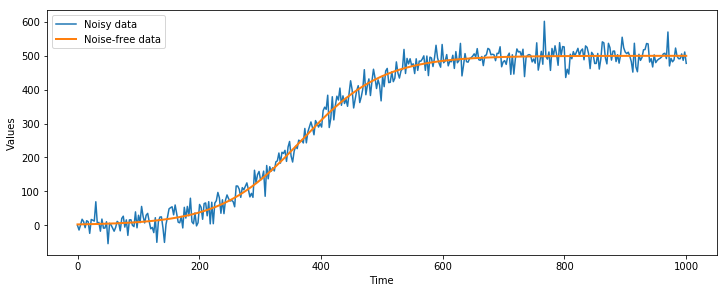

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4.5))
plt.xlabel('Time')
plt.ylabel('Values')
plt.plot(times, values, label='Noisy data')
plt.plot(times, org_values, lw=2, label='Noise-free data')
plt.legend()
plt.show()

Now, I have enough data (a model, a list of times, and a list of values) to formulate a PINTS problem:

In [8]:
model = RescaledModel()
problem = pints.SingleOutputProblem(model, times, values)

I now have some toy data, and a model that can be used for forward simulations. To make it into a probabilistic problem, a _noise model_ needs to be added. This can be done using the `GaussianLogLikelihood` function, which assumes independently distributed Gaussian noise over the data, and can calculate log-likelihoods:

In [9]:
#log_likelihood = pints.GaussianLogLikelihood(problem)
log_likelihood = pints.GaussianKnownSigmaLogLikelihood(problem, noise)

This `log_likelihood` represents the _conditional probability_ $p(y|\theta)$, given a set of parameters $\theta$ and a series of $y=$ `values`, it can calculate the probability of finding those values if the real parameters are $\theta$.

This can be used in a Bayesian inference scheme to find the quantity of interest:

$p(\theta|y) = \frac{p(\theta)p(y|\theta)}{p(y)} \propto p(\theta)p(y|\theta)$

To solve this, a _prior_ is defined, indicating an initial guess about what the parameters should be. 
Similarly as using a _log-likelihood_ (the natural logarithm of a likelihood), this is defined by using a _log-prior_. Hence, the above equation simplifies to:

$\log p(\theta|y) \propto \log p(\theta) + \log p(y|\theta)$

In this example, it is assumed that we don't know too much about the prior except lower and upper bounds for each variable: We assume the first model parameter is somewhere on the interval $[0.01, 0.02]$, the second model parameter on $[400, 600]$, and the standard deviation of the noise is somewhere on $[1, 100]$.

In [10]:
# Create bounds for our parameters and get prior
#bounds = pints.RectangularBoundaries([0.01, 400], [0.02, 600])
bounds = pints.RectangularBoundaries([0.5, 0.8], [1.0, 1.2])
log_prior = pints.UniformLogPrior(bounds)

With this prior, the numerator of Bayes' rule can be defined -- the unnormalised log posterior, $\log \left[ p(y|\theta) p(\theta) \right]$, which is the natural logarithm of the likelihood times the prior:

In [11]:
# Create a posterior log-likelihood (log(likelihood * prior))
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

Finally we create a list of guesses to use as initial positions. We'll run three MCMC chains so we create three initial positions:

In [12]:
xs = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05,
    np.array(start_parameters) * 1.15,
]

And this gives us everything we need to run an MCMC routine:

In [13]:
chains = pints.mcmc_sample(log_posterior, 3, xs)

Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0         0         0          0:00.1
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0.333     0         0          0:00.1
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0.5       0         0.25       0:00.1
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]




[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]

 [5.34725135e-05 2.22020995e-04]]


[[1.63294433e-04 1.20647119e-05]
 [1.20647119e-05 2.37800325e-04]]


[[0.0002516  0.00012257]
 [0.00012257 0.0003781 ]]


[[1.30411081e-04 3.95225774e-05]
 [3.95225774e-05 1.62979722e-04]]


[[1.19688955e-04 8.13377662e-06]
 [8.13377662e-06 1.79721308e-04]]


[[1.84891766e-04 9.05928118e-05]
 [9.05928118e-05 2.78029438e-04]]


[[9.78372815e-05 2.97835354e-05]
 [2.97835354e-05 1.22234360e-04]]


[[8.96712595e-05 5.72080931e-06]
 [5.72080931e-06 1.37499610e-04]]


[[1.38771249e-04 6.82691867e-05]
 [6.82691867e-05 2.08771527e-04]]


[[7.47287178e-05 2.28216942e-05]
 [2.28216942e-05 9.33432626e-05]]


[[6.84245240e-05 4.16044872e-06]
 [4.16044872e-06 1.06486700e-04]]


[[1.06027981e-04 5.23114023e-05]
 [5.23114023e-05 1.59563914e-04]]


[[6.12713917e-05 1.74206203e-05]
 [1.74206203e-05 7.23465549e-05]]


[[5.34301865e-05 2.16708627e-06]
 [2.16708627e-06 8.52190026e-05]]


[[8.22556046e-05 4.06683144e-05]
 [4.06683144e-05 1.23818087e-04]]


[[4.82282845e-

 [2.63921994e-06 6.90724418e-06]]


[[ 9.68033009e-06 -2.63724295e-06]
 [-2.63724295e-06  1.35133035e-05]]


[[ 1.66372955e-05 -9.97161456e-06]
 [-9.97161456e-06  1.27623574e-05]]


[[5.78549562e-06 2.46299243e-06]
 [2.46299243e-06 6.46366521e-06]]


[[ 9.96997109e-06 -2.51656890e-06]
 [-2.51656890e-06  1.26527854e-05]]


[[ 1.62784863e-05 -8.93876379e-06]
 [-8.93876379e-06  1.21701335e-05]]


[[5.55447908e-06 2.29991599e-06]
 [2.29991599e-06 6.05110287e-06]]


[[ 1.01285441e-05 -2.39845322e-06]
 [-2.39845322e-06  1.18518096e-05]]


[[ 1.52451854e-05 -8.37823491e-06]
 [-8.37823491e-06  1.46703536e-05]]


[[5.49342457e-06 1.82102718e-06]
 [1.82102718e-06 6.04712788e-06]]


[[ 1.01931341e-05 -2.42102579e-06]
 [-2.42102579e-06  1.11469905e-05]]


[[ 1.63568838e-05 -1.07241841e-05]
 [-1.07241841e-05  1.77296668e-05]]


[[5.40117571e-06 1.41567211e-06]
 [1.41567211e-06 5.99725067e-06]]


[[ 1.01682985e-05 -2.42104347e-06]
 [-2.42104347e-06  1.04853819e-05]]


[[ 1.55022394e-05 -1.02169295e-

[[ 9.27603746e-06 -6.25755057e-06]
 [-6.25755057e-06  1.22674526e-05]]


[[ 1.1290765e-05 -6.1731787e-06]
 [-6.1731787e-06  9.7329641e-06]]


[[ 1.10222759e-05 -6.26076020e-06]
 [-6.26076020e-06  1.25958867e-05]]


[[ 9.29422461e-06 -6.52608967e-06]
 [-6.52608967e-06  1.24274432e-05]]


[[ 1.14214333e-05 -6.44990214e-06]
 [-6.44990214e-06  9.78891338e-06]]


[[ 1.06291979e-05 -6.05826217e-06]
 [-6.05826217e-06  1.21059781e-05]]


[[ 9.27593452e-06 -6.73642881e-06]
 [-6.73642881e-06  1.25213739e-05]]


[[ 1.09316390e-05 -6.11181010e-06]
 [-6.11181010e-06  1.03377662e-05]]


[[ 1.02472257e-05 -5.85935786e-06]
 [-5.85935786e-06  1.16340805e-05]]


[[ 9.22608979e-06 -6.89544933e-06]
 [-6.89544933e-06  1.25576435e-05]]


[[ 1.04641887e-05 -5.79434598e-06]
 [-5.79434598e-06  1.07796041e-05]]


[[ 9.81876846e-06 -5.74776923e-06]
 [-5.74776923e-06  1.26760401e-05]]


[[ 9.14907224e-06 -7.00930893e-06]
 [-7.00930893e-06  1.25437451e-05]]


[[ 1.00180052e-05 -5.49605798e-06]
 [-5.49605798e-06  1

[[ 6.70120347e-06 -3.20507828e-06]
 [-3.20507828e-06  6.79211157e-06]]


[[ 1.02563948e-05 -9.44715753e-06]
 [-9.44715753e-06  1.86380239e-05]]


[[ 8.91588223e-06 -9.11158846e-06]
 [-9.11158846e-06  1.46700508e-05]]


[[ 6.51462218e-06 -3.00308333e-06]
 [-3.00308333e-06  6.72924465e-06]]


[[ 1.02822752e-05 -9.55736420e-06]
 [-9.55736420e-06  1.84923162e-05]]


[[ 8.85826390e-06 -9.09204380e-06]
 [-9.09204380e-06  1.45101071e-05]]


[[ 6.30845093e-06 -2.81436955e-06]
 [-2.81436955e-06  6.84485189e-06]]


[[ 9.96979433e-06 -9.22668544e-06]
 [-9.22668544e-06  1.78494302e-05]]


[[ 8.78560389e-06 -9.05299932e-06]
 [-9.05299932e-06  1.43322494e-05]]


[[ 6.10850579e-06 -2.63835547e-06]
 [-2.63835547e-06  6.93241194e-06]]


[[ 9.66578384e-06 -8.90810123e-06]
 [-8.90810123e-06  1.72302670e-05]]


[[ 8.69969162e-06 -8.99663242e-06]
 [-8.99663242e-06  1.41388447e-05]]


[[ 6.17059418e-06 -2.27337842e-06]
 [-2.27337842e-06  6.96622127e-06]]


[[ 9.59168970e-06 -8.05914383e-06]
 [-8.05914383e-0

[[ 1.10664059e-05 -6.98482557e-06]
 [-6.98482557e-06  1.56676246e-05]]


[[ 1.36393702e-05 -2.39744079e-07]
 [-2.39744079e-07  1.43423568e-05]]


[[ 1.04413222e-05 -3.50462737e-06]
 [-3.50462737e-06  2.00909127e-05]]


[[ 1.07535235e-05 -6.87451268e-06]
 [-6.87451268e-06  1.58792646e-05]]


[[ 1.32628428e-05 -1.43151449e-07]
 [-1.43151449e-07  1.42289629e-05]]


[[ 1.01778446e-05 -3.53814550e-06]
 [-3.53814550e-06  1.99187573e-05]]


[[ 1.04495957e-05 -6.76208653e-06]
 [-6.76208653e-06  1.60452693e-05]]


[[ 1.28965413e-05 -5.47534767e-08]
 [-5.47534767e-08  1.41011532e-05]]


[[ 9.91998902e-06 -3.56268699e-06]
 [-3.56268699e-06  1.97275940e-05]]


[[ 1.01543754e-05 -6.64794627e-06]
 [-6.64794627e-06  1.61694575e-05]]


[[ 1.26935705e-05 -2.48278295e-07]
 [-2.48278295e-07  1.39025941e-05]]


[[ 9.66772452e-06 -3.57901802e-06]
 [-3.57901802e-06  1.95194950e-05]]


[[ 9.86762109e-06 -6.53245716e-06]
 [-6.53245716e-06  1.62553746e-05]]


[[ 1.28375209e-05 -4.96840488e-07]
 [-4.96840488e-0

 [-5.33015607e-06  1.06844255e-05]]


[[ 5.93520934e-06 -7.41997456e-06]
 [-7.41997456e-06  1.63540182e-05]]


[[ 1.09797650e-05 -3.14655534e-06]
 [-3.14655534e-06  1.09444155e-05]]


[[ 2.06048735e-05 -4.53477112e-06]
 [-4.53477112e-06  1.10103936e-05]]


[[ 5.99337674e-06 -7.60798069e-06]
 [-7.60798069e-06  1.66119510e-05]]


[[ 1.07286595e-05 -2.84964044e-06]
 [-2.84964044e-06  1.20367720e-05]]


[[ 2.00722242e-05 -4.37603834e-06]
 [-4.37603834e-06  1.16691269e-05]]


[[ 6.03909951e-06 -7.77138654e-06]
 [-7.77138654e-06  1.68279339e-05]]


[[ 1.04514644e-05 -2.74222721e-06]
 [-2.74222721e-06  1.33358136e-05]]


[[ 1.95540052e-05 -4.22373249e-06]
 [-4.22373249e-06  1.22616804e-05]]


[[ 6.07330289e-06 -7.91191671e-06]
 [-7.91191671e-06  1.70049974e-05]]


640   1923   0.209     0.211     0.209      0:01.5
[[ 1.02124036e-05 -2.77637349e-06]
 [-2.77637349e-06  1.33437666e-05]]


[[ 1.90498083e-05 -4.07755981e-06]
 [-4.07755981e-06  1.27924702e-05]]


[[ 6.09685381e-06 -8.03118929e-06]


[[6.27936267e-06 9.09453465e-07]
 [9.09453465e-07 2.14927810e-05]]


[[ 1.46593875e-05 -7.86724981e-06]
 [-7.86724981e-06  2.05777862e-05]]


[[ 9.46164669e-06 -6.98455788e-06]
 [-6.98455788e-06  1.87601633e-05]]


[[6.13252707e-06 9.02799466e-07]
 [9.02799466e-07 2.16359649e-05]]


[[ 1.43171795e-05 -7.67735710e-06]
 [-7.67735710e-06  2.01178268e-05]]


[[ 9.72952650e-06 -7.00694279e-06]
 [-7.00694279e-06  1.83912045e-05]]


720   2163   0.208     0.214     0.218      0:01.7
[[ 6.59618462e-06 -1.02838433e-07]
 [-1.02838433e-07  2.27256789e-05]]


[[ 1.39833131e-05 -7.49238275e-06]
 [-7.49238275e-06  1.96681324e-05]]


[[ 9.96819737e-06 -7.02017761e-06]
 [-7.02017761e-06  1.80280387e-05]]


[[ 7.02043546e-06 -1.03835678e-06]
 [-1.03835678e-06  2.37149709e-05]]


[[ 1.36575769e-05 -7.31218825e-06]
 [-7.31218825e-06  1.92284878e-05]]


[[ 1.01794799e-05 -7.02490410e-06]
 [-7.02490410e-06  1.76706714e-05]]


[[ 6.93902174e-06 -1.15937312e-06]
 [-1.15937312e-06  2.34166978e-05]]


[[ 1.333

 [-5.36872635e-06  1.46174259e-05]]


[[ 1.03703897e-05 -5.41041450e-06]
 [-5.41041450e-06  1.22896423e-05]]


[[ 8.82569620e-06 -3.66070395e-06]
 [-3.66070395e-06  1.30029130e-05]]


[[ 2.18246422e-05 -5.08523449e-06]
 [-5.08523449e-06  1.43176180e-05]]


[[ 1.03186860e-05 -5.52255852e-06]
 [-5.52255852e-06  1.23307091e-05]]


[[ 8.73967671e-06 -3.71172230e-06]
 [-3.71172230e-06  1.28861259e-05]]


[[ 2.14861984e-05 -5.28644777e-06]
 [-5.28644777e-06  1.47531509e-05]]


[[ 1.02608960e-05 -5.62250760e-06]
 [-5.62250760e-06  1.23579283e-05]]


[[ 8.57368390e-06 -3.67852714e-06]
 [-3.67852714e-06  1.27101650e-05]]


[[ 2.11498515e-05 -5.47000942e-06]
 [-5.47000942e-06  1.51474692e-05]]


[[ 1.01974762e-05 -5.71096666e-06]
 [-5.71096666e-06  1.23721840e-05]]


[[ 8.41050386e-06 -3.64411055e-06]
 [-3.64411055e-06  1.25338961e-05]]


[[ 2.08157898e-05 -5.63690121e-06]
 [-5.63690121e-06  1.55028985e-05]]


[[ 1.01288581e-05 -5.78860488e-06]
 [-5.78860488e-06  1.23743143e-05]]


[[ 8.25011002

 [-9.16808615e-06  2.32190580e-05]]


[[ 8.62377140e-06 -2.35379315e-06]
 [-2.35379315e-06  1.61751748e-05]]


[[ 7.97591635e-06 -6.13025356e-06]
 [-6.13025356e-06  1.63002711e-05]]


[[ 2.08603498e-05 -9.18569924e-06]
 [-9.18569924e-06  2.28611794e-05]]


[[ 8.80815413e-06 -2.49423549e-06]
 [-2.49423549e-06  1.59547821e-05]]


[[ 8.24615599e-06 -6.52203721e-06]
 [-6.52203721e-06  1.65936659e-05]]


[[ 2.08276351e-05 -9.19521874e-06]
 [-9.19521874e-06  2.25067655e-05]]


[[ 8.97493269e-06 -2.62450770e-06]
 [-2.62450770e-06  1.57350814e-05]]


[[ 8.49417769e-06 -6.88578487e-06]
 [-6.88578487e-06  1.68570676e-05]]


[[ 2.07808643e-05 -9.19712557e-06]
 [-9.19712557e-06  2.21558970e-05]]


[[ 9.12503364e-06 -2.74511733e-06]
 [-2.74511733e-06  1.55162106e-05]]


[[ 8.72112014e-06 -7.22289193e-06]
 [-7.22289193e-06  1.70920717e-05]]


[[ 2.07181602e-05 -8.53246902e-06]
 [-8.53246902e-06  2.23967921e-05]]


[[ 9.25934058e-06 -2.85654885e-06]
 [-2.85654885e-06  1.52982982e-05]]


[[ 9.25517186

 [-2.74932160e-06  1.48605329e-05]]


[[ 1.04359692e-05 -5.72403679e-06]
 [-5.72403679e-06  1.39677832e-05]]


[[ 1.65647135e-05 -6.25009859e-06]
 [-6.25009859e-06  1.17931977e-05]]


[[ 5.21798269e-06 -2.88706188e-06]
 [-2.88706188e-06  1.49779383e-05]]


[[ 1.02492344e-05 -5.67248203e-06]
 [-5.67248203e-06  1.42341059e-05]]


[[ 1.62707092e-05 -6.13837674e-06]
 [-6.13837674e-06  1.15770955e-05]]


[[ 5.20926356e-06 -3.01529209e-06]
 [-3.01529209e-06  1.50788301e-05]]


[[ 1.00658792e-05 -5.61995081e-06]
 [-5.61995081e-06  1.44762293e-05]]


[[ 1.59819404e-05 -6.02867419e-06]
 [-6.02867419e-06  1.13650978e-05]]


[[ 5.19752966e-06 -3.13445731e-06]
 [-3.13445731e-06  1.51640678e-05]]


[[ 1.03606807e-05 -5.12791929e-06]
 [-5.12791929e-06  1.45245967e-05]]


[[ 1.63298290e-05 -5.93793560e-06]
 [-5.93793560e-06  1.11568053e-05]]


[[ 5.18295928e-06 -3.24498368e-06]
 [-3.24498368e-06  1.52344733e-05]]


[[ 1.06323653e-05 -4.65945711e-06]
 [-4.65945711e-06  1.45605835e-05]]


980   2943   

[[ 1.39958855e-05 -6.24723246e-06]
 [-6.24723246e-06  8.92559845e-06]]


[[ 1.07171937e-05 -7.95535758e-06]
 [-7.95535758e-06  1.77137028e-05]]


[[ 9.06477994e-06 -3.31228590e-06]
 [-3.31228590e-06  9.82546114e-06]]


[[ 1.45277631e-05 -6.27201513e-06]
 [-6.27201513e-06  8.79389167e-06]]


[[ 1.06145285e-05 -8.13627088e-06]
 [-8.13627088e-06  1.86319795e-05]]


[[ 8.92185818e-06 -3.28817178e-06]
 [-3.28817178e-06  9.73410129e-06]]


[[ 1.50235288e-05 -6.29179434e-06]
 [-6.29179434e-06  8.66377252e-06]]


[[ 1.04316555e-05 -8.01442840e-06]
 [-8.01442840e-06  1.87704154e-05]]


[[ 8.87047679e-06 -3.15948227e-06]
 [-3.15948227e-06  9.61574021e-06]]


[[ 1.50492783e-05 -6.30622834e-06]
 [-6.30622834e-06  8.56715605e-06]]


[[ 1.02520446e-05 -7.89412861e-06]
 [-7.89412861e-06  1.88905759e-05]]


[[ 8.81649155e-06 -3.03556664e-06]
 [-3.03556664e-06  9.49779292e-06]]


[[ 1.50647914e-05 -6.31618478e-06]
 [-6.31618478e-06  8.47045537e-06]]


[[ 1.00756357e-05 -7.77536532e-06]
 [-7.77536532e-0

 [-4.29664956e-06  1.17703607e-05]]


[[ 1.36566434e-05 -3.12689555e-06]
 [-3.12689555e-06  1.32379197e-05]]


[[ 5.44095972e-06 -1.50379852e-06]
 [-1.50379852e-06  7.71167404e-06]]


[[ 8.48591582e-06 -4.22633105e-06]
 [-4.22633105e-06  1.15774964e-05]]


[[ 1.3436493e-05 -3.0789413e-06]
 [-3.0789413e-06  1.3023980e-05]]


[[ 5.36036971e-06 -1.48590353e-06]
 [-1.48590353e-06  7.59062642e-06]]


[[ 8.35175889e-06 -4.15720584e-06]
 [-4.15720584e-06  1.13879125e-05]]


[[ 1.32199696e-05 -3.03169616e-06]
 [-3.03169616e-06  1.28135827e-05]]


[[ 5.28087246e-06 -1.46809393e-06]
 [-1.46809393e-06  7.47146521e-06]]


[[ 8.21972656e-06 -4.08925294e-06]
 [-4.08925294e-06  1.12015511e-05]]


[[ 1.33018594e-05 -3.10389280e-06]
 [-3.10389280e-06  1.26536408e-05]]


[[ 5.20245787e-06 -1.45037546e-06]
 [-1.45037546e-06  7.35416283e-06]]


[[ 8.08978650e-06 -4.02245177e-06]
 [-4.02245177e-06  1.10183554e-05]]


[[ 1.33726890e-05 -3.17091380e-06]
 [-3.17091380e-06  1.24948029e-05]]


[[ 5.12511572e-06

[[ 1.42900886e-05 -6.63126183e-06]
 [-6.63126183e-06  1.17188167e-05]]


[[ 6.20479506e-06 -2.47774064e-06]
 [-2.47774064e-06  6.62348706e-06]]


[[ 9.57469724e-06 -3.21881519e-06]
 [-3.21881519e-06  2.39896716e-05]]


[[ 1.50428346e-05 -7.45781168e-06]
 [-7.45781168e-06  1.24227134e-05]]


[[ 6.33162049e-06 -2.33186326e-06]
 [-2.33186326e-06  6.57178908e-06]]


[[ 9.50058119e-06 -3.07319528e-06]
 [-3.07319528e-06  2.37378095e-05]]


[[ 1.49188467e-05 -7.49410572e-06]
 [-7.49410572e-06  1.24400231e-05]]


[[ 6.47609235e-06 -2.27016079e-06]
 [-2.27016079e-06  6.47211742e-06]]


[[ 9.46835137e-06 -3.05183842e-06]
 [-3.05183842e-06  2.33744778e-05]]


[[ 1.47934584e-05 -7.52510997e-06]
 [-7.52510997e-06  1.24505496e-05]]


[[ 6.61073063e-06 -2.21023815e-06]
 [-2.21023815e-06  6.37397290e-06]]


[[ 9.43307555e-06 -3.03000979e-06]
 [-3.03000979e-06  2.30168212e-05]]


[[ 1.46667998e-05 -7.55106066e-06]
 [-7.55106066e-06  1.24546106e-05]]


[[ 6.71635783e-06 -2.21959391e-06]
 [-2.21959391e-0

[[ 8.00308126e-06 -3.26709977e-06]
 [-3.26709977e-06  1.74907798e-05]]


[[ 1.40470010e-05 -8.77929010e-06]
 [-8.77929010e-06  1.01803248e-05]]


[[ 1.08966931e-05 -7.80188843e-06]
 [-7.80188843e-06  1.58857093e-05]]


[[ 8.00941025e-06 -3.00336949e-06]
 [-3.00336949e-06  1.75987069e-05]]


[[ 1.38945541e-05 -8.68364012e-06]
 [-8.68364012e-06  1.00504071e-05]]


[[ 1.07344902e-05 -7.68915721e-06]
 [-7.68915721e-06  1.57659682e-05]]


[[ 8.01193376e-06 -2.75006022e-06]
 [-2.75006022e-06  1.76940862e-05]]


[[ 1.37427820e-05 -8.58842853e-06]
 [-8.58842853e-06  9.92185236e-06]]


[[ 1.05747866e-05 -7.57806243e-06]
 [-7.57806243e-06  1.56446224e-05]]


[[ 8.01082396e-06 -2.50681468e-06]
 [-2.50681468e-06  1.77774451e-05]]


[[ 1.35917242e-05 -8.49367951e-06]
 [-8.49367951e-06  9.79465791e-06]]


[[ 1.04175425e-05 -7.46858105e-06]
 [-7.46858105e-06  1.55218012e-05]]


[[ 8.60500481e-06 -2.78125868e-06]
 [-2.78125868e-06  1.76493042e-05]]


[[ 1.34414181e-05 -8.39941586e-06]
 [-8.39941586e-0

 [-2.36007787e-06  1.18766676e-05]]


[[ 7.50999856e-06 -5.72798143e-06]
 [-5.72798143e-06  1.28791517e-05]]


[[ 1.06191955e-05 -7.07494976e-06]
 [-7.07494976e-06  1.36920205e-05]]


[[ 1.23420739e-05 -2.32751299e-06]
 [-2.32751299e-06  1.17492672e-05]]


[[ 7.41196343e-06 -5.69760472e-06]
 [-5.69760472e-06  1.29827188e-05]]


[[ 1.04714749e-05 -7.00648557e-06]
 [-7.00648557e-06  1.37681130e-05]]


[[ 1.21659703e-05 -2.29539716e-06]
 [-2.29539716e-06  1.16225544e-05]]


[[ 7.31511635e-06 -5.66622072e-06]
 [-5.66622072e-06  1.30766137e-05]]


[[ 1.03258263e-05 -6.93811090e-06]
 [-6.93811090e-06  1.38353887e-05]]


[[ 1.19924664e-05 -2.26372445e-06]
 [-2.26372445e-06  1.14965533e-05]]


[[ 7.21944667e-06 -5.63388678e-06]
 [-5.63388678e-06  1.31612188e-05]]


[[ 1.01822213e-05 -6.86985093e-06]
 [-6.86985093e-06  1.38942040e-05]]


[[ 1.18306360e-05 -2.26539098e-06]
 [-2.26539098e-06  1.14586605e-05]]


[[ 7.11657189e-06 -5.55786126e-06]
 [-5.55786126e-06  1.33429740e-05]]


[[ 1.00406317

[[1.14041002e-05 2.91604226e-07]
 [2.91604226e-07 2.25386712e-05]]


[[ 7.22753572e-06 -4.78919119e-06]
 [-4.78919119e-06  1.21913409e-05]]


[[ 1.67952129e-05 -7.58838916e-06]
 [-7.58838916e-06  1.89372340e-05]]


[[ 1.15116092e-05 -2.21895739e-07]
 [-2.21895739e-07  2.32129305e-05]]


[[ 7.24259360e-06 -5.02443070e-06]
 [-5.02443070e-06  1.28170691e-05]]


[[ 1.70794958e-05 -7.28044060e-06]
 [-7.28044060e-06  1.87581783e-05]]


[[ 1.16104075e-05 -7.14242245e-07]
 [-7.14242245e-07  2.38508535e-05]]


[[ 7.25432876e-06 -5.24814113e-06]
 [-5.24814113e-06  1.34123348e-05]]


[[ 1.69433531e-05 -7.21292376e-06]
 [-7.21292376e-06  1.85116136e-05]]


[[ 1.17008218e-05 -1.18612912e-06]
 [-1.18612912e-06  2.44537137e-05]]


[[ 7.26287594e-06 -5.46071812e-06]
 [-5.46071812e-06  1.39781820e-05]]


[[ 1.68064723e-05 -7.14548483e-06]
 [-7.14548483e-06  1.82682547e-05]]


[[ 1.17831678e-05 -1.63822889e-06]
 [-1.63822889e-06  2.50227442e-05]]


[[ 7.26836539e-06 -5.66254499e-06]
 [-5.66254499e-06  1

 [-9.76019963e-06  3.49934110e-05]]


[[ 1.84666010e-05 -6.67226378e-06]
 [-6.67226378e-06  1.27891484e-05]]


[[ 1.06476858e-05 -2.35045468e-06]
 [-2.35045468e-06  1.03789710e-05]]


[[ 2.06815443e-05 -9.63423749e-06]
 [-9.63423749e-06  3.45370839e-05]]


[[ 1.83094602e-05 -6.57597190e-06]
 [-6.57597190e-06  1.26207484e-05]]


[[ 1.05617641e-05 -2.30081045e-06]
 [-2.30081045e-06  1.02479766e-05]]


[[ 2.04096045e-05 -9.50991444e-06]
 [-9.50991444e-06  3.40868216e-05]]


[[ 1.81521801e-05 -6.48120694e-06]
 [-6.48120694e-06  1.24546298e-05]]


[[ 1.04755752e-05 -2.25233172e-06]
 [-2.25233172e-06  1.01186074e-05]]


[[ 2.01413402e-05 -9.38720953e-06]
 [-9.38720953e-06  3.36425430e-05]]


[[ 1.79948236e-05 -6.38794173e-06]
 [-6.38794173e-06  1.22907609e-05]]


[[ 1.03891611e-05 -2.20498906e-06]
 [-2.20498906e-06  9.99084470e-06]]


[[ 1.98767006e-05 -9.26610208e-06]
 [-9.26610208e-06  3.32041682e-05]]


[[ 1.78374511e-05 -6.29614963e-06]
 [-6.29614963e-06  1.21291104e-05]]


[[ 1.03025625

 [-6.92039907e-06  1.75984599e-05]]


[[ 1.56299446e-05 -5.57086649e-06]
 [-5.57086649e-06  1.27407497e-05]]


[[ 6.44675238e-06 -2.77547560e-07]
 [-2.77547560e-07  5.50317341e-06]]


[[ 1.05210679e-05 -6.78828815e-06]
 [-6.78828815e-06  1.74617757e-05]]


[[ 1.54890459e-05 -5.64181877e-06]
 [-5.64181877e-06  1.29223055e-05]]


[[ 6.40527342e-06 -2.91857698e-07]
 [-2.91857698e-07  5.44072530e-06]]


[[ 1.04080125e-05 -6.65902767e-06]
 [-6.65902767e-06  1.73246625e-05]]


[[ 1.53485177e-05 -5.70823458e-06]
 [-5.70823458e-06  1.30927433e-05]]


[[ 6.36330631e-06 -3.05526676e-07]
 [-3.05526676e-07  5.37890228e-06]]


[[ 1.02959091e-05 -6.53255031e-06]
 [-6.53255031e-06  1.71871837e-05]]


[[ 1.52901624e-05 -6.02239407e-06]
 [-6.02239407e-06  1.40153868e-05]]


[[ 6.32088432e-06 -3.18574864e-07]
 [-3.18574864e-07  5.31770097e-06]]


[[ 1.01847587e-05 -6.40879043e-06]
 [-6.40879043e-06  1.70494001e-05]]


[[ 1.52290948e-05 -6.32261554e-06]
 [-6.32261554e-06  1.48982824e-05]]


[[ 6.27803956



[[ 9.55362460e-06 -3.63154651e-06]
 [-3.63154651e-06  1.22683749e-05]]


[[ 1.19327822e-05 -8.24068969e-06]
 [-8.24068969e-06  1.58955046e-05]]


[[ 7.69436825e-06 -1.72677730e-06]
 [-1.72677730e-06  1.03230972e-05]]


[[ 9.55812255e-06 -3.60660402e-06]
 [-3.60660402e-06  1.21196786e-05]]


[[ 1.18058850e-05 -8.16718185e-06]
 [-8.16718185e-06  1.57376373e-05]]


[[ 7.74083544e-06 -1.76031510e-06]
 [-1.76031510e-06  1.02165070e-05]]


[[ 9.55954116e-06 -3.58148726e-06]
 [-3.58148726e-06  1.19728022e-05]]


[[ 1.16800951e-05 -8.09391061e-06]
 [-8.09391061e-06  1.55808273e-05]]


[[ 7.78322103e-06 -1.79207307e-06]
 [-1.79207307e-06  1.01107555e-05]]


[[ 9.55799649e-06 -3.55621085e-06]
 [-3.55621085e-06  1.18277236e-05]]


[[ 1.15554106e-05 -8.02089042e-06]
 [-8.02089042e-06  1.54250848e-05]]


[[ 7.76477109e-06 -1.82194987e-06]
 [-1.82194987e-06  1.00204105e-05]]


[[ 9.55360110e-06 -3.53078889e-06]
 [-3.53078889e-06  1.16844211e-05]]


[[ 1.14318296e-05 -7.94813506e-06]
 [-7.94813506e


[[ 1.06161849e-05 -5.66196386e-06]
 [-5.66196386e-06  1.96867309e-05]]


[[ 1.26100050e-05 -2.00303478e-06]
 [-2.00303478e-06  1.09673995e-05]]


[[ 1.36577801e-05 -5.69890068e-06]
 [-5.69890068e-06  1.55524313e-05]]


[[ 1.04982775e-05 -5.62257879e-06]
 [-5.62257879e-06  1.95354041e-05]]


[[ 1.27852727e-05 -2.00001990e-06]
 [-2.00001990e-06  1.08370032e-05]]


[[ 1.35206002e-05 -5.72825339e-06]
 [-5.72825339e-06  1.57220815e-05]]


[[ 1.03816009e-05 -5.58299827e-06]
 [-5.58299827e-06  1.93839191e-05]]


[[ 1.29502698e-05 -1.76269103e-06]
 [-1.76269103e-06  1.08497165e-05]]


[[ 1.34068517e-05 -5.62070648e-06]
 [-5.62070648e-06  1.55643362e-05]]


[[ 1.02661448e-05 -5.54324136e-06]
 [-5.54324136e-06  1.92323273e-05]]


[[ 1.31056255e-05 -1.53338921e-06]
 [-1.53338921e-06  1.08588647e-05]]


[[ 1.32933533e-05 -5.51541553e-06]
 [-5.51541553e-06  1.54078044e-05]]


[[ 1.01518992e-05 -5.50332645e-06]
 [-5.50332645e-06  1.90806780e-05]]


[[ 1.29669714e-05 -1.48737873e-06]
 [-1.48737873e-

[[ 1.48974427e-05 -3.93672770e-06]
 [-3.93672770e-06  1.24874757e-05]]


[[ 6.52844007e-06 -6.04446664e-06]
 [-6.04446664e-06  1.65782666e-05]]


[[ 9.45117883e-06 -1.60339592e-06]
 [-1.60339592e-06  1.41860393e-05]]


[[ 1.51089290e-05 -3.76888154e-06]
 [-3.76888154e-06  1.23804840e-05]]


[[ 6.49520114e-06 -6.00884204e-06]
 [-6.00884204e-06  1.64132971e-05]]


[[ 9.35848966e-06 -1.51399133e-06]
 [-1.51399133e-06  1.43062207e-05]]


[[ 1.53089509e-05 -3.60587710e-06]
 [-3.60587710e-06  1.22738834e-05]]


[[ 6.46136818e-06 -5.97283808e-06]
 [-5.97283808e-06  1.62496535e-05]]


[[ 9.26650855e-06 -1.42729903e-06]
 [-1.42729903e-06  1.44183421e-05]]


[[ 1.54978601e-05 -3.44758804e-06]
 [-3.44758804e-06  1.21676901e-05]]


[[ 6.42697192e-06 -5.93647844e-06]
 [-5.93647844e-06  1.60873348e-05]]


[[ 9.17523628e-06 -1.34324694e-06]
 [-1.34324694e-06  1.45226588e-05]]


[[ 1.56759988e-05 -3.29389122e-06]
 [-3.29389122e-06  1.20619195e-05]]


[[ 6.39204210e-06 -5.89978604e-06]
 [-5.89978604e-0

[[ 1.35668403e-05 -8.26357565e-06]
 [-8.26357565e-06  2.55501234e-05]]


[[ 5.11416064e-06 -2.27999156e-06]
 [-2.27999156e-06  1.04659893e-05]]


[[ 1.29644622e-05 -3.10922267e-06]
 [-3.10922267e-06  1.00446268e-05]]


[[ 1.37329226e-05 -8.56624911e-06]
 [-8.56624911e-06  2.57519846e-05]]


[[ 5.06260865e-06 -2.25571293e-06]
 [-2.25571293e-06  1.03478756e-05]]


[[ 1.28903141e-05 -3.06130817e-06]
 [-3.06130817e-06  9.93313934e-06]]


[[ 1.37399096e-05 -8.29209757e-06]
 [-8.29209757e-06  2.56539118e-05]]


[[ 5.01151497e-06 -2.23168289e-06]
 [-2.23168289e-06  1.02311307e-05]]


[[ 1.28153967e-05 -3.01423839e-06]
 [-3.01423839e-06  9.82290165e-06]]


[[ 1.37431627e-05 -8.02512683e-06]
 [-8.02512683e-06  2.55526333e-05]]


[[ 4.96087737e-06 -2.20789924e-06]
 [-2.20789924e-06  1.01157383e-05]]


[[ 1.26834752e-05 -2.99044945e-06]
 [-2.99044945e-06  9.71991506e-06]]


[[ 1.37428099e-05 -7.76515977e-06]
 [-7.76515977e-06  2.54482867e-05]]


[[ 5.02885416e-06 -2.30635648e-06]
 [-2.30635648e-0

[[ 7.97086283e-06 -3.74354532e-06]
 [-3.74354532e-06  9.16339520e-06]]


[[ 1.01385117e-05 -2.56472907e-06]
 [-2.56472907e-06  9.59071119e-06]]


[[ 1.33364377e-05 -9.67001310e-06]
 [-9.67001310e-06  2.27912420e-05]]


[[ 8.02654543e-06 -3.69286868e-06]
 [-3.69286868e-06  9.06319223e-06]]


[[ 1.00591820e-05 -2.46279353e-06]
 [-2.46279353e-06  9.65377185e-06]]


[[ 1.35554226e-05 -9.88465895e-06]
 [-9.88465895e-06  2.28223412e-05]]


[[ 8.07846113e-06 -3.64297347e-06]
 [-3.64297347e-06  8.96411050e-06]]


[[ 9.98004578e-06 -2.36362483e-06]
 [-2.36362483e-06  9.71243080e-06]]


[[ 1.37639323e-05 -1.00898555e-05]
 [-1.00898555e-05  2.28469267e-05]]


[[ 8.12672339e-06 -3.59384598e-06]
 [-3.59384598e-06  8.86613722e-06]]


[[ 9.87374155e-06 -2.35358371e-06]
 [-2.35358371e-06  9.67957575e-06]]


[[ 1.39622663e-05 -1.02858685e-05]
 [-1.02858685e-05  2.28652110e-05]]


[[ 8.17144277e-06 -3.54547276e-06]
 [-3.54547276e-06  8.76925979e-06]]


[[ 9.76856538e-06 -2.34330761e-06]
 [-2.34330761e-0

 [-2.16126109e-06  1.20339613e-05]]


[[ 9.94760684e-06 -4.39930382e-07]
 [-4.39930382e-07  1.17612003e-05]]


[[ 1.23674554e-05 -1.03061554e-05]
 [-1.03061554e-05  2.40106041e-05]]


[[ 8.93940422e-06 -2.14682585e-06]
 [-2.14682585e-06  1.19593295e-05]]


[[ 9.88709239e-06 -2.86220000e-07]
 [-2.86220000e-07  1.21173281e-05]]


2120  6363   0.219     0.216     0.224      0:04.9
[[ 1.22606264e-05 -1.02707463e-05]
 [-1.02707463e-05  2.39728456e-05]]


[[ 8.84504195e-06 -2.13236406e-06]
 [-2.13236406e-06  1.18843643e-05]]


[[ 9.82626424e-06 -1.37376835e-07]
 [-1.37376835e-07  1.24592634e-05]]


[[ 1.21295663e-05 -1.01633849e-05]
 [-1.01633849e-05  2.37502231e-05]]


[[ 8.75169018e-06 -2.11788004e-06]
 [-2.11788004e-06  1.18090944e-05]]


[[ 1.09897276e-05 -1.75252902e-07]
 [-1.75252902e-07  1.23270994e-05]]


[[ 1.20028065e-05 -1.00591611e-05]
 [-1.00591611e-05  2.35028124e-05]]


[[ 8.65933809e-06 -2.10337795e-06]
 [-2.10337795e-06  1.17335477e-05]]


[[ 1.21133749e-05 -2.11874361e-07]


 [-6.38533837e-06  1.67974533e-05]]


[[ 9.31790712e-06 -4.80154001e-06]
 [-4.80154001e-06  1.31631341e-05]]


[[ 1.33481444e-05 -2.85373732e-06]
 [-2.85373732e-06  9.60759145e-06]]


[[ 8.70221981e-06 -6.30576659e-06]
 [-6.30576659e-06  1.66372831e-05]]


[[ 9.23555370e-06 -4.84108977e-06]
 [-4.84108977e-06  1.35571074e-05]]


[[ 1.35692702e-05 -2.90953799e-06]
 [-2.90953799e-06  9.52737936e-06]]


[[ 8.62229884e-06 -6.24255643e-06]
 [-6.24255643e-06  1.64638997e-05]]


[[ 9.15377105e-06 -4.87834510e-06]
 [-4.87834510e-06  1.39357751e-05]]


[[ 1.37805075e-05 -2.96295537e-06]
 [-2.96295537e-06  9.44760735e-06]]


[[ 8.54300631e-06 -6.17996887e-06]
 [-6.17996887e-06  1.62923675e-05]]


[[ 9.05855236e-06 -4.81610476e-06]
 [-4.81610476e-06  1.40293694e-05]]


[[ 1.39821239e-05 -3.01405344e-06]
 [-3.01405344e-06  9.36827946e-06]]


[[ 8.46434014e-06 -6.11799824e-06]
 [-6.11799824e-06  1.61226665e-05]]


[[ 8.97130619e-06 -4.79249153e-06]
 [-4.79249153e-06  1.39783881e-05]]


[[ 1.42271448

 [-1.96342275e-06  1.16905786e-05]]


[[ 9.30029075e-06 -5.77444433e-06]
 [-5.77444433e-06  1.24123400e-05]]


[[ 9.19910683e-06 -2.45747296e-06]
 [-2.45747296e-06  1.28489656e-05]]


[[ 1.06796252e-05 -2.01587099e-06]
 [-2.01587099e-06  1.16794792e-05]]


[[ 9.20925845e-06 -5.69472683e-06]
 [-5.69472683e-06  1.23934300e-05]]


[[ 9.12832461e-06 -2.47171212e-06]
 [-2.47171212e-06  1.27844322e-05]]


[[ 1.06460383e-05 -1.96840864e-06]
 [-1.96840864e-06  1.15697190e-05]]


[[ 9.54496281e-06 -5.92106103e-06]
 [-5.92106103e-06  1.24551856e-05]]


[[ 9.35612654e-06 -2.69261869e-06]
 [-2.69261869e-06  1.28425981e-05]]


[[ 1.06112699e-05 -1.92199058e-06]
 [-1.92199058e-06  1.14609173e-05]]


[[ 9.45145289e-06 -5.91898278e-06]
 [-5.91898278e-06  1.31915164e-05]]


[[ 9.57501658e-06 -2.90620664e-06]
 [-2.90620664e-06  1.28963201e-05]]


[[ 1.05753643e-05 -1.87659429e-06]
 [-1.87659429e-06  1.13530676e-05]]


2280  6843   0.22      0.222     0.225      0:05.3
[[ 9.35884427e-06 -5.91574102e-06]


[[ 1.02637863e-05 -7.03224977e-06]
 [-7.03224977e-06  1.26508387e-05]]


[[ 1.57116734e-05 -4.87245437e-06]
 [-4.87245437e-06  1.03073466e-05]]


[[ 1.98069364e-05 -5.97567396e-06]
 [-5.97567396e-06  1.34406073e-05]]


[[ 1.02387994e-05 -7.07967028e-06]
 [-7.07967028e-06  1.27032207e-05]]


[[ 1.60645817e-05 -4.92579794e-06]
 [-4.92579794e-06  1.02249130e-05]]


[[ 1.96261348e-05 -5.97764997e-06]
 [-5.97764997e-06  1.35323625e-05]]


[[ 1.02125327e-05 -7.12427176e-06]
 [-7.12427176e-06  1.27515222e-05]]


[[ 1.64037599e-05 -4.97657176e-06]
 [-4.97657176e-06  1.01429198e-05]]


[[ 1.94468532e-05 -5.97838365e-06]
 [-5.97838365e-06  1.36186961e-05]]


[[ 1.01850306e-05 -7.16613080e-06]
 [-7.16613080e-06  1.27958574e-05]]


[[ 1.67295560e-05 -5.02484358e-06]
 [-5.02484358e-06  1.00613705e-05]]


[[ 1.92529711e-05 -5.91697109e-06]
 [-5.91697109e-06  1.36814562e-05]]


[[ 1.01200892e-05 -7.02155190e-06]
 [-7.02155190e-06  1.28145698e-05]]


[[ 1.70423100e-05 -5.07067956e-06]
 [-5.07067956e-0

 [-3.61777896e-06  1.18410106e-05]]


[[ 1.43808188e-05 -2.84202303e-06]
 [-2.84202303e-06  1.00907020e-05]]


[[ 1.69298600e-05 -6.99758294e-06]
 [-6.99758294e-06  2.43622230e-05]]


[[ 7.64633250e-06 -3.68499684e-06]
 [-3.68499684e-06  1.19918426e-05]]


[[ 1.44757190e-05 -2.72077421e-06]
 [-2.72077421e-06  1.00294827e-05]]


[[ 1.68318516e-05 -6.67224881e-06]
 [-6.67224881e-06  2.51093781e-05]]


[[ 7.88055813e-06 -3.71907752e-06]
 [-3.71907752e-06  1.18907874e-05]]


[[ 1.45651061e-05 -2.60255462e-06]
 [-2.60255462e-06  9.96815512e-06]]


[[ 1.67407155e-05 -6.61151933e-06]
 [-6.61151933e-06  2.48647996e-05]]


[[ 8.10644878e-06 -3.75145892e-06]
 [-3.75145892e-06  1.17904363e-05]]


[[ 1.46491265e-05 -2.48729743e-06]
 [-2.48729743e-06  9.90673437e-06]]


[[ 1.66490764e-05 -6.55131407e-06]
 [-6.55131407e-06  2.46226656e-05]]


[[ 8.32420787e-06 -3.78218520e-06]
 [-3.78218520e-06  1.16907882e-05]]


[[ 1.47674759e-05 -2.43068578e-06]
 [-2.43068578e-06  9.81420107e-06]]


[[ 1.65569674

 [-2.79248459e-06  1.49077808e-05]]


[[ 1.48375334e-05 -4.87748402e-06]
 [-4.87748402e-06  9.03378374e-06]]


[[ 1.44232303e-05 -8.99899410e-06]
 [-8.99899410e-06  3.33900625e-05]]


[[ 9.91712125e-06 -2.71723691e-06]
 [-2.71723691e-06  1.48001984e-05]]


[[ 1.47735183e-05 -4.91834530e-06]
 [-4.91834530e-06  9.04613207e-06]]


[[ 1.43160981e-05 -8.95124905e-06]
 [-8.95124905e-06  3.31192367e-05]]


[[ 9.88951045e-06 -2.64364860e-06]
 [-2.64364860e-06  1.46930127e-05]]


[[ 1.46746398e-05 -4.93821122e-06]
 [-4.93821122e-06  9.06600549e-06]]


[[ 1.42094374e-05 -8.90324877e-06]
 [-8.90324877e-06  3.28501587e-05]]


[[ 9.86089970e-06 -2.57168527e-06]
 [-2.57168527e-06  1.45862324e-05]]


[[ 1.45759327e-05 -4.95661599e-06]
 [-4.95661599e-06  9.08367080e-06]]


[[ 1.41032546e-05 -8.85500972e-06]
 [-8.85500972e-06  3.25828284e-05]]


[[ 9.83132347e-06 -2.50131319e-06]
 [-2.50131319e-06  1.44798658e-05]]


[[ 1.44774104e-05 -4.97359865e-06]
 [-4.97359865e-06  9.09918888e-06]]


[[ 1.39975557

 [-2.08627341e-06  9.44051348e-06]]


[[ 1.20011409e-05 -5.20770506e-06]
 [-5.20770506e-06  1.24194487e-05]]


[[ 9.44167253e-06 -4.79138634e-06]
 [-4.79138634e-06  2.04283760e-05]]


[[ 6.22781453e-06 -2.08720465e-06]
 [-2.08720465e-06  9.36146843e-06]]


[[ 1.25610621e-05 -5.41866214e-06]
 [-5.41866214e-06  1.24037778e-05]]


[[ 9.39347192e-06 -4.75600961e-06]
 [-4.75600961e-06  2.02398554e-05]]


[[ 6.21465477e-06 -2.08774789e-06]
 [-2.08774789e-06  9.28301195e-06]]


[[ 1.24510941e-05 -5.38654059e-06]
 [-5.38654059e-06  1.23348584e-05]]


[[ 9.71795005e-06 -4.97481694e-06]
 [-4.97481694e-06  2.02190269e-05]]


[[ 6.20078604e-06 -2.08791408e-06]
 [-2.08791408e-06  9.20514144e-06]]


[[ 1.23420446e-05 -5.35438407e-06]
 [-5.35438407e-06  1.22657291e-05]]


[[ 1.00316662e-05 -5.18664067e-06]
 [-5.18664067e-06  2.01952768e-05]]


[[ 6.14385335e-06 -2.06955980e-06]
 [-2.06955980e-06  9.12065274e-06]]


[[ 1.22339070e-05 -5.32219937e-06]
 [-5.32219937e-06  1.21964085e-05]]


[[ 1.03348702

[[ 6.53676805e-06 -1.85246051e-06]
 [-1.85246051e-06  1.00731944e-05]]


[[ 1.27433480e-05 -8.96500590e-06]
 [-8.96500590e-06  1.68073398e-05]]


[[ 1.20041087e-05 -5.43752967e-06]
 [-5.43752967e-06  1.71803147e-05]]


[[ 6.47798965e-06 -1.82423284e-06]
 [-1.82423284e-06  1.01037356e-05]]


[[ 1.26431785e-05 -8.91117801e-06]
 [-8.91117801e-06  1.67019433e-05]]


[[ 1.20657347e-05 -5.65757263e-06]
 [-5.65757263e-06  1.74476222e-05]]


[[ 6.71261673e-06 -1.82557282e-06]
 [-1.82557282e-06  1.00124096e-05]]


[[ 1.25436500e-05 -8.85734187e-06]
 [-8.85734187e-06  1.65966549e-05]]


[[ 1.21236599e-05 -5.87063709e-06]
 [-5.87063709e-06  1.77046903e-05]]


[[ 6.93969155e-06 -1.82657203e-06]
 [-1.82657203e-06  9.92192067e-06]]


[[ 1.24404338e-05 -8.83243163e-06]
 [-8.83243163e-06  1.67183073e-05]]


[[ 1.21779775e-05 -6.07688085e-06]
 [-6.07688085e-06  1.79517601e-05]]


[[ 7.15938545e-06 -1.82723980e-06]
 [-1.82723980e-06  9.83226110e-06]]


[[ 1.23379768e-05 -8.80673414e-06]
 [-8.80673414e-0

 [-6.24894809e-07  7.96093342e-06]]


[[ 1.22267215e-05 -8.68288165e-06]
 [-8.68288165e-06  1.49953339e-05]]


[[ 1.30425791e-05 -5.07040853e-06]
 [-5.07040853e-06  1.39498446e-05]]


[[ 1.19503052e-05 -6.47243379e-07]
 [-6.47243379e-07  7.89603370e-06]]


[[ 1.21791179e-05 -8.66189565e-06]
 [-8.66189565e-06  1.49128225e-05]]


[[ 1.31738220e-05 -5.17993988e-06]
 [-5.17993988e-06  1.39212927e-05]]


[[ 1.19584213e-05 -6.68885762e-07]
 [-6.68885762e-07  7.83161333e-06]]


[[ 1.21308391e-05 -8.64008271e-06]
 [-8.64008271e-06  1.48301370e-05]]


[[ 1.32994112e-05 -5.28568743e-06]
 [-5.28568743e-06  1.38912724e-05]]


[[ 1.22125089e-05 -6.75814119e-07]
 [-6.75814119e-07  7.76172312e-06]]


[[ 1.20819117e-05 -8.61746912e-06]
 [-8.61746912e-06  1.47472960e-05]]


[[ 1.34194805e-05 -5.38773719e-06]
 [-5.38773719e-06  1.38598287e-05]]


[[ 1.22228427e-05 -7.20394741e-07]
 [-7.20394741e-07  7.71338986e-06]]


[[ 1.20323617e-05 -8.59408060e-06]
 [-8.59408060e-06  1.46643177e-05]]


[[ 1.35341611

[[ 1.16577081e-05 -3.99379017e-06]
 [-3.99379017e-06  1.53298013e-05]]


[[9.09621658e-06 9.37196505e-07]
 [9.37196505e-07 1.19600699e-05]]


[[ 9.60471375e-06 -4.12796835e-06]
 [-4.12796835e-06  1.41163500e-05]]


[[ 1.15593368e-05 -3.96586969e-06]
 [-3.96586969e-06  1.52063226e-05]]


[[9.19610548e-06 7.19694207e-07]
 [7.19694207e-07 1.20974894e-05]]


[[ 9.59397639e-06 -3.97948154e-06]
 [-3.97948154e-06  1.41613628e-05]]


[[ 1.14617762e-05 -3.93807306e-06]
 [-3.93807306e-06  1.50837535e-05]]


[[9.29192552e-06 5.07835629e-07]
 [5.07835629e-07 1.22293971e-05]]


[[ 9.58203575e-06 -3.83430686e-06]
 [-3.83430686e-06  1.42029890e-05]]


[[ 1.13650201e-05 -3.91040141e-06]
 [-3.91040141e-06  1.49620891e-05]]


[[9.38377074e-06 3.01503051e-07]
 [3.01503051e-07 1.23559201e-05]]


[[ 9.56892612e-06 -3.69237858e-06]
 [-3.69237858e-06  1.42413131e-05]]


[[ 1.12690626e-05 -3.88285584e-06]
 [-3.88285584e-06  1.48413248e-05]]


[[9.47173324e-06 1.00581048e-07]
 [1.00581048e-07 1.24771828e-05]]


 [-7.09504507e-07  1.01455577e-05]]


[[ 8.20651816e-06 -2.49956184e-06]
 [-2.49956184e-06  1.31384777e-05]]


[[ 1.03769555e-05 -2.39590829e-06]
 [-2.39590829e-06  1.28663216e-05]]


[[ 7.98758594e-06 -7.55239184e-07]
 [-7.55239184e-07  1.01227910e-05]]


[[ 8.17872459e-06 -2.46138911e-06]
 [-2.46138911e-06  1.30307248e-05]]


[[ 1.03938634e-05 -2.33800084e-06]
 [-2.33800084e-06  1.27675540e-05]]


[[ 7.95882057e-06 -7.99670747e-07]
 [-7.99670747e-07  1.00990995e-05]]


[[ 8.15042831e-06 -2.42384063e-06]
 [-2.42384063e-06  1.29238224e-05]]


[[ 1.04087734e-05 -2.28124961e-06]
 [-2.28124961e-06  1.26694425e-05]]


[[ 7.92961109e-06 -8.42826748e-07]
 [-8.42826748e-07  1.00745113e-05]]


[[ 8.12164702e-06 -2.38690574e-06]
 [-2.38690574e-06  1.28177645e-05]]


[[ 1.04217363e-05 -2.22563282e-06]
 [-2.22563282e-06  1.25719851e-05]]


[[ 7.89997379e-06 -8.84734203e-07]
 [-8.84734203e-07  1.00490538e-05]]


[[ 8.09239802e-06 -2.35057396e-06]
 [-2.35057396e-06  1.27125453e-05]]


[[ 1.04328014

 [-2.40791437e-06  1.07393970e-05]]


[[ 9.74115709e-06 -3.51321218e-06]
 [-3.51321218e-06  9.41279543e-06]]


[[ 1.04140298e-05 -3.52717657e-06]
 [-3.52717657e-06  1.25299197e-05]]


[[ 6.95278532e-06 -2.39182865e-06]
 [-2.39182865e-06  1.06712389e-05]]


[[ 9.69056728e-06 -3.52885323e-06]
 [-3.52885323e-06  9.39653415e-06]]


[[ 1.05923834e-05 -3.32672729e-06]
 [-3.32672729e-06  1.25316993e-05]]


[[ 6.89433223e-06 -2.37580797e-06]
 [-2.37580797e-06  1.06032788e-05]]


[[ 9.70319094e-06 -3.44022778e-06]
 [-3.44022778e-06  9.35238686e-06]]


[[ 1.07646425e-05 -3.13092228e-06]
 [-3.13092228e-06  1.25316189e-05]]


[[ 6.87766419e-06 -2.28340292e-06]
 [-2.28340292e-06  1.06365296e-05]]


[[ 9.71408757e-06 -3.35337031e-06]
 [-3.35337031e-06  9.30801475e-06]]


[[ 1.09309396e-05 -2.93967025e-06]
 [-2.93967025e-06  1.25297270e-05]]


[[ 6.86042726e-06 -2.19302954e-06]
 [-2.19302954e-06  1.06673917e-05]]


[[ 9.72330040e-06 -3.26824792e-06]
 [-3.26824792e-06  9.26343034e-06]]


[[ 1.08541498

 [-2.91027183e-06  9.58113710e-06]]


[[ 9.76502018e-06 -1.77483763e-06]
 [-1.77483763e-06  9.07082193e-06]]


[[ 1.08095875e-05 -3.69646684e-06]
 [-3.69646684e-06  9.24939987e-06]]


[[ 8.84302175e-06 -2.89019060e-06]
 [-2.89019060e-06  9.51165750e-06]]


[[ 1.00630973e-05 -1.55029425e-06]
 [-1.55029425e-06  9.11019729e-06]]


[[ 1.09168190e-05 -3.59239034e-06]
 [-3.59239034e-06  9.19858830e-06]]


[[ 8.77043098e-06 -2.87020909e-06]
 [-2.87020909e-06  9.44259152e-06]]


[[ 9.98256805e-06 -1.57530312e-06]
 [-1.57530312e-06  9.39374042e-06]]


[[ 1.10198137e-05 -3.49043139e-06]
 [-3.49043139e-06  9.14776395e-06]]


[[ 8.69843657e-06 -2.85032765e-06]
 [-2.85032765e-06  9.37393864e-06]]


[[ 9.91451213e-06 -1.56998808e-06]
 [-1.56998808e-06  9.31880216e-06]]


[[ 1.11186651e-05 -3.39055065e-06]
 [-3.39055065e-06  9.09693457e-06]]


3080  9243   0.23      0.223     0.224      0:07.1
[[ 8.62809750e-06 -2.84427701e-06]
 [-2.84427701e-06  9.41319945e-06]]


[[ 9.84677777e-06 -1.56458639e-06]


 [-3.94165145e-06  9.19765046e-06]]


[[ 1.17764066e-05 -1.40010443e-06]
 [-1.40010443e-06  1.21062254e-05]]


[[ 1.79514745e-05 -8.41483766e-06]
 [-8.41483766e-06  1.82739743e-05]]


[[ 9.41599959e-06 -3.90346404e-06]
 [-3.90346404e-06  9.15830294e-06]]


[[ 1.16790117e-05 -1.38916567e-06]
 [-1.38916567e-06  1.20401979e-05]]


[[ 1.80276754e-05 -8.24472439e-06]
 [-8.24472439e-06  1.81677865e-05]]


[[ 9.33896715e-06 -3.86569215e-06]
 [-3.86569215e-06  9.11868393e-06]]


[[ 1.15824418e-05 -1.37830902e-06]
 [-1.37830902e-06  1.19741682e-05]]


[[ 1.80995307e-05 -8.07770761e-06]
 [-8.07770761e-06  1.80617580e-05]]


[[ 9.29643892e-06 -3.78890567e-06]
 [-3.78890567e-06  9.10121720e-06]]


[[ 1.14866897e-05 -1.36753393e-06]
 [-1.36753393e-06  1.19081456e-05]]


[[ 1.81671397e-05 -7.91373286e-06]
 [-7.91373286e-06  1.79558997e-05]]


[[ 9.25369989e-06 -3.71350737e-06]
 [-3.71350737e-06  9.08294485e-06]]


[[ 1.13917483e-05 -1.35683989e-06]
 [-1.35683989e-06  1.18421393e-05]]


[[ 1.82305998

[[ 7.84067568e-06 -2.73443049e-06]
 [-2.73443049e-06  1.04895481e-05]]


[[ 8.54485378e-06 -1.70181602e-06]
 [-1.70181602e-06  1.14327726e-05]]


[[ 1.44372887e-05 -6.61524966e-06]
 [-6.61524966e-06  1.71393270e-05]]


[[ 7.84359121e-06 -2.77981453e-06]
 [-2.77981453e-06  1.04725971e-05]]


[[ 8.48281673e-06 -1.69770495e-06]
 [-1.69770495e-06  1.13521295e-05]]


[[ 1.45829984e-05 -6.48549105e-06]
 [-6.48549105e-06  1.70214922e-05]]


[[ 7.84539827e-06 -2.82372178e-06]
 [-2.82372178e-06  1.04546755e-05]]


[[ 8.42117412e-06 -1.69346986e-06]
 [-1.69346986e-06  1.12719562e-05]]


[[ 1.47232186e-05 -6.35804611e-06]
 [-6.35804611e-06  1.69042864e-05]]


[[ 7.84612412e-06 -2.86618290e-06]
 [-2.86618290e-06  1.04358098e-05]]


[[ 8.3599246e-06 -1.6891144e-06]
 [-1.6891144e-06  1.1192252e-05]]


[[ 1.48580663e-05 -6.23287488e-06]
 [-6.23287488e-06  1.67877100e-05]]


[[ 7.84579551e-06 -2.90722796e-06]
 [-2.90722796e-06  1.04160261e-05]]


[[ 8.29906681e-06 -1.68464215e-06]
 [-1.68464215e-06  1

 [-3.71992281e-06  1.07139092e-05]]


[[ 8.02352228e-06 -2.57815062e-06]
 [-2.57815062e-06  1.09577774e-05]]


[[ 7.56707686e-06 -9.86032978e-07]
 [-9.86032978e-07  1.09291742e-05]]


[[ 1.58261712e-05 -3.69003915e-06]
 [-3.69003915e-06  1.06279003e-05]]


[[ 8.00379086e-06 -2.60910782e-06]
 [-2.60910782e-06  1.09295523e-05]]


[[ 7.51022478e-06 -1.00972967e-06]
 [-1.00972967e-06  1.10987924e-05]]


[[ 1.57515793e-05 -3.66040144e-06]
 [-3.66040144e-06  1.05425984e-05]]


[[ 7.98350772e-06 -2.63898517e-06]
 [-2.63898517e-06  1.09006046e-05]]


[[ 7.45377785e-06 -1.03272643e-06]
 [-1.03272643e-06  1.12629039e-05]]


[[ 1.56767625e-05 -3.63100761e-06]
 [-3.63100761e-06  1.04579974e-05]]


[[ 7.96268904e-06 -2.66780509e-06]
 [-2.66780509e-06  1.08709559e-05]]


[[ 7.39773364e-06 -1.05503732e-06]
 [-1.05503732e-06  1.14216217e-05]]


[[ 1.56017360e-05 -3.60185561e-06]
 [-3.60185561e-06  1.03740916e-05]]


[[ 7.92075890e-06 -2.67100698e-06]
 [-2.67100698e-06  1.08113364e-05]]


[[ 7.34208976

 [-4.09817403e-06  1.31820615e-05]]


[[ 7.42307401e-06 -2.12127095e-06]
 [-2.12127095e-06  1.27339525e-05]]


[[ 1.15645208e-05 -4.04711787e-06]
 [-4.04711787e-06  1.10250950e-05]]


[[ 1.00296969e-05 -4.18518330e-06]
 [-4.18518330e-06  1.31142142e-05]]


[[ 7.37129257e-06 -2.14029074e-06]
 [-2.14029074e-06  1.28187317e-05]]


[[ 1.14979873e-05 -4.03323668e-06]
 [-4.03323668e-06  1.09511094e-05]]


[[ 1.03361826e-05 -4.26960840e-06]
 [-4.26960840e-06  1.30463432e-05]]


[[ 7.31982145e-06 -2.15859309e-06]
 [-2.15859309e-06  1.28999050e-05]]


[[ 1.14316003e-05 -4.01918262e-06]
 [-4.01918262e-06  1.08775150e-05]]


[[ 1.03355865e-05 -4.33947190e-06]
 [-4.33947190e-06  1.30756060e-05]]


[[ 7.26865981e-06 -2.17619294e-06]
 [-2.17619294e-06  1.29775487e-05]]


[[ 1.13653647e-05 -4.00496164e-06]
 [-4.00496164e-06  1.08043119e-05]]


[[ 1.03337189e-05 -4.40713962e-06]
 [-4.40713962e-06  1.31025487e-05]]


[[ 7.21780678e-06 -2.19310493e-06]
 [-2.19310493e-06  1.30517377e-05]]


[[ 1.12992855

[[ 1.21303443e-05 -5.47472340e-06]
 [-5.47472340e-06  1.36256711e-05]]


[[ 9.39744887e-06 -5.78131424e-06]
 [-5.78131424e-06  1.65793297e-05]]


[[ 1.33664799e-05 -2.25699192e-06]
 [-2.25699192e-06  1.05608060e-05]]


[[ 1.21965117e-05 -5.45619152e-06]
 [-5.45619152e-06  1.35230828e-05]]


[[ 9.40499707e-06 -5.80057037e-06]
 [-5.80057037e-06  1.65012934e-05]]


[[ 1.33190211e-05 -2.30093844e-06]
 [-2.30093844e-06  1.05452333e-05]]


[[ 1.22596560e-05 -5.43743265e-06]
 [-5.43743265e-06  1.34212566e-05]]


[[ 9.41123065e-06 -5.81867434e-06]
 [-5.81867434e-06  1.64230847e-05]]


[[ 1.32710601e-05 -2.34357901e-06]
 [-2.34357901e-06  1.05287485e-05]]


[[ 1.23198413e-05 -5.41845453e-06]
 [-5.41845453e-06  1.33201872e-05]]


[[ 9.41618005e-06 -5.83565122e-06]
 [-5.83565122e-06  1.63447176e-05]]


[[ 1.32226148e-05 -2.38493930e-06]
 [-2.38493930e-06  1.05113754e-05]]


[[ 1.23771301e-05 -5.39926475e-06]
 [-5.39926475e-06  1.32198692e-05]]


[[ 9.41987512e-06 -5.85152563e-06]
 [-5.85152563e-0

[[ 1.09716471e-05 -3.93141941e-06]
 [-3.93141941e-06  1.24550685e-05]]


[[ 8.57597167e-06 -3.51160700e-06]
 [-3.51160700e-06  1.37653703e-05]]


[[ 1.42745802e-05 -4.24328098e-06]
 [-4.24328098e-06  1.24515896e-05]]


[[ 1.08919834e-05 -3.92457090e-06]
 [-3.92457090e-06  1.24755060e-05]]


[[ 8.51022004e-06 -3.48325935e-06]
 [-3.48325935e-06  1.36687970e-05]]


[[ 1.41721416e-05 -4.24110128e-06]
 [-4.24110128e-06  1.24823609e-05]]


[[ 1.08821657e-05 -3.98643315e-06]
 [-3.98643315e-06  1.24941765e-05]]


[[ 8.44498276e-06 -3.45515534e-06]
 [-3.45515534e-06  1.35728415e-05]]


[[ 1.40703969e-05 -4.23847239e-06]
 [-4.23847239e-06  1.25109525e-05]]


[[ 1.08712932e-05 -4.04639951e-06]
 [-4.04639951e-06  1.25109455e-05]]


[[ 8.38368381e-06 -3.40516084e-06]
 [-3.40516084e-06  1.36203500e-05]]


[[ 1.39693420e-05 -4.23540516e-06]
 [-4.23540516e-06  1.25374120e-05]]


[[ 1.08593922e-05 -4.10450706e-06]
 [-4.10450706e-06  1.25258556e-05]]


[[ 8.33053642e-06 -3.39629593e-06]
 [-3.39629593e-0

 [-2.45211857e-06  1.34065948e-05]]


[[ 1.12918446e-05 -3.86722256e-06]
 [-3.86722256e-06  9.30843045e-06]]


[[ 1.13059501e-05 -5.41913908e-06]
 [-5.41913908e-06  1.20268052e-05]]


[[ 1.11342068e-05 -2.44205235e-06]
 [-2.44205235e-06  1.33059728e-05]]


[[ 1.12120852e-05 -3.85762406e-06]
 [-3.85762406e-06  9.30408273e-06]]


[[ 1.12337095e-05 -5.37803621e-06]
 [-5.37803621e-06  1.19356118e-05]]


[[ 1.11179271e-05 -2.43193538e-06]
 [-2.43193538e-06  1.32061155e-05]]


[[ 1.11319439e-05 -3.82992681e-06]
 [-3.82992681e-06  9.23402935e-06]]


[[ 1.11618256e-05 -5.33725234e-06]
 [-5.33725234e-06  1.18451258e-05]]


[[ 1.11007445e-05 -2.42177003e-06]
 [-2.42177003e-06  1.31070172e-05]]


[[ 1.10523507e-05 -3.80242094e-06]
 [-3.80242094e-06  9.16451187e-06]]


[[ 1.12705386e-05 -5.39825392e-06]
 [-5.39825392e-06  1.18085883e-05]]


[[ 1.10826820e-05 -2.41155861e-06]
 [-2.41155861e-06  1.30086720e-05]]


[[ 1.09733023e-05 -3.77510529e-06]
 [-3.77510529e-06  9.09552617e-06]]


[[ 1.13754900

[[ 1.00746274e-05 -5.81290200e-06]
 [-5.81290200e-06  1.10880327e-05]]


[[ 1.30160623e-05 -2.80586166e-06]
 [-2.80586166e-06  1.17902605e-05]]


[[ 9.94299200e-06 -3.92233611e-06]
 [-3.92233611e-06  1.02601055e-05]]


[[ 1.00129356e-05 -5.80811174e-06]
 [-5.80811174e-06  1.11141455e-05]]


[[ 1.30170777e-05 -2.95028887e-06]
 [-2.95028887e-06  1.19798868e-05]]


[[ 9.99799861e-06 -3.90740742e-06]
 [-3.90740742e-06  1.01848866e-05]]


[[ 9.95151116e-06 -5.80278038e-06]
 [-5.80278038e-06  1.11384304e-05]]


[[ 1.30166165e-05 -3.09114236e-06]
 [-3.09114236e-06  1.21639156e-05]]


[[ 1.00506530e-05 -3.89237765e-06]
 [-3.89237765e-06  1.01102198e-05]]


[[ 1.01160633e-05 -5.93988690e-06]
 [-5.93988690e-06  1.11914116e-05]]


[[ 1.30147122e-05 -3.22848736e-06]
 [-3.22848736e-06  1.23424533e-05]]


[[ 1.01010026e-05 -3.87725084e-06]
 [-3.87725084e-06  1.00361011e-05]]


[[ 1.02757913e-05 -6.07325177e-06]
 [-6.07325177e-06  1.12419540e-05]]


[[ 1.30113982e-05 -3.36238797e-06]
 [-3.36238797e-0

 [-3.46818148e-06  9.78131945e-06]]


[[ 1.28495947e-05 -3.61407379e-06]
 [-3.61407379e-06  1.67187667e-05]]


[[ 8.43476413e-06 -3.39947259e-06]
 [-3.39947259e-06  8.20021118e-06]]


[[ 1.07865382e-05 -3.44149011e-06]
 [-3.44149011e-06  9.78899335e-06]]


[[ 1.28543728e-05 -3.60142787e-06]
 [-3.60142787e-06  1.65972048e-05]]


[[ 8.38458678e-06 -3.39773264e-06]
 [-3.39773264e-06  8.18460075e-06]]


[[ 1.07068578e-05 -3.41501608e-06]
 [-3.41501608e-06  9.79543239e-06]]


[[ 1.28576467e-05 -3.58867054e-06]
 [-3.58867054e-06  1.64765323e-05]]


[[ 8.33482372e-06 -3.36474359e-06]
 [-3.36474359e-06  8.12923359e-06]]


[[ 1.06277792e-05 -3.38875747e-06]
 [-3.38875747e-06  9.80066361e-06]]


[[ 1.28594500e-05 -3.57580574e-06]
 [-3.57580574e-06  1.63567428e-05]]


[[ 8.28525729e-06 -3.33211984e-06]
 [-3.33211984e-06  8.07420963e-06]]


[[ 1.05492978e-05 -3.36271240e-06]
 [-3.36271240e-06  9.80471359e-06]]


[[ 1.28598156e-05 -3.56283734e-06]
 [-3.56283734e-06  1.62378298e-05]]


[[ 8.41458120

 [-2.34833441e-06  8.39716992e-06]]


[[ 1.19538198e-05 -4.80520653e-06]
 [-4.80520653e-06  1.54339976e-05]]


[[ 7.82443622e-06 -2.54041281e-06]
 [-2.54041281e-06  7.32809592e-06]]


[[ 9.08663785e-06 -2.31557555e-06]
 [-2.31557555e-06  8.34159322e-06]]


[[ 1.20415515e-05 -4.88685504e-06]
 [-4.88685504e-06  1.53991855e-05]]


[[ 7.79511734e-06 -2.51483300e-06]
 [-2.51483300e-06  7.27637851e-06]]


[[ 9.08579065e-06 -2.34249863e-06]
 [-2.34249863e-06  8.31003982e-06]]


[[ 1.21260835e-05 -4.96619662e-06]
 [-4.96619662e-06  1.53635009e-05]]


[[ 7.76561299e-06 -2.48954640e-06]
 [-2.48954640e-06  7.22502123e-06]]


3840  11523  0.233     0.227     0.226      0:09.0
[[ 9.08399774e-06 -2.36858357e-06]
 [-2.36858357e-06  8.27829540e-06]]


[[ 1.20504892e-05 -4.88471884e-06]
 [-4.88471884e-06  1.54099983e-05]]


[[ 7.73593052e-06 -2.46454928e-06]
 [-2.46454928e-06  7.17402172e-06]]


[[ 9.08128032e-06 -2.39384614e-06]
 [-2.39384614e-06  8.24636767e-06]]


[[ 1.19752714e-05 -4.80450660e-06]


 [-3.39600631e-06  8.32787530e-06]]


[[ 8.83783781e-06 -2.27939302e-06]
 [-2.27939302e-06  7.52935108e-06]]


[[ 1.54019248e-05 -8.32516780e-06]
 [-8.32516780e-06  1.78865324e-05]]


[[ 6.50418574e-06 -3.38084584e-06]
 [-3.38084584e-06  8.28006128e-06]]


[[ 8.77696069e-06 -2.25467345e-06]
 [-2.25467345e-06  7.49928439e-06]]


[[ 1.56875471e-05 -8.50101268e-06]
 [-8.50101268e-06  1.78978352e-05]]


[[ 6.46430252e-06 -3.36566315e-06]
 [-3.36566315e-06  8.23242398e-06]]


[[ 8.91126422e-06 -2.34317853e-06]
 [-2.34317853e-06  7.50077497e-06]]


[[ 1.59653679e-05 -8.67217430e-06]
 [-8.67217430e-06  1.79070405e-05]]


[[ 6.50051991e-06 -3.36229808e-06]
 [-3.36229808e-06  8.17835671e-06]]


[[ 9.04174121e-06 -2.42952724e-06]
 [-2.42952724e-06  7.50145697e-06]]


[[ 1.62355286e-05 -8.83873712e-06]
 [-8.83873712e-06  1.79141934e-05]]


[[ 6.53528131e-06 -3.35865777e-06]
 [-3.35865777e-06  8.12461213e-06]]


[[ 9.16846167e-06 -2.51375766e-06]
 [-2.51375766e-06  7.50134805e-06]]


[[ 1.64981683

 [-3.60359725e-06  9.14392254e-06]]


[[ 1.37699756e-05 -6.77910006e-06]
 [-6.77910006e-06  1.53533148e-05]]


[[ 7.86707331e-06 -4.91781422e-06]
 [-4.91781422e-06  9.37945226e-06]]


[[ 1.39955204e-05 -3.66435884e-06]
 [-3.66435884e-06  9.33161513e-06]]


[[ 1.37696446e-05 -6.82637665e-06]
 [-6.82637665e-06  1.53373909e-05]]


[[ 7.83041897e-06 -4.88513702e-06]
 [-4.88513702e-06  9.31293509e-06]]


[[ 1.39592388e-05 -3.59936537e-06]
 [-3.59936537e-06  9.28903900e-06]]


[[ 1.37679292e-05 -6.87195322e-06]
 [-6.87195322e-06  1.53202574e-05]]


[[ 7.79375652e-06 -4.85266437e-06]
 [-4.85266437e-06  9.24689807e-06]]


[[ 1.39223221e-05 -3.53539678e-06]
 [-3.53539678e-06  9.24643403e-06]]


[[ 1.37648596e-05 -6.91586186e-06]
 [-6.91586186e-06  1.53019422e-05]]


[[ 7.74000906e-06 -4.82066150e-06]
 [-4.82066150e-06  9.18478428e-06]]


[[ 1.38237797e-05 -3.50905971e-06]
 [-3.50905971e-06  9.18302176e-06]]


[[ 1.37604654e-05 -6.95813415e-06]
 [-6.95813415e-06  1.52824728e-05]]


[[ 7.68662798

[[ 1.18203693e-05 -1.08911591e-06]
 [-1.08911591e-06  8.06432495e-06]]


[[ 1.33240807e-05 -6.61952410e-06]
 [-6.61952410e-06  1.77401989e-05]]


[[ 7.08689240e-06 -3.61872232e-06]
 [-3.61872232e-06  6.95989345e-06]]


[[ 1.20218422e-05 -8.50039716e-07]
 [-8.50039716e-07  8.19572894e-06]]


[[ 1.33735957e-05 -6.54788402e-06]
 [-6.54788402e-06  1.76197708e-05]]


[[ 7.04991433e-06 -3.58220937e-06]
 [-3.58220937e-06  6.92040841e-06]]


[[ 1.22669020e-05 -6.53646978e-07]
 [-6.53646978e-07  8.24806929e-06]]


[[ 1.34207466e-05 -6.47711037e-06]
 [-6.47711037e-06  1.75001470e-05]]


[[ 7.07865444e-06 -3.67611492e-06]
 [-3.67611492e-06  7.05282377e-06]]


[[ 1.25055802e-05 -4.61334701e-07]
 [-4.61334701e-07  8.29849179e-06]]


[[ 1.33461724e-05 -6.45607918e-06]
 [-6.45607918e-06  1.74074070e-05]]


[[ 7.10609009e-06 -3.76767615e-06]
 [-3.76767615e-06  7.18174913e-06]]


[[ 1.27379893e-05 -2.73035115e-07]
 [-2.73035115e-07  8.34703236e-06]]


[[ 1.32718565e-05 -6.43485548e-06]
 [-6.43485548e-0

 [-1.87595954e-06  9.31836724e-06]]


[[ 1.17966880e-05 -3.28204696e-06]
 [-3.28204696e-06  1.45001659e-05]]


[[ 1.17318064e-05 -5.16631829e-06]
 [-5.16631829e-06  1.09840844e-05]]


[[ 1.32379339e-05 -2.08034129e-06]
 [-2.08034129e-06  9.61646182e-06]]


[[ 1.18142085e-05 -3.42819589e-06]
 [-3.42819589e-06  1.46860037e-05]]


[[ 1.16504116e-05 -5.13373556e-06]
 [-5.13373556e-06  1.09575627e-05]]


[[ 1.32742900e-05 -2.28025620e-06]
 [-2.28025620e-06  9.90740662e-06]]


[[ 1.18302240e-05 -3.57096354e-06]
 [-3.57096354e-06  1.48665461e-05]]


[[ 1.15751261e-05 -5.13705815e-06]
 [-5.13705815e-06  1.11459990e-05]]


[[ 1.33086075e-05 -2.47577892e-06]
 [-2.47577892e-06  1.01913241e-05]]


[[ 1.17926256e-05 -3.56807531e-06]
 [-3.56807531e-06  1.47739284e-05]]


[[ 1.17961150e-05 -4.79768125e-06]
 [-4.79768125e-06  1.13742928e-05]]


[[ 1.32676058e-05 -2.38153610e-06]
 [-2.38153610e-06  1.02355508e-05]]


[[ 1.17546752e-05 -3.56490345e-06]
 [-3.56490345e-06  1.46818194e-05]]


[[ 1.17704047

[[ 1.04698666e-05 -1.71079565e-06]
 [-1.71079565e-06  1.32845891e-05]]


[[ 1.30079890e-05 -4.21586350e-06]
 [-4.21586350e-06  1.46325068e-05]]


[[ 1.05659283e-05 -5.77487854e-06]
 [-5.77487854e-06  1.19253653e-05]]


[[ 1.04009395e-05 -1.69555818e-06]
 [-1.69555818e-06  1.31971216e-05]]


[[ 1.29255687e-05 -4.19597028e-06]
 [-4.19597028e-06  1.45436208e-05]]


[[ 1.05056467e-05 -5.72905337e-06]
 [-5.72905337e-06  1.18463504e-05]]


[[ 1.03324544e-05 -1.68047534e-06]
 [-1.68047534e-06  1.31102151e-05]]


[[ 1.28436309e-05 -4.17609206e-06]
 [-4.17609206e-06  1.44551982e-05]]


[[ 1.04456189e-05 -5.68363386e-06]
 [-5.68363386e-06  1.17678495e-05]]


4220  12663  0.234     0.227     0.231      0:09.9
[[ 1.02644087e-05 -1.66554536e-06]
 [-1.66554536e-06  1.30238664e-05]]


[[ 1.27621735e-05 -4.15623048e-06]
 [-4.15623048e-06  1.43672380e-05]]


[[ 1.03858453e-05 -5.63861592e-06]
 [-5.63861592e-06  1.16898594e-05]]


[[ 1.01967999e-05 -1.65076648e-06]
 [-1.65076648e-06  1.29380722e-05]]




[[ 9.66792250e-06 -2.34807743e-06]
 [-2.34807743e-06  1.20741714e-05]]


[[ 1.38078666e-05 -4.07584033e-06]
 [-4.07584033e-06  1.08159275e-05]]


[[ 9.15007705e-06 -3.55168528e-06]
 [-3.55168528e-06  9.51383807e-06]]


[[ 9.61318851e-06 -2.35483501e-06]
 [-2.35483501e-06  1.20388846e-05]]


[[ 1.38780823e-05 -4.03633711e-06]
 [-4.03633711e-06  1.07432010e-05]]


[[ 9.10093489e-06 -3.53326371e-06]
 [-3.53326371e-06  9.45163662e-06]]


[[ 9.55868531e-06 -2.36123756e-06]
 [-2.36123756e-06  1.20032080e-05]]


[[ 1.39455853e-05 -3.99726800e-06]
 [-3.99726800e-06  1.06709682e-05]]


[[ 9.05195663e-06 -3.51489236e-06]
 [-3.51489236e-06  9.38983327e-06]]


[[ 9.50441331e-06 -2.36729183e-06]
 [-2.36729183e-06  1.19671532e-05]]


[[ 1.40104255e-05 -3.95862772e-06]
 [-3.95862772e-06  1.05992259e-05]]


[[ 9.11786283e-06 -3.51386604e-06]
 [-3.51386604e-06  9.33008621e-06]]


[[ 9.71308891e-06 -2.44780106e-06]
 [-2.44780106e-06  1.19199340e-05]]


[[ 1.40726518e-05 -3.92041108e-06]
 [-3.92041108e-0

[[ 1.12643546e-05 -3.62382553e-06]
 [-3.62382553e-06  1.08424993e-05]]


[[ 9.17061699e-06 -2.70592164e-06]
 [-2.70592164e-06  9.83451165e-06]]


[[ 2.23460374e-05 -1.74427834e-05]
 [-1.74427834e-05  3.30206784e-05]]


[[ 1.13269447e-05 -3.61830229e-06]
 [-3.61830229e-06  1.07721256e-05]]


[[ 9.1456230e-06 -2.7635432e-06]
 [-2.7635432e-06  9.9250425e-06]]


[[ 2.26670900e-05 -1.76916545e-05]
 [-1.76916545e-05  3.30830627e-05]]


[[ 1.13872497e-05 -3.61256422e-06]
 [-3.61256422e-06  1.07022009e-05]]


[[ 9.12030886e-06 -2.81975260e-06]
 [-2.81975260e-06  1.00128513e-05]]


[[ 2.29796190e-05 -1.79339074e-05]
 [-1.79339074e-05  3.31412050e-05]]


[[ 1.14453109e-05 -3.60661624e-06]
 [-3.60661624e-06  1.06327226e-05]]


[[ 9.09468350e-06 -2.87457351e-06]
 [-2.87457351e-06  1.00979855e-05]]


[[ 2.32837697e-05 -1.81696551e-05]
 [-1.81696551e-05  3.31951867e-05]]


[[ 1.13703516e-05 -3.59750544e-06]
 [-3.59750544e-06  1.06755096e-05]]


[[ 9.05841037e-06 -2.86334399e-06]
 [-2.86334399e-06  1

 [-3.22041552e-06  9.36841315e-06]]


[[ 1.89874726e-05 -1.45124553e-05]
 [-1.45124553e-05  2.47325194e-05]]


[[ 1.07512347e-05 -5.11218272e-06]
 [-5.11218272e-06  1.22251307e-05]]


[[ 8.71095692e-06 -3.11569985e-06]
 [-3.11569985e-06  9.47087113e-06]]


[[ 1.88730853e-05 -1.44049336e-05]
 [-1.44049336e-05  2.45774808e-05]]


[[ 1.07348728e-05 -5.11980241e-06]
 [-5.11980241e-06  1.21751220e-05]]


[[ 8.77601557e-06 -3.08725270e-06]
 [-3.08725270e-06  9.40826965e-06]]


[[ 1.87593155e-05 -1.42982872e-05]
 [-1.42982872e-05  2.44233678e-05]]


[[ 1.07178886e-05 -5.12681702e-06]
 [-5.12681702e-06  1.21250362e-05]]


4440  13323  0.233     0.226     0.233      0:10.5
[[ 8.83899807e-06 -3.05910116e-06]
 [-3.05910116e-06  9.34608754e-06]]


[[ 1.86461610e-05 -1.41925081e-05]
 [-1.41925081e-05  2.42701756e-05]]


[[ 1.06870822e-05 -5.14760628e-06]
 [-5.14760628e-06  1.21186627e-05]]


[[ 8.80698157e-06 -3.06316223e-06]
 [-3.06316223e-06  9.30609151e-06]]


[[ 1.85336196e-05 -1.40875885e-05]



[[ 8.31946454e-06 -2.32700174e-06]
 [-2.32700174e-06  7.97659382e-06]]


[[ 1.43271908e-05 -1.07200088e-05]
 [-1.07200088e-05  1.92773945e-05]]


[[ 1.02379715e-05 -5.17448567e-06]
 [-5.17448567e-06  1.20168727e-05]]


[[ 8.32321116e-06 -2.32600425e-06]
 [-2.32600425e-06  7.92748995e-06]]


[[ 1.43331533e-05 -1.06000530e-05]
 [-1.06000530e-05  1.91743643e-05]]


[[ 1.01779226e-05 -5.12596507e-06]
 [-5.12596507e-06  1.19652539e-05]]


[[ 8.32616186e-06 -2.32482480e-06]
 [-2.32482480e-06  7.87867059e-06]]


[[ 1.42386179e-05 -1.05302142e-05]
 [-1.05302142e-05  1.91582014e-05]]


[[ 1.01419562e-05 -5.06598460e-06]
 [-5.06598460e-06  1.19083160e-05]]


[[ 8.32833235e-06 -2.32346714e-06]
 [-2.32346714e-06  7.83013441e-06]]


[[ 1.41447190e-05 -1.04608446e-05]
 [-1.04608446e-05  1.91406976e-05]]


[[ 1.01058224e-05 -5.00675203e-06]
 [-5.00675203e-06  1.18514727e-05]]


[[ 8.32973808e-06 -2.32193499e-06]
 [-2.32193499e-06  7.78188005e-06]]


[[ 1.40514523e-05 -1.03919412e-05]
 [-1.03919412e-

 [-2.18616802e-06  7.50797969e-06]]


[[ 1.22685616e-05 -6.66748396e-06]
 [-6.66748396e-06  1.32517911e-05]]


[[ 8.37244795e-06 -2.41329531e-06]
 [-2.41329531e-06  8.71219153e-06]]


[[ 7.06428025e-06 -2.20406834e-06]
 [-2.20406834e-06  7.49587678e-06]]


[[ 1.22818318e-05 -6.77719638e-06]
 [-6.77719638e-06  1.34168338e-05]]


[[ 8.47685851e-06 -2.39631801e-06]
 [-2.39631801e-06  8.65533837e-06]]


[[ 7.04585534e-06 -2.22143097e-06]
 [-2.22143097e-06  7.48337454e-06]]


[[ 1.22690885e-05 -6.80823885e-06]
 [-6.80823885e-06  1.34133270e-05]]


[[ 8.57850452e-06 -2.37946977e-06]
 [-2.37946977e-06  8.59886388e-06]]


[[ 7.02719324e-06 -2.23826504e-06]
 [-2.23826504e-06  7.47048198e-06]]


[[ 1.22555535e-05 -6.83809559e-06]
 [-6.83809559e-06  1.34087504e-05]]


[[ 8.67743196e-06 -2.36274951e-06]
 [-2.36274951e-06  8.54276548e-06]]


[[ 7.00830027e-06 -2.25457959e-06]
 [-2.25457959e-06  7.45720799e-06]]


[[ 1.22412436e-05 -6.86678752e-06]
 [-6.86678752e-06  1.34031257e-05]]


[[ 8.67506739

 [-2.90211045e-06  8.93252223e-06]]


[[ 1.15633320e-05 -2.20414855e-06]
 [-2.20414855e-06  7.61121832e-06]]


[[ 1.07642273e-05 -6.02602155e-06]
 [-6.02602155e-06  1.35435966e-05]]


[[ 9.29002272e-06 -2.88077167e-06]
 [-2.88077167e-06  8.88038566e-06]]


[[ 1.15225487e-05 -2.18488503e-06]
 [-2.18488503e-06  7.56278057e-06]]


[[ 1.07309188e-05 -6.05202790e-06]
 [-6.05202790e-06  1.35724484e-05]]


[[ 9.23117318e-06 -2.85960691e-06]
 [-2.85960691e-06  8.82852100e-06]]


4660  13983  0.234     0.227     0.233      0:11.1
[[ 1.14491985e-05 -2.15603427e-06]
 [-2.15603427e-06  7.71237158e-06]]


[[ 1.06973632e-05 -6.07702638e-06]
 [-6.07702638e-06  1.35996113e-05]]


[[ 9.17269658e-06 -2.83861459e-06]
 [-2.83861459e-06  8.77692735e-06]]


[[ 1.20340951e-05 -2.60123185e-06]
 [-2.60123185e-06  7.98249272e-06]]


[[ 1.06511607e-05 -5.99387457e-06]
 [-5.99387457e-06  1.35958939e-05]]


[[ 9.11459061e-06 -2.81779311e-06]
 [-2.81779311e-06  8.72560382e-06]]


[[ 1.24777556e-05 -3.17674677e-06]


[[ 1.44881653e-05 -5.40202740e-06]
 [-5.40202740e-06  1.40939880e-05]]


[[ 1.07208161e-05 -4.93106386e-06]
 [-4.93106386e-06  1.15799900e-05]]


[[ 7.64106940e-06 -2.61010905e-06]
 [-2.61010905e-06  1.04515047e-05]]


[[ 1.44027571e-05 -5.33496034e-06]
 [-5.33496034e-06  1.41499515e-05]]


[[ 1.07797025e-05 -4.88841006e-06]
 [-4.88841006e-06  1.15069092e-05]]


[[ 7.75657921e-06 -2.77697251e-06]
 [-2.77697251e-06  1.05896447e-05]]


[[ 1.43178140e-05 -5.26874548e-06]
 [-5.26874548e-06  1.42036879e-05]]


[[ 1.08365803e-05 -4.84617636e-06]
 [-4.84617636e-06  1.14342930e-05]]


[[ 7.86924022e-06 -2.94040756e-06]
 [-2.94040756e-06  1.07242708e-05]]


[[ 1.42333341e-05 -5.20337179e-06]
 [-5.20337179e-06  1.42552358e-05]]


[[ 1.08914838e-05 -4.80435813e-06]
 [-4.80435813e-06  1.13621384e-05]]


[[ 7.95324226e-06 -2.97397550e-06]
 [-2.97397550e-06  1.06761268e-05]]


4740  14223  0.235     0.227     0.234      0:11.3
[[ 1.41539550e-05 -5.13164841e-06]
 [-5.13164841e-06  1.42916042e-05]]




 [-4.17177270e-06  1.10923442e-05]]


[[ 1.35866102e-05 -4.94332532e-06]
 [-4.94332532e-06  1.53075086e-05]]


[[ 1.15835546e-05 -3.96038329e-06]
 [-3.96038329e-06  9.59312909e-06]]


[[ 8.38506456e-06 -4.19068099e-06]
 [-4.19068099e-06  1.11643305e-05]]


[[ 1.35155826e-05 -4.93165653e-06]
 [-4.93165653e-06  1.52362673e-05]]


[[ 1.15107054e-05 -3.92466519e-06]
 [-3.92466519e-06  9.75883861e-06]]


[[ 8.34623006e-06 -4.20889492e-06]
 [-4.20889492e-06  1.12340563e-05]]


[[ 1.35415310e-05 -4.93701543e-06]
 [-4.93701543e-06  1.51518017e-05]]


[[ 1.15551618e-05 -3.81982045e-06]
 [-3.81982045e-06  9.75159159e-06]]


[[ 8.30704339e-06 -4.24262974e-06]
 [-4.24262974e-06  1.14299186e-05]]


[[ 1.35659045e-05 -4.94187805e-06]
 [-4.94187805e-06  1.50677302e-05]]


[[ 1.15978503e-05 -3.71666256e-06]
 [-3.71666256e-06  9.74370313e-06]]


[[ 8.42636271e-06 -4.39180962e-06]
 [-4.39180962e-06  1.15378290e-05]]


[[ 1.35887313e-05 -4.94625356e-06]
 [-4.94625356e-06  1.49840524e-05]]


[[ 1.15652603

[[ 1.48417478e-05 -7.34174387e-06]
 [-7.34174387e-06  1.44918585e-05]]


[[ 1.09153413e-05 -2.53990678e-06]
 [-2.53990678e-06  1.13365969e-05]]


[[ 9.61339171e-06 -4.86030791e-06]
 [-4.86030791e-06  1.24907997e-05]]


[[ 1.48183320e-05 -7.31144290e-06]
 [-7.31144290e-06  1.44045338e-05]]


[[ 1.11929295e-05 -2.48474656e-06]
 [-2.48474656e-06  1.12699505e-05]]


[[ 9.70367054e-06 -4.95668977e-06]
 [-4.95668977e-06  1.25193564e-05]]


[[ 1.47941954e-05 -7.28113906e-06]
 [-7.28113906e-06  1.43177233e-05]]


[[ 1.13450326e-05 -2.39980297e-06]
 [-2.39980297e-06  1.12209275e-05]]


[[ 9.79148967e-06 -5.05086917e-06]
 [-5.05086917e-06  1.25463943e-05]]


[[ 1.47693535e-05 -7.25083484e-06]
 [-7.25083484e-06  1.42314243e-05]]


[[ 1.14933844e-05 -2.31626974e-06]
 [-2.31626974e-06  1.11719476e-05]]


[[ 9.87688891e-06 -5.14288053e-06]
 [-5.14288053e-06  1.25719402e-05]]


[[ 1.47438218e-05 -7.22053269e-06]
 [-7.22053269e-06  1.41456340e-05]]


[[ 1.16777334e-05 -2.47358892e-06]
 [-2.47358892e-0

[[ 1.28716271e-05 -6.29959753e-06]
 [-6.29959753e-06  1.31241309e-05]]


[[ 9.91464384e-06 -2.84239000e-06]
 [-2.84239000e-06  9.63773022e-06]]


[[ 8.21700468e-06 -2.89202670e-06]
 [-2.89202670e-06  1.78757060e-05]]


[[ 1.28602914e-05 -6.34718097e-06]
 [-6.34718097e-06  1.31522302e-05]]


[[ 9.85317028e-06 -2.82114493e-06]
 [-2.82114493e-06  9.72009526e-06]]


[[ 8.20666107e-06 -2.82270814e-06]
 [-2.82270814e-06  1.78295542e-05]]


[[ 1.28084556e-05 -6.27265812e-06]
 [-6.27265812e-06  1.31145963e-05]]


[[ 9.79208501e-06 -2.80007893e-06]
 [-2.80007893e-06  9.80017839e-06]]


[[ 8.19587948e-06 -2.75446438e-06]
 [-2.75446438e-06  1.77828922e-05]]


[[ 1.27566015e-05 -6.19904185e-06]
 [-6.19904185e-06  1.30766560e-05]]


[[ 9.73138552e-06 -2.77919030e-06]
 [-2.77919030e-06  9.87801636e-06]]


[[ 8.28625379e-06 -2.83224707e-06]
 [-2.83224707e-06  1.77362318e-05]]


[[ 1.29095910e-05 -6.26765254e-06]
 [-6.26765254e-06  1.30448825e-05]]


[[ 9.67106934e-06 -2.75847734e-06]
 [-2.75847734e-0

[[ 1.50090607e-05 -7.18971116e-06]
 [-7.18971116e-06  1.23212889e-05]]


[[ 1.15986771e-05 -5.06005953e-06]
 [-5.06005953e-06  1.48687341e-05]]


[[ 1.04352090e-05 -3.89365344e-06]
 [-3.89365344e-06  1.64253915e-05]]


[[ 1.50922625e-05 -7.30560817e-06]
 [-7.30560817e-06  1.23915560e-05]]


[[ 1.18682410e-05 -5.27064889e-06]
 [-5.27064889e-06  1.49486412e-05]]


[[ 1.03710095e-05 -3.86992356e-06]
 [-3.86992356e-06  1.63646486e-05]]


5040  15123  0.231     0.228     0.236      0:12.0
[[ 1.51727893e-05 -7.41881406e-06]
 [-7.41881406e-06  1.24595907e-05]]


[[ 1.18672019e-05 -5.14097781e-06]
 [-5.14097781e-06  1.49880908e-05]]


[[ 1.03072129e-05 -3.84633984e-06]
 [-3.84633984e-06  1.63037925e-05]]


[[ 1.52506850e-05 -7.52937039e-06]
 [-7.52937039e-06  1.25254296e-05]]


[[ 1.18110603e-05 -5.18368760e-06]
 [-5.18368760e-06  1.52237773e-05]]


[[ 1.02438165e-05 -3.82290137e-06]
 [-3.82290137e-06  1.62428301e-05]]


[[ 1.53259926e-05 -7.63731812e-06]
 [-7.63731812e-06  1.25891085e-05]]




 [-1.02233391e-05  1.48180747e-05]]


[[ 1.05278317e-05 -4.57028324e-06]
 [-4.57028324e-06  1.25346804e-05]]


[[ 8.22456776e-06 -3.87870700e-06]
 [-3.87870700e-06  1.74941924e-05]]


[[ 1.77637956e-05 -1.02305527e-05]
 [-1.02305527e-05  1.47682501e-05]]


[[ 1.05771697e-05 -4.74924686e-06]
 [-4.74924686e-06  1.28350593e-05]]


[[ 8.17544595e-06 -3.85283441e-06]
 [-3.85283441e-06  1.73923407e-05]]


[[ 1.77733877e-05 -1.02368760e-05]
 [-1.02368760e-05  1.47182427e-05]]


[[ 1.06248209e-05 -4.92458365e-06]
 [-4.92458365e-06  1.31289904e-05]]


[[ 8.12661714e-06 -3.82714974e-06]
 [-3.82714974e-06  1.72910638e-05]]


[[ 1.77185356e-05 -1.02131856e-05]
 [-1.02131856e-05  1.46565387e-05]]


[[ 1.10544132e-05 -5.12631585e-06]
 [-5.12631585e-06  1.31576016e-05]]


[[ 8.07918257e-06 -3.81867658e-06]
 [-3.81867658e-06  1.72905677e-05]]


[[ 1.76633745e-05 -1.01891721e-05]
 [-1.01891721e-05  1.45948778e-05]]


[[ 1.14753275e-05 -5.32397772e-06]
 [-5.32397772e-06  1.31847147e-05]]


[[ 8.03201734

 [-6.61581526e-06  1.05976713e-05]]


[[ 1.41635725e-05 -7.85779712e-06]
 [-7.85779712e-06  1.73131413e-05]]


[[ 9.57061481e-06 -4.16032724e-06]
 [-4.16032724e-06  2.09977698e-05]]


[[ 1.30042797e-05 -6.58739612e-06]
 [-6.58739612e-06  1.05492775e-05]]


[[ 1.41305555e-05 -7.86659701e-06]
 [-7.86659701e-06  1.72688505e-05]]


[[ 9.63279927e-06 -4.07211738e-06]
 [-4.07211738e-06  2.09041477e-05]]


[[ 1.29341814e-05 -6.55901319e-06]
 [-6.55901319e-06  1.05009939e-05]]


[[ 1.40971098e-05 -7.87466561e-06]
 [-7.87466561e-06  1.72241070e-05]]


[[ 9.69315656e-06 -3.98521015e-06]
 [-3.98521015e-06  2.08107028e-05]]


[[ 1.28644133e-05 -6.53066791e-06]
 [-6.53066791e-06  1.04528221e-05]]


[[ 1.40632456e-05 -7.88201572e-06]
 [-7.88201572e-06  1.71789226e-05]]


[[ 9.75171571e-06 -3.89958813e-06]
 [-3.89958813e-06  2.07174388e-05]]


[[ 1.27949747e-05 -6.50236173e-06]
 [-6.50236173e-06  1.04047637e-05]]


[[ 1.40289732e-05 -7.88865999e-06]
 [-7.88865999e-06  1.71333088e-05]]


[[ 9.80850533

 [-7.26801212e-06  1.14500541e-05]]


[[ 1.41571991e-05 -6.60564766e-06]
 [-6.60564766e-06  1.61852548e-05]]


[[ 8.91207756e-06 -2.81764001e-06]
 [-2.81764001e-06  1.91237836e-05]]


[[ 1.36747089e-05 -7.24935325e-06]
 [-7.24935325e-06  1.13893341e-05]]


[[ 1.41098358e-05 -6.67762747e-06]
 [-6.67762747e-06  1.64213460e-05]]


[[ 8.92230118e-06 -2.79085547e-06]
 [-2.79085547e-06  1.90109097e-05]]


[[ 1.36577504e-05 -7.22895269e-06]
 [-7.22895269e-06  1.13293313e-05]]


[[ 1.40623160e-05 -6.74783810e-06]
 [-6.74783810e-06  1.66520255e-05]]


[[ 8.87582794e-06 -2.75498961e-06]
 [-2.75498961e-06  1.89503858e-05]]


[[ 1.36401220e-05 -7.20840263e-06]
 [-7.20840263e-06  1.12695976e-05]]


[[ 1.40146460e-05 -6.81630660e-06]
 [-6.81630660e-06  1.68773749e-05]]


[[ 8.82955584e-06 -2.71957116e-06]
 [-2.71957116e-06  1.88895965e-05]]


[[ 1.36218370e-05 -7.18770729e-06]
 [-7.18770729e-06  1.12101324e-05]]


[[ 1.40810117e-05 -6.93469500e-06]
 [-6.93469500e-06  1.69450892e-05]]


[[ 8.78348461

[[ 1.26985907e-05 -6.35603666e-06]
 [-6.35603666e-06  9.48838313e-06]]


[[ 1.65743240e-05 -8.65619839e-06]
 [-8.65619839e-06  1.67076767e-05]]


[[ 1.06262787e-05 -5.37004017e-06]
 [-5.37004017e-06  1.89212876e-05]]


[[ 1.26582650e-05 -6.33728350e-06]
 [-6.33728350e-06  9.44236552e-06]]


[[ 1.65459244e-05 -8.70758338e-06]
 [-8.70758338e-06  1.67595456e-05]]


[[ 1.05707496e-05 -5.37278331e-06]
 [-5.37278331e-06  1.89687450e-05]]


[[ 1.25832114e-05 -6.30009923e-06]
 [-6.30009923e-06  9.39937276e-06]]


[[ 1.65168700e-05 -8.75744308e-06]
 [-8.75744308e-06  1.68093159e-05]]


[[ 1.05154677e-05 -5.37510084e-06]
 [-5.37510084e-06  1.90140275e-05]]


[[ 1.25086114e-05 -6.26313510e-06]
 [-6.26313510e-06  9.35648623e-06]]


[[ 1.64871748e-05 -8.80580137e-06]
 [-8.80580137e-06  1.68570219e-05]]


[[ 1.04604325e-05 -5.37700029e-06]
 [-5.37700029e-06  1.90571710e-05]]


[[ 1.24344623e-05 -6.22638978e-06]
 [-6.22638978e-06  9.31370709e-06]]


[[ 1.64568524e-05 -8.85268185e-06]
 [-8.85268185e-0

 [-6.02088339e-06  1.52855191e-05]]


[[ 1.07996774e-05 -5.38645669e-06]
 [-5.38645669e-06  1.69292828e-05]]


[[ 1.40648068e-05 -5.07581066e-06]
 [-5.07581066e-06  1.06834566e-05]]


[[ 1.44716632e-05 -6.00170343e-06]
 [-6.00170343e-06  1.52001329e-05]]


[[ 1.07366904e-05 -5.35661644e-06]
 [-5.35661644e-06  1.68361474e-05]]


[[ 1.39966669e-05 -5.05034259e-06]
 [-5.05034259e-06  1.06219515e-05]]


[[ 1.44443057e-05 -5.98244820e-06]
 [-5.98244820e-06  1.51152059e-05]]


[[ 1.06740748e-05 -5.32693354e-06]
 [-5.32693354e-06  1.67434951e-05]]


[[ 1.39287647e-05 -5.02497586e-06]
 [-5.02497586e-06  1.05607997e-05]]


[[ 1.44164354e-05 -5.96312039e-06]
 [-5.96312039e-06  1.50307357e-05]]


[[ 1.06118285e-05 -5.29740730e-06]
 [-5.29740730e-06  1.66513237e-05]]


5420  16263  0.23      0.227     0.233      0:12.9
[[ 1.38611008e-05 -4.99971044e-06]
 [-4.99971044e-06  1.04999992e-05]]


[[ 1.43880633e-05 -5.94372267e-06]
 [-5.94372267e-06  1.49467202e-05]]


[[ 1.05499493e-05 -5.26803700e-06]


[[ 1.21921105e-05 -3.99620187e-06]
 [-3.99620187e-06  8.94701956e-06]]


[[ 1.28915128e-05 -4.27995727e-06]
 [-4.27995727e-06  1.30583443e-05]]


[[ 1.27850082e-05 -5.00801067e-06]
 [-5.00801067e-06  1.62255812e-05]]


[[ 1.21218005e-05 -3.97547870e-06]
 [-3.97547870e-06  8.90322207e-06]]


[[ 1.28221912e-05 -4.26863665e-06]
 [-4.26863665e-06  1.30139198e-05]]


[[ 1.27665398e-05 -5.04519749e-06]
 [-5.04519749e-06  1.62095350e-05]]


[[ 1.20518991e-05 -3.95484869e-06]
 [-3.95484869e-06  8.85958748e-06]]


[[ 1.28003703e-05 -4.23883894e-06]
 [-4.23883894e-06  1.29384838e-05]]


[[ 1.27475289e-05 -5.08139122e-06]
 [-5.08139122e-06  1.61926704e-05]]


[[ 1.19824041e-05 -3.93431162e-06]
 [-3.93431162e-06  8.81611594e-06]]


[[ 1.27780636e-05 -4.20927538e-06]
 [-4.20927538e-06  1.28634909e-05]]


[[ 1.30560961e-05 -5.24628654e-06]
 [-5.24628654e-06  1.61970786e-05]]


[[ 1.19133132e-05 -3.91386729e-06]
 [-3.91386729e-06  8.77280761e-06]]


[[ 1.27552810e-05 -4.17994389e-06]
 [-4.17994389e-0

 [-2.77561891e-06  7.69629006e-06]]


[[ 1.36955787e-05 -6.09854477e-06]
 [-6.09854477e-06  1.38565152e-05]]


[[ 1.05836857e-05 -3.61003357e-06]
 [-3.61003357e-06  1.28159503e-05]]


5560  16683  0.229     0.228     0.233      0:13.3
[[ 8.86767520e-06 -2.76342888e-06]
 [-2.76342888e-06  7.65281733e-06]]


[[ 1.36165372e-05 -6.05984989e-06]
 [-6.05984989e-06  1.38327287e-05]]


[[ 1.05235399e-05 -3.58912474e-06]
 [-3.58912474e-06  1.27417932e-05]]


[[ 8.83033068e-06 -2.75126608e-06]
 [-2.75126608e-06  7.60958874e-06]]


[[ 1.35379596e-05 -6.02142252e-06]
 [-6.02142252e-06  1.38084319e-05]]


[[ 1.04637362e-05 -3.56833945e-06]
 [-3.56833945e-06  1.26680735e-05]]


[[ 8.78443548e-06 -2.75248403e-06]
 [-2.75248403e-06  7.62214780e-06]]


[[ 1.34693126e-05 -6.01692359e-06]
 [-6.01692359e-06  1.38237057e-05]]


[[ 1.04042726e-05 -3.54767696e-06]
 [-3.54767696e-06  1.25947885e-05]]


[[ 8.73875104e-06 -2.75349716e-06]
 [-2.75349716e-06  7.63398020e-06]]


[[ 1.34009588e-05 -6.01210130e-06]


 [-5.23081561e-06  1.26546431e-05]]


[[ 1.06975275e-05 -4.36781393e-06]
 [-4.36781393e-06  1.27682357e-05]]


[[ 1.32752410e-05 -4.61124409e-06]
 [-4.61124409e-06  1.39129836e-05]]


[[ 1.25066886e-05 -5.27239001e-06]
 [-5.27239001e-06  1.27436583e-05]]


[[ 1.06366627e-05 -4.34571882e-06]
 [-4.34571882e-06  1.27118843e-05]]


[[ 1.31991876e-05 -4.58804013e-06]
 [-4.58804013e-06  1.39186206e-05]]


[[ 1.24662721e-05 -5.31290220e-06]
 [-5.31290220e-06  1.28303037e-05]]


[[ 1.05761479e-05 -4.32371895e-06]
 [-4.32371895e-06  1.26556689e-05]]


[[ 1.31235775e-05 -4.56493461e-06]
 [-4.56493461e-06  1.39232468e-05]]


[[ 1.24257333e-05 -5.35236798e-06]
 [-5.35236798e-06  1.29146148e-05]]


[[ 1.05159810e-05 -4.30181416e-06]
 [-4.30181416e-06  1.25995909e-05]]


[[ 1.30484082e-05 -4.54192737e-06]
 [-4.54192737e-06  1.39268794e-05]]


[[ 1.23850771e-05 -5.39080292e-06]
 [-5.39080292e-06  1.29966265e-05]]


[[ 1.04561601e-05 -4.28000426e-06]
 [-4.28000426e-06  1.25436518e-05]]


[[ 1.29736769

[[ 1.33003544e-05 -6.63568182e-06]
 [-6.63568182e-06  1.56388351e-05]]


[[ 9.78854987e-06 -3.91953219e-06]
 [-3.91953219e-06  1.31018199e-05]]


[[ 9.99418760e-06 -2.67296577e-06]
 [-2.67296577e-06  1.22158819e-05]]


[[ 1.32355797e-05 -6.60727262e-06]
 [-6.60727262e-06  1.55578014e-05]]


[[ 9.75340486e-06 -3.91468385e-06]
 [-3.91468385e-06  1.30420334e-05]]


[[ 9.94599115e-06 -2.66872562e-06]
 [-2.66872562e-06  1.21601554e-05]]


[[ 1.31710565e-05 -6.57892179e-06]
 [-6.57892179e-06  1.54771468e-05]]


[[ 9.82637198e-06 -3.86025028e-06]
 [-3.86025028e-06  1.29758151e-05]]


[[ 9.89797543e-06 -2.66438541e-06]
 [-2.66438541e-06  1.21045953e-05]]


[[ 1.31067845e-05 -6.55063023e-06]
 [-6.55063023e-06  1.53968701e-05]]


[[ 9.89745690e-06 -3.80649747e-06]
 [-3.80649747e-06  1.29098897e-05]]


[[ 9.85014050e-06 -2.65994714e-06]
 [-2.65994714e-06  1.20492022e-05]]


[[ 1.30427638e-05 -6.52239877e-06]
 [-6.52239877e-06  1.53169702e-05]]


[[ 9.96668746e-06 -3.75341720e-06]
 [-3.75341720e-0

[[ 1.03773743e-05 -5.38372213e-06]
 [-5.38372213e-06  1.48479686e-05]]


[[ 1.15662068e-05 -5.25903036e-06]
 [-5.25903036e-06  1.58109219e-05]]


[[ 8.82156134e-06 -2.87159656e-06]
 [-2.87159656e-06  1.63034892e-05]]


[[ 1.03211611e-05 -5.34186842e-06]
 [-5.34186842e-06  1.48182520e-05]]


[[ 1.15205673e-05 -5.23668389e-06]
 [-5.23668389e-06  1.57243489e-05]]


[[ 8.83033883e-06 -2.83869123e-06]
 [-2.83869123e-06  1.62161282e-05]]


[[ 1.02652443e-05 -5.30038448e-06]
 [-5.30038448e-06  1.47880964e-05]]


[[ 1.14579240e-05 -5.19757241e-06]
 [-5.19757241e-06  1.56727910e-05]]


[[ 8.83840549e-06 -2.80616324e-06]
 [-2.80616324e-06  1.61292167e-05]]


5780  17343  0.231     0.229     0.232      0:13.9
[[ 1.03419064e-05 -5.26205865e-06]
 [-5.26205865e-06  1.47050896e-05]]


[[ 1.13955396e-05 -5.15638783e-06]
 [-5.15638783e-06  1.56441758e-05]]


[[ 8.80928062e-06 -2.75714703e-06]
 [-2.75714703e-06  1.60910006e-05]]


[[ 1.04166108e-05 -5.22404785e-06]
 [-5.22404785e-06  1.46225547e-05]]




 [-5.29189517e-06  1.42387618e-05]]


[[ 9.18606542e-06 -3.96256783e-06]
 [-3.96256783e-06  1.18041908e-05]]


[[ 7.37490506e-06 -2.58182585e-06]
 [-2.58182585e-06  1.55187759e-05]]


[[ 1.14491495e-05 -5.23593690e-06]
 [-5.23593690e-06  1.41794334e-05]]


[[ 9.21599549e-06 -3.85735642e-06]
 [-3.85735642e-06  1.18226220e-05]]


[[ 7.34832316e-06 -2.62551678e-06]
 [-2.62551678e-06  1.56609875e-05]]


[[ 1.14183344e-05 -5.18059211e-06]
 [-5.18059211e-06  1.41202148e-05]]


[[ 9.24484449e-06 -3.75367363e-06]
 [-3.75367363e-06  1.18400022e-05]]


[[ 7.32172809e-06 -2.66830804e-06]
 [-2.66830804e-06  1.57998250e-05]]


[[ 1.13873224e-05 -5.12585393e-06]
 [-5.12585393e-06  1.40611080e-05]]


[[ 9.27262896e-06 -3.65150009e-06]
 [-3.65150009e-06  1.18563482e-05]]


[[ 7.29512180e-06 -2.71021220e-06]
 [-2.71021220e-06  1.59353367e-05]]


[[ 1.15333248e-05 -5.02371437e-06]
 [-5.02371437e-06  1.40079979e-05]]


[[ 9.29936525e-06 -3.55081670e-06]
 [-3.55081670e-06  1.18716767e-05]]


[[ 7.28472533

 [-2.53450426e-06  1.30734277e-05]]


[[ 1.38858668e-05 -6.79677396e-06]
 [-6.79677396e-06  1.42243131e-05]]


[[ 9.75519688e-06 -2.67447171e-06]
 [-2.67447171e-06  1.30574930e-05]]


[[ 6.84577575e-06 -2.52372064e-06]
 [-2.52372064e-06  1.30031677e-05]]


[[ 1.38195369e-05 -6.76986578e-06]
 [-6.76986578e-06  1.41561590e-05]]


[[ 9.70349490e-06 -2.67209334e-06]
 [-2.67209334e-06  1.30470966e-05]]


[[ 6.81223439e-06 -2.51296149e-06]
 [-2.51296149e-06  1.29332789e-05]]


[[ 1.37534624e-05 -6.74298957e-06]
 [-6.74298957e-06  1.40882700e-05]]


[[ 9.65205781e-06 -2.66959012e-06]
 [-2.66959012e-06  1.30360703e-05]]


[[ 6.77883305e-06 -2.50222706e-06]
 [-2.50222706e-06  1.28637595e-05]]


[[ 1.36876432e-05 -6.71614651e-06]
 [-6.71614651e-06  1.40206460e-05]]


[[ 9.60088441e-06 -2.66696430e-06]
 [-2.66696430e-06  1.30244253e-05]]


[[ 6.74557147e-06 -2.49151763e-06]
 [-2.49151763e-06  1.27946077e-05]]


[[ 1.36220792e-05 -6.68933773e-06]
 [-6.68933773e-06  1.39532867e-05]]


[[ 9.54997348


[[ 8.41411687e-06 -1.42871439e-06]
 [-1.42871439e-06  1.06842932e-05]]


[[ 7.44091418e-06 -2.57606142e-06]
 [-2.57606142e-06  1.33759137e-05]]


[[ 1.13733173e-05 -5.05671270e-06]
 [-5.05671270e-06  1.28240222e-05]]


[[ 8.36969612e-06 -1.40646682e-06]
 [-1.40646682e-06  1.07281759e-05]]


[[ 7.40923508e-06 -2.61155455e-06]
 [-2.61155455e-06  1.35655731e-05]]


[[ 1.14098876e-05 -5.12037532e-06]
 [-5.12037532e-06  1.28376793e-05]]


[[ 8.32550297e-06 -1.38450235e-06]
 [-1.38450235e-06  1.07706805e-05]]


[[ 7.43155269e-06 -2.56087177e-06]
 [-2.56087177e-06  1.35115505e-05]]


[[ 1.14451597e-05 -5.18267283e-06]
 [-5.18267283e-06  1.28503310e-05]]


[[ 8.30743455e-06 -1.35427084e-06]
 [-1.35427084e-06  1.07295854e-05]]


[[ 7.45304962e-06 -2.51087291e-06]
 [-2.51087291e-06  1.34576024e-05]]


[[ 1.14791531e-05 -5.24362422e-06]
 [-5.24362422e-06  1.28619934e-05]]


[[ 8.28916119e-06 -1.32445775e-06]
 [-1.32445775e-06  1.06885197e-05]]


[[ 7.42874181e-06 -2.53762933e-06]
 [-2.53762933e-

[[ 1.53109185e-05 -7.52452819e-06]
 [-7.52452819e-06  1.59036798e-05]]


[[ 9.00713928e-06 -3.07428042e-06]
 [-3.07428042e-06  1.14936108e-05]]


[[ 1.03799282e-05 -5.75893461e-06]
 [-5.75893461e-06  1.56510530e-05]]


[[ 1.52340515e-05 -7.50731777e-06]
 [-7.50731777e-06  1.58988824e-05]]


[[ 9.04576775e-06 -3.07817867e-06]
 [-3.07817867e-06  1.14355417e-05]]


[[ 1.03233980e-05 -5.71931179e-06]
 [-5.71931179e-06  1.57644794e-05]]


[[ 1.52437952e-05 -7.43300551e-06]
 [-7.43300551e-06  1.58236271e-05]]


[[ 9.08321983e-06 -3.08182864e-06]
 [-3.08182864e-06  1.13777432e-05]]


[[ 1.02671797e-05 -5.67999827e-06]
 [-5.67999827e-06  1.58750975e-05]]


[[ 1.52842813e-05 -7.42557984e-06]
 [-7.42557984e-06  1.57459032e-05]]


[[ 9.11951280e-06 -3.08523425e-06]
 [-3.08523425e-06  1.13202143e-05]]


[[ 1.02168354e-05 -5.66763157e-06]
 [-5.66763157e-06  1.58478386e-05]]


[[ 1.53231876e-05 -7.41783213e-06]
 [-7.41783213e-06  1.56685153e-05]]


[[ 9.15466373e-06 -3.08839935e-06]
 [-3.08839935e-0

 [-5.69585071e-06  1.24429911e-05]]


[[ 9.24302342e-06 -3.40706407e-06]
 [-3.40706407e-06  1.32383715e-05]]


[[ 1.00163202e-05 -6.37901156e-06]
 [-6.37901156e-06  1.79815436e-05]]


[[ 1.32860315e-05 -5.69885203e-06]
 [-5.69885203e-06  1.24626336e-05]]


[[ 9.24782583e-06 -3.30514757e-06]
 [-3.30514757e-06  1.32927690e-05]]


[[ 9.98685178e-06 -6.36574823e-06]
 [-6.36574823e-06  1.79021570e-05]]


[[ 1.32268921e-05 -5.70146861e-06]
 [-5.70146861e-06  1.24812213e-05]]


[[ 9.25200502e-06 -3.20469924e-06]
 [-3.20469924e-06  1.33454958e-05]]


[[ 9.95727580e-06 -6.35232624e-06]
 [-6.35232624e-06  1.78230109e-05]]


[[ 1.31679384e-05 -5.70370665e-06]
 [-5.70370665e-06  1.24987706e-05]]


[[ 9.25557102e-06 -3.10570092e-06]
 [-3.10570092e-06  1.33965762e-05]]


[[ 9.92759579e-06 -6.33874903e-06]
 [-6.33874903e-06  1.77441062e-05]]


[[ 1.31091709e-05 -5.70557226e-06]
 [-5.70557226e-06  1.25152974e-05]]


[[ 9.25853374e-06 -3.00813466e-06]
 [-3.00813466e-06  1.34460344e-05]]


[[ 9.89781527

 [-7.15455862e-06  1.83140927e-05]]


[[ 1.06986789e-05 -4.72781048e-06]
 [-4.72781048e-06  1.40098515e-05]]


[[ 8.58824597e-06 -5.37205973e-06]
 [-5.37205973e-06  1.31287933e-05]]


[[ 1.35384215e-05 -7.10995960e-06]
 [-7.10995960e-06  1.82980181e-05]]


[[ 1.06583531e-05 -4.72596463e-06]
 [-4.72596463e-06  1.39664453e-05]]


[[ 8.59285866e-06 -5.35125369e-06]
 [-5.35125369e-06  1.30592706e-05]]


[[ 1.34658132e-05 -7.06567015e-06]
 [-7.06567015e-06  1.82811415e-05]]


[[ 1.06180617e-05 -4.72387431e-06]
 [-4.72387431e-06  1.39229313e-05]]


[[ 8.59689780e-06 -5.33047398e-06]
 [-5.33047398e-06  1.29901159e-05]]


[[ 1.33935992e-05 -7.02168785e-06]
 [-7.02168785e-06  1.82634772e-05]]


[[ 1.05778065e-05 -4.72154367e-06]
 [-4.72154367e-06  1.38793138e-05]]


[[ 8.60037256e-06 -5.30972139e-06]
 [-5.30972139e-06  1.29213271e-05]]


[[ 1.33384676e-05 -6.96513902e-06]
 [-6.96513902e-06  1.81853496e-05]]


[[ 1.05375893e-05 -4.71897679e-06]
 [-4.71897679e-06  1.38355973e-05]]


[[ 8.60329198

 [-6.63150033e-06  1.59237814e-05]]


[[ 1.04827060e-05 -2.52206686e-06]
 [-2.52206686e-06  1.39622556e-05]]


[[ 7.96994666e-06 -4.21627383e-06]
 [-4.21627383e-06  9.37850182e-06]]


6300  18903  0.23      0.229     0.23       0:15.2
[[ 1.11248648e-05 -6.61850173e-06]
 [-6.61850173e-06  1.58815585e-05]]


[[ 1.04485616e-05 -2.50141085e-06]
 [-2.50141085e-06  1.38898215e-05]]


[[ 7.94299486e-06 -4.21550006e-06]
 [-4.21550006e-06  9.35851654e-06]]


[[ 1.10769482e-05 -6.60533364e-06]
 [-6.60533364e-06  1.58391062e-05]]


[[ 1.04143686e-05 -2.48094383e-06]
 [-2.48094383e-06  1.38177575e-05]]


[[ 7.91602211e-06 -4.21449770e-06]
 [-4.21449770e-06  9.33831740e-06]]


[[ 1.10291685e-05 -6.59199959e-06]
 [-6.59199959e-06  1.57964308e-05]]


[[ 1.03801298e-05 -2.46066392e-06]
 [-2.46066392e-06  1.37460618e-05]]


[[ 7.88903034e-06 -4.21327053e-06]
 [-4.21327053e-06  9.31790908e-06]]


[[ 1.09815263e-05 -6.57850307e-06]
 [-6.57850307e-06  1.57535383e-05]]


[[ 1.03458480e-05 -2.44056928e-06]


[[ 1.05523419e-05 -5.49753205e-06]
 [-5.49753205e-06  1.24774942e-05]]


[[ 9.44763718e-06 -2.55251629e-06]
 [-2.55251629e-06  1.23885582e-05]]


[[ 7.54826101e-06 -4.48827762e-06]
 [-4.48827762e-06  9.37120153e-06]]


[[ 1.05759100e-05 -5.37157728e-06]
 [-5.37157728e-06  1.25286837e-05]]


[[ 9.45644217e-06 -2.63785560e-06]
 [-2.63785560e-06  1.24884824e-05]]


[[ 7.53545909e-06 -4.50582293e-06]
 [-4.50582293e-06  9.38414697e-06]]


[[ 1.06671578e-05 -5.56237795e-06]
 [-5.56237795e-06  1.27884099e-05]]


[[ 9.41017326e-06 -2.65444404e-06]
 [-2.65444404e-06  1.26574176e-05]]


[[ 7.52243697e-06 -4.52283456e-06]
 [-4.52283456e-06  9.39635735e-06]]


[[ 1.06752911e-05 -5.68296918e-06]
 [-5.68296918e-06  1.30682988e-05]]


[[ 9.36411248e-06 -2.67061840e-06]
 [-2.67061840e-06  1.28229454e-05]]


[[ 7.62671248e-06 -4.67149702e-06]
 [-4.67149702e-06  9.55318543e-06]]


6380  19143  0.231     0.23      0.229      0:15.4
[[ 1.06826937e-05 -5.80131703e-06]
 [-5.80131703e-06  1.33429878e-05]]




[[ 1.16094173e-05 -7.14244666e-06]
 [-7.14244666e-06  1.27658827e-05]]


[[ 1.03779812e-05 -1.87839358e-06]
 [-1.87839358e-06  1.01925328e-05]]


[[ 8.92907165e-06 -5.89437791e-06]
 [-5.89437791e-06  1.18483745e-05]]


[[ 1.15614312e-05 -7.11808599e-06]
 [-7.11808599e-06  1.27119055e-05]]


[[ 1.04100511e-05 -1.87683190e-06]
 [-1.87683190e-06  1.01395547e-05]]


[[ 8.89002179e-06 -5.86278187e-06]
 [-5.86278187e-06  1.17858867e-05]]


[[ 1.15135632e-05 -7.09371595e-06]
 [-7.09371595e-06  1.26580776e-05]]


[[ 1.04410350e-05 -1.87519075e-06]
 [-1.87519075e-06  1.00868528e-05]]


[[ 8.88779738e-06 -5.92162266e-06]
 [-5.92162266e-06  1.19040820e-05]]


[[ 1.14658141e-05 -7.06933807e-06]
 [-7.06933807e-06  1.26043994e-05]]


[[ 1.05434170e-05 -1.84099272e-06]
 [-1.84099272e-06  1.00373913e-05]]


[[ 8.88511478e-06 -5.97920278e-06]
 [-5.97920278e-06  1.20197444e-05]]


[[ 1.14181848e-05 -7.04495388e-06]
 [-7.04495388e-06  1.25508717e-05]]


[[ 1.07675017e-05 -2.01092642e-06]
 [-2.01092642e-0

 [-7.07196130e-06  1.52664658e-05]]


[[ 1.31900123e-05 -5.12387666e-06]
 [-5.12387666e-06  1.33078261e-05]]


[[ 8.11286124e-06 -5.74926926e-06]
 [-5.74926926e-06  1.16553997e-05]]


[[ 1.24413566e-05 -7.03496283e-06]
 [-7.03496283e-06  1.51864951e-05]]


[[ 1.31328455e-05 -5.12725922e-06]
 [-5.12725922e-06  1.33146964e-05]]


[[ 8.11488455e-06 -5.70183879e-06]
 [-5.70183879e-06  1.16010768e-05]]


[[ 1.23780613e-05 -6.99816116e-06]
 [-6.99816116e-06  1.51069508e-05]]


[[ 1.30758590e-05 -5.13030799e-06]
 [-5.13030799e-06  1.33207300e-05]]


[[ 8.28316628e-06 -5.65335407e-06]
 [-5.65335407e-06  1.15419561e-05]]


[[ 1.23400909e-05 -6.89106716e-06]
 [-6.89106716e-06  1.52125763e-05]]


[[ 1.30190531e-05 -5.13302811e-06]
 [-5.13302811e-06  1.33259398e-05]]


[[ 8.44834873e-06 -5.60532239e-06]
 [-5.60532239e-06  1.14831334e-05]]


[[ 1.23114877e-05 -6.85580253e-06]
 [-6.85580253e-06  1.51329282e-05]]


[[ 1.30089956e-05 -5.12278502e-06]
 [-5.12278502e-06  1.32609159e-05]]


[[ 8.61047195

[[ 1.19525457e-05 -5.70071053e-06]
 [-5.70071053e-06  1.33931425e-05]]


[[ 1.12566999e-05 -4.10076744e-06]
 [-4.10076744e-06  1.50645656e-05]]


[[ 1.09985683e-05 -6.85376147e-06]
 [-6.85376147e-06  1.33439645e-05]]


[[ 1.19619638e-05 -5.65957960e-06]
 [-5.65957960e-06  1.33253411e-05]]


[[ 1.11984489e-05 -4.08629495e-06]
 [-4.08629495e-06  1.51513474e-05]]


[[ 1.09433142e-05 -6.81022292e-06]
 [-6.81022292e-06  1.33067512e-05]]


[[ 1.19705897e-05 -5.61878551e-06]
 [-5.61878551e-06  1.32578795e-05]]


[[ 1.11405032e-05 -4.07182801e-06]
 [-4.07182801e-06  1.52359573e-05]]


[[ 1.09861557e-05 -6.82708854e-06]
 [-6.82708854e-06  1.32649602e-05]]


[[ 1.19784355e-05 -5.57832521e-06]
 [-5.57832521e-06  1.31907561e-05]]


[[ 1.11073770e-05 -4.02510638e-06]
 [-4.02510638e-06  1.51830774e-05]]


[[ 1.10277361e-05 -6.84332279e-06]
 [-6.84332279e-06  1.32231063e-05]]


[[ 1.19855131e-05 -5.53819567e-06]
 [-5.53819567e-06  1.31239692e-05]]


[[ 1.10741690e-05 -3.97889696e-06]
 [-3.97889696e-0

 [-4.39487972e-06  1.25254906e-05]]


[[ 9.37478729e-06 -3.00968759e-06]
 [-3.00968759e-06  1.26177132e-05]]


[[ 1.28271072e-05 -7.52683943e-06]
 [-7.52683943e-06  1.35757445e-05]]


[[ 1.05934505e-05 -4.45731689e-06]
 [-4.45731689e-06  1.27469007e-05]]


[[ 9.32864158e-06 -2.97862843e-06]
 [-2.97862843e-06  1.26596091e-05]]


[[ 1.29291412e-05 -7.53405630e-06]
 [-7.53405630e-06  1.35182773e-05]]


[[ 1.05638349e-05 -4.51854950e-06]
 [-4.51854950e-06  1.29642018e-05]]


[[ 9.28271516e-06 -2.94789229e-06]
 [-2.94789229e-06  1.27001828e-05]]


[[ 1.30289066e-05 -7.54076086e-06]
 [-7.54076086e-06  1.34609821e-05]]


[[ 1.05341169e-05 -4.57859311e-06]
 [-4.57859311e-06  1.31774467e-05]]


[[ 9.23700710e-06 -2.91747578e-06]
 [-2.91747578e-06  1.27394528e-05]]


[[ 1.31240822e-05 -7.53723890e-06]
 [-7.53723890e-06  1.33992188e-05]]


[[ 1.05042996e-05 -4.63746308e-06]
 [-4.63746308e-06  1.33866872e-05]]


[[ 9.19597509e-06 -2.93682212e-06]
 [-2.93682212e-06  1.28519530e-05]]


[[ 1.30690625

[[ 1.32415307e-05 -5.09761439e-06]
 [-5.09761439e-06  1.46311225e-05]]


[[ 9.01926792e-06 -5.01524511e-06]
 [-5.01524511e-06  1.58992183e-05]]


[[ 1.04792566e-05 -6.08524282e-06]
 [-6.08524282e-06  1.21688996e-05]]


[[ 1.32681831e-05 -5.19772599e-06]
 [-5.19772599e-06  1.47247418e-05]]


[[ 8.98137545e-06 -5.01209823e-06]
 [-5.01209823e-06  1.58788007e-05]]


[[ 1.04259583e-05 -6.05736344e-06]
 [-6.05736344e-06  1.21333175e-05]]


[[ 1.32937302e-05 -5.29602502e-06]
 [-5.29602502e-06  1.48161492e-05]]


[[ 8.93538890e-06 -4.98484439e-06]
 [-4.98484439e-06  1.58600233e-05]]


[[ 1.03729338e-05 -6.02959567e-06]
 [-6.02959567e-06  1.20976473e-05]]


[[ 1.33181881e-05 -5.39253440e-06]
 [-5.39253440e-06  1.49053744e-05]]


[[ 8.90866069e-06 -4.98109294e-06]
 [-4.98109294e-06  1.58036720e-05]]


[[ 1.03201818e-05 -6.00193926e-06]
 [-6.00193926e-06  1.20618921e-05]]


[[ 1.33415722e-05 -5.48727679e-06]
 [-5.48727679e-06  1.49924465e-05]]


[[ 9.03455952e-06 -5.15341674e-06]
 [-5.15341674e-0

 [-5.92452221e-06  1.43804034e-05]]


[[ 9.60514298e-06 -6.61396350e-06]
 [-6.61396350e-06  1.59518165e-05]]


[[ 9.44782117e-06 -4.79024644e-06]
 [-4.79024644e-06  1.10904192e-05]]


[[ 1.27043951e-05 -5.90606562e-06]
 [-5.90606562e-06  1.44041125e-05]]


[[ 9.57270134e-06 -6.57588997e-06]
 [-6.57588997e-06  1.58717985e-05]]


[[ 9.40142338e-06 -4.75931270e-06]
 [-4.75931270e-06  1.10592956e-05]]


[[ 1.26411308e-05 -5.88758585e-06]
 [-5.88758585e-06  1.44267149e-05]]


[[ 9.55097051e-06 -6.60651475e-06]
 [-6.60651475e-06  1.59432114e-05]]


[[ 9.35524874e-06 -4.72860570e-06]
 [-4.72860570e-06  1.10280761e-05]]


[[ 1.25781799e-05 -5.86908423e-06]
 [-5.86908423e-06  1.44482265e-05]]


[[ 9.51046473e-06 -6.58903318e-06]
 [-6.58903318e-06  1.58942275e-05]]


[[ 9.30929625e-06 -4.69812357e-06]
 [-4.69812357e-06  1.09967638e-05]]


6840  20523  0.231     0.231     0.231      0:16.5
[[ 1.25155411e-05 -5.85056208e-06]
 [-5.85056208e-06  1.44686630e-05]]


[[ 9.47008650e-06 -6.57147831e-06]


 [-6.34296365e-06  1.72570524e-05]]


[[ 1.04285069e-05 -6.83500183e-06]
 [-6.83500183e-06  1.39642906e-05]]


[[ 1.06646509e-05 -5.95064435e-06]
 [-5.95064435e-06  1.24366115e-05]]


[[ 1.32572998e-05 -6.37950267e-06]
 [-6.37950267e-06  1.72834608e-05]]


[[ 1.05616015e-05 -6.83983504e-06]
 [-6.83983504e-06  1.39020264e-05]]


[[ 1.06137118e-05 -5.93533774e-06]
 [-5.93533774e-06  1.24467983e-05]]


[[ 1.32230104e-05 -6.31830297e-06]
 [-6.31830297e-06  1.72216462e-05]]


[[ 1.06921367e-05 -6.84424600e-06]
 [-6.84424600e-06  1.38399984e-05]]


[[ 1.05630046e-05 -5.91996076e-06]
 [-5.91996076e-06  1.24561957e-05]]


[[ 1.31885673e-05 -6.25771008e-06]
 [-6.25771008e-06  1.71598917e-05]]


[[ 1.08201451e-05 -6.84824095e-06]
 [-6.84824095e-06  1.37782061e-05]]


[[ 1.05125284e-05 -5.90451530e-06]
 [-5.90451530e-06  1.24648152e-05]]


[[ 1.32249631e-05 -6.28171694e-06]
 [-6.28171694e-06  1.71031772e-05]]


[[ 1.09456588e-05 -6.85182608e-06]
 [-6.85182608e-06  1.37166492e-05]]


[[ 1.04622824

[[ 1.04264808e-05 -5.94884821e-06]
 [-5.94884821e-06  1.31315013e-05]]


[[ 1.15218151e-05 -3.47012572e-06]
 [-3.47012572e-06  1.17098927e-05]]


[[ 1.39379669e-05 -6.58096110e-06]
 [-6.58096110e-06  1.75105578e-05]]


[[ 1.04289825e-05 -5.95229802e-06]
 [-5.95229802e-06  1.30857535e-05]]


[[ 1.15462642e-05 -3.41692175e-06]
 [-3.41692175e-06  1.16665608e-05]]


[[ 1.39071892e-05 -6.47652278e-06]
 [-6.47652278e-06  1.75522149e-05]]


[[ 1.04309209e-05 -5.95539581e-06]
 [-5.95539581e-06  1.30400366e-05]]


[[ 1.15697626e-05 -3.36434842e-06]
 [-3.36434842e-06  1.16232949e-05]]


6980  20943  0.22948   0.232     0.231199   0:16.9
[[ 1.38761752e-05 -6.37333397e-06]
 [-6.37333397e-06  1.75923591e-05]]


[[ 1.04323044e-05 -5.95814679e-06]
 [-5.95814679e-06  1.29943524e-05]]


[[ 1.15923235e-05 -3.31239884e-06]
 [-3.31239884e-06  1.15800961e-05]]


[[ 1.38449301e-05 -6.27138094e-06]
 [-6.27138094e-06  1.76310113e-05]]


[[ 1.03897234e-05 -5.97254569e-06]
 [-5.97254569e-06  1.31287966e-05]]




[[ 1.33211710e-05 -5.30884055e-06]
 [-5.30884055e-06  1.44175378e-05]]


[[ 1.11439976e-05 -5.81781606e-06]
 [-5.81781606e-06  1.26251507e-05]]


[[ 1.29298334e-05 -2.73083466e-06]
 [-2.73083466e-06  1.10299457e-05]]


[[ 1.35410948e-05 -5.26842214e-06]
 [-5.26842214e-06  1.43462208e-05]]


[[ 1.11495217e-05 -5.84057977e-06]
 [-5.84057977e-06  1.26059977e-05]]


[[ 1.29061705e-05 -2.70341243e-06]
 [-2.70341243e-06  1.09795156e-05]]


[[ 1.37570484e-05 -5.22834761e-06]
 [-5.22834761e-06  1.42752594e-05]]


[[ 1.11544084e-05 -5.86271176e-06]
 [-5.86271176e-06  1.25865048e-05]]


[[ 1.28822205e-05 -2.67626683e-06]
 [-2.67626683e-06  1.09292955e-05]]


[[ 1.40082210e-05 -5.25352142e-06]
 [-5.25352142e-06  1.42122101e-05]]


[[ 1.11586673e-05 -5.88422046e-06]
 [-5.88422046e-06  1.25666783e-05]]


[[ 1.28579888e-05 -2.64939506e-06]
 [-2.64939506e-06  1.08792847e-05]]


[[ 1.42549325e-05 -5.27805673e-06]
 [-5.27805673e-06  1.41493993e-05]]


[[ 1.11623075e-05 -5.90511425e-06]
 [-5.90511425e-0



[[ 1.02255625e-05 -5.02693970e-06]
 [-5.02693970e-06  1.15016212e-05]]


[[ 1.10640754e-05 -1.16237849e-06]
 [-1.16237849e-06  1.14166643e-05]]


[[ 1.53626977e-05 -4.98501117e-06]
 [-4.98501117e-06  1.29812672e-05]]


[[ 1.01801714e-05 -5.01737850e-06]
 [-5.01737850e-06  1.14888966e-05]]


[[ 1.10099240e-05 -1.15037367e-06]
 [-1.15037367e-06  1.14132425e-05]]


[[ 1.53576640e-05 -4.90476816e-06]
 [-4.90476816e-06  1.29601892e-05]]


[[ 1.01349567e-05 -5.00771344e-06]
 [-5.00771344e-06  1.14757977e-05]]


[[ 1.09560386e-05 -1.13849117e-06]
 [-1.13849117e-06  1.14093115e-05]]


[[ 1.53519516e-05 -4.82547934e-06]
 [-4.82547934e-06  1.29387890e-05]]


[[ 1.00876992e-05 -4.97037386e-06]
 [-4.97037386e-06  1.14708560e-05]]


[[ 1.09302784e-05 -1.26946148e-06]
 [-1.26946148e-06  1.20058326e-05]]


[[ 1.53455710e-05 -4.74713433e-06]
 [-4.74713433e-06  1.29170726e-05]]


[[ 1.00406504e-05 -4.93334637e-06]
 [-4.93334637e-06  1.14654251e-05]]


[[ 1.10363503e-05 -1.52428688e-06]
 [-1.52428688e

[[ 1.21056467e-05 -3.97893416e-06]
 [-3.97893416e-06  1.30201700e-05]]


[[ 1.22924476e-05 -6.10083746e-06]
 [-6.10083746e-06  1.25064677e-05]]


[[ 1.23836164e-05 -1.59655346e-06]
 [-1.59655346e-06  9.62898082e-06]]


[[ 1.20468062e-05 -3.95221228e-06]
 [-3.95221228e-06  1.30187501e-05]]


[[ 1.23306309e-05 -6.17135145e-06]
 [-6.17135145e-06  1.25472761e-05]]


[[ 1.24549826e-05 -1.55657252e-06]
 [-1.55657252e-06  9.58932668e-06]]


[[ 1.19882527e-05 -3.92569429e-06]
 [-3.92569429e-06  1.30167208e-05]]


[[ 1.23676522e-05 -6.24052348e-06]
 [-6.24052348e-06  1.25868731e-05]]


[[ 1.24736747e-05 -1.65615876e-06]
 [-1.65615876e-06  9.68577709e-06]]


[[ 1.20200931e-05 -3.87229317e-06]
 [-3.87229317e-06  1.29653582e-05]]


[[ 1.2403527e-05 -6.3083702e-06]
 [-6.3083702e-06  1.2625275e-05]]


[[ 1.24616711e-05 -1.67698491e-06]
 [-1.67698491e-06  9.65505144e-06]]


[[ 1.20508807e-05 -3.81949440e-06]
 [-3.81949440e-06  1.29141276e-05]]


[[ 1.24382708e-05 -6.37490807e-06]
 [-6.37490807e-06  1

[[ 1.41218693e-05 -3.33964272e-06]
 [-3.33964272e-06  1.12082064e-05]]


[[ 1.44385912e-05 -7.49089540e-06]
 [-7.49089540e-06  1.58286858e-05]]


[[ 1.40940228e-05 -3.78291507e-06]
 [-3.78291507e-06  1.32748338e-05]]


[[ 1.40730141e-05 -3.33424050e-06]
 [-3.33424050e-06  1.11592512e-05]]


[[ 1.44928414e-05 -7.55971512e-06]
 [-7.55971512e-06  1.58402765e-05]]


[[ 1.40258971e-05 -3.76453418e-06]
 [-3.76453418e-06  1.32098741e-05]]


[[ 1.40242043e-05 -3.32875831e-06]
 [-3.32875831e-06  1.11104820e-05]]


[[ 1.45456015e-05 -7.62716212e-06]
 [-7.62716212e-06  1.58509397e-05]]


[[ 1.39581020e-05 -3.74624347e-06]
 [-3.74624347e-06  1.31452376e-05]]


[[ 1.39754414e-05 -3.32319759e-06]
 [-3.32319759e-06  1.10618985e-05]]


[[ 1.44897605e-05 -7.55098636e-06]
 [-7.55098636e-06  1.58716791e-05]]


[[ 1.38906362e-05 -3.72804252e-06]
 [-3.72804252e-06  1.30809228e-05]]


[[ 1.39267274e-05 -3.31755979e-06]
 [-3.31755979e-06  1.10135004e-05]]


[[ 1.44340477e-05 -7.47556910e-06]
 [-7.47556910e-0

[[ 1.21812280e-05 -3.20642004e-06]
 [-3.20642004e-06  1.19508633e-05]]


[[ 1.44290405e-05 -3.87609750e-06]
 [-3.87609750e-06  1.21340287e-05]]


[[ 1.33906157e-05 -6.16677903e-06]
 [-6.16677903e-06  1.65791373e-05]]


[[ 1.21222532e-05 -3.18769352e-06]
 [-3.18769352e-06  1.19279973e-05]]


7360  22083  0.228     0.231     0.232      0:17.8
[[ 1.45959917e-05 -3.87582978e-06]
 [-3.87582978e-06  1.20764673e-05]]


[[ 1.33314357e-05 -6.13354497e-06]
 [-6.13354497e-06  1.65002632e-05]]


[[ 1.20635675e-05 -3.16909002e-06]
 [-3.16909002e-06  1.19049022e-05]]


[[ 1.47598161e-05 -3.87538306e-06]
 [-3.87538306e-06  1.20191765e-05]]


[[ 1.32724907e-05 -6.10050676e-06]
 [-6.10050676e-06  1.64217622e-05]]


[[ 1.20051695e-05 -3.15060863e-06]
 [-3.15060863e-06  1.18815826e-05]]


[[ 1.49205521e-05 -3.87476002e-06]
 [-3.87476002e-06  1.19621551e-05]]


[[ 1.32137801e-05 -6.06766312e-06]
 [-6.06766312e-06  1.63436325e-05]]


[[ 1.19470577e-05 -3.13224842e-06]
 [-3.13224842e-06  1.18580428e-05]]




 [-5.56157401e-06  1.35018123e-05]]


[[ 1.10183829e-05 -4.89736967e-06]
 [-4.89736967e-06  1.42278841e-05]]


[[ 1.19957496e-05 -2.61893097e-06]
 [-2.61893097e-06  1.08099165e-05]]


[[ 1.62963532e-05 -5.59521419e-06]
 [-5.59521419e-06  1.34968050e-05]]


[[ 1.10431250e-05 -4.95042234e-06]
 [-4.95042234e-06  1.42345889e-05]]


[[ 1.20482531e-05 -2.66034352e-06]
 [-2.66034352e-06  1.07841331e-05]]


[[ 1.62777986e-05 -5.62810551e-06]
 [-5.62810551e-06  1.34912414e-05]]


[[ 1.10669935e-05 -5.00247453e-06]
 [-5.00247453e-06  1.42405330e-05]]


[[ 1.20235613e-05 -2.72657372e-06]
 [-2.72657372e-06  1.09185348e-05]]


[[ 1.62587549e-05 -5.66025740e-06]
 [-5.66025740e-06  1.34851300e-05]]


[[ 1.10900000e-05 -5.05353842e-06]
 [-5.05353842e-06  1.42457275e-05]]


[[ 1.19695385e-05 -2.69932608e-06]
 [-2.69932608e-06  1.09143178e-05]]


[[ 1.62392300e-05 -5.69167915e-06]
 [-5.69167915e-06  1.34784791e-05]]


[[ 1.11121562e-05 -5.10362607e-06]
 [-5.10362607e-06  1.42501830e-05]]


[[ 1.19157419

 [-5.27890417e-06  1.33029034e-05]]


[[ 9.74864049e-06 -4.92770933e-06]
 [-4.92770933e-06  1.32544490e-05]]


[[ 9.89728368e-06 -1.87142002e-06]
 [-1.87142002e-06  1.72330544e-05]]


[[ 1.48810491e-05 -5.41387754e-06]
 [-5.41387754e-06  1.34070120e-05]]


[[ 9.91637852e-06 -5.10440328e-06]
 [-5.10440328e-06  1.33778960e-05]]


[[ 9.86321313e-06 -1.85517326e-06]
 [-1.85517326e-06  1.71542064e-05]]


[[ 1.48283873e-05 -5.43652443e-06]
 [-5.43652443e-06  1.34685043e-05]]


[[ 1.00812417e-05 -5.27831469e-06]
 [-5.27831469e-06  1.34989475e-05]]


[[ 9.82918002e-06 -1.83907540e-06]
 [-1.83907540e-06  1.70757061e-05]]


[[ 1.47630169e-05 -5.37950378e-06]
 [-5.37950378e-06  1.35677210e-05]]


[[ 1.02432643e-05 -5.44947593e-06]
 [-5.44947593e-06  1.36176328e-05]]


[[ 9.78663224e-06 -1.83162699e-06]
 [-1.83162699e-06  1.69941237e-05]]


[[ 1.46940436e-05 -5.33202449e-06]
 [-5.33202449e-06  1.37480774e-05]]


[[ 1.04024799e-05 -5.61791901e-06]
 [-5.61791901e-06  1.37339807e-05]]


[[ 9.74424769

 [-4.48561295e-06  1.17946294e-05]]


[[ 1.01749700e-05 -5.40577340e-06]
 [-5.40577340e-06  1.29487989e-05]]


[[ 8.01567051e-06 -1.82807760e-06]
 [-1.82807760e-06  1.58490247e-05]]


[[ 1.36890614e-05 -4.48895292e-06]
 [-4.48895292e-06  1.17467308e-05]]


[[ 1.01302914e-05 -5.36014558e-06]
 [-5.36014558e-06  1.29885677e-05]]


[[ 7.98319224e-06 -1.79409727e-06]
 [-1.79409727e-06  1.58839574e-05]]


[[ 1.36960923e-05 -4.49204115e-06]
 [-4.49204115e-06  1.16989849e-05]]


[[ 1.01068954e-05 -5.33882320e-06]
 [-5.33882320e-06  1.29273204e-05]]


[[ 7.95081665e-06 -1.76052225e-06]
 [-1.76052225e-06  1.59176682e-05]]


[[ 1.37024006e-05 -4.49488114e-06]
 [-4.49488114e-06  1.16513916e-05]]


[[ 1.00833755e-05 -5.31756381e-06]
 [-5.31756381e-06  1.28663634e-05]]


[[ 7.91854375e-06 -1.72734824e-06]
 [-1.72734824e-06  1.59501732e-05]]


[[ 1.37079962e-05 -4.49747635e-06]
 [-4.49747635e-06  1.16039510e-05]]


[[ 1.00597346e-05 -5.29636748e-06]
 [-5.29636748e-06  1.28056953e-05]]


[[ 7.88637356

 [-4.32355539e-06  1.09733565e-05]]


[[ 1.00139605e-05 -5.18716329e-06]
 [-5.18716329e-06  1.25718525e-05]]


[[ 6.27542116e-06 -1.33961247e-06]
 [-1.33961247e-06  1.35816765e-05]]


[[ 1.15616055e-05 -4.50493934e-06]
 [-4.50493934e-06  1.12104979e-05]]


[[ 1.00129097e-05 -5.21345530e-06]
 [-5.21345530e-06  1.25679809e-05]]


[[ 6.25626461e-06 -1.33653676e-06]
 [-1.33653676e-06  1.35182579e-05]]


[[ 1.16463625e-05 -4.68353755e-06]
 [-4.68353755e-06  1.14437582e-05]]


[[ 1.00114244e-05 -5.23913876e-06]
 [-5.23913876e-06  1.25636001e-05]]


[[ 6.23710001e-06 -1.33344484e-06]
 [-1.33344484e-06  1.34551356e-05]]


[[ 1.17293896e-05 -4.85938192e-06]
 [-4.85938192e-06  1.16731828e-05]]


[[ 9.97212437e-06 -5.17766066e-06]
 [-5.17766066e-06  1.26678766e-05]]


[[ 6.21792838e-06 -1.33033710e-06]
 [-1.33033710e-06  1.33923083e-05]]


[[ 1.18107079e-05 -5.03250401e-06]
 [-5.03250401e-06  1.18988162e-05]]


[[ 1.01361771e-05 -4.96170328e-06]
 [-4.96170328e-06  1.27811286e-05]]


[[ 6.19875068

 [-1.60070504e-06  1.21607637e-05]]


[[ 1.06785058e-05 -4.78879145e-06]
 [-4.78879145e-06  1.28170578e-05]]


[[ 1.00827824e-05 -6.11732715e-06]
 [-6.11732715e-06  1.39845195e-05]]


[[ 6.35192149e-06 -1.66162948e-06]
 [-1.66162948e-06  1.21709659e-05]]


7740  23223  0.229     0.231     0.231753   0:18.7
[[ 1.06411647e-05 -4.76801215e-06]
 [-4.76801215e-06  1.27568710e-05]]


[[ 1.00369811e-05 -6.09828873e-06]
 [-6.09828873e-06  1.39737862e-05]]


[[ 6.92781097e-06 -1.73261994e-06]
 [-1.73261994e-06  1.21238322e-05]]


[[ 1.06038803e-05 -4.74731554e-06]
 [-4.74731554e-06  1.26969705e-05]]


[[ 9.99138304e-06 -6.07924934e-06]
 [-6.07924934e-06  1.39625851e-05]]


[[ 7.49524032e-06 -1.80252855e-06]
 [-1.80252855e-06  1.20768281e-05]]


[[ 1.05712935e-05 -4.71939150e-06]
 [-4.71939150e-06  1.26388752e-05]]


[[ 9.94598734e-06 -6.06020986e-06]
 [-6.06020986e-06  1.39509234e-05]]


[[ 7.49791991e-06 -1.71453205e-06]
 [-1.71453205e-06  1.21861364e-05]]


[[ 1.05386993e-05 -4.69165345e-06]


[[ 1.04722345e-05 -4.65242998e-06]
 [-4.65242998e-06  1.38174922e-05]]


[[ 9.36305198e-06 -5.54482271e-06]
 [-5.54482271e-06  1.50950640e-05]]


[[ 8.69501207e-06 -1.98850704e-06]
 [-1.98850704e-06  1.14450211e-05]]


[[ 1.05864352e-05 -4.74747427e-06]
 [-4.74747427e-06  1.38363598e-05]]


[[ 9.48752671e-06 -5.39139903e-06]
 [-5.39139903e-06  1.51207932e-05]]


[[ 8.66366027e-06 -1.97279432e-06]
 [-1.97279432e-06  1.13957382e-05]]


[[ 1.06985653e-05 -4.84097330e-06]
 [-4.84097330e-06  1.38543557e-05]]


[[ 9.60983443e-06 -5.23989779e-06]
 [-5.23989779e-06  1.51454979e-05]]


[[ 8.63237000e-06 -1.95721624e-06]
 [-1.95721624e-06  1.13466494e-05]]


7820  23463  0.229     0.23      0.232      0:18.9
[[ 1.07647183e-05 -4.77349926e-06]
 [-4.77349926e-06  1.38066944e-05]]


[[ 9.73000045e-06 -5.09029846e-06]
 [-5.09029846e-06  1.51691915e-05]]


[[ 8.60114181e-06 -1.94177159e-06]
 [-1.94177159e-06  1.12977542e-05]]


[[ 1.08294693e-05 -4.70676535e-06]
 [-4.70676535e-06  1.37590988e-05]]






[[ 1.09111463e-05 -4.63712779e-06]
 [-4.63712779e-06  1.21203942e-05]]


[[ 9.61100172e-06 -2.52381859e-06]
 [-2.52381859e-06  1.03393670e-05]]


[[ 1.11392876e-05 -5.73184074e-06]
 [-5.73184074e-06  1.36021015e-05]]


[[ 1.08666671e-05 -4.63040107e-06]
 [-4.63040107e-06  1.20987241e-05]]


[[ 9.60747278e-06 -2.55299502e-06]
 [-2.55299502e-06  1.03318114e-05]]


[[ 1.11081585e-05 -5.74040246e-06]
 [-5.74040246e-06  1.35986086e-05]]


[[ 1.08223394e-05 -4.62356789e-06]
 [-4.62356789e-06  1.20768331e-05]]


[[ 9.60357707e-06 -2.58165270e-06]
 [-2.58165270e-06  1.03239141e-05]]


[[ 1.10769838e-05 -5.74859581e-06]
 [-5.74859581e-06  1.35945755e-05]]


[[ 1.07781631e-05 -4.61663006e-06]
 [-4.61663006e-06  1.20547253e-05]]


[[ 9.59931994e-06 -2.60979769e-06]
 [-2.60979769e-06  1.03156801e-05]]


[[ 1.10457655e-05 -5.75642564e-06]
 [-5.75642564e-06  1.35900103e-05]]


[[ 1.07341381e-05 -4.60958937e-06]
 [-4.60958937e-06  1.20324047e-05]]


[[ 9.59470670e-06 -2.63743599e-06]
 [-2.63743599e

 [-4.49373625e-06  1.25751676e-05]]


[[ 9.85964306e-06 -4.44385198e-06]
 [-4.44385198e-06  1.69899309e-05]]


[[ 1.15258871e-05 -2.56163562e-06]
 [-2.56163562e-06  1.21795903e-05]]


[[ 8.88059430e-06 -4.47182480e-06]
 [-4.47182480e-06  1.26900689e-05]]


[[ 9.82776987e-06 -4.38369543e-06]
 [-4.38369543e-06  1.70247222e-05]]


[[ 1.15549667e-05 -2.50792977e-06]
 [-2.50792977e-06  1.21444000e-05]]


[[ 8.83946826e-06 -4.45002666e-06]
 [-4.45002666e-06  1.28028290e-05]]


[[ 9.79591927e-06 -4.32418787e-06]
 [-4.32418787e-06  1.70583008e-05]]


[[ 1.15831473e-05 -2.45486348e-06]
 [-2.45486348e-06  1.21091793e-05]]


[[ 8.94500434e-06 -4.54031065e-06]
 [-4.54031065e-06  1.28274896e-05]]


[[ 9.76409232e-06 -4.26532277e-06]
 [-4.26532277e-06  1.70906824e-05]]


[[ 1.16104401e-05 -2.40243008e-06]
 [-2.40243008e-06  1.20739301e-05]]


[[ 9.04869010e-06 -4.62914490e-06]
 [-4.62914490e-06  1.28512584e-05]]


[[ 9.73229010e-06 -4.20709369e-06]
 [-4.20709369e-06  1.71218823e-05]]


[[ 1.16368566

 [-5.76372039e-06  1.84106152e-05]]


[[ 1.11254199e-05 -2.82712106e-06]
 [-2.82712106e-06  1.16433326e-05]]


[[ 1.00339107e-05 -5.95511184e-06]
 [-5.95511184e-06  1.63440670e-05]]


[[ 1.19612833e-05 -5.71083873e-06]
 [-5.71083873e-06  1.83379529e-05]]


[[ 1.11304905e-05 -2.97496798e-06]
 [-2.97496798e-06  1.20495300e-05]]


[[ 1.01336540e-05 -5.82036427e-06]
 [-5.82036427e-06  1.63478049e-05]]


[[ 1.19632099e-05 -5.65844648e-06]
 [-5.65844648e-06  1.82655196e-05]]


[[ 1.11350206e-05 -3.12064603e-06]
 [-3.12064603e-06  1.24496047e-05]]


[[ 1.02315909e-05 -5.68723271e-06]
 [-5.68723271e-06  1.63508003e-05]]


[[ 1.19646043e-05 -5.60653908e-06]
 [-5.60653908e-06  1.81933154e-05]]


[[ 1.11045289e-05 -2.99281077e-06]
 [-2.99281077e-06  1.30128157e-05]]


[[ 1.03277422e-05 -5.55570035e-06]
 [-5.55570035e-06  1.63530635e-05]]


[[ 1.19654740e-05 -5.55511200e-06]
 [-5.55511200e-06  1.81213402e-05]]


[[ 1.10739892e-05 -2.86661538e-06]
 [-2.86661538e-06  1.35676948e-05]]


[[ 1.04221288

[[ 1.14608728e-05 -2.87988658e-06]
 [-2.87988658e-06  1.41540398e-05]]


[[ 1.01626311e-05 -4.91785604e-06]
 [-4.91785604e-06  1.36460262e-05]]


[[ 1.10455398e-05 -4.30870403e-06]
 [-4.30870403e-06  1.56660329e-05]]


[[ 1.14169663e-05 -2.87060372e-06]
 [-2.87060372e-06  1.40910410e-05]]


[[ 1.01173630e-05 -4.88609307e-06]
 [-4.88609307e-06  1.36528263e-05]]


[[ 1.10529982e-05 -4.28269234e-06]
 [-4.28269234e-06  1.55950255e-05]]


[[ 1.13662892e-05 -2.85580240e-06]
 [-2.85580240e-06  1.40283250e-05]]


[[ 1.00722941e-05 -4.85456237e-06]
 [-4.85456237e-06  1.36589626e-05]]


[[ 1.11334918e-05 -4.35893982e-06]
 [-4.35893982e-06  1.55937511e-05]]


[[ 1.13158335e-05 -2.84108513e-06]
 [-2.84108513e-06  1.39658847e-05]]


[[ 1.00274237e-05 -4.82326206e-06]
 [-4.82326206e-06  1.36644439e-05]]


[[ 1.12124145e-05 -4.43395767e-06]
 [-4.43395767e-06  1.55918428e-05]]


[[ 1.12655982e-05 -2.82645137e-06]
 [-2.82645137e-06  1.39037188e-05]]


[[ 9.98222532e-06 -4.80071320e-06]
 [-4.80071320e-0

[[ 1.16431968e-05 -3.80893891e-06]
 [-3.80893891e-06  1.67581566e-05]]


[[ 1.48822939e-05 -9.32118032e-06]
 [-9.32118032e-06  2.05792845e-05]]


[[ 1.32797416e-05 -5.13164579e-06]
 [-5.13164579e-06  1.74798450e-05]]


[[ 1.17173006e-05 -3.70657913e-06]
 [-3.70657913e-06  1.67388169e-05]]


[[ 1.48683286e-05 -9.27013722e-06]
 [-9.27013722e-06  2.04870502e-05]]


[[ 1.32231762e-05 -5.10171507e-06]
 [-5.10171507e-06  1.74115885e-05]]


[[ 1.17899084e-05 -3.60546446e-06]
 [-3.60546446e-06  1.67190502e-05]]


[[ 1.48539400e-05 -9.21940854e-06]
 [-9.21940854e-06  2.03952298e-05]]


[[ 1.31668375e-05 -5.07198251e-06]
 [-5.07198251e-06  1.73435454e-05]]


[[ 1.18610377e-05 -3.50558199e-06]
 [-3.50558199e-06  1.66988632e-05]]


[[ 1.48391347e-05 -9.16899209e-06]
 [-9.16899209e-06  2.03038214e-05]]


[[ 1.31107247e-05 -5.04244664e-06]
 [-5.04244664e-06  1.72757156e-05]]


[[ 1.19307060e-05 -3.40691893e-06]
 [-3.40691893e-06  1.66782626e-05]]


[[ 1.48239191e-05 -9.11888569e-06]
 [-9.11888569e-0

[[ 1.23583654e-05 -3.31787814e-06]
 [-3.31787814e-06  1.34589601e-05]]


[[ 1.70485517e-05 -7.66557334e-06]
 [-7.66557334e-06  1.81392946e-05]]


[[ 1.17181609e-05 -4.59954038e-06]
 [-4.59954038e-06  1.49921772e-05]]


[[ 1.24344915e-05 -3.44925065e-06]
 [-3.44925065e-06  1.35603609e-05]]


[[ 1.71109181e-05 -7.65054010e-06]
 [-7.65054010e-06  1.80599996e-05]]


[[ 1.16889578e-05 -4.57253293e-06]
 [-4.57253293e-06  1.49259670e-05]]


8280  24843  0.228     0.229     0.233      0:20.1
[[ 1.23941584e-05 -3.34969236e-06]
 [-3.34969236e-06  1.39418683e-05]]


[[ 1.71717386e-05 -7.63539864e-06]
 [-7.63539864e-06  1.79810441e-05]]


[[ 1.16596741e-05 -4.54570561e-06]
 [-4.54570561e-06  1.48600465e-05]]


[[ 1.25090158e-05 -3.61024937e-06]
 [-3.61024937e-06  1.43235469e-05]]


[[ 1.72310319e-05 -7.62015111e-06]
 [-7.62015111e-06  1.79024270e-05]]


[[ 1.16303120e-05 -4.51905707e-06]
 [-4.51905707e-06  1.47944147e-05]]


[[ 1.26218026e-05 -3.86712034e-06]
 [-3.86712034e-06  1.46994571e-05]]




[[ 1.02859775e-05 -4.39116803e-06]
 [-4.39116803e-06  1.33111217e-05]]


[[ 1.18120985e-05 -3.38618605e-06]
 [-3.38618605e-06  1.75233590e-05]]


[[ 1.56032328e-05 -7.57880369e-06]
 [-7.57880369e-06  1.62658970e-05]]


[[ 1.02651031e-05 -4.39227486e-06]
 [-4.39227486e-06  1.32683740e-05]]


[[ 1.17734288e-05 -3.32859214e-06]
 [-3.32859214e-06  1.75685946e-05]]


[[ 1.55426511e-05 -7.53720502e-06]
 [-7.53720502e-06  1.61985940e-05]]


[[ 1.02393494e-05 -4.41514892e-06]
 [-4.41514892e-06  1.32976850e-05]]


[[ 1.17546092e-05 -3.26569045e-06]
 [-3.26569045e-06  1.75568666e-05]]


[[ 1.55458934e-05 -7.51042900e-06]
 [-7.51042900e-06  1.61264272e-05]]


[[ 1.01941095e-05 -4.39875198e-06]
 [-4.39875198e-06  1.32525546e-05]]


[[ 1.19358892e-05 -3.20476221e-06]
 [-3.20476221e-06  1.74870335e-05]]


[[ 1.55484643e-05 -7.48371142e-06]
 [-7.48371142e-06  1.60545840e-05]]


[[ 1.01490690e-05 -4.38239893e-06]
 [-4.38239893e-06  1.32074988e-05]]


[[ 1.20635543e-05 -3.27769058e-06]
 [-3.27769058e-0

[[ 1.25780679e-05 -5.07134329e-06]
 [-5.07134329e-06  1.36983767e-05]]


[[ 1.51134481e-05 -5.51114829e-06]
 [-5.51114829e-06  1.90974489e-05]]


[[ 1.52993622e-05 -9.85256654e-06]
 [-9.85256654e-06  2.33405020e-05]]


[[ 1.25232014e-05 -5.05461511e-06]
 [-5.05461511e-06  1.36624579e-05]]


[[ 1.58457529e-05 -5.40316635e-06]
 [-5.40316635e-06  1.90207064e-05]]


[[ 1.52687782e-05 -9.80958293e-06]
 [-9.80958293e-06  2.32361304e-05]]


[[ 1.24953905e-05 -5.02435181e-06]
 [-5.02435181e-06  1.36034222e-05]]


[[ 1.58402310e-05 -5.45178761e-06]
 [-5.45178761e-06  1.90167032e-05]]


[[ 1.52379953e-05 -9.76678499e-06]
 [-9.76678499e-06  2.31322330e-05]]


[[ 1.24674544e-05 -4.99429439e-06]
 [-4.99429439e-06  1.35446364e-05]]


[[ 1.58341510e-05 -5.49953831e-06]
 [-5.49953831e-06  1.90119946e-05]]


[[ 1.51836720e-05 -9.76426488e-06]
 [-9.76426488e-06  2.31513070e-05]]


[[ 1.24393958e-05 -4.96444126e-06]
 [-4.96444126e-06  1.34860993e-05]]


[[ 1.59152945e-05 -5.80145124e-06]
 [-5.80145124e-0

[[ 1.15615740e-05 -4.21262506e-06]
 [-4.21262506e-06  1.14346762e-05]]


[[ 1.82939673e-05 -7.69033765e-06]
 [-7.69033765e-06  1.97381246e-05]]


[[ 1.39342310e-05 -8.77793104e-06]
 [-8.77793104e-06  1.96418468e-05]]


[[ 1.15103804e-05 -4.19404525e-06]
 [-4.19404525e-06  1.13839173e-05]]


[[ 1.82308664e-05 -7.67300388e-06]
 [-7.67300388e-06  1.96659088e-05]]


[[ 1.39239483e-05 -8.73427742e-06]
 [-8.73427742e-06  1.95548882e-05]]


[[ 1.14594161e-05 -4.17554800e-06]
 [-4.17554800e-06  1.13333868e-05]]


[[ 1.81876442e-05 -7.61406207e-06]
 [-7.61406207e-06  1.95946998e-05]]


[[ 1.39132533e-05 -8.69086201e-06]
 [-8.69086201e-06  1.94683191e-05]]


[[ 1.14135359e-05 -4.16560894e-06]
 [-4.16560894e-06  1.12976232e-05]]


[[ 1.81442813e-05 -7.55560686e-06]
 [-7.55560686e-06  1.95236684e-05]]


[[ 1.39021519e-05 -8.64768335e-06]
 [-8.64768335e-06  1.93821376e-05]]


[[ 1.13678178e-05 -4.15563819e-06]
 [-4.15563819e-06  1.12618913e-05]]


[[ 1.81007814e-05 -7.49763406e-06]
 [-7.49763406e-0

 [-5.75897384e-06  1.61407637e-05]]


[[ 1.25831497e-05 -6.02627392e-06]
 [-6.02627392e-06  1.65294688e-05]]


[[ 1.11381955e-05 -3.46134167e-06]
 [-3.46134167e-06  1.24502340e-05]]


[[ 1.61244916e-05 -5.73221071e-06]
 [-5.73221071e-06  1.60694501e-05]]


[[ 1.25274899e-05 -6.00101253e-06]
 [-6.00101253e-06  1.66386818e-05]]


[[ 1.11325038e-05 -3.50339447e-06]
 [-3.50339447e-06  1.24706555e-05]]


[[ 1.60700819e-05 -5.70557923e-06]
 [-5.70557923e-06  1.59984562e-05]]


[[ 1.24720803e-05 -5.97585234e-06]
 [-5.97585234e-06  1.67457942e-05]]


[[ 1.11264528e-05 -3.54475182e-06]
 [-3.54475182e-06  1.24903187e-05]]


[[ 1.60157675e-05 -5.67907870e-06]
 [-5.67907870e-06  1.59277806e-05]]


[[ 1.25234705e-05 -5.89606986e-06]
 [-5.89606986e-06  1.66984254e-05]]


[[ 1.11200478e-05 -3.58542139e-06]
 [-3.58542139e-06  1.25092329e-05]]


[[ 1.59615491e-05 -5.65270841e-06]
 [-5.65270841e-06  1.58574219e-05]]


[[ 1.25736892e-05 -5.81711685e-06]
 [-5.81711685e-06  1.66510337e-05]]


[[ 1.11132937

[[ 1.28479880e-05 -3.50699389e-06]
 [-3.50699389e-06  1.23494359e-05]]


[[ 1.20120516e-05 -6.20885484e-06]
 [-6.20885484e-06  1.65449988e-05]]


[[ 1.14153297e-05 -4.12938550e-06]
 [-4.12938550e-06  1.45253850e-05]]


[[ 1.28985795e-05 -3.50658387e-06]
 [-3.50658387e-06  1.22972116e-05]]


[[ 1.20306701e-05 -6.17560764e-06]
 [-6.17560764e-06  1.64727032e-05]]


[[ 1.14376191e-05 -4.26656385e-06]
 [-4.26656385e-06  1.47942930e-05]]


[[ 1.29193644e-05 -3.62332692e-06]
 [-3.62332692e-06  1.24684384e-05]]


[[ 1.20485780e-05 -6.14256113e-06]
 [-6.14256113e-06  1.64007264e-05]]


[[ 1.14591724e-05 -4.40176536e-06]
 [-4.40176536e-06  1.50590776e-05]]


[[ 1.29393759e-05 -3.73838805e-06]
 [-3.73838805e-06  1.26369220e-05]]


[[ 1.20657842e-05 -6.10971392e-06]
 [-6.10971392e-06  1.63290671e-05]]


[[ 1.14701256e-05 -4.33106851e-06]
 [-4.33106851e-06  1.50357836e-05]]


[[ 1.28975319e-05 -3.78648524e-06]
 [-3.78648524e-06  1.28577590e-05]]


[[ 1.20822972e-05 -6.07706467e-06]
 [-6.07706467e-0

[[ 1.23701768e-05 -5.11752709e-06]
 [-5.11752709e-06  1.62867322e-05]]


[[ 1.20749589e-05 -3.92655662e-06]
 [-3.92655662e-06  1.27223225e-05]]


[[ 1.14746343e-05 -5.45536204e-06]
 [-5.45536204e-06  1.49658200e-05]]


[[ 1.23783533e-05 -5.10091486e-06]
 [-5.10091486e-06  1.62158859e-05]]


[[ 1.20666312e-05 -3.95073203e-06]
 [-3.95073203e-06  1.27049667e-05]]


[[ 1.14625233e-05 -5.45995306e-06]
 [-5.45995306e-06  1.49215011e-05]]


[[ 1.23859475e-05 -5.08432572e-06]
 [-5.08432572e-06  1.61453503e-05]]


[[ 1.20579506e-05 -3.97443785e-06]
 [-3.97443785e-06  1.26873523e-05]]


[[ 1.14501323e-05 -5.46427436e-06]
 [-5.46427436e-06  1.48771935e-05]]


[[ 1.23929671e-05 -5.06776001e-06]
 [-5.06776001e-06  1.60751242e-05]]


[[ 1.21977520e-05 -4.15537049e-06]
 [-4.15537049e-06  1.28359777e-05]]


[[ 1.14374656e-05 -5.46832939e-06]
 [-5.46832939e-06  1.48328988e-05]]


[[ 1.23530191e-05 -5.05024573e-06]
 [-5.05024573e-06  1.60062119e-05]]


8720  26163  0.228     0.227     0.232      0:21.2


[[ 9.60048489e-06 -5.30191411e-06]
 [-5.30191411e-06  1.80260671e-05]]


[[ 1.22301615e-05 -3.93632757e-06]
 [-3.93632757e-06  1.49406141e-05]]


[[ 1.51814975e-05 -5.61163264e-06]
 [-5.61163264e-06  1.62186006e-05]]


[[ 9.63439127e-06 -5.33458443e-06]
 [-5.33458443e-06  1.79884990e-05]]


[[ 1.21769469e-05 -3.92061443e-06]
 [-3.92061443e-06  1.48897306e-05]]


[[ 1.52631815e-05 -5.65627734e-06]
 [-5.65627734e-06  1.61801446e-05]]


[[ 9.66748743e-06 -5.36662407e-06]
 [-5.36662407e-06  1.79507397e-05]]


[[ 1.21239670e-05 -3.90495821e-06]
 [-3.90495821e-06  1.48389480e-05]]


[[ 1.53432157e-05 -5.70012233e-06]
 [-5.70012233e-06  1.61415778e-05]]


[[ 9.69978282e-06 -5.39804014e-06]
 [-5.39804014e-06  1.79127932e-05]]


[[ 1.20712205e-05 -3.88935877e-06]
 [-3.88935877e-06  1.47882670e-05]]


[[ 1.54216188e-05 -5.74317649e-06]
 [-5.74317649e-06  1.61029032e-05]]


[[ 9.73128677e-06 -5.42883967e-06]
 [-5.42883967e-06  1.78746636e-05]]


[[ 1.20187066e-05 -3.87381597e-06]
 [-3.87381597e-0

 [-7.61865905e-06  1.59147215e-05]]


[[ 1.07980170e-05 -4.94059388e-06]
 [-4.94059388e-06  1.61087304e-05]]


[[ 1.11598498e-05 -1.93063258e-06]
 [-1.93063258e-06  1.48685177e-05]]


[[ 1.54442247e-05 -7.57416291e-06]
 [-7.57416291e-06  1.58499123e-05]]


[[ 1.07644541e-05 -4.93791163e-06]
 [-4.93791163e-06  1.60652575e-05]]


[[ 1.11116350e-05 -1.92843301e-06]
 [-1.92843301e-06  1.49708415e-05]]


[[ 1.54074515e-05 -7.52996194e-06]
 [-7.52996194e-06  1.57853518e-05]]


[[ 1.07309240e-05 -4.93507869e-06]
 [-4.93507869e-06  1.60217471e-05]]


[[ 1.10636308e-05 -1.92618960e-06]
 [-1.92618960e-06  1.50712688e-05]]


[[ 1.54493116e-05 -7.45597932e-06]
 [-7.45597932e-06  1.57325259e-05]]


[[ 1.06974275e-05 -4.93209713e-06]
 [-4.93209713e-06  1.59782015e-05]]


[[ 1.10158364e-05 -1.92390301e-06]
 [-1.92390301e-06  1.51698206e-05]]


[[ 1.54900454e-05 -7.38268059e-06]
 [-7.38268059e-06  1.56797971e-05]]


[[ 1.06639654e-05 -4.92896904e-06]
 [-4.92896904e-06  1.59346228e-05]]


[[ 1.09682507

 [-6.57492013e-06  1.65565159e-05]]


[[ 1.43448079e-05 -5.26849852e-06]
 [-5.26849852e-06  1.39602977e-05]]


[[ 1.10004327e-05 -2.63648766e-06]
 [-2.63648766e-06  1.49206162e-05]]


[[ 1.48508098e-05 -6.54747189e-06]
 [-6.54747189e-06  1.64850263e-05]]


[[ 1.43352662e-05 -5.29783559e-06]
 [-5.29783559e-06  1.39517736e-05]]


[[ 1.10206733e-05 -2.61369810e-06]
 [-2.61369810e-06  1.48580918e-05]]


[[ 1.48327067e-05 -6.52013591e-06]
 [-6.52013591e-06  1.64138503e-05]]


[[ 1.43253147e-05 -5.32659500e-06]
 [-5.32659500e-06  1.39428407e-05]]


[[ 1.10402411e-05 -2.59110679e-06]
 [-2.59110679e-06  1.47958251e-05]]


[[ 1.48142863e-05 -6.49291174e-06]
 [-6.49291174e-06  1.63429863e-05]]


[[ 1.43149590e-05 -5.35478321e-06]
 [-5.35478321e-06  1.39335047e-05]]


[[ 1.10591444e-05 -2.56871201e-06]
 [-2.56871201e-06  1.47338153e-05]]


[[ 1.47955535e-05 -6.46579896e-06]
 [-6.46579896e-06  1.62724331e-05]]


[[ 1.43042050e-05 -5.38240665e-06]
 [-5.38240665e-06  1.39237713e-05]]


[[ 1.10773909

[[ 1.57054333e-05 -5.33961777e-06]
 [-5.33961777e-06  1.41086393e-05]]


[[ 1.32227296e-05 -5.82496531e-06]
 [-5.82496531e-06  1.49066383e-05]]


[[ 1.15821956e-05 -1.94616080e-06]
 [-1.94616080e-06  1.18444209e-05]]


[[ 1.57040240e-05 -5.31550766e-06]
 [-5.31550766e-06  1.40480481e-05]]


[[ 1.31942613e-05 -5.79318679e-06]
 [-5.79318679e-06  1.48442077e-05]]


[[ 1.15358040e-05 -1.92555998e-06]
 [-1.92555998e-06  1.18380372e-05]]


[[ 1.57020544e-05 -5.29151279e-06]
 [-5.29151279e-06  1.39877210e-05]]


[[ 1.31376480e-05 -5.76622014e-06]
 [-5.76622014e-06  1.48454261e-05]]


[[ 1.14895860e-05 -1.90515398e-06]
 [-1.90515398e-06  1.18312999e-05]]


[[ 1.56995321e-05 -5.26763258e-06]
 [-5.26763258e-06  1.39276571e-05]]


[[ 1.30812812e-05 -5.73938899e-06]
 [-5.73938899e-06  1.48460822e-05]]


[[ 1.14435411e-05 -1.88494104e-06]
 [-1.88494104e-06  1.18242138e-05]]


[[ 1.56876703e-05 -5.34914323e-06]
 [-5.34914323e-06  1.40629791e-05]]


[[ 1.30251597e-05 -5.71269259e-06]
 [-5.71269259e-0

 [-3.98367317e-06  1.22406984e-05]]


[[ 1.54531581e-05 -3.92279626e-06]
 [-3.92279626e-06  1.16560143e-05]]


[[ 1.45024280e-05 -5.17785282e-06]
 [-5.17785282e-06  1.60946798e-05]]


[[ 1.22351674e-05 -3.97323468e-06]
 [-3.97323468e-06  1.21917374e-05]]


[[ 1.55124018e-05 -3.96175792e-06]
 [-3.96175792e-06  1.16309899e-05]]


[[ 1.44754904e-05 -5.19518944e-06]
 [-5.19518944e-06  1.60703562e-05]]


[[ 1.21957239e-05 -3.96278533e-06]
 [-3.96278533e-06  1.21429604e-05]]


[[ 1.55703201e-05 -4.00007526e-06]
 [-4.00007526e-06  1.16058628e-05]]


[[ 1.44483710e-05 -5.21211431e-06]
 [-5.21211431e-06  1.60457591e-05]]


[[ 1.21563422e-05 -3.95232567e-06]
 [-3.95232567e-06  1.20943668e-05]]


[[ 1.56269279e-05 -4.03775521e-06]
 [-4.03775521e-06  1.15806352e-05]]


[[ 1.44210732e-05 -5.22863216e-06]
 [-5.22863216e-06  1.60208931e-05]]


[[ 1.21170229e-05 -3.94185622e-06]
 [-3.94185622e-06  1.20459561e-05]]


[[ 1.56822401e-05 -4.07480463e-06]
 [-4.07480463e-06  1.15553094e-05]]


[[ 1.43936003

[[ 1.40070593e-05 -6.04737922e-06]
 [-6.04737922e-06  1.57420326e-05]]


[[ 1.20748207e-05 -4.49128099e-06]
 [-4.49128099e-06  1.27341852e-05]]


[[ 1.69545982e-05 -3.94174463e-06]
 [-3.94174463e-06  1.12454039e-05]]


[[ 1.41338271e-05 -6.23691089e-06]
 [-6.23691089e-06  1.59237752e-05]]


[[ 1.20329092e-05 -4.43107840e-06]
 [-4.43107840e-06  1.28595478e-05]]


[[ 1.68837621e-05 -3.92232745e-06]
 [-3.92232745e-06  1.12033412e-05]]


[[ 1.42584672e-05 -6.42379854e-06]
 [-6.42379854e-06  1.61026239e-05]]


[[ 1.20371312e-05 -4.38298739e-06]
 [-4.38298739e-06  1.28203475e-05]]


[[ 1.68132214e-05 -3.90301668e-06]
 [-3.90301668e-06  1.11614115e-05]]


[[ 1.42861407e-05 -6.48563522e-06]
 [-6.48563522e-06  1.61241960e-05]]


[[ 1.20408654e-05 -4.33535214e-06]
 [-4.33535214e-06  1.27811854e-05]]


[[ 1.67429748e-05 -3.88381165e-06]
 [-3.88381165e-06  1.11196145e-05]]


[[ 1.43129460e-05 -6.54644895e-06]
 [-6.54644895e-06  1.61449115e-05]]


[[ 1.20441179e-05 -4.28816854e-06]
 [-4.28816854e-0

 [-5.66272567e-06  1.44599207e-05]]


[[ 1.06150794e-05 -3.48410032e-06]
 [-3.48410032e-06  1.35857640e-05]]


[[ 1.54183516e-05 -4.76296818e-06]
 [-4.76296818e-06  1.14597023e-05]]


9240  27723  0.228     0.228     0.23       0:22.5
[[ 1.17411071e-05 -5.60789743e-06]
 [-5.60789743e-06  1.44583751e-05]]


[[ 1.06284571e-05 -3.48231430e-06]
 [-3.48231430e-06  1.35311867e-05]]


[[ 1.53899644e-05 -4.76683244e-06]
 [-4.76683244e-06  1.14268927e-05]]


[[ 1.17073192e-05 -5.55356529e-06]
 [-5.55356529e-06  1.44563331e-05]]


[[ 1.06412856e-05 -3.48042668e-06]
 [-3.48042668e-06  1.34768195e-05]]


[[ 1.53613885e-05 -4.77047750e-06]
 [-4.77047750e-06  1.13940918e-05]]


[[ 1.16735425e-05 -5.49972486e-06]
 [-5.49972486e-06  1.44538011e-05]]


[[ 1.06535715e-05 -3.47843884e-06]
 [-3.47843884e-06  1.34226617e-05]]


[[ 1.53326272e-05 -4.77390605e-06]
 [-4.77390605e-06  1.13613009e-05]]


[[ 1.16314633e-05 -5.46407679e-06]
 [-5.46407679e-06  1.44137922e-05]]


[[ 1.06653212e-05 -3.47635212e-06]


[[ 1.05520045e-05 -5.13267901e-06]
 [-5.13267901e-06  1.41042077e-05]]


[[ 9.13427682e-06 -3.28585659e-06]
 [-3.28585659e-06  1.35275578e-05]]


[[ 1.37560709e-05 -5.84677418e-06]
 [-5.84677418e-06  1.37928273e-05]]


[[ 1.05220654e-05 -5.13578716e-06]
 [-5.13578716e-06  1.40870793e-05]]


[[ 9.11083560e-06 -3.31999279e-06]
 [-3.31999279e-06  1.36241009e-05]]


[[ 1.37471395e-05 -5.85560880e-06]
 [-5.85560880e-06  1.37576353e-05]]


[[ 1.04921328e-05 -5.13867463e-06]
 [-5.13867463e-06  1.40696697e-05]]


[[ 9.48843763e-06 -3.38860640e-06]
 [-3.38860640e-06  1.35831800e-05]]


[[ 1.37378353e-05 -5.86412496e-06]
 [-5.86412496e-06  1.37224018e-05]]


9320  27963  0.228     0.228     0.23       0:22.7
[[ 1.04622078e-05 -5.14134414e-06]
 [-5.14134414e-06  1.40519830e-05]]


[[ 9.51853749e-06 -3.41026598e-06]
 [-3.41026598e-06  1.35444616e-05]]


[[ 1.36813648e-05 -5.83734691e-06]
 [-5.83734691e-06  1.36680427e-05]]


[[ 1.04322913e-05 -5.14379836e-06]
 [-5.14379836e-06  1.40340235e-05]]




[[ 1.03319627e-05 -5.23641479e-06]
 [-5.23641479e-06  1.36184412e-05]]


[[ 9.04007204e-06 -3.16390840e-06]
 [-3.16390840e-06  1.19815255e-05]]


[[ 1.30494472e-05 -5.62618963e-06]
 [-5.62618963e-06  1.57171421e-05]]


[[ 1.05008841e-05 -5.27611704e-06]
 [-5.27611704e-06  1.35793301e-05]]


[[ 9.03281025e-06 -3.18504323e-06]
 [-3.18504323e-06  1.19700187e-05]]


[[ 1.31965459e-05 -5.39893395e-06]
 [-5.39893395e-06  1.58570497e-05]]


[[ 1.06673150e-05 -5.31513575e-06]
 [-5.31513575e-06  1.35402358e-05]]


[[ 9.02532387e-06 -3.20580102e-06]
 [-3.20580102e-06  1.19582379e-05]]


[[ 1.33413341e-05 -5.17434602e-06]
 [-5.17434602e-06  1.59946442e-05]]


[[ 1.08312810e-05 -5.35347818e-06]
 [-5.35347818e-06  1.35011594e-05]]


[[ 9.01761601e-06 -3.22618582e-06]
 [-3.22618582e-06  1.19461871e-05]]


[[ 1.37502771e-05 -5.09226949e-06]
 [-5.09226949e-06  1.59355514e-05]]


[[ 1.09928076e-05 -5.39115157e-06]
 [-5.39115157e-06  1.34621022e-05]]


[[ 9.00968977e-06 -3.24620163e-06]
 [-3.24620163e-0

[[ 1.45259804e-05 -4.64114617e-06]
 [-4.64114617e-06  1.51683428e-05]]


[[ 1.09811403e-05 -4.87336873e-06]
 [-4.87336873e-06  1.30289198e-05]]


[[ 1.00727993e-05 -3.34730906e-06]
 [-3.34730906e-06  1.04280668e-05]]


[[ 1.46488843e-05 -4.69561598e-06]
 [-4.69561598e-06  1.51348598e-05]]


[[ 1.11092509e-05 -5.01021300e-06]
 [-5.01021300e-06  1.31166967e-05]]


[[ 1.01571665e-05 -3.43710684e-06]
 [-3.43710684e-06  1.04698291e-05]]


[[ 1.47697438e-05 -4.74924196e-06]
 [-4.74924196e-06  1.51012716e-05]]


[[ 1.12353747e-05 -5.14517243e-06]
 [-5.14517243e-06  1.32029217e-05]]


[[ 1.02401270e-05 -3.52566261e-06]
 [-3.52566261e-06  1.05107067e-05]]


[[ 1.49107788e-05 -4.85479462e-06]
 [-4.85479462e-06  1.51159323e-05]]


[[ 1.13595324e-05 -5.27826604e-06]
 [-5.27826604e-06  1.32876115e-05]]


[[ 1.03216956e-05 -3.61298891e-06]
 [-3.61298891e-06  1.05507093e-05]]


[[ 1.50495340e-05 -4.95885925e-06]
 [-4.95885925e-06  1.51298864e-05]]


[[ 1.14817445e-05 -5.40951268e-06]
 [-5.40951268e-0

 [-4.34365528e-06  1.25676894e-05]]


[[ 1.08362040e-05 -4.57540140e-06]
 [-4.57540140e-06  1.04256593e-05]]


[[ 1.44678815e-05 -4.98209917e-06]
 [-4.98209917e-06  1.27250336e-05]]


[[ 1.08164681e-05 -4.32971985e-06]
 [-4.32971985e-06  1.25177903e-05]]


[[ 1.08439549e-05 -4.62989088e-06]
 [-4.62989088e-06  1.04848891e-05]]


[[ 1.44161993e-05 -4.97450794e-06]
 [-4.97450794e-06  1.26928635e-05]]


[[ 1.07791145e-05 -4.31580941e-06]
 [-4.31580941e-06  1.24680830e-05]]


[[ 1.08512374e-05 -4.68354340e-06]
 [-4.68354340e-06  1.05430221e-05]]


[[ 1.43646661e-05 -4.96684062e-06]
 [-4.96684062e-06  1.26606586e-05]]


[[ 1.07410729e-05 -4.32818620e-06]
 [-4.32818620e-06  1.25544762e-05]]


[[ 1.09411727e-05 -4.68641220e-06]
 [-4.68641220e-06  1.05030048e-05]]


[[ 1.43132817e-05 -4.95909844e-06]
 [-4.95909844e-06  1.26284204e-05]]


[[ 1.07031366e-05 -4.34026059e-06]
 [-4.34026059e-06  1.26393638e-05]]


[[ 1.10296138e-05 -4.68908464e-06]
 [-4.68908464e-06  1.04631255e-05]]


[[ 1.42620462

 [-3.92252193e-06  1.30456751e-05]]


[[ 1.50493984e-05 -9.37550650e-06]
 [-9.37550650e-06  1.74786945e-05]]


[[ 1.23726808e-05 -3.64845829e-06]
 [-3.64845829e-06  1.34606351e-05]]


[[ 1.13251515e-05 -3.89495071e-06]
 [-3.89495071e-06  1.29962228e-05]]


[[ 1.53853119e-05 -9.63158375e-06]
 [-9.63158375e-06  1.76248916e-05]]


[[ 1.23515801e-05 -3.68587197e-06]
 [-3.68587197e-06  1.34970695e-05]]


[[ 1.13079977e-05 -3.86758873e-06]
 [-3.86758873e-06  1.29469418e-05]]


[[ 1.54832881e-05 -9.58767730e-06]
 [-9.58767730e-06  1.75523100e-05]]


[[ 1.23303214e-05 -3.72269714e-06]
 [-3.72269714e-06  1.35325944e-05]]


[[ 1.12906724e-05 -3.84043432e-06]
 [-3.84043432e-06  1.28978317e-05]]


[[ 1.54798286e-05 -9.63796441e-06]
 [-9.63796441e-06  1.76135281e-05]]


[[ 1.23089074e-05 -3.75893990e-06]
 [-3.75893990e-06  1.35672201e-05]]


[[ 1.12731785e-05 -3.81348583e-06]
 [-3.81348583e-06  1.28488919e-05]]


[[ 1.54758865e-05 -9.68730169e-06]
 [-9.68730169e-06  1.76733903e-05]]


[[ 1.22873408

 [-2.93031867e-06  1.38552869e-05]]


[[ 1.31174883e-05 -7.69675559e-06]
 [-7.69675559e-06  1.69589933e-05]]


[[ 1.42763253e-05 -5.22289225e-06]
 [-5.22289225e-06  1.76528296e-05]]


[[ 1.04940072e-05 -2.88303205e-06]
 [-2.88303205e-06  1.38726483e-05]]


[[ 1.30808373e-05 -7.68528071e-06]
 [-7.68528071e-06  1.69129097e-05]]


[[ 1.42590985e-05 -5.27470160e-06]
 [-5.27470160e-06  1.77100138e-05]]


[[ 1.04675306e-05 -2.83623140e-06]
 [-2.83623140e-06  1.38893290e-05]]


[[ 1.30441981e-05 -7.67368877e-06]
 [-7.67368877e-06  1.68668254e-05]]


[[ 1.42416045e-05 -5.32569482e-06]
 [-5.32569482e-06  1.77658973e-05]]


9700  29103  0.23      0.229     0.23       0:23.6
[[ 1.04410283e-05 -2.78991228e-06]
 [-2.78991228e-06  1.39053369e-05]]


[[ 1.30075718e-05 -7.66198165e-06]
 [-7.66198165e-06  1.68207419e-05]]


[[ 1.42238471e-05 -5.37588033e-06]
 [-5.37588033e-06  1.78204945e-05]]


[[ 1.04965640e-05 -2.88052898e-06]
 [-2.88052898e-06  1.39541406e-05]]


[[ 1.29709596e-05 -7.65016117e-06]


 [-6.28388622e-06  1.44841901e-05]]


[[ 1.45243808e-05 -6.56981152e-06]
 [-6.56981152e-06  1.67324116e-05]]


[[ 9.24897521e-06 -2.02505395e-06]
 [-2.02505395e-06  1.23363232e-05]]


[[ 1.13589018e-05 -6.25114390e-06]
 [-6.25114390e-06  1.44271837e-05]]


[[ 1.44916112e-05 -6.50505782e-06]
 [-6.50505782e-06  1.67181559e-05]]


[[ 9.21427188e-06 -2.02193578e-06]
 [-2.02193578e-06  1.22945534e-05]]


[[ 1.13353731e-05 -6.21859503e-06]
 [-6.21859503e-06  1.43703960e-05]]


[[ 1.44587608e-05 -6.44088182e-06]
 [-6.44088182e-06  1.67035181e-05]]


[[ 9.17968737e-06 -2.01878853e-06]
 [-2.01878853e-06  1.22528865e-05]]


[[ 1.13117555e-05 -6.18623832e-06]
 [-6.18623832e-06  1.43138263e-05]]


[[ 1.44258319e-05 -6.37727854e-06]
 [-6.37727854e-06  1.66885037e-05]]


[[ 9.14522138e-06 -2.01561265e-06]
 [-2.01561265e-06  1.22113226e-05]]


[[ 1.15434640e-05 -6.30723488e-06]
 [-6.30723488e-06  1.43323386e-05]]


[[ 1.43928264e-05 -6.31424306e-06]
 [-6.31424306e-06  1.66731176e-05]]


9780  29343  

 [-2.37538029e-06  1.09936820e-05]]


[[ 1.10956205e-05 -4.37233181e-06]
 [-4.37233181e-06  1.19157490e-05]]


[[ 1.15811252e-05 -4.50763619e-06]
 [-4.50763619e-06  1.40888794e-05]]


[[ 1.09108554e-05 -2.43954530e-06]
 [-2.43954530e-06  1.11844213e-05]]


[[ 1.10955678e-05 -4.40202600e-06]
 [-4.40202600e-06  1.19173132e-05]]


[[ 1.15444220e-05 -4.48567710e-06]
 [-4.48567710e-06  1.40328668e-05]]


[[ 1.08894549e-05 -2.50284644e-06]
 [-2.50284644e-06  1.13724628e-05]]


[[ 1.11952265e-05 -4.55046765e-06]
 [-4.55046765e-06  1.20599845e-05]]


[[ 1.15077860e-05 -4.46383813e-06]
 [-4.46383813e-06  1.39770751e-05]]


[[ 1.08679564e-05 -2.56529224e-06]
 [-2.56529224e-06  1.15578336e-05]]


[[ 1.12932994e-05 -4.69694700e-06]
 [-4.69694700e-06  1.22005162e-05]]


[[ 1.14712176e-05 -4.44211851e-06]
 [-4.44211851e-06  1.39215034e-05]]


[[ 1.11054149e-05 -2.44953707e-06]
 [-2.44953707e-06  1.15502406e-05]]


[[ 1.13898025e-05 -4.84148332e-06]
 [-4.84148332e-06  1.23389300e-05]]


[[ 1.14347174

 [-2.75133479e-06  1.13206142e-05]]


[[ 1.17992553e-05 -5.69724279e-06]
 [-5.69724279e-06  1.64686770e-05]]


[[ 1.00182640e-05 -4.34969530e-06]
 [-4.34969530e-06  1.55148124e-05]]


[[ 1.32257209e-05 -2.76508504e-06]
 [-2.76508504e-06  1.12833143e-05]]


[[ 1.17543137e-05 -5.68025293e-06]
 [-5.68025293e-06  1.64151740e-05]]


[[ 1.00527498e-05 -4.25731587e-06]
 [-4.25731587e-06  1.55265819e-05]]


[[ 1.32934721e-05 -2.78208197e-06]
 [-2.78208197e-06  1.12442156e-05]]


[[ 1.17095342e-05 -5.66328393e-06]
 [-5.66328393e-06  1.63617848e-05]]


[[ 1.00138355e-05 -4.21588906e-06]
 [-4.21588906e-06  1.57972426e-05]]


[[ 1.33599659e-05 -2.79878152e-06]
 [-2.79878152e-06  1.12052245e-05]]


[[ 1.16649161e-05 -5.64633607e-06]
 [-5.64633607e-06  1.63085097e-05]]


[[ 1.01176511e-05 -4.04155708e-06]
 [-4.04155708e-06  1.59047236e-05]]


[[ 1.34252156e-05 -2.81518680e-06]
 [-2.81518680e-06  1.11663411e-05]]


[[ 1.16204591e-05 -5.62940968e-06]
 [-5.62940968e-06  1.62553491e-05]]


[[ 1.00869125

In [14]:
# Revert scaling
scaling_factors = [1/50, 500]
chains_rescaled = np.copy(chains)
chain_rescaled = chains_rescaled[0]
chain_rescaled = chain_rescaled[2000:]

chains = np.array([[[s*f for s,f in zip(samples, scaling_factors)] for samples in chain] for chain in chains])

## Using Pints' diagnostic plots to inspect the results

We can take a further look at the obtained results using Pints's [diagnostic plots](http://pints.readthedocs.io/en/latest/diagnostic_plots.html).

First, we use the [trace](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.trace) method to see if the three chains converged to the same solution.

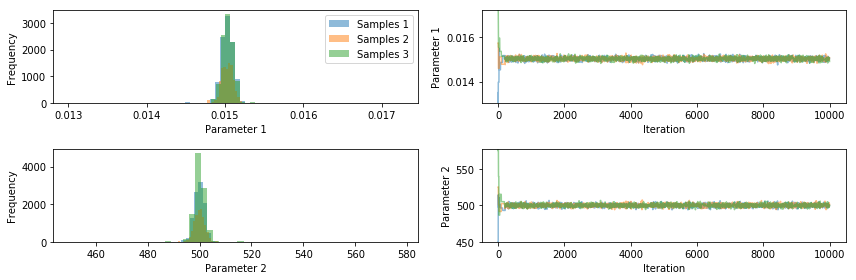

In [15]:
import pints.plot
pints.plot.trace(chains)
plt.show()

Based on this plot, it looks like the three chains become very similar after about 1000 iterations.
To be safe, we throw away the first 2000 samples and continue our analysis with the first chain.

In [16]:
chain = chains[0]
chain = chain[2000:]

We can also look for autocorrelation in the chains, using the [autocorrelation()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.autocorrelation) method. If everything went well, the samples in the chain should be relatively independent, so the autocorrelation should get quite low when the `lag` on the x-axis increases.

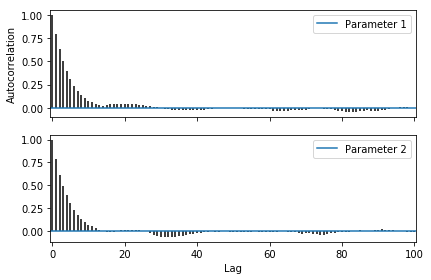

In [17]:
pints.plot.autocorrelation(chain)
plt.show()

Now we can inspect the inferred distribution by plotting histograms:

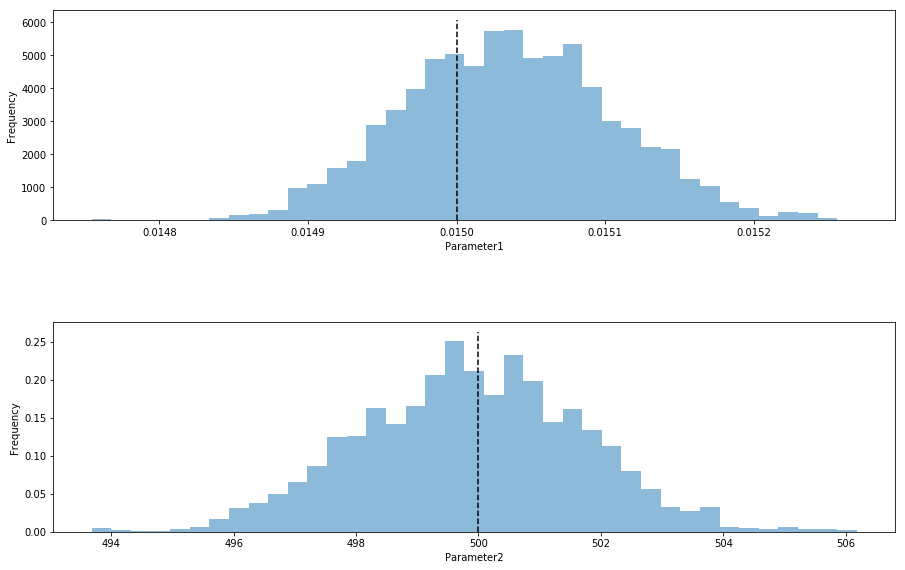

In [18]:
fig, axes = pints.plot.histogram([chain], ref_parameters=true_parameters)

# Show where the sample standard deviation of the generated noise is:
noise_sample_std = np.std(values - org_values)
#axes[-1].axvline(noise_sample_std, color='orange', label='Sample standard deviation of noise')
#axes[-1].legend()

fig.set_size_inches(14, 9)
plt.show()

Here we've analysed each parameter in isolation, but we can also look at correlations between parameters we found using the [pairwise()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.pairwise) plot.

To speed things up, we'll first apply some _thinning_ to the chain:

In [19]:
thinned_chain = chain[::10]

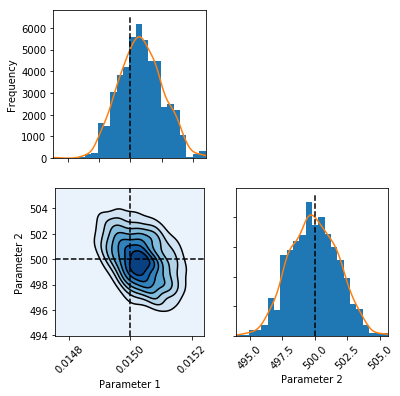

In [20]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

Finally, we can look at the bit that really matters: The model predictions made from models with the parameters we found (a _posterior predictive check_). Thes can be plotted using the [series()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.series) method.

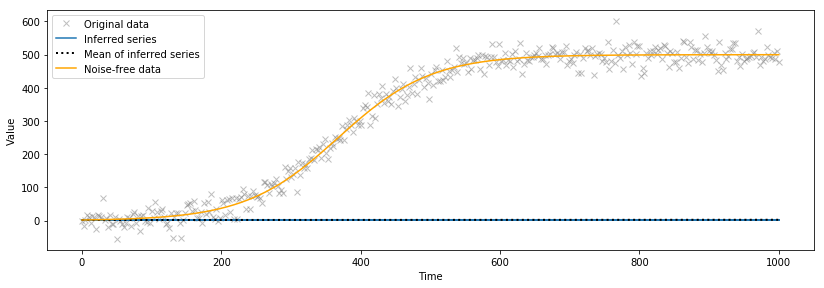

In [21]:
fig, axes = pints.plot.series(chain, problem)

# Customise the plot, and add the original, noise-free data
fig.set_size_inches(12,4.5)
plt.plot(times, org_values, c='orange', label='Noise-free data')
plt.legend()
plt.show()

-1841.2758372669953
[0.75619422 0.99748295]
-47011.929639292415


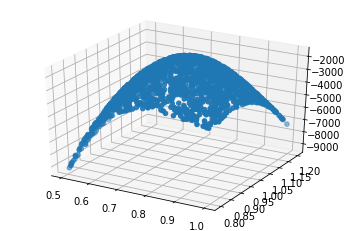

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

input_parameters = log_prior.sample(2000)
x = [p[0] for p in input_parameters]
y = [p[1] for p in input_parameters]
input_parameters[:5]

likelihoods = np.apply_along_axis(log_likelihood, 1, input_parameters)
likelihoods[:5]

print(max(likelihoods))
idx = list(likelihoods).index(max(likelihoods))
print(input_parameters[idx])
print(log_likelihood([0.015, 500]))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, list(likelihoods))
plt.show()

In [23]:
print(input_parameters[:5])

[[0.85222423 1.1732448 ]
 [0.72733117 1.02018664]
 [0.92166643 1.06992997]
 [0.7521969  0.84740462]
 [0.96210135 0.98764401]]


In [24]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(input_parameters, likelihoods, test_size=0.3, random_state=0)
emu = pints.MultiLayerNN(problem, X_train, y_train, input_scaler=MinMaxScaler(), output_scaler=StandardScaler())
emu.set_parameters(layers=6, neurons=64, hidden_activation='relu', activation='linear', learning_rate=0.0001)
hist = emu.fit(epochs=500, batch_size=32, X_val=X_valid, y_val=y_valid, verbose=0)
emu.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                192       
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 65        
Total params: 82,753
Trainable params: 82,753
Non-trainable params: 0
_________________________________________________________________


In [25]:
emu([0.015, 500])

array([[-4410654.]], dtype=float32)

In [26]:
log_likelihood([0.015, 500])

-47011.929639292415

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error', 'rescaled_mae', 'rescaled_mse', 'val_rescaled_mae', 'val_rescaled_mse'])


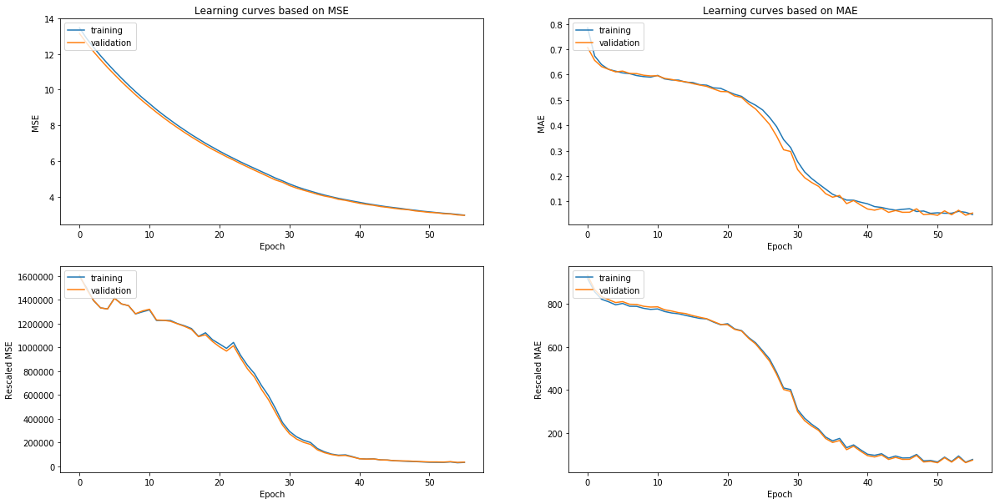

In [27]:
# summarize history for loss
print(hist.history.keys())
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))                 
ax1.title.set_text('Learning curves based on MSE')
ax2.title.set_text('Learning curves based on MAE')

ax1.plot(hist.history['loss'])
ax1.plot(hist.history['val_loss'])
ax1.set_ylabel('MSE')
ax1.set_xlabel('Epoch')
ax1.legend(['training', 'validation'], loc='upper left')

ax2.plot(hist.history['mean_absolute_error'])
ax2.plot(hist.history['val_mean_absolute_error'])
ax2.set_ylabel('MAE')
ax2.set_xlabel('Epoch')
ax2.legend(['training', 'validation'], loc='upper left')

ax3.plot(hist.history['rescaled_mse'])
ax3.plot(hist.history['val_rescaled_mse'])
ax3.set_ylabel('Rescaled MSE')
ax3.set_xlabel('Epoch')
ax3.legend(['training', 'validation'], loc='upper left')

ax4.plot(hist.history['rescaled_mae'])
ax4.plot(hist.history['val_rescaled_mae'])
ax4.set_ylabel('Rescaled MAE')
ax4.set_xlabel('Epoch')
ax4.legend(['training', 'validation'], loc='upper left')

plt.show()

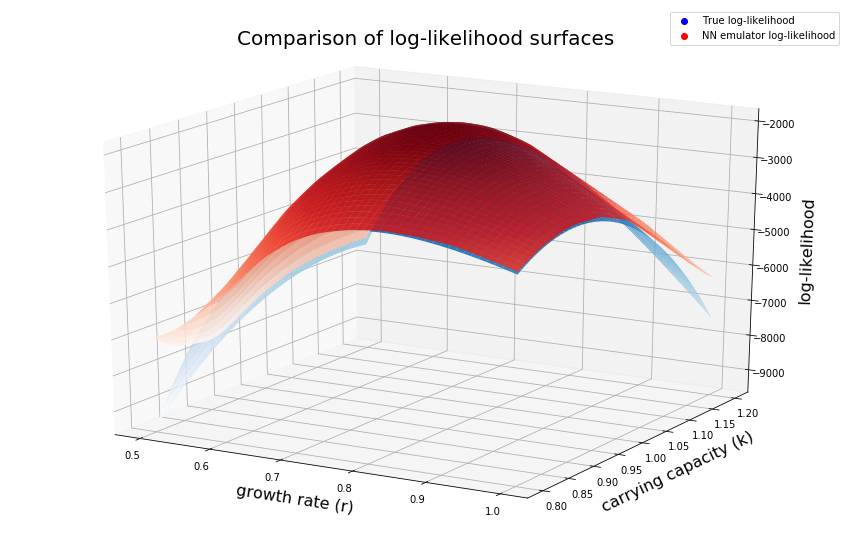

0.019538502287525513

In [28]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D 

test_splits = 50 # number of splits along each axis
r_grid, k_grid, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
model_prediction = pints.predict_grid(log_likelihood, test_data)
emu_prediction = pints.predict_grid(emu, test_data)

figsize=(20,10)
angle=(20, 300)
alpha=0.9
fontsize=16
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(r_grid, k_grid, model_prediction, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(r_grid, k_grid, emu_prediction, cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.25)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)

fake2Dline1 = mpl.lines.Line2D([0],[0], linestyle="none", c='blue', marker = 'o')
fake2Dline2 = mpl.lines.Line2D([0],[0], linestyle="none", c='red', marker = 'o')
ax.legend([fake2Dline1, fake2Dline2], ["True log-likelihood", "NN emulator log-likelihood"])

plt.show()
mape = np.mean(np.abs((model_prediction - emu_prediction) / model_prediction))
mape

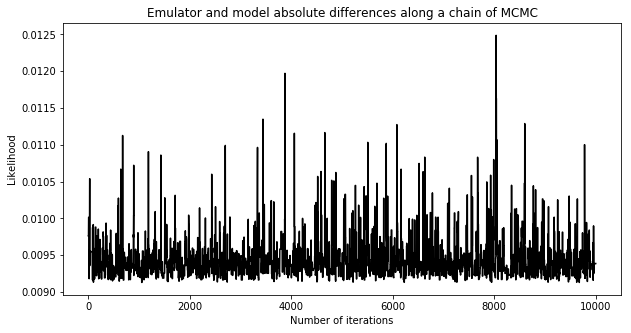

0.00938594368407427

In [29]:
emu_prediction = np.apply_along_axis(emu, 1, chain_rescaled).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain_rescaled).flatten()
diffs = (np.abs((model_prediction - emu_prediction) / model_prediction))

iters = np.linspace(0, 10000, len(chain_rescaled))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [30]:
print(emu_prediction)

[-1823.9963 -1823.9963 -1824.1372 ... -1823.1748 -1823.1748 -1823.1748]


In [31]:
log_posterior_emu = pints.LogPosterior(emu, log_prior)

In [32]:
chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)

Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0         0         0.333      0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0         0.25      0.25       0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]




[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]

[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


180   543    0.0331    0.0221    0.0221     0:00.7
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.0

[[ 1.03026040e-05 -1.09776858e-05]
 [-1.09776858e-05  1.95338451e-05]]


[[ 1.81050566e-05 -2.97117582e-05]
 [-2.97117582e-05  5.90327605e-05]]


[[ 6.52726612e-06 -2.47918796e-06]
 [-2.47918796e-06  2.24434251e-05]]


[[ 1.16472596e-05 -1.00289052e-05]
 [-1.00289052e-05  1.72681270e-05]]


[[ 1.64175382e-05 -2.75146360e-05]
 [-2.75146360e-05  5.58654787e-05]]


[[ 5.85298126e-06 -3.10933539e-06]
 [-3.10933539e-06  2.84131655e-05]]


[[ 1.22594797e-05 -9.13069248e-06]
 [-9.13069248e-06  1.52938788e-05]]


[[ 1.48562446e-05 -2.53249917e-05]
 [-2.53249917e-05  5.22950110e-05]]


[[ 5.37961763e-06 -4.03459679e-06]
 [-4.03459679e-06  3.30592243e-05]]


[[ 1.10782272e-05 -7.54535979e-06]
 [-7.54535979e-06  1.48434286e-05]]


[[ 1.58846377e-05 -2.84468234e-05]
 [-2.84468234e-05  5.95907420e-05]]


[[ 4.92393518e-06 -4.56519418e-06]
 [-4.56519418e-06  3.54067407e-05]]


[[ 1.00021444e-05 -6.27686283e-06]
 [-6.27686283e-06  1.41783007e-05]]


[[ 1.42697820e-05 -2.49360569e-05]
 [-2.49360569e-0

[[ 3.82653751e-06 -6.33350753e-07]
 [-6.33350753e-07  4.72097765e-06]]


[[ 4.30904972e-05 -4.26434575e-05]
 [-4.26434575e-05  5.98821363e-05]]


[[ 6.81828625e-06 -1.99669751e-06]
 [-1.99669751e-06  1.21224170e-05]]


[[ 4.02771313e-06 -2.59057431e-07]
 [-2.59057431e-07  4.57689230e-06]]


[[ 4.68505470e-05 -4.18520810e-05]
 [-4.18520810e-05  5.61766105e-05]]


[[ 6.42278179e-06 -2.30615456e-06]
 [-2.30615456e-06  1.29155691e-05]]


[[4.14094517e-06 3.68603540e-08]
 [3.68603540e-08 4.41374863e-06]]


[[ 4.92794914e-05 -4.07722487e-05]
 [-4.07722487e-05  5.26575109e-05]]


[[ 5.95604992e-06 -1.98557667e-06]
 [-1.98557667e-06  1.30793923e-05]]


[[4.18497192e-06 2.68648248e-07]
 [2.68648248e-07 4.23796925e-06]]


[[ 5.06519528e-05 -3.94836850e-05]
 [-3.94836850e-05  4.93263795e-05]]


[[ 5.52537241e-06 -1.71255013e-06]
 [-1.71255013e-06  1.30663707e-05]]


[[4.17499265e-06 4.48026317e-07]
 [4.48026317e-07 4.05460500e-06]]


[[ 5.11912914e-05 -3.80498294e-05]
 [-3.80498294e-05  4.6181693

[[ 4.47791495e-05 -5.31088981e-05]
 [-5.31088981e-05  7.52577101e-05]]


[[ 4.23699230e-06 -1.09755410e-06]
 [-1.09755410e-06  1.29799538e-05]]


[[4.32319775e-06 2.10262563e-06]
 [2.10262563e-06 9.15913497e-06]]


[[ 4.28557420e-05 -5.08092522e-05]
 [-5.08092522e-05  7.17856147e-05]]


[[ 3.98795761e-06 -1.04653304e-06]
 [-1.04653304e-06  1.24719236e-05]]


[[5.02114878e-06 2.36090989e-06]
 [2.36090989e-06 8.77512123e-06]]


[[ 4.09742473e-05 -4.85625846e-05]
 [-4.85625846e-05  6.84264008e-05]]


[[ 3.75476722e-06 -9.97226308e-07]
 [-9.97226308e-07  1.19672722e-05]]


[[4.82347300e-06 1.91040257e-06]
 [1.91040257e-06 9.29129327e-06]]


[[ 3.91412913e-05 -4.63762820e-05]
 [-4.63762820e-05  6.51850831e-05]]


[[ 3.54012085e-06 -9.73144144e-07]
 [-9.73144144e-07  1.15361995e-05]]


[[5.05232516e-06 2.06372029e-06]
 [2.06372029e-06 8.88937905e-06]]


[[ 3.73618459e-05 -4.42558351e-05]
 [-4.42558351e-05  6.20647411e-05]]


[[ 3.58243059e-06 -5.55853658e-07]
 [-5.55853658e-07  1.13924678e-0

[[ 3.41206239e-05 -1.96570170e-05]
 [-1.96570170e-05  3.15593340e-05]]


[[3.44796001e-06 2.95222640e-06]
 [2.95222640e-06 2.80658951e-05]]


[[ 4.00172882e-05 -5.92857529e-05]
 [-5.92857529e-05  1.44609498e-04]]


[[ 3.50531116e-05 -2.30324599e-05]
 [-2.30324599e-05  3.72121487e-05]]


[[3.46439457e-06 2.33514551e-06]
 [2.33514551e-06 2.78766916e-05]]


[[ 3.98946207e-05 -6.03074564e-05]
 [-6.03074564e-05  1.45891636e-04]]


[[ 3.35564416e-05 -2.28358442e-05]
 [-2.28358442e-05  3.91975741e-05]]


[[3.46218743e-06 1.79576729e-06]
 [1.79576729e-06 2.75836779e-05]]


[[ 3.96021066e-05 -6.08989395e-05]
 [-6.08989395e-05  1.46303947e-04]]


[[ 3.21798316e-05 -2.16825518e-05]
 [-2.16825518e-05  3.72777212e-05]]


[[4.74221828e-06 7.05945341e-07]
 [7.05945341e-07 2.69280260e-05]]


[[ 3.91668087e-05 -6.11217837e-05]
 [-6.11217837e-05  1.45975038e-04]]


[[ 3.08502435e-05 -2.05932592e-05]
 [-2.05932592e-05  3.54588889e-05]]


[[ 5.81775100e-06 -2.31714448e-07]
 [-2.31714448e-07  2.62412859e-0

[[ 4.74618765e-05 -3.96087681e-05]
 [-3.96087681e-05  6.71263171e-05]]


[[ 1.99562591e-05 -3.04764481e-05]
 [-3.04764481e-05  6.53926332e-05]]


[[ 2.63186275e-05 -3.75705663e-05]
 [-3.75705663e-05  8.52912401e-05]]


[[ 5.23688782e-05 -4.56538311e-05]
 [-4.56538311e-05  7.28985912e-05]]


[[ 1.91229841e-05 -2.91784265e-05]
 [-2.91784265e-05  6.26119213e-05]]


[[ 2.58155632e-05 -3.71619916e-05]
 [-3.71619916e-05  8.39590862e-05]]


[[ 5.09851151e-05 -4.88975899e-05]
 [-4.88975899e-05  1.01878392e-04]]


[[ 1.83263412e-05 -2.79396148e-05]
 [-2.79396148e-05  5.99576874e-05]]


[[ 2.52844026e-05 -3.66736140e-05]
 [-3.66736140e-05  8.24976508e-05]]


[[ 4.95951022e-05 -5.15670302e-05]
 [-5.15670302e-05  1.26898670e-04]]


[[ 1.75646602e-05 -2.67571237e-05]
 [-2.67571237e-05  5.74237910e-05]]


[[ 2.47308616e-05 -3.61177068e-05]
 [-3.61177068e-05  8.09294194e-05]]


[[ 4.82050130e-05 -5.37263050e-05]
 [-5.37263050e-05  1.48376183e-04]]


[[ 2.11985678e-05 -3.06505451e-05]
 [-3.06505451e-0

 [-2.52774068e-05  7.60961374e-05]]


[[ 1.44210933e-05 -1.98628403e-05]
 [-1.98628403e-05  7.51769916e-05]]


[[ 3.40338828e-05 -4.74578322e-05]
 [-4.74578322e-05  8.71101239e-05]]


[[ 1.23067664e-05 -2.45722007e-05]
 [-2.45722007e-05  7.37603635e-05]]


[[ 1.39229257e-05 -1.92742454e-05]
 [-1.92742454e-05  7.28564738e-05]]


[[ 3.40001066e-05 -4.79074385e-05]
 [-4.79074385e-05  8.78253862e-05]]


[[ 1.21969249e-05 -2.46463303e-05]
 [-2.46463303e-05  7.37904683e-05]]


[[ 1.34411115e-05 -1.86969377e-05]
 [-1.86969377e-05  7.05893658e-05]]


[[ 3.96203010e-05 -5.81114061e-05]
 [-5.81114061e-05  1.05403793e-04]]


[[ 1.20647219e-05 -2.46420110e-05]
 [-2.46420110e-05  7.36072507e-05]]


[[ 1.29752433e-05 -1.81314001e-05]
 [-1.81314001e-05  6.83765014e-05]]


[[ 4.44985466e-05 -6.70074255e-05]
 [-6.70074255e-05  1.20714005e-04]]


[[ 1.19131835e-05 -2.45684246e-05]
 [-2.45684246e-05  7.32362132e-05]]


[[ 1.25249088e-05 -1.75780164e-05]
 [-1.75780164e-05  6.62184281e-05]]


[[ 4.87061852

[[ 1.54899825e-05 -8.77206645e-06]
 [-8.77206645e-06  3.46781918e-05]]


[[ 6.67809490e-05 -9.41175969e-05]
 [-9.41175969e-05  2.10335487e-04]]


[[ 4.24430700e-05 -4.73251418e-05]
 [-4.73251418e-05  1.09365175e-04]]


[[ 1.52581602e-05 -8.33708397e-06]
 [-8.33708397e-06  3.35379414e-05]]


[[ 6.96302698e-05 -1.00543812e-04]
 [-1.00543812e-04  2.21233219e-04]]


[[ 4.58217164e-05 -4.99163672e-05]
 [-4.99163672e-05  1.09273874e-04]]


[[ 1.50143437e-05 -7.92696780e-06]
 [-7.92696780e-06  3.24356008e-05]]


[[ 6.80737876e-05 -9.82024203e-05]
 [-9.82024203e-05  2.15106282e-04]]


[[ 4.87490807e-05 -5.21269972e-05]
 [-5.21269972e-05  1.08936786e-04]]


[[ 1.47604228e-05 -7.54013201e-06]
 [-7.54013201e-06  3.13699677e-05]]


[[ 6.65173602e-05 -9.58708728e-05]
 [-9.58708728e-05  2.09102423e-04]]


[[ 5.12654479e-05 -5.39916644e-05]
 [-5.39916644e-05  1.08380771e-04]]


[[ 1.44981082e-05 -7.17510013e-06]
 [-7.17510013e-06  3.03398696e-05]]


[[ 6.49649288e-05 -9.35540433e-05]
 [-9.35540433e-0

[[ 4.01805203e-05 -3.69610315e-05]
 [-3.69610315e-05  5.28470348e-05]]


[[ 3.81025933e-05 -6.23399313e-05]
 [-6.23399313e-05  1.28930794e-04]]


[[ 3.63215152e-05 -5.00974185e-05]
 [-5.00974185e-05  1.24689814e-04]]


[[ 3.89520857e-05 -3.61474142e-05]
 [-3.61474142e-05  5.41357850e-05]]


[[ 3.72733844e-05 -6.10285093e-05]
 [-6.10285093e-05  1.26012489e-04]]


[[ 3.62103773e-05 -4.92056739e-05]
 [-4.92056739e-05  1.21207976e-04]]


[[ 3.77621162e-05 -3.53389621e-05]
 [-3.53389621e-05  5.51977271e-05]]


[[ 3.64485893e-05 -5.97199868e-05]
 [-5.97199868e-05  1.23119860e-04]]


[[ 3.60385668e-05 -4.83007739e-05]
 [-4.83007739e-05  1.17813959e-04]]


[[ 3.66094205e-05 -3.45368983e-05]
 [-3.45368983e-05  5.60525829e-05]]


[[ 3.56295389e-05 -5.84168728e-05]
 [-5.84168728e-05  1.20256584e-04]]


[[ 3.58123317e-05 -4.73859234e-05]
 [-4.73859234e-05  1.14506487e-04]]


[[ 3.54928405e-05 -3.37423085e-05]
 [-3.37423085e-05  5.67185734e-05]]


[[ 3.45409038e-05 -5.68211886e-05]
 [-5.68211886e-0

[[ 2.59038270e-05 -5.24518647e-05]
 [-5.24518647e-05  1.25251236e-04]]


[[ 5.53627437e-05 -5.80777101e-05]
 [-5.80777101e-05  9.06574383e-05]]


[[ 2.85157683e-05 -4.26154354e-05]
 [-4.26154354e-05  1.00487951e-04]]


[[ 2.57944360e-05 -5.22210733e-05]
 [-5.22210733e-05  1.24201504e-04]]


[[ 5.50737325e-05 -5.76425904e-05]
 [-5.76425904e-05  8.91953259e-05]]


[[ 2.80668963e-05 -4.23466228e-05]
 [-4.23466228e-05  1.00009753e-04]]


[[ 2.56502442e-05 -5.19206449e-05]
 [-5.19206449e-05  1.23030052e-04]]


[[ 5.47152788e-05 -5.71464154e-05]
 [-5.71464154e-05  8.77078859e-05]]


[[ 2.76091687e-05 -4.20287046e-05]
 [-4.20287046e-05  9.94018734e-05]]


[[ 2.79127650e-05 -5.51866350e-05]
 [-5.51866350e-05  1.27024282e-04]]


[[ 5.42943506e-05 -5.65956489e-05]
 [-5.65956489e-05  8.62001879e-05]]


[[ 2.71442375e-05 -4.16667189e-05]
 [-4.16667189e-05  9.86771857e-05]]


[[ 2.99298933e-05 -5.80729367e-05]
 [-5.80729367e-05  1.30452397e-04]]


[[ 5.38173877e-05 -5.59962579e-05]
 [-5.59962579e-0

[[ 1.69800958e-05 -1.80184945e-05]
 [-1.80184945e-05  4.32944776e-05]]


[[ 1.74162659e-05 -3.16893487e-05]
 [-3.16893487e-05  6.63428165e-05]]


[[ 4.18531552e-05 -3.81880815e-05]
 [-3.81880815e-05  6.50100071e-05]]


[[ 1.67726444e-05 -1.74484566e-05]
 [-1.74484566e-05  4.21181555e-05]]


[[ 1.70159981e-05 -3.06790089e-05]
 [-3.06790089e-05  6.47341037e-05]]


[[ 4.06995394e-05 -3.71951704e-05]
 [-3.71951704e-05  6.46006714e-05]]


[[ 1.65570103e-05 -1.68989290e-05]
 [-1.68989290e-05  4.09749831e-05]]


[[ 1.74507508e-05 -3.14728831e-05]
 [-3.14728831e-05  6.59237066e-05]]


[[ 3.95793427e-05 -3.62277722e-05]
 [-3.62277722e-05  6.41278927e-05]]


[[ 1.63342358e-05 -1.63690656e-05]
 [-1.63690656e-05  3.98640058e-05]]


[[ 1.78238167e-05 -3.21547029e-05]
 [-3.21547029e-05  6.69173162e-05]]


[[ 3.84915503e-05 -3.52852942e-05]
 [-3.52852942e-05  6.35978096e-05]]


[[ 1.61052847e-05 -1.58580595e-05]
 [-1.58580595e-05  3.87842962e-05]]


[[ 1.74498051e-05 -3.11055283e-05]
 [-3.11055283e-0

 [-5.02721501e-06  1.36223957e-05]]


[[ 2.81611199e-05 -4.05266913e-05]
 [-4.05266913e-05  8.01113629e-05]]


[[ 2.97847873e-05 -3.31523706e-05]
 [-3.31523706e-05  5.39235007e-05]]


[[ 7.20150730e-06 -4.89005906e-06]
 [-4.89005906e-06  1.32703980e-05]]


[[ 2.81155949e-05 -4.06113555e-05]
 [-4.06113555e-05  7.99162742e-05]]


[[ 2.94053787e-05 -3.26775048e-05]
 [-3.26775048e-05  5.29013184e-05]]


[[ 7.03733695e-06 -4.75698437e-06]
 [-4.75698437e-06  1.29279176e-05]]


[[ 2.80362410e-05 -4.06355573e-05]
 [-4.06355573e-05  7.96300944e-05]]


[[ 2.90161727e-05 -3.21958565e-05]
 [-3.21958565e-05  5.18876965e-05]]


[[ 6.87648743e-06 -4.62785632e-06]
 [-4.62785632e-06  1.25946864e-05]]


[[ 2.79258644e-05 -4.06040749e-05]
 [-4.06040749e-05  7.92604836e-05]]


[[ 2.86185055e-05 -3.17086539e-05]
 [-3.17086539e-05  5.08834027e-05]]


640   1923   0.192     0.222     0.199688   0:02.8
[[ 6.71892406e-06 -4.50254527e-06]
 [-4.50254527e-06  1.22704444e-05]]


[[ 2.77870885e-05 -4.05213796e-05]


[[ 3.97772086e-06 -2.21262279e-06]
 [-2.21262279e-06  8.84009757e-06]]


[[ 2.15956709e-05 -3.84576354e-05]
 [-3.84576354e-05  8.47638064e-05]]


[[ 2.50246332e-05 -2.84030772e-05]
 [-2.84030772e-05  4.52867368e-05]]


[[ 3.91934544e-06 -2.20123132e-06]
 [-2.20123132e-06  8.67046603e-06]]


[[ 2.21078460e-05 -3.86367105e-05]
 [-3.86367105e-05  8.38946591e-05]]


[[ 2.50093102e-05 -2.81231359e-05]
 [-2.81231359e-05  4.44666916e-05]]


[[ 3.86058480e-06 -2.18806617e-06]
 [-2.18806617e-06  8.50292988e-06]]


[[ 2.25565960e-05 -3.87570629e-05]
 [-3.87570629e-05  8.29895761e-05]]


[[ 2.49655295e-05 -2.78303175e-05]
 [-2.78303175e-05  4.36537592e-05]]


[[ 3.83271708e-06 -2.01909343e-06]
 [-2.01909343e-06  8.49588595e-06]]


[[ 2.29461124e-05 -3.88229480e-05]
 [-3.88229480e-05  8.20524041e-05]]


[[ 2.44530826e-05 -2.66750454e-05]
 [-2.66750454e-05  4.49011661e-05]]


[[ 3.80236309e-06 -1.86001505e-06]
 [-1.86001505e-06  8.47935648e-06]]


[[ 2.42938335e-05 -4.15994351e-05]
 [-4.15994351e-0

[[ 4.03232918e-05 -4.93944571e-05]
 [-4.93944571e-05  8.18489352e-05]]


[[ 5.73114339e-05 -8.05612388e-05]
 [-8.05612388e-05  1.41371460e-04]]


[[ 3.09371782e-05 -3.14240779e-05]
 [-3.14240779e-05  6.73324793e-05]]


[[ 4.02632823e-05 -4.82974966e-05]
 [-4.82974966e-05  7.99489788e-05]]


[[ 5.88326423e-05 -8.14286944e-05]
 [-8.14286944e-05  1.40716380e-04]]


[[ 3.05426536e-05 -3.05898789e-05]
 [-3.05898789e-05  6.58000567e-05]]


[[ 4.01644963e-05 -4.72248966e-05]
 [-4.72248966e-05  7.80951634e-05]]


[[ 6.01859396e-05 -8.21493539e-05]
 [-8.21493539e-05  1.39956575e-04]]


[[ 3.01428469e-05 -2.97807498e-05]
 [-2.97807498e-05  6.43034457e-05]]


[[ 4.00298092e-05 -4.61761466e-05]
 [-4.61761466e-05  7.62863189e-05]]


[[ 6.13817428e-05 -8.27328524e-05]
 [-8.27328524e-05  1.39100374e-04]]


[[ 2.97385910e-05 -2.89958286e-05]
 [-2.89958286e-05  6.28418042e-05]]


[[ 3.98619292e-05 -4.51507444e-05]
 [-4.51507444e-05  7.45213064e-05]]


[[ 6.24298967e-05 -8.31882857e-05]
 [-8.31882857e-0

[[ 2.31916184e-05 -1.49791844e-05]
 [-1.49791844e-05  4.65872403e-05]]


[[ 3.79545351e-05 -5.14555843e-05]
 [-5.14555843e-05  1.02214207e-04]]


[[ 3.12256053e-05 -4.35993161e-05]
 [-4.35993161e-05  8.10072612e-05]]


[[ 2.29709983e-05 -1.49054249e-05]
 [-1.49054249e-05  4.57821406e-05]]


[[ 3.76192614e-05 -5.06353214e-05]
 [-5.06353214e-05  1.00151603e-04]]


[[ 3.07755051e-05 -4.24769061e-05]
 [-4.24769061e-05  7.93131391e-05]]


[[ 2.27426651e-05 -1.48220838e-05]
 [-1.48220838e-05  4.49857668e-05]]


[[ 3.72696391e-05 -4.98200807e-05]
 [-4.98200807e-05  9.81279648e-05]]


[[ 3.04031304e-05 -4.13065031e-05]
 [-4.13065031e-05  7.77288660e-05]]


[[ 2.25073791e-05 -1.47298978e-05]
 [-1.47298978e-05  4.41983516e-05]]


[[ 3.69070048e-05 -4.90103660e-05]
 [-4.90103660e-05  9.61427435e-05]]


[[ 3.00258838e-05 -4.01732596e-05]
 [-4.01732596e-05  7.61737927e-05]]


[[ 2.22658550e-05 -1.46295622e-05]
 [-1.46295622e-05  4.34201016e-05]]


[[ 3.65326158e-05 -4.82066397e-05]
 [-4.82066397e-0

[[ 2.34514078e-05 -1.80104552e-05]
 [-1.80104552e-05  3.22069412e-05]]


[[ 3.46718931e-05 -5.03521874e-05]
 [-5.03521874e-05  1.00190827e-04]]


[[ 2.69338974e-05 -3.99726961e-05]
 [-3.99726961e-05  9.78720591e-05]]


[[ 2.34217790e-05 -1.77374818e-05]
 [-1.77374818e-05  3.15490796e-05]]


[[ 3.39741436e-05 -4.95640333e-05]
 [-4.95640333e-05  1.00137591e-04]]


[[ 2.95512120e-05 -4.32020446e-05]
 [-4.32020446e-05  1.01009318e-04]]


[[ 2.33732000e-05 -1.74659868e-05]
 [-1.74659868e-05  3.09047362e-05]]


[[ 3.32902766e-05 -4.87816142e-05]
 [-4.87816142e-05  9.99986944e-05]]


[[ 3.19768858e-05 -4.61889468e-05]
 [-4.61889468e-05  1.03858558e-04]]


[[ 2.33069487e-05 -1.71961317e-05]
 [-1.71961317e-05  3.02736437e-05]]


[[ 3.26200387e-05 -4.80052996e-05]
 [-4.80052996e-05  9.97798379e-05]]


[[ 3.42210732e-05 -4.89463263e-05]
 [-4.89463263e-05  1.06435796e-04]]


[[ 2.32242353e-05 -1.69280657e-05]
 [-1.69280657e-05  2.96555392e-05]]


[[ 3.19631795e-05 -4.72354283e-05]
 [-4.72354283e-0

[[ 2.53447570e-05 -2.49093822e-05]
 [-2.49093822e-05  4.16185658e-05]]


[[ 2.75009422e-05 -3.07951539e-05]
 [-3.07951539e-05  7.11812004e-05]]


[[ 4.57069080e-05 -5.06886613e-05]
 [-5.06886613e-05  9.61635368e-05]]


[[ 2.73994428e-05 -2.90879333e-05]
 [-2.90879333e-05  4.93108759e-05]]


[[ 2.75248100e-05 -3.05210070e-05]
 [-3.05210070e-05  6.99438004e-05]]


[[ 4.52248734e-05 -4.94553794e-05]
 [-4.94553794e-05  9.42911272e-05]]


[[ 2.93067741e-05 -3.29886987e-05]
 [-3.29886987e-05  5.64952911e-05]]


[[ 2.75246106e-05 -3.02384380e-05]
 [-3.02384380e-05  6.87241109e-05]]


[[ 4.47349655e-05 -4.82563930e-05]
 [-4.82563930e-05  9.24550043e-05]]


[[ 2.97833957e-05 -3.33111517e-05]
 [-3.33111517e-05  5.62658950e-05]]


[[ 2.75018473e-05 -2.99482202e-05]
 [-2.99482202e-05  6.75220934e-05]]


[[ 4.39011369e-05 -4.71299959e-05]
 [-4.71299959e-05  9.08438190e-05]]


[[ 2.96333830e-05 -3.28947566e-05]
 [-3.28947566e-05  5.52711835e-05]]


[[ 2.74579481e-05 -2.96510846e-05]
 [-2.96510846e-0

[[ 2.44592918e-05 -3.22792796e-05]
 [-3.22792796e-05  6.69459500e-05]]


[[ 2.01166000e-05 -2.40331526e-05]
 [-2.40331526e-05  7.65311161e-05]]


[[ 4.23470896e-05 -4.74511650e-05]
 [-4.74511650e-05  8.59819677e-05]]


[[ 2.42509922e-05 -3.17413688e-05]
 [-3.17413688e-05  6.56630822e-05]]


[[ 2.25528850e-05 -2.63820752e-05]
 [-2.63820752e-05  7.78365539e-05]]


[[ 4.25108015e-05 -4.61674942e-05]
 [-4.61674942e-05  8.44123817e-05]]


[[ 2.40363418e-05 -3.12107088e-05]
 [-3.12107088e-05  6.44051932e-05]]


[[ 2.48289673e-05 -2.85729882e-05]
 [-2.85729882e-05  7.90057976e-05]]


[[ 4.26323543e-05 -4.49237789e-05]
 [-4.49237789e-05  8.28702375e-05]]


[[ 2.38158983e-05 -3.06872949e-05]
 [-3.06872949e-05  6.31718022e-05]]


[[ 2.50423606e-05 -2.90166755e-05]
 [-2.90166755e-05  7.88941143e-05]]


[[ 4.27141900e-05 -4.37186242e-05]
 [-4.37186242e-05  8.13551376e-05]]


[[ 2.35901900e-05 -3.01711164e-05]
 [-3.01711164e-05  6.19624372e-05]]


[[ 2.71305694e-05 -3.03453397e-05]
 [-3.03453397e-0

[[ 1.86642150e-05 -2.16687988e-05]
 [-2.16687988e-05  4.83753185e-05]]


[[ 2.64499343e-05 -1.70949268e-05]
 [-1.70949268e-05  5.18352363e-05]]


[[ 2.50921215e-05 -2.64190273e-05]
 [-2.64190273e-05  4.84150335e-05]]


[[ 1.83819208e-05 -2.13633802e-05]
 [-2.13633802e-05  4.76111617e-05]]


[[ 2.66894940e-05 -1.73164954e-05]
 [-1.73164954e-05  5.12506184e-05]]


[[ 2.50022579e-05 -2.68633829e-05]
 [-2.68633829e-05  4.98075001e-05]]


[[ 1.81024703e-05 -2.10599791e-05]
 [-2.10599791e-05  4.68562439e-05]]


[[ 2.61867738e-05 -1.70826807e-05]
 [-1.70826807e-05  5.20141552e-05]]


[[ 2.47123261e-05 -2.67981885e-05]
 [-2.67981885e-05  4.99307541e-05]]


[[ 1.78259107e-05 -2.07587093e-05]
 [-2.07587093e-05  4.61106019e-05]]


[[ 2.56938245e-05 -1.68498974e-05]
 [-1.68498974e-05  5.26970868e-05]]


[[ 2.44211595e-05 -2.67175217e-05]
 [-2.67175217e-05  5.00113007e-05]]


[[ 1.75522841e-05 -2.04596759e-05]
 [-2.04596759e-05  4.53742628e-05]]


[[ 2.52104522e-05 -1.66182625e-05]
 [-1.66182625e-0

[[ 2.86191290e-05 -3.77965109e-05]
 [-3.77965109e-05  6.47059225e-05]]


[[ 2.07646669e-05 -2.12737730e-05]
 [-2.12737730e-05  4.24508150e-05]]


[[ 1.67067556e-05 -1.94007242e-05]
 [-1.94007242e-05  8.62592191e-05]]


[[ 2.89235951e-05 -3.90545113e-05]
 [-3.90545113e-05  6.81046395e-05]]


[[ 2.05877760e-05 -2.18530154e-05]
 [-2.18530154e-05  4.62455643e-05]]


[[ 1.66992869e-05 -1.99707573e-05]
 [-1.99707573e-05  8.75303843e-05]]


[[ 2.91918133e-05 -4.02169473e-05]
 [-4.02169473e-05  7.12703757e-05]]


[[ 2.04067516e-05 -2.23856476e-05]
 [-2.23856476e-05  4.98002593e-05]]


[[ 1.66809782e-05 -2.04959554e-05]
 [-2.04959554e-05  8.86725995e-05]]


[[ 2.94256398e-05 -4.12883868e-05]
 [-4.12883868e-05  7.42140303e-05]]


[[ 2.02219567e-05 -2.28739222e-05]
 [-2.28739222e-05  5.31259209e-05]]


[[ 1.66524548e-05 -2.09784760e-05]
 [-2.09784760e-05  8.96923334e-05]]


[[ 2.96268492e-05 -4.22732020e-05]
 [-4.22732020e-05  7.69460391e-05]]


[[ 2.46137716e-05 -2.76080906e-05]
 [-2.76080906e-0

[[ 3.18416719e-05 -5.58473618e-05]
 [-5.58473618e-05  1.21287787e-04]]


[[ 2.21302277e-05 -2.71145055e-05]
 [-2.71145055e-05  5.63308245e-05]]


[[ 2.89702331e-05 -4.00886709e-05]
 [-4.00886709e-05  9.87057280e-05]]


[[ 3.17020682e-05 -5.55461570e-05]
 [-5.55461570e-05  1.20249240e-04]]


[[ 2.22111701e-05 -2.69564984e-05]
 [-2.69564984e-05  5.55457764e-05]]


[[ 2.92349567e-05 -4.03472790e-05]
 [-4.03472790e-05  9.81535286e-05]]


[[ 3.15497351e-05 -5.52256794e-05]
 [-5.52256794e-05  1.19189665e-04]]


[[ 2.22736223e-05 -2.67897718e-05]
 [-2.67897718e-05  5.47673644e-05]]


[[ 2.94668723e-05 -4.05663244e-05]
 [-4.05663244e-05  9.75683415e-05]]


[[ 3.13854748e-05 -5.48872043e-05]
 [-5.48872043e-05  1.18110935e-04]]


[[ 2.20603629e-05 -2.67381823e-05]
 [-2.67381823e-05  5.47737017e-05]]


[[ 2.96676257e-05 -4.07478323e-05]
 [-4.07478323e-05  9.69523741e-05]]


[[ 3.12100529e-05 -5.45319481e-05]
 [-5.45319481e-05  1.17014827e-04]]


[[ 2.18444876e-05 -2.66723599e-05]
 [-2.66723599e-0

[[ 3.41788673e-05 -5.08464721e-05]
 [-5.08464721e-05  9.46070422e-05]]


[[ 3.93775497e-05 -4.65439891e-05]
 [-4.65439891e-05  7.74760510e-05]]


[[ 2.83206376e-05 -4.84574466e-05]
 [-4.84574466e-05  1.18453046e-04]]


[[ 3.36856663e-05 -5.01767774e-05]
 [-5.01767774e-05  9.34144563e-05]]


[[ 3.91132321e-05 -4.57165534e-05]
 [-4.57165534e-05  7.61238416e-05]]


[[ 2.84061526e-05 -4.89154465e-05]
 [-4.89154465e-05  1.19316945e-04]]


[[ 3.31978382e-05 -4.95117007e-05]
 [-4.95117007e-05  9.22276439e-05]]


[[ 3.88390834e-05 -4.49046482e-05]
 [-4.49046482e-05  7.47961596e-05]]


[[ 2.84700672e-05 -4.93200559e-05]
 [-4.93200559e-05  1.20063810e-04]]


[[ 3.27154078e-05 -4.88514205e-05]
 [-4.88514205e-05  9.10470549e-05]]


[[ 3.85558044e-05 -4.41079628e-05]
 [-4.41079628e-05  7.34925431e-05]]


[[ 2.85134948e-05 -4.96738694e-05]
 [-4.96738694e-05  1.20699420e-04]]


[[ 3.22383948e-05 -4.81961021e-05]
 [-4.81961021e-05  8.98731109e-05]]


[[ 3.82640636e-05 -4.33261927e-05]
 [-4.33261927e-0

[[ 2.21224963e-05 -3.46667697e-05]
 [-3.46667697e-05  7.65029310e-05]]


[[ 2.98062935e-05 -3.08090132e-05]
 [-3.08090132e-05  4.66259268e-05]]


[[ 3.19962196e-05 -4.09418918e-05]
 [-4.09418918e-05  8.68226268e-05]]


[[ 2.40681048e-05 -3.71248528e-05]
 [-3.71248528e-05  7.92035334e-05]]


[[ 2.93022711e-05 -3.02986066e-05]
 [-3.02986066e-05  4.59498470e-05]]


[[ 3.29117702e-05 -4.14669170e-05]
 [-4.14669170e-05  8.63701798e-05]]


[[ 2.36681644e-05 -3.65106683e-05]
 [-3.65106683e-05  7.78896717e-05]]


[[ 2.88070835e-05 -2.97967909e-05]
 [-2.97967909e-05  4.52818368e-05]]


[[ 3.37622553e-05 -4.19417734e-05]
 [-4.19417734e-05  8.58914829e-05]]


[[ 2.32750016e-05 -3.59067992e-05]
 [-3.59067992e-05  7.65979981e-05]]


[[ 2.91428689e-05 -3.05396825e-05]
 [-3.05396825e-05  4.64046310e-05]]


[[ 3.45505383e-05 -4.23687777e-05]
 [-4.23687777e-05  8.53881863e-05]]


[[ 2.30527363e-05 -3.52829730e-05]
 [-3.52829730e-05  7.53037526e-05]]


[[ 3.19263381e-05 -3.43535530e-05]
 [-3.43535530e-0

[[ 3.93699065e-05 -4.74947333e-05]
 [-4.74947333e-05  7.54465756e-05]]


[[ 3.77205326e-05 -5.04869189e-05]
 [-5.04869189e-05  1.02393930e-04]]


[[ 1.81614372e-05 -2.66578338e-05]
 [-2.66578338e-05  6.51544970e-05]]


[[ 3.91127551e-05 -4.71280775e-05]
 [-4.71280775e-05  7.46449857e-05]]


[[ 3.74497498e-05 -4.99692615e-05]
 [-4.99692615e-05  1.00987710e-04]]


[[ 1.78790913e-05 -2.62904334e-05]
 [-2.62904334e-05  6.43858421e-05]]


[[ 3.84694881e-05 -4.63569516e-05]
 [-4.63569516e-05  7.34382990e-05]]


[[ 3.71721286e-05 -4.94501798e-05]
 [-4.94501798e-05  9.95963434e-05]]


[[ 1.76010226e-05 -2.59269711e-05]
 [-2.59269711e-05  6.36203783e-05]]


[[ 4.10970900e-05 -4.85586350e-05]
 [-4.85586350e-05  7.49248213e-05]]


[[ 3.68881721e-05 -4.89300411e-05]
 [-4.89300411e-05  9.82198723e-05]]


[[ 1.73271736e-05 -2.55674548e-05]
 [-2.55674548e-05  6.28583798e-05]]


[[ 4.35733660e-05 -5.06259328e-05]
 [-5.06259328e-05  7.62979670e-05]]


[[ 3.65983613e-05 -4.84091947e-05]
 [-4.84091947e-0

[[ 1.21419679e-05 -1.84094118e-05]
 [-1.84094118e-05  4.45984328e-05]]


[[ 4.82748217e-05 -5.06158637e-05]
 [-5.06158637e-05  6.63606010e-05]]


[[ 3.10505403e-05 -3.91360705e-05]
 [-3.91360705e-05  7.05906724e-05]]


[[ 1.20874138e-05 -1.82977091e-05]
 [-1.82977091e-05  4.41225759e-05]]


[[ 4.80267835e-05 -5.03770311e-05]
 [-5.03770311e-05  6.59194437e-05]]


[[ 3.19556540e-05 -4.00705901e-05]
 [-4.00705901e-05  7.11966672e-05]]


[[ 1.20292801e-05 -1.81819876e-05]
 [-1.81819876e-05  4.36469544e-05]]


[[ 4.77660265e-05 -5.01238314e-05]
 [-5.01238314e-05  6.54656703e-05]]


[[ 3.18001759e-05 -3.93898653e-05]
 [-3.93898653e-05  7.00553900e-05]]


[[ 1.20902669e-05 -1.83209073e-05]
 [-1.83209073e-05  4.36763595e-05]]


[[ 4.74933184e-05 -4.98571092e-05]
 [-4.98571092e-05  6.50001479e-05]]


[[ 3.16358709e-05 -3.87216566e-05]
 [-3.87216566e-05  6.89330388e-05]]


[[ 1.21421376e-05 -1.84437803e-05]
 [-1.84437803e-05  4.36819981e-05]]


[[ 4.72093947e-05 -4.95776742e-05]
 [-4.95776742e-0

 [-1.29147091e-05  3.49566695e-05]]


[[ 3.39202552e-05 -3.38301103e-05]
 [-3.38301103e-05  5.48307828e-05]]


[[ 2.60666341e-05 -3.07517219e-05]
 [-3.07517219e-05  5.83731715e-05]]


[[ 9.02702612e-06 -1.27206556e-05]
 [-1.27206556e-05  3.44081608e-05]]


[[ 3.35108679e-05 -3.37317734e-05]
 [-3.37317734e-05  5.54845852e-05]]


[[ 2.57896757e-05 -3.03922462e-05]
 [-3.03922462e-05  5.75710552e-05]]


[[ 9.16825069e-06 -1.33495900e-05]
 [-1.33495900e-05  3.62941024e-05]]


[[ 3.31042905e-05 -3.36215223e-05]
 [-3.36215223e-05  5.60804691e-05]]


[[ 2.55130892e-05 -3.00347637e-05]
 [-3.00347637e-05  5.67784083e-05]]


[[ 9.29835446e-06 -1.39424534e-05]
 [-1.39424534e-05  3.80737096e-05]]


[[ 3.27005981e-05 -3.34999875e-05]
 [-3.34999875e-05  5.66209127e-05]]


[[ 2.52370001e-05 -2.96793636e-05]
 [-2.96793636e-05  5.59951855e-05]]


[[ 9.17224556e-06 -1.40460846e-05]
 [-1.40460846e-05  4.27124396e-05]]


[[ 3.23369484e-05 -3.31501257e-05]
 [-3.31501257e-05  5.59390531e-05]]


[[ 2.49615270

[[ 1.98504498e-05 -3.26735123e-05]
 [-3.26735123e-05  7.94521438e-05]]


[[ 3.97394591e-05 -4.19559286e-05]
 [-4.19559286e-05  7.05357899e-05]]


[[ 2.75847568e-05 -3.77339873e-05]
 [-3.77339873e-05  7.40273191e-05]]


[[ 1.96422488e-05 -3.21117026e-05]
 [-3.21117026e-05  7.82693493e-05]]


[[ 4.12050380e-05 -4.32018747e-05]
 [-4.32018747e-05  7.11738443e-05]]


[[ 2.71783493e-05 -3.72364989e-05]
 [-3.72364989e-05  7.32812041e-05]]


[[ 1.97729337e-05 -3.22424195e-05]
 [-3.22424195e-05  7.79678370e-05]]


[[ 4.25840950e-05 -4.43704449e-05]
 [-4.43704449e-05  7.17493433e-05]]


[[ 2.67778869e-05 -3.67444332e-05]
 [-3.67444332e-05  7.25350709e-05]]


[[ 1.98883911e-05 -3.23520845e-05]
 [-3.23520845e-05  7.76437453e-05]]


[[ 4.38800143e-05 -4.54646975e-05]
 [-4.54646975e-05  7.22649414e-05]]


[[ 2.68650731e-05 -3.67232932e-05]
 [-3.67232932e-05  7.20134710e-05]]


[[ 1.99892792e-05 -3.24416321e-05]
 [-3.24416321e-05  7.72982936e-05]]


[[ 4.42335744e-05 -4.47851370e-05]
 [-4.47851370e-0

[[ 3.62892616e-05 -6.04975013e-05]
 [-6.04975013e-05  1.25704101e-04]]


[[ 3.03358888e-05 -2.87115246e-05]
 [-2.87115246e-05  5.40447208e-05]]


[[ 2.25636685e-05 -2.86937261e-05]
 [-2.86937261e-05  4.89191372e-05]]


[[ 3.61734830e-05 -6.02828336e-05]
 [-6.02828336e-05  1.24938467e-04]]


[[ 2.99364048e-05 -2.83363455e-05]
 [-2.83363455e-05  5.32894624e-05]]


[[ 2.26996622e-05 -2.82031532e-05]
 [-2.82031532e-05  4.81929364e-05]]


[[ 3.56312581e-05 -5.93648222e-05]
 [-5.93648222e-05  1.24927028e-04]]


[[ 2.95414755e-05 -2.79653453e-05]
 [-2.79653453e-05  5.25442910e-05]]


[[ 2.28194301e-05 -2.77219926e-05]
 [-2.77219926e-05  4.74777937e-05]]


[[ 3.50974513e-05 -5.84614910e-05]
 [-5.84614910e-05  1.24860421e-04]]


[[ 2.91510777e-05 -2.75985066e-05]
 [-2.75985066e-05  5.18090942e-05]]


[[ 2.26066216e-05 -2.74740393e-05]
 [-2.74740393e-05  4.69834996e-05]]


[[ 3.45719273e-05 -5.75725912e-05]
 [-5.75725912e-05  1.24741208e-04]]


[[ 2.87651869e-05 -2.72358111e-05]
 [-2.72358111e-0

[[ 2.24312282e-05 -3.88699924e-05]
 [-3.88699924e-05  8.80492395e-05]]


[[ 1.79036057e-05 -1.32831182e-05]
 [-1.32831182e-05  4.75051725e-05]]


[[ 1.39426477e-05 -1.74145758e-05]
 [-1.74145758e-05  3.18188996e-05]]


[[ 2.25394613e-05 -3.93673082e-05]
 [-3.93673082e-05  8.93642593e-05]]


[[ 1.78442443e-05 -1.33477640e-05]
 [-1.33477640e-05  4.71403834e-05]]


[[ 1.54023803e-05 -2.04071653e-05]
 [-2.04071653e-05  3.76914965e-05]]


[[ 2.26333590e-05 -3.98260834e-05]
 [-3.98260834e-05  9.05836403e-05]]


[[ 1.77798867e-05 -1.34038962e-05]
 [-1.34038962e-05  4.67715046e-05]]


[[ 1.51807548e-05 -2.00998482e-05]
 [-2.00998482e-05  3.71580387e-05]]


1340  4023   0.216     0.216     0.199      0:06.0
[[ 2.23470161e-05 -3.95385450e-05]
 [-3.95385450e-05  9.12003256e-05]]


[[ 2.00271448e-05 -1.66651109e-05]
 [-1.66651109e-05  5.08541470e-05]]


[[ 1.49623758e-05 -1.97974371e-05]
 [-1.97974371e-05  3.66321325e-05]]


[[ 2.20637086e-05 -3.92467914e-05]
 [-3.92467914e-05  9.17512866e-05]]




[[ 1.55884071e-05 -2.79411712e-05]
 [-2.79411712e-05  6.85837769e-05]]


[[ 3.83745586e-05 -5.44154394e-05]
 [-5.44154394e-05  1.07822895e-04]]


[[ 1.30890594e-05 -1.73487209e-05]
 [-1.73487209e-05  3.12635446e-05]]


[[ 1.57277181e-05 -2.77738079e-05]
 [-2.77738079e-05  6.77507456e-05]]


[[ 3.81366442e-05 -5.43924185e-05]
 [-5.43924185e-05  1.08113413e-04]]


[[ 1.29239033e-05 -1.70795296e-05]
 [-1.70795296e-05  3.08345356e-05]]


[[ 1.58546548e-05 -2.76023037e-05]
 [-2.76023037e-05  6.69258120e-05]]


[[ 3.78933910e-05 -5.43482313e-05]
 [-5.43482313e-05  1.08347453e-04]]


[[ 1.27605596e-05 -1.68149157e-05]
 [-1.68149157e-05  3.04113492e-05]]


[[ 1.56494646e-05 -2.72935989e-05]
 [-2.72935989e-05  6.63109322e-05]]


[[ 3.76451373e-05 -5.42838240e-05]
 [-5.42838240e-05  1.08527387e-04]]


[[ 1.25990189e-05 -1.65547920e-05]
 [-1.65547920e-05  2.99939117e-05]]


[[ 1.54466960e-05 -2.69870135e-05]
 [-2.69870135e-05  6.56954178e-05]]


[[ 3.73922082e-05 -5.42001096e-05]
 [-5.42001096e-0


[[ 2.76442056e-05 -3.83425409e-05]
 [-3.83425409e-05  6.78369142e-05]]


[[ 1.59610663e-05 -2.37301379e-05]
 [-2.37301379e-05  6.45336195e-05]]


[[ 2.81173702e-05 -3.64581362e-05]
 [-3.64581362e-05  7.19008342e-05]]


[[ 2.74573937e-05 -3.79213518e-05]
 [-3.79213518e-05  6.69531318e-05]]


[[ 1.57419239e-05 -2.34765879e-05]
 [-2.34765879e-05  6.49882732e-05]]


[[ 2.77696767e-05 -3.60725177e-05]
 [-3.60725177e-05  7.12316858e-05]]


[[ 2.72677016e-05 -3.75030294e-05]
 [-3.75030294e-05  6.60802887e-05]]


[[ 1.55258310e-05 -2.32245144e-05]
 [-2.32245144e-05  6.53985284e-05]]


[[ 2.74376669e-05 -3.61213772e-05]
 [-3.61213772e-05  7.56159494e-05]]


[[ 2.70753307e-05 -3.70876223e-05]
 [-3.70876223e-05  6.52182740e-05]]


[[ 1.53127455e-05 -2.29739573e-05]
 [-2.29739573e-05  6.57661195e-05]]


[[ 2.71088821e-05 -3.61541198e-05]
 [-3.61541198e-05  7.97870476e-05]]


[[ 2.67144786e-05 -3.65634890e-05]
 [-3.65634890e-05  6.43061471e-05]]


[[ 1.51026260e-05 -2.27249543e-05]
 [-2.27249543e-

[[ 1.73903280e-05 -1.41980292e-05]
 [-1.41980292e-05  5.08815460e-05]]


[[ 3.62149996e-05 -5.89936658e-05]
 [-5.89936658e-05  1.26677472e-04]]


[[ 2.83378534e-05 -3.98415451e-05]
 [-3.98415451e-05  7.24220889e-05]]


[[ 1.80489681e-05 -1.65145117e-05]
 [-1.65145117e-05  5.72110546e-05]]


[[ 3.58495105e-05 -5.89858495e-05]
 [-5.89858495e-05  1.29821367e-04]]


[[ 2.85244625e-05 -3.99882826e-05]
 [-3.99882826e-05  7.22637604e-05]]


[[ 1.90035111e-05 -1.71482087e-05]
 [-1.71482087e-05  5.70415178e-05]]


[[ 3.54856190e-05 -5.89562837e-05]
 [-5.89562837e-05  1.32787562e-04]]


[[ 2.86927345e-05 -4.01140311e-05]
 [-4.01140311e-05  7.20848961e-05]]


[[ 1.94652852e-05 -1.77214207e-05]
 [-1.77214207e-05  5.71636717e-05]]


[[ 3.51234012e-05 -5.89058929e-05]
 [-5.89058929e-05  1.35582349e-04]]


[[ 2.88433726e-05 -4.02196221e-05]
 [-4.02196221e-05  7.18864282e-05]]


[[ 1.98196301e-05 -1.94174582e-05]
 [-1.94174582e-05  6.24318809e-05]]


[[ 3.47629290e-05 -5.88355706e-05]
 [-5.88355706e-0

[[ 2.79296896e-05 -3.79649180e-05]
 [-3.79649180e-05  1.01278847e-04]]


[[ 3.19543818e-05 -4.26413471e-05]
 [-4.26413471e-05  1.03181346e-04]]


[[ 3.67312425e-05 -4.18179953e-05]
 [-4.18179953e-05  6.29394635e-05]]


[[ 2.75668951e-05 -3.72953706e-05]
 [-3.72953706e-05  1.01926680e-04]]


[[ 3.15601919e-05 -4.20761254e-05]
 [-4.20761254e-05  1.01796222e-04]]


[[ 3.63660343e-05 -4.13428510e-05]
 [-4.13428510e-05  6.21522949e-05]]


[[ 2.72088035e-05 -3.66393721e-05]
 [-3.66393721e-05  1.02511914e-04]]


[[ 3.11705354e-05 -4.15185434e-05]
 [-4.15185434e-05  1.00430292e-04]]


[[ 3.58845598e-05 -4.07073953e-05]
 [-4.07073953e-05  6.22167371e-05]]


[[ 2.68553565e-05 -3.59966130e-05]
 [-3.59966130e-05  1.03036900e-04]]


[[ 3.07853727e-05 -4.09684971e-05]
 [-4.09684971e-05  9.90832814e-05]]


[[ 3.54095805e-05 -4.00828959e-05]
 [-4.00828959e-05  6.22562991e-05]]


[[ 2.94013280e-05 -3.93531711e-05]
 [-3.93531711e-05  1.06726548e-04]]


[[ 3.04046642e-05 -4.04258841e-05]
 [-4.04258841e-0

[[ 7.18963534e-05 -8.68811965e-05]
 [-8.68811965e-05  1.39526514e-04]]


[[ 2.20576532e-05 -2.88956770e-05]
 [-2.88956770e-05  7.34412370e-05]]


[[ 3.42179034e-05 -3.90848352e-05]
 [-3.90848352e-05  6.20049821e-05]]


[[ 7.22948053e-05 -8.71806238e-05]
 [-8.71806238e-05  1.39237589e-04]]


[[ 2.24887008e-05 -2.87142096e-05]
 [-2.87142096e-05  7.25280820e-05]]


[[ 3.37753168e-05 -3.84342071e-05]
 [-3.84342071e-05  6.33252565e-05]]


[[ 7.26525923e-05 -8.74381557e-05]
 [-8.74381557e-05  1.38912015e-04]]


[[ 2.28949844e-05 -2.85299922e-05]
 [-2.85299922e-05  7.16259211e-05]]


[[ 3.33385341e-05 -3.77959820e-05]
 [-3.77959820e-05  6.45715975e-05]]


[[ 7.29712232e-05 -8.76553870e-05]
 [-8.76553870e-05  1.38551385e-04]]


[[ 2.32773547e-05 -2.83432021e-05]
 [-2.83432021e-05  7.07346380e-05]]


[[ 3.29074797e-05 -3.71698913e-05]
 [-3.71698913e-05  6.57465327e-05]]


1560  4683   0.217     0.22      0.21       0:06.9
[[ 7.32521597e-05 -8.78338621e-05]
 [-8.78338621e-05  1.38157243e-04]]




[[ 5.87453975e-05 -7.73925697e-05]
 [-7.73925697e-05  1.33531447e-04]]


[[ 2.25470389e-05 -3.56442013e-05]
 [-3.56442013e-05  1.01239117e-04]]


[[ 2.22137456e-05 -2.52027900e-05]
 [-2.52027900e-05  6.05069474e-05]]


[[ 5.89845309e-05 -7.76229746e-05]
 [-7.76229746e-05  1.33322267e-04]]


[[ 2.36713672e-05 -3.89406249e-05]
 [-3.89406249e-05  1.09900582e-04]]


[[ 2.23551743e-05 -2.56242205e-05]
 [-2.56242205e-05  6.10272229e-05]]


[[ 5.87130744e-05 -7.73977811e-05]
 [-7.73977811e-05  1.32832146e-04]]


[[ 2.47443148e-05 -4.20965237e-05]
 [-4.20965237e-05  1.18190294e-04]]


[[ 2.24837029e-05 -2.60208275e-05]
 [-2.60208275e-05  6.15070890e-05]]


[[ 5.84326337e-05 -7.71556120e-05]
 [-7.71556120e-05  1.32316900e-04]]


[[ 2.57675386e-05 -4.51163524e-05]
 [-4.51163524e-05  1.26120059e-04]]


[[ 2.25997967e-05 -2.63934540e-05]
 [-2.63934540e-05  6.19479756e-05]]


[[ 5.81436612e-05 -7.68972223e-05]
 [-7.68972223e-05  1.31777702e-04]]


[[ 2.55795684e-05 -4.43652170e-05]
 [-4.43652170e-0


[[ 2.35388290e-05 -2.90868966e-05]
 [-2.90868966e-05  7.91598107e-05]]


[[ 4.14404853e-05 -6.01520505e-05]
 [-6.01520505e-05  1.22344627e-04]]


[[ 3.27215827e-05 -4.75297491e-05]
 [-4.75297491e-05  1.21260364e-04]]


[[ 2.33517950e-05 -2.85447632e-05]
 [-2.85447632e-05  7.84192754e-05]]


[[ 4.18461479e-05 -6.05588377e-05]
 [-6.05588377e-05  1.22261397e-04]]


[[ 3.36646677e-05 -4.78764028e-05]
 [-4.78764028e-05  1.20384816e-04]]


[[ 2.31643857e-05 -2.80140940e-05]
 [-2.80140940e-05  7.76817563e-05]]


[[ 4.22229814e-05 -6.09307574e-05]
 [-6.09307574e-05  1.22142158e-04]]


[[ 3.45611149e-05 -4.81945385e-05]
 [-4.81945385e-05  1.19503981e-04]]


[[ 2.29766788e-05 -2.74946225e-05]
 [-2.74946225e-05  7.69473845e-05]]


[[ 4.25719781e-05 -6.12690378e-05]
 [-6.12690378e-05  1.21988347e-04]]


[[ 3.42531321e-05 -4.80110420e-05]
 [-4.80110420e-05  1.19390343e-04]]


[[ 2.27051872e-05 -2.71489858e-05]
 [-2.71489858e-05  7.59712999e-05]]


[[ 4.28941007e-05 -6.15748704e-05]
 [-6.15748704e-

[[ 4.11295824e-05 -5.24042356e-05]
 [-5.24042356e-05  1.06249619e-04]]


[[ 3.17679409e-05 -4.35356311e-05]
 [-4.35356311e-05  9.11619064e-05]]


[[ 2.19268837e-05 -2.67160315e-05]
 [-2.67160315e-05  8.55183019e-05]]


[[ 4.10722255e-05 -5.32237443e-05]
 [-5.32237443e-05  1.09685469e-04]]


[[ 3.17506851e-05 -4.34747719e-05]
 [-4.34747719e-05  9.06380010e-05]]


[[ 2.22688674e-05 -2.60491749e-05]
 [-2.60491749e-05  8.46314639e-05]]


[[ 4.10043045e-05 -5.39961726e-05]
 [-5.39961726e-05  1.12959031e-04]]


[[ 3.17242510e-05 -4.34027361e-05]
 [-4.34027361e-05  9.01056257e-05]]


[[ 2.40085502e-05 -2.78354804e-05]
 [-2.78354804e-05  8.57850222e-05]]


[[ 4.18074792e-05 -5.57545083e-05]
 [-5.57545083e-05  1.16048661e-04]]


[[ 3.16889971e-05 -4.33199732e-05]
 [-4.33199732e-05  8.95652759e-05]]


[[ 2.56758482e-05 -2.95464772e-05]
 [-2.95464772e-05  8.68689859e-05]]


[[ 4.25677602e-05 -5.74299892e-05]
 [-5.74299892e-05  1.18987119e-04]]


[[ 3.16452709e-05 -4.32269189e-05]
 [-4.32269189e-0

[[ 2.60112977e-05 -3.60319980e-05]
 [-3.60319980e-05  7.21921969e-05]]


[[ 4.56311597e-05 -3.59200787e-05]
 [-3.59200787e-05  8.91498525e-05]]


[[ 3.56843612e-05 -5.47363224e-05]
 [-5.47363224e-05  1.16562518e-04]]


[[ 2.59522487e-05 -3.63399571e-05]
 [-3.63399571e-05  7.34681984e-05]]


[[ 4.57079094e-05 -3.57714468e-05]
 [-3.57714468e-05  8.81890593e-05]]


[[ 3.59550371e-05 -5.51508280e-05]
 [-5.51508280e-05  1.16796935e-04]]


[[ 2.61173497e-05 -3.73437834e-05]
 [-3.73437834e-05  7.69123794e-05]]


[[ 4.57681371e-05 -3.56175585e-05]
 [-3.56175585e-05  8.72371629e-05]]


[[ 3.62049956e-05 -5.55335806e-05]
 [-5.55335806e-05  1.16987755e-04]]


[[ 2.62685602e-05 -3.82995281e-05]
 [-3.82995281e-05  8.02069291e-05]]


[[ 4.55311815e-05 -3.56135108e-05]
 [-3.56135108e-05  8.67439200e-05]]


[[ 3.59083490e-05 -5.46662319e-05]
 [-5.46662319e-05  1.15786600e-04]]


[[ 2.64063538e-05 -3.92086951e-05]
 [-3.92086951e-05  8.33564267e-05]]


[[ 4.52893066e-05 -3.55989542e-05]
 [-3.55989542e-0

[[ 2.91053186e-05 -4.16667587e-05]
 [-4.16667587e-05  9.05174564e-05]]


[[ 3.76870644e-05 -5.63502803e-05]
 [-5.63502803e-05  1.23843171e-04]]


[[ 3.76162491e-05 -3.33634040e-05]
 [-3.33634040e-05  6.74027453e-05]]


[[ 2.89163139e-05 -4.10870354e-05]
 [-4.10870354e-05  8.94590353e-05]]


[[ 3.75939084e-05 -5.64222159e-05]
 [-5.64222159e-05  1.23911221e-04]]


[[ 3.73128974e-05 -3.31286943e-05]
 [-3.31286943e-05  6.67758304e-05]]


[[ 2.87257569e-05 -4.05163651e-05]
 [-4.05163651e-05  8.84129511e-05]]


[[ 3.74932141e-05 -5.64751766e-05]
 [-5.64751766e-05  1.23940853e-04]]


[[ 3.70096943e-05 -3.28928637e-05]
 [-3.28928637e-05  6.61522218e-05]]


[[ 2.85337629e-05 -3.99545869e-05]
 [-3.99545869e-05  8.73790660e-05]]


[[ 3.72163343e-05 -5.64196817e-05]
 [-5.64196817e-05  1.24675465e-04]]


[[ 3.67067263e-05 -3.26560252e-05]
 [-3.26560252e-05  6.55319868e-05]]


[[ 2.83404432e-05 -3.94015433e-05]
 [-3.94015433e-05  8.63572437e-05]]


[[ 3.69386820e-05 -5.63498467e-05]
 [-5.63498467e-0

[[ 5.23637648e-05 -7.16970665e-05]
 [-7.16970665e-05  1.34041347e-04]]


[[ 2.71806931e-05 -2.55286689e-05]
 [-2.55286689e-05  7.49804945e-05]]


[[ 4.87298072e-05 -5.67794611e-05]
 [-5.67794611e-05  9.18808734e-05]]


[[ 5.17444562e-05 -7.08458753e-05]
 [-7.08458753e-05  1.32447922e-04]]


[[ 2.69497698e-05 -2.52591494e-05]
 [-2.52591494e-05  7.41013944e-05]]


[[ 5.05424607e-05 -5.77033292e-05]
 [-5.77033292e-05  9.18573399e-05]]


[[ 5.11326594e-05 -7.00050850e-05]
 [-7.00050850e-05  1.30874017e-04]]


[[ 2.67194965e-05 -2.49921291e-05]
 [-2.49921291e-05  7.32327743e-05]]


[[ 5.22764116e-05 -5.85781167e-05]
 [-5.85781167e-05  9.18088555e-05]]


[[ 5.05303973e-05 -6.91383822e-05]
 [-6.91383822e-05  1.29544940e-04]]


[[ 2.64899173e-05 -2.47275957e-05]
 [-2.47275957e-05  7.23745089e-05]]


[[ 5.39340079e-05 -5.94053483e-05]
 [-5.94053483e-05  9.17363402e-05]]


[[ 4.99353864e-05 -6.82831184e-05]
 [-6.82831184e-05  1.28226805e-04]]


[[ 2.62610745e-05 -2.44655366e-05]
 [-2.44655366e-0

[[ 5.59915554e-05 -5.18775286e-05]
 [-5.18775286e-05  8.81290874e-05]]


[[ 3.49674551e-05 -5.25992233e-05]
 [-5.25992233e-05  1.08737774e-04]]


[[ 2.52658901e-05 -2.42050716e-05]
 [-2.42050716e-05  6.00968663e-05]]


[[ 5.55526869e-05 -5.14868854e-05]
 [-5.14868854e-05  8.73143232e-05]]


[[ 3.46191272e-05 -5.21871417e-05]
 [-5.21871417e-05  1.08145366e-04]]


[[ 2.49940668e-05 -2.38886161e-05]
 [-2.38886161e-05  5.94399245e-05]]


[[ 5.51140812e-05 -5.10959215e-05]
 [-5.10959215e-05  8.65043510e-05]]


[[ 3.42735851e-05 -5.17753001e-05]
 [-5.17753001e-05  1.07544293e-04]]


[[ 2.47249673e-05 -2.35767490e-05]
 [-2.35767490e-05  5.87898285e-05]]


[[ 5.50529902e-05 -5.11755388e-05]
 [-5.11755388e-05  8.62787088e-05]]


[[ 3.39308276e-05 -5.13638069e-05]
 [-5.13638069e-05  1.06935034e-04]]


[[ 2.44585710e-05 -2.32693952e-05]
 [-2.32693952e-05  5.81465188e-05]]


[[ 5.49790820e-05 -5.12384657e-05]
 [-5.12384657e-05  8.60375275e-05]]


[[ 3.35908526e-05 -5.09527669e-05]
 [-5.09527669e-0

[[ 5.08533337e-05 -3.68170484e-05]
 [-3.68170484e-05  5.66588507e-05]]


[[ 4.17070521e-05 -4.10535848e-05]
 [-4.10535848e-05  6.58329521e-05]]


[[ 3.24818852e-05 -4.27589863e-05]
 [-4.27589863e-05  9.01751376e-05]]


[[ 5.02754828e-05 -3.63532953e-05]
 [-3.63532953e-05  5.61849576e-05]]


[[ 4.14405761e-05 -4.10588041e-05]
 [-4.10588041e-05  6.61423241e-05]]


[[ 3.28404760e-05 -4.23600806e-05]
 [-4.23600806e-05  8.91477069e-05]]


[[ 4.97043009e-05 -3.58959500e-05]
 [-3.58959500e-05  5.57125823e-05]]


[[ 4.14430910e-05 -4.09523008e-05]
 [-4.09523008e-05  6.56601543e-05]]


[[ 3.25262525e-05 -4.18649462e-05]
 [-4.18649462e-05  8.81211943e-05]]


[[ 4.91397108e-05 -3.54449131e-05]
 [-3.54449131e-05  5.52418018e-05]]


1900  5703   0.21      0.217     0.208      0:08.4
[[ 4.14345841e-05 -4.08386669e-05]
 [-4.08386669e-05  6.51772972e-05]]


[[ 3.22142892e-05 -4.13758503e-05]
 [-4.13758503e-05  8.71068508e-05]]


[[ 4.85816364e-05 -3.50000871e-05]
 [-3.50000871e-05  5.47726899e-05]]




[[ 3.42997447e-05 -3.69804368e-05]
 [-3.69804368e-05  6.72355890e-05]]


[[ 3.21485270e-05 -4.18301453e-05]
 [-4.18301453e-05  8.13979658e-05]]


[[ 3.80305814e-05 -3.55248327e-05]
 [-3.55248327e-05  6.32227321e-05]]


1940  5823   0.211     0.216     0.205      0:08.6
[[ 3.39120049e-05 -3.65874899e-05]
 [-3.65874899e-05  6.68598473e-05]]


[[ 3.38362639e-05 -4.29939159e-05]
 [-4.29939159e-05  8.17817505e-05]]


[[ 3.79588440e-05 -3.58243543e-05]
 [-3.58243543e-05  6.38765595e-05]]


[[ 3.35287587e-05 -3.61985279e-05]
 [-3.61985279e-05  6.64797418e-05]]


[[ 3.54579088e-05 -4.41070707e-05]
 [-4.41070707e-05  8.21315065e-05]]


[[ 3.78798124e-05 -3.61044994e-05]
 [-3.61044994e-05  6.44917635e-05]]


[[ 3.31499532e-05 -3.58135167e-05]
 [-3.58135167e-05  6.60955256e-05]]


[[ 3.75083547e-05 -4.51803239e-05]
 [-4.51803239e-05  8.22090872e-05]]


[[ 3.77937610e-05 -3.63658650e-05]
 [-3.63658650e-05  6.50695187e-05]]


[[ 3.27755358e-05 -3.54324223e-05]
 [-3.54324223e-05  6.57074441e-05]]




 [-3.96391182e-05  7.07781208e-05]]


[[ 3.44387706e-05 -4.29165416e-05]
 [-4.29165416e-05  7.80068737e-05]]


[[ 4.05505781e-05 -3.52235361e-05]
 [-3.52235361e-05  5.86886907e-05]]


[[ 3.28756777e-05 -3.92877002e-05]
 [-3.92877002e-05  7.00701633e-05]]


[[ 3.40773252e-05 -4.24965914e-05]
 [-4.24965914e-05  7.72861058e-05]]


[[ 4.04694259e-05 -3.49713936e-05]
 [-3.49713936e-05  5.80861887e-05]]


[[ 3.26067437e-05 -3.89382838e-05]
 [-3.89382838e-05  6.93684962e-05]]


[[ 3.37195134e-05 -4.20801408e-05]
 [-4.20801408e-05  7.65702627e-05]]


[[ 4.03809261e-05 -3.47190002e-05]
 [-3.47190002e-05  5.74894248e-05]]


[[ 3.23387120e-05 -3.85908915e-05]
 [-3.85908915e-05  6.86730872e-05]]


[[ 3.33653041e-05 -4.16671785e-05]
 [-4.16671785e-05  7.58593622e-05]]


[[ 4.02853527e-05 -3.44664300e-05]
 [-3.44664300e-05  5.68983582e-05]]


[[ 3.19850632e-05 -3.81520002e-05]
 [-3.81520002e-05  6.79130227e-05]]


[[ 3.30146664e-05 -4.12576927e-05]
 [-4.12576927e-05  7.51534202e-05]]


[[ 3.98562238

[[ 4.66064170e-05 -5.68768491e-05]
 [-5.68768491e-05  9.13831861e-05]]


[[ 2.71698299e-05 -3.20063901e-05]
 [-3.20063901e-05  5.87461912e-05]]


[[ 4.05086874e-05 -4.32441921e-05]
 [-4.32441921e-05  7.13182929e-05]]


[[ 4.67441625e-05 -5.72859514e-05]
 [-5.72859514e-05  9.20235395e-05]]


[[ 2.68997047e-05 -3.18242815e-05]
 [-3.18242815e-05  5.90916419e-05]]


[[ 4.01669503e-05 -4.26686522e-05]
 [-4.26686522e-05  7.06256796e-05]]


[[ 4.68660742e-05 -5.76677167e-05]
 [-5.76677167e-05  9.26205345e-05]]


[[ 2.66320017e-05 -3.16405004e-05]
 [-3.16405004e-05  5.94114208e-05]]


[[ 3.98267958e-05 -4.21018090e-05]
 [-4.21018090e-05  6.99388775e-05]]


[[ 4.69726541e-05 -5.80229685e-05]
 [-5.80229685e-05  9.31754792e-05]]


[[ 2.63845502e-05 -3.13720332e-05]
 [-3.13720332e-05  5.88966406e-05]]


[[ 3.94882566e-05 -4.15435130e-05]
 [-4.15435130e-05  6.92578643e-05]]


[[ 4.80067419e-05 -5.94948656e-05]
 [-5.94948656e-05  9.50215815e-05]]


[[ 2.65112649e-05 -3.08346810e-05]
 [-3.08346810e-0

[[ 3.61330615e-05 -4.59707677e-05]
 [-4.59707677e-05  7.37529145e-05]]


[[ 3.89561253e-05 -4.71910745e-05]
 [-4.71910745e-05  8.56182283e-05]]


[[ 3.30334236e-05 -3.90318053e-05]
 [-3.90318053e-05  7.89410143e-05]]


[[ 3.58150387e-05 -4.55794304e-05]
 [-4.55794304e-05  7.31085137e-05]]


[[ 3.86393147e-05 -4.69122571e-05]
 [-4.69122571e-05  8.52024101e-05]]


[[ 3.27053284e-05 -3.84869425e-05]
 [-3.84869425e-05  7.85623212e-05]]


[[ 3.54989650e-05 -4.51901381e-05]
 [-4.51901381e-05  7.24679363e-05]]


[[ 3.83237518e-05 -4.66315123e-05]
 [-4.66315123e-05  8.47801455e-05]]


[[ 3.23802387e-05 -3.79507807e-05]
 [-3.79507807e-05  7.81775306e-05]]


[[ 3.51848531e-05 -4.48029182e-05]
 [-4.48029182e-05  7.18312124e-05]]


[[ 3.80094724e-05 -4.63489729e-05]
 [-4.63489729e-05  8.43517516e-05]]


[[ 3.20581347e-05 -3.74231628e-05]
 [-3.74231628e-05  7.77869389e-05]]


[[ 3.48088223e-05 -4.43292348e-05]
 [-4.43292348e-05  7.10788929e-05]]


[[ 3.76965109e-05 -4.60647673e-05]
 [-4.60647673e-0

[[ 3.09619537e-05 -3.47512731e-05]
 [-3.47512731e-05  5.52019713e-05]]


[[ 3.97651981e-05 -5.55290986e-05]
 [-5.55290986e-05  1.07071832e-04]]


[[ 2.90127244e-05 -3.65575641e-05]
 [-3.65575641e-05  9.61786956e-05]]


[[ 3.10080078e-05 -3.44836268e-05]
 [-3.44836268e-05  5.46398635e-05]]


[[ 3.93417034e-05 -5.49609635e-05]
 [-5.49609635e-05  1.06238488e-04]]


[[ 2.91758017e-05 -3.74761518e-05]
 [-3.74761518e-05  9.87717520e-05]]


[[ 3.06987218e-05 -3.41609174e-05]
 [-3.41609174e-05  5.41502504e-05]]


[[ 3.89228259e-05 -5.43985254e-05]
 [-5.43985254e-05  1.05407662e-04]]


[[ 2.93270013e-05 -3.83567415e-05]
 [-3.83567415e-05  1.01259144e-04]]


[[ 3.03923610e-05 -3.38407751e-05]
 [-3.38407751e-05  5.36640037e-05]]


[[ 3.85085144e-05 -5.38417318e-05]
 [-5.38417318e-05  1.04579470e-04]]


[[ 2.94666754e-05 -3.92003655e-05]
 [-3.92003655e-05  1.03643734e-04]]


[[ 3.00889026e-05 -3.35231923e-05]
 [-3.35231923e-05  5.31811288e-05]]


[[ 3.80987182e-05 -5.32905307e-05]
 [-5.32905307e-0

[[ 2.12770855e-05 -2.37700823e-05]
 [-2.37700823e-05  3.70838630e-05]]


[[ 3.35659390e-05 -4.48883308e-05]
 [-4.48883308e-05  8.77690532e-05]]


[[ 4.26650274e-05 -4.84404527e-05]
 [-4.84404527e-05  9.69872221e-05]]


[[ 2.12192521e-05 -2.36785893e-05]
 [-2.36785893e-05  3.68447866e-05]]


[[ 3.32783987e-05 -4.47358844e-05]
 [-4.47358844e-05  8.83884121e-05]]


[[ 4.30841015e-05 -4.86243243e-05]
 [-4.86243243e-05  9.65192166e-05]]


[[ 2.11585450e-05 -2.35847423e-05]
 [-2.35847423e-05  3.66051062e-05]]


[[ 3.29925777e-05 -4.45783450e-05]
 [-4.45783450e-05  8.89685909e-05]]


[[ 4.34803714e-05 -4.87916032e-05]
 [-4.87916032e-05  9.60446222e-05]]


[[ 2.10950708e-05 -2.34886387e-05]
 [-2.34886387e-05  3.63648965e-05]]


[[ 3.27084866e-05 -4.44159128e-05]
 [-4.44159128e-05  8.95107178e-05]]


[[ 4.38544803e-05 -4.89427854e-05]
 [-4.89427854e-05  9.55637607e-05]]


[[ 2.10289334e-05 -2.33903735e-05]
 [-2.33903735e-05  3.61242301e-05]]


[[ 3.24261352e-05 -4.42487832e-05]
 [-4.42487832e-0

 [-5.75102138e-05  1.14813775e-04]]


[[ 1.88658306e-05 -1.82717693e-05]
 [-1.82717693e-05  3.76028290e-05]]


[[ 3.00406716e-05 -4.39122473e-05]
 [-4.39122473e-05  8.65326245e-05]]


[[ 4.43131802e-05 -5.79483638e-05]
 [-5.79483638e-05  1.14958963e-04]]


[[ 1.86959811e-05 -1.82229027e-05]
 [-1.82229027e-05  3.79571966e-05]]


[[ 3.11198860e-05 -4.54662216e-05]
 [-4.54662216e-05  8.85370921e-05]]


[[ 4.46366348e-05 -5.83602828e-05]
 [-5.83602828e-05  1.15074741e-04]]


[[ 1.85942813e-05 -1.78905974e-05]
 [-1.78905974e-05  3.77788219e-05]]


[[ 3.21586535e-05 -4.69618139e-05]
 [-4.69618139e-05  9.04597896e-05]]


[[ 4.44158154e-05 -5.79277766e-05]
 [-5.79277766e-05  1.14001616e-04]]


[[ 1.89757825e-05 -1.78127080e-05]
 [-1.78127080e-05  3.74055779e-05]]


[[ 3.31580268e-05 -4.84005448e-05]
 [-4.84005448e-05  9.23028854e-05]]


[[ 4.41922945e-05 -5.74962606e-05]
 [-5.74962606e-05  1.12937373e-04]]


[[ 1.91909273e-05 -1.79143791e-05]
 [-1.79143791e-05  3.72157261e-05]]


[[ 3.41190340

[[ 4.26156030e-05 -4.37491119e-05]
 [-4.37491119e-05  6.80094376e-05]]


[[ 3.60685605e-05 -5.52408007e-05]
 [-5.52408007e-05  1.08791488e-04]]


[[ 4.36474882e-05 -5.58547141e-05]
 [-5.58547141e-05  1.04949619e-04]]


[[ 4.21768916e-05 -4.33025643e-05]
 [-4.33025643e-05  6.74916839e-05]]


[[ 3.58715708e-05 -5.49848905e-05]
 [-5.49848905e-05  1.08232651e-04]]


[[ 4.34621329e-05 -5.58639677e-05]
 [-5.58639677e-05  1.05162178e-04]]


[[ 4.17428226e-05 -4.28606636e-05]
 [-4.28606636e-05  6.69756741e-05]]


[[ 3.56730957e-05 -5.47252830e-05]
 [-5.47252830e-05  1.07668237e-04]]


[[ 4.32733331e-05 -5.58611583e-05]
 [-5.58611583e-05  1.05346010e-04]]


[[ 4.13133456e-05 -4.24233608e-05]
 [-4.24233608e-05  6.64614667e-05]]


[[ 3.54732254e-05 -5.44621514e-05]
 [-5.44621514e-05  1.07098544e-04]]


[[ 4.30812382e-05 -5.58466655e-05]
 [-5.58466655e-05  1.05501975e-04]]


[[ 4.08884106e-05 -4.19906075e-05]
 [-4.19906075e-05  6.59491182e-05]]


[[ 3.52720476e-05 -5.41956642e-05]
 [-5.41956642e-0

[[ 2.90445418e-05 -3.11372234e-05]
 [-3.11372234e-05  5.90863352e-05]]


[[ 3.73100931e-05 -5.28852572e-05]
 [-5.28852572e-05  1.01929462e-04]]


[[ 4.47417566e-05 -5.34479110e-05]
 [-5.34479110e-05  8.71757004e-05]]


[[ 2.87706624e-05 -3.07025573e-05]
 [-3.07025573e-05  5.91376255e-05]]


[[ 3.70994531e-05 -5.23583615e-05]
 [-5.23583615e-05  1.00893897e-04]]


[[ 4.45645741e-05 -5.31838857e-05]
 [-5.31838857e-05  8.65704635e-05]]


[[ 2.85478819e-05 -3.06961328e-05]
 [-3.06961328e-05  5.98780330e-05]]


[[ 3.68876042e-05 -5.18367541e-05]
 [-5.18367541e-05  9.98691391e-05]]


[[ 4.43836291e-05 -5.29169717e-05]
 [-5.29169717e-05  8.59658694e-05]]


[[ 2.83260213e-05 -3.06835983e-05]
 [-3.06835983e-05  6.05835924e-05]]


[[ 3.66746291e-05 -5.13203829e-05]
 [-5.13203829e-05  9.88550728e-05]]


[[ 4.41990770e-05 -5.26473156e-05]
 [-5.26473156e-05  8.53620276e-05]]


[[ 2.81050997e-05 -3.06651459e-05]
 [-3.06651459e-05  6.12552331e-05]]


[[ 3.64606083e-05 -5.08091958e-05]
 [-5.08091958e-0

[[ 2.21678108e-05 -2.32668756e-05]
 [-2.32668756e-05  5.60922812e-05]]


[[ 3.63780744e-05 -4.36037775e-05]
 [-4.36037775e-05  8.92491163e-05]]


[[ 3.62516068e-05 -4.78947085e-05]
 [-4.78947085e-05  8.48432498e-05]]


[[ 2.19472889e-05 -2.30822642e-05]
 [-2.30822642e-05  5.66989843e-05]]


[[ 3.61565854e-05 -4.32496787e-05]
 [-4.32496787e-05  8.84017507e-05]]


[[ 3.63701072e-05 -4.82159744e-05]
 [-4.82159744e-05  8.53249985e-05]]


[[ 2.17290013e-05 -2.28985791e-05]
 [-2.28985791e-05  5.72760661e-05]]


[[ 3.62348015e-05 -4.30722494e-05]
 [-4.30722494e-05  8.76637754e-05]]


[[ 3.64777504e-05 -4.85179074e-05]
 [-4.85179074e-05  8.57751459e-05]]


2340  7023   0.217     0.219     0.205      0:10.3
[[ 2.15129252e-05 -2.27158304e-05]
 [-2.27158304e-05  5.78243133e-05]]


[[ 3.63034041e-05 -4.28915257e-05]
 [-4.28915257e-05  8.69304304e-05]]


[[ 3.65748463e-05 -4.88010368e-05]
 [-4.88010368e-05  8.61945659e-05]]


[[ 2.12990380e-05 -2.25340274e-05]
 [-2.25340274e-05  5.83444945e-05]]




[[ 2.86003518e-05 -3.52435621e-05]
 [-3.52435621e-05  7.86822380e-05]]


[[ 3.64867823e-05 -4.39679025e-05]
 [-4.39679025e-05  8.78956049e-05]]


[[ 3.74600337e-05 -5.06690650e-05]
 [-5.06690650e-05  9.93265324e-05]]


[[ 2.89647549e-05 -3.60545343e-05]
 [-3.60545343e-05  7.99799232e-05]]


[[ 3.63652103e-05 -4.42675772e-05]
 [-4.42675772e-05  8.92760003e-05]]


[[ 3.71134203e-05 -5.02719049e-05]
 [-5.02719049e-05  9.87859706e-05]]


[[ 2.89536277e-05 -3.60456073e-05]
 [-3.60456073e-05  7.96268844e-05]]


[[ 3.62401332e-05 -4.45496757e-05]
 [-4.45496757e-05  9.05978769e-05]]


[[ 3.67607283e-05 -4.98662094e-05]
 [-4.98662094e-05  9.83662160e-05]]


[[ 2.91479298e-05 -3.65502941e-05]
 [-3.65502941e-05  8.03812099e-05]]


[[ 3.67453036e-05 -4.39917902e-05]
 [-4.39917902e-05  8.97151255e-05]]


[[ 3.64113261e-05 -4.94628147e-05]
 [-4.94628147e-05  9.79396901e-05]]


[[ 2.93307580e-05 -3.70328363e-05]
 [-3.70328363e-05  8.10974011e-05]]


[[ 3.72282770e-05 -4.34418787e-05]
 [-4.34418787e-0

[[ 2.94424925e-05 -3.87256555e-05]
 [-3.87256555e-05  9.48113907e-05]]


[[ 4.34745777e-05 -5.03010155e-05]
 [-5.03010155e-05  9.39827781e-05]]


[[ 3.38153364e-05 -4.33128341e-05]
 [-4.33128341e-05  8.65557659e-05]]


[[ 2.91551455e-05 -3.83772184e-05]
 [-3.83772184e-05  9.46402146e-05]]


[[ 4.39837592e-05 -5.06228518e-05]
 [-5.06228518e-05  9.37714729e-05]]


[[ 3.34868724e-05 -4.28688756e-05]
 [-4.28688756e-05  8.58306826e-05]]


[[ 2.88706670e-05 -3.80316816e-05]
 [-3.80316816e-05  9.44559758e-05]]


[[ 4.44695738e-05 -5.09255558e-05]
 [-5.09255558e-05  9.35484501e-05]]


[[ 3.31608706e-05 -4.25037531e-05]
 [-4.25037531e-05  8.63726728e-05]]


[[ 2.85890278e-05 -3.76890273e-05]
 [-3.76890273e-05  9.42591017e-05]]


[[ 4.49326234e-05 -5.12096395e-05]
 [-5.12096395e-05  9.33141045e-05]]


[[ 3.31538885e-05 -4.29649407e-05]
 [-4.29649407e-05  8.79491220e-05]]


[[ 2.83101991e-05 -3.73492372e-05]
 [-3.73492372e-05  9.40500091e-05]]


[[ 4.53734965e-05 -5.14756030e-05]
 [-5.14756030e-0

[[ 3.35454593e-05 -4.39732806e-05]
 [-4.39732806e-05  1.07283189e-04]]


[[ 3.79783450e-05 -4.21030126e-05]
 [-4.21030126e-05  7.06171605e-05]]


[[ 3.16376743e-05 -4.10235374e-05]
 [-4.10235374e-05  8.01693784e-05]]


[[ 3.32245251e-05 -4.36003407e-05]
 [-4.36003407e-05  1.06934892e-04]]


[[ 3.79317440e-05 -4.19177392e-05]
 [-4.19177392e-05  7.00872293e-05]]


[[ 3.18846750e-05 -4.12856574e-05]
 [-4.12856574e-05  8.01785997e-05]]


[[ 3.29067057e-05 -4.32300880e-05]
 [-4.32300880e-05  1.06576740e-04]]


[[ 3.78794128e-05 -4.17300179e-05]
 [-4.17300179e-05  6.95595980e-05]]


[[ 3.21185496e-05 -4.15324565e-05]
 [-4.15324565e-05  8.01725809e-05]]


[[ 3.25919707e-05 -4.28625152e-05]
 [-4.28625152e-05  1.06209094e-04]]


[[ 3.78215311e-05 -4.15399577e-05]
 [-4.15399577e-05  6.90343009e-05]]


[[ 3.24740943e-05 -4.12458797e-05]
 [-4.12458797e-05  7.94162669e-05]]


[[ 3.22802902e-05 -4.24976144e-05]
 [-4.24976144e-05  1.05832306e-04]]


[[ 3.93651387e-05 -4.38426301e-05]
 [-4.38426301e-0

[[ 2.64589544e-05 -3.07182569e-05]
 [-3.07182569e-05  8.23583493e-05]]


[[ 3.67844124e-05 -4.28160860e-05]
 [-4.28160860e-05  6.90909617e-05]]


[[ 3.17794757e-05 -4.12461151e-05]
 [-4.12461151e-05  7.85427567e-05]]


[[ 2.63875729e-05 -3.04260388e-05]
 [-3.04260388e-05  8.15697556e-05]]


[[ 3.65132179e-05 -4.26421742e-05]
 [-4.26421742e-05  6.91171347e-05]]


[[ 3.19295055e-05 -4.12777496e-05]
 [-4.12777496e-05  7.81912073e-05]]


[[ 2.63134268e-05 -3.01366571e-05]
 [-3.01366571e-05  8.07889148e-05]]


[[ 3.66149050e-05 -4.27239497e-05]
 [-4.27239497e-05  6.89875575e-05]]


[[ 3.20694056e-05 -4.13009470e-05]
 [-4.13009470e-05  7.78354846e-05]]


[[ 2.62366108e-05 -2.98500840e-05]
 [-2.98500840e-05  8.00157488e-05]]


[[ 3.67069992e-05 -4.27955899e-05]
 [-4.27955899e-05  6.88491209e-05]]


[[ 3.21994452e-05 -4.13159493e-05]
 [-4.13159493e-05  7.74757778e-05]]


[[ 2.61572174e-05 -2.95662917e-05]
 [-2.95662917e-05  7.92501801e-05]]


[[ 3.67897632e-05 -4.28573772e-05]
 [-4.28573772e-0

[[ 2.12367460e-05 -2.09404335e-05]
 [-2.09404335e-05  5.65484745e-05]]


[[ 3.27460738e-05 -3.73575395e-05]
 [-3.73575395e-05  6.40367602e-05]]


[[ 3.62589227e-05 -4.73612312e-05]
 [-4.73612312e-05  8.62778150e-05]]


[[ 2.11262635e-05 -2.07894322e-05]
 [-2.07894322e-05  5.60376397e-05]]


[[ 3.27077147e-05 -3.78561867e-05]
 [-3.78561867e-05  6.61041990e-05]]


[[ 3.68231050e-05 -4.80540994e-05]
 [-4.80540994e-05  8.68962039e-05]]


[[ 2.10151474e-05 -2.06390076e-05]
 [-2.06390076e-05  5.55313060e-05]]


[[ 3.26646083e-05 -3.83339250e-05]
 [-3.83339250e-05  6.81011583e-05]]


[[ 3.73647026e-05 -4.87187260e-05]
 [-4.87187260e-05  8.74815347e-05]]


[[ 2.09034367e-05 -2.04891709e-05]
 [-2.04891709e-05  5.50294374e-05]]


[[ 3.26168997e-05 -3.87912696e-05]
 [-3.87912696e-05  7.00293029e-05]]


[[ 3.78842670e-05 -4.93558033e-05]
 [-4.93558033e-05  8.80346534e-05]]


2560  7683   0.219     0.216     0.214      0:11.2
[[ 2.07911691e-05 -2.03399330e-05]
 [-2.03399330e-05  5.45319981e-05]]




[[ 2.06743320e-05 -2.35220620e-05]
 [-2.35220620e-05  5.79527221e-05]]


[[ 3.35145189e-05 -4.22785896e-05]
 [-4.22785896e-05  7.58671805e-05]]


[[ 4.23633731e-05 -5.98103566e-05]
 [-5.98103566e-05  1.14751589e-04]]


[[ 2.04832185e-05 -2.32905563e-05]
 [-2.32905563e-05  5.74613559e-05]]


[[ 3.45989682e-05 -4.35272874e-05]
 [-4.35272874e-05  7.70910707e-05]]


[[ 4.24294083e-05 -5.97170446e-05]
 [-5.97170446e-05  1.14147886e-04]]


[[ 2.02938956e-05 -2.30614852e-05]
 [-2.30614852e-05  5.69737567e-05]]


[[ 3.50307274e-05 -4.36998677e-05]
 [-4.36998677e-05  7.68146611e-05]]


[[ 4.24861886e-05 -5.96159342e-05]
 [-5.96159342e-05  1.13541215e-04]]


[[ 2.09221857e-05 -2.40215389e-05]
 [-2.40215389e-05  5.81304407e-05]]


[[ 3.57754309e-05 -4.37176591e-05]
 [-4.37176591e-05  7.62655782e-05]]


[[ 4.25339679e-05 -5.95072665e-05]
 [-5.95072665e-05  1.12931770e-04]]


[[ 2.15292046e-05 -2.49504746e-05]
 [-2.49504746e-05  5.92445465e-05]]


[[ 3.64930090e-05 -4.37273327e-05]
 [-4.37273327e-0

[[ 1.93524091e-05 -2.15813604e-05]
 [-2.15813604e-05  5.26331577e-05]]


[[ 3.10493220e-05 -3.53995435e-05]
 [-3.53995435e-05  5.70472617e-05]]


[[ 4.77539313e-05 -6.13439632e-05]
 [-6.13439632e-05  1.10616968e-04]]


[[ 1.92837687e-05 -2.13800893e-05]
 [-2.13800893e-05  5.21456772e-05]]


[[ 3.08822104e-05 -3.51876553e-05]
 [-3.51876553e-05  5.66305514e-05]]


[[ 4.75456083e-05 -6.11870669e-05]
 [-6.11870669e-05  1.10315345e-04]]


[[ 1.92137424e-05 -2.11807567e-05]
 [-2.11807567e-05  5.16628299e-05]]


[[ 3.07144669e-05 -3.49756435e-05]
 [-3.49756435e-05  5.62157438e-05]]


[[ 4.73456770e-05 -6.06326342e-05]
 [-6.06326342e-05  1.09294450e-04]]


[[ 1.91423817e-05 -2.09833432e-05]
 [-2.09833432e-05  5.11845706e-05]]


[[ 3.05461391e-05 -3.47635492e-05]
 [-3.47635492e-05  5.58028588e-05]]


[[ 4.71432174e-05 -6.00832460e-05]
 [-6.00832460e-05  1.08283244e-04]]


[[ 1.90697369e-05 -2.07878298e-05]
 [-2.07878298e-05  5.07108545e-05]]


[[ 3.03772734e-05 -3.45514123e-05]
 [-3.45514123e-0

[[ 3.29841887e-05 -4.19522515e-05]
 [-4.19522515e-05  7.91175699e-05]]


[[ 2.65512284e-05 -3.07446113e-05]
 [-3.07446113e-05  4.75477336e-05]]


[[ 5.41179289e-05 -6.27262180e-05]
 [-6.27262180e-05  1.00167385e-04]]


[[ 3.28316125e-05 -4.18266369e-05]
 [-4.18266369e-05  7.88401802e-05]]


[[ 2.63750475e-05 -3.03599755e-05]
 [-3.03599755e-05  4.72702122e-05]]


[[ 5.37148564e-05 -6.23282481e-05]
 [-6.23282481e-05  9.95863991e-05]]


[[ 3.26777431e-05 -4.16974863e-05]
 [-4.16974863e-05  7.85572408e-05]]


[[ 2.61993000e-05 -2.99808323e-05]
 [-2.99808323e-05  4.69924176e-05]]


[[ 5.33138822e-05 -6.19307979e-05]
 [-6.19307979e-05  9.90047365e-05]]


[[ 3.32658600e-05 -4.17393210e-05]
 [-4.17393210e-05  7.80401612e-05]]


[[ 2.59650196e-05 -2.97332203e-05]
 [-2.97332203e-05  4.66908947e-05]]


[[ 5.29150174e-05 -6.15339219e-05]
 [-6.15339219e-05  9.84225169e-05]]


[[ 3.30461013e-05 -4.13197694e-05]
 [-4.13197694e-05  7.73422381e-05]]


[[ 2.57328377e-05 -2.94874441e-05]
 [-2.94874441e-0

[[ 3.28240120e-05 -3.79687893e-05]
 [-3.79687893e-05  7.82737028e-05]]


[[ 3.08888823e-05 -4.14402022e-05]
 [-4.14402022e-05  6.91693415e-05]]


[[ 4.20332603e-05 -5.33365276e-05]
 [-5.33365276e-05  9.22440213e-05]]


[[ 3.28059873e-05 -3.78774148e-05]
 [-3.78774148e-05  7.77926179e-05]]


[[ 3.22602024e-05 -4.36902221e-05]
 [-4.36902221e-05  7.27171678e-05]]


[[ 4.17973264e-05 -5.31347864e-05]
 [-5.31347864e-05  9.19547246e-05]]


[[ 3.27830820e-05 -3.77823239e-05]
 [-3.77823239e-05  7.73118783e-05]]


[[ 3.35889545e-05 -4.58719106e-05]
 [-4.58719106e-05  7.61566229e-05]]


[[ 4.1560965e-05 -5.2929832e-05]
 [-5.2929832e-05  9.1658240e-05]]


[[ 3.27554350e-05 -3.76836355e-05]
 [-3.76836355e-05  7.68315563e-05]]


[[ 3.37435778e-05 -4.57702041e-05]
 [-4.57702041e-05  7.56811623e-05]]


[[ 4.13242280e-05 -5.27217879e-05]
 [-5.27217879e-05  9.13548166e-05]]


[[ 3.24681330e-05 -3.72675278e-05]
 [-3.72675278e-05  7.67151986e-05]]


[[ 3.34384419e-05 -4.53159703e-05]
 [-4.53159703e-05  7

[[ 2.49373478e-05 -2.58274991e-05]
 [-2.58274991e-05  6.08774839e-05]]


[[ 4.10212481e-05 -6.07668213e-05]
 [-6.07668213e-05  1.15854909e-04]]


[[ 4.38961724e-05 -5.48145934e-05]
 [-5.48145934e-05  9.32831980e-05]]


[[ 2.47153175e-05 -2.55698908e-05]
 [-2.55698908e-05  6.07055400e-05]]


[[ 4.08533954e-05 -6.04222781e-05]
 [-6.04222781e-05  1.15016482e-04]]


[[ 4.38565749e-05 -5.43697697e-05]
 [-5.43697697e-05  9.24522617e-05]]


[[ 2.44952992e-05 -2.53151147e-05]
 [-2.53151147e-05  6.05284913e-05]]


[[ 4.06835102e-05 -6.00773195e-05]
 [-6.00773195e-05  1.14182177e-04]]


[[ 4.38110126e-05 -5.39281989e-05]
 [-5.39281989e-05  9.16288624e-05]]


2780  8343   0.219     0.213     0.212      0:12.2
[[ 2.44134774e-05 -2.51571414e-05]
 [-2.51571414e-05  6.00201500e-05]]


[[ 4.05116764e-05 -5.97320143e-05]
 [-5.97320143e-05  1.13352019e-04]]


[[ 4.37596563e-05 -5.34898656e-05]
 [-5.34898656e-05  9.08129310e-05]]


[[ 2.44690820e-05 -2.57695028e-05]
 [-2.57695028e-05  6.20394768e-05]]




[[ 2.31576908e-05 -2.85955181e-05]
 [-2.85955181e-05  6.82423638e-05]]


[[ 4.90438590e-05 -6.48506009e-05]
 [-6.48506009e-05  1.08956904e-04]]


[[ 3.77296371e-05 -4.91478972e-05]
 [-4.91478972e-05  9.30991574e-05]]


[[ 2.31373399e-05 -2.83233022e-05]
 [-2.83233022e-05  6.76377098e-05]]


[[ 4.89419392e-05 -6.45673408e-05]
 [-6.45673408e-05  1.08245829e-04]]


[[ 3.78320162e-05 -4.93333702e-05]
 [-4.93333702e-05  9.31564553e-05]]


[[ 2.29318330e-05 -2.80725832e-05]
 [-2.80725832e-05  6.70529750e-05]]


[[ 4.88350431e-05 -6.42814798e-05]
 [-6.42814798e-05  1.07536687e-04]]


[[ 3.79257222e-05 -4.95061487e-05]
 [-4.95061487e-05  9.31975863e-05]]


[[ 2.27281976e-05 -2.78241324e-05]
 [-2.78241324e-05  6.64732816e-05]]


[[ 4.87233227e-05 -6.39931350e-05]
 [-6.39931350e-05  1.06829540e-04]]


[[ 3.80109746e-05 -4.96665485e-05]
 [-4.96665485e-05  9.32229815e-05]]


[[ 2.25264162e-05 -2.75779287e-05]
 [-2.75779287e-05  6.58985877e-05]]


[[ 4.86069271e-05 -6.37024207e-05]
 [-6.37024207e-0

[[ 4.09718349e-05 -5.64165866e-05]
 [-5.64165866e-05  1.03608474e-04]]


[[ 2.28091983e-05 -3.36450492e-05]
 [-3.36450492e-05  8.36261960e-05]]


[[ 5.01302434e-05 -6.79457074e-05]
 [-6.79457074e-05  1.11639869e-04]]


[[ 4.07613505e-05 -5.62439574e-05]
 [-5.62439574e-05  1.03395538e-04]]


[[ 2.26553357e-05 -3.34916533e-05]
 [-3.34916533e-05  8.33249154e-05]]


[[ 4.98597062e-05 -6.77479203e-05]
 [-6.77479203e-05  1.11596023e-04]]


[[ 4.05501369e-05 -5.60672140e-05]
 [-5.60672140e-05  1.03172283e-04]]


[[ 2.25020413e-05 -3.33371440e-05]
 [-3.33371440e-05  8.30187448e-05]]


[[ 4.95886238e-05 -6.75449131e-05]
 [-6.75449131e-05  1.11536141e-04]]


[[ 4.03382474e-05 -5.58864948e-05]
 [-5.58864948e-05  1.02939023e-04]]


[[ 2.23493244e-05 -3.31815757e-05]
 [-3.31815757e-05  8.27078642e-05]]


[[ 4.93170541e-05 -6.73368581e-05]
 [-6.73368581e-05  1.11460663e-04]]


[[ 4.01257341e-05 -5.57019355e-05]
 [-5.57019355e-05  1.02696062e-04]]


[[ 2.21971940e-05 -3.30250016e-05]
 [-3.30250016e-0

[[ 1.62357672e-05 -2.42632329e-05]
 [-2.42632329e-05  6.47594058e-05]]


[[ 4.38469025e-05 -5.94253279e-05]
 [-5.94253279e-05  1.03821370e-04]]


[[ 3.33597034e-05 -4.77193405e-05]
 [-4.77193405e-05  9.03206798e-05]]


[[ 1.60965247e-05 -2.40719362e-05]
 [-2.40719362e-05  6.43782084e-05]]


[[ 4.35088681e-05 -5.90722165e-05]
 [-5.90722165e-05  1.03533186e-04]]


[[ 3.31790538e-05 -4.76283821e-05]
 [-4.76283821e-05  9.04928540e-05]]


[[ 1.59584875e-05 -2.38819997e-05]
 [-2.38819997e-05  6.39972426e-05]]


[[ 4.31730904e-05 -5.87194045e-05]
 [-5.87194045e-05  1.03236889e-04]]


[[ 3.29981104e-05 -4.75326043e-05]
 [-4.75326043e-05  9.06468599e-05]]


[[ 1.58216454e-05 -2.36934171e-05]
 [-2.36934171e-05  6.36165617e-05]]


[[ 4.28395622e-05 -5.83669393e-05]
 [-5.83669393e-05  1.02932741e-04]]


[[ 3.27501552e-05 -4.71253391e-05]
 [-4.71253391e-05  8.98586115e-05]]


[[ 1.68270954e-05 -2.46896201e-05]
 [-2.46896201e-05  6.43275432e-05]]


[[ 4.26856816e-05 -5.78687410e-05]
 [-5.78687410e-0

[[ 2.05603299e-05 -2.94393928e-05]
 [-2.94393928e-05  6.96054664e-05]]


[[ 3.36622549e-05 -4.90101938e-05]
 [-4.90101938e-05  9.51532078e-05]]


[[ 3.64809049e-05 -4.59183479e-05]
 [-4.59183479e-05  9.12407973e-05]]


[[ 2.05124500e-05 -2.94100679e-05]
 [-2.94100679e-05  6.93946661e-05]]


[[ 3.33723980e-05 -4.85892389e-05]
 [-4.85892389e-05  9.43384280e-05]]


[[ 3.62848292e-05 -4.59257510e-05]
 [-4.59257510e-05  9.18259353e-05]]


[[ 2.04627690e-05 -2.93771435e-05]
 [-2.93771435e-05  6.91790358e-05]]


[[ 3.30850944e-05 -4.81719740e-05]
 [-4.81719740e-05  9.35307472e-05]]


[[ 3.60884490e-05 -4.59261569e-05]
 [-4.59261569e-05  9.23823277e-05]]


[[ 2.04113419e-05 -2.93407191e-05]
 [-2.93407191e-05  6.89587356e-05]]


[[ 3.28003212e-05 -4.77583662e-05]
 [-4.77583662e-05  9.27301028e-05]]


[[ 3.58918027e-05 -4.59197495e-05]
 [-4.59197495e-05  9.29106448e-05]]


[[ 2.03582226e-05 -2.93008925e-05]
 [-2.93008925e-05  6.87339222e-05]]


[[ 3.25180556e-05 -4.73483830e-05]
 [-4.73483830e-0

[[ 1.67110178e-05 -2.11848007e-05]
 [-2.11848007e-05  6.41512662e-05]]


[[ 3.02157318e-05 -4.66639212e-05]
 [-4.66639212e-05  9.71834826e-05]]


[[ 3.86893338e-05 -5.16000801e-05]
 [-5.16000801e-05  1.00411474e-04]]


[[ 1.65917840e-05 -2.10052207e-05]
 [-2.10052207e-05  6.36031905e-05]]


[[ 3.04237707e-05 -4.70069404e-05]
 [-4.70069404e-05  9.75331760e-05]]


[[ 3.85395600e-05 -5.12656295e-05]
 [-5.12656295e-05  9.96161563e-05]]


[[ 1.64731936e-05 -2.08271887e-05]
 [-2.08271887e-05  6.30599129e-05]]


[[ 3.06220575e-05 -4.73343388e-05]
 [-4.73343388e-05  9.78597339e-05]]


[[ 3.83098669e-05 -5.08804504e-05]
 [-5.08804504e-05  9.87931201e-05]]


3000  9003   0.22      0.209     0.215      0:13.1
[[ 1.63552478e-05 -2.06506914e-05]
 [-2.06506914e-05  6.25213904e-05]]


[[ 3.08108161e-05 -4.76464738e-05]
 [-4.76464738e-05  9.81637095e-05]]


[[ 3.82195958e-05 -5.08191845e-05]
 [-5.08191845e-05  9.85374855e-05]]


[[ 1.62379475e-05 -2.04757154e-05]
 [-2.04757154e-05  6.19875805e-05]]




[[ 2.00456222e-05 -2.92933528e-05]
 [-2.92933528e-05  8.29992423e-05]]


[[ 3.65660977e-05 -4.33456859e-05]
 [-4.33456859e-05  8.41902006e-05]]


[[ 4.02337317e-05 -5.54838246e-05]
 [-5.54838246e-05  1.17047254e-04]]


[[ 2.02213443e-05 -2.95535649e-05]
 [-2.95535649e-05  8.30442996e-05]]


[[ 3.72179263e-05 -4.41549710e-05]
 [-4.41549710e-05  8.49165866e-05]]


[[ 3.99979941e-05 -5.55066583e-05]
 [-5.55066583e-05  1.18369908e-04]]


[[ 2.03897212e-05 -2.98029558e-05]
 [-2.98029558e-05  8.30763665e-05]]


[[ 3.70207809e-05 -4.39286271e-05]
 [-4.39286271e-05  8.43821609e-05]]


[[ 3.97625345e-05 -5.55209940e-05]
 [-5.55209940e-05  1.19642102e-04]]


[[ 2.05509176e-05 -3.00417679e-05]
 [-3.00417679e-05  8.30957731e-05]]


[[ 3.70891792e-05 -4.40401033e-05]
 [-4.40401033e-05  8.42798697e-05]]


[[ 3.94787568e-05 -5.52632553e-05]
 [-5.52632553e-05  1.19483363e-04]]


[[ 2.12410304e-05 -3.09149439e-05]
 [-3.09149439e-05  8.38637460e-05]]


[[ 3.71505556e-05 -4.41424737e-05]
 [-4.41424737e-0

[[ 2.65338624e-05 -3.40064671e-05]
 [-3.40064671e-05  7.57088917e-05]]


[[ 5.38861170e-05 -6.65592874e-05]
 [-6.65592874e-05  1.13262171e-04]]


[[ 3.55881351e-05 -4.84024350e-05]
 [-4.84024350e-05  1.10663391e-04]]


[[ 2.66495410e-05 -3.40092836e-05]
 [-3.40092836e-05  7.53191189e-05]]


[[ 5.41677025e-05 -6.68788787e-05]
 [-6.68788787e-05  1.13362671e-04]]


[[ 3.58614114e-05 -4.88167445e-05]
 [-4.88167445e-05  1.10911926e-04]]


[[ 2.67585755e-05 -3.40072641e-05]
 [-3.40072641e-05  7.49285981e-05]]


[[ 5.42514690e-05 -6.65928191e-05]
 [-6.65928191e-05  1.12552256e-04]]


[[ 3.61227882e-05 -4.92137913e-05]
 [-4.92137913e-05  1.11138669e-04]]


[[ 2.68611198e-05 -3.40005324e-05]
 [-3.40005324e-05  7.45374052e-05]]


[[ 5.43255304e-05 -6.63046275e-05]
 [-6.63046275e-05  1.11746462e-04]]


[[ 3.63725315e-05 -4.95939589e-05]
 [-4.95939589e-05  1.11344143e-04]]


[[ 2.69573250e-05 -3.39892098e-05]
 [-3.39892098e-05  7.41456141e-05]]


[[ 5.43901238e-05 -6.60144003e-05]
 [-6.60144003e-0

[[ 3.18074158e-05 -4.36714338e-05]
 [-4.36714338e-05  9.63588289e-05]]


[[ 4.37350015e-05 -5.37383285e-05]
 [-5.37383285e-05  1.12512637e-04]]


[[ 4.27595790e-05 -5.53838770e-05]
 [-5.53838770e-05  1.22520426e-04]]


[[ 3.15428768e-05 -4.33059881e-05]
 [-4.33059881e-05  9.67319842e-05]]


[[ 4.35530468e-05 -5.38627340e-05]
 [-5.38627340e-05  1.13372554e-04]]


[[ 4.24366439e-05 -5.49305447e-05]
 [-5.49305447e-05  1.21503048e-04]]


[[ 3.20993924e-05 -4.37742065e-05]
 [-4.37742065e-05  9.67655755e-05]]


[[ 4.33696323e-05 -5.39766191e-05]
 [-5.39766191e-05  1.14195412e-04]]


[[ 4.21159188e-05 -5.44809540e-05]
 [-5.44809540e-05  1.20494312e-04]]


[[ 3.26376123e-05 -4.42247239e-05]
 [-4.42247239e-05  9.67850087e-05]]


[[ 4.31848212e-05 -5.40802341e-05]
 [-5.40802341e-05  1.14982031e-04]]


[[ 4.17657853e-05 -5.40274774e-05]
 [-5.40274774e-05  1.19610766e-04]]


[[ 3.31579233e-05 -4.46579243e-05]
 [-4.46579243e-05  9.67906396e-05]]


[[ 4.29986751e-05 -5.41738244e-05]
 [-5.41738244e-0

[[ 3.92182100e-05 -4.80310741e-05]
 [-4.80310741e-05  1.00775970e-04]]


[[ 3.35899676e-05 -4.29397698e-05]
 [-4.29397698e-05  1.01874475e-04]]


[[ 3.56323841e-05 -5.25141273e-05]
 [-5.25141273e-05  1.29750950e-04]]


[[ 3.89931756e-05 -4.71455600e-05]
 [-4.71455600e-05  1.02385273e-04]]


[[ 3.35778894e-05 -4.29907965e-05]
 [-4.29907965e-05  1.01654083e-04]]


[[ 3.53801314e-05 -5.20838545e-05]
 [-5.20838545e-05  1.28681582e-04]]


[[ 3.87684289e-05 -4.62755572e-05]
 [-4.62755572e-05  1.03940946e-04]]


[[ 3.35615674e-05 -4.30347462e-05]
 [-4.30347462e-05  1.01425387e-04]]


[[ 3.51293280e-05 -5.16571718e-05]
 [-5.16571718e-05  1.27621239e-04]]


[[ 3.85439943e-05 -4.54207982e-05]
 [-4.54207982e-05  1.05444116e-04]]


[[ 3.36207379e-05 -4.32882589e-05]
 [-4.32882589e-05  1.01691209e-04]]


[[ 3.48791459e-05 -5.12886975e-05]
 [-5.12886975e-05  1.26652891e-04]]


[[ 3.83198953e-05 -4.45810202e-05]
 [-4.45810202e-05  1.06895891e-04]]


[[ 3.36739019e-05 -4.35296563e-05]
 [-4.35296563e-0

[[ 4.23477728e-05 -5.44758103e-05]
 [-5.44758103e-05  1.21358729e-04]]


[[ 3.40305542e-05 -3.76704620e-05]
 [-3.76704620e-05  7.97929357e-05]]


[[ 3.73204480e-05 -5.22127389e-05]
 [-5.22127389e-05  1.21057882e-04]]


[[ 4.21193920e-05 -5.42891613e-05]
 [-5.42891613e-05  1.20935171e-04]]


[[ 3.38707038e-05 -3.75143725e-05]
 [-3.75143725e-05  7.93357397e-05]]


[[ 3.72336035e-05 -5.23074973e-05]
 [-5.23074973e-05  1.21315312e-04]]


[[ 4.18910099e-05 -5.40998715e-05]
 [-5.40998715e-05  1.20505920e-04]]


[[ 3.37102690e-05 -3.73571224e-05]
 [-3.73571224e-05  7.88792029e-05]]


[[ 3.71439394e-05 -5.23929843e-05]
 [-5.23929843e-05  1.21550316e-04]]


[[ 4.16626578e-05 -5.39080329e-05]
 [-5.39080329e-05  1.20071178e-04]]


[[ 3.35492867e-05 -3.71987623e-05]
 [-3.71987623e-05  7.84233719e-05]]


[[ 3.70515383e-05 -5.24694189e-05]
 [-5.24694189e-05  1.21763421e-04]]


[[ 4.16507587e-05 -5.37275286e-05]
 [-5.37275286e-05  1.19296228e-04]]


[[ 3.33877924e-05 -3.70393417e-05]
 [-3.70393417e-0

[[ 4.76929228e-05 -5.87391335e-05]
 [-5.87391335e-05  1.16653359e-04]]


[[ 2.76192725e-05 -2.98585352e-05]
 [-2.98585352e-05  6.12781316e-05]]


[[ 3.40611650e-05 -4.78052445e-05]
 [-4.78052445e-05  1.11703106e-04]]


3260  9783   0.221     0.21      0.221      0:14.2
[[ 4.73281944e-05 -5.83868607e-05]
 [-5.83868607e-05  1.16416925e-04]]


[[ 2.76355011e-05 -2.98330043e-05]
 [-2.98330043e-05  6.09768550e-05]]


[[ 3.38413733e-05 -4.76602519e-05]
 [-4.76602519e-05  1.11844696e-04]]


[[ 4.69661438e-05 -5.80355190e-05]
 [-5.80355190e-05  1.16171030e-04]]


[[ 2.76477268e-05 -2.98041978e-05]
 [-2.98041978e-05  6.06749329e-05]]


[[ 3.36225005e-05 -4.75125570e-05]
 [-4.75125570e-05  1.11968243e-04]]


[[ 4.66067539e-05 -5.76851331e-05]
 [-5.76851331e-05  1.15915943e-04]]


[[ 2.76560466e-05 -2.97722002e-05]
 [-2.97722002e-05  6.03724220e-05]]


[[ 3.34045535e-05 -4.73622465e-05]
 [-4.73622465e-05  1.12074174e-04]]


[[ 4.68335266e-05 -5.80217761e-05]
 [-5.80217761e-05  1.16046741e-04]]




[[ 4.42001602e-05 -5.39567517e-05]
 [-5.39567517e-05  1.02405101e-04]]


[[ 2.95855861e-05 -3.39933557e-05]
 [-3.39933557e-05  6.65959930e-05]]


[[ 2.69457904e-05 -3.95398847e-05]
 [-3.95398847e-05  1.10422836e-04]]


[[ 4.39796617e-05 -5.37948181e-05]
 [-5.37948181e-05  1.02130518e-04]]


[[ 2.93747772e-05 -3.38251691e-05]
 [-3.38251691e-05  6.64716181e-05]]


[[ 2.67477528e-05 -3.91650556e-05]
 [-3.91650556e-05  1.09715760e-04]]


[[ 4.37588272e-05 -5.36298781e-05]
 [-5.36298781e-05  1.01849437e-04]]


[[ 2.91652737e-05 -3.36566903e-05]
 [-3.36566903e-05  6.63417051e-05]]


[[ 2.69286946e-05 -4.02405284e-05]
 [-4.02405284e-05  1.13717301e-04]]


[[ 4.35376942e-05 -5.34620272e-05]
 [-5.34620272e-05  1.01562053e-04]]


[[ 2.89570717e-05 -3.34879489e-05]
 [-3.34879489e-05  6.62064067e-05]]


[[ 2.71018244e-05 -4.12849444e-05]
 [-4.12849444e-05  1.17607909e-04]]


[[ 4.33162994e-05 -5.32913589e-05]
 [-5.32913589e-05  1.01268559e-04]]


[[ 2.87501669e-05 -3.33189736e-05]
 [-3.33189736e-0

[[ 3.90645508e-05 -5.15251602e-05]
 [-5.15251602e-05  9.76058018e-05]]


[[ 2.52606810e-05 -3.06164740e-05]
 [-3.06164740e-05  5.98690984e-05]]


[[ 3.07758905e-05 -3.93834101e-05]
 [-3.93834101e-05  1.03619929e-04]]


[[ 3.87863423e-05 -5.12616288e-05]
 [-5.12616288e-05  9.74844909e-05]]


[[ 2.57148844e-05 -3.13012234e-05]
 [-3.13012234e-05  6.07080161e-05]]


[[ 3.05331955e-05 -3.90901987e-05]
 [-3.90901987e-05  1.02972117e-04]]


[[ 3.85098812e-05 -5.09979195e-05]
 [-5.09979195e-05  9.73537713e-05]]


[[ 2.61549959e-05 -3.19656707e-05]
 [-3.19656707e-05  6.15192383e-05]]


[[ 3.02924416e-05 -3.87990545e-05]
 [-3.87990545e-05  1.02326775e-04]]


[[ 3.82351612e-05 -5.07340711e-05]
 [-5.07340711e-05  9.72138884e-05]]


[[ 2.65812998e-05 -3.26102213e-05]
 [-3.26102213e-05  6.23033306e-05]]


[[ 3.00536132e-05 -3.85099654e-05]
 [-3.85099654e-05  1.01683929e-04]]


[[ 3.79621759e-05 -5.04701214e-05]
 [-5.04701214e-05  9.70650825e-05]]


[[ 2.63941859e-05 -3.24852933e-05]
 [-3.24852933e-0

[[ 3.71469404e-05 -4.91605622e-05]
 [-4.91605622e-05  9.89850015e-05]]


[[ 3.05986065e-05 -4.01188894e-05]
 [-4.01188894e-05  7.65191552e-05]]


[[ 2.67838348e-05 -4.09837054e-05]
 [-4.09837054e-05  1.13938274e-04]]


[[ 3.71988805e-05 -4.86775114e-05]
 [-4.86775114e-05  9.82295086e-05]]


[[ 3.08383092e-05 -4.04141931e-05]
 [-4.04141931e-05  7.66933503e-05]]


[[ 2.65881148e-05 -4.07146585e-05]
 [-4.07146585e-05  1.13227464e-04]]


[[ 3.72449722e-05 -4.81998566e-05]
 [-4.81998566e-05  9.74797117e-05]]


[[ 3.10685069e-05 -4.06974861e-05]
 [-4.06974861e-05  7.68538987e-05]]


[[ 2.63937288e-05 -4.04469284e-05]
 [-4.04469284e-05  1.12519430e-04]]


[[ 3.69739921e-05 -4.78379790e-05]
 [-4.78379790e-05  9.67252962e-05]]


[[ 3.08561881e-05 -4.03206378e-05]
 [-4.03206378e-05  7.63413509e-05]]


[[ 2.62006698e-05 -4.01805177e-05]
 [-4.01805177e-05  1.11814195e-04]]


[[ 3.66937694e-05 -4.74984631e-05]
 [-4.74984631e-05  9.60869301e-05]]


[[ 3.06636426e-05 -4.00049675e-05]
 [-4.00049675e-0

 [-4.77511193e-05  9.50267562e-05]]


[[ 2.25697764e-05 -2.97021170e-05]
 [-2.97021170e-05  5.98436889e-05]]


[[ 2.09246606e-05 -3.04966637e-05]
 [-3.04966637e-05  8.42973877e-05]]


[[ 3.84489729e-05 -4.76946454e-05]
 [-4.76946454e-05  9.43822614e-05]]


[[ 2.25619791e-05 -2.97286014e-05]
 [-2.97286014e-05  5.97723512e-05]]


[[ 2.08684349e-05 -3.02824946e-05]
 [-3.02824946e-05  8.36428788e-05]]


[[ 3.91377871e-05 -4.85786216e-05]
 [-4.85786216e-05  9.52405531e-05]]


[[ 2.25516093e-05 -2.97508328e-05]
 [-2.97508328e-05  5.96953889e-05]]


[[ 2.08109811e-05 -3.00696576e-05]
 [-3.00696576e-05  8.29935277e-05]]


[[ 3.96650072e-05 -4.94527335e-05]
 [-4.94527335e-05  9.63825910e-05]]


[[ 2.25387299e-05 -2.97689099e-05]
 [-2.97689099e-05  5.96129459e-05]]


[[ 2.07523358e-05 -2.98581478e-05]
 [-2.98581478e-05  8.23492935e-05]]


[[ 3.98376376e-05 -5.03042845e-05]
 [-5.03042845e-05  9.88039709e-05]]


[[ 2.25234021e-05 -2.97829296e-05]
 [-2.97829296e-05  5.95251634e-05]]


[[ 2.06925348

[[ 3.41424725e-05 -4.65464137e-05]
 [-4.65464137e-05  1.01058894e-04]]


[[ 2.22892188e-05 -2.29515936e-05]
 [-2.29515936e-05  4.90637386e-05]]


[[ 2.69186493e-05 -4.26793851e-05]
 [-4.26793851e-05  1.08525405e-04]]


[[ 3.38967096e-05 -4.62135474e-05]
 [-4.62135474e-05  1.00316272e-04]]


[[ 2.22791516e-05 -2.29985007e-05]
 [-2.29985007e-05  4.89936252e-05]]


[[ 2.75715576e-05 -4.38089193e-05]
 [-4.38089193e-05  1.10158868e-04]]


[[ 3.39503660e-05 -4.62099421e-05]
 [-4.62099421e-05  9.99355743e-05]]


[[ 2.22666425e-05 -2.30415522e-05]
 [-2.30415522e-05  4.89192594e-05]]


[[ 2.82059440e-05 -4.49068777e-05]
 [-4.49068777e-05  1.11741046e-04]]


[[ 3.39702218e-05 -4.59354901e-05]
 [-4.59354901e-05  9.91847684e-05]]


[[ 2.21050916e-05 -2.28804848e-05]
 [-2.28804848e-05  4.85675112e-05]]


[[ 2.88221677e-05 -4.59738708e-05]
 [-4.59738708e-05  1.13272955e-04]]


[[ 3.39855373e-05 -4.56619149e-05]
 [-4.56619149e-05  9.84395399e-05]]


[[ 2.19446490e-05 -2.27204215e-05]
 [-2.27204215e-0

[[ 2.63092092e-05 -3.02462964e-05]
 [-3.02462964e-05  5.89398436e-05]]


[[ 3.40994296e-05 -5.19349397e-05]
 [-5.19349397e-05  1.18799529e-04]]


[[ 3.42235086e-05 -4.08604850e-05]
 [-4.08604850e-05  9.60829007e-05]]


[[ 2.63039212e-05 -3.06725276e-05]
 [-3.06725276e-05  6.06873189e-05]]


[[ 3.38598783e-05 -5.15685182e-05]
 [-5.15685182e-05  1.17933274e-04]]


[[ 3.46038103e-05 -4.17183591e-05]
 [-4.17183591e-05  9.74781497e-05]]


[[ 2.62956454e-05 -3.10852820e-05]
 [-3.10852820e-05  6.23872340e-05]]


[[ 3.36884756e-05 -5.12565553e-05]
 [-5.12565553e-05  1.17106118e-04]]


[[ 3.44482314e-05 -4.16654513e-05]
 [-4.16654513e-05  9.73767420e-05]]


[[ 2.62844531e-05 -3.14848251e-05]
 [-3.14848251e-05  6.40404965e-05]]


[[ 3.35170518e-05 -5.09457428e-05]
 [-5.09457428e-05  1.16284235e-04]]


[[ 3.42921768e-05 -4.16088433e-05]
 [-4.16088433e-05  9.72661724e-05]]


[[ 2.66403891e-05 -3.14451427e-05]
 [-3.14451427e-05  6.36209779e-05]]


[[ 3.36614974e-05 -5.13495791e-05]
 [-5.13495791e-0

 [-4.53564580e-05  1.03502864e-04]]


[[ 2.79288968e-05 -3.84172873e-05]
 [-3.84172873e-05  8.36590457e-05]]


[[ 3.35584922e-05 -4.75615107e-05]
 [-4.75615107e-05  1.02210798e-04]]


[[ 3.68291103e-05 -4.53978044e-05]
 [-4.53978044e-05  1.02988023e-04]]


[[ 2.77164426e-05 -3.80963384e-05]
 [-3.80963384e-05  8.37601937e-05]]


[[ 3.43438793e-05 -4.79497406e-05]
 [-4.79497406e-05  1.01972001e-04]]


[[ 3.75455137e-05 -4.66493602e-05]
 [-4.66493602e-05  1.04761662e-04]]


[[ 2.75336692e-05 -3.78527048e-05]
 [-3.78527048e-05  8.31978098e-05]]


[[ 3.46175999e-05 -4.84605925e-05]
 [-4.84605925e-05  1.02628140e-04]]


[[ 3.82411294e-05 -4.78668030e-05]
 [-4.78668030e-05  1.06482463e-04]]


[[ 2.73518830e-05 -3.76102532e-05]
 [-3.76102532e-05  8.26386403e-05]]


[[ 3.48810203e-05 -4.89540988e-05]
 [-4.89540988e-05  1.03257304e-04]]


[[ 3.89163574e-05 -4.90507801e-05]
 [-4.90507801e-05  1.08151448e-04]]


[[ 2.71710828e-05 -3.73689854e-05]
 [-3.73689854e-05  8.20826778e-05]]


[[ 3.46959505

[[ 3.63238439e-05 -4.77549126e-05]
 [-4.77549126e-05  9.98776837e-05]]


[[ 2.52308039e-05 -3.94865801e-05]
 [-3.94865801e-05  9.76523963e-05]]


[[ 2.99709106e-05 -4.38465104e-05]
 [-4.38465104e-05  9.93613638e-05]]


[[ 3.60506515e-05 -4.74217122e-05]
 [-4.74217122e-05  9.95010631e-05]]


[[ 2.50549651e-05 -3.93172809e-05]
 [-3.93172809e-05  9.80075360e-05]]


[[ 3.00698236e-05 -4.39112071e-05]
 [-4.39112071e-05  9.90916167e-05]]


[[ 3.57795449e-05 -4.70906605e-05]
 [-4.70906605e-05  9.91216170e-05]]


[[ 2.48652475e-05 -3.90324201e-05]
 [-3.90324201e-05  9.81513999e-05]]


[[ 3.01630452e-05 -4.39694060e-05]
 [-4.39694060e-05  9.88166605e-05]]


[[ 3.55105080e-05 -4.67617471e-05]
 [-4.67617471e-05  9.87394554e-05]]


[[ 2.46781531e-05 -3.87402819e-05]
 [-3.87402819e-05  9.74175534e-05]]


[[ 3.02506955e-05 -4.40212500e-05]
 [-4.40212500e-05  9.85366479e-05]]


[[ 3.52435248e-05 -4.64349614e-05]
 [-4.64349614e-05  9.83546862e-05]]


[[ 2.44924887e-05 -3.84503531e-05]
 [-3.84503531e-0

[[ 3.72719567e-05 -5.45975189e-05]
 [-5.45975189e-05  1.21405137e-04]]


[[ 2.02271843e-05 -3.25352494e-05]
 [-3.25352494e-05  8.53814431e-05]]


[[ 2.69260753e-05 -3.85299460e-05]
 [-3.85299460e-05  8.20373564e-05]]


3660  10983  0.221     0.221     0.22       0:15.9
[[ 3.69921957e-05 -5.41634275e-05]
 [-5.41634275e-05  1.21337680e-04]]


[[ 2.02351871e-05 -3.27408389e-05]
 [-3.27408389e-05  8.60053512e-05]]


[[ 2.67615509e-05 -3.84105323e-05]
 [-3.84105323e-05  8.21838457e-05]]


[[ 3.67145779e-05 -5.37330263e-05]
 [-5.37330263e-05  1.21258066e-04]]


[[ 2.02407281e-05 -3.29380978e-05]
 [-3.29380978e-05  8.66054840e-05]]


[[ 2.70376956e-05 -3.87141045e-05]
 [-3.87141045e-05  8.23009326e-05]]


[[ 3.64549512e-05 -5.34428041e-05]
 [-5.34428041e-05  1.21132656e-04]]


[[ 2.02438631e-05 -3.31271941e-05]
 [-3.31271941e-05  8.71823159e-05]]


[[ 2.73045626e-05 -3.90064642e-05]
 [-3.90064642e-05  8.24061028e-05]]


[[ 3.61970747e-05 -5.31531085e-05]
 [-5.31531085e-05  1.20996429e-04]]




[[ 3.00835108e-05 -4.43074121e-05]
 [-4.43074121e-05  1.09132895e-04]]


[[ 2.56263437e-05 -3.97014763e-05]
 [-3.97014763e-05  9.25285842e-05]]


[[ 2.66756660e-05 -3.97368064e-05]
 [-3.97368064e-05  8.22364534e-05]]


[[ 3.02260694e-05 -4.43702714e-05]
 [-4.43702714e-05  1.08740155e-04]]


[[ 2.61275972e-05 -4.10238106e-05]
 [-4.10238106e-05  9.56211899e-05]]


[[ 2.65270502e-05 -3.96231530e-05]
 [-3.96231530e-05  8.22851327e-05]]


[[ 3.03620789e-05 -4.44267958e-05]
 [-4.44267958e-05  1.08344136e-04]]


[[ 2.66147227e-05 -4.23119728e-05]
 [-4.23119728e-05  9.86339118e-05]]


[[ 2.63788173e-05 -3.95076453e-05]
 [-3.95076453e-05  8.23235848e-05]]


[[ 3.01709167e-05 -4.40001448e-05]
 [-4.40001448e-05  1.07790301e-04]]


[[ 2.70879856e-05 -4.35665920e-05]
 [-4.35665920e-05  1.01568220e-04]]


[[ 2.62774327e-05 -3.95303627e-05]
 [-3.95303627e-05  8.27653048e-05]]


[[ 2.99806866e-05 -4.35781638e-05]
 [-4.35781638e-05  1.07236906e-04]]


[[ 2.75476465e-05 -4.47882864e-05]
 [-4.47882864e-0

[[ 3.27640063e-05 -3.89142887e-05]
 [-3.89142887e-05  8.87743856e-05]]


[[ 2.46030409e-05 -3.39019986e-05]
 [-3.39019986e-05  9.09481878e-05]]


[[ 2.48503332e-05 -4.02372966e-05]
 [-4.02372966e-05  9.02288336e-05]]


[[ 3.25614440e-05 -3.86585028e-05]
 [-3.86585028e-05  8.81429645e-05]]


[[ 2.51129627e-05 -3.45867789e-05]
 [-3.45867789e-05  9.15398806e-05]]


[[ 2.52876788e-05 -4.22294668e-05]
 [-4.22294668e-05  9.80007173e-05]]


[[ 3.23598233e-05 -3.84041746e-05]
 [-3.84041746e-05  8.75159388e-05]]


[[ 2.56088041e-05 -3.52525561e-05]
 [-3.52525561e-05  9.21084112e-05]]


[[ 2.55197751e-05 -4.22118882e-05]
 [-4.22118882e-05  9.74825620e-05]]


[[ 3.21591456e-05 -3.81513000e-05]
 [-3.81513000e-05  8.68932803e-05]]


[[ 2.60908268e-05 -3.58996838e-05]
 [-3.58996838e-05  9.26542379e-05]]


[[ 2.57439236e-05 -4.21900855e-05]
 [-4.21900855e-05  9.69652648e-05]]


[[ 3.19594123e-05 -3.78998748e-05]
 [-3.78998748e-05  8.62749609e-05]]


[[ 2.65592879e-05 -3.65285094e-05]
 [-3.65285094e-0

[[ 2.61131870e-05 -3.05632436e-05]
 [-3.05632436e-05  7.78201622e-05]]


[[ 3.23457585e-05 -4.73951729e-05]
 [-4.73951729e-05  1.10524632e-04]]


[[ 2.71812882e-05 -4.08864364e-05]
 [-4.08864364e-05  8.68739456e-05]]


[[ 2.61192301e-05 -3.02416862e-05]
 [-3.02416862e-05  7.72947839e-05]]


[[ 3.22121507e-05 -4.72642467e-05]
 [-4.72642467e-05  1.10165863e-04]]


[[ 2.75005370e-05 -4.11599912e-05]
 [-4.11599912e-05  8.68701471e-05]]


[[ 2.61223235e-05 -2.99239649e-05]
 [-2.99239649e-05  7.67726667e-05]]


[[ 3.20780185e-05 -4.71311137e-05]
 [-4.71311137e-05  1.09803133e-04]]


[[ 2.78097741e-05 -4.14230701e-05]
 [-4.14230701e-05  8.68570654e-05]]


[[ 2.61225328e-05 -2.96100293e-05]
 [-2.96100293e-05  7.62537958e-05]]


[[ 3.19433884e-05 -4.69958382e-05]
 [-4.69958382e-05  1.09436572e-04]]


[[ 2.88883854e-05 -4.24142485e-05]
 [-4.24142485e-05  8.75268963e-05]]


[[ 2.61199225e-05 -2.92998297e-05]
 [-2.92998297e-05  7.57381561e-05]]


[[ 3.18082866e-05 -4.68584833e-05]
 [-4.68584833e-0

[[ 2.39791837e-05 -2.67667510e-05]
 [-2.67667510e-05  6.73426930e-05]]


[[ 3.33028641e-05 -4.75200100e-05]
 [-4.75200100e-05  1.00557325e-04]]


[[ 3.45377322e-05 -5.13362012e-05]
 [-5.13362012e-05  1.03364318e-04]]


[[ 2.38359359e-05 -2.65785354e-05]
 [-2.65785354e-05  6.68524261e-05]]


[[ 3.37419839e-05 -4.86197988e-05]
 [-4.86197988e-05  1.02890734e-04]]


[[ 3.46099152e-05 -5.12767593e-05]
 [-5.12767593e-05  1.02916140e-04]]


[[ 2.36932934e-05 -2.63916191e-05]
 [-2.63916191e-05  6.63657965e-05]]


[[ 3.41678938e-05 -4.96903176e-05]
 [-4.96903176e-05  1.05162070e-04]]


[[ 3.46768372e-05 -5.12131691e-05]
 [-5.12131691e-05  1.02466843e-04]]


[[ 2.35512585e-05 -2.62059938e-05]
 [-2.62059938e-05  6.58827768e-05]]


[[ 3.49324089e-05 -5.01329207e-05]
 [-5.01329207e-05  1.05033918e-04]]


[[ 3.51045486e-05 -5.15099174e-05]
 [-5.15099174e-05  1.02379252e-04]]


[[ 2.34098333e-05 -2.60216510e-05]
 [-2.60216510e-05  6.54033398e-05]]


[[ 3.46791843e-05 -4.97660337e-05]
 [-4.97660337e-0

[[ 3.14837342e-05 -4.29486207e-05]
 [-4.29486207e-05  9.93297391e-05]]


[[ 4.18392962e-05 -5.38244019e-05]
 [-5.38244019e-05  9.91306628e-05]]


[[ 2.03083175e-05 -2.19954410e-05]
 [-2.19954410e-05  5.59822313e-05]]


[[ 3.13900397e-05 -4.25569893e-05]
 [-4.25569893e-05  9.86570485e-05]]


[[ 4.19407136e-05 -5.33746108e-05]
 [-5.33746108e-05  9.84204345e-05]]


[[ 2.01612427e-05 -2.18389868e-05]
 [-2.18389868e-05  5.56254257e-05]]


[[ 3.12950946e-05 -4.21694196e-05]
 [-4.21694196e-05  9.79886562e-05]]


[[ 4.20355297e-05 -5.29290132e-05]
 [-5.29290132e-05  9.77153461e-05]]


3880  11643  0.22      0.222     0.223      0:16.9
[[ 2.00152554e-05 -2.16836485e-05]
 [-2.16836485e-05  5.52705552e-05]]


[[ 3.11989368e-05 -4.17858637e-05]
 [-4.17858637e-05  9.73245398e-05]]


[[ 4.21238800e-05 -5.24875647e-05]
 [-5.24875647e-05  9.70153605e-05]]


[[ 1.98703475e-05 -2.15294182e-05]
 [-2.15294182e-05  5.49176156e-05]]


[[ 3.09876087e-05 -4.14961151e-05]
 [-4.14961151e-05  9.66307042e-05]]




[[ 1.80688916e-05 -1.92783146e-05]
 [-1.92783146e-05  4.82260514e-05]]


[[ 2.67885128e-05 -3.66607603e-05]
 [-3.66607603e-05  8.45223620e-05]]


[[ 4.42062014e-05 -5.30171274e-05]
 [-5.30171274e-05  9.53612021e-05]]


[[ 1.79389111e-05 -1.91482124e-05]
 [-1.91482124e-05  4.86966296e-05]]


[[ 2.66399504e-05 -3.64792546e-05]
 [-3.64792546e-05  8.40672627e-05]]


[[ 4.54071789e-05 -5.41795025e-05]
 [-5.41795025e-05  9.62439852e-05]]


[[ 1.78098857e-05 -1.90189431e-05]
 [-1.90189431e-05  4.91520177e-05]]


[[ 2.64918462e-05 -3.62979028e-05]
 [-3.62979028e-05  8.36133131e-05]]


[[ 4.65775321e-05 -5.53111813e-05]
 [-5.53111813e-05  9.70977675e-05]]


[[ 1.76818083e-05 -1.88905023e-05]
 [-1.88905023e-05  4.95925002e-05]]


[[ 2.63442060e-05 -3.61167208e-05]
 [-3.61167208e-05  8.31605364e-05]]


[[ 4.71027709e-05 -5.54922718e-05]
 [-5.54922718e-05  9.67888120e-05]]


[[ 1.75546717e-05 -1.87628855e-05]
 [-1.87628855e-05  5.00183564e-05]]


[[ 2.61970353e-05 -3.59357243e-05]
 [-3.59357243e-0

[[ 3.54973330e-05 -4.21789315e-05]
 [-4.21789315e-05  7.54444814e-05]]


[[ 2.55708305e-05 -3.14839505e-05]
 [-3.14839505e-05  7.35963588e-05]]


[[ 5.11718581e-05 -5.69620280e-05]
 [-5.69620280e-05  8.83692113e-05]]


[[ 3.62437260e-05 -4.32580688e-05]
 [-4.32580688e-05  7.68111316e-05]]


[[ 2.54639808e-05 -3.14276433e-05]
 [-3.14276433e-05  7.34453394e-05]]


[[ 5.08645200e-05 -5.66360637e-05]
 [-5.66360637e-05  8.78504038e-05]]


[[ 3.69704268e-05 -4.43096656e-05]
 [-4.43096656e-05  7.81406621e-05]]


[[ 2.53568309e-05 -3.13693453e-05]
 [-3.13693453e-05  7.32900842e-05]]


[[ 5.05585956e-05 -5.63113251e-05]
 [-5.63113251e-05  8.73337805e-05]]


[[ 3.76777873e-05 -4.53342102e-05]
 [-4.53342102e-05  7.94337404e-05]]


[[ 2.52493986e-05 -3.13091058e-05]
 [-3.13091058e-05  7.31307016e-05]]


[[ 5.02540864e-05 -5.59878197e-05]
 [-5.59878197e-05  8.68193482e-05]]


[[ 3.83661539e-05 -4.63321835e-05]
 [-4.63321835e-05  8.06910235e-05]]


[[ 2.51417012e-05 -3.12469735e-05]
 [-3.12469735e-0

[[ 4.29172802e-05 -5.39704262e-05]
 [-5.39704262e-05  8.88143334e-05]]


[[ 3.15492124e-05 -3.58865358e-05]
 [-3.58865358e-05  7.09934085e-05]]


[[ 4.31163015e-05 -4.95938127e-05]
 [-4.95938127e-05  8.47931473e-05]]


[[ 4.26201494e-05 -5.36538740e-05]
 [-5.36538740e-05  8.87729471e-05]]


[[ 3.14784868e-05 -3.55600972e-05]
 [-3.55600972e-05  7.05230018e-05]]


[[ 4.30045823e-05 -4.92173343e-05]
 [-4.92173343e-05  8.41943079e-05]]


[[ 4.23250678e-05 -5.33386771e-05]
 [-5.33386771e-05  8.87235302e-05]]


[[ 3.14061072e-05 -3.52370408e-05]
 [-3.52370408e-05  7.00555332e-05]]


[[ 4.28909251e-05 -4.88439327e-05]
 [-4.88439327e-05  8.35997694e-05]]


[[ 4.23479144e-05 -5.32511445e-05]
 [-5.32511445e-05  8.83558842e-05]]


[[ 3.1332117e-05 -3.4917327e-05]
 [-3.4917327e-05  6.9590988e-05]]


[[ 4.27753835e-05 -4.84735801e-05]
 [-4.84735801e-05  8.30095006e-05]]


[[ 4.23660259e-05 -5.31601329e-05]
 [-5.31601329e-05  8.79872009e-05]]


[[ 3.12565586e-05 -3.46009167e-05]
 [-3.46009167e-05  6

[[ 4.03429540e-05 -4.87378687e-05]
 [-4.87378687e-05  7.77359612e-05]]


[[ 3.58571819e-05 -4.76351229e-05]
 [-4.76351229e-05  9.83607393e-05]]


[[ 4.69024847e-05 -5.76829556e-05]
 [-5.76829556e-05  9.88889928e-05]]


[[ 4.03157394e-05 -4.89103209e-05]
 [-4.89103209e-05  7.82233418e-05]]


[[ 3.56279929e-05 -4.74426255e-05]
 [-4.74426255e-05  9.85377205e-05]]


[[ 4.67321722e-05 -5.73978446e-05]
 [-5.73978446e-05  9.82839738e-05]]


[[ 4.02851084e-05 -4.90742825e-05]
 [-4.90742825e-05  7.86926681e-05]]


[[ 3.53871495e-05 -4.70668799e-05]
 [-4.70668799e-05  9.80091490e-05]]


[[ 4.65608345e-05 -5.71130805e-05]
 [-5.71130805e-05  9.76820194e-05]]


[[ 4.02511373e-05 -4.92299188e-05]
 [-4.92299188e-05  7.91442793e-05]]


[[ 3.51478963e-05 -4.66944214e-05]
 [-4.66944214e-05  9.74820537e-05]]


[[ 4.63885111e-05 -5.68286849e-05]
 [-5.68286849e-05  9.70831255e-05]]


[[ 4.02139013e-05 -4.93773925e-05]
 [-4.93773925e-05  7.95785095e-05]]


[[ 3.49102238e-05 -4.63252174e-05]
 [-4.63252174e-0

[[ 2.79469170e-05 -3.75852592e-05]
 [-3.75852592e-05  9.23254362e-05]]


[[ 3.93149838e-05 -4.69376858e-05]
 [-4.69376858e-05  7.93440855e-05]]


[[ 3.60408635e-05 -4.83249147e-05]
 [-4.83249147e-05  8.75709147e-05]]


[[ 2.78451740e-05 -3.74699551e-05]
 [-3.74699551e-05  9.19115809e-05]]


[[ 3.90758052e-05 -4.66575193e-05]
 [-4.66575193e-05  7.88535647e-05]]


[[ 3.58258563e-05 -4.80797322e-05]
 [-4.80797322e-05  8.71900845e-05]]


[[ 2.77428467e-05 -3.73534109e-05]
 [-3.73534109e-05  9.14974371e-05]]


[[ 3.88378329e-05 -4.63786794e-05]
 [-4.63786794e-05  7.83656435e-05]]


[[ 3.56118656e-05 -4.78350025e-05]
 [-4.78350025e-05  8.68087348e-05]]


[[ 2.76399581e-05 -3.72356646e-05]
 [-3.72356646e-05  9.10830529e-05]]


[[ 3.86010653e-05 -4.61011657e-05]
 [-4.61011657e-05  7.78803158e-05]]


4100  12303  0.221     0.224     0.22       0:17.8
[[ 3.53988913e-05 -4.75907406e-05]
 [-4.75907406e-05  8.64269152e-05]]


[[ 2.75365305e-05 -3.71167538e-05]
 [-3.71167538e-05  9.06684752e-05]]




 [-5.33982815e-05  1.00450481e-04]]


[[ 2.39985796e-05 -3.24289131e-05]
 [-3.24289131e-05  8.45846576e-05]]


[[ 3.05208170e-05 -3.70433988e-05]
 [-3.70433988e-05  6.26548058e-05]]


[[ 3.79308635e-05 -5.36133677e-05]
 [-5.36133677e-05  1.00914646e-04]]


[[ 2.44971343e-05 -3.34854235e-05]
 [-3.34854235e-05  8.64660510e-05]]


[[ 3.03340574e-05 -3.68288943e-05]
 [-3.68288943e-05  6.22918287e-05]]


4140  12423  0.223376  0.224     0.219      0:18.0
[[ 3.79586867e-05 -5.38187870e-05]
 [-5.38187870e-05  1.01359377e-04]]


[[ 2.56788939e-05 -3.48023299e-05]
 [-3.48023299e-05  8.76408490e-05]]


[[ 3.02164718e-05 -3.65902285e-05]
 [-3.65902285e-05  6.18616441e-05]]


[[ 3.79822660e-05 -5.40147236e-05]
 [-5.40147236e-05  1.01785041e-04]]


[[ 2.68335003e-05 -3.60883807e-05]
 [-3.60883807e-05  8.87826599e-05]]


[[ 3.00984256e-05 -3.63530152e-05]
 [-3.63530152e-05  6.14344721e-05]]


[[ 3.80016888e-05 -5.42013588e-05]
 [-5.42013588e-05  1.02191999e-04]]


[[ 2.79614134e-05 -3.73441014e-05]


[[ 3.66801337e-05 -5.01362356e-05]
 [-5.01362356e-05  9.09434053e-05]]


[[ 3.82191094e-05 -4.72922303e-05]
 [-4.72922303e-05  9.22419511e-05]]


[[ 3.28950456e-05 -3.89592288e-05]
 [-3.89592288e-05  6.26339983e-05]]


[[ 3.66313607e-05 -4.98483895e-05]
 [-4.98483895e-05  9.03315532e-05]]


[[ 3.82158855e-05 -4.71230406e-05]
 [-4.71230406e-05  9.16996142e-05]]


[[ 3.26923150e-05 -3.87086985e-05]
 [-3.87086985e-05  6.22153227e-05]]


[[ 3.64587317e-05 -4.98645646e-05]
 [-4.98645646e-05  9.13222353e-05]]


[[ 3.82090893e-05 -4.69528730e-05]
 [-4.69528730e-05  9.11597943e-05]]


[[ 3.24906763e-05 -3.84596785e-05]
 [-3.84596785e-05  6.17994067e-05]]


[[ 3.67441556e-05 -5.07817729e-05]
 [-5.07817729e-05  9.36539312e-05]]


[[ 3.81987968e-05 -4.67817647e-05]
 [-4.67817647e-05  9.06224915e-05]]


[[ 3.22901263e-05 -3.82121617e-05]
 [-3.82121617e-05  6.13862331e-05]]


[[ 3.70201642e-05 -5.16751296e-05]
 [-5.16751296e-05  9.59283652e-05]]


[[ 3.81850823e-05 -4.66097522e-05]
 [-4.66097522e-0

[[ 4.15136586e-05 -4.81568508e-05]
 [-4.81568508e-05  8.24178835e-05]]


[[ 2.46798882e-05 -2.90231743e-05]
 [-2.90231743e-05  5.06383284e-05]]


[[ 3.52237024e-05 -5.35201129e-05]
 [-5.35201129e-05  1.05639919e-04]]


[[ 4.12745538e-05 -4.79958147e-05]
 [-4.79958147e-05  8.24778328e-05]]


[[ 2.45104163e-05 -2.88262581e-05]
 [-2.88262581e-05  5.05285380e-05]]


[[ 3.54127890e-05 -5.41246429e-05]
 [-5.41246429e-05  1.07106975e-04]]


[[ 4.10364969e-05 -4.78335862e-05]
 [-4.78335862e-05  8.25287954e-05]]


[[ 2.51358167e-05 -2.96860790e-05]
 [-2.96860790e-05  5.15912391e-05]]


[[ 3.55946528e-05 -5.47116326e-05]
 [-5.47116326e-05  1.08533743e-04]]


[[ 4.07994892e-05 -4.76702059e-05]
 [-4.76702059e-05  8.25709542e-05]]


[[ 2.49703382e-05 -2.95225722e-05]
 [-2.95225722e-05  5.14659666e-05]]


[[ 3.56206929e-05 -5.50170259e-05]
 [-5.50170259e-05  1.09503726e-04]]


[[ 4.05375554e-05 -4.74546487e-05]
 [-4.74546487e-05  8.26916323e-05]]


[[ 2.59839016e-05 -3.06031713e-05]
 [-3.06031713e-0

[[ 3.45264679e-05 -5.03906447e-05]
 [-5.03906447e-05  1.04067633e-04]]


[[ 3.90053653e-05 -4.96330326e-05]
 [-4.96330326e-05  9.90810734e-05]]


[[ 4.08957765e-05 -5.64930803e-05]
 [-5.64930803e-05  9.70994775e-05]]


[[ 3.43510195e-05 -5.02160872e-05]
 [-5.02160872e-05  1.03834034e-04]]


[[ 3.87412780e-05 -4.92868321e-05]
 [-4.92868321e-05  9.84327436e-05]]


[[ 4.16966324e-05 -5.77884801e-05]
 [-5.77884801e-05  9.90532208e-05]]


[[ 3.41759763e-05 -5.00404450e-05]
 [-5.00404450e-05  1.03595585e-04]]


[[ 3.84790034e-05 -4.89431470e-05]
 [-4.89431470e-05  9.77885555e-05]]


[[ 4.24772246e-05 -5.90519990e-05]
 [-5.90519990e-05  1.00957777e-04]]


[[ 3.40013467e-05 -4.98637573e-05]
 [-4.98637573e-05  1.03352410e-04]]


[[ 3.82185288e-05 -4.86019579e-05]
 [-4.86019579e-05  9.71484847e-05]]


[[ 4.32378993e-05 -6.02841778e-05]
 [-6.02841778e-05  1.02813986e-04]]


[[ 3.38271388e-05 -4.96860628e-05]
 [-4.96860628e-05  1.03104629e-04]]


[[ 3.79598419e-05 -4.82632459e-05]
 [-4.82632459e-0

[[ 2.95791280e-05 -4.42199428e-05]
 [-4.42199428e-05  9.57999856e-05]]


[[ 3.91253911e-05 -4.86493629e-05]
 [-4.86493629e-05  9.55161853e-05]]


[[ 4.38535363e-05 -6.29294307e-05]
 [-6.29294307e-05  1.16932501e-04]]


[[ 2.94300247e-05 -4.41121711e-05]
 [-4.41121711e-05  9.58674681e-05]]


[[ 3.93136987e-05 -4.87698089e-05]
 [-4.87698089e-05  9.53156333e-05]]


[[ 4.35944408e-05 -6.25371765e-05]
 [-6.25371765e-05  1.16170689e-04]]


[[ 2.92812592e-05 -4.40025518e-05]
 [-4.40025518e-05  9.59247982e-05]]


[[ 3.94945755e-05 -4.88833385e-05]
 [-4.88833385e-05  9.51104317e-05]]


[[ 4.33366232e-05 -6.21471740e-05]
 [-6.21471740e-05  1.15413735e-04]]


[[ 2.91328384e-05 -4.38911333e-05]
 [-4.38911333e-05  9.59721800e-05]]


[[ 3.96681577e-05 -4.89900836e-05]
 [-4.89900836e-05  9.49006957e-05]]


[[ 4.30800816e-05 -6.17594136e-05]
 [-6.17594136e-05  1.14661610e-04]]


[[ 2.89847694e-05 -4.37779633e-05]
 [-4.37779633e-05  9.60098142e-05]]


[[ 3.98345793e-05 -4.90901740e-05]
 [-4.90901740e-0

[[ 3.10898216e-05 -4.59330399e-05]
 [-4.59330399e-05  9.41574635e-05]]


[[ 4.47459022e-05 -5.84452288e-05]
 [-5.84452288e-05  1.16553363e-04]]


[[ 3.55670627e-05 -5.24066476e-05]
 [-5.24066476e-05  1.05655238e-04]]


4360  13083  0.224     0.224     0.221      0:18.9
[[ 3.09706667e-05 -4.58219260e-05]
 [-4.58219260e-05  9.39588015e-05]]


[[ 4.44460492e-05 -5.80164442e-05]
 [-5.80164442e-05  1.16553658e-04]]


[[ 3.53285136e-05 -5.20284714e-05]
 [-5.20284714e-05  1.05551862e-04]]


[[ 3.08511198e-05 -4.57089147e-05]
 [-4.57089147e-05  9.37556589e-05]]


[[ 4.44023386e-05 -5.80075193e-05]
 [-5.80075193e-05  1.16338939e-04]]


[[ 3.50915917e-05 -5.16532345e-05]
 [-5.16532345e-05  1.05441032e-04]]


[[ 3.07312000e-05 -4.55940554e-05]
 [-4.55940554e-05  9.35481465e-05]]


[[ 4.43554975e-05 -5.79935310e-05]
 [-5.79935310e-05  1.16118043e-04]]


[[ 3.48562856e-05 -5.12809116e-05]
 [-5.12809116e-05  1.05322910e-04]]


[[ 3.06109262e-05 -4.54773966e-05]
 [-4.54773966e-05  9.33363732e-05]]




[[ 2.64214179e-05 -3.71320685e-05]
 [-3.71320685e-05  7.69913658e-05]]


[[ 4.02381940e-05 -5.43143549e-05]
 [-5.43143549e-05  1.08210758e-04]]


[[ 3.30263999e-05 -4.87307557e-05]
 [-4.87307557e-05  9.85158083e-05]]


[[ 2.62474557e-05 -3.68690070e-05]
 [-3.68690070e-05  7.65485354e-05]]


[[ 4.04148150e-05 -5.45474822e-05]
 [-5.45474822e-05  1.08284784e-04]]


[[ 3.28128550e-05 -4.84305107e-05]
 [-4.84305107e-05  9.79458038e-05]]


[[ 2.61492405e-05 -3.67245597e-05]
 [-3.67245597e-05  7.61713499e-05]]


[[ 4.01466408e-05 -5.41957801e-05]
 [-5.41957801e-05  1.07637232e-04]]


[[ 3.26006694e-05 -4.81319719e-05]
 [-4.81319719e-05  9.73785023e-05]]


[[ 2.60367130e-05 -3.66855982e-05]
 [-3.66855982e-05  7.63462714e-05]]


[[ 3.98802685e-05 -5.38463034e-05]
 [-5.38463034e-05  1.06993077e-04]]


[[ 3.24719989e-05 -4.80628127e-05]
 [-4.80628127e-05  9.74417470e-05]]


[[ 2.59241216e-05 -3.66441453e-05]
 [-3.66441453e-05  7.65108674e-05]]


[[ 3.96156860e-05 -5.34990388e-05]
 [-5.34990388e-0

[[ 3.03468251e-05 -4.23654942e-05]
 [-4.23654942e-05  8.48060694e-05]]


[[ 3.39486324e-05 -4.45428927e-05]
 [-4.45428927e-05  9.27872504e-05]]


[[ 3.04611195e-05 -4.71145662e-05]
 [-4.71145662e-05  9.73019343e-05]]


[[ 3.14034527e-05 -4.37250503e-05]
 [-4.37250503e-05  8.63827143e-05]]


[[ 3.40098128e-05 -4.46253102e-05]
 [-4.46253102e-05  9.26698185e-05]]


[[ 3.05021150e-05 -4.75161101e-05]
 [-4.75161101e-05  9.87529541e-05]]


[[ 3.24362276e-05 -4.50536226e-05]
 [-4.50536226e-05  8.79202839e-05]]


[[ 3.40667750e-05 -4.47021500e-05]
 [-4.47021500e-05  9.25465624e-05]]


[[ 3.05396041e-05 -4.79054534e-05]
 [-4.79054534e-05  1.00166315e-04]]


[[ 3.26262093e-05 -4.56080873e-05]
 [-4.56080873e-05  8.91337283e-05]]


[[ 3.41195989e-05 -4.47735179e-05]
 [-4.47735179e-05  9.24176113e-05]]


[[ 3.13363446e-05 -4.84245361e-05]
 [-4.84245361e-05  1.00202057e-04]]


[[ 3.36247509e-05 -4.76664499e-05]
 [-4.76664499e-05  9.31296350e-05]]


[[ 3.41683636e-05 -4.48395182e-05]
 [-4.48395182e-0

[[ 3.86580256e-05 -6.11325390e-05]
 [-6.11325390e-05  1.21716939e-04]]


[[ 3.01907609e-05 -4.02087579e-05]
 [-4.02087579e-05  8.22087764e-05]]


[[ 4.30123752e-05 -5.71196163e-05]
 [-5.71196163e-05  1.00423954e-04]]


[[ 3.84069445e-05 -6.07367547e-05]
 [-6.07367547e-05  1.20927900e-04]]


[[ 3.00034098e-05 -4.00162052e-05]
 [-4.00162052e-05  8.21049682e-05]]


[[ 4.29592724e-05 -5.71175452e-05]
 [-5.71175452e-05  1.00369974e-04]]


[[ 3.81574994e-05 -6.03435323e-05]
 [-6.03435323e-05  1.20143982e-04]]


[[ 2.98171624e-05 -3.98239876e-05]
 [-3.98239876e-05  8.19960712e-05]]


[[ 4.28758332e-05 -5.72829394e-05]
 [-5.72829394e-05  1.01176782e-04]]


[[ 3.85283040e-05 -6.04604889e-05]
 [-6.04604889e-05  1.19777018e-04]]


[[ 2.96320131e-05 -3.96321158e-05]
 [-3.96321158e-05  8.18821973e-05]]


[[ 4.27903171e-05 -5.74400686e-05]
 [-5.74400686e-05  1.01958787e-04]]


[[ 3.88884045e-05 -6.05698662e-05]
 [-6.05698662e-05  1.19406908e-04]]


[[ 2.94479567e-05 -3.94405999e-05]
 [-3.94405999e-0

[[ 3.44404935e-05 -4.65331612e-05]
 [-4.65331612e-05  8.95070512e-05]]


[[ 3.63744226e-05 -5.08986695e-05]
 [-5.08986695e-05  9.95413178e-05]]


[[ 3.70385828e-05 -5.46627969e-05]
 [-5.46627969e-05  1.04589942e-04]]


[[ 3.42422215e-05 -4.62436522e-05]
 [-4.62436522e-05  8.89284204e-05]]


[[ 3.63535821e-05 -5.11116148e-05]
 [-5.11116148e-05  1.00260791e-04]]


[[ 3.75346386e-05 -5.47744589e-05]
 [-5.47744589e-05  1.04202645e-04]]


[[ 3.46885005e-05 -4.74893012e-05]
 [-4.74893012e-05  9.19209578e-05]]


[[ 3.63300261e-05 -5.13159671e-05]
 [-5.13159671e-05  1.00957460e-04]]


4540  13623  0.228     0.224     0.222      0:19.7
[[ 3.73961368e-05 -5.44051512e-05]
 [-5.44051512e-05  1.03519168e-04]]


[[ 3.51230015e-05 -4.87063166e-05]
 [-4.87063166e-05  9.48466119e-05]]


[[ 3.63038108e-05 -5.15118798e-05]
 [-5.15118798e-05  1.01631718e-04]]


[[ 3.72571502e-05 -5.40384451e-05]
 [-5.40384451e-05  1.02840261e-04]]


[[ 3.49145449e-05 -4.83921642e-05]
 [-4.83921642e-05  9.42252637e-05]]




[[ 3.59188017e-05 -5.15409450e-05]
 [-5.15409450e-05  1.00415575e-04]]


[[ 3.42435840e-05 -4.89750426e-05]
 [-4.89750426e-05  9.31875604e-05]]


[[ 3.78054977e-05 -5.70771508e-05]
 [-5.70771508e-05  1.12862534e-04]]


[[ 3.57875059e-05 -5.15857365e-05]
 [-5.15857365e-05  1.01168449e-04]]


[[ 3.40625672e-05 -4.88289153e-05]
 [-4.88289153e-05  9.32873787e-05]]


[[ 3.77457362e-05 -5.69830870e-05]
 [-5.69830870e-05  1.12540534e-04]]


[[ 3.56557419e-05 -5.16252672e-05]
 [-5.16252672e-05  1.01897976e-04]]


[[ 3.38822030e-05 -4.86815023e-05]
 [-4.86815023e-05  9.33773150e-05]]


[[ 3.76839385e-05 -5.68860245e-05]
 [-5.68860245e-05  1.12215280e-04]]


[[ 3.59659609e-05 -5.18184279e-05]
 [-5.18184279e-05  1.01750461e-04]]


[[ 3.37024942e-05 -4.85328421e-05]
 [-4.85328421e-05  9.34575576e-05]]


[[ 3.75940427e-05 -5.69119056e-05]
 [-5.69119056e-05  1.12493580e-04]]


[[ 3.57706929e-05 -5.15308096e-05]
 [-5.15308096e-05  1.01151192e-04]]


[[ 3.37775071e-05 -4.89495510e-05]
 [-4.89495510e-0

[[ 3.48629064e-05 -5.41113599e-05]
 [-5.41113599e-05  1.14977577e-04]]


[[ 3.60714471e-05 -4.93343730e-05]
 [-4.93343730e-05  9.64029749e-05]]


[[ 4.30197228e-05 -5.45441281e-05]
 [-5.45441281e-05  9.47020588e-05]]


[[ 3.47621398e-05 -5.39339611e-05]
 [-5.39339611e-05  1.14472014e-04]]


[[ 3.65318892e-05 -4.92085704e-05]
 [-4.92085704e-05  9.58317486e-05]]


[[ 4.27701925e-05 -5.43504964e-05]
 [-5.43504964e-05  9.49545389e-05]]


[[ 3.46604172e-05 -5.37554894e-05]
 [-5.37554894e-05  1.13966687e-04]]


[[ 3.69802986e-05 -4.90810873e-05]
 [-4.90810873e-05  9.52636028e-05]]


[[ 4.25219317e-05 -5.41560737e-05]
 [-5.41560737e-05  9.51941323e-05]]


[[ 3.45577664e-05 -5.35759812e-05]
 [-5.35759812e-05  1.13461635e-04]]


[[ 3.74168739e-05 -4.89519681e-05]
 [-4.89519681e-05  9.46985259e-05]]


[[ 4.22749367e-05 -5.39608924e-05]
 [-5.39608924e-05  9.54210728e-05]]


[[ 3.44542146e-05 -5.33954727e-05]
 [-5.33954727e-05  1.12956897e-04]]


[[ 3.78418109e-05 -4.88212562e-05]
 [-4.88212562e-0

[[ 3.63316255e-05 -4.53046318e-05]
 [-4.53046318e-05  8.63580987e-05]]


[[ 3.97967232e-05 -5.07692384e-05]
 [-5.07692384e-05  9.01930223e-05]]


[[ 2.97124662e-05 -4.55013106e-05]
 [-4.55013106e-05  9.29095479e-05]]


[[ 3.61819700e-05 -4.51011416e-05]
 [-4.51011416e-05  8.58940100e-05]]


[[ 3.96407739e-05 -5.07561415e-05]
 [-5.07561415e-05  9.05920799e-05]]


[[ 2.97738299e-05 -4.55948121e-05]
 [-4.55948121e-05  9.29021584e-05]]


[[ 3.60322105e-05 -4.48978497e-05]
 [-4.48978497e-05  8.54317810e-05]]


[[ 3.96554335e-05 -5.07970690e-05]
 [-5.07970690e-05  9.05095165e-05]]


[[ 2.98315360e-05 -4.56827216e-05]
 [-4.56827216e-05  9.28872061e-05]]


[[ 3.58823619e-05 -4.46947698e-05]
 [-4.46947698e-05  8.49714147e-05]]


[[ 3.96665210e-05 -5.08329920e-05]
 [-5.08329920e-05  9.04210459e-05]]


[[ 2.98856514e-05 -4.57651414e-05]
 [-4.57651414e-05  9.28648408e-05]]


[[ 3.57324388e-05 -4.44919150e-05]
 [-4.44919150e-05  8.45129140e-05]]


[[ 3.96741056e-05 -5.08640056e-05]
 [-5.08640056e-0

 [-4.53545839e-05  7.76234211e-05]]


[[ 3.78066894e-05 -4.38093978e-05]
 [-4.38093978e-05  7.82856188e-05]]


[[ 3.14412656e-05 -4.74321120e-05]
 [-4.74321120e-05  9.29557603e-05]]


[[ 4.41386498e-05 -4.57617222e-05]
 [-4.57617222e-05  7.91147959e-05]]


[[ 3.76733321e-05 -4.34483652e-05]
 [-4.34483652e-05  7.78418728e-05]]


[[ 3.14152267e-05 -4.76399153e-05]
 [-4.76399153e-05  9.38521999e-05]]


[[ 4.40973216e-05 -4.61572673e-05]
 [-4.61572673e-05  8.05709658e-05]]


[[ 3.75394515e-05 -4.30907191e-05]
 [-4.30907191e-05  7.74002839e-05]]


[[ 3.12334123e-05 -4.72935517e-05]
 [-4.72935517e-05  9.33343299e-05]]


[[ 4.45102316e-05 -4.62479903e-05]
 [-4.62479903e-05  8.02691850e-05]]


[[ 3.74050691e-05 -4.27364236e-05]
 [-4.27364236e-05  7.69608475e-05]]


[[ 3.10525361e-05 -4.69499767e-05]
 [-4.69499767e-05  9.28187739e-05]]


[[ 4.49115440e-05 -4.63331747e-05]
 [-4.63331747e-05  7.99666308e-05]]


[[ 3.72702061e-05 -4.23854432e-05]
 [-4.23854432e-05  7.65235586e-05]]


[[ 3.08702153

 [-4.75524992e-05  8.95587034e-05]]


[[ 3.06546395e-05 -4.27730023e-05]
 [-4.27730023e-05  8.09317448e-05]]


[[ 5.06213668e-05 -5.05034915e-05]
 [-5.05034915e-05  8.20752233e-05]]


[[ 4.18101327e-05 -4.73015834e-05]
 [-4.73015834e-05  8.93725886e-05]]


[[ 3.04622807e-05 -4.24957714e-05]
 [-4.24957714e-05  8.04211443e-05]]


[[ 5.10290953e-05 -5.10301181e-05]
 [-5.10301181e-05  8.25376850e-05]]


[[ 4.20621161e-05 -4.70988188e-05]
 [-4.70988188e-05  8.88213231e-05]]


[[ 3.02711333e-05 -4.22204006e-05]
 [-4.22204006e-05  7.99137949e-05]]


[[ 5.10125587e-05 -5.08645456e-05]
 [-5.08645456e-05  8.20939887e-05]]


[[ 4.23058636e-05 -4.68961154e-05]
 [-4.68961154e-05  8.82734063e-05]]


[[ 3.00811897e-05 -4.19468768e-05]
 [-4.19468768e-05  7.94096760e-05]]


[[ 5.09922017e-05 -5.06980175e-05]
 [-5.06980175e-05  8.16521280e-05]]


[[ 4.25415144e-05 -4.66934891e-05]
 [-4.66934891e-05  8.77288191e-05]]


[[ 2.98924426e-05 -4.16751870e-05]
 [-4.16751870e-05  7.89087671e-05]]


[[ 5.09681001

[[ 5.24455334e-05 -5.85963516e-05]
 [-5.85963516e-05  9.79639123e-05]]


[[ 4.79062687e-05 -4.97224938e-05]
 [-4.97224938e-05  8.69080522e-05]]


[[ 2.92899656e-05 -4.10713838e-05]
 [-4.10713838e-05  7.96430954e-05]]


[[ 5.27408987e-05 -5.90972682e-05]
 [-5.90972682e-05  9.85548080e-05]]


[[ 4.81515557e-05 -5.01810136e-05]
 [-5.01810136e-05  8.74473067e-05]]


[[ 2.91226169e-05 -4.08102560e-05]
 [-4.08102560e-05  7.91376750e-05]]


[[ 5.28561262e-05 -5.94134163e-05]
 [-5.94134163e-05  9.89912101e-05]]


[[ 4.83883061e-05 -5.06267730e-05]
 [-5.06267730e-05  8.79692718e-05]]


[[ 2.89561176e-05 -4.05508254e-05]
 [-4.05508254e-05  7.86355275e-05]]


[[ 5.29649177e-05 -5.97187764e-05]
 [-5.97187764e-05  9.94113580e-05]]


[[ 4.86166650e-05 -5.10599813e-05]
 [-5.10599813e-05  8.84742379e-05]]


[[ 2.91857710e-05 -4.07289679e-05]
 [-4.07289679e-05  7.85952680e-05]]


[[ 5.30673885e-05 -6.00135312e-05]
 [-6.00135312e-05  9.98155306e-05]]


[[ 4.88367755e-05 -5.14808449e-05]
 [-5.14808449e-0

[[ 4.55173398e-05 -5.35007550e-05]
 [-5.35007550e-05  9.16128239e-05]]


[[ 4.42531753e-05 -4.67373897e-05]
 [-4.67373897e-05  7.96439108e-05]]


[[ 3.17661954e-05 -4.55065369e-05]
 [-4.55065369e-05  8.96345511e-05]]


[[ 4.54713456e-05 -5.37552392e-05]
 [-5.37552392e-05  9.24878154e-05]]


[[ 4.45030641e-05 -4.70459095e-05]
 [-4.70459095e-05  7.98294804e-05]]


[[ 3.15971307e-05 -4.52683898e-05]
 [-4.52683898e-05  8.91454257e-05]]


[[ 4.54226121e-05 -5.40006348e-05]
 [-5.40006348e-05  9.33388898e-05]]


[[ 4.42704854e-05 -4.68403499e-05]
 [-4.68403499e-05  7.94985153e-05]]


[[ 3.14287595e-05 -4.50311590e-05]
 [-4.50311590e-05  8.86584864e-05]]


[[ 4.53711957e-05 -5.42370962e-05]
 [-5.42370962e-05  9.41664366e-05]]


[[ 4.40387971e-05 -4.66349649e-05]
 [-4.66349649e-05  7.91675074e-05]]


[[ 3.12610820e-05 -4.47948463e-05]
 [-4.47948463e-05  8.81737313e-05]]


4840  14523  0.228     0.227     0.222      0:21.0
[[ 4.53171523e-05 -5.44647756e-05]
 [-5.44647756e-05  9.49708396e-05]]




[[ 4.90531821e-05 -6.19698830e-05]
 [-6.19698830e-05  1.14331548e-04]]


[[ 4.38830958e-05 -4.63517228e-05]
 [-4.63517228e-05  9.38769344e-05]]


[[ 2.97077184e-05 -4.02775006e-05]
 [-4.02775006e-05  7.47523350e-05]]


[[ 4.87651223e-05 -6.14719479e-05]
 [-6.14719479e-05  1.14216002e-04]]


[[ 4.36090939e-05 -4.60557206e-05]
 [-4.60557206e-05  9.33070098e-05]]


[[ 2.96382077e-05 -4.00610050e-05]
 [-4.00610050e-05  7.42944896e-05]]


[[ 4.97774839e-05 -6.26111583e-05]
 [-6.26111583e-05  1.15263220e-04]]


[[ 4.33368292e-05 -4.57616778e-05]
 [-4.57616778e-05  9.27404943e-05]]


[[ 2.94710215e-05 -3.98304226e-05]
 [-3.98304226e-05  7.38513258e-05]]


[[ 5.07668771e-05 -6.37240049e-05]
 [-6.37240049e-05  1.16281675e-04]]


[[ 4.30662904e-05 -4.54695807e-05]
 [-4.54695807e-05  9.21773687e-05]]


[[ 2.93046708e-05 -3.96010565e-05]
 [-3.96010565e-05  7.34107113e-05]]


[[ 5.05402331e-05 -6.35621591e-05]
 [-6.35621591e-05  1.16168643e-04]]


[[ 4.27974665e-05 -4.51794159e-05]
 [-4.51794159e-0

 [-5.68776890e-05  1.05770991e-04]]


[[ 3.96259300e-05 -4.55873863e-05]
 [-4.55873863e-05  9.24796325e-05]]


[[ 2.75438973e-05 -3.90559882e-05]
 [-3.90559882e-05  7.37617361e-05]]


[[ 4.30487570e-05 -5.66698482e-05]
 [-5.66698482e-05  1.05327275e-04]]


[[ 3.97884349e-05 -4.58528803e-05]
 [-4.58528803e-05  9.26406300e-05]]


[[ 2.77187408e-05 -3.96151585e-05]
 [-3.96151585e-05  7.51606218e-05]]


[[ 4.28789050e-05 -5.64615006e-05]
 [-5.64615006e-05  1.04883692e-04]]


[[ 3.99448072e-05 -4.61098421e-05]
 [-4.61098421e-05  9.27914199e-05]]


[[ 2.78881577e-05 -4.01607805e-05]
 [-4.01607805e-05  7.65274725e-05]]


[[ 4.27089057e-05 -5.62526723e-05]
 [-5.62526723e-05  1.04440275e-04]]


[[ 4.00951508e-05 -4.63584129e-05]
 [-4.63584129e-05  9.29321840e-05]]


[[ 2.82193449e-05 -4.09623728e-05]
 [-4.09623728e-05  7.82413607e-05]]


[[ 4.25387756e-05 -5.60433893e-05]
 [-5.60433893e-05  1.03997057e-04]]


[[ 4.02395681e-05 -4.65987322e-05]
 [-4.65987322e-05  9.30631011e-05]]


[[ 2.85421411

[[ 3.81389080e-05 -5.20821744e-05]
 [-5.20821744e-05  9.89405686e-05]]


[[ 3.64096543e-05 -4.48354964e-05]
 [-4.48354964e-05  8.98466633e-05]]


[[ 4.73640027e-05 -6.15375851e-05]
 [-6.15375851e-05  9.91661810e-05]]


[[ 3.82107258e-05 -5.19847739e-05]
 [-5.19847739e-05  9.84918599e-05]]


[[ 3.62171888e-05 -4.46596851e-05]
 [-4.46596851e-05  8.96024521e-05]]


[[ 4.77819700e-05 -6.19184136e-05]
 [-6.19184136e-05  9.93679471e-05]]


[[ 3.82782731e-05 -5.18851969e-05]
 [-5.18851969e-05  9.80439474e-05]]


[[ 3.60255277e-05 -4.44837200e-05]
 [-4.44837200e-05  8.93559112e-05]]


[[ 4.81884856e-05 -6.22873971e-05]
 [-6.22873971e-05  9.95583282e-05]]


[[ 3.83416251e-05 -5.17834925e-05]
 [-5.17834925e-05  9.75968515e-05]]


[[ 3.58346709e-05 -4.43076178e-05]
 [-4.43076178e-05  8.91071038e-05]]


[[ 4.84445926e-05 -6.28234830e-05]
 [-6.28234830e-05  1.00473881e-04]]


[[ 3.84008559e-05 -5.16797088e-05]
 [-5.16797088e-05  9.71505921e-05]]


[[ 3.56446182e-05 -4.41313950e-05]
 [-4.41313950e-0

[[ 3.88594298e-05 -4.95369593e-05]
 [-4.95369593e-05  9.10317487e-05]]


[[ 3.25471651e-05 -4.31006030e-05]
 [-4.31006030e-05  8.91504850e-05]]


[[ 4.53562923e-05 -6.00514844e-05]
 [-6.00514844e-05  9.97492487e-05]]


[[ 3.86974312e-05 -4.95755694e-05]
 [-4.95755694e-05  9.19934483e-05]]


[[ 3.27713697e-05 -4.31539741e-05]
 [-4.31539741e-05  8.88402433e-05]]


[[ 4.52200198e-05 -5.99317588e-05]
 [-5.99317588e-05  9.95718270e-05]]


[[ 3.85354951e-05 -4.96097006e-05]
 [-4.96097006e-05  9.29303519e-05]]


[[ 3.26773173e-05 -4.31302946e-05]
 [-4.31302946e-05  8.88361815e-05]]


[[ 4.50828381e-05 -5.98097006e-05]
 [-5.98097006e-05  9.93901320e-05]]


[[ 3.83736330e-05 -4.96394343e-05]
 [-4.96394343e-05  9.38428517e-05]]


[[ 3.28163931e-05 -4.33367126e-05]
 [-4.33367126e-05  8.89434497e-05]]


[[ 4.49447751e-05 -5.96853632e-05]
 [-5.96853632e-05  9.92042578e-05]]


[[ 3.82118561e-05 -4.96648506e-05]
 [-4.96648506e-05  9.47313342e-05]]


[[ 3.29504036e-05 -4.35360199e-05]
 [-4.35360199e-0

[[ 3.97946304e-05 -5.49050694e-05]
 [-5.49050694e-05  1.26982105e-04]]


[[ 4.25640209e-05 -5.38585861e-05]
 [-5.38585861e-05  9.59639600e-05]]


[[ 4.15445825e-05 -5.66811863e-05]
 [-5.66811863e-05  9.73173913e-05]]


[[ 3.96646666e-05 -5.51092196e-05]
 [-5.51092196e-05  1.28764978e-04]]


[[ 4.24027402e-05 -5.37017752e-05]
 [-5.37017752e-05  9.56769775e-05]]


[[ 4.14920059e-05 -5.63614631e-05]
 [-5.63614631e-05  9.67239918e-05]]


[[ 3.95341181e-05 -5.53054707e-05]
 [-5.53054707e-05  1.30505340e-04]]


[[ 4.22412460e-05 -5.35438200e-05]
 [-5.35438200e-05  9.53880962e-05]]


[[ 4.14372818e-05 -5.60433968e-05]
 [-5.60433968e-05  9.61342594e-05]]


5060  15183  0.228     0.227623  0.222      0:21.9
[[ 3.93357744e-05 -5.49295694e-05]
 [-5.49295694e-05  1.29734662e-04]]


[[ 4.20795548e-05 -5.33847540e-05]
 [-5.33847540e-05  9.50973740e-05]]


[[ 4.13804546e-05 -5.57269811e-05]
 [-5.57269811e-05  9.55481712e-05]]


[[ 3.91381309e-05 -5.45564677e-05]
 [-5.45564677e-05  1.28968439e-04]]




[[ 4.22449241e-05 -5.56674249e-05]
 [-5.56674249e-05  1.19954548e-04]]


[[ 4.01091588e-05 -5.26669436e-05]
 [-5.26669436e-05  9.30756460e-05]]


[[ 4.25640606e-05 -5.60682131e-05]
 [-5.60682131e-05  9.43107124e-05]]


[[ 4.20004314e-05 -5.53730947e-05]
 [-5.53730947e-05  1.19376760e-04]]


[[ 4.01696916e-05 -5.28447033e-05]
 [-5.28447033e-05  9.33237073e-05]]


[[ 4.25203859e-05 -5.59415817e-05]
 [-5.59415817e-05  9.39501034e-05]]


[[ 4.17572978e-05 -5.50800433e-05]
 [-5.50800433e-05  1.18800689e-04]]


[[ 3.99577699e-05 -5.25950959e-05]
 [-5.25950959e-05  9.29140224e-05]]


[[ 4.24743524e-05 -5.58131143e-05]
 [-5.58131143e-05  9.35891217e-05]]


[[ 4.15155169e-05 -5.47882694e-05]
 [-5.47882694e-05  1.18226348e-04]]


[[ 3.97467627e-05 -5.23461548e-05]
 [-5.23461548e-05  9.25049415e-05]]


[[ 4.24260076e-05 -5.56828550e-05]
 [-5.56828550e-05  9.32278016e-05]]


[[ 4.12750819e-05 -5.44977716e-05]
 [-5.44977716e-05  1.17653748e-04]]


[[ 3.95366691e-05 -5.20978865e-05]
 [-5.20978865e-0

[[ 4.05344910e-05 -5.71243408e-05]
 [-5.71243408e-05  1.20946173e-04]]


[[ 4.56232717e-05 -6.04764100e-05]
 [-6.04764100e-05  1.02721488e-04]]


[[ 3.76326649e-05 -5.11061206e-05]
 [-5.11061206e-05  1.00654140e-04]]


[[ 4.03256762e-05 -5.68564193e-05]
 [-5.68564193e-05  1.20378785e-04]]


[[ 4.54804759e-05 -6.01998586e-05]
 [-6.01998586e-05  1.02158992e-04]]


[[ 3.74299165e-05 -5.08395791e-05]
 [-5.08395791e-05  1.00117359e-04]]


[[ 4.01177028e-05 -5.65892013e-05]
 [-5.65892013e-05  1.19812890e-04]]


[[ 4.53369396e-05 -5.99239223e-05]
 [-5.99239223e-05  1.01599238e-04]]


[[ 3.72281118e-05 -5.05741582e-05]
 [-5.05741582e-05  9.95830015e-05]]


[[ 3.99105711e-05 -5.63226941e-05]
 [-5.63226941e-05  1.19248502e-04]]


[[ 4.51926873e-05 -5.96486106e-05]
 [-5.96486106e-05  1.01042218e-04]]


[[ 3.70272486e-05 -5.03098573e-05]
 [-5.03098573e-05  9.90510633e-05]]


[[ 3.97042811e-05 -5.60569048e-05]
 [-5.60569048e-05  1.18685636e-04]]


[[ 4.50477430e-05 -5.93739328e-05]
 [-5.93739328e-0

[[ 3.91772091e-05 -5.78768164e-05]
 [-5.78768164e-05  1.22806606e-04]]


[[ 4.00670409e-05 -5.52647680e-05]
 [-5.52647680e-05  9.89773436e-05]]


[[ 3.33443843e-05 -4.60361752e-05]
 [-4.60361752e-05  8.85031123e-05]]


[[ 3.94993846e-05 -5.81059489e-05]
 [-5.81059489e-05  1.22664176e-04]]


[[ 3.98333341e-05 -5.49630321e-05]
 [-5.49630321e-05  9.85034160e-05]]


[[ 3.33255455e-05 -4.59455083e-05]
 [-4.59455083e-05  8.81609039e-05]]


[[ 3.98128474e-05 -5.83267022e-05]
 [-5.83267022e-05  1.22515406e-04]]


[[ 3.96009669e-05 -5.46627686e-05]
 [-5.46627686e-05  9.80309158e-05]]


[[ 3.33046246e-05 -4.58531436e-05]
 [-4.58531436e-05  8.78184874e-05]]


[[ 3.95729506e-05 -5.79672496e-05]
 [-5.79672496e-05  1.21877714e-04]]


[[ 3.93699322e-05 -5.43639731e-05]
 [-5.43639731e-05  9.75598521e-05]]


[[ 3.32816615e-05 -4.57591192e-05]
 [-4.57591192e-05  8.74758921e-05]]


[[ 3.93345248e-05 -5.76100978e-05]
 [-5.76100978e-05  1.21242720e-04]]


[[ 4.01809871e-05 -5.51409784e-05]
 [-5.51409784e-0

[[ 4.32590102e-05 -5.87855476e-05]
 [-5.87855476e-05  1.16877677e-04]]


[[ 4.23559923e-05 -5.45988804e-05]
 [-5.45988804e-05  9.13027362e-05]]


[[ 2.93024073e-05 -4.08300063e-05]
 [-4.08300063e-05  8.05733289e-05]]


[[ 4.30185748e-05 -5.85775336e-05]
 [-5.85775336e-05  1.17258916e-04]]


[[ 4.22168524e-05 -5.43532450e-05]
 [-5.43532450e-05  9.08130677e-05]]


[[ 2.91592864e-05 -4.06415305e-05]
 [-4.06415305e-05  8.01873417e-05]]


[[ 4.27793795e-05 -5.83690556e-05]
 [-5.83690556e-05  1.17624845e-04]]


[[ 4.20771837e-05 -5.41081279e-05]
 [-5.41081279e-05  9.03256942e-05]]


[[ 2.90166481e-05 -4.04535288e-05]
 [-4.04535288e-05  7.98025447e-05]]


[[ 4.25414192e-05 -5.81601375e-05]
 [-5.81601375e-05  1.17975716e-04]]


[[ 4.19370064e-05 -5.38635377e-05]
 [-5.38635377e-05  8.98406100e-05]]


[[ 2.91747528e-05 -4.06303997e-05]
 [-4.06303997e-05  7.98535502e-05]]


[[ 4.23046890e-05 -5.79508029e-05]
 [-5.79508029e-05  1.18311779e-04]]


[[ 4.17085195e-05 -5.37210445e-05]
 [-5.37210445e-0

[[ 3.81716421e-05 -5.50445405e-05]
 [-5.50445405e-05  1.18927393e-04]]


[[ 4.23515065e-05 -5.40488655e-05]
 [-5.40488655e-05  1.01493520e-04]]


[[ 2.81950537e-05 -3.61831738e-05]
 [-3.61831738e-05  7.34333710e-05]]


[[ 3.80256704e-05 -5.49451549e-05]
 [-5.49451549e-05  1.18858124e-04]]


[[ 4.20995524e-05 -5.37316219e-05]
 [-5.37316219e-05  1.00915457e-04]]


[[ 2.81215636e-05 -3.61477861e-05]
 [-3.61477861e-05  7.33387374e-05]]


[[ 3.78796090e-05 -5.48436391e-05]
 [-5.48436391e-05  1.18781633e-04]]


[[ 4.18491197e-05 -5.34162425e-05]
 [-5.34162425e-05  1.00340577e-04]]


[[ 2.80473890e-05 -3.61104587e-05]
 [-3.61104587e-05  7.32405783e-05]]


5280  15843  0.226     0.229     0.224      0:22.9
[[ 3.77334704e-05 -5.47400391e-05]
 [-5.47400391e-05  1.18698057e-04]]


[[ 4.16001992e-05 -5.31027167e-05]
 [-5.31027167e-05  9.97688639e-05]]


[[ 2.79085865e-05 -3.58676322e-05]
 [-3.58676322e-05  7.28283262e-05]]


[[ 3.75872667e-05 -5.46344005e-05]
 [-5.46344005e-05  1.18607530e-04]]




[[ 4.26244870e-05 -5.46959834e-05]
 [-5.46959834e-05  1.09514014e-04]]


[[ 3.73033654e-05 -4.86727689e-05]
 [-4.86727689e-05  9.30319007e-05]]


[[ 2.38172189e-05 -3.03751639e-05]
 [-3.03751639e-05  6.75707362e-05]]


[[ 4.29548419e-05 -5.42472485e-05]
 [-5.42472485e-05  1.08889051e-04]]


[[ 3.74685041e-05 -4.87065778e-05]
 [-4.87065778e-05  9.27487396e-05]]


[[ 2.38540947e-05 -3.02267659e-05]
 [-3.02267659e-05  6.71748065e-05]]


[[ 4.32762750e-05 -5.38026980e-05]
 [-5.38026980e-05  1.08267566e-04]]


[[ 3.76280558e-05 -4.87363511e-05]
 [-4.87363511e-05  9.24640953e-05]]


[[ 2.38886315e-05 -3.00788858e-05]
 [-3.00788858e-05  6.67812079e-05]]


[[ 4.35889240e-05 -5.33622887e-05]
 [-5.33622887e-05  1.07649542e-04]]


[[ 3.75961625e-05 -4.88201466e-05]
 [-4.88201466e-05  9.26418794e-05]]


[[ 2.39208690e-05 -2.99315251e-05]
 [-2.99315251e-05  6.63899270e-05]]


[[ 4.38929252e-05 -5.29259775e-05]
 [-5.29259775e-05  1.07034961e-04]]


[[ 3.75621901e-05 -4.88990084e-05]
 [-4.88990084e-0

 [-4.78109907e-05  9.53668882e-05]]


[[ 3.21649473e-05 -4.32678750e-05]
 [-4.32678750e-05  9.34435981e-05]]


[[ 3.31675140e-05 -4.41089155e-05]
 [-4.41089155e-05  9.59263881e-05]]


[[ 3.98200091e-05 -4.76856877e-05]
 [-4.76856877e-05  9.49756163e-05]]


[[ 3.20688471e-05 -4.30846180e-05]
 [-4.30846180e-05  9.29469380e-05]]


[[ 3.36038160e-05 -4.40283896e-05]
 [-4.40283896e-05  9.54103736e-05]]


[[ 3.95870372e-05 -4.74197802e-05]
 [-4.74197802e-05  9.45156043e-05]]


[[ 3.23064456e-05 -4.32927658e-05]
 [-4.32927658e-05  9.28988412e-05]]


[[ 3.40300269e-05 -4.39462217e-05]
 [-4.39462217e-05  9.48968643e-05]]


[[ 3.93554400e-05 -4.71552857e-05]
 [-4.71552857e-05  9.40571662e-05]]


[[ 3.27514213e-05 -4.39580710e-05]
 [-4.39580710e-05  9.36840431e-05]]


[[ 3.48082604e-05 -4.45741869e-05]
 [-4.45741869e-05  9.51404399e-05]]


[[ 3.91252094e-05 -4.68921979e-05]
 [-4.68921979e-05  9.36003067e-05]]


[[ 3.31862143e-05 -4.46085009e-05]
 [-4.46085009e-05  9.44487740e-05]]


[[ 3.55702522

[[ 4.09430496e-05 -5.09165688e-05]
 [-5.09165688e-05  9.76334762e-05]]


[[ 3.49544448e-05 -5.09857517e-05]
 [-5.09857517e-05  1.05790216e-04]]


[[ 3.33824054e-05 -4.11571803e-05]
 [-4.11571803e-05  8.51918975e-05]]


[[ 4.17344850e-05 -5.22088086e-05]
 [-5.22088086e-05  9.95135040e-05]]


[[ 3.52509122e-05 -5.16628528e-05]
 [-5.16628528e-05  1.07069025e-04]]


[[ 3.31958787e-05 -4.09219563e-05]
 [-4.09219563e-05  8.46954581e-05]]


[[ 4.15023167e-05 -5.19729433e-05]
 [-5.19729433e-05  9.93075087e-05]]


[[ 3.52609053e-05 -5.18128672e-05]
 [-5.18128672e-05  1.07387064e-04]]


[[ 3.35199490e-05 -4.14260505e-05]
 [-4.14260505e-05  8.52653502e-05]]


[[ 4.12713838e-05 -5.17376558e-05]
 [-5.17376558e-05  9.90982963e-05]]


[[ 3.50831423e-05 -5.17339642e-05]
 [-5.17339642e-05  1.08474140e-04]]


[[ 3.38359820e-05 -4.19183821e-05]
 [-4.19183821e-05  8.58192914e-05]]


[[ 4.10416806e-05 -5.15029526e-05]
 [-5.15029526e-05  9.88859390e-05]]


[[ 3.49060972e-05 -5.16528841e-05]
 [-5.16528841e-0

[[ 3.98060287e-05 -4.74347275e-05]
 [-4.74347275e-05  8.73337078e-05]]


[[ 3.95891731e-05 -4.93245340e-05]
 [-4.93245340e-05  1.01389195e-04]]


[[ 3.62387505e-05 -4.44331909e-05]
 [-4.44331909e-05  8.78717186e-05]]


[[ 3.98098758e-05 -4.74083668e-05]
 [-4.74083668e-05  8.70890874e-05]]


[[ 3.97874899e-05 -4.97133180e-05]
 [-4.97133180e-05  1.01863002e-04]]


[[ 3.70876550e-05 -4.56167186e-05]
 [-4.56167186e-05  8.93214816e-05]]


[[ 3.98109346e-05 -4.73792295e-05]
 [-4.73792295e-05  8.68428140e-05]]


[[ 3.99796026e-05 -5.00918728e-05]
 [-5.00918728e-05  1.02321522e-04]]


[[ 3.79191077e-05 -4.67763316e-05]
 [-4.67763316e-05  9.07396646e-05]]


[[ 3.98092548e-05 -4.73473670e-05]
 [-4.73473670e-05  8.65949342e-05]]


[[ 4.01656084e-05 -5.04603537e-05]
 [-5.04603537e-05  1.02764994e-04]]


[[ 3.87333607e-05 -4.79123737e-05]
 [-4.79123737e-05  9.21267299e-05]]


[[ 3.98048852e-05 -4.73128300e-05]
 [-4.73128300e-05  8.63454941e-05]]


[[ 4.03456026e-05 -5.08189141e-05]
 [-5.08189141e-0


[[ 3.98207234e-05 -5.00018539e-05]
 [-5.00018539e-05  1.02978671e-04]]


[[ 4.66795104e-05 -5.88391939e-05]
 [-5.88391939e-05  1.02992815e-04]]


5500  16503  0.226     0.23014   0.225      0:23.8
[[ 3.49222802e-05 -4.12749103e-05]
 [-4.12749103e-05  7.30763388e-05]]


[[ 3.96277190e-05 -4.96323669e-05]
 [-4.96323669e-05  1.02535672e-04]]


[[ 4.72239176e-05 -5.94643564e-05]
 [-5.94643564e-05  1.03540501e-04]]


[[ 3.47643956e-05 -4.10808943e-05]
 [-4.10808943e-05  7.26979718e-05]]


[[ 3.94354080e-05 -4.92659821e-05]
 [-4.92659821e-05  1.02093481e-04]]


[[ 4.77556106e-05 -6.00745645e-05]
 [-6.00745645e-05  1.04071606e-04]]


[[ 3.45788598e-05 -4.09372616e-05]
 [-4.09372616e-05  7.28144388e-05]]


[[ 3.92437916e-05 -4.89026702e-05]
 [-4.89026702e-05  1.01652114e-04]]


[[ 4.74780784e-05 -5.97482328e-05]
 [-5.97482328e-05  1.04379618e-04]]


[[ 3.48623845e-05 -4.14178418e-05]
 [-4.14178418e-05  7.34564684e-05]]


[[ 3.93469611e-05 -4.92291590e-05]
 [-4.92291590e-05  1.02186606e-04]]



[[ 3.02162312e-05 -3.36446120e-05]
 [-3.36446120e-05  6.44241244e-05]]


[[ 4.26794984e-05 -5.73651079e-05]
 [-5.73651079e-05  1.16984544e-04]]


[[ 4.31222655e-05 -5.62933643e-05]
 [-5.62933643e-05  1.05392475e-04]]


[[ 3.01811128e-05 -3.34833503e-05]
 [-3.34833503e-05  6.40588502e-05]]


[[ 4.25928165e-05 -5.71158128e-05]
 [-5.71158128e-05  1.16349568e-04]]


[[ 4.38099559e-05 -5.66271606e-05]
 [-5.66271606e-05  1.05246297e-04]]


[[ 3.01445837e-05 -3.33226513e-05]
 [-3.33226513e-05  6.36956399e-05]]


[[ 4.25047898e-05 -5.68670291e-05]
 [-5.68670291e-05  1.15717845e-04]]


[[ 4.36182466e-05 -5.59227256e-05]
 [-5.59227256e-05  1.06912818e-04]]


[[ 3.01066715e-05 -3.31625162e-05]
 [-3.31625162e-05  6.33344822e-05]]


[[ 4.30207285e-05 -5.77880906e-05]
 [-5.77880906e-05  1.17099100e-04]]


[[ 4.34269513e-05 -5.52267991e-05]
 [-5.52267991e-05  1.08543192e-04]]


[[ 3.00674031e-05 -3.30029461e-05]
 [-3.30029461e-05  6.29753658e-05]]


[[ 4.30281819e-05 -5.70321830e-05]
 [-5.70321830e-0

[[ 2.55839270e-05 -2.73670978e-05]
 [-2.73670978e-05  5.34331523e-05]]


[[ 3.98974993e-05 -5.70913452e-05]
 [-5.70913452e-05  1.21382394e-04]]


[[ 3.85049772e-05 -4.87125425e-05]
 [-4.87125425e-05  1.00082539e-04]]


[[ 2.56428045e-05 -2.73353883e-05]
 [-2.73353883e-05  5.32020568e-05]]


[[ 3.98915452e-05 -5.73965889e-05]
 [-5.73965889e-05  1.22478520e-04]]


[[ 3.84230846e-05 -4.87209591e-05]
 [-4.87209591e-05  1.00102647e-04]]


[[ 2.56989624e-05 -2.73024150e-05]
 [-2.73024150e-05  5.29714336e-05]]


[[ 3.96620857e-05 -5.70578860e-05]
 [-5.70578860e-05  1.21877287e-04]]


[[ 3.83400617e-05 -4.87259993e-05]
 [-4.87259993e-05  1.00115769e-04]]


[[ 2.56785141e-05 -2.73422603e-05]
 [-2.73422603e-05  5.29706769e-05]]


[[ 3.94339681e-05 -5.67212625e-05]
 [-5.67212625e-05  1.21278381e-04]]


[[ 3.82559339e-05 -4.87277219e-05]
 [-4.87277219e-05  1.00122027e-04]]


[[ 2.55346407e-05 -2.71486600e-05]
 [-2.71486600e-05  5.29759265e-05]]


[[ 3.92071846e-05 -5.63867050e-05]
 [-5.63867050e-0

 [-4.67013779e-05  1.04658170e-04]]


[[ 2.54490190e-05 -2.94694352e-05]
 [-2.94694352e-05  6.11233418e-05]]


[[ 3.83293263e-05 -5.07607707e-05]
 [-5.07607707e-05  1.03882614e-04]]


[[ 3.67172014e-05 -4.70040666e-05]
 [-4.70040666e-05  1.04984423e-04]]


[[ 2.54307258e-05 -2.92999653e-05]
 [-2.92999653e-05  6.07725202e-05]]


[[ 3.84034986e-05 -5.10070198e-05]
 [-5.10070198e-05  1.04268835e-04]]


[[ 3.68538208e-05 -4.72984523e-05]
 [-4.72984523e-05  1.05298157e-04]]


[[ 2.54110775e-05 -2.91314904e-05]
 [-2.91314904e-05  6.04237507e-05]]


[[ 3.90562944e-05 -5.19712576e-05]
 [-5.19712576e-05  1.05479849e-04]]


[[ 3.69856660e-05 -4.75846598e-05]
 [-4.75846598e-05  1.05599570e-04]]


[[ 2.53900989e-05 -2.89640046e-05]
 [-2.89640046e-05  6.00770210e-05]]


[[ 3.96952809e-05 -5.29154732e-05]
 [-5.29154732e-05  1.06663077e-04]]


[[ 3.71128113e-05 -4.78628125e-05]
 [-4.78628125e-05  1.05888857e-04]]


[[ 2.53657444e-05 -2.91653169e-05]
 [-2.91653169e-05  6.08454795e-05]]


[[ 4.06163578

[[ 2.51361984e-05 -2.79942247e-05]
 [-2.79942247e-05  5.92760086e-05]]


[[ 3.99698766e-05 -5.35925794e-05]
 [-5.35925794e-05  1.01946286e-04]]


[[ 3.75842860e-05 -4.97089053e-05]
 [-4.97089053e-05  1.05028952e-04]]


[[ 2.50541883e-05 -2.79305686e-05]
 [-2.79305686e-05  5.90878872e-05]]


[[ 3.98417738e-05 -5.33282379e-05]
 [-5.33282379e-05  1.01381396e-04]]


[[ 3.75205936e-05 -4.94968473e-05]
 [-4.94968473e-05  1.04463253e-04]]


[[ 2.49719544e-05 -2.78661869e-05]
 [-2.78661869e-05  5.88991474e-05]]


[[ 3.97132754e-05 -5.30649593e-05]
 [-5.30649593e-05  1.00819595e-04]]


[[ 3.74555525e-05 -4.92852051e-05]
 [-4.92852051e-05  1.03900457e-04]]


[[ 2.48895061e-05 -2.78010965e-05]
 [-2.78010965e-05  5.87098125e-05]]


[[ 3.95843970e-05 -5.28027429e-05]
 [-5.28027429e-05  1.00260869e-04]]


[[ 3.73891904e-05 -4.90739856e-05]
 [-4.90739856e-05  1.03340551e-04]]


5680  17043  0.227     0.229009  0.225      0:24.5
[[ 2.48068527e-05 -2.77353141e-05]
 [-2.77353141e-05  5.85199054e-05]]




[[ 3.00339453e-05 -3.35234518e-05]
 [-3.35234518e-05  6.99887273e-05]]


[[ 3.49492061e-05 -4.78272848e-05]
 [-4.78272848e-05  9.49363920e-05]]


[[ 3.31452076e-05 -4.02274712e-05]
 [-4.02274712e-05  8.33092678e-05]]


[[ 3.00668942e-05 -3.36258798e-05]
 [-3.36258798e-05  7.00123484e-05]]


[[ 3.48370811e-05 -4.75783483e-05]
 [-4.75783483e-05  9.44028030e-05]]


[[ 3.30441249e-05 -3.98304834e-05]
 [-3.98304834e-05  8.31600791e-05]]


[[ 2.99353970e-05 -3.34812561e-05]
 [-3.34812561e-05  6.96692897e-05]]


[[ 3.47246246e-05 -4.73305937e-05]
 [-4.73305937e-05  9.38722358e-05]]


[[ 3.29426378e-05 -3.94377029e-05]
 [-3.94377029e-05  8.30080778e-05]]


[[ 2.98042148e-05 -3.33369429e-05]
 [-3.33369429e-05  6.93275959e-05]]


[[ 3.46118499e-05 -4.70840170e-05]
 [-4.70840170e-05  9.33446735e-05]]


[[ 3.28407601e-05 -3.90490830e-05]
 [-3.90490830e-05  8.28533227e-05]]


[[ 2.96733510e-05 -3.31929446e-05]
 [-3.31929446e-05  6.89872661e-05]]


[[ 3.44987699e-05 -4.68386143e-05]
 [-4.68386143e-0

[[ 2.97320453e-05 -3.29189502e-05]
 [-3.29189502e-05  6.32627617e-05]]


[[ 2.93386306e-05 -3.90770980e-05]
 [-3.90770980e-05  7.77605159e-05]]


[[ 3.17102088e-05 -3.76798455e-05]
 [-3.76798455e-05  8.32734754e-05]]


[[ 2.96012590e-05 -3.27785021e-05]
 [-3.27785021e-05  6.29608818e-05]]


[[ 2.91738541e-05 -3.88467525e-05]
 [-3.88467525e-05  7.73916592e-05]]


[[ 3.24345149e-05 -3.90228388e-05]
 [-3.90228388e-05  8.54820468e-05]]


[[ 2.96635744e-05 -3.26258283e-05]
 [-3.26258283e-05  6.26093853e-05]]


[[ 2.90100139e-05 -3.86178395e-05]
 [-3.86178395e-05  7.70241270e-05]]


[[ 3.31444512e-05 -4.03405356e-05]
 [-4.03405356e-05  8.76476578e-05]]


[[ 2.97229390e-05 -3.24736651e-05]
 [-3.24736651e-05  6.22598622e-05]]


[[ 2.89136022e-05 -3.85395951e-05]
 [-3.85395951e-05  7.68788479e-05]]


[[ 3.36833631e-05 -4.13210060e-05]
 [-4.13210060e-05  8.91629883e-05]]


[[ 2.97793995e-05 -3.23220137e-05]
 [-3.23220137e-05  6.19123015e-05]]


[[ 2.88169830e-05 -3.84602206e-05]
 [-3.84602206e-0

[[ 2.76687089e-05 -3.05385869e-05]
 [-3.05385869e-05  5.96614634e-05]]


[[ 2.96541874e-05 -4.07201925e-05]
 [-4.07201925e-05  7.84883925e-05]]


[[ 3.12198360e-05 -3.88005435e-05]
 [-3.88005435e-05  8.11766201e-05]]


[[ 2.76156943e-05 -3.06634739e-05]
 [-3.06634739e-05  6.01828216e-05]]


[[ 2.95013378e-05 -4.04845186e-05]
 [-4.04845186e-05  7.80493184e-05]]


[[ 3.10848167e-05 -3.86780739e-05]
 [-3.86780739e-05  8.09455951e-05]]


[[ 2.75618298e-05 -3.07843116e-05]
 [-3.07843116e-05  6.06915632e-05]]


[[ 2.93492065e-05 -4.02502684e-05]
 [-4.02502684e-05  7.76127309e-05]]


[[ 3.09501142e-05 -3.85552289e-05]
 [-3.85552289e-05  8.07133574e-05]]


[[ 2.75071335e-05 -3.09011612e-05]
 [-3.09011612e-05  6.11878709e-05]]


[[ 2.91901957e-05 -4.00535284e-05]
 [-4.00535284e-05  7.73192048e-05]]


[[ 3.08157319e-05 -3.84320229e-05]
 [-3.84320229e-05  8.04799427e-05]]


[[ 2.76549295e-05 -3.10478124e-05]
 [-3.10478124e-05  6.11830623e-05]]


[[ 2.90320272e-05 -3.98575817e-05]
 [-3.98575817e-0

[[ 3.60072070e-05 -3.91451565e-05]
 [-3.91451565e-05  6.68934117e-05]]


[[ 2.41935201e-05 -3.25506560e-05]
 [-3.25506560e-05  6.59591720e-05]]


[[ 2.93477582e-05 -3.77961060e-05]
 [-3.77961060e-05  8.25264765e-05]]


[[ 3.62013557e-05 -3.96475233e-05]
 [-3.96475233e-05  6.78341778e-05]]


[[ 2.41682159e-05 -3.22813879e-05]
 [-3.22813879e-05  6.56579501e-05]]


[[ 2.93278796e-05 -3.80698596e-05]
 [-3.80698596e-05  8.36946697e-05]]


[[ 3.63899716e-05 -4.01389571e-05]
 [-4.01389571e-05  6.87548716e-05]]


[[ 2.40399971e-05 -3.20766917e-05]
 [-3.20766917e-05  6.53687496e-05]]


[[ 2.92270215e-05 -3.77155639e-05]
 [-3.77155639e-05  8.35387974e-05]]


[[ 3.64389904e-05 -4.00478958e-05]
 [-4.00478958e-05  6.84404715e-05]]


[[ 2.39124298e-05 -3.18734301e-05]
 [-3.18734301e-05  6.50803208e-05]]


[[ 2.91260301e-05 -3.73648659e-05]
 [-3.73648659e-05  8.33803168e-05]]


[[ 3.64141921e-05 -4.00911745e-05]
 [-4.00911745e-05  6.84564554e-05]]


[[ 2.37855111e-05 -3.16715918e-05]
 [-3.16715918e-0

[[ 4.49049010e-05 -4.13392201e-05]
 [-4.13392201e-05  6.66861008e-05]]


[[ 2.96268802e-05 -4.15808035e-05]
 [-4.15808035e-05  8.70113139e-05]]


[[ 3.02153508e-05 -4.10078979e-05]
 [-4.10078979e-05  9.82987041e-05]]


[[ 4.56899888e-05 -4.13170616e-05]
 [-4.13170616e-05  6.63560492e-05]]


[[ 2.96476686e-05 -4.11706638e-05]
 [-4.11706638e-05  8.66965472e-05]]


[[ 3.02412752e-05 -4.09797266e-05]
 [-4.09797266e-05  9.79572365e-05]]


[[ 4.64590952e-05 -4.12927103e-05]
 [-4.12927103e-05  6.60274067e-05]]


[[ 2.96527254e-05 -4.13510989e-05]
 [-4.13510989e-05  8.71996857e-05]]


[[ 3.02648888e-05 -4.09494840e-05]
 [-4.09494840e-05  9.76154082e-05]]


[[ 4.72124421e-05 -4.12662049e-05]
 [-4.12662049e-05  6.57001702e-05]]


[[ 3.10442750e-05 -4.21622307e-05]
 [-4.21622307e-05  8.74103958e-05]]


[[ 3.02862295e-05 -4.09172073e-05]
 [-4.09172073e-05  9.72732470e-05]]


5900  17703  0.228     0.229     0.226      0:25.5
[[ 4.79502485e-05 -4.12375836e-05]
 [-4.12375836e-05  6.53743369e-05]]




[[ 4.49257193e-05 -3.70978491e-05]
 [-3.70978491e-05  6.39285465e-05]]


[[ 3.28944219e-05 -3.71107248e-05]
 [-3.71107248e-05  7.96598936e-05]]


[[ 3.02987307e-05 -3.76386056e-05]
 [-3.76386056e-05  8.55525019e-05]]


[[ 4.47262825e-05 -3.71238146e-05]
 [-3.71238146e-05  6.46502737e-05]]


[[ 3.28265934e-05 -3.69880992e-05]
 [-3.69880992e-05  7.92782667e-05]]


[[ 3.02900545e-05 -3.75817727e-05]
 [-3.75817727e-05  8.52226254e-05]]


[[ 4.45274206e-05 -3.71470663e-05]
 [-3.71470663e-05  6.53560025e-05]]


[[ 3.27578780e-05 -3.68652441e-05]
 [-3.68652441e-05  7.88981273e-05]]


[[ 3.02796617e-05 -3.75235775e-05]
 [-3.75235775e-05  8.48930089e-05]]


[[ 4.43291365e-05 -3.71676486e-05]
 [-3.71676486e-05  6.60459582e-05]]


[[ 3.26882951e-05 -3.67421711e-05]
 [-3.67421711e-05  7.85194744e-05]]


[[ 3.02675819e-05 -3.74640467e-05]
 [-3.74640467e-05  8.45636689e-05]]


[[ 4.41314329e-05 -3.71856052e-05]
 [-3.71856052e-05  6.67203633e-05]]


[[ 3.25193500e-05 -3.65780257e-05]
 [-3.65780257e-0

[[ 4.16427505e-05 -3.87321161e-05]
 [-3.87321161e-05  7.82636482e-05]]


[[ 3.64423329e-05 -3.96312671e-05]
 [-3.96312671e-05  7.73616306e-05]]


[[ 2.97821623e-05 -3.63976936e-05]
 [-3.63976936e-05  7.82015222e-05]]


[[ 4.15955460e-05 -3.88191428e-05]
 [-3.88191428e-05  7.83266618e-05]]


[[ 3.72205066e-05 -4.01974496e-05]
 [-4.01974496e-05  7.75635010e-05]]


[[ 2.98686029e-05 -3.64487460e-05]
 [-3.64487460e-05  7.80227293e-05]]


[[ 4.15465915e-05 -3.89023618e-05]
 [-3.89023618e-05  7.83838600e-05]]


[[ 3.71114412e-05 -3.99950088e-05]
 [-3.99950088e-05  7.71389124e-05]]


[[ 2.99517905e-05 -3.64967318e-05]
 [-3.64967318e-05  7.78421508e-05]]


[[ 4.14959193e-05 -3.89818318e-05]
 [-3.89818318e-05  7.84353370e-05]]


[[ 3.70019251e-05 -3.97934906e-05]
 [-3.97934906e-05  7.67166695e-05]]


[[ 3.00317747e-05 -3.65416996e-05]
 [-3.65416996e-05  7.76598280e-05]]


[[ 4.14435615e-05 -3.90576107e-05]
 [-3.90576107e-05  7.84811856e-05]]


[[ 3.68919730e-05 -3.95928922e-05]
 [-3.95928922e-0

[[ 3.94261227e-05 -3.45158273e-05]
 [-3.45158273e-05  7.91740395e-05]]


[[ 3.52030036e-05 -4.52539008e-05]
 [-4.52539008e-05  1.04459711e-04]]


[[ 2.66526423e-05 -3.27134096e-05]
 [-3.27134096e-05  6.68849239e-05]]


[[ 3.95431192e-05 -3.43508895e-05]
 [-3.43508895e-05  7.87403853e-05]]


[[ 3.50103528e-05 -4.50307568e-05]
 [-4.50307568e-05  1.04555788e-04]]


[[ 2.65390063e-05 -3.25901086e-05]
 [-3.25901086e-05  6.66143251e-05]]


[[ 3.96557980e-05 -3.41866024e-05]
 [-3.41866024e-05  7.83091405e-05]]


[[ 3.48187706e-05 -4.48085801e-05]
 [-4.48085801e-05  1.04643970e-04]]


[[ 2.64256453e-05 -3.24668770e-05]
 [-3.24668770e-05  6.63441751e-05]]


[[ 3.97642242e-05 -3.40229654e-05]
 [-3.40229654e-05  7.78802915e-05]]


[[ 3.46282509e-05 -4.45873685e-05]
 [-4.45873685e-05  1.04724383e-04]]


[[ 2.63125618e-05 -3.23437215e-05]
 [-3.23437215e-05  6.60744831e-05]]


[[ 4.00386463e-05 -3.47149179e-05]
 [-3.47149179e-05  7.90191362e-05]]


[[ 3.44387879e-05 -4.43671196e-05]
 [-4.43671196e-0

[[ 4.16685956e-05 -4.36438094e-05]
 [-4.36438094e-05  9.61231280e-05]]


[[ 3.16282698e-05 -4.00005531e-05]
 [-4.00005531e-05  9.58126865e-05]]


[[ 2.17367786e-05 -2.70493370e-05]
 [-2.70493370e-05  5.56635229e-05]]


[[ 4.17928838e-05 -4.38748999e-05]
 [-4.38748999e-05  9.62237106e-05]]


[[ 3.15624619e-05 -3.98122837e-05]
 [-3.98122837e-05  9.52968360e-05]]


[[ 2.16177658e-05 -2.69004157e-05]
 [-2.69004157e-05  5.53952507e-05]]


[[ 4.19126299e-05 -4.40995682e-05]
 [-4.40995682e-05  9.63168861e-05]]


[[ 3.14958483e-05 -3.96247283e-05]
 [-3.96247283e-05  9.47837663e-05]]


[[ 2.14994167e-05 -2.67523337e-05]
 [-2.67523337e-05  5.51280759e-05]]


[[ 4.17672610e-05 -4.42045459e-05]
 [-4.42045459e-05  9.72165411e-05]]


[[ 3.14284467e-05 -3.94378867e-05]
 [-3.94378867e-05  9.42734628e-05]]


[[ 2.13817273e-05 -2.66050862e-05]
 [-2.66050862e-05  5.48619965e-05]]


[[ 4.16217845e-05 -4.43051561e-05]
 [-4.43051561e-05  9.80956003e-05]]


[[ 3.13602742e-05 -3.92517583e-05]
 [-3.92517583e-0

[[ 4.19734012e-05 -4.69648246e-05]
 [-4.69648246e-05  1.01221253e-04]]


[[ 2.94359263e-05 -3.48959632e-05]
 [-3.48959632e-05  7.83297134e-05]]


[[ 1.82008026e-05 -2.14066321e-05]
 [-2.14066321e-05  5.02689447e-05]]


[[ 4.17993209e-05 -4.69364446e-05]
 [-4.69364446e-05  1.01616439e-04]]


[[ 2.93537552e-05 -3.49839700e-05]
 [-3.49839700e-05  7.88915631e-05]]


[[ 1.81104764e-05 -2.13105422e-05]
 [-2.13105422e-05  5.00426728e-05]]


[[ 4.16256123e-05 -4.69057479e-05]
 [-4.69057479e-05  1.01999139e-04]]


[[ 2.92711893e-05 -3.50684640e-05]
 [-3.50684640e-05  7.94395451e-05]]


[[ 1.80205550e-05 -2.12147619e-05]
 [-2.12147619e-05  4.98171381e-05]]


[[ 4.14522798e-05 -4.68727747e-05]
 [-4.68727747e-05  1.02369534e-04]]


[[ 2.91211407e-05 -3.48911655e-05]
 [-3.48911655e-05  7.90267661e-05]]


[[ 1.79223735e-05 -2.10962450e-05]
 [-2.10962450e-05  4.98423586e-05]]


[[ 4.12793277e-05 -4.68375648e-05]
 [-4.68375648e-05  1.02727807e-04]]


[[ 2.89698835e-05 -3.46113668e-05]
 [-3.46113668e-0

[[ 3.89461376e-05 -4.74304869e-05]
 [-4.74304869e-05  1.03408991e-04]]


[[ 3.38848074e-05 -4.13366056e-05]
 [-4.13366056e-05  8.89617268e-05]]


[[ 2.23599896e-05 -2.69631184e-05]
 [-2.69631184e-05  6.17753748e-05]]


[[ 3.88567005e-05 -4.71550501e-05]
 [-4.71550501e-05  1.02850542e-04]]


[[ 3.37109773e-05 -4.10880300e-05]
 [-4.10880300e-05  8.85376780e-05]]


[[ 2.22653378e-05 -2.67872248e-05]
 [-2.67872248e-05  6.14729679e-05]]


[[ 3.87664386e-05 -4.68813310e-05]
 [-4.68813310e-05  1.02295150e-04]]


[[ 3.35379993e-05 -4.08410907e-05]
 [-4.08410907e-05  8.81153377e-05]]


[[ 2.21709204e-05 -2.66126234e-05]
 [-2.66126234e-05  6.11718773e-05]]


[[ 3.86753711e-05 -4.66093176e-05]
 [-4.66093176e-05  1.01742798e-04]]


[[ 3.33658697e-05 -4.05957757e-05]
 [-4.05957757e-05  8.76947031e-05]]


[[ 2.20767392e-05 -2.64393034e-05]
 [-2.64393034e-05  6.08720994e-05]]


[[ 3.88177874e-05 -4.65182078e-05]
 [-4.65182078e-05  1.01265141e-04]]


[[ 3.31945848e-05 -4.03520730e-05]
 [-4.03520730e-0

[[ 3.59191686e-05 -4.26080383e-05]
 [-4.26080383e-05  9.04205147e-05]]


[[ 3.97967045e-05 -4.08666763e-05]
 [-4.08666763e-05  9.16887507e-05]]


[[ 2.13007066e-05 -2.47502159e-05]
 [-2.47502159e-05  5.63940528e-05]]


[[ 3.57723772e-05 -4.25288083e-05]
 [-4.25288083e-05  9.04141156e-05]]


[[ 4.08885020e-05 -4.22661621e-05]
 [-4.22661621e-05  9.32023087e-05]]


[[ 2.12007274e-05 -2.46702199e-05]
 [-2.46702199e-05  5.62804359e-05]]


[[ 3.57013804e-05 -4.23066661e-05]
 [-4.23066661e-05  8.99261347e-05]]


[[ 4.19602117e-05 -4.36404897e-05]
 [-4.36404897e-05  9.46858932e-05]]


[[ 2.11011355e-05 -2.45900851e-05]
 [-2.45900851e-05  5.61653855e-05]]


[[ 3.55261812e-05 -4.20485155e-05]
 [-4.20485155e-05  8.94900393e-05]]


[[ 4.17881102e-05 -4.34383696e-05]
 [-4.34383696e-05  9.41951276e-05]]


[[ 2.10019305e-05 -2.45098187e-05]
 [-2.45098187e-05  5.60489318e-05]]


[[ 3.56124160e-05 -4.20491404e-05]
 [-4.20491404e-05  8.91931618e-05]]


[[ 4.16329061e-05 -4.33529799e-05]
 [-4.33529799e-0

[[ 3.19276651e-05 -3.79970640e-05]
 [-3.79970640e-05  8.22228421e-05]]


[[ 3.77355412e-05 -4.06539087e-05]
 [-4.06539087e-05  8.63403425e-05]]


[[ 2.99687653e-05 -3.50576148e-05]
 [-3.50576148e-05  6.82898366e-05]]


[[ 3.21364841e-05 -3.84047985e-05]
 [-3.84047985e-05  8.27650894e-05]]


[[ 3.76177594e-05 -4.04775828e-05]
 [-4.04775828e-05  8.58968911e-05]]


[[ 3.00829780e-05 -3.46713743e-05]
 [-3.46713743e-05  6.80641778e-05]]


[[ 3.23400753e-05 -3.88037304e-05]
 [-3.88037304e-05  8.32938006e-05]]


[[ 3.74997082e-05 -4.03017679e-05]
 [-4.03017679e-05  8.54556430e-05]]


[[ 3.00031677e-05 -3.46682120e-05]
 [-3.46682120e-05  6.81078720e-05]]


[[ 3.25385119e-05 -3.91939801e-05]
 [-3.91939801e-05  8.38091658e-05]]


[[ 3.74981064e-05 -4.02832593e-05]
 [-4.02832593e-05  8.51924183e-05]]


[[ 2.99229146e-05 -3.46630997e-05]
 [-3.46630997e-05  6.81469294e-05]]


[[ 3.27318664e-05 -3.95756663e-05]
 [-3.95756663e-05  8.43113725e-05]]


[[ 3.74943665e-05 -4.02627249e-05]
 [-4.02627249e-0

[[ 3.38799225e-05 -4.17589738e-05]
 [-4.17589738e-05  8.81170050e-05]]


[[ 3.77294661e-05 -3.80159709e-05]
 [-3.80159709e-05  7.95793257e-05]]


[[ 3.02687542e-05 -3.60519119e-05]
 [-3.60519119e-05  7.20916837e-05]]


[[ 3.37471999e-05 -4.14869256e-05]
 [-4.14869256e-05  8.76926474e-05]]


[[ 3.78288860e-05 -3.82901095e-05]
 [-3.82901095e-05  7.99100234e-05]]


[[ 3.01182619e-05 -3.58942948e-05]
 [-3.58942948e-05  7.18135207e-05]]


[[ 3.36146799e-05 -4.12168779e-05]
 [-4.12168779e-05  8.72700945e-05]]


[[ 3.79245410e-05 -3.85576464e-05]
 [-3.85576464e-05  8.02308269e-05]]


[[ 2.99684657e-05 -3.57371578e-05]
 [-3.57371578e-05  7.15357201e-05]]


[[ 3.37947406e-05 -4.15025845e-05]
 [-4.15025845e-05  8.75149508e-05]]


[[ 3.80164866e-05 -3.88186734e-05]
 [-3.88186734e-05  8.05418783e-05]]


[[ 2.98193631e-05 -3.55805022e-05]
 [-3.55805022e-05  7.12582924e-05]]


[[ 3.36156224e-05 -4.12907616e-05]
 [-4.12907616e-05  8.71038919e-05]]


[[ 3.81047778e-05 -3.90732811e-05]
 [-3.90732811e-0

 [-4.08952559e-05  8.70418798e-05]]


[[ 3.50184072e-05 -3.77864699e-05]
 [-3.77864699e-05  7.51307995e-05]]


[[ 2.56172920e-05 -3.04348615e-05]
 [-3.04348615e-05  6.34082655e-05]]


[[ 3.26947292e-05 -4.06535682e-05]
 [-4.06535682e-05  8.73693863e-05]]


[[ 3.48380430e-05 -3.75957518e-05]
 [-3.75957518e-05  7.47482258e-05]]


[[ 2.54807868e-05 -3.02640857e-05]
 [-3.02640857e-05  6.34348803e-05]]


[[ 3.25204155e-05 -4.04498309e-05]
 [-4.04498309e-05  8.82130178e-05]]


[[ 3.46585897e-05 -3.74059537e-05]
 [-3.74059537e-05  7.43675356e-05]]


[[ 2.53450213e-05 -3.00943268e-05]
 [-3.00943268e-05  6.34574665e-05]]


[[ 3.24117266e-05 -4.05775327e-05]
 [-4.05775327e-05  8.95630259e-05]]


[[ 3.44800429e-05 -3.72170719e-05]
 [-3.72170719e-05  7.39887206e-05]]


[[ 2.52099913e-05 -2.99255783e-05]
 [-2.99255783e-05  6.34760882e-05]]


[[ 3.23029386e-05 -4.07008861e-05]
 [-4.07008861e-05  9.08863295e-05]]


[[ 3.43023983e-05 -3.70291024e-05]
 [-3.70291024e-05  7.36117726e-05]]


[[ 2.50756929

[[ 2.82340454e-05 -3.67165137e-05]
 [-3.67165137e-05  8.51508907e-05]]


[[ 3.16079657e-05 -3.46085720e-05]
 [-3.46085720e-05  6.90920075e-05]]


[[ 2.36284701e-05 -2.78087987e-05]
 [-2.78087987e-05  6.28647643e-05]]


6380  19143  0.228     0.228     0.223      0:27.5
[[ 2.81023309e-05 -3.65052686e-05]
 [-3.65052686e-05  8.47128140e-05]]


[[ 3.16454803e-05 -3.46320161e-05]
 [-3.46320161e-05  6.89341366e-05]]


[[ 2.35212226e-05 -2.76886445e-05]
 [-2.76886445e-05  6.25724003e-05]]


[[ 2.79711352e-05 -3.62953377e-05]
 [-3.62953377e-05  8.42769553e-05]]


[[ 3.16806153e-05 -3.46531370e-05]
 [-3.46531370e-05  6.87749031e-05]]


[[ 2.34143615e-05 -2.75688480e-05]
 [-2.75688480e-05  6.22811767e-05]]


[[ 2.78404574e-05 -3.60867118e-05]
 [-3.60867118e-05  8.38433041e-05]]


[[ 3.17134071e-05 -3.46719707e-05]
 [-3.46719707e-05  6.86143382e-05]]


[[ 2.33078867e-05 -2.74494103e-05]
 [-2.74494103e-05  6.19910921e-05]]


[[ 2.77102968e-05 -3.58793820e-05]
 [-3.58793820e-05  8.34118498e-05]]




 [-3.70376485e-05  9.56205008e-05]]


[[ 3.09329673e-05 -3.51597844e-05]
 [-3.51597844e-05  7.08038884e-05]]


[[ 3.38852517e-05 -4.14633716e-05]
 [-4.14633716e-05  8.36657123e-05]]


6420  19263  0.228     0.229     0.224      0:27.7
[[ 2.54873901e-05 -3.71503131e-05]
 [-3.71503131e-05  9.65101866e-05]]


[[ 3.07882823e-05 -3.49935652e-05]
 [-3.49935652e-05  7.04499029e-05]]


[[ 3.42489317e-05 -4.20221636e-05]
 [-4.20221636e-05  8.43382654e-05]]


[[ 2.53558704e-05 -3.69549042e-05]
 [-3.69549042e-05  9.59998943e-05]]


[[ 3.06441761e-05 -3.48280320e-05]
 [-3.48280320e-05  7.00976060e-05]]


[[ 3.53910459e-05 -4.28367761e-05]
 [-4.28367761e-05  8.47045523e-05]]


[[ 2.53374870e-05 -3.70084939e-05]
 [-3.70084939e-05  9.60279858e-05]]


[[ 3.05233800e-05 -3.48191378e-05]
 [-3.48191378e-05  7.04706337e-05]]


[[ 3.65130409e-05 -4.36360559e-05]
 [-4.36360559e-05  8.50602902e-05]]


[[ 2.53179809e-05 -3.70591660e-05]
 [-3.70591660e-05  9.60502693e-05]]


[[ 3.03809787e-05 -3.46494541e-05]


[[ 2.72348019e-05 -4.19465460e-05]
 [-4.19465460e-05  1.04253571e-04]]


[[ 2.64306869e-05 -3.18884119e-05]
 [-3.18884119e-05  7.08771020e-05]]


[[ 3.86757706e-05 -4.82576770e-05]
 [-4.82576770e-05  9.11972757e-05]]


[[ 2.73010800e-05 -4.17393606e-05]
 [-4.17393606e-05  1.03705028e-04]]


[[ 2.65423456e-05 -3.22342017e-05]
 [-3.22342017e-05  7.15556991e-05]]


[[ 3.93283124e-05 -4.85768723e-05]
 [-4.85768723e-05  9.11007329e-05]]


[[ 2.73647971e-05 -4.15331408e-05]
 [-4.15331408e-05  1.03159419e-04]]


[[ 2.68012472e-05 -3.27310137e-05]
 [-3.27310137e-05  7.22931793e-05]]


[[ 3.99683515e-05 -4.88883265e-05]
 [-4.88883265e-05  9.10006708e-05]]


[[ 2.74259904e-05 -4.13278831e-05]
 [-4.13278831e-05  1.02616727e-04]]


[[ 2.70545685e-05 -3.32181533e-05]
 [-3.32181533e-05  7.30149885e-05]]


[[ 4.05960514e-05 -4.91921457e-05]
 [-4.91921457e-05  9.08971513e-05]]


[[ 2.73634127e-05 -4.12213127e-05]
 [-4.12213127e-05  1.02226932e-04]]


[[ 2.69258896e-05 -3.30301813e-05]
 [-3.30301813e-0

[[ 2.81719488e-05 -4.25089394e-05]
 [-4.25089394e-05  9.97805587e-05]]


[[ 2.86038038e-05 -3.90080566e-05]
 [-3.90080566e-05  9.14011880e-05]]


[[ 5.23780665e-05 -5.67521134e-05]
 [-5.67521134e-05  9.47508572e-05]]


[[ 2.80240857e-05 -4.22859547e-05]
 [-4.22859547e-05  9.92594049e-05]]


[[ 2.84655481e-05 -3.88459780e-05]
 [-3.88459780e-05  9.10746689e-05]]


[[ 5.21968573e-05 -5.66433725e-05]
 [-5.66433725e-05  9.46352631e-05]]


[[ 2.78770125e-05 -4.20641601e-05]
 [-4.20641601e-05  9.87410088e-05]]


[[ 2.83279069e-05 -3.86843189e-05]
 [-3.86843189e-05  9.07482905e-05]]


[[ 5.20156353e-05 -5.65332327e-05]
 [-5.65332327e-05  9.45162905e-05]]


[[ 2.77307251e-05 -4.18435490e-05]
 [-4.18435490e-05  9.82253558e-05]]


[[ 2.81908780e-05 -3.85230816e-05]
 [-3.85230816e-05  9.04220690e-05]]


[[ 5.18344109e-05 -5.64217225e-05]
 [-5.64217225e-05  9.43940000e-05]]


[[ 2.75852192e-05 -4.16241152e-05]
 [-4.16241152e-05  9.77124311e-05]]


[[ 2.80544594e-05 -3.83622685e-05]
 [-3.83622685e-0

[[ 2.55957606e-05 -3.81847464e-05]
 [-3.81847464e-05  9.35032305e-05]]


[[ 3.06940429e-05 -4.41472484e-05]
 [-4.41472484e-05  1.01155920e-04]]


[[ 4.72446813e-05 -5.31337179e-05]
 [-5.31337179e-05  9.45290348e-05]]


[[ 2.54826640e-05 -3.79596837e-05]
 [-3.79596837e-05  9.30459507e-05]]


[[ 3.12849247e-05 -4.48785991e-05]
 [-4.48785991e-05  1.01859232e-04]]


[[ 4.70063871e-05 -5.29115022e-05]
 [-5.29115022e-05  9.43917099e-05]]


[[ 2.53699536e-05 -3.77360841e-05]
 [-3.77360841e-05  9.25907763e-05]]


[[ 3.18648313e-05 -4.55960302e-05]
 [-4.55960302e-05  1.02545960e-04]]


[[ 4.67692708e-05 -5.26898903e-05]
 [-5.26898903e-05  9.42513970e-05]]


[[ 2.52576295e-05 -3.75139369e-05]
 [-3.75139369e-05  9.21376994e-05]]


[[ 3.24339045e-05 -4.62997224e-05]
 [-4.62997224e-05  1.03216329e-04]]


[[ 4.65333269e-05 -5.24688852e-05]
 [-5.24688852e-05  9.41081516e-05]]


[[ 2.51373419e-05 -3.72988596e-05]
 [-3.72988596e-05  9.16873852e-05]]


[[ 3.26909224e-05 -4.62689334e-05]
 [-4.62689334e-0

[[ 2.48339521e-05 -3.60251637e-05]
 [-3.60251637e-05  8.72392355e-05]]


[[ 2.83011323e-05 -3.99342786e-05]
 [-3.99342786e-05  9.02656912e-05]]


[[ 4.03271387e-05 -4.49199327e-05]
 [-4.49199327e-05  8.53651748e-05]]


[[ 2.50427451e-05 -3.59796710e-05]
 [-3.59796710e-05  8.68448228e-05]]


[[ 2.81542796e-05 -3.97294884e-05]
 [-3.97294884e-05  8.98166217e-05]]


[[ 4.01179015e-05 -4.46740175e-05]
 [-4.46740175e-05  8.51422793e-05]]


[[ 2.50429237e-05 -3.57600007e-05]
 [-3.57600007e-05  8.64008962e-05]]


[[ 2.80082003e-05 -3.95257514e-05]
 [-3.95257514e-05  8.93697160e-05]]


[[ 3.99091755e-05 -4.44435090e-05]
 [-4.44435090e-05  8.47604154e-05]]


[[ 2.50417466e-05 -3.55418307e-05]
 [-3.55418307e-05  8.59592379e-05]]


[[ 2.78628901e-05 -3.93230622e-05]
 [-3.93230622e-05  8.89249647e-05]]


[[ 3.97015546e-05 -4.42142009e-05]
 [-4.42142009e-05  8.43799387e-05]]


[[ 2.49970534e-05 -3.53202016e-05]
 [-3.53202016e-05  8.55276757e-05]]


[[ 2.77183452e-05 -3.91214156e-05]
 [-3.91214156e-0

[[ 2.57994801e-05 -3.61197618e-05]
 [-3.61197618e-05  8.24879418e-05]]


[[ 3.80235845e-05 -4.28209256e-05]
 [-4.28209256e-05  8.48552236e-05]]


[[ 2.43308184e-05 -3.27634447e-05]
 [-3.27634447e-05  7.83667004e-05]]


[[ 2.63557261e-05 -3.67237014e-05]
 [-3.67237014e-05  8.29675422e-05]]


[[ 3.78280751e-05 -4.26099575e-05]
 [-4.26099575e-05  8.44908880e-05]]


[[ 2.44128226e-05 -3.26636786e-05]
 [-3.26636786e-05  7.79840695e-05]]


[[ 2.62230493e-05 -3.65610061e-05]
 [-3.65610061e-05  8.27317357e-05]]


[[ 3.76335808e-05 -4.23999887e-05]
 [-4.23999887e-05  8.41276937e-05]]


6640  19923  0.228     0.229     0.224      0:28.7
[[ 2.44922425e-05 -3.25637146e-05]
 [-3.25637146e-05  7.76032136e-05]]


[[ 2.60910317e-05 -3.63988832e-05]
 [-3.63988832e-05  8.24951650e-05]]


[[ 3.74400963e-05 -4.21910151e-05]
 [-4.21910151e-05  8.37656427e-05]]


[[ 2.45691144e-05 -3.24635613e-05]
 [-3.24635613e-05  7.72241257e-05]]


[[ 2.59596703e-05 -3.62373326e-05]
 [-3.62373326e-05  8.22578552e-05]]




[[ 3.29050621e-05 -4.31885440e-05]
 [-4.31885440e-05  9.24979058e-05]]


[[ 3.17410831e-05 -4.43594764e-05]
 [-4.43594764e-05  9.57667765e-05]]


[[ 3.54989668e-05 -3.94165943e-05]
 [-3.94165943e-05  7.55047245e-05]]


[[ 3.35559867e-05 -4.43866495e-05]
 [-4.43866495e-05  9.44807160e-05]]


[[ 3.23175899e-05 -4.51977858e-05]
 [-4.51977858e-05  9.68110209e-05]]


[[ 3.54205085e-05 -3.94225024e-05]
 [-3.94225024e-05  7.55333010e-05]]


[[ 3.41950400e-05 -4.55638279e-05]
 [-4.55638279e-05  9.64277754e-05]]


[[ 3.28834445e-05 -4.60207010e-05]
 [-4.60207010e-05  9.78339362e-05]]


[[ 3.53413832e-05 -3.94262235e-05]
 [-3.94262235e-05  7.55574198e-05]]


[[ 3.48223731e-05 -4.67203431e-05]
 [-4.67203431e-05  9.83395383e-05]]


[[ 3.34387830e-05 -4.68284184e-05]
 [-4.68284184e-05  9.88358009e-05]]


[[ 3.52616060e-05 -3.94277916e-05]
 [-3.94277916e-05  7.55771494e-05]]


[[ 3.46426889e-05 -4.64795546e-05]
 [-4.64795546e-05  9.78353141e-05]]


[[ 3.39837399e-05 -4.76211322e-05]
 [-4.76211322e-0

[[ 3.56773507e-05 -5.21382934e-05]
 [-5.21382934e-05  1.07965474e-04]]


[[ 3.71120037e-05 -5.12078282e-05]
 [-5.12078282e-05  1.04185748e-04]]


[[ 3.73872980e-05 -3.71721627e-05]
 [-3.71721627e-05  6.80298045e-05]]


[[ 3.56400387e-05 -5.22192513e-05]
 [-5.22192513e-05  1.08244047e-04]]


[[ 3.71465416e-05 -5.12956568e-05]
 [-5.12956568e-05  1.04197142e-04]]


[[ 3.72633952e-05 -3.70482736e-05]
 [-3.70482736e-05  6.77461851e-05]]


[[ 3.59808886e-05 -5.26524700e-05]
 [-5.26524700e-05  1.08627030e-04]]


[[ 3.71785879e-05 -5.13794253e-05]
 [-5.13794253e-05  1.04202866e-04]]


[[ 3.71394402e-05 -3.69243433e-05]
 [-3.69243433e-05  6.74633713e-05]]


[[ 3.63145812e-05 -5.30762271e-05]
 [-5.30762271e-05  1.08998376e-04]]


[[ 3.72081797e-05 -5.14591925e-05]
 [-5.14591925e-05  1.04203009e-04]]


[[ 3.70154404e-05 -3.68003792e-05]
 [-3.68003792e-05  6.71813660e-05]]


[[ 3.66412103e-05 -5.34906472e-05]
 [-5.34906472e-05  1.09358247e-04]]


[[ 3.70245430e-05 -5.12101845e-05]
 [-5.12101845e-0

[[ 3.40624857e-05 -5.10536773e-05]
 [-5.10536773e-05  1.07012871e-04]]


[[ 3.43581213e-05 -4.49627806e-05]
 [-4.49627806e-05  8.79808625e-05]]


[[ 3.85318793e-05 -4.06169421e-05]
 [-4.06169421e-05  7.20424272e-05]]


[[ 3.38990424e-05 -5.08277282e-05]
 [-5.08277282e-05  1.06579275e-04]]


[[ 3.42334937e-05 -4.47532043e-05]
 [-4.47532043e-05  8.75385457e-05]]


[[ 3.92014095e-05 -4.13530461e-05]
 [-4.13530461e-05  7.27016868e-05]]


[[ 3.37897536e-05 -5.07878166e-05]
 [-5.07878166e-05  1.06788496e-04]]


[[ 3.41089909e-05 -4.45445085e-05]
 [-4.45445085e-05  8.70984493e-05]]


[[ 3.98585916e-05 -4.20756655e-05]
 [-4.20756655e-05  7.33470027e-05]]


[[ 3.36803772e-05 -5.07458609e-05]
 [-5.07458609e-05  1.06988911e-04]]


[[ 3.39846176e-05 -4.43366909e-05]
 [-4.43366909e-05  8.66605624e-05]]


[[ 4.05035822e-05 -4.27849712e-05]
 [-4.27849712e-05  7.39785571e-05]]


[[ 3.37118768e-05 -5.06511285e-05]
 [-5.06511285e-05  1.06574699e-04]]


[[ 3.38603785e-05 -4.41297488e-05]
 [-4.41297488e-0

 [-4.82986870e-05  1.02957315e-04]]


[[ 2.89659113e-05 -3.61939938e-05]
 [-3.61939938e-05  7.42853081e-05]]


[[ 4.30325854e-05 -4.92028388e-05]
 [-4.92028388e-05  8.57265569e-05]]


[[ 3.21151365e-05 -4.80665631e-05]
 [-4.80665631e-05  1.02445262e-04]]


[[ 2.89018919e-05 -3.60918641e-05]
 [-3.60918641e-05  7.39875714e-05]]


[[ 4.30853115e-05 -4.93452436e-05]
 [-4.93452436e-05  8.58576364e-05]]


[[ 3.20092928e-05 -4.78721824e-05]
 [-4.78721824e-05  1.01967120e-04]]


[[ 2.88373518e-05 -3.59894241e-05]
 [-3.59894241e-05  7.36905527e-05]]


[[ 4.31349914e-05 -4.94829030e-05]
 [-4.94829030e-05  8.59822472e-05]]


[[ 3.19034080e-05 -4.76782931e-05]
 [-4.76782931e-05  1.01491008e-04]]


[[ 2.88702215e-05 -3.62281747e-05]
 [-3.62281747e-05  7.43056350e-05]]


[[ 4.32611473e-05 -4.97333518e-05]
 [-4.97333518e-05  8.62740354e-05]]


[[ 3.17974883e-05 -4.74848977e-05]
 [-4.74848977e-05  1.01016917e-04]]


[[ 2.89010884e-05 -3.64613864e-05]
 [-3.64613864e-05  7.49074362e-05]]


[[ 4.33831240

[[ 2.80757537e-05 -4.07763454e-05]
 [-4.07763454e-05  8.49908734e-05]]


[[ 2.63736783e-05 -3.28079753e-05]
 [-3.28079753e-05  6.84166700e-05]]


[[ 3.83943284e-05 -4.63116211e-05]
 [-4.63116211e-05  9.03835460e-05]]


[[ 2.80394336e-05 -4.06473991e-05]
 [-4.06473991e-05  8.46164517e-05]]


[[ 2.62476050e-05 -3.26149751e-05]
 [-3.26149751e-05  6.81541495e-05]]


[[ 3.87311493e-05 -4.62196774e-05]
 [-4.62196774e-05  8.99626948e-05]]


[[ 2.80022220e-05 -4.05183250e-05]
 [-4.05183250e-05  8.42433819e-05]]


[[ 2.61221027e-05 -3.24232392e-05]
 [-3.24232392e-05  6.78921216e-05]]


[[ 3.86207210e-05 -4.58102044e-05]
 [-4.58102044e-05  8.98572795e-05]]


[[ 2.79641345e-05 -4.03891319e-05]
 [-4.03891319e-05  8.38716629e-05]]


[[ 2.60016370e-05 -3.23174288e-05]
 [-3.23174288e-05  6.78294164e-05]]


[[ 3.85099870e-05 -4.54046193e-05]
 [-4.54046193e-05  8.97488403e-05]]


[[ 2.79251868e-05 -4.02598285e-05]
 [-4.02598285e-05  8.35012934e-05]]


[[ 2.58740491e-05 -3.21761030e-05]
 [-3.21761030e-0

[[ 3.03010019e-05 -4.14748147e-05]
 [-4.14748147e-05  8.83344496e-05]]


[[ 2.37501100e-05 -2.94736776e-05]
 [-2.94736776e-05  6.20226051e-05]]


[[ 3.33385429e-05 -3.95968164e-05]
 [-3.95968164e-05  8.18996909e-05]]


[[ 3.01518974e-05 -4.12578561e-05]
 [-4.12578561e-05  8.78975978e-05]]


[[ 2.36625702e-05 -2.93661509e-05]
 [-2.93661509e-05  6.17616696e-05]]


[[ 3.31702447e-05 -3.93950922e-05]
 [-3.93950922e-05  8.14869156e-05]]


[[ 3.00035171e-05 -4.10420850e-05]
 [-4.10420850e-05  8.74628904e-05]]


[[ 2.35751506e-05 -2.92587562e-05]
 [-2.92587562e-05  6.15015409e-05]]


[[ 3.30028081e-05 -3.91944194e-05]
 [-3.91944194e-05  8.10762468e-05]]


[[ 2.98558577e-05 -4.08274947e-05]
 [-4.08274947e-05  8.70303173e-05]]


[[ 2.34878537e-05 -2.91514973e-05]
 [-2.91514973e-05  6.12422205e-05]]


[[ 3.28362287e-05 -3.89947923e-05]
 [-3.89947923e-05  8.06676736e-05]]


[[ 2.97790089e-05 -4.06297249e-05]
 [-4.06297249e-05  8.65906300e-05]]


[[ 2.34006824e-05 -2.90443775e-05]
 [-2.90443775e-0

[[ 3.18968791e-05 -4.13447495e-05]
 [-4.13447495e-05  8.23408044e-05]]


[[ 2.27332613e-05 -2.89507790e-05]
 [-2.89507790e-05  5.90823973e-05]]


[[ 3.20814166e-05 -3.53854271e-05]
 [-3.53854271e-05  7.54453047e-05]]


[[ 3.18889956e-05 -4.11348799e-05]
 [-4.11348799e-05  8.19252371e-05]]


[[ 2.27658431e-05 -2.90367246e-05]
 [-2.90367246e-05  5.91497597e-05]]


[[ 3.19575286e-05 -3.52903920e-05]
 [-3.52903920e-05  7.52481224e-05]]


[[ 3.18718830e-05 -4.11652648e-05]
 [-4.11652648e-05  8.19055728e-05]]


[[ 2.26646213e-05 -2.88832761e-05]
 [-2.88832761e-05  5.88547513e-05]]


[[ 3.18338941e-05 -3.51950038e-05]
 [-3.51950038e-05  7.50501045e-05]]


[[ 3.18534107e-05 -4.11930983e-05]
 [-4.11930983e-05  8.18820458e-05]]


[[ 2.25637817e-05 -2.87306851e-05]
 [-2.87306851e-05  5.85612225e-05]]


[[ 3.16828550e-05 -3.50706365e-05]
 [-3.50706365e-05  7.49665872e-05]]


[[ 3.18336003e-05 -4.12184180e-05]
 [-4.12184180e-05  8.18547165e-05]]


[[ 2.24633237e-05 -2.85789466e-05]
 [-2.85789466e-0

[[ 3.52447583e-05 -4.32282893e-05]
 [-4.32282893e-05  8.07545672e-05]]


[[ 2.40071948e-05 -3.62895862e-05]
 [-3.62895862e-05  8.15898872e-05]]


[[ 3.05614892e-05 -3.40631257e-05]
 [-3.40631257e-05  6.95958143e-05]]


[[ 3.54728261e-05 -4.35688944e-05]
 [-4.35688944e-05  8.11167176e-05]]


[[ 2.48245658e-05 -3.74597937e-05]
 [-3.74597937e-05  8.31301796e-05]]


[[ 3.13920153e-05 -3.50169548e-05]
 [-3.50169548e-05  7.05321031e-05]]


[[ 3.52999595e-05 -4.33649203e-05]
 [-4.33649203e-05  8.07505057e-05]]


[[ 2.56283503e-05 -3.86104532e-05]
 [-3.86104532e-05  8.46430369e-05]]


[[ 3.21605781e-05 -3.61339257e-05]
 [-3.61339257e-05  7.19822902e-05]]


[[ 3.51279225e-05 -4.31618388e-05]
 [-4.31618388e-05  8.03857506e-05]]


[[ 2.64187142e-05 -3.97418035e-05]
 [-3.97418035e-05  8.61287996e-05]]


[[ 3.29159226e-05 -3.72322206e-05]
 [-3.72322206e-05  7.34069666e-05]]


6980  20943  0.228     0.227     0.226      0:30.2
[[ 3.49567113e-05 -4.29596467e-05]
 [-4.29596467e-05  8.00224487e-05]]




[[ 3.27238408e-05 -3.98581355e-05]
 [-3.98581355e-05  7.23815136e-05]]


[[ 2.61943125e-05 -3.78186101e-05]
 [-3.78186101e-05  8.08634455e-05]]


[[ 3.31490881e-05 -3.85602788e-05]
 [-3.85602788e-05  8.61046847e-05]]


[[ 3.25814090e-05 -3.96652269e-05]
 [-3.96652269e-05  7.20211494e-05]]


[[ 2.60681347e-05 -3.76541986e-05]
 [-3.76541986e-05  8.05834423e-05]]


[[ 3.29842387e-05 -3.83815959e-05]
 [-3.83815959e-05  8.58551730e-05]]


[[ 3.24394888e-05 -3.94732344e-05]
 [-3.94732344e-05  7.16626004e-05]]


[[ 2.59425500e-05 -3.74903754e-05]
 [-3.74903754e-05  8.03036180e-05]]


[[ 3.28202178e-05 -3.82036795e-05]
 [-3.82036795e-05  8.56051182e-05]]


[[ 3.22980798e-05 -3.92821540e-05]
 [-3.92821540e-05  7.13058575e-05]]


[[ 2.58127693e-05 -3.73016120e-05]
 [-3.73016120e-05  7.99127256e-05]]


[[ 3.26570212e-05 -3.80265271e-05]
 [-3.80265271e-05  8.53545414e-05]]


[[ 3.21571814e-05 -3.90919817e-05]
 [-3.90919817e-05  7.09509114e-05]]


[[ 2.57493230e-05 -3.71124601e-05]
 [-3.71124601e-0

[[ 2.78188148e-05 -3.37548883e-05]
 [-3.37548883e-05  6.11253658e-05]]


[[ 2.67854172e-05 -3.89134581e-05]
 [-3.89134581e-05  8.11423437e-05]]


[[ 3.14562139e-05 -4.05338953e-05]
 [-4.05338953e-05  9.98889213e-05]]


7060  21183  0.227     0.229     0.227      0:30.5
[[ 2.76845723e-05 -3.36058913e-05]
 [-3.36058913e-05  6.09028899e-05]]


[[ 2.67005682e-05 -3.88521017e-05]
 [-3.88521017e-05  8.10988534e-05]]


[[ 3.13816861e-05 -4.06418677e-05]
 [-4.06418677e-05  1.00557890e-04]]


[[ 2.75509657e-05 -3.34574571e-05]
 [-3.34574571e-05  6.06807219e-05]]


[[ 2.66156642e-05 -3.87897346e-05]
 [-3.87897346e-05  8.10519861e-05]]


[[ 3.13868244e-05 -4.08929523e-05]
 [-4.08929523e-05  1.01329909e-04]]


[[ 2.74179924e-05 -3.33095849e-05]
 [-3.33095849e-05  6.04588683e-05]]


[[ 2.65307101e-05 -3.87263753e-05]
 [-3.87263753e-05  8.10017954e-05]]


[[ 3.13311614e-05 -4.07417395e-05]
 [-4.07417395e-05  1.00851968e-04]]


[[ 2.72856493e-05 -3.31622736e-05]
 [-3.31622736e-05  6.02373357e-05]]




[[ 2.48107556e-05 -2.94487698e-05]
 [-2.94487698e-05  5.23057140e-05]]


[[ 2.34053888e-05 -3.44360272e-05]
 [-3.44360272e-05  7.17512086e-05]]


[[ 2.61640695e-05 -3.32345560e-05]
 [-3.32345560e-05  8.85838601e-05]]


[[ 2.47676727e-05 -2.93190127e-05]
 [-2.93190127e-05  5.20490867e-05]]


[[ 2.34318181e-05 -3.40857601e-05]
 [-3.40857601e-05  7.16188623e-05]]


[[ 2.60363194e-05 -3.30519443e-05]
 [-3.30519443e-05  8.82714169e-05]]


[[ 2.47240114e-05 -2.91897466e-05]
 [-2.91897466e-05  5.17937233e-05]]


[[ 2.34566972e-05 -3.37390408e-05]
 [-3.37390408e-05  7.14849595e-05]]


[[ 2.59091923e-05 -3.28704286e-05]
 [-3.28704286e-05  8.79592844e-05]]


[[ 2.46797826e-05 -2.90609707e-05]
 [-2.90609707e-05  5.15396176e-05]]


[[ 2.34956007e-05 -3.36976071e-05]
 [-3.36976071e-05  7.12321377e-05]]


[[ 2.60528797e-05 -3.28045323e-05]
 [-3.28045323e-05  8.75568833e-05]]


[[ 2.46349971e-05 -2.89326840e-05]
 [-2.89326840e-05  5.12867636e-05]]


[[ 2.35327652e-05 -3.36551305e-05]
 [-3.36551305e-0

[[ 3.04623767e-05 -4.24652121e-05]
 [-4.24652121e-05  8.36827467e-05]]


[[ 3.11446575e-05 -4.20100891e-05]
 [-4.20100891e-05  7.98900828e-05]]


[[ 2.59340523e-05 -2.88261600e-05]
 [-2.88261600e-05  7.46755952e-05]]


[[ 3.03625589e-05 -4.20964099e-05]
 [-4.20964099e-05  8.37594210e-05]]


[[ 3.12265992e-05 -4.19144947e-05]
 [-4.19144947e-05  7.95479036e-05]]


[[ 2.58127289e-05 -2.86738265e-05]
 [-2.86738265e-05  7.43183372e-05]]


[[ 3.02627392e-05 -4.17310321e-05]
 [-4.17310321e-05  8.38308546e-05]]


[[ 3.13057935e-05 -4.18182702e-05]
 [-4.18182702e-05  7.92069193e-05]]


[[ 2.56919463e-05 -2.85223549e-05]
 [-2.85223549e-05  7.39627544e-05]]


[[ 3.01629227e-05 -4.13690454e-05]
 [-4.13690454e-05  8.38971227e-05]]


[[ 3.13822778e-05 -4.17214298e-05]
 [-4.17214298e-05  7.88671291e-05]]


[[ 2.55717023e-05 -2.83717398e-05]
 [-2.83717398e-05  7.36088394e-05]]


[[ 3.00631144e-05 -4.10104170e-05]
 [-4.10104170e-05  8.39582995e-05]]


[[ 3.14560889e-05 -4.16239877e-05]
 [-4.16239877e-0

[[ 3.26950365e-05 -4.52682573e-05]
 [-4.52682573e-05  9.64617927e-05]]


[[ 3.16910827e-05 -3.84016927e-05]
 [-3.84016927e-05  7.31134375e-05]]


[[ 2.83091895e-05 -3.53575584e-05]
 [-3.53575584e-05  8.70243564e-05]]


[[ 3.25566499e-05 -4.51913410e-05]
 [-4.51913410e-05  9.69173950e-05]]


[[ 3.16729319e-05 -3.83394669e-05]
 [-3.83394669e-05  7.28697242e-05]]


[[ 2.84582345e-05 -3.57831274e-05]
 [-3.57831274e-05  8.78416803e-05]]


[[ 3.24187313e-05 -4.51133668e-05]
 [-4.51133668e-05  9.73615284e-05]]


[[ 3.16535095e-05 -3.82762988e-05]
 [-3.82762988e-05  7.26260794e-05]]


[[ 2.86036855e-05 -3.62006465e-05]
 [-3.62006465e-05  8.86426138e-05]]


[[ 3.22812805e-05 -4.50343544e-05]
 [-4.50343544e-05  9.77943425e-05]]


[[ 3.16328356e-05 -3.82122054e-05]
 [-3.82122054e-05  7.23825142e-05]]


[[ 2.84899027e-05 -3.59967440e-05]
 [-3.59967440e-05  8.82280210e-05]]


[[ 3.21442974e-05 -4.49543232e-05]
 [-4.49543232e-05  9.82159855e-05]]


[[ 3.16937103e-05 -3.78438426e-05]
 [-3.78438426e-0

[[ 3.56801105e-05 -5.24483683e-05]
 [-5.24483683e-05  1.16944214e-04]]


[[ 3.47877340e-05 -4.51775516e-05]
 [-4.51775516e-05  9.06227563e-05]]


[[ 2.71698623e-05 -3.47082347e-05]
 [-3.47082347e-05  8.39274156e-05]]


[[ 3.57687281e-05 -5.21807879e-05]
 [-5.21807879e-05  1.16369129e-04]]


[[ 3.46194074e-05 -4.49394984e-05]
 [-4.49394984e-05  9.02640179e-05]]


[[ 2.70442068e-05 -3.45783183e-05]
 [-3.45783183e-05  8.37223062e-05]]


[[ 3.58543091e-05 -5.19146403e-05]
 [-5.19146403e-05  1.15796918e-04]]


[[ 3.44518954e-05 -4.47027914e-05]
 [-4.47027914e-05  8.99062195e-05]]


[[ 2.69191014e-05 -3.44486511e-05]
 [-3.44486511e-05  8.35161833e-05]]


[[ 3.58416784e-05 -5.14961401e-05]
 [-5.14961401e-05  1.15389666e-04]]


[[ 3.42851941e-05 -4.44674223e-05]
 [-4.44674223e-05  8.95493649e-05]]


[[ 2.67945441e-05 -3.43192358e-05]
 [-3.43192358e-05  8.33090722e-05]]


[[ 3.56675931e-05 -5.12365788e-05]
 [-5.12365788e-05  1.14839483e-04]]


[[ 3.41192998e-05 -4.42333826e-05]
 [-4.42333826e-0

[[ 4.00175462e-05 -5.53350013e-05]
 [-5.53350013e-05  1.13350895e-04]]


[[ 3.41770010e-05 -4.52625265e-05]
 [-4.52625265e-05  9.18741120e-05]]


[[ 2.32760361e-05 -2.90515138e-05]
 [-2.90515138e-05  7.06374479e-05]]


[[ 3.98976361e-05 -5.52928942e-05]
 [-5.52928942e-05  1.13483740e-04]]


[[ 3.41332553e-05 -4.52416447e-05]
 [-4.52416447e-05  9.17500773e-05]]


[[ 2.31656532e-05 -2.89068940e-05]
 [-2.89068940e-05  7.02924342e-05]]


[[ 3.97775780e-05 -5.52487559e-05]
 [-5.52487559e-05  1.13609189e-04]]


[[ 3.40885170e-05 -4.52189012e-05]
 [-4.52189012e-05  9.16234694e-05]]


[[ 2.32661110e-05 -2.91164842e-05]
 [-2.91164842e-05  7.05244757e-05]]


[[ 3.96573801e-05 -5.52026188e-05]
 [-5.52026188e-05  1.13727346e-04]]


[[ 3.40428030e-05 -4.51943248e-05]
 [-4.51943248e-05  9.14943328e-05]]


[[ 2.32240283e-05 -2.91759147e-05]
 [-2.91759147e-05  7.07466623e-05]]


[[ 3.95370503e-05 -5.51545149e-05]
 [-5.51545149e-05  1.13838313e-04]]


[[ 3.39961301e-05 -4.51679440e-05]
 [-4.51679440e-0

[[ 3.73005004e-05 -5.14618178e-05]
 [-5.14618178e-05  1.05271393e-04]]


[[ 3.16216143e-05 -4.20782496e-05]
 [-4.20782496e-05  8.52580775e-05]]


[[ 2.80072015e-05 -3.78663298e-05]
 [-3.78663298e-05  8.21462958e-05]]


[[ 3.73072891e-05 -5.14112583e-05]
 [-5.14112583e-05  1.04970554e-04]]


[[ 3.14713307e-05 -4.19281340e-05]
 [-4.19281340e-05  8.55765696e-05]]


[[ 2.79701084e-05 -3.78237793e-05]
 [-3.78237793e-05  8.19484378e-05]]


[[ 3.73416135e-05 -5.13985342e-05]
 [-5.13985342e-05  1.04720271e-04]]


[[ 3.13217532e-05 -4.17782243e-05]
 [-4.17782243e-05  8.58863178e-05]]


[[ 2.78390289e-05 -3.76590768e-05]
 [-3.76590768e-05  8.16207308e-05]]


[[ 3.73736576e-05 -5.13835507e-05]
 [-5.13835507e-05  1.04468675e-04]]


[[ 3.11728784e-05 -4.16285247e-05]
 [-4.16285247e-05  8.61874366e-05]]


[[ 2.77085468e-05 -3.74949973e-05]
 [-3.74949973e-05  8.12939450e-05]]


[[ 3.74034535e-05 -5.13663421e-05]
 [-5.13663421e-05  1.04215797e-04]]


[[ 3.10840795e-05 -4.15467023e-05]
 [-4.15467023e-0

[[ 3.68835552e-05 -4.92257534e-05]
 [-4.92257534e-05  9.48713595e-05]]


[[ 3.08875212e-05 -4.21010214e-05]
 [-4.21010214e-05  8.70328526e-05]]


[[ 2.66032697e-05 -3.44472854e-05]
 [-3.44472854e-05  7.31328549e-05]]


[[ 3.67300262e-05 -4.90467957e-05]
 [-4.90467957e-05  9.45509277e-05]]


[[ 3.08185052e-05 -4.20691232e-05]
 [-4.20691232e-05  8.69772620e-05]]


[[ 2.72556843e-05 -3.56007956e-05]
 [-3.56007956e-05  7.50092214e-05]]


[[ 3.65770044e-05 -4.88681346e-05]
 [-4.88681346e-05  9.42307084e-05]]


[[ 3.07490406e-05 -4.20357016e-05]
 [-4.20357016e-05  8.69183706e-05]]


[[ 2.78972728e-05 -3.67357597e-05]
 [-3.67357597e-05  7.68546110e-05]]


[[ 3.64244897e-05 -4.86897741e-05]
 [-4.86897741e-05  9.39107140e-05]]


[[ 3.06791373e-05 -4.20007810e-05]
 [-4.20007810e-05  8.68562300e-05]]


[[ 2.81761084e-05 -3.68750343e-05]
 [-3.68750343e-05  7.67245148e-05]]


[[ 3.62724821e-05 -4.85117187e-05]
 [-4.85117187e-05  9.35909567e-05]]


[[ 3.06088053e-05 -4.19643849e-05]
 [-4.19643849e-0

[[ 3.31783071e-05 -4.29901877e-05]
 [-4.29901877e-05  8.42059576e-05]]


[[ 3.33401526e-05 -4.42503044e-05]
 [-4.42503044e-05  8.53599036e-05]]


[[ 2.60135914e-05 -3.36014214e-05]
 [-3.36014214e-05  6.91219015e-05]]


[[ 3.30198073e-05 -4.27939891e-05]
 [-4.27939891e-05  8.38600198e-05]]


[[ 3.31811102e-05 -4.40010651e-05]
 [-4.40010651e-05  8.53940290e-05]]


[[ 2.58905537e-05 -3.34332690e-05]
 [-3.34332690e-05  6.87951445e-05]]


[[ 3.28620659e-05 -4.25986391e-05]
 [-4.25986391e-05  8.35151839e-05]]


[[ 3.30228266e-05 -4.37533902e-05]
 [-4.37533902e-05  8.54236496e-05]]


[[ 2.57680926e-05 -3.32659962e-05]
 [-3.32659962e-05  6.84699172e-05]]


[[ 3.27064925e-05 -4.24307281e-05]
 [-4.24307281e-05  8.35042795e-05]]


[[ 3.28652982e-05 -4.35072686e-05]
 [-4.35072686e-05  8.54488306e-05]]


[[ 2.56462055e-05 -3.30995981e-05]
 [-3.30995981e-05  6.81462126e-05]]


[[ 3.25516497e-05 -4.22632712e-05]
 [-4.22632712e-05  8.34896161e-05]]


[[ 3.27085215e-05 -4.32626893e-05]
 [-4.32626893e-0


[[ 2.78829440e-05 -3.73730721e-05]
 [-3.73730721e-05  7.94938168e-05]]


[[ 2.66574165e-05 -3.51253821e-05]
 [-3.51253821e-05  7.58946189e-05]]


[[ 3.74058949e-05 -4.95018448e-05]
 [-4.95018448e-05  9.20667532e-05]]


[[ 2.77850108e-05 -3.72118390e-05]
 [-3.72118390e-05  7.91199233e-05]]


[[ 2.65628926e-05 -3.50347147e-05]
 [-3.50347147e-05  7.57102479e-05]]


[[ 3.75229898e-05 -4.96932185e-05]
 [-4.96932185e-05  9.22443609e-05]]


[[ 2.76809752e-05 -3.71032370e-05]
 [-3.71032370e-05  7.89054582e-05]]


[[ 2.64685030e-05 -3.49437311e-05]
 [-3.49437311e-05  7.55250261e-05]]


[[ 3.76366396e-05 -4.98795033e-05]
 [-4.98795033e-05  9.24150986e-05]]


[[ 2.75771598e-05 -3.69944828e-05]
 [-3.69944828e-05  7.86904304e-05]]


[[ 2.63742502e-05 -3.48524404e-05]
 [-3.48524404e-05  7.53389748e-05]]


[[ 3.77468895e-05 -5.00607650e-05]
 [-5.00607650e-05  9.25790590e-05]]


[[ 2.74701830e-05 -3.67710846e-05]
 [-3.67710846e-05  7.83866279e-05]]


[[ 2.62801366e-05 -3.47608515e-05]
 [-3.47608515e-


[[ 2.64268517e-05 -3.43694994e-05]
 [-3.43694994e-05  7.42417816e-05]]


[[ 2.21372057e-05 -3.03073093e-05]
 [-3.03073093e-05  6.57673143e-05]]


[[ 3.57990343e-05 -4.80140443e-05]
 [-4.80140443e-05  8.70753587e-05]]


[[ 2.62997061e-05 -3.42040988e-05]
 [-3.42040988e-05  7.39615520e-05]]


[[ 2.20517687e-05 -3.02086805e-05]
 [-3.02086805e-05  6.55565672e-05]]


[[ 3.57394938e-05 -4.79507310e-05]
 [-4.79507310e-05  8.69059567e-05]]


[[ 2.61737588e-05 -3.40502274e-05]
 [-3.40502274e-05  7.38036096e-05]]


[[ 2.19665474e-05 -3.01100814e-05]
 [-3.01100814e-05  6.53458371e-05]]


[[ 3.56791631e-05 -4.78861184e-05]
 [-4.78861184e-05  8.67349890e-05]]


[[ 2.60484223e-05 -3.38970064e-05]
 [-3.38970064e-05  7.36445410e-05]]


[[ 2.18815429e-05 -3.00115163e-05]
 [-3.00115163e-05  6.51351336e-05]]


[[ 3.56416895e-05 -4.80792564e-05]
 [-4.80792564e-05  8.76546216e-05]]


[[ 2.59236934e-05 -3.37444335e-05]
 [-3.37444335e-05  7.34843702e-05]]


[[ 2.17967560e-05 -2.99129893e-05]
 [-2.99129893e-

[[ 3.62853810e-05 -4.77437399e-05]
 [-4.77437399e-05  9.02720975e-05]]


[[ 3.54586071e-05 -4.63998781e-05]
 [-4.63998781e-05  8.62360158e-05]]


[[ 2.46638550e-05 -3.16245235e-05]
 [-3.16245235e-05  6.28838910e-05]]


[[ 3.61120206e-05 -4.75256867e-05]
 [-4.75256867e-05  9.00521179e-05]]


[[ 3.54407080e-05 -4.60169010e-05]
 [-4.60169010e-05  8.59923377e-05]]


[[ 2.45789281e-05 -3.15009590e-05]
 [-3.15009590e-05  6.26060687e-05]]


[[ 3.59394999e-05 -4.73085933e-05]
 [-4.73085933e-05  8.98311771e-05]]


[[ 3.54214425e-05 -4.56373260e-05]
 [-4.56373260e-05  8.57482256e-05]]


[[ 2.44940970e-05 -3.13777291e-05]
 [-3.13777291e-05  6.23293752e-05]]


7540  22623  0.226893  0.228     0.226      0:32.6
[[ 3.57678148e-05 -4.70924560e-05]
 [-4.70924560e-05  8.96092996e-05]]


[[ 3.64003778e-05 -4.59472875e-05]
 [-4.59472875e-05  8.55806269e-05]]


[[ 2.44093643e-05 -3.12548346e-05]
 [-3.12548346e-05  6.20538071e-05]]


[[ 3.58689363e-05 -4.70958141e-05]
 [-4.70958141e-05  8.93723795e-05]]




[[ 3.39576619e-05 -4.74789184e-05]
 [-4.74789184e-05  1.02025131e-04]]


[[ 3.60190971e-05 -4.81629344e-05]
 [-4.81629344e-05  1.05754022e-04]]


[[ 2.15225146e-05 -2.61242737e-05]
 [-2.61242737e-05  5.22089988e-05]]


[[ 3.38001952e-05 -4.72985146e-05]
 [-4.72985146e-05  1.01996574e-04]]


[[ 3.58862531e-05 -4.81165878e-05]
 [-4.81165878e-05  1.06110517e-04]]


[[ 2.14373994e-05 -2.59903803e-05]
 [-2.59903803e-05  5.19644607e-05]]


[[ 3.36434487e-05 -4.71185458e-05]
 [-4.71185458e-05  1.01963788e-04]]


[[ 3.57536813e-05 -4.80687172e-05]
 [-4.80687172e-05  1.06457076e-04]]


[[ 2.13717576e-05 -2.59145389e-05]
 [-2.59145389e-05  5.17797733e-05]]


[[ 3.37976571e-05 -4.70101602e-05]
 [-4.70101602e-05  1.01520166e-04]]


[[ 3.56213839e-05 -4.80193469e-05]
 [-4.80193469e-05  1.06793826e-04]]


[[ 2.13060849e-05 -2.58386062e-05]
 [-2.58386062e-05  5.15953787e-05]]


[[ 3.39481185e-05 -4.69011907e-05]
 [-4.69011907e-05  1.01078286e-04]]


[[ 3.54893633e-05 -4.79685010e-05]
 [-4.79685010e-0


[[ 2.11947796e-05 -2.61764248e-05]
 [-2.61764248e-05  5.33311227e-05]]


[[ 3.37557730e-05 -4.44819434e-05]
 [-4.44819434e-05  9.24668363e-05]]


[[ 3.40680413e-05 -4.83032767e-05]
 [-4.83032767e-05  1.10681247e-04]]


[[ 2.11080953e-05 -2.60587981e-05]
 [-2.60587981e-05  5.30807872e-05]]


[[ 3.36996883e-05 -4.43896084e-05]
 [-4.43896084e-05  9.21631121e-05]]


[[ 3.39128560e-05 -4.81178707e-05]
 [-4.81178707e-05  1.10441387e-04]]


[[ 2.10216961e-05 -2.59416750e-05]
 [-2.59416750e-05  5.28316308e-05]]


[[ 3.36428835e-05 -4.42965884e-05]
 [-4.42965884e-05  9.18595654e-05]]


[[ 3.37583561e-05 -4.79329406e-05]
 [-4.79329406e-05  1.10199967e-04]]


[[ 2.09355820e-05 -2.58250535e-05]
 [-2.58250535e-05  5.25836479e-05]]


[[ 3.35853715e-05 -4.42028976e-05]
 [-4.42028976e-05  9.15562078e-05]]


[[ 3.36045390e-05 -4.77484881e-05]
 [-4.77484881e-05  1.09957021e-04]]


[[ 2.08497527e-05 -2.57089320e-05]
 [-2.57089320e-05  5.23368332e-05]]


[[ 3.35271653e-05 -4.41085500e-05]
 [-4.41085500e-

[[ 3.81557920e-05 -4.91265424e-05]
 [-4.91265424e-05  9.21517778e-05]]


[[ 3.51571629e-05 -4.62175508e-05]
 [-4.62175508e-05  9.88526374e-05]]


[[ 2.02011089e-05 -2.34106756e-05]
 [-2.34106756e-05  4.60933134e-05]]


[[ 3.88822924e-05 -4.98890011e-05]
 [-4.98890011e-05  9.28068227e-05]]


[[ 3.49918357e-05 -4.60033834e-05]
 [-4.60033834e-05  9.84026493e-05]]


[[ 2.03814478e-05 -2.37081391e-05]
 [-2.37081391e-05  4.64790595e-05]]


[[ 3.95967150e-05 -5.06383773e-05]
 [-5.06383773e-05  9.34483908e-05]]


[[ 3.48272930e-05 -4.57902021e-05]
 [-4.57902021e-05  9.79546551e-05]]


[[ 2.05583080e-05 -2.40003085e-05]
 [-2.40003085e-05  4.68572354e-05]]


7680  23043  0.228     0.229     0.225882   0:33.2
[[ 3.98751721e-05 -5.07416743e-05]
 [-5.07416743e-05  9.32583908e-05]]


[[ 3.46635313e-05 -4.55780027e-05]
 [-4.55780027e-05  9.75086467e-05]]


[[ 2.07317313e-05 -2.42872465e-05]
 [-2.42872465e-05  4.72279327e-05]]


[[ 3.99129303e-05 -5.08835567e-05]
 [-5.08835567e-05  9.34612732e-05]]




 [-2.73395152e-05  5.54675590e-05]]


[[ 3.71019789e-05 -4.69725753e-05]
 [-4.69725753e-05  8.45502698e-05]]


[[ 3.44888978e-05 -4.36707200e-05]
 [-4.36707200e-05  9.60420965e-05]]


[[ 2.20677804e-05 -2.71937901e-05]
 [-2.71937901e-05  5.52104083e-05]]


[[ 3.69714169e-05 -4.69096828e-05]
 [-4.69096828e-05  8.47172125e-05]]


[[ 3.46109039e-05 -4.37253824e-05]
 [-4.37253824e-05  9.58275764e-05]]


[[ 2.20223320e-05 -2.70489215e-05]
 [-2.70489215e-05  5.49544479e-05]]


[[ 3.68410619e-05 -4.68455965e-05]
 [-4.68455965e-05  8.48780239e-05]]


[[ 3.47296426e-05 -4.37773267e-05]
 [-4.37773267e-05  9.56118371e-05]]


[[ 2.19316928e-05 -2.68975963e-05]
 [-2.68975963e-05  5.47371583e-05]]


[[ 3.67374191e-05 -4.66562049e-05]
 [-4.66562049e-05  8.44917515e-05]]


[[ 3.48451553e-05 -4.38265894e-05]
 [-4.38265894e-05  9.53949058e-05]]


[[ 2.18413634e-05 -2.67472201e-05]
 [-2.67472201e-05  5.45205153e-05]]


[[ 3.66336125e-05 -4.64674236e-05]
 [-4.64674236e-05  8.41071981e-05]]


[[ 3.49574830

 [-5.03957639e-05  8.54845691e-05]]


[[ 4.12306263e-05 -4.74495248e-05]
 [-4.74495248e-05  8.91968400e-05]]


[[ 3.12805863e-05 -3.24798674e-05]
 [-3.24798674e-05  5.78981324e-05]]


[[ 4.11929574e-05 -5.01586903e-05]
 [-5.01586903e-05  8.50976728e-05]]


[[ 4.12056218e-05 -4.74921750e-05]
 [-4.74921750e-05  8.91957133e-05]]


[[ 3.11721673e-05 -3.22905671e-05]
 [-3.22905671e-05  5.76605846e-05]]


[[ 4.09993069e-05 -4.99227512e-05]
 [-4.99227512e-05  8.47124852e-05]]


[[ 4.11791533e-05 -4.75321289e-05]
 [-4.75321289e-05  8.91906693e-05]]


[[ 3.10639040e-05 -3.21025150e-05]
 [-3.21025150e-05  5.74238473e-05]]


[[ 4.08065821e-05 -4.96879413e-05]
 [-4.96879413e-05  8.43289993e-05]]


[[ 4.11512427e-05 -4.75694232e-05]
 [-4.75694232e-05  8.91817641e-05]]


[[ 3.09557992e-05 -3.19157017e-05]
 [-3.19157017e-05  5.71879196e-05]]


7780  23343  0.228     0.229     0.226449   0:33.5
[[ 4.06147783e-05 -4.94542548e-05]
 [-4.94542548e-05  8.39472082e-05]]


[[ 4.11219121e-05 -4.76040941e-05]


[[ 3.76333779e-05 -4.68095909e-05]
 [-4.68095909e-05  8.40990902e-05]]


[[ 4.34664965e-05 -5.28799804e-05]
 [-5.28799804e-05  1.00579234e-04]]


[[ 2.77016991e-05 -2.86048855e-05]
 [-2.86048855e-05  5.29096456e-05]]


[[ 3.79266125e-05 -4.71048050e-05]
 [-4.71048050e-05  8.42689545e-05]]


[[ 4.33294279e-05 -5.26754370e-05]
 [-5.26754370e-05  1.00136193e-04]]


[[ 2.77317085e-05 -2.84657936e-05]
 [-2.84657936e-05  5.26620780e-05]]


[[ 3.82140661e-05 -4.73938089e-05]
 [-4.73938089e-05  8.44327452e-05]]


[[ 4.31923910e-05 -5.24714652e-05]
 [-5.24714652e-05  9.96950008e-05]]


[[ 2.77600832e-05 -2.83274120e-05]
 [-2.83274120e-05  5.24156873e-05]]


[[ 3.84958079e-05 -4.76766778e-05]
 [-4.76766778e-05  8.45905414e-05]]


[[ 4.30553916e-05 -5.22680661e-05]
 [-5.22680661e-05  9.92556505e-05]]


[[ 2.77197999e-05 -2.80224414e-05]
 [-2.80224414e-05  5.25015766e-05]]


[[ 3.87719066e-05 -4.79534862e-05]
 [-4.79534862e-05  8.47424211e-05]]


[[ 4.29184353e-05 -5.20652404e-05]
 [-5.20652404e-0

[[ 4.19121613e-05 -5.63289914e-05]
 [-5.63289914e-05  1.04827895e-04]]


[[ 3.76606720e-05 -4.78130109e-05]
 [-4.78130109e-05  9.27501533e-05]]


[[ 2.63239767e-05 -2.88579055e-05]
 [-2.88579055e-05  5.74573011e-05]]


[[ 4.23866604e-05 -5.70235929e-05]
 [-5.70235929e-05  1.05706922e-04]]


[[ 3.77954396e-05 -4.79057920e-05]
 [-4.79057920e-05  9.26388580e-05]]


[[ 2.62897913e-05 -2.87795113e-05]
 [-2.87795113e-05  5.72250204e-05]]


[[ 4.2852679e-05 -5.7705998e-05]
 [-5.7705998e-05  1.0656906e-04]]


[[ 3.79266815e-05 -4.79951968e-05]
 [-4.79951968e-05  9.25251030e-05]]


[[ 2.62549444e-05 -2.87009663e-05]
 [-2.87009663e-05  5.69935095e-05]]


[[ 4.33103164e-05 -5.83763490e-05]
 [-5.83763490e-05  1.07414509e-04]]


[[ 3.80544418e-05 -4.80812689e-05]
 [-4.80812689e-05  9.24089282e-05]]


[[ 2.62821310e-05 -2.88908465e-05]
 [-2.88908465e-05  5.74282248e-05]]


[[ 4.31944474e-05 -5.84505340e-05]
 [-5.84505340e-05  1.08308002e-04]]


[[ 3.81787641e-05 -4.81640518e-05]
 [-4.81640518e-05  9

[[ 4.22361579e-05 -5.44113239e-05]
 [-5.44113239e-05  9.93329945e-05]]


[[ 3.78487177e-05 -4.91880595e-05]
 [-4.91880595e-05  9.46778043e-05]]


[[ 3.54669092e-05 -3.93740409e-05]
 [-3.93740409e-05  6.62322562e-05]]


[[ 4.21820063e-05 -5.44051591e-05]
 [-5.44051591e-05  9.92997045e-05]]


[[ 3.77434243e-05 -4.88838217e-05]
 [-4.88838217e-05  9.43197583e-05]]


[[ 3.56195713e-05 -3.96659465e-05]
 [-3.96659465e-05  6.66348819e-05]]


[[ 4.21267951e-05 -5.43967397e-05]
 [-5.43967397e-05  9.92626069e-05]]


[[ 3.76379753e-05 -4.85817226e-05]
 [-4.85817226e-05  9.39626467e-05]]


[[ 3.54542642e-05 -3.94813056e-05]
 [-3.94813056e-05  6.63280269e-05]]


[[ 4.20705415e-05 -5.43860980e-05]
 [-5.43860980e-05  9.92217568e-05]]


[[ 3.76898616e-05 -4.86139224e-05]
 [-4.86139224e-05  9.38195461e-05]]


[[ 3.52897366e-05 -3.92975405e-05]
 [-3.92975405e-05  6.60225967e-05]]


[[ 4.20132629e-05 -5.43732657e-05]
 [-5.43732657e-05  9.91772090e-05]]


[[ 3.77394037e-05 -4.86435827e-05]
 [-4.86435827e-0

[[ 4.17501905e-05 -5.71386896e-05]
 [-5.71386896e-05  1.06115055e-04]]


[[ 3.72877311e-05 -4.93272038e-05]
 [-4.93272038e-05  9.62177006e-05]]


[[ 3.20544733e-05 -3.55680865e-05]
 [-3.55680865e-05  6.46842236e-05]]


[[ 4.15790751e-05 -5.68912318e-05]
 [-5.68912318e-05  1.05636989e-04]]


[[ 3.71547606e-05 -4.92247955e-05]
 [-4.92247955e-05  9.61725353e-05]]


[[ 3.25149397e-05 -3.61543149e-05]
 [-3.61543149e-05  6.53108512e-05]]


[[ 4.14085607e-05 -5.66447813e-05]
 [-5.66447813e-05  1.05161052e-04]]


[[ 3.70348424e-05 -4.90013540e-05]
 [-4.90013540e-05  9.57278297e-05]]


[[ 3.29676181e-05 -3.67308522e-05]
 [-3.67308522e-05  6.59259802e-05]]


7980  23943  0.228     0.228     0.228      0:34.3
[[ 4.12386462e-05 -5.63993348e-05]
 [-5.63993348e-05  1.04687235e-04]]


[[ 3.71117049e-05 -4.91885197e-05]
 [-4.91885197e-05  9.59750223e-05]]


[[ 3.28151585e-05 -3.65621001e-05]
 [-3.65621001e-05  6.56361416e-05]]


[[ 4.10522683e-05 -5.61827062e-05]
 [-5.61827062e-05  1.04645730e-04]]




 [-4.02035819e-05  8.25279070e-05]]


[[ 4.08075456e-05 -5.60771892e-05]
 [-5.60771892e-05  1.05585398e-04]]


[[ 3.56880781e-05 -4.58910699e-05]
 [-4.58910699e-05  9.20040729e-05]]


[[ 3.22381826e-05 -4.07916014e-05]
 [-4.07916014e-05  8.39849947e-05]]


[[ 4.07069711e-05 -5.59258835e-05]
 [-5.59258835e-05  1.05229872e-04]]


[[ 3.55896161e-05 -4.58335475e-05]
 [-4.58335475e-05  9.19389467e-05]]


[[ 3.24120018e-05 -4.13697460e-05]
 [-4.13697460e-05  8.54183385e-05]]


[[ 4.06060618e-05 -5.57742995e-05]
 [-5.57742995e-05  1.04874803e-04]]


[[ 3.54910071e-05 -4.57748764e-05]
 [-4.57748764e-05  9.18708204e-05]]


[[ 3.25820383e-05 -4.19381288e-05]
 [-4.19381288e-05  8.68282083e-05]]


[[ 4.05048266e-05 -5.56224477e-05]
 [-5.56224477e-05  1.04520201e-04]]


[[ 3.53922575e-05 -4.57150753e-05]
 [-4.57150753e-05  9.17997391e-05]]


[[ 3.27483378e-05 -4.24968617e-05]
 [-4.24968617e-05  8.82148716e-05]]


[[ 4.04032746e-05 -5.54703385e-05]
 [-5.54703385e-05  1.04166073e-04]]


[[ 3.52933736

[[ 3.70812903e-05 -4.94209384e-05]
 [-4.94209384e-05  9.14307826e-05]]


[[ 3.58430593e-05 -4.66536862e-05]
 [-4.66536862e-05  8.95451904e-05]]


[[ 3.47210025e-05 -4.35134119e-05]
 [-4.35134119e-05  8.55387177e-05]]


[[ 3.69155592e-05 -4.91649830e-05]
 [-4.91649830e-05  9.11888859e-05]]


[[ 3.60110149e-05 -4.68478959e-05]
 [-4.68478959e-05  8.96355642e-05]]


[[ 3.45853795e-05 -4.33744465e-05]
 [-4.33744465e-05  8.53010898e-05]]


[[ 3.68379743e-05 -4.91870238e-05]
 [-4.91870238e-05  9.14378432e-05]]


[[ 3.61751360e-05 -4.70374523e-05]
 [-4.70374523e-05  8.97209147e-05]]


[[ 3.44501707e-05 -4.32355711e-05]
 [-4.32355711e-05  8.50631468e-05]]


[[ 3.67599081e-05 -4.92066886e-05]
 [-4.92066886e-05  9.16795142e-05]]


[[ 3.60173938e-05 -4.67671237e-05]
 [-4.67671237e-05  8.96556789e-05]]


[[ 3.43153761e-05 -4.30967903e-05]
 [-4.30967903e-05  8.48249033e-05]]


[[ 3.66479261e-05 -4.90333995e-05]
 [-4.90333995e-05  9.13072688e-05]]


[[ 3.58603107e-05 -4.64985546e-05]
 [-4.64985546e-0



[[ 3.92720308e-05 -5.62410654e-05]
 [-5.62410654e-05  1.11430503e-04]]


[[ 3.34980481e-05 -4.19260035e-05]
 [-4.19260035e-05  7.94995402e-05]]


[[ 4.61896972e-05 -5.88925797e-05]
 [-5.88925797e-05  1.07327917e-04]]


[[ 3.91398417e-05 -5.61619135e-05]
 [-5.61619135e-05  1.11588112e-04]]


[[ 3.33628028e-05 -4.18247600e-05]
 [-4.18247600e-05  7.95891711e-05]]


[[ 4.59783037e-05 -5.86237087e-05]
 [-5.86237087e-05  1.06842413e-04]]


[[ 3.90078325e-05 -5.60815001e-05]
 [-5.60815001e-05  1.11738885e-04]]


[[ 3.32280211e-05 -4.17231588e-05]
 [-4.17231588e-05  7.96742398e-05]]


[[ 4.57678930e-05 -5.83560819e-05]
 [-5.83560819e-05  1.06359113e-04]]


[[ 3.88760065e-05 -5.59998463e-05]
 [-5.59998463e-05  1.11882911e-04]]


[[ 3.30779485e-05 -4.15409739e-05]
 [-4.15409739e-05  7.93473597e-05]]


8120  24363  0.228297  0.228     0.229      0:34.9
[[ 4.55584606e-05 -5.80896935e-05]
 [-5.80896935e-05  1.05878010e-04]]


[[ 3.87443668e-05 -5.59169728e-05]
 [-5.59169728e-05  1.12020278e-04]]


 [-5.26695489e-05  9.94132125e-05]]


[[ 4.24496229e-05 -5.65376754e-05]
 [-5.65376754e-05  1.12208866e-04]]


[[ 3.26493428e-05 -4.06895423e-05]
 [-4.06895423e-05  7.47277035e-05]]


[[ 4.00607295e-05 -5.24756884e-05]
 [-5.24756884e-05  9.91146189e-05]]


[[ 4.23912311e-05 -5.64871495e-05]
 [-5.64871495e-05  1.12014959e-04]]


[[ 3.26223725e-05 -4.06811065e-05]
 [-4.06811065e-05  7.46441835e-05]]


[[ 3.98917593e-05 -5.22823043e-05]
 [-5.22823043e-05  9.88159993e-05]]


[[ 4.23318787e-05 -5.64349699e-05]
 [-5.64349699e-05  1.11819056e-04]]


[[ 3.24805958e-05 -4.04971664e-05]
 [-4.04971664e-05  7.43040403e-05]]


[[ 3.97234470e-05 -5.20893980e-05]
 [-5.20893980e-05  9.85173669e-05]]


[[ 4.22715815e-05 -5.63811617e-05]
 [-5.63811617e-05  1.11621194e-04]]


[[ 3.23394124e-05 -4.03140642e-05]
 [-4.03140642e-05  7.39654708e-05]]


[[ 3.95557909e-05 -5.18969713e-05]
 [-5.18969713e-05  9.82187345e-05]]


[[ 4.22103552e-05 -5.63257496e-05]
 [-5.63257496e-05  1.11421408e-04]]


[[ 3.22312800

[[ 3.45050660e-05 -4.45345112e-05]
 [-4.45345112e-05  8.86944065e-05]]


[[ 3.77998798e-05 -5.02454242e-05]
 [-5.02454242e-05  9.62995332e-05]]


[[ 3.52108756e-05 -4.53588215e-05]
 [-4.53588215e-05  8.80029879e-05]]


[[ 3.44127807e-05 -4.44880872e-05]
 [-4.44880872e-05  8.86682662e-05]]


[[ 3.76918729e-05 -5.00911578e-05]
 [-5.00911578e-05  9.59479126e-05]]


[[ 3.50696521e-05 -4.51753538e-05]
 [-4.51753538e-05  8.76303720e-05]]


[[ 3.43203363e-05 -4.44404630e-05]
 [-4.44404630e-05  8.86388278e-05]]


[[ 3.75837863e-05 -4.99369319e-05]
 [-4.99369319e-05  9.55971358e-05]]


[[ 3.49289103e-05 -4.49925277e-05]
 [-4.49925277e-05  8.72592292e-05]]


[[ 3.42277390e-05 -4.43916571e-05]
 [-4.43916571e-05  8.86061381e-05]]


[[ 3.74756258e-05 -4.97827526e-05]
 [-4.97827526e-05  9.52472059e-05]]


[[ 3.47886495e-05 -4.48103423e-05]
 [-4.48103423e-05  8.68895549e-05]]


[[ 3.41349947e-05 -4.43416879e-05]
 [-4.43416879e-05  8.85702432e-05]]


[[ 3.73673969e-05 -4.96286257e-05]
 [-4.96286257e-0

[[ 3.84024740e-05 -5.46299146e-05]
 [-5.46299146e-05  1.09188515e-04]]


[[ 3.29716604e-05 -4.38031168e-05]
 [-4.38031168e-05  8.36390580e-05]]


[[ 3.97083478e-05 -4.94339506e-05]
 [-4.94339506e-05  9.35146497e-05]]


[[ 3.85502020e-05 -5.49576927e-05]
 [-5.49576927e-05  1.09722610e-04]]


[[ 3.28782202e-05 -4.36993541e-05]
 [-4.36993541e-05  8.34204642e-05]]


[[ 4.03803795e-05 -5.00825783e-05]
 [-5.00825783e-05  9.39847899e-05]]


[[ 3.86943438e-05 -5.52787650e-05]
 [-5.52787650e-05  1.10244953e-04]]


[[ 3.27847052e-05 -4.35952141e-05]
 [-4.35952141e-05  8.32014292e-05]]


[[ 4.03884234e-05 -5.01243824e-05]
 [-5.01243824e-05  9.39371056e-05]]


[[ 3.85748759e-05 -5.51195777e-05]
 [-5.51195777e-05  1.09894703e-04]]


[[ 3.26911203e-05 -4.34907064e-05]
 [-4.34907064e-05  8.29819682e-05]]


[[ 4.03947056e-05 -5.01635673e-05]
 [-5.01635673e-05  9.38862263e-05]]


[[ 3.84554543e-05 -5.49602997e-05]
 [-5.49602997e-05  1.09544719e-04]]


[[ 3.25974705e-05 -4.33858404e-05]
 [-4.33858404e-0


[[ 3.86431900e-05 -4.67283309e-05]
 [-4.67283309e-05  8.71226809e-05]]


[[ 3.56049024e-05 -4.96848429e-05]
 [-4.96848429e-05  1.00452157e-04]]


[[ 3.08049834e-05 -4.06026435e-05]
 [-4.06026435e-05  8.07973665e-05]]


[[ 3.84877783e-05 -4.65554933e-05]
 [-4.65554933e-05  8.68057491e-05]]


[[ 3.54549205e-05 -4.93989261e-05]
 [-4.93989261e-05  1.00355116e-04]]


[[ 3.06990666e-05 -4.04575050e-05]
 [-4.04575050e-05  8.04765893e-05]]


[[ 3.83329086e-05 -4.63831058e-05]
 [-4.63831058e-05  8.64895845e-05]]


[[ 3.53055303e-05 -4.91148762e-05]
 [-4.91148762e-05  1.00255312e-04]]


[[ 3.05933376e-05 -4.03126892e-05]
 [-4.03126892e-05  8.01568885e-05]]


[[ 3.82946668e-05 -4.61181074e-05]
 [-4.61181074e-05  8.61223530e-05]]


[[ 3.51567297e-05 -4.88326794e-05]
 [-4.88326794e-05  1.00152787e-04]]


[[ 3.04877982e-05 -4.01681977e-05]
 [-4.01681977e-05  7.98382629e-05]]


[[ 3.82553874e-05 -4.58548256e-05]
 [-4.58548256e-05  8.57565983e-05]]


[[ 3.50085170e-05 -4.85523222e-05]
 [-4.85523222e-

[[ 3.49061830e-05 -4.91809576e-05]
 [-4.91809576e-05  1.03301799e-04]]


[[ 3.36277793e-05 -4.69706101e-05]
 [-4.69706101e-05  9.31727679e-05]]


[[ 3.46919917e-05 -4.41569214e-05]
 [-4.41569214e-05  9.17475896e-05]]


[[ 3.49064769e-05 -4.91390620e-05]
 [-4.91390620e-05  1.03041593e-04]]


[[ 3.36232413e-05 -4.67041499e-05]
 [-4.67041499e-05  9.27745247e-05]]


[[ 3.45467121e-05 -4.40139547e-05]
 [-4.40139547e-05  9.16229860e-05]]


8360  25083  0.228     0.227     0.23       0:35.8
[[ 3.49053582e-05 -4.90957491e-05]
 [-4.90957491e-05  1.02780742e-04]]


[[ 3.36174076e-05 -4.64394030e-05]
 [-4.64394030e-05  9.23779151e-05]]


[[ 3.44020001e-05 -4.38711422e-05]
 [-4.38711422e-05  9.14963675e-05]]


[[ 3.49028462e-05 -4.90510400e-05]
 [-4.90510400e-05  1.02519266e-04]]


[[ 3.36102964e-05 -4.61763571e-05]
 [-4.61763571e-05  9.19829333e-05]]


[[ 3.42578540e-05 -4.37284879e-05]
 [-4.37284879e-05  9.13677669e-05]]


[[ 3.48989601e-05 -4.90049557e-05]
 [-4.90049557e-05  1.02257185e-04]]




[[ 3.69022965e-05 -5.11933834e-05]
 [-5.11933834e-05  1.02937313e-04]]


[[ 3.24586341e-05 -4.45845441e-05]
 [-4.45845441e-05  9.00208486e-05]]


[[ 3.26932498e-05 -4.36109840e-05]
 [-4.36109840e-05  9.25809466e-05]]


[[ 3.78873145e-05 -5.19525307e-05]
 [-5.19525307e-05  1.03325466e-04]]


[[ 3.24699297e-05 -4.46103054e-05]
 [-4.46103054e-05  8.99419688e-05]]


[[ 3.25722330e-05 -4.35674422e-05]
 [-4.35674422e-05  9.30702346e-05]]


[[ 3.88575564e-05 -5.26993780e-05]
 [-5.26993780e-05  1.03704252e-04]]


[[ 3.24797715e-05 -4.46339317e-05]
 [-4.46339317e-05  8.98605449e-05]]


[[ 3.24515391e-05 -4.35227397e-05]
 [-4.35227397e-05  9.35492062e-05]]


[[ 3.93127913e-05 -5.39298771e-05]
 [-5.39298771e-05  1.06657352e-04]]


[[ 3.24881790e-05 -4.46554508e-05]
 [-4.46554508e-05  8.97766148e-05]]


[[ 3.23311687e-05 -4.34768943e-05]
 [-4.34768943e-05  9.40179820e-05]]


[[ 3.95623825e-05 -5.43589832e-05]
 [-5.43589832e-05  1.07236184e-04]]


[[ 3.24951712e-05 -4.46748907e-05]
 [-4.46748907e-0

[[ 4.73383278e-05 -6.66515669e-05]
 [-6.66515669e-05  1.33878959e-04]]


[[ 2.99366245e-05 -4.15243489e-05]
 [-4.15243489e-05  8.41409140e-05]]


[[ 3.09339757e-05 -4.47304044e-05]
 [-4.47304044e-05  9.95678642e-05]]


[[ 4.72615091e-05 -6.64154162e-05]
 [-6.64154162e-05  1.33309046e-04]]


[[ 3.01012439e-05 -4.18209235e-05]
 [-4.18209235e-05  8.45439550e-05]]


[[ 3.07980401e-05 -4.45583004e-05]
 [-4.45583004e-05  9.94629695e-05]]


[[ 4.71838387e-05 -6.61797883e-05]
 [-6.61797883e-05  1.32741470e-04]]


[[ 3.02624564e-05 -4.21118546e-05]
 [-4.21118546e-05  8.49382229e-05]]


[[ 3.07380564e-05 -4.46236278e-05]
 [-4.46236278e-05  9.99194047e-05]]


[[ 4.71053315e-05 -6.59446858e-05]
 [-6.59446858e-05  1.32176221e-04]]


[[ 3.04203016e-05 -4.23972067e-05]
 [-4.23972067e-05  8.53238206e-05]]


[[ 3.06762049e-05 -4.44965717e-05]
 [-4.44965717e-05  9.95423049e-05]]


[[ 4.69068155e-05 -6.55345717e-05]
 [-6.55345717e-05  1.32710035e-04]]


[[ 3.05748188e-05 -4.26770438e-05]
 [-4.26770438e-0

[[ 4.24031795e-05 -5.61463774e-05]
 [-5.61463774e-05  1.18898333e-04]]


[[ 3.18409479e-05 -4.58130143e-05]
 [-4.58130143e-05  9.21933041e-05]]


[[ 2.94245862e-05 -3.86651399e-05]
 [-3.86651399e-05  8.94089697e-05]]


8500  25503  0.229     0.228     0.229      0:36.3
[[ 4.23310581e-05 -5.59123554e-05]
 [-5.59123554e-05  1.18371246e-04]]


[[ 3.18174975e-05 -4.58490351e-05]
 [-4.58490351e-05  9.22696798e-05]]


[[ 2.96352922e-05 -3.87838072e-05]
 [-3.87838072e-05  8.92584375e-05]]


[[ 4.22582271e-05 -5.56792507e-05]
 [-5.56792507e-05  1.17846523e-04]]


[[ 3.17931026e-05 -4.58827619e-05]
 [-4.58827619e-05  9.23413868e-05]]


[[ 2.98420104e-05 -3.88993552e-05]
 [-3.88993552e-05  8.91063885e-05]]


[[ 4.21846990e-05 -5.54470603e-05]
 [-5.54470603e-05  1.17324155e-04]]


[[ 3.17677770e-05 -4.59142242e-05]
 [-4.59142242e-05  9.24084854e-05]]


[[ 3.00447864e-05 -3.90118213e-05]
 [-3.90118213e-05  8.89528491e-05]]


[[ 4.21104862e-05 -5.52157813e-05]
 [-5.52157813e-05  1.16804130e-04]]




 [-5.25139348e-05  1.11135009e-04]]


[[ 3.07129666e-05 -4.22991470e-05]
 [-4.22991470e-05  8.66572995e-05]]


[[ 2.86424297e-05 -3.75468510e-05]
 [-3.75468510e-05  8.44429567e-05]]


[[ 3.87273556e-05 -5.24758419e-05]
 [-5.24758419e-05  1.11022603e-04]]


[[ 3.05769015e-05 -4.21082081e-05]
 [-4.21082081e-05  8.63435367e-05]]


[[ 2.85910891e-05 -3.74408088e-05]
 [-3.74408088e-05  8.41167625e-05]]


[[ 3.86544594e-05 -5.24361965e-05]
 [-5.24361965e-05  1.10907336e-04]]


[[ 3.04414482e-05 -4.19181591e-05]
 [-4.19181591e-05  8.60305632e-05]]


[[ 2.85393101e-05 -3.73347093e-05]
 [-3.73347093e-05  8.37916107e-05]]


[[ 3.85810169e-05 -5.23950212e-05]
 [-5.23950212e-05  1.10789251e-04]]


[[ 3.03066039e-05 -4.17289959e-05]
 [-4.17289959e-05  8.57183811e-05]]


[[ 2.84871005e-05 -3.72285574e-05]
 [-3.72285574e-05  8.34675003e-05]]


[[ 3.85070384e-05 -5.23523382e-05]
 [-5.23523382e-05  1.10668391e-04]]


[[ 3.01723659e-05 -4.15407139e-05]
 [-4.15407139e-05  8.54069922e-05]]


[[ 2.84344682

 [-4.41863119e-05  8.68889078e-05]]


[[ 2.78422160e-05 -3.25924065e-05]
 [-3.25924065e-05  8.35828400e-05]]


[[ 3.86362419e-05 -5.26557543e-05]
 [-5.26557543e-05  1.09803305e-04]]


[[ 3.26710945e-05 -4.39975285e-05]
 [-4.39975285e-05  8.65396995e-05]]


[[ 2.78391910e-05 -3.26247284e-05]
 [-3.26247284e-05  8.34725830e-05]]


8600  25803  0.228     0.228     0.23       0:36.7
[[ 3.86548021e-05 -5.28163102e-05]
 [-5.28163102e-05  1.10134983e-04]]


[[ 3.25438147e-05 -4.38628310e-05]
 [-4.38628310e-05  8.63658909e-05]]


[[ 2.78351210e-05 -3.26553498e-05]
 [-3.26553498e-05  8.33605356e-05]]


[[ 3.86716096e-05 -5.29726772e-05]
 [-5.29726772e-05  1.10457968e-04]]


[[ 3.25476615e-05 -4.37446143e-05]
 [-4.37446143e-05  8.60229525e-05]]


[[ 2.78300203e-05 -3.26842922e-05]
 [-3.26842922e-05  8.32467265e-05]]


[[ 3.86866872e-05 -5.31249052e-05]
 [-5.31249052e-05  1.10772362e-04]]


[[ 3.27802692e-05 -4.43987226e-05]
 [-4.43987226e-05  8.75504911e-05]]


[[ 2.78239029e-05 -3.27115769e-05]


 [-4.18151677e-05  8.27118667e-05]]


[[ 2.50519228e-05 -2.82542197e-05]
 [-2.82542197e-05  6.99663540e-05]]


[[ 3.44449773e-05 -4.99938069e-05]
 [-4.99938069e-05  1.06210480e-04]]


[[ 3.15176078e-05 -4.16771890e-05]
 [-4.16771890e-05  8.24078416e-05]]


[[ 2.49819657e-05 -2.81312964e-05]
 [-2.81312964e-05  6.96582731e-05]]


[[ 3.43391610e-05 -4.98667296e-05]
 [-4.98667296e-05  1.05931643e-04]]


[[ 3.14138948e-05 -4.15394218e-05]
 [-4.15394218e-05  8.21046475e-05]]


[[ 2.48776314e-05 -2.79807428e-05]
 [-2.79807428e-05  6.94767286e-05]]


[[ 3.42334150e-05 -4.97394030e-05]
 [-4.97394030e-05  1.05652393e-04]]


[[ 3.13103376e-05 -4.14018690e-05]
 [-4.14018690e-05  8.18022854e-05]]


[[ 2.47737141e-05 -2.78310973e-05]
 [-2.78310973e-05  6.92948961e-05]]


[[ 3.41277427e-05 -4.96118354e-05]
 [-4.96118354e-05  1.05372749e-04]]


[[ 3.12069382e-05 -4.12645330e-05]
 [-4.12645330e-05  8.15007561e-05]]


[[ 2.56364742e-05 -2.90214605e-05]
 [-2.90214605e-05  7.07634493e-05]]


[[ 3.40221472

[[ 3.28755429e-05 -4.61259012e-05]
 [-4.61259012e-05  9.80183340e-05]]


[[ 3.15077721e-05 -3.94415585e-05]
 [-3.94415585e-05  7.31795278e-05]]


[[ 3.28918049e-05 -3.92717751e-05]
 [-3.92717751e-05  7.85385761e-05]]


[[ 3.32683950e-05 -4.72867283e-05]
 [-4.72867283e-05  1.01048240e-04]]


[[ 3.14275877e-05 -3.92690453e-05]
 [-3.92690453e-05  7.28584510e-05]]


[[ 3.28150137e-05 -3.91090699e-05]
 [-3.91090699e-05  7.81953468e-05]]


[[ 3.36547938e-05 -4.84304463e-05]
 [-4.84304463e-05  1.04034348e-04]]


[[ 3.13472525e-05 -3.90972965e-05]
 [-3.90972965e-05  7.25388056e-05]]


[[ 3.27379737e-05 -3.89470058e-05]
 [-3.89470058e-05  7.78536355e-05]]


[[ 3.40348099e-05 -4.95572377e-05]
 [-4.95572377e-05  1.06977124e-04]]


[[ 3.12667716e-05 -3.89263085e-05]
 [-3.89263085e-05  7.22205849e-05]]


[[ 3.26606912e-05 -3.87855809e-05]
 [-3.87855809e-05  7.75134356e-05]]


[[ 3.38875331e-05 -4.93060448e-05]
 [-4.93060448e-05  1.07072830e-04]]


[[ 3.11349826e-05 -3.87589027e-05]
 [-3.87589027e-0

 [-4.57845012e-05  8.94440639e-05]]


[[ 3.96965665e-05 -4.98514932e-05]
 [-4.98514932e-05  1.13367861e-04]]


[[ 2.95353044e-05 -3.57126798e-05]
 [-3.57126798e-05  6.93150132e-05]]


[[ 3.61626324e-05 -4.60936025e-05]
 [-4.60936025e-05  9.00222284e-05]]


[[ 3.95613266e-05 -4.96266894e-05]
 [-4.96266894e-05  1.12873418e-04]]


[[ 2.94979841e-05 -3.57400277e-05]
 [-3.57400277e-05  6.93786623e-05]]


[[ 3.62697759e-05 -4.63968872e-05]
 [-4.63968872e-05  9.05893682e-05]]


[[ 3.94263530e-05 -4.94029440e-05]
 [-4.94029440e-05  1.12381161e-04]]


[[ 2.94600286e-05 -3.57656533e-05]
 [-3.57656533e-05  6.94388295e-05]]


[[ 3.63741294e-05 -4.66944208e-05]
 [-4.66944208e-05  9.11456072e-05]]


[[ 3.92916476e-05 -4.91802515e-05]
 [-4.91802515e-05  1.11891079e-04]]


[[ 2.94253212e-05 -3.55913137e-05]
 [-3.55913137e-05  6.91387119e-05]]


[[ 3.64757259e-05 -4.69862678e-05]
 [-4.69862678e-05  9.16910684e-05]]


[[ 3.91572121e-05 -4.89586068e-05]
 [-4.89586068e-05  1.11403164e-04]]


[[ 2.93899472

[[ 3.80832462e-05 -4.77577688e-05]
 [-4.77577688e-05  1.05694974e-04]]


[[ 2.75871588e-05 -3.43799349e-05]
 [-3.43799349e-05  6.77595803e-05]]


[[ 3.37094795e-05 -4.50259430e-05]
 [-4.50259430e-05  8.84534824e-05]]


[[ 3.82689044e-05 -4.81147913e-05]
 [-4.81147913e-05  1.06142582e-04]]


[[ 2.75809141e-05 -3.46190812e-05]
 [-3.46190812e-05  6.87913655e-05]]


[[ 3.38608936e-05 -4.55743893e-05]
 [-4.55743893e-05  8.99266859e-05]]


[[ 3.84506801e-05 -4.84653144e-05]
 [-4.84653144e-05  1.06580304e-04]]


[[ 2.74765989e-05 -3.43779254e-05]
 [-3.43779254e-05  6.90021683e-05]]


[[ 3.37573386e-05 -4.54169257e-05]
 [-4.54169257e-05  8.95731926e-05]]


[[ 3.86286177e-05 -4.88094103e-05]
 [-4.88094103e-05  1.07008252e-04]]


[[ 2.77112955e-05 -3.45271058e-05]
 [-3.45271058e-05  6.89536370e-05]]


[[ 3.36538588e-05 -4.52598009e-05]
 [-4.52598009e-05  8.92209294e-05]]


[[ 3.88027610e-05 -4.91471509e-05]
 [-4.91471509e-05  1.07426540e-04]]


[[ 2.79418690e-05 -3.46730239e-05]
 [-3.46730239e-0

[[ 3.71665640e-05 -5.12083984e-05]
 [-5.12083984e-05  1.14182773e-04]]


[[ 3.57733788e-05 -4.14297224e-05]
 [-4.14297224e-05  7.74456034e-05]]


[[ 2.89266599e-05 -3.94756797e-05]
 [-3.94756797e-05  8.38659990e-05]]


[[ 3.70534102e-05 -5.11427721e-05]
 [-5.11427721e-05  1.14195567e-04]]


[[ 3.56370615e-05 -4.12204127e-05]
 [-4.12204127e-05  7.71536188e-05]]


[[ 2.88173758e-05 -3.93764448e-05]
 [-3.93764448e-05  8.38197880e-05]]


[[ 3.69403363e-05 -5.10760745e-05]
 [-5.10760745e-05  1.14203889e-04]]


[[ 3.60415034e-05 -4.13520380e-05]
 [-4.13520380e-05  7.69909776e-05]]


[[ 2.87084316e-05 -3.92770208e-05]
 [-3.92770208e-05  8.37710207e-05]]


[[ 3.68273458e-05 -5.10083223e-05]
 [-5.10083223e-05  1.14207798e-04]]


[[ 3.64393091e-05 -4.14803871e-05]
 [-4.14803871e-05  7.68275571e-05]]


[[ 2.85998271e-05 -3.91774138e-05]
 [-3.91774138e-05  8.37197325e-05]]


8840  26523  0.226     0.229     0.227      0:37.7
[[ 3.67144419e-05 -5.09395320e-05]
 [-5.09395320e-05  1.14207352e-04]]




[[ 3.78769049e-05 -4.97772103e-05]
 [-4.97772103e-05  1.14738470e-04]]


[[ 3.66862881e-05 -4.31372716e-05]
 [-4.31372716e-05  8.00703722e-05]]


[[ 2.91991802e-05 -3.67015687e-05]
 [-3.67015687e-05  7.87099285e-05]]


[[ 3.78686223e-05 -4.96386402e-05]
 [-4.96386402e-05  1.14279527e-04]]


[[ 3.70844561e-05 -4.38633109e-05]
 [-4.38633109e-05  8.12194885e-05]]


[[ 2.90832996e-05 -3.65656747e-05]
 [-3.65656747e-05  7.84192261e-05]]


[[ 3.78590293e-05 -4.95000136e-05]
 [-4.95000136e-05  1.13822275e-04]]


[[ 3.74760559e-05 -4.45782633e-05]
 [-4.45782633e-05  8.23506155e-05]]


[[ 2.90490575e-05 -3.65113373e-05]
 [-3.65113373e-05  7.81975547e-05]]


[[ 3.78481435e-05 -4.93613367e-05]
 [-4.93613367e-05  1.13366708e-04]]


[[ 3.78611590e-05 -4.52822471e-05]
 [-4.52822471e-05  8.34639463e-05]]


[[ 2.90141730e-05 -3.64563394e-05]
 [-3.64563394e-05  7.79758384e-05]]


[[ 3.76869582e-05 -4.91776154e-05]
 [-4.91776154e-05  1.13205087e-04]]


[[ 3.82398358e-05 -4.59753794e-05]
 [-4.59753794e-0

[[ 3.47462314e-05 -4.97811011e-05]
 [-4.97811011e-05  1.22517026e-04]]


[[ 4.07245175e-05 -5.09156934e-05]
 [-5.09156934e-05  9.35583140e-05]]


[[ 3.53563851e-05 -4.62260620e-05]
 [-4.62260620e-05  9.41360465e-05]]


[[ 3.46012537e-05 -4.96140552e-05]
 [-4.96140552e-05  1.22440122e-04]]


[[ 4.05763612e-05 -5.08168285e-05]
 [-5.08168285e-05  9.36826044e-05]]


[[ 3.58768645e-05 -4.67112509e-05]
 [-4.67112509e-05  9.44261775e-05]]


[[ 3.44568683e-05 -4.94473290e-05]
 [-4.94473290e-05  1.22359658e-04]]


[[ 4.04286160e-05 -5.07173543e-05]
 [-5.07173543e-05  9.38017963e-05]]


[[ 3.63892593e-05 -4.71884096e-05]
 [-4.71884096e-05  9.47090317e-05]]


[[ 3.43782310e-05 -4.92841921e-05]
 [-4.92841921e-05  1.21867474e-04]]


[[ 4.02812821e-05 -5.06172826e-05]
 [-5.06172826e-05  9.39159521e-05]]


[[ 3.63288984e-05 -4.73025719e-05]
 [-4.73025719e-05  9.53445470e-05]]


[[ 3.42297904e-05 -4.90708147e-05]
 [-4.90708147e-05  1.21653302e-04]]


[[ 4.01343597e-05 -5.05166251e-05]
 [-5.05166251e-0

[[ 3.89272798e-05 -5.49498626e-05]
 [-5.49498626e-05  1.28240298e-04]]


[[ 3.81312944e-05 -4.53042172e-05]
 [-4.53042172e-05  8.88935105e-05]]


[[ 3.66948342e-05 -5.10483712e-05]
 [-5.10483712e-05  1.06539451e-04]]


[[ 3.91575287e-05 -5.49968918e-05]
 [-5.49968918e-05  1.27890424e-04]]


[[ 3.80004363e-05 -4.50686580e-05]
 [-4.50686580e-05  8.85603216e-05]]


[[ 3.66245884e-05 -5.10617650e-05]
 [-5.10617650e-05  1.06700550e-04]]


[[ 3.93833541e-05 -5.50412801e-05]
 [-5.50412801e-05  1.27540343e-04]]


[[ 3.80194815e-05 -4.53759095e-05]
 [-4.53759095e-05  8.95550037e-05]]


[[ 3.65538964e-05 -5.10730979e-05]
 [-5.10730979e-05  1.06855623e-04]]


8980  26943  0.227     0.229     0.228      0:38.2
[[ 3.96048054e-05 -5.50830601e-05]
 [-5.50830601e-05  1.27190073e-04]]


[[ 3.80368752e-05 -4.56775129e-05]
 [-4.56775129e-05  9.05335208e-05]]


[[ 3.64687829e-05 -5.09728814e-05]
 [-5.09728814e-05  1.06593812e-04]]


[[ 3.98219311e-05 -5.51222644e-05]
 [-5.51222644e-05  1.26839628e-04]]




[[ 4.21585726e-05 -5.28473119e-05]
 [-5.28473119e-05  1.17094380e-04]]


[[ 3.66006597e-05 -4.55997413e-05]
 [-4.55997413e-05  8.87335142e-05]]


[[ 3.27483140e-05 -4.56989476e-05]
 [-4.56989476e-05  9.72965572e-05]]


[[ 4.19842899e-05 -5.26711598e-05]
 [-5.26711598e-05  1.16980801e-04]]


[[ 3.65341096e-05 -4.55602317e-05]
 [-4.55602317e-05  8.86222445e-05]]


[[ 3.26207763e-05 -4.55537149e-05]
 [-4.55537149e-05  9.70785263e-05]]


[[ 4.18107104e-05 -5.24953424e-05]
 [-5.24953424e-05  1.16864390e-04]]


[[ 3.64670752e-05 -4.55195578e-05]
 [-4.55195578e-05  8.85091536e-05]]


[[ 3.24936834e-05 -4.54086800e-05]
 [-4.54086800e-05  9.68597389e-05]]


[[ 4.16378315e-05 -5.23198621e-05]
 [-5.23198621e-05  1.16745187e-04]]


[[ 3.63995651e-05 -4.54777365e-05]
 [-4.54777365e-05  8.83942695e-05]]


[[ 3.23670345e-05 -4.52638458e-05]
 [-4.52638458e-05  9.66402129e-05]]


[[ 4.14656505e-05 -5.21447210e-05]
 [-5.21447210e-05  1.16623233e-04]]


[[ 3.63315882e-05 -4.54347841e-05]
 [-4.54347841e-0

[[ 4.70193679e-05 -5.74633606e-05]
 [-5.74633606e-05  1.15727621e-04]]


[[ 3.74205577e-05 -4.80673030e-05]
 [-4.80673030e-05  9.09971934e-05]]


[[ 3.11377388e-05 -4.35538921e-05]
 [-4.35538921e-05  9.10091724e-05]]


[[ 4.75751141e-05 -5.76608035e-05]
 [-5.76608035e-05  1.15492283e-04]]


[[ 3.73413703e-05 -4.78813517e-05]
 [-4.78813517e-05  9.06128535e-05]]


[[ 3.10215932e-05 -4.33717322e-05]
 [-4.33717322e-05  9.06210137e-05]]


[[ 4.74781012e-05 -5.74836067e-05]
 [-5.74836067e-05  1.15043679e-04]]


[[ 3.72618372e-05 -4.76960410e-05]
 [-4.76960410e-05  9.02301422e-05]]


[[ 3.09058071e-05 -4.31903288e-05]
 [-4.31903288e-05  9.02345325e-05]]


[[ 4.73806018e-05 -5.73065880e-05]
 [-5.73065880e-05  1.14596638e-04]]


[[ 3.71819661e-05 -4.75113695e-05]
 [-4.75113695e-05  8.98490529e-05]]


[[ 3.07903802e-05 -4.30096788e-05]
 [-4.30096788e-05  8.98497215e-05]]


[[ 4.72826261e-05 -5.71297516e-05]
 [-5.71297516e-05  1.14151156e-04]]


[[ 3.71017642e-05 -4.73273359e-05]
 [-4.73273359e-0

 [-5.19621175e-05  1.00730694e-04]]


[[ 3.53482215e-05 -4.71364930e-05]
 [-4.71364930e-05  9.52110604e-05]]


[[ 3.16103987e-05 -4.68669850e-05]
 [-4.68669850e-05  9.68745746e-05]]


[[ 4.41535434e-05 -5.18195494e-05]
 [-5.18195494e-05  1.00354279e-04]]


[[ 3.52014142e-05 -4.69759545e-05]
 [-4.69759545e-05  9.52306079e-05]]


[[ 3.19745243e-05 -4.77032873e-05]
 [-4.77032873e-05  9.86134701e-05]]


[[ 4.39700441e-05 -5.15938342e-05]
 [-5.15938342e-05  9.99318531e-05]]


[[ 3.50552098e-05 -4.68157679e-05]
 [-4.68157679e-05  9.52464546e-05]]


[[ 3.23328321e-05 -4.85271603e-05]
 [-4.85271603e-05  1.00326542e-04]]


[[ 4.37872995e-05 -5.13691376e-05]
 [-5.13691376e-05  9.95112117e-05]]


[[ 3.49096060e-05 -4.66559347e-05]
 [-4.66559347e-05  9.52586476e-05]]


[[ 3.26853840e-05 -4.93387339e-05]
 [-4.93387339e-05  1.02014061e-04]]


[[ 4.36014981e-05 -5.11508713e-05]
 [-5.11508713e-05  9.90877090e-05]]


[[ 3.47646003e-05 -4.64964561e-05]
 [-4.64964561e-05  9.52672337e-05]]


[[ 3.27670007

 [-4.80358925e-05  9.94685104e-05]]


[[ 3.51373552e-05 -4.76064146e-05]
 [-4.76064146e-05  9.82549705e-05]]


[[ 3.56264273e-05 -5.28043382e-05]
 [-5.28043382e-05  1.05758804e-04]]


[[ 4.16318960e-05 -4.77108377e-05]
 [-4.77108377e-05  9.93031573e-05]]


[[ 3.53302216e-05 -4.79727540e-05]
 [-4.79727540e-05  9.87824705e-05]]


[[ 3.54767564e-05 -5.25907426e-05]
 [-5.25907426e-05  1.05378356e-04]]


[[ 4.15115001e-05 -4.73882110e-05]
 [-4.73882110e-05  9.91363375e-05]]


[[ 3.52050818e-05 -4.78552448e-05]
 [-4.78552448e-05  9.86613497e-05]]


[[ 3.53277172e-05 -5.23779778e-05]
 [-5.23779778e-05  1.04998966e-04]]


[[ 4.13361514e-05 -4.72048383e-05]
 [-4.72048383e-05  9.90468892e-05]]


[[ 3.50802706e-05 -4.77375114e-05]
 [-4.77375114e-05  9.85382216e-05]]


[[ 3.51793069e-05 -5.21660408e-05]
 [-5.21660408e-05  1.04620635e-04]]


[[ 4.1161551e-05 -4.7022105e-05]
 [-4.7022105e-05  9.8955016e-05]]


[[ 3.49316107e-05 -4.75416008e-05]
 [-4.75416008e-05  9.82615466e-05]]


[[ 3.50315230e-05

[[ 3.67448070e-05 -4.13255907e-05]
 [-4.13255907e-05  9.02945399e-05]]


[[ 3.56885023e-05 -4.54746392e-05]
 [-4.54746392e-05  9.18684585e-05]]


[[ 3.26415396e-05 -4.88728723e-05]
 [-4.88728723e-05  9.92334100e-05]]


[[ 3.66059131e-05 -4.11832530e-05]
 [-4.11832530e-05  8.99760049e-05]]


[[ 3.55377581e-05 -4.52923065e-05]
 [-4.52923065e-05  9.17457532e-05]]


[[ 3.25489850e-05 -4.88280778e-05]
 [-4.88280778e-05  9.93889482e-05]]


9220  27663  0.227     0.22991   0.227      0:39.2
[[ 3.64674753e-05 -4.10412514e-05]
 [-4.10412514e-05  8.96583003e-05]]


[[ 3.53872686e-05 -4.51007543e-05]
 [-4.51007543e-05  9.14351698e-05]]


[[ 3.24564424e-05 -4.87821054e-05]
 [-4.87821054e-05  9.95389515e-05]]


[[ 3.63294929e-05 -4.08995867e-05]
 [-4.08995867e-05  8.93414271e-05]]


[[ 3.52374514e-05 -4.49123828e-05]
 [-4.49123828e-05  9.13107855e-05]]


[[ 3.23639152e-05 -4.87349719e-05]
 [-4.87349719e-05  9.96834856e-05]]


[[ 3.61919649e-05 -4.07582599e-05]
 [-4.07582599e-05  8.90253863e-05]]




[[ 3.51002774e-05 -4.43136918e-05]
 [-4.43136918e-05  1.04646547e-04]]


[[ 3.06503782e-05 -3.88642024e-05]
 [-3.88642024e-05  8.08309873e-05]]


[[ 3.22781858e-05 -4.47631263e-05]
 [-4.47631263e-05  8.87515739e-05]]


[[ 3.49526282e-05 -4.41310536e-05]
 [-4.41310536e-05  1.04240198e-04]]


[[ 3.05720686e-05 -3.88241216e-05]
 [-3.88241216e-05  8.07906166e-05]]


[[ 3.24588342e-05 -4.46779665e-05]
 [-4.46779665e-05  8.84108437e-05]]


[[ 3.48056074e-05 -4.39491610e-05]
 [-4.39491610e-05  1.03835291e-04]]


[[ 3.05190889e-05 -3.89326168e-05]
 [-3.89326168e-05  8.14246465e-05]]


[[ 3.26360372e-05 -4.45922968e-05]
 [-4.45922968e-05  8.80712881e-05]]


[[ 3.48244878e-05 -4.42032501e-05]
 [-4.42032501e-05  1.04562461e-04]]


[[ 3.04656951e-05 -3.90383515e-05]
 [-3.90383515e-05  8.20477412e-05]]


[[ 3.28098325e-05 -4.45061268e-05]
 [-4.45061268e-05  8.77329042e-05]]


[[ 3.52122570e-05 -4.51973760e-05]
 [-4.51973760e-05  1.06727936e-04]]


[[ 3.04118945e-05 -3.91413570e-05]
 [-3.91413570e-0

[[ 3.89131498e-05 -5.38124500e-05]
 [-5.38124500e-05  1.20794304e-04]]


[[ 3.58375069e-05 -4.75706368e-05]
 [-4.75706368e-05  9.86873847e-05]]


[[ 2.99011430e-05 -3.98377907e-05]
 [-3.98377907e-05  8.40579864e-05]]


[[ 3.87540242e-05 -5.35755593e-05]
 [-5.35755593e-05  1.20308027e-04]]


[[ 3.56872746e-05 -4.73571913e-05]
 [-4.73571913e-05  9.85269626e-05]]


[[ 2.99916935e-05 -3.98508322e-05]
 [-3.98508322e-05  8.38550313e-05]]


[[ 3.85955394e-05 -5.33397682e-05]
 [-5.33397682e-05  1.19823642e-04]]


[[ 3.55376790e-05 -4.71447689e-05]
 [-4.71447689e-05  9.83650827e-05]]


[[ 3.00800379e-05 -3.98622988e-05]
 [-3.98622988e-05  8.36516753e-05]]


[[ 3.87278564e-05 -5.34142484e-05]
 [-5.34142484e-05  1.19622505e-04]]


[[ 3.53887174e-05 -4.69333643e-05]
 [-4.69333643e-05  9.82017693e-05]]


[[ 3.01662011e-05 -3.98722101e-05]
 [-3.98722101e-05  8.34479308e-05]]


[[ 3.88571305e-05 -5.34858974e-05]
 [-5.34858974e-05  1.19419679e-04]]


[[ 3.52403873e-05 -4.67229721e-05]
 [-4.67229721e-0

[[ 3.89797039e-05 -5.24374459e-05]
 [-5.24374459e-05  1.13662101e-04]]


[[ 3.25025229e-05 -4.18614203e-05]
 [-4.18614203e-05  8.77275478e-05]]


[[ 2.82252189e-05 -3.55913006e-05]
 [-3.55913006e-05  7.41050040e-05]]


[[ 3.88578400e-05 -5.22342107e-05]
 [-5.22342107e-05  1.13191618e-04]]


[[ 3.24448952e-05 -4.17441523e-05]
 [-4.17441523e-05  8.74025451e-05]]


[[ 2.81661919e-05 -3.54405407e-05]
 [-3.54405407e-05  7.37937816e-05]]


[[ 3.87074060e-05 -5.20672868e-05]
 [-5.20672868e-05  1.12931794e-04]]


[[ 3.23868521e-05 -4.16268936e-05]
 [-4.16268936e-05  8.70785644e-05]]


[[ 2.81069177e-05 -3.52904345e-05]
 [-3.52904345e-05  7.34838864e-05]]


[[ 3.85575067e-05 -5.19006354e-05]
 [-5.19006354e-05  1.12671271e-04]]


[[ 3.23284010e-05 -4.15096486e-05]
 [-4.15096486e-05  8.67556043e-05]]


[[ 2.80474018e-05 -3.51409791e-05]
 [-3.51409791e-05  7.31753128e-05]]


[[ 3.84081406e-05 -5.17342588e-05]
 [-5.17342588e-05  1.12410068e-04]]


[[ 3.22695492e-05 -4.13924210e-05]
 [-4.13924210e-0

[[ 3.97560032e-05 -5.01268171e-05]
 [-5.01268171e-05  1.09422445e-04]]


[[ 3.31931302e-05 -4.22204674e-05]
 [-4.22204674e-05  9.06742493e-05]]


[[ 2.66820331e-05 -3.04899248e-05]
 [-3.04899248e-05  6.28416733e-05]]


[[ 3.95922943e-05 -4.99458610e-05]
 [-4.99458610e-05  1.09262332e-04]]


[[ 3.32385415e-05 -4.27034321e-05]
 [-4.27034321e-05  9.26547241e-05]]


[[ 2.65712441e-05 -3.03551479e-05]
 [-3.03551479e-05  6.26293715e-05]]


[[ 3.94292582e-05 -4.97654322e-05]
 [-4.97654322e-05  1.09100407e-04]]


[[ 3.31028698e-05 -4.25156364e-05]
 [-4.25156364e-05  9.22890836e-05]]


[[ 2.64781498e-05 -3.02695440e-05]
 [-3.02695440e-05  6.24618524e-05]]


[[ 3.95755976e-05 -4.99231591e-05]
 [-4.99231591e-05  1.09073898e-04]]


[[ 3.29677455e-05 -4.23287142e-05]
 [-4.23287142e-05  9.19248108e-05]]


[[ 2.64184565e-05 -3.01941071e-05]
 [-3.01941071e-05  6.22517203e-05]]


[[ 3.97187112e-05 -5.00771549e-05]
 [-5.00771549e-05  1.09043904e-04]]


[[ 3.29007979e-05 -4.20808783e-05]
 [-4.20808783e-0

[[ 3.99541136e-05 -5.12819729e-05]
 [-5.12819729e-05  1.05198487e-04]]


[[ 3.47428852e-05 -4.19005203e-05]
 [-4.19005203e-05  8.63627916e-05]]


[[ 2.64945885e-05 -3.00994738e-05]
 [-3.00994738e-05  6.11013785e-05]]


[[ 3.99781402e-05 -5.13303652e-05]
 [-5.13303652e-05  1.05120283e-04]]


[[ 3.46563639e-05 -4.17451590e-05]
 [-4.17451590e-05  8.60086732e-05]]


[[ 2.64290315e-05 -3.01401920e-05]
 [-3.01401920e-05  6.14603589e-05]]


[[ 4.00004738e-05 -5.13763638e-05]
 [-5.13763638e-05  1.05039400e-04]]


[[ 3.45697214e-05 -4.15902929e-05]
 [-4.15902929e-05  8.56560019e-05]]


[[ 2.63633767e-05 -3.01793504e-05]
 [-3.01793504e-05  6.18126977e-05]]


[[ 3.99019496e-05 -5.13379254e-05]
 [-5.13379254e-05  1.05053398e-04]]


[[ 3.44310677e-05 -4.14435948e-05]
 [-4.14435948e-05  8.54257980e-05]]


[[ 2.62577392e-05 -3.00337333e-05]
 [-3.00337333e-05  6.16406306e-05]]


[[ 3.98032723e-05 -5.12981824e-05]
 [-5.12981824e-05  1.05063564e-04]]


[[ 3.42929545e-05 -4.12972939e-05]
 [-4.12972939e-0

[[ 3.97933155e-05 -4.94597133e-05]
 [-4.94597133e-05  9.90242890e-05]]


[[ 3.49063480e-05 -4.11269358e-05]
 [-4.11269358e-05  8.22116966e-05]]


[[ 2.27483592e-05 -2.52402150e-05]
 [-2.52402150e-05  5.54703146e-05]]


[[ 3.97112947e-05 -4.93857293e-05]
 [-4.93857293e-05  9.88199962e-05]]


[[ 3.56938187e-05 -4.20189731e-05]
 [-4.20189731e-05  8.30813141e-05]]


[[ 2.26562172e-05 -2.51428524e-05]
 [-2.51428524e-05  5.52623323e-05]]


[[ 3.96289246e-05 -4.93109604e-05]
 [-4.93109604e-05  9.86148366e-05]]


[[ 3.64702031e-05 -4.28983970e-05]
 [-4.28983970e-05  8.39371767e-05]]


[[ 2.25644431e-05 -2.50458370e-05]
 [-2.50458370e-05  5.50550377e-05]]


[[ 3.95462126e-05 -4.92354193e-05]
 [-4.92354193e-05  9.84088284e-05]]


[[ 3.72356137e-05 -4.37653358e-05]
 [-4.37653358e-05  8.47794277e-05]]


[[ 2.25347595e-05 -2.50108043e-05]
 [-2.50108043e-05  5.49003829e-05]]


[[ 3.94631659e-05 -4.91591184e-05]
 [-4.91591184e-05  9.82019898e-05]]


[[ 3.79901621e-05 -4.46199165e-05]
 [-4.46199165e-0

[[ 3.80285828e-05 -4.86816862e-05]
 [-4.86816862e-05  9.60092997e-05]]


[[ 3.91879294e-05 -4.89784726e-05]
 [-4.89784726e-05  9.57621155e-05]]


[[ 2.17442175e-05 -2.42138026e-05]
 [-2.42138026e-05  5.31074126e-05]]


[[ 3.79700359e-05 -4.86581114e-05]
 [-4.86581114e-05  9.59314125e-05]]


[[ 3.93274019e-05 -4.93863554e-05]
 [-4.93863554e-05  9.66007038e-05]]


[[ 2.16562868e-05 -2.41148952e-05]
 [-2.41148952e-05  5.28879317e-05]]


[[ 3.79268947e-05 -4.87235430e-05]
 [-4.87235430e-05  9.61575574e-05]]


[[ 3.94637788e-05 -4.97874467e-05]
 [-4.97874467e-05  9.74254993e-05]]


[[ 2.15687071e-05 -2.40163910e-05]
 [-2.40163910e-05  5.26693670e-05]]


[[ 3.78829850e-05 -4.87864793e-05]
 [-4.87864793e-05  9.63775673e-05]]


[[ 3.95970942e-05 -5.01818180e-05]
 [-5.01818180e-05  9.82366465e-05]]


[[ 2.14814769e-05 -2.39182883e-05]
 [-2.39182883e-05  5.24517145e-05]]


[[ 3.78383180e-05 -4.88469495e-05]
 [-4.88469495e-05  9.65915119e-05]]


[[ 3.97273822e-05 -5.05695400e-05]
 [-5.05695400e-0

 [-4.78527277e-05  9.22354856e-05]]


[[ 4.00553355e-05 -5.14223688e-05]
 [-5.14223688e-05  1.00378929e-04]]


[[ 2.32730785e-05 -2.63821387e-05]
 [-2.63821387e-05  5.88397139e-05]]


[[ 3.72626738e-05 -4.78788165e-05]
 [-4.78788165e-05  9.24010182e-05]]


[[ 4.02017534e-05 -5.18805274e-05]
 [-5.18805274e-05  1.01405495e-04]]


[[ 2.31901676e-05 -2.62980082e-05]
 [-2.62980082e-05  5.86429581e-05]]


[[ 3.71994777e-05 -4.79029432e-05]
 [-4.79029432e-05  9.25613323e-05]]


[[ 4.03449758e-05 -5.23312158e-05]
 [-5.23312158e-05  1.02415831e-04]]


[[ 2.31074943e-05 -2.62140241e-05]
 [-2.62140241e-05  5.84466424e-05]]


[[ 3.70547608e-05 -4.77521925e-05]
 [-4.77521925e-05  9.24219580e-05]]


[[ 4.04075710e-05 -5.27424845e-05]
 [-5.27424845e-05  1.03708966e-04]]


[[ 2.30250584e-05 -2.61301874e-05]
 [-2.61301874e-05  5.82507682e-05]]


[[ 3.69105756e-05 -4.76016827e-05]
 [-4.76016827e-05  9.22811556e-05]]


[[ 4.03192148e-05 -5.27353141e-05]
 [-5.27353141e-05  1.03844717e-04]]


[[ 2.29428598

[[ 3.35388710e-05 -4.17235522e-05]
 [-4.17235522e-05  7.92898148e-05]]


[[ 4.22783556e-05 -5.35017564e-05]
 [-5.35017564e-05  1.00482116e-04]]


[[ 2.49453271e-05 -3.04468205e-05]
 [-3.04468205e-05  6.35055286e-05]]


[[ 3.35005718e-05 -4.19074553e-05]
 [-4.19074553e-05  8.02299998e-05]]


[[ 4.22390325e-05 -5.33688989e-05]
 [-5.33688989e-05  1.00124846e-04]]


[[ 2.48925987e-05 -3.03265819e-05]
 [-3.03265819e-05  6.32442561e-05]]


[[ 3.34616103e-05 -4.20876600e-05]
 [-4.20876600e-05  8.11558233e-05]]


[[ 4.21987634e-05 -5.32358758e-05]
 [-5.32358758e-05  9.97686020e-05]]


[[ 2.48396787e-05 -3.02068031e-05]
 [-3.02068031e-05  6.29840729e-05]]


[[ 3.34257183e-05 -4.18071114e-05]
 [-4.18071114e-05  8.09335446e-05]]


[[ 4.21575614e-05 -5.31026937e-05]
 [-5.31026937e-05  9.94133842e-05]]


[[ 2.47865712e-05 -3.00874825e-05]
 [-3.00874825e-05  6.27249742e-05]]


[[ 3.33891370e-05 -4.15286178e-05]
 [-4.15286178e-05  8.07112726e-05]]


[[ 4.21154397e-05 -5.29693593e-05]
 [-5.29693593e-0

 [-3.92752407e-05  7.67715525e-05]]


[[ 3.95450376e-05 -4.89926794e-05]
 [-4.89926794e-05  9.47046073e-05]]


[[ 2.37082373e-05 -2.99991039e-05]
 [-2.99991039e-05  6.45208179e-05]]


[[ 3.19193591e-05 -3.91764482e-05]
 [-3.91764482e-05  7.65592268e-05]]


[[ 3.94391463e-05 -4.88992659e-05]
 [-4.88992659e-05  9.45209337e-05]]


[[ 2.36111402e-05 -2.98811850e-05]
 [-2.98811850e-05  6.43265074e-05]]


[[ 3.18258281e-05 -3.90775532e-05]
 [-3.90775532e-05  7.63469387e-05]]


[[ 3.93332313e-05 -4.88053551e-05]
 [-4.88053551e-05  9.43363372e-05]]


[[ 2.35144452e-05 -2.97637138e-05]
 [-2.97637138e-05  6.41324248e-05]]


[[ 3.17323777e-05 -3.89785603e-05]
 [-3.89785603e-05  7.61346948e-05]]


[[ 3.92272964e-05 -4.87109565e-05]
 [-4.87109565e-05  9.41508357e-05]]


[[ 2.34181505e-05 -2.96466885e-05]
 [-2.96466885e-05  6.39385741e-05]]


[[ 3.16390103e-05 -3.88794741e-05]
 [-3.88794741e-05  7.59225022e-05]]


[[ 3.91213457e-05 -4.86160794e-05]
 [-4.86160794e-05  9.39644470e-05]]


[[ 2.34319377

[[ 3.06880410e-05 -3.62943019e-05]
 [-3.62943019e-05  7.28778428e-05]]


[[ 3.54431367e-05 -4.68787172e-05]
 [-4.68787172e-05  9.37016275e-05]]


[[ 2.80180165e-05 -3.89973242e-05]
 [-3.89973242e-05  8.04766891e-05]]


[[ 3.06634202e-05 -3.62960506e-05]
 [-3.62960506e-05  7.28030987e-05]]


[[ 3.57435905e-05 -4.73828165e-05]
 [-4.73828165e-05  9.44051640e-05]]


[[ 2.80534701e-05 -3.89672333e-05]
 [-3.89672333e-05  8.02588840e-05]]


[[ 3.06380749e-05 -3.62965615e-05]
 [-3.62965615e-05  7.27268348e-05]]


[[ 3.60391495e-05 -4.78791253e-05]
 [-4.78791253e-05  9.50968803e-05]]


[[ 2.80875474e-05 -3.89362069e-05]
 [-3.89362069e-05  8.00410695e-05]]


[[ 3.06120148e-05 -3.62958500e-05]
 [-3.62958500e-05  7.26490724e-05]]


[[ 3.58946898e-05 -4.77083518e-05]
 [-4.77083518e-05  9.49087816e-05]]


[[ 2.81202643e-05 -3.89042576e-05]
 [-3.89042576e-05  7.98232530e-05]]


[[ 3.04890239e-05 -3.61709056e-05]
 [-3.61709056e-05  7.25841548e-05]]


[[ 3.57508049e-05 -4.75380810e-05]
 [-4.75380810e-0

[[ 3.50873196e-05 -4.39476347e-05]
 [-4.39476347e-05  8.14555762e-05]]


[[ 3.40224568e-05 -4.67172278e-05]
 [-4.67172278e-05  9.40273892e-05]]


[[ 2.88975202e-05 -4.10660372e-05]
 [-4.10660372e-05  8.53361953e-05]]


[[ 3.51031014e-05 -4.40341787e-05]
 [-4.40341787e-05  8.15678403e-05]]


[[ 3.39657285e-05 -4.66853784e-05]
 [-4.66853784e-05  9.39507132e-05]]


[[ 2.88636134e-05 -4.10635774e-05]
 [-4.10635774e-05  8.53124192e-05]]


[[ 3.51175221e-05 -4.41181972e-05]
 [-4.41181972e-05  8.16760153e-05]]


[[ 3.39085660e-05 -4.66523667e-05]
 [-4.66523667e-05  9.38718524e-05]]


[[ 2.88291623e-05 -4.10597821e-05]
 [-4.10597821e-05  8.52860971e-05]]


[[ 3.52371335e-05 -4.45649860e-05]
 [-4.45649860e-05  8.28370588e-05]]


[[ 3.40387947e-05 -4.68076915e-05]
 [-4.68076915e-05  9.39336858e-05]]


[[ 2.88170357e-05 -4.10577640e-05]
 [-4.10577640e-05  8.51977300e-05]]


[[ 3.53541071e-05 -4.50048167e-05]
 [-4.50048167e-05  8.39811172e-05]]


[[ 3.41662953e-05 -4.69595562e-05]
 [-4.69595562e-0

[[ 3.34391890e-05 -4.31729091e-05]
 [-4.31729091e-05  8.47317458e-05]]


[[ 3.57219437e-05 -4.92911386e-05]
 [-4.92911386e-05  9.49926759e-05]]


[[ 3.05619769e-05 -4.40396665e-05]
 [-4.40396665e-05  9.17046619e-05]]


[[ 3.33740868e-05 -4.31826761e-05]
 [-4.31826761e-05  8.48712155e-05]]


[[ 3.56538622e-05 -4.92759052e-05]
 [-4.92759052e-05  9.50504134e-05]]


[[ 3.06300978e-05 -4.41278683e-05]
 [-4.41278683e-05  9.17028887e-05]]


[[ 3.32384714e-05 -4.30099820e-05]
 [-4.30099820e-05  8.45584943e-05]]


[[ 3.55854330e-05 -4.92592267e-05]
 [-4.92592267e-05  9.51042982e-05]]


[[ 3.06963715e-05 -4.42135305e-05]
 [-4.42135305e-05  9.16981013e-05]]


[[ 3.31034143e-05 -4.28379761e-05]
 [-4.28379761e-05  8.42467984e-05]]


[[ 3.55166627e-05 -4.92411217e-05]
 [-4.92411217e-05  9.51543758e-05]]


[[ 3.07608186e-05 -4.42966815e-05]
 [-4.42966815e-05  9.16903371e-05]]


[[ 3.29689131e-05 -4.26666557e-05]
 [-4.26666557e-05  8.39361258e-05]]


[[ 3.54475579e-05 -4.92216083e-05]
 [-4.92216083e-0

[[ 2.92096372e-05 -4.22812348e-05]
 [-4.22812348e-05  8.53877674e-05]]


[[ 3.05183100e-05 -3.81561389e-05]
 [-3.81561389e-05  7.62655762e-05]]


[[ 3.48431810e-05 -4.72437538e-05]
 [-4.72437538e-05  8.76022307e-05]]


[[ 2.92423726e-05 -4.20816414e-05]
 [-4.20816414e-05  8.50461692e-05]]


[[ 3.04255873e-05 -3.79736964e-05]
 [-3.79736964e-05  7.59801533e-05]]


[[ 3.51962591e-05 -4.73815814e-05]
 [-4.73815814e-05  8.74662647e-05]]


[[ 2.92737464e-05 -4.18830969e-05]
 [-4.18830969e-05  8.47059375e-05]]


[[ 3.03329940e-05 -3.77922288e-05]
 [-3.77922288e-05  7.56957103e-05]]


[[ 3.55438739e-05 -4.75161694e-05]
 [-4.75161694e-05  8.73290784e-05]]


[[ 2.93037745e-05 -4.16855951e-05]
 [-4.16855951e-05  8.43670670e-05]]


[[ 3.02405317e-05 -3.76117303e-05]
 [-3.76117303e-05  7.54122450e-05]]


[[ 3.58860812e-05 -4.76475532e-05]
 [-4.76475532e-05  8.71906915e-05]]


[[ 2.93324723e-05 -4.14891298e-05]
 [-4.14891298e-05  8.40295523e-05]]


[[ 3.01482018e-05 -3.74321951e-05]
 [-3.74321951e-0

[[ 2.83636253e-05 -3.36825035e-05]
 [-3.36825035e-05  6.90845719e-05]]


[[ 4.09541648e-05 -4.95435512e-05]
 [-4.95435512e-05  8.68930810e-05]]


[[ 3.28513416e-05 -4.75123022e-05]
 [-4.75123022e-05  9.17669901e-05]]


[[ 2.82965892e-05 -3.36759986e-05]
 [-3.36759986e-05  6.91575261e-05]]


[[ 4.09400007e-05 -4.97930538e-05]
 [-4.97930538e-05  8.78768714e-05]]


[[ 3.27459883e-05 -4.74011884e-05]
 [-4.74011884e-05  9.16340147e-05]]


[[ 2.82294419e-05 -3.36684702e-05]
 [-3.36684702e-05  6.92273286e-05]]


[[ 4.08025774e-05 -4.95297177e-05]
 [-4.95297177e-05  8.76548611e-05]]


[[ 3.26408443e-05 -4.72898741e-05]
 [-4.72898741e-05  9.14996564e-05]]


[[ 2.81621870e-05 -3.36599311e-05]
 [-3.36599311e-05  6.92940158e-05]]


[[ 4.06654897e-05 -4.92679628e-05]
 [-4.92679628e-05  8.74326813e-05]]


[[ 3.25359104e-05 -4.71783653e-05]
 [-4.71783653e-05  9.13639366e-05]]


[[ 2.80948282e-05 -3.36503940e-05]
 [-3.36503940e-05  6.93576236e-05]]


[[ 4.05287380e-05 -4.90077785e-05]
 [-4.90077785e-0

[[ 2.69670640e-05 -3.31355226e-05]
 [-3.31355226e-05  6.67823269e-05]]


[[ 4.27528393e-05 -5.18079123e-05]
 [-5.18079123e-05  9.12736766e-05]]


[[ 3.20339076e-05 -4.77912230e-05]
 [-4.77912230e-05  9.74637527e-05]]


[[ 2.70876933e-05 -3.33531634e-05]
 [-3.33531634e-05  6.70507194e-05]]


[[ 4.25806881e-05 -5.16116098e-05]
 [-5.16116098e-05  9.11961411e-05]]


[[ 3.19316736e-05 -4.76705126e-05]
 [-4.76705126e-05  9.72626319e-05]]


[[ 2.72059766e-05 -3.35670772e-05]
 [-3.35670772e-05  6.73136714e-05]]


[[ 4.24092382e-05 -5.14160074e-05]
 [-5.14160074e-05  9.11165753e-05]]


[[ 3.18026770e-05 -4.74792090e-05]
 [-4.74792090e-05  9.70772435e-05]]


[[ 2.73219388e-05 -3.37773026e-05]
 [-3.37773026e-05  6.75712408e-05]]


[[ 4.25849562e-05 -5.14804507e-05]
 [-5.14804507e-05  9.09619085e-05]]


[[ 3.16742094e-05 -4.72886796e-05]
 [-4.72886796e-05  9.68909419e-05]]


[[ 2.80110178e-05 -3.47500118e-05]
 [-3.47500118e-05  6.88371263e-05]]


[[ 4.27571557e-05 -5.15424355e-05]
 [-5.15424355e-0

[[ 3.04223820e-05 -3.97517562e-05]
 [-3.97517562e-05  7.74643905e-05]]


[[ 4.04321490e-05 -5.03654726e-05]
 [-5.03654726e-05  9.11038609e-05]]


[[ 2.80893859e-05 -4.16880181e-05]
 [-4.16880181e-05  8.59746437e-05]]


[[ 3.03667194e-05 -3.97433233e-05]
 [-3.97433233e-05  7.74963178e-05]]


[[ 4.05990304e-05 -5.05771381e-05]
 [-5.05771381e-05  9.12579874e-05]]


[[ 2.80174468e-05 -4.15143634e-05]
 [-4.15143634e-05  8.56289771e-05]]


10000 30000  0.2282    0.2282    0.2278     0:43.3
Halting: Maximum number of iterations (10000) reached.


In [33]:
# Revert scaling
scaling_factors = [1/50, 500]
chains_emu_rescaled = np.copy(chains_emu)
chain_emu_rescaled = chains_emu_rescaled[0]
chain_emu_rescaled = chain_emu_rescaled[2000:]

chains_emu = np.array([[[s*f for s,f in zip(samples, scaling_factors)] for samples in chain] for chain in chains_emu])

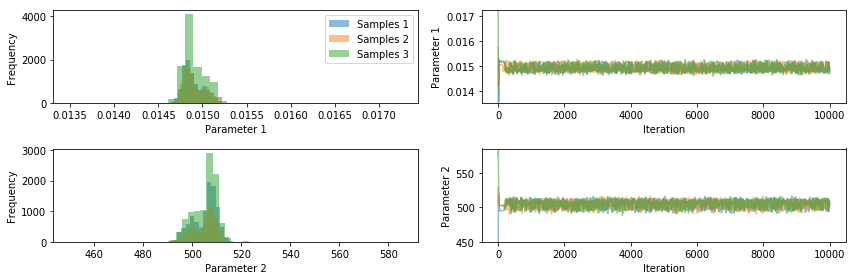

In [34]:
pints.plot.trace(chains_emu)
plt.show()

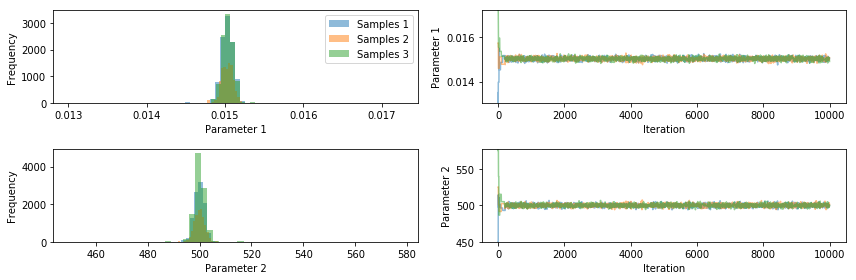

In [35]:
pints.plot.trace(chains)
plt.show()

In [36]:
chain_emu = chains_emu[0]
chain_emu = chain_emu[2000:]
chain = chains[0]
chain = chain[2000:]

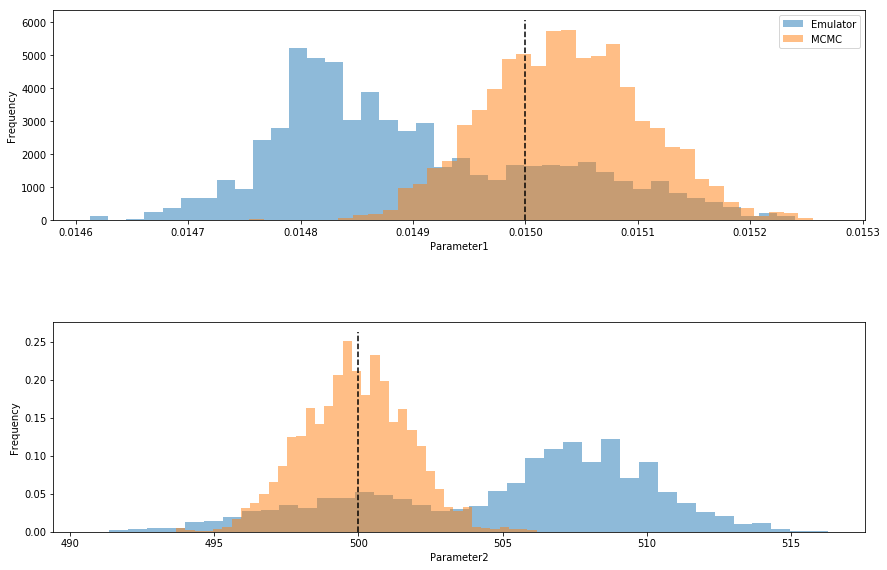

In [37]:
fig, axes = pints.plot.histogram([chain_emu, chain], ref_parameters=true_parameters, sample_names=["Emulator", "MCMC"])
fig.set_size_inches(14, 9)
plt.show()

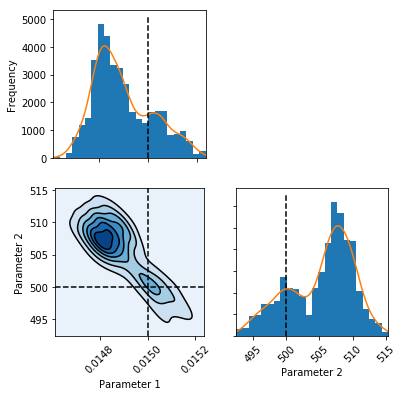

In [38]:
thinned_chain_emu = chain_emu[::10]
pints.plot.pairwise(thinned_chain_emu, kde=True, ref_parameters=true_parameters)
plt.show()

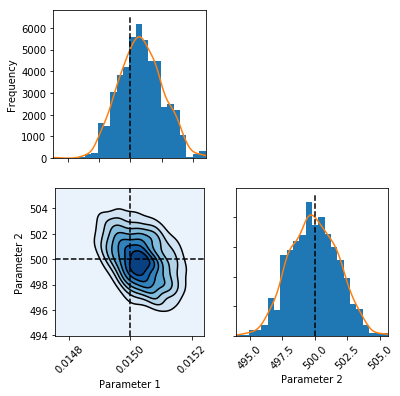

In [39]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

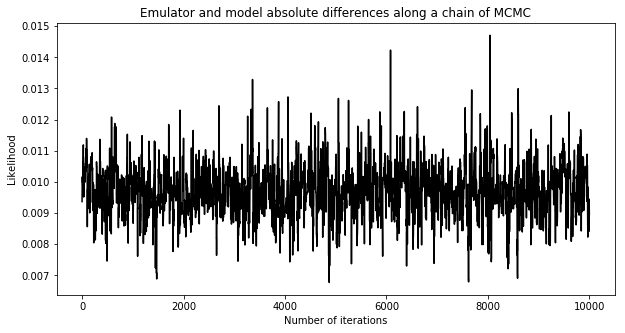

0.008949317187652621

In [40]:
emu_prediction = np.apply_along_axis(emu, 1, chain_emu_rescaled).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain_rescaled).flatten()
diffs = (np.abs((model_prediction - emu_prediction) / model_prediction))

iters = np.linspace(0, 10000, len(chain_emu_rescaled))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [41]:
chain_emu

array([[1.51896578e-02, 4.96689328e+02],
       [1.49638342e-02, 5.02729160e+02],
       [1.49638342e-02, 5.02729160e+02],
       ...,
       [1.46802864e-02, 5.10155045e+02],
       [1.49641825e-02, 5.01060516e+02],
       [1.47623992e-02, 5.05308961e+02]])

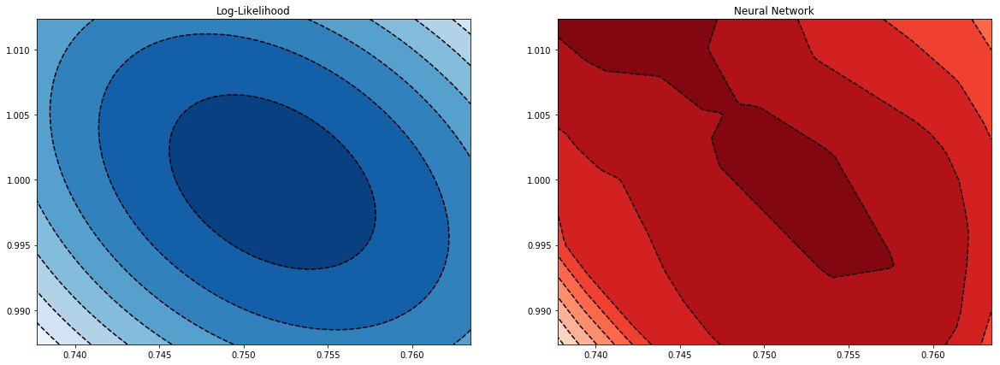

In [42]:
# Create grid of parameters
x = [p[0] for p in chain_rescaled]
y = [p[1] for p in chain_rescaled]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

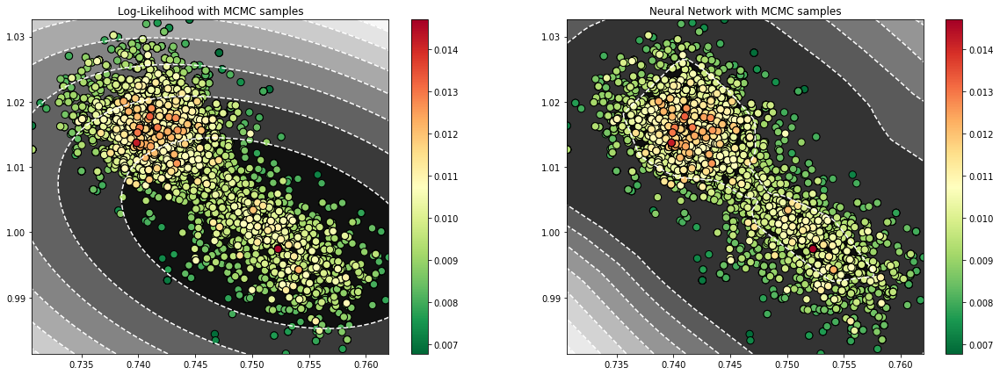

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood with MCMC samples')
ax2.title.set_text('Neural Network with MCMC samples')                                                                  

# Create grid of parameters
x = [p[0] for p in chain_emu_rescaled]
y = [p[1] for p in chain_emu_rescaled]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

# Sort according to differences in log-likelihood
idx = diffs.argsort()
x_sorted = np.array(x)[idx]
y_sorted = np.array(y)[idx]
diffs_sorted = diffs[idx]

# Add contour lines of log-likelihood
ax1.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax1.set_xlim([xmin, xmax])                                                                           
ax1.set_ylim([ymin, ymax])
im1 = ax1.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

# Add contour lines of emulated likelihood
ax2.contourf(xx, yy, ll_emu, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='w')

# Plot chain_emu    
ax2.set_xlim([xmin, xmax])                                                                           
ax2.set_ylim([ymin, ymax])
im2 = ax2.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)
plt.show()

Running...
Using Emulated Metropolis MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
1     6      0         0         0          0:00.0
2     9      0         0         0          0:00.0
3     12     0         0         0          0:00.0
20    63     0.143     0.333     0.238      0:00.1
40    123    0.146     0.366     0.244      0:00.1
60    183    0.164     0.377     0.213      0:00.1
80    243    0.173     0.444     0.247      0:00.2
100   303    0.188     0.475     0.228      0:00.2
120   363    0.182     0.463     0.19       0:00.3
140   423    0.17      0.447     0.17       0:00.3
160   483    0.149     0.466     0.155      0:00.4
180   543    0.138     0.459     0.138      0:00.4
200   603    0.124     0.458     0.124      0:00.5
220   663    0.118     0.462     0.113      0:00.5
240   723    0.112     0.469     0.108      0:00.6
260   783    0.103     0.467433  0.0996   

3120  9363   0.442     0.503     0.0394     0:07.6
3140  9423   0.442     0.501     0.0404     0:07.7
3160  9483   0.442     0.50174   0.0408     0:07.7
3180  9543   0.442     0.501     0.0409     0:07.8
3200  9603   0.443     0.500781  0.0409     0:07.8
3220  9663   0.444     0.5       0.041      0:07.9
3240  9723   0.443     0.5       0.041      0:07.9
3260  9783   0.443     0.501     0.0408     0:08.0
3280  9843   0.443     0.503     0.0415     0:08.0
3300  9903   0.443     0.502272  0.0412     0:08.1
3320  9963   0.443     0.502     0.0413     0:08.1
3340  10023  0.442     0.502     0.041      0:08.2
3360  10083  0.442     0.502529  0.0414     0:08.2
3380  10143  0.443     0.502     0.0411     0:08.3
3400  10203  0.443     0.503     0.0415     0:08.3
3420  10263  0.444     0.502     0.0415     0:08.4
3440  10323  0.444057  0.502     0.0418     0:08.4
3460  10383  0.445     0.502     0.0425     0:08.5
3480  10443  0.447     0.502     0.0425     0:08.5
3500  10503  0.447     0.503   

6360  19083  0.477     0.511     0.198      0:15.6
6380  19143  0.478     0.51      0.199      0:15.6
6400  19203  0.477     0.510389  0.2        0:15.7
6420  19263  0.476717  0.51      0.2        0:15.7
6440  19323  0.478     0.510014  0.201      0:15.8
6460  19383  0.478     0.51      0.202      0:15.8
6480  19443  0.478     0.51      0.203      0:15.9
6500  19503  0.478     0.511     0.204      0:15.9
6520  19563  0.478     0.511     0.205      0:16.0
6540  19623  0.478     0.51      0.206      0:16.0
6560  19683  0.478     0.511     0.207      0:16.0
6580  19743  0.479     0.511     0.208      0:16.1
6600  19803  0.479     0.511     0.209      0:16.1
6620  19863  0.479     0.511     0.209485   0:16.2
6640  19923  0.479     0.511     0.21       0:16.2
6660  19983  0.48      0.511     0.211      0:16.3
6680  20043  0.48      0.512     0.212543   0:16.3
6700  20103  0.48      0.512     0.214      0:16.4
6720  20163  0.48      0.512275  0.214105   0:16.4
6740  20223  0.48      0.512   

9660  28983  0.48      0.514     0.295      0:23.8
9680  29043  0.48      0.514     0.296      0:23.8
9700  29103  0.48      0.513     0.297      0:23.9
9720  29163  0.479     0.513     0.297      0:23.9
9740  29223  0.48      0.513     0.298      0:24.0
9760  29283  0.48      0.513     0.298      0:24.0
9780  29343  0.479     0.512831  0.299      0:24.1
9800  29403  0.479951  0.513     0.299      0:24.1
9820  29463  0.48      0.513186  0.3        0:24.2
9840  29523  0.48      0.513     0.3        0:24.2
9860  29583  0.48      0.513     0.3        0:24.3
9880  29643  0.48      0.513     0.3        0:24.3
9900  29703  0.48      0.513     0.301      0:24.4
9920  29763  0.48      0.513     0.301      0:24.4
9940  29823  0.479831  0.512     0.301      0:24.5
9960  29883  0.48      0.512298  0.301      0:24.5
9980  29943  0.48      0.512     0.302      0:24.6
10000 30003  0.479852  0.512     0.302      0:24.6
10020 30063  0.479992  0.512     0.302365   0:24.7
10040 30123  0.48      0.512   

12880 38643  0.491     0.51      0.344      0:31.7
12900 38703  0.491     0.51      0.344      0:31.8
12920 38763  0.491     0.51      0.344      0:31.8
12940 38823  0.491     0.511     0.345      0:31.9
12960 38883  0.491     0.511     0.345      0:31.9
12980 38943  0.490255  0.51      0.345      0:32.0
13000 39003  0.491     0.511     0.345358   0:32.0
13020 39063  0.491     0.51      0.346      0:32.1
13040 39123  0.491     0.51      0.346      0:32.1
13060 39183  0.491     0.510451  0.346      0:32.2
13080 39243  0.491     0.510435  0.347      0:32.2
13100 39303  0.49      0.51      0.347      0:32.3
13120 39363  0.49      0.51      0.347001   0:32.3
13140 39423  0.49      0.51      0.347      0:32.4
13160 39483  0.491     0.51      0.34739    0:32.4
13180 39543  0.491     0.51      0.348      0:32.5
13200 39603  0.491     0.51      0.348      0:32.5
13220 39663  0.491     0.51      0.349      0:32.6
13240 39723  0.490975  0.51      0.349      0:32.6
13260 39783  0.491     0.51    

16140 48423  0.494     0.509     0.376      0:39.9
16160 48483  0.494     0.508     0.377      0:40.0
16180 48543  0.494     0.508     0.3768     0:40.0
16200 48603  0.493     0.508     0.377      0:40.1
16220 48663  0.493     0.509     0.377      0:40.1
16240 48723  0.493     0.509     0.377      0:40.2
16260 48783  0.493     0.509     0.377      0:40.2
16280 48843  0.494     0.508384  0.377      0:40.3
16300 48903  0.493712  0.508     0.377      0:40.3
16320 48963  0.494     0.509     0.378      0:40.4
16340 49023  0.493605  0.508598  0.378251   0:40.4
16360 49083  0.493     0.509     0.378461   0:40.5
16380 49143  0.493     0.509     0.379      0:40.5
16400 49203  0.493     0.509     0.379      0:40.6
16420 49263  0.493     0.509     0.378966   0:40.6
16440 49323  0.493     0.509     0.379      0:40.7
16460 49383  0.493     0.509     0.38       0:40.7
16480 49443  0.493     0.508707  0.38       0:40.8
16500 49503  0.493     0.508454  0.38       0:40.8
16520 49563  0.493     0.508   

19400 58203  0.496     0.508     0.398      0:48.0
19420 58263  0.496     0.508     0.399      0:48.0
19440 58323  0.496     0.508     0.399      0:48.1
19460 58383  0.496     0.508     0.399      0:48.1
19480 58443  0.496     0.508     0.399      0:48.2
19500 58503  0.496231  0.508     0.399      0:48.2
19520 58563  0.496     0.508     0.399      0:48.3
19540 58623  0.496     0.508     0.4        0:48.3
19560 58683  0.496     0.508     0.4        0:48.4
19580 58743  0.495991  0.508     0.4        0:48.4
19600 58803  0.496     0.508     0.4        0:48.5
19620 58863  0.496203  0.50818   0.4        0:48.5
19640 58923  0.496156  0.508     0.401      0:48.6
19660 58983  0.496     0.508     0.401      0:48.6
19680 59043  0.496     0.508     0.401      0:48.7
19700 59103  0.496     0.508     0.401      0:48.7
19720 59163  0.496     0.508     0.401      0:48.8
19740 59223  0.496     0.508     0.401      0:48.8
19760 59283  0.497     0.507616  0.401      0:48.9
19780 59343  0.497     0.50776 

22620 67863  0.497     0.509     0.413      0:55.8
22640 67923  0.497     0.509     0.413      0:55.9
22660 67983  0.497     0.509245  0.413      0:55.9
22680 68043  0.496     0.509     0.413      0:56.0
22700 68103  0.497     0.509     0.413      0:56.0
22720 68163  0.497     0.509     0.412966   0:56.1
22740 68223  0.497     0.509     0.413      0:56.1
22760 68283  0.497     0.509     0.413075   0:56.2
22780 68343  0.496     0.509     0.413      0:56.2
22800 68403  0.496     0.509     0.413      0:56.3
22820 68463  0.496     0.51      0.413435   0:56.3
22840 68523  0.496     0.51      0.414      0:56.4
22860 68583  0.496     0.509864  0.414      0:56.4
22880 68643  0.496307  0.51      0.413662   0:56.5
22900 68703  0.496     0.51      0.414      0:56.5
22920 68763  0.496     0.51      0.414      0:56.6
22940 68823  0.496     0.51      0.413975   0:56.6
22960 68883  0.496     0.51      0.414      0:56.7
22980 68943  0.496     0.51      0.414      0:56.7
23000 69003  0.496     0.51    

25840 77523  0.498     0.51      0.424287   1:03.7
25860 77583  0.498     0.51      0.424      1:03.8
25880 77643  0.498     0.51      0.424      1:03.8
25900 77703  0.498     0.51      0.425      1:03.9
25920 77763  0.498     0.509     0.425      1:03.9
25940 77823  0.498     0.509     0.425      1:04.0
25960 77883  0.498     0.51      0.425      1:04.0
25980 77943  0.498     0.51      0.425      1:04.1
26000 78003  0.498     0.51      0.425      1:04.1
26020 78063  0.497944  0.51      0.425      1:04.2
26040 78123  0.498     0.51      0.425      1:04.2
26060 78183  0.498     0.51      0.425      1:04.3
26080 78243  0.498     0.51      0.425      1:04.3
26100 78303  0.498     0.51      0.425      1:04.4
26120 78363  0.498     0.51      0.425      1:04.4
26140 78423  0.498     0.51      0.425      1:04.5
26160 78483  0.498299  0.51      0.426      1:04.5
26180 78543  0.498     0.51      0.426      1:04.6
26200 78603  0.498     0.510095  0.426      1:04.6
26220 78663  0.498     0.51    

29120 87363  0.499     0.51      0.433      1:11.8
29140 87423  0.499     0.51      0.433      1:11.9
29160 87483  0.499     0.51      0.433      1:11.9
29180 87543  0.499     0.51      0.433      1:12.0
29200 87603  0.499     0.51      0.434      1:12.0
29220 87663  0.499     0.51      0.434      1:12.1
29240 87723  0.499     0.51      0.434      1:12.1
29260 87783  0.499     0.51      0.434      1:12.2
29280 87843  0.499     0.51      0.433865   1:12.2
29300 87903  0.499     0.510085  0.434      1:12.3
29320 87963  0.499     0.51      0.434      1:12.3
29340 88023  0.499     0.51      0.434      1:12.4
29360 88083  0.499     0.51      0.434      1:12.4
29380 88143  0.499     0.51      0.434      1:12.5
29400 88203  0.499     0.51      0.434      1:12.5
29420 88263  0.499     0.51      0.434      1:12.6
29440 88323  0.499     0.51      0.434      1:12.6
29460 88383  0.499     0.51      0.434      1:12.7
29480 88443  0.499     0.51      0.434      1:12.7
29500 88503  0.499     0.51    

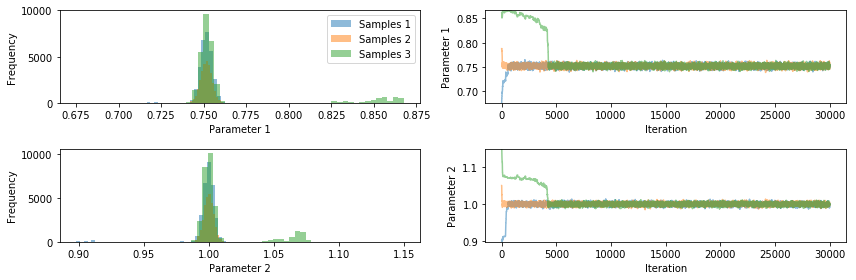

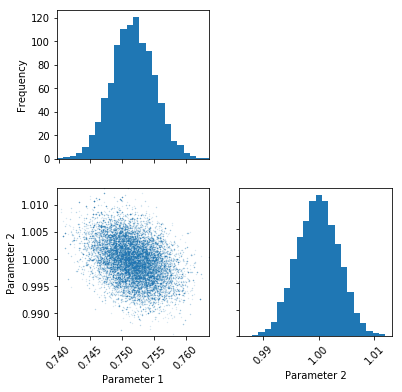

In [44]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
#sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-3
#sigma0 = [0.1*0.75, 0.1] #np.abs(true_parameters) * 5e-3
sigma0 = [[ 1.01547594e-05, -2.58358260e-06], [-2.58358260e-06,  1.22093040e-05]]

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior_emu, 3, x0s, sigma0=sigma0, method=pints.EmulatedMetropolisMCMC, f=log_posterior)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
emulated_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(emulated_chains)

# Discard warm up
emulated_chains_thinned = emulated_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(emulated_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(emulated_chains_thinned[0])

# Show graphs
plt.show()

Running...
Using Metropolis random walk MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
1     6      0.5       0         0.5        0:00.0
2     9      0.667     0.333     0.667      0:00.0
3     12     0.75      0.25      0.75       0:00.0
20    63     0.524     0.524     0.619      0:00.0
40    123    0.39      0.61      0.634      0:00.0
60    183    0.426     0.574     0.607      0:00.0
80    243    0.444     0.531     0.617284   0:00.1
100   303    0.465     0.525     0.604      0:00.1
120   363    0.496     0.537     0.562      0:00.1
140   423    0.504     0.553     0.546      0:00.1
160   483    0.503     0.528     0.528      0:00.1
180   543    0.508     0.53      0.552      0:00.1
200   603    0.512     0.537     0.547      0:00.1
220   663    0.516     0.529     0.557      0:00.2
240   723    0.519     0.531     0.552      0:00.2
260   783    0.521     0.54      0.556 

3200  9603   0.561     0.551     0.564      0:02.2
3220  9663   0.560385  0.552     0.564      0:02.2
3240  9723   0.561     0.553     0.563      0:02.2
3260  9783   0.561     0.552     0.564      0:02.2
3280  9843   0.561     0.552     0.564      0:02.2
3300  9903   0.563     0.552     0.563      0:02.3
3320  9963   0.562     0.553     0.564      0:02.3
3340  10023  0.563     0.552     0.566      0:02.3
3360  10083  0.563     0.551     0.565      0:02.3
3380  10143  0.564     0.55      0.566      0:02.3
3400  10203  0.564     0.55      0.567      0:02.3
3420  10263  0.564     0.55      0.566      0:02.3
3440  10323  0.563499  0.552     0.566      0:02.4
3460  10383  0.563     0.551     0.566      0:02.4
3480  10443  0.563     0.552     0.565      0:02.4
3500  10503  0.564     0.552     0.566      0:02.4
3520  10563  0.564     0.552     0.566      0:02.4
3540  10623  0.563     0.553     0.567      0:02.4
3560  10683  0.563     0.553     0.566      0:02.4
3580  10743  0.563     0.552   

6420  19263  0.56      0.563     0.563      0:04.4
6440  19323  0.559851  0.563     0.563      0:04.4
6460  19383  0.559     0.563     0.563      0:04.4
6480  19443  0.559     0.563     0.563      0:04.4
6500  19503  0.559     0.563     0.563298   0:04.4
6520  19563  0.56      0.563     0.563      0:04.4
6540  19623  0.56      0.563     0.563      0:04.4
6560  19683  0.56      0.563     0.564      0:04.5
6580  19743  0.559     0.563     0.564      0:04.5
6600  19803  0.559     0.562642  0.563854   0:04.5
6620  19863  0.559     0.562     0.564      0:04.5
6640  19923  0.559     0.562867  0.564674   0:04.5
6660  19983  0.559     0.563     0.565      0:04.5
6680  20043  0.559     0.563     0.565      0:04.5
6700  20103  0.559021  0.563     0.566      0:04.6
6720  20163  0.559143  0.563     0.566136   0:04.6
6740  20223  0.56      0.562     0.565      0:04.6
6760  20283  0.559     0.562     0.565      0:04.6
6780  20343  0.56      0.562     0.564666   0:04.6
6800  20403  0.56      0.563   

9740  29223  0.563     0.568     0.566      0:06.6
9760  29283  0.563     0.568     0.566      0:06.6
9780  29343  0.563     0.568     0.567      0:06.6
9800  29403  0.563     0.568     0.566      0:06.7
9820  29463  0.563     0.568     0.567      0:06.7
9840  29523  0.563     0.568     0.566      0:06.7
9860  29583  0.563     0.568     0.567      0:06.7
9880  29643  0.563     0.569     0.567      0:06.7
9900  29703  0.563     0.569     0.567      0:06.7
9920  29763  0.563     0.569     0.566576   0:06.7
9940  29823  0.563     0.569     0.567      0:06.7
9960  29883  0.562     0.569     0.567      0:06.8
9980  29943  0.562     0.569     0.567      0:06.8
10000 30003  0.563     0.569     0.567      0:06.8
10020 30063  0.563     0.569     0.567      0:06.8
10040 30123  0.563     0.569     0.567      0:06.8
10060 30183  0.563     0.569     0.567      0:06.8
10080 30243  0.563     0.57      0.567      0:06.8
10100 30303  0.563     0.57      0.567      0:06.9
10120 30363  0.563     0.569   

12980 38943  0.566     0.569     0.567      0:08.8
13000 39003  0.566     0.569     0.566      0:08.8
13020 39063  0.566316  0.569     0.567      0:08.8
13040 39123  0.566     0.569     0.567      0:08.8
13060 39183  0.566     0.569252  0.566      0:08.9
13080 39243  0.566     0.569     0.566      0:08.9
13100 39303  0.566     0.57      0.566369   0:08.9
13120 39363  0.566     0.57      0.566      0:08.9
13140 39423  0.566     0.57      0.566      0:08.9
13160 39483  0.566     0.57      0.567      0:08.9
13180 39543  0.567     0.57      0.567      0:08.9
13200 39603  0.567     0.57      0.567      0:09.0
13220 39663  0.567     0.57      0.567      0:09.0
13240 39723  0.567     0.57      0.566649   0:09.0
13260 39783  0.567     0.57      0.567      0:09.0
13280 39843  0.567     0.57      0.567      0:09.0
13300 39903  0.567     0.57      0.567      0:09.0
13320 39963  0.567     0.57      0.567      0:09.0
13340 40023  0.567     0.57      0.566974   0:09.1
13360 40083  0.567     0.57    

16440 49323  0.569     0.568     0.566      0:11.2
16460 49383  0.569     0.568     0.566      0:11.2
16480 49443  0.569     0.569     0.565439   0:11.2
16500 49503  0.569     0.568     0.566      0:11.2
16520 49563  0.569     0.568     0.566      0:11.2
16540 49623  0.569     0.568     0.566      0:11.2
16560 49683  0.569     0.569     0.566      0:11.3
16580 49743  0.569     0.568482  0.566      0:11.3
16600 49803  0.569     0.569     0.566      0:11.3
16620 49863  0.569     0.569     0.566      0:11.3
16640 49923  0.569     0.568     0.566      0:11.3
16660 49983  0.569     0.569     0.566      0:11.3
16680 50043  0.569     0.568611  0.566      0:11.3
16700 50103  0.568948  0.569     0.566      0:11.4
16720 50163  0.569     0.569     0.566      0:11.4
16740 50223  0.569     0.569     0.566      0:11.4
16760 50283  0.569     0.569     0.566      0:11.4
16780 50343  0.569     0.569     0.566      0:11.4
16800 50403  0.569     0.569     0.566      0:11.4
16820 50463  0.56911   0.569   

19720 59163  0.57      0.57061   0.566      0:13.4
19740 59223  0.569424  0.57      0.566      0:13.4
19760 59283  0.569     0.57      0.566      0:13.4
19780 59343  0.569     0.57      0.566      0:13.4
19800 59403  0.569     0.57      0.566032   0:13.5
19820 59463  0.569     0.57      0.566      0:13.5
19840 59523  0.569     0.57      0.566      0:13.5
19860 59583  0.569206  0.57      0.566      0:13.5
19880 59643  0.569     0.57      0.566      0:13.5
19900 59703  0.569     0.57      0.566      0:13.5
19920 59763  0.569     0.571     0.566086   0:13.5
19940 59823  0.569     0.571     0.566      0:13.5
19960 59883  0.57      0.571     0.566      0:13.6
19980 59943  0.57      0.570542  0.566      0:13.6
20000 60003  0.57      0.571     0.566      0:13.6
20020 60063  0.57      0.570501  0.566      0:13.6
20040 60123  0.569732  0.571     0.566      0:13.6
20060 60183  0.57      0.571     0.565575   0:13.6
20080 60243  0.57      0.571     0.566      0:13.6
20100 60303  0.57      0.571   

22980 68943  0.569     0.57      0.566468   0:15.6
23000 69003  0.569     0.57      0.566      0:15.6
23020 69063  0.569     0.57      0.567      0:15.6
23040 69123  0.569     0.57      0.567      0:15.7
23060 69183  0.569     0.57      0.566      0:15.7
23080 69243  0.569     0.57      0.566      0:15.7
23100 69303  0.569     0.57      0.566      0:15.7
23120 69363  0.569     0.57      0.566152   0:15.7
23140 69423  0.569     0.57      0.566      0:15.7
23160 69483  0.569     0.57      0.566      0:15.7
23180 69543  0.569     0.57      0.566      0:15.8
23200 69603  0.569     0.57      0.566398   0:15.8
23220 69663  0.569     0.57      0.566      0:15.8
23240 69723  0.569     0.57      0.566      0:15.8
23260 69783  0.569365  0.57      0.566      0:15.8
23280 69843  0.569     0.57      0.566      0:15.8
23300 69903  0.57      0.57      0.566156   0:15.8
23320 69963  0.57      0.570087  0.566185   0:15.8
23340 70023  0.57      0.57      0.566      0:15.9
23360 70083  0.569     0.57    

26280 78843  0.57      0.571     0.567      0:17.9
26300 78903  0.57      0.571     0.567      0:17.9
26320 78963  0.57      0.570951  0.567      0:17.9
26340 79023  0.57      0.570973  0.566835   0:17.9
26360 79083  0.57      0.571     0.567      0:17.9
26380 79143  0.57      0.571     0.567      0:17.9
26400 79203  0.57      0.571     0.567      0:17.9
26420 79263  0.57      0.571     0.567      0:17.9
26440 79323  0.57      0.571     0.567      0:18.0
26460 79383  0.57      0.571     0.567      0:18.0
26480 79443  0.57      0.571     0.566897   0:18.0
26500 79503  0.57      0.571     0.567      0:18.0
26520 79563  0.57      0.571     0.567      0:18.0
26540 79623  0.57      0.571     0.567      0:18.0
26560 79683  0.57      0.571     0.567      0:18.0
26580 79743  0.57      0.571     0.567      0:18.1
26600 79803  0.57      0.571     0.567      0:18.1
26620 79863  0.57      0.571     0.567      0:18.1
26640 79923  0.57      0.57      0.567      0:18.1
26660 79983  0.57      0.57    

29780 89343  0.569     0.57      0.567      0:20.2
29800 89403  0.569     0.57      0.567      0:20.2
29820 89463  0.569     0.57      0.567      0:20.2
29840 89523  0.569     0.57      0.567      0:20.3
29860 89583  0.569     0.57      0.567      0:20.3
29880 89643  0.569     0.57      0.567      0:20.3
29900 89703  0.569     0.57      0.567      0:20.3
29920 89763  0.569     0.57      0.567      0:20.3
29940 89823  0.569     0.57      0.567      0:20.3
29960 89883  0.569     0.57      0.566937   0:20.3
29980 89943  0.569     0.57      0.567      0:20.4
30000 90000  0.569     0.57      0.567      0:20.4
Halting: Maximum number of iterations (30000) reached.
Done!
R-hat:
[1.0002340644702479, 1.0007775331271678]


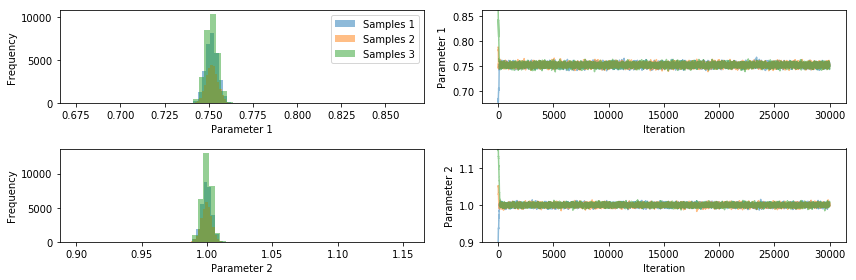

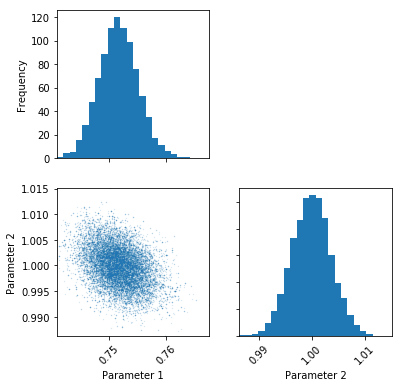

In [50]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
#sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-5
sigma0 = [[ 1.01547594e-05, -2.58358260e-06], [-2.58358260e-06,  1.22093040e-05]]

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, x0s, sigma0=sigma0, method=pints.MetropolisRandomWalkMCMC)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
metropolis_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(metropolis_chains)

# Discard warm up
metropolis_chains_thinned = metropolis_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(metropolis_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(metropolis_chains_thinned[0])

# Show graphs
plt.show()

Running...
Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0         0.5       0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0.333     0.333     0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0.25      0.5       0.25       0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.

[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]

[[3.55746418e-05 1.30300395e-05]
 [1.30300395e-05 5.06450074e-05]]


[[3.41935280e-05 1.94597700e-06]
 [1.94597700e-06 4.53150702e-05]]


[[5.42100464e-05 2.31694920e-05]
 [2.31694920e-05 1.01975703e-04]]


[[2.85729617e-05 1.04781077e-05]
 [1.04781077e-05 4.07152620e-05]]


[[2.90190051e-05 7.45768785e-07]
 [7.45768785e-07 3.68183961e-05]]


[[4.35372143e-05 1.85250322e-05]
 [1.85250322e-05 8.37441608e-05]]


[[2.35472481e-05 7.85715620e-06]
 [7.85715620e-06 3.40431664e-05]]


[[2.38696190e-05 6.20516458e-07]
 [6.20516458e-07 2.98433528e-05]]


[[3.58628020e-05 1.51956082e-05]
 [1.51956082e-05 6.79342805e-05]]


[[1.93950307e-05 7.24985435e-06]
 [7.24985435e-06 3.24025954e-05]]


[[2.00578403e-05 3.40936110e-07]
 [3.40936110e-07 2.44413829e-05]]


[[2.96807379e-05 1.25356296e-05]
 [1.25356296e-05 5.55594165e-05]]


[[1.60692288e-05 6.51262927e-06]
 [6.51262927e-06 2.96826277e-05]]


[[1.68766840e-05 1.71839749e-07]
 [1.71839749e-07 2.01595326e-05]]


[[2.46833831e-05 1.03987665e-05]
 

 [-8.90740035e-06  1.76445343e-05]]


[[ 6.61528733e-06 -9.24664040e-06]
 [-9.24664040e-06  2.65903934e-05]]


[[ 3.39756783e-06 -1.14906298e-06]
 [-1.14906298e-06  4.80267960e-06]]


[[ 8.17096348e-06 -9.09789623e-06]
 [-9.09789623e-06  1.72135945e-05]]


[[ 7.25044606e-06 -8.60139343e-06]
 [-8.60139343e-06  2.48950222e-05]]


[[ 3.18432010e-06 -1.04722201e-06]
 [-1.04722201e-06  4.71253945e-06]]


[[ 7.68990231e-06 -8.63420760e-06]
 [-8.63420760e-06  1.64653876e-05]]


[[ 7.71220744e-06 -8.00770776e-06]
 [-8.00770776e-06  2.33172188e-05]]


[[ 2.98544702e-06 -9.55940813e-07]
 [-9.55940813e-07  4.60220658e-06]]


[[ 7.23751751e-06 -8.18873689e-06]
 [-8.18873689e-06  1.57270433e-05]]


[[ 7.24325531e-06 -7.32198407e-06]
 [-7.32198407e-06  2.36907750e-05]]


[[ 3.34376046e-06 -6.38908403e-07]
 [-6.38908403e-07  4.43237855e-06]]


[[ 6.81223561e-06 -7.76186270e-06]
 [-7.76186270e-06  1.50031015e-05]]


[[ 6.80437487e-06 -6.70514872e-06]
 [-6.70514872e-06  2.38158604e-05]]


[[ 3.61143752

[[ 4.15482145e-06 -1.19909157e-06]
 [-1.19909157e-06  7.49094441e-06]]


[[ 1.72186586e-05 -7.59303598e-06]
 [-7.59303598e-06  1.01895217e-05]]


[[ 3.02090638e-06 -1.52421593e-06]
 [-1.52421593e-06  5.78263359e-06]]


[[ 4.47678073e-06 -1.33626405e-06]
 [-1.33626405e-06  7.22927405e-06]]


[[ 1.69493259e-05 -7.53885551e-06]
 [-7.53885551e-06  9.89918705e-06]]


[[ 3.17455163e-06 -1.71151208e-06]
 [-1.71151208e-06  5.75209732e-06]]


[[ 4.73958301e-06 -1.45042858e-06]
 [-1.45042858e-06  6.97389002e-06]]


[[ 1.66381231e-05 -8.10227018e-06]
 [-8.10227018e-06  1.12974719e-05]]


[[ 3.29611810e-06 -1.86794934e-06]
 [-1.86794934e-06  5.70355074e-06]]


[[ 4.95015350e-06 -1.54422771e-06]
 [-1.54422771e-06  6.72502416e-06]]


380   1143   0.194     0.186     0.189      0:01.0
[[ 1.63040498e-05 -8.56200783e-06]
 [-8.56200783e-06  1.24718922e-05]]


[[ 3.85672190e-06 -2.85366322e-06]
 [-2.85366322e-06  7.06836932e-06]]


[[ 5.11468072e-06 -1.62002496e-06]
 [-1.62002496e-06  6.48284486e-06]]




 [-8.18748540e-06  1.24370772e-05]]


[[ 4.06929989e-06 -2.97014801e-06]
 [-2.97014801e-06  1.09612211e-05]]


[[ 9.97614420e-06 -9.39438513e-06]
 [-9.39438513e-06  1.94606655e-05]]


[[ 2.17572263e-05 -7.79126109e-06]
 [-7.79126109e-06  1.20178813e-05]]


[[ 4.01592106e-06 -2.96185098e-06]
 [-2.96185098e-06  1.06773684e-05]]


[[ 9.62613751e-06 -9.04225650e-06]
 [-9.04225650e-06  1.89485054e-05]]


[[ 2.15201636e-05 -7.41729529e-06]
 [-7.41729529e-06  1.16130237e-05]]


[[ 3.95830321e-06 -2.94719130e-06]
 [-2.94719130e-06  1.03970281e-05]]


[[ 9.28909845e-06 -8.70474118e-06]
 [-8.70474118e-06  1.84434558e-05]]


[[ 2.12554646e-05 -7.06417706e-06]
 [-7.06417706e-06  1.12220326e-05]]


[[ 3.89705847e-06 -2.92689632e-06]
 [-2.92689632e-06  1.01205674e-05]]


[[ 9.53791227e-06 -8.35201974e-06]
 [-8.35201974e-06  1.77987621e-05]]


[[ 2.05386320e-05 -6.71715944e-06]
 [-6.71715944e-06  1.11697002e-05]]


[[ 3.83274079e-06 -2.90162811e-06]
 [-2.90162811e-06  9.84830133e-06]]


[[ 9.73786088

[[ 1.13046037e-05 -5.06666979e-06]
 [-5.06666979e-06  8.11588211e-06]]


[[ 1.03590169e-05 -4.97767046e-06]
 [-4.97767046e-06  6.73260138e-06]]


[[ 1.13029353e-05 -6.76986565e-06]
 [-6.76986565e-06  8.01775105e-06]]


[[ 1.12572250e-05 -5.12753866e-06]
 [-5.12753866e-06  8.02727607e-06]]


[[ 1.00899381e-05 -5.00579564e-06]
 [-5.00579564e-06  7.28397898e-06]]


[[ 1.13573235e-05 -6.59930791e-06]
 [-6.59930791e-06  7.77981900e-06]]


[[ 1.12554665e-05 -5.52771485e-06]
 [-5.52771485e-06  8.69973855e-06]]


[[ 1.03245069e-05 -5.69640657e-06]
 [-5.69640657e-06  8.38186747e-06]]


[[ 1.11937891e-05 -6.55956390e-06]
 [-6.55956390e-06  7.68793411e-06]]


[[ 1.15736677e-05 -6.75020212e-06]
 [-6.75020212e-06  1.13789028e-05]]


[[ 1.05200746e-05 -6.31572241e-06]
 [-6.31572241e-06  9.36760331e-06]]


[[ 1.10250326e-05 -6.51178490e-06]
 [-6.51178490e-06  7.59065047e-06]]


[[ 1.18432483e-05 -7.85236060e-06]
 [-7.85236060e-06  1.38003761e-05]]


[[ 1.06798486e-05 -6.86910656e-06]
 [-6.86910656e-0

 [5.51612194e-07 1.53382866e-05]]


[[ 8.58138549e-06 -1.42264338e-06]
 [-1.42264338e-06  1.04370053e-05]]


[[ 1.25151124e-05 -2.50906757e-06]
 [-2.50906757e-06  1.01948382e-05]]


[[1.46782744e-05 1.08185643e-06]
 [1.08185643e-06 1.59199331e-05]]


[[ 8.36159428e-06 -1.29826074e-06]
 [-1.29826074e-06  1.14488816e-05]]


[[ 1.21862561e-05 -2.44795903e-06]
 [-2.44795903e-06  1.00169786e-05]]


[[1.45780620e-05 1.56924081e-06]
 [1.56924081e-06 1.64345103e-05]]


[[ 8.14757680e-06 -1.18181938e-06]
 [-1.18181938e-06  1.23661938e-05]]


[[ 1.18664804e-05 -2.38828808e-06]
 [-2.38828808e-06  9.83936650e-06]]


[[1.44658720e-05 2.01650520e-06]
 [2.01650520e-06 1.68866694e-05]]


[[ 7.93918145e-06 -1.07284997e-06]
 [-1.07284997e-06  1.31952185e-05]]


[[ 1.23498482e-05 -2.07180107e-06]
 [-2.07180107e-06  9.66243675e-06]]


[[1.43428326e-05 2.42622479e-06]
 [2.42622479e-06 1.72807730e-05]]


[[ 7.73626038e-06 -9.70910427e-07]
 [-9.70910427e-07  1.39418497e-05]]


[[ 1.27788728e-05 -1.77714485e-

[[ 1.47266343e-05 -6.06545573e-06]
 [-6.06545573e-06  1.21804526e-05]]


[[ 8.68233430e-06 -2.39090326e-06]
 [-2.39090326e-06  1.44520605e-05]]


[[ 1.31058063e-05 -6.10731794e-06]
 [-6.10731794e-06  1.65711822e-05]]


[[ 1.52924417e-05 -5.96507979e-06]
 [-5.96507979e-06  1.18940295e-05]]


[[ 8.71309236e-06 -2.34894676e-06]
 [-2.34894676e-06  1.41107014e-05]]


[[ 1.30530887e-05 -6.63241229e-06]
 [-6.63241229e-06  1.79215436e-05]]


[[ 1.49310194e-05 -5.84295450e-06]
 [-5.84295450e-06  1.27178489e-05]]


[[ 8.73204862e-06 -2.30734693e-06]
 [-2.30734693e-06  1.37777742e-05]]


[[ 1.29896768e-05 -7.11325634e-06]
 [-7.11325634e-06  1.91571539e-05]]


[[ 1.45785436e-05 -5.72297205e-06]
 [-5.72297205e-06  1.34696928e-05]]


[[ 8.74003709e-06 -2.26612721e-06]
 [-2.26612721e-06  1.34530617e-05]]


[[ 1.29164209e-05 -7.55248896e-06]
 [-7.55248896e-06  2.02848695e-05]]


[[ 1.42347827e-05 -5.60511903e-06]
 [-5.60511903e-06  1.41538894e-05]]


[[ 8.73784336e-06 -2.22530880e-06]
 [-2.22530880e-0

 [-3.99707451e-06  8.87666591e-06]]


[[ 1.60829507e-05 -2.14741289e-07]
 [-2.14741289e-07  1.30530977e-05]]


[[ 6.30964802e-06 -4.10800804e-06]
 [-4.10800804e-06  2.74556551e-05]]


[[ 1.17442931e-05 -3.99904955e-06]
 [-3.99904955e-06  8.74080831e-06]]


[[ 1.62216562e-05 -7.05617840e-07]
 [-7.05617840e-07  1.32782264e-05]]


[[ 6.74988503e-06 -4.40548341e-06]
 [-4.40548341e-06  2.71229845e-05]]


[[ 1.16253072e-05 -3.99722920e-06]
 [-3.99722920e-06  8.60565096e-06]]


[[ 1.63366171e-05 -1.16437677e-06]
 [-1.16437677e-06  1.34767645e-05]]


[[ 6.79686544e-06 -3.97703228e-06]
 [-3.97703228e-06  2.71188862e-05]]


[[ 1.15033063e-05 -3.99186589e-06]
 [-3.99186589e-06  8.47128002e-06]]


800   2403   0.217     0.211     0.199      0:01.9
[[ 1.64292874e-05 -1.59268830e-06]
 [-1.59268830e-06  1.36502719e-05]]


[[ 6.83462619e-06 -3.57238942e-06]
 [-3.57238942e-06  2.70902708e-05]]


[[ 1.12671962e-05 -3.96405035e-06]
 [-3.96405035e-06  8.59201176e-06]]


[[ 1.61241895e-05 -1.74733834e-06]


[[ 1.16158692e-05 -2.25822816e-06]
 [-2.25822816e-06  1.24328895e-05]]


[[ 1.10786642e-05 -7.63876963e-06]
 [-7.63876963e-06  1.77566097e-05]]


[[ 6.84179731e-06 -3.05888182e-06]
 [-3.05888182e-06  1.40119360e-05]]


[[ 1.14402110e-05 -2.05674505e-06]
 [-2.05674505e-06  1.26388903e-05]]


[[ 1.09270113e-05 -7.32675783e-06]
 [-7.32675783e-06  1.77866276e-05]]


[[ 6.83110338e-06 -3.22959756e-06]
 [-3.22959756e-06  1.41631751e-05]]


[[ 1.12660532e-05 -1.86555935e-06]
 [-1.86555935e-06  1.28229369e-05]]


[[ 1.15129144e-05 -7.70394533e-06]
 [-7.70394533e-06  1.77746403e-05]]


[[ 6.73429496e-06 -3.32128990e-06]
 [-3.32128990e-06  1.45143889e-05]]


[[ 1.12928551e-05 -1.64240521e-06]
 [-1.64240521e-06  1.27085470e-05]]


[[ 1.20553593e-05 -8.05292958e-06]
 [-8.05292958e-06  1.77496071e-05]]


[[ 7.08078762e-06 -3.86838521e-06]
 [-3.86838521e-06  1.50103300e-05]]


[[ 1.13093554e-05 -1.43113046e-06]
 [-1.43113046e-06  1.25910807e-05]]


[[ 1.24431155e-05 -8.66685854e-06]
 [-8.66685854e-0

 [-1.16796648e-05  2.40640071e-05]]


[[ 1.23704662e-05 -8.51341260e-06]
 [-8.51341260e-06  1.38046672e-05]]


[[ 7.65783101e-06 -4.47440670e-06]
 [-4.47440670e-06  1.19857249e-05]]


[[ 2.25224222e-05 -1.14878358e-05]
 [-1.14878358e-05  2.36618373e-05]]


[[ 1.27481024e-05 -8.91845350e-06]
 [-8.91845350e-06  1.40704590e-05]]


[[ 7.52164731e-06 -4.42135791e-06]
 [-4.42135791e-06  1.19131984e-05]]


[[ 2.21180535e-05 -1.12987957e-05]
 [-1.12987957e-05  2.32658023e-05]]


[[ 1.30961261e-05 -9.29497631e-06]
 [-9.29497631e-06  1.43119310e-05]]


[[ 7.38787579e-06 -4.36823143e-06]
 [-4.36823143e-06  1.18365625e-05]]


[[ 2.17799995e-05 -1.13229736e-05]
 [-1.13229736e-05  2.35926082e-05]]


[[ 1.33165683e-05 -9.22486605e-06]
 [-9.22486605e-06  1.40691451e-05]]


[[ 7.25647621e-06 -4.31507015e-06]
 [-4.31507015e-06  1.17561065e-05]]


[[ 2.14458299e-05 -1.13381145e-05]
 [-1.13381145e-05  2.38852974e-05]]


[[ 1.30717128e-05 -9.03353522e-06]
 [-9.03353522e-06  1.40356004e-05]]


[[ 7.12740882

 [-4.29608850e-06  1.45414601e-05]]


[[ 9.78329385e-06 -5.25353364e-06]
 [-5.25353364e-06  1.25488455e-05]]


[[ 8.63172121e-06 -6.94173435e-06]
 [-6.94173435e-06  1.61318636e-05]]


[[ 8.94261762e-06 -4.37782721e-06]
 [-4.37782721e-06  1.47652109e-05]]


[[ 9.80022334e-06 -5.43720903e-06]
 [-5.43720903e-06  1.27341753e-05]]


[[ 8.62237302e-06 -6.95126463e-06]
 [-6.95126463e-06  1.59713679e-05]]


[[ 8.83640802e-06 -4.45267729e-06]
 [-4.45267729e-06  1.49684309e-05]]


[[ 9.70376409e-06 -5.51534455e-06]
 [-5.51534455e-06  1.29145564e-05]]


[[ 8.60832205e-06 -6.95611539e-06]
 [-6.95611539e-06  1.58096125e-05]]


[[ 8.73041129e-06 -4.52095866e-06]
 [-4.52095866e-06  1.51520861e-05]]


[[ 9.62825943e-06 -5.38477474e-06]
 [-5.38477474e-06  1.27024718e-05]]


[[ 8.58982823e-06 -6.95653327e-06]
 [-6.95653327e-06  1.56467679e-05]]


[[ 8.62468358e-06 -4.58297815e-06]
 [-4.58297815e-06  1.53171032e-05]]


[[ 9.55090025e-06 -5.25775892e-06]
 [-5.25775892e-06  1.24937857e-05]]


[[ 8.56714026

 [-4.92892931e-06  1.55219466e-05]]


[[ 1.20340834e-05 -9.28001409e-06]
 [-9.28001409e-06  2.08725204e-05]]


[[ 9.04387451e-06 -5.15146812e-06]
 [-5.15146812e-06  2.28325220e-05]]


[[ 1.44336479e-05 -4.86665964e-06]
 [-4.86665964e-06  1.52662487e-05]]


[[ 1.20121399e-05 -8.90516975e-06]
 [-8.90516975e-06  2.08050648e-05]]


[[ 8.89499601e-06 -5.05054055e-06]
 [-5.05054055e-06  2.30134840e-05]]


[[ 1.46621823e-05 -4.80483081e-06]
 [-4.80483081e-06  1.50149122e-05]]


[[ 1.19847833e-05 -8.54400577e-06]
 [-8.54400577e-06  2.07296868e-05]]


[[ 8.74865497e-06 -4.95186221e-06]
 [-4.95186221e-06  2.31730934e-05]]


[[ 1.48715284e-05 -4.74345588e-06]
 [-4.74345588e-06  1.47678604e-05]]


[[ 1.19523029e-05 -8.19603699e-06]
 [-8.19603699e-06  2.06468302e-05]]


[[ 8.60480673e-06 -4.85537580e-06]
 [-4.85537580e-06  2.33123378e-05]]


[[ 1.50625363e-05 -4.68254696e-06]
 [-4.68254696e-06  1.45250177e-05]]


[[ 1.19149763e-05 -7.86079540e-06]
 [-7.86079540e-06  2.05569201e-05]]


[[ 8.46340747

 [-7.83196612e-06  1.88932234e-05]]


[[ 1.28605946e-05 -5.73292322e-06]
 [-5.73292322e-06  1.21844467e-05]]


[[ 1.73173610e-05 -8.08656131e-06]
 [-8.08656131e-06  1.73690050e-05]]


[[ 1.72901808e-05 -7.77203383e-06]
 [-7.77203383e-06  1.86934031e-05]]


[[ 1.26743846e-05 -5.60177365e-06]
 [-5.60177365e-06  1.21035832e-05]]


[[ 1.70587869e-05 -7.97775391e-06]
 [-7.97775391e-06  1.71216214e-05]]


[[ 1.70589248e-05 -7.71112202e-06]
 [-7.71112202e-06  1.84938350e-05]]


[[ 1.24907224e-05 -5.47403872e-06]
 [-5.47403872e-06  1.20206101e-05]]


[[ 1.67914615e-05 -7.85176781e-06]
 [-7.85176781e-06  1.73154538e-05]]


[[ 1.68301938e-05 -7.64930900e-06]
 [-7.64930900e-06  1.82946097e-05]]


[[ 1.23095801e-05 -5.34962033e-06]
 [-5.34962033e-06  1.19356711e-05]]


[[ 1.65284800e-05 -7.72785904e-06]
 [-7.72785904e-06  1.74917823e-05]]


[[ 1.66039841e-05 -7.58666973e-06]
 [-7.58666973e-06  1.80958131e-05]]


[[ 1.21309299e-05 -5.22842339e-06]
 [-5.22842339e-06  1.18489042e-05]]


[[ 1.62697693

 [-2.93208473e-06  1.05603537e-05]]


[[ 9.83123289e-06 -3.47719195e-06]
 [-3.47719195e-06  9.07810858e-06]]


[[ 1.52881841e-05 -5.34004831e-06]
 [-5.34004831e-06  1.39447763e-05]]


1300  3903   0.218     0.212     0.215      0:03.0
[[ 8.90182194e-06 -2.90506742e-06]
 [-2.90506742e-06  1.04063235e-05]]


[[ 9.70670737e-06 -3.42195261e-06]
 [-3.42195261e-06  8.94284520e-06]]


[[ 1.50610526e-05 -5.25666147e-06]
 [-5.25666147e-06  1.37449213e-05]]


[[ 8.77144115e-06 -2.88408825e-06]
 [-2.88408825e-06  1.04411253e-05]]


[[ 9.58344433e-06 -3.36766513e-06]
 [-3.36766513e-06  8.80966280e-06]]


[[ 1.49743136e-05 -4.98533636e-06]
 [-4.98533636e-06  1.38081685e-05]]


[[ 8.66902334e-06 -2.85518827e-06]
 [-2.85518827e-06  1.02922111e-05]]


[[ 9.55198204e-06 -3.42975182e-06]
 [-3.42975182e-06  8.79118879e-06]]


[[ 1.53180616e-05 -5.32164631e-06]
 [-5.32164631e-06  1.38993141e-05]]


[[ 8.56734334e-06 -2.82631557e-06]
 [-2.82631557e-06  1.01453925e-05]]


[[ 9.44717674e-06 -3.29816592e-06]


[[ 1.53051131e-05 -6.91491781e-07]
 [-6.91491781e-07  1.44476549e-05]]


[[ 1.67009701e-05 -7.15020899e-06]
 [-7.15020899e-06  1.18551288e-05]]


[[ 1.06545141e-05 -3.97442840e-06]
 [-3.97442840e-06  1.19443682e-05]]


[[ 1.52548481e-05 -4.28947131e-07]
 [-4.28947131e-07  1.46182153e-05]]


[[ 1.64717633e-05 -7.14145247e-06]
 [-7.14145247e-06  1.25546774e-05]]


[[ 1.06009088e-05 -4.27421194e-06]
 [-4.27421194e-06  1.30587465e-05]]


[[ 1.52005237e-05 -1.77476401e-07]
 [-1.77476401e-07  1.47755145e-05]]


[[ 1.62456683e-05 -7.13016260e-06]
 [-7.13016260e-06  1.32191409e-05]]


[[ 1.04687658e-05 -4.22978757e-06]
 [-4.22978757e-06  1.28861471e-05]]


[[1.51423411e-05 6.32977940e-08]
 [6.32977940e-08 1.49200661e-05]]


[[ 1.60226457e-05 -7.11645519e-06]
 [-7.11645519e-06  1.38497717e-05]]


[[ 1.03380237e-05 -4.18554542e-06]
 [-4.18554542e-06  1.27156975e-05]]


[[1.50804941e-05 2.93740758e-07]
 [2.93740758e-07 1.50523663e-05]]


[[ 1.58026562e-05 -7.10044197e-06]
 [-7.10044197e-06  1.444

 [-1.39533436e-06  1.62677218e-05]]


[[ 1.80900084e-05 -7.34104159e-06]
 [-7.34104159e-06  2.35568743e-05]]


[[ 1.67675245e-05 -9.46988386e-06]
 [-9.46988386e-06  1.34070103e-05]]


[[ 1.25711103e-05 -1.23245381e-06]
 [-1.23245381e-06  1.63327368e-05]]


[[ 1.78849180e-05 -7.37703114e-06]
 [-7.37703114e-06  2.36654342e-05]]


[[ 1.68593967e-05 -9.49599261e-06]
 [-9.49599261e-06  1.32986554e-05]]


[[ 1.24682088e-05 -1.07580190e-06]
 [-1.07580190e-06  1.63889704e-05]]


[[ 1.85635084e-05 -8.03514223e-06]
 [-8.03514223e-06  2.39646419e-05]]


[[ 1.67168626e-05 -9.35883960e-06]
 [-9.35883960e-06  1.31167510e-05]]


[[ 1.25395198e-05 -9.84227070e-07]
 [-9.84227070e-07  1.61884852e-05]]


[[ 1.92073017e-05 -8.66323256e-06]
 [-8.66323256e-06  2.42426081e-05]]


[[ 1.64876670e-05 -9.23141100e-06]
 [-9.23141100e-06  1.29667761e-05]]


[[ 1.26032215e-05 -8.96042284e-07]
 [-8.96042284e-07  1.59901807e-05]]


[[ 1.93776701e-05 -9.37847643e-06]
 [-9.37847643e-06  2.55139488e-05]]


[[ 1.65907870

[[ 1.46054185e-05 -7.44593299e-06]
 [-7.44593299e-06  1.43265721e-05]]


[[ 9.03400019e-06 -7.05687815e-07]
 [-7.05687815e-07  8.82485740e-06]]


[[ 1.38785469e-05 -7.04111126e-06]
 [-7.04111126e-06  2.04311969e-05]]


[[ 1.47151519e-05 -7.81577467e-06]
 [-7.81577467e-06  1.48610196e-05]]


[[ 8.97008776e-06 -7.00156417e-07]
 [-7.00156417e-07  8.70835234e-06]]


[[ 1.36954506e-05 -6.95201742e-06]
 [-6.95201742e-06  2.01917282e-05]]


[[ 1.48154276e-05 -8.16825953e-06]
 [-8.16825953e-06  1.53691458e-05]]


[[ 8.90558814e-06 -6.94600670e-07]
 [-6.94600670e-07  8.59343299e-06]]


[[ 1.35148430e-05 -6.86403454e-06]
 [-6.86403454e-06  1.99547223e-05]]


[[ 1.47527613e-05 -8.19073603e-06]
 [-8.19073603e-06  1.52937540e-05]]


[[ 8.84054858e-06 -6.89023587e-07]
 [-6.89023587e-07  8.48007715e-06]]


[[ 1.33366894e-05 -6.77714980e-06]
 [-6.77714980e-06  1.97201660e-05]]


[[ 1.46008930e-05 -8.16874365e-06]
 [-8.16874365e-06  1.52643310e-05]]


[[ 8.77501463e-06 -6.83428060e-07]
 [-6.83428060e-0

 [-5.82603133e-06  1.21795035e-05]]


[[ 1.55415428e-05 -3.13068884e-06]
 [-3.13068884e-06  1.43532124e-05]]


[[ 8.99550589e-06 -4.52668923e-06]
 [-4.52668923e-06  1.39548482e-05]]


[[ 1.23387698e-05 -5.44001359e-06]
 [-5.44001359e-06  1.23006537e-05]]


[[ 1.53437269e-05 -3.09058535e-06]
 [-3.09058535e-06  1.41706206e-05]]


[[ 9.27188629e-06 -4.97558496e-06]
 [-4.97558496e-06  1.44333834e-05]]


[[ 1.25242083e-05 -5.06696439e-06]
 [-5.06696439e-06  1.24132156e-05]]


[[ 1.51485080e-05 -3.05101481e-06]
 [-3.05101481e-06  1.39904233e-05]]


[[ 9.53474154e-06 -5.40576293e-06]
 [-5.40576293e-06  1.48890229e-05]]


[[ 1.26985407e-05 -4.70650486e-06]
 [-4.70650486e-06  1.25174857e-05]]


[[ 1.49558509e-05 -3.01196985e-06]
 [-3.01196985e-06  1.38125884e-05]]


[[ 9.78450930e-06 -5.81780635e-06]
 [-5.81780635e-06  1.53225038e-05]]


[[ 1.28621404e-05 -4.35826675e-06]
 [-4.35826675e-06  1.26137515e-05]]


1640  4923   0.229     0.218     0.213894   0:03.8
[[ 1.47657209e-05 -2.97344320e-06]


 [-1.88119155e-06  1.00772749e-05]]


[[ 1.24180864e-05 -9.80374171e-06]
 [-9.80374171e-06  1.57571812e-05]]


[[ 1.11441031e-05 -5.91499285e-06]
 [-5.91499285e-06  1.86771779e-05]]


[[ 8.76265326e-06 -1.84824357e-06]
 [-1.84824357e-06  9.95339509e-06]]


[[ 1.23095290e-05 -9.72237888e-06]
 [-9.72237888e-06  1.55977997e-05]]


[[ 1.10165624e-05 -5.86547999e-06]
 [-5.86547999e-06  1.85015537e-05]]


[[ 8.82206854e-06 -1.81595366e-06]
 [-1.81595366e-06  9.83107980e-06]]


[[ 1.21886192e-05 -9.67077746e-06]
 [-9.67077746e-06  1.55560866e-05]]


[[ 1.08903997e-05 -5.81602098e-06]
 [-5.81602098e-06  1.83268180e-05]]


[[ 9.36051970e-06 -2.87572455e-06]
 [-2.87572455e-06  1.15190117e-05]]


[[ 1.20684886e-05 -9.61815638e-06]
 [-9.61815638e-06  1.55112079e-05]]


[[ 1.07656029e-05 -5.76662947e-06]
 [-5.76662947e-06  1.81529927e-05]]


[[ 9.49166484e-06 -2.88159225e-06]
 [-2.88159225e-06  1.13838774e-05]]


[[ 1.19491457e-05 -9.56457076e-06]
 [-9.56457076e-06  1.54632970e-05]]


[[ 1.06421601

 [-4.54840420e-06  1.07715150e-05]]


[[ 1.12259469e-05 -6.76238843e-06]
 [-6.76238843e-06  1.42743225e-05]]


[[ 7.22809355e-06 -3.48731685e-06]
 [-3.48731685e-06  1.08277845e-05]]


[[ 1.19927697e-05 -4.51017376e-06]
 [-4.51017376e-06  1.06445203e-05]]


[[ 1.12567718e-05 -6.71110897e-06]
 [-6.71110897e-06  1.41091407e-05]]


[[ 7.28577080e-06 -3.48293593e-06]
 [-3.48293593e-06  1.07081325e-05]]


[[ 1.20046820e-05 -4.47203247e-06]
 [-4.47203247e-06  1.05190503e-05]]


[[ 1.12833062e-05 -6.65976172e-06]
 [-6.65976172e-06  1.39458675e-05]]


[[ 7.33932237e-06 -3.47772505e-06]
 [-3.47772505e-06  1.05897248e-05]]


[[ 1.21893613e-05 -5.04805515e-06]
 [-5.04805515e-06  1.16015250e-05]]


[[ 1.13056986e-05 -6.60836436e-06]
 [-6.60836436e-06  1.37844816e-05]]


[[ 7.38888285e-06 -3.47171602e-06]
 [-3.47171602e-06  1.04725511e-05]]


[[ 1.23639957e-05 -5.60207312e-06]
 [-5.60207312e-06  1.26420496e-05]]


[[ 1.13240934e-05 -6.55693394e-06]
 [-6.55693394e-06  1.36249620e-05]]


[[ 7.45856891

 [-2.65393701e-06  9.91860699e-06]]


[[ 1.11655416e-05 -6.76836068e-06]
 [-6.76836068e-06  1.77521153e-05]]


[[ 7.33773073e-06 -2.12642847e-06]
 [-2.12642847e-06  9.54122958e-06]]


[[ 1.29893595e-05 -2.62147900e-06]
 [-2.62147900e-06  9.80955780e-06]]


[[ 1.13570848e-05 -7.08081273e-06]
 [-7.08081273e-06  1.80224751e-05]]


[[ 7.37406884e-06 -2.09080913e-06]
 [-2.09080913e-06  9.43165044e-06]]


[[ 1.28393612e-05 -2.58944776e-06]
 [-2.58944776e-06  9.70167495e-06]]


[[ 1.15389506e-05 -7.38053288e-06]
 [-7.38053288e-06  1.82786438e-05]]


[[ 7.40717817e-06 -2.05586786e-06]
 [-2.05586786e-06  9.32335689e-06]]


[[ 1.26911423e-05 -2.55783711e-06]
 [-2.55783711e-06  9.59494729e-06]]


[[ 1.17888937e-05 -6.80511118e-06]
 [-6.80511118e-06  1.86928001e-05]]


[[ 7.43716373e-06 -2.02159041e-06]
 [-2.02159041e-06  9.21633364e-06]]


[[ 1.25446812e-05 -2.52664099e-06]
 [-2.52664099e-06  9.48936369e-06]]


[[ 1.19236111e-05 -6.74882223e-06]
 [-6.74882223e-06  1.84782684e-05]]


[[ 7.46412767

[[ 8.13193258e-06 -2.75237667e-06]
 [-2.75237667e-06  1.00781346e-05]]


[[ 1.48438315e-05 -6.46174398e-06]
 [-6.46174398e-06  1.12006386e-05]]


[[ 1.16847526e-05 -6.17822326e-06]
 [-6.17822326e-06  1.81279330e-05]]


[[ 8.52013110e-06 -3.11642871e-06]
 [-3.11642871e-06  1.02899468e-05]]


[[ 1.46839874e-05 -6.35676871e-06]
 [-6.35676871e-06  1.12183828e-05]]


[[ 1.15732941e-05 -6.22654354e-06]
 [-6.22654354e-06  1.86163950e-05]]


[[ 8.89309321e-06 -3.46741999e-06]
 [-3.46741999e-06  1.04920244e-05]]


[[ 1.47934375e-05 -6.26592524e-06]
 [-6.26592524e-06  1.10935164e-05]]


[[ 1.14626789e-05 -6.27166736e-06]
 [-6.27166736e-06  1.90837048e-05]]


[[ 9.25124445e-06 -3.80570704e-06]
 [-3.80570704e-06  1.06846487e-05]]


[[ 1.50092249e-05 -6.77936080e-06]
 [-6.77936080e-06  1.18608672e-05]]


[[ 1.13529069e-05 -6.31369268e-06]
 [-6.31369268e-06  1.95304663e-05]]


[[ 9.59499955e-06 -4.13163742e-06]
 [-4.13163742e-06  1.08680939e-05]]


[[ 1.48729407e-05 -6.61367468e-06]
 [-6.61367468e-0

[[ 9.59765973e-06 -6.00714481e-06]
 [-6.00714481e-06  1.14138793e-05]]


[[ 1.26357447e-05 -4.31351829e-06]
 [-4.31351829e-06  1.38477440e-05]]


[[ 7.95320585e-06 -2.30667682e-06]
 [-2.30667682e-06  8.41027692e-06]]


[[ 9.52788889e-06 -5.96431974e-06]
 [-5.96431974e-06  1.13037848e-05]]


[[ 1.26264738e-05 -4.34513668e-06]
 [-4.34513668e-06  1.37442278e-05]]


[[ 7.87218470e-06 -2.25658239e-06]
 [-2.25658239e-06  8.41929262e-06]]


[[ 9.44465708e-06 -5.83028793e-06]
 [-5.83028793e-06  1.14038471e-05]]


[[ 1.26144958e-05 -4.37468142e-06]
 [-4.37468142e-06  1.36408299e-05]]


[[ 7.79194429e-06 -2.20759330e-06]
 [-2.20759330e-06  8.42600459e-06]]


[[ 9.53822552e-06 -5.93057259e-06]
 [-5.93057259e-06  1.14157510e-05]]


[[ 1.25999041e-05 -4.40221450e-06]
 [-4.40221450e-06  1.35375722e-05]]


[[ 7.85196286e-06 -2.28158704e-06]
 [-2.28158704e-06  8.40007607e-06]]


[[ 9.62645421e-06 -6.02615659e-06]
 [-6.02615659e-06  1.14245455e-05]]


[[ 1.25827897e-05 -4.42779629e-06]
 [-4.42779629e-0

 [-7.72638684e-06  1.79860947e-05]]


[[ 8.31602037e-06 -1.39398062e-06]
 [-1.39398062e-06  1.24055492e-05]]


[[ 1.10594311e-05 -6.74170131e-06]
 [-6.74170131e-06  1.55100337e-05]]


[[ 1.17506812e-05 -7.61949451e-06]
 [-7.61949451e-06  1.79613838e-05]]


[[ 8.24016596e-06 -1.37897770e-06]
 [-1.37897770e-06  1.22731126e-05]]


[[ 1.12142989e-05 -6.80676131e-06]
 [-6.80676131e-06  1.54132532e-05]]


[[ 1.16656178e-05 -7.53567050e-06]
 [-7.53567050e-06  1.77698489e-05]]


[[ 8.26804135e-06 -1.50481304e-06]
 [-1.50481304e-06  1.23126990e-05]]


[[ 1.14992365e-05 -6.96355308e-06]
 [-6.96355308e-06  1.53788566e-05]]


[[ 1.15806324e-05 -7.45281999e-06]
 [-7.45281999e-06  1.75804137e-05]]


[[ 8.25051112e-06 -1.49875203e-06]
 [-1.49875203e-06  1.21827471e-05]]


[[ 1.17724606e-05 -7.11375528e-06]
 [-7.11375528e-06  1.53420773e-05]]


[[ 1.14957424e-05 -7.37093085e-06]
 [-7.37093085e-06  1.73930544e-05]]


[[ 8.23167405e-06 -1.49254556e-06]
 [-1.49254556e-06  1.20541917e-05]]


[[ 1.20342881

 [-4.90970108e-06  1.49085170e-05]]


[[ 1.06080084e-05 -6.95481615e-06]
 [-6.95481615e-06  2.08115396e-05]]


[[ 1.00722933e-05 -1.80947431e-06]
 [-1.80947431e-06  1.21438472e-05]]


[[ 1.33040569e-05 -4.86426262e-06]
 [-4.86426262e-06  1.47914956e-05]]


[[ 1.06111743e-05 -6.94127259e-06]
 [-6.94127259e-06  2.06253922e-05]]


[[ 1.00553162e-05 -1.89029590e-06]
 [-1.89029590e-06  1.21304586e-05]]


[[ 1.31663946e-05 -4.81919298e-06]
 [-4.81919298e-06  1.46749360e-05]]


[[ 1.06119552e-05 -6.92665583e-06]
 [-6.92665583e-06  2.04406063e-05]]


[[ 1.00367019e-05 -1.96818959e-06]
 [-1.96818959e-06  1.21148739e-05]]


[[ 1.30301887e-05 -4.77449058e-06]
 [-4.77449058e-06  1.45588497e-05]]


[[ 1.06104266e-05 -6.91100322e-06]
 [-6.91100322e-06  2.02571800e-05]]


[[ 1.00165068e-05 -2.04323089e-06]
 [-2.04323089e-06  1.20971663e-05]]


[[ 1.28954235e-05 -4.73015379e-06]
 [-4.73015379e-06  1.44432476e-05]]


[[ 1.06066621e-05 -6.89435118e-06]
 [-6.89435118e-06  2.00751113e-05]]


[[ 9.92203453

[[ 1.17103829e-05 -5.18635863e-06]
 [-5.18635863e-06  1.49299000e-05]]


[[ 9.68451578e-06 -4.18428605e-06]
 [-4.18428605e-06  9.82063719e-06]]


[[ 1.47950701e-05 -8.51728412e-06]
 [-8.51728412e-06  1.49383243e-05]]


[[ 1.17666912e-05 -5.43692145e-06]
 [-5.43692145e-06  1.53026624e-05]]


[[ 9.60211324e-06 -4.12508130e-06]
 [-4.12508130e-06  9.73809840e-06]]


[[ 1.48991714e-05 -8.39166639e-06]
 [-8.39166639e-06  1.47924928e-05]]


[[ 1.16644136e-05 -5.36052652e-06]
 [-5.36052652e-06  1.51729411e-05]]


[[ 9.50490359e-06 -4.06993168e-06]
 [-4.06993168e-06  1.00982760e-05]]


[[ 1.49970418e-05 -8.26815027e-06]
 [-8.26815027e-06  1.46480635e-05]]


[[ 1.15589072e-05 -5.32179647e-06]
 [-5.32179647e-06  1.50378080e-05]]


[[ 9.40870175e-06 -4.01562549e-06]
 [-4.01562549e-06  1.04454107e-05]]


[[ 1.50888536e-05 -8.14669703e-06]
 [-8.14669703e-06  1.45050240e-05]]


[[ 1.14542398e-05 -5.28315295e-06]
 [-5.28315295e-06  1.49037017e-05]]


[[ 9.31349705e-06 -3.96214818e-06]
 [-3.96214818e-0

[[ 1.24653821e-05 -6.41083291e-06]
 [-6.41083291e-06  1.55671229e-05]]


[[ 1.29026631e-05 -4.93646172e-06]
 [-4.93646172e-06  1.48661901e-05]]


[[ 8.80221889e-06 -2.69826267e-06]
 [-2.69826267e-06  1.05021348e-05]]


[[ 1.23419282e-05 -6.35074088e-06]
 [-6.35074088e-06  1.54564669e-05]]


[[ 1.27817627e-05 -4.85052359e-06]
 [-4.85052359e-06  1.49085931e-05]]


[[ 8.93295951e-06 -2.82926717e-06]
 [-2.82926717e-06  1.05120298e-05]]


2380  7143   0.227     0.223     0.221      0:05.5
[[ 1.22197277e-05 -6.29119171e-06]
 [-6.29119171e-06  1.53460733e-05]]


[[ 1.26619536e-05 -4.76619120e-06]
 [-4.76619120e-06  1.49468127e-05]]


[[ 9.05806016e-06 -2.95582015e-06]
 [-2.95582015e-06  1.05195702e-05]]


[[ 1.22822224e-05 -6.52322520e-06]
 [-6.52322520e-06  1.56657134e-05]]


[[ 1.25432271e-05 -4.68343314e-06]
 [-4.68343314e-06  1.49809679e-05]]


[[ 9.17766609e-06 -3.07803056e-06]
 [-3.07803056e-06  1.05248257e-05]]


[[ 1.23052912e-05 -6.54236237e-06]
 [-6.54236237e-06  1.55588435e-05]]




 [-3.09956706e-06  8.25304666e-06]]


[[ 9.05462065e-06 -4.96708247e-06]
 [-4.96708247e-06  1.26627820e-05]]


[[ 1.90803151e-05 -7.03277180e-06]
 [-7.03277180e-06  1.55724437e-05]]


[[ 1.07973486e-05 -3.22320934e-06]
 [-3.22320934e-06  8.57876124e-06]]


[[ 9.15367494e-06 -5.05645573e-06]
 [-5.05645573e-06  1.26412605e-05]]


[[ 1.89231894e-05 -6.98435684e-06]
 [-6.98435684e-06  1.54355124e-05]]


[[ 1.07497632e-05 -3.34265572e-06]
 [-3.34265572e-06  8.89340602e-06]]


[[ 9.24814031e-06 -5.14228725e-06]
 [-5.14228725e-06  1.26180011e-05]]


[[ 1.87670911e-05 -6.93604285e-06]
 [-6.93604285e-06  1.52996739e-05]]


[[ 1.07015507e-05 -3.45800703e-06]
 [-3.45800703e-06  9.19724711e-06]]


[[ 9.32836036e-06 -5.22931697e-06]
 [-5.22931697e-06  1.26060304e-05]]


[[ 1.86120203e-05 -6.88783622e-06]
 [-6.88783622e-06  1.51649222e-05]]


[[ 1.06527391e-05 -3.56936191e-06]
 [-3.56936191e-06  9.49054483e-06]]


[[ 9.40450908e-06 -5.31284309e-06]
 [-5.31284309e-06  1.25920533e-05]]


[[ 1.84579768

 [-6.48509100e-06  1.20036019e-05]]


[[ 9.93737213e-06 -3.26445351e-06]
 [-3.26445351e-06  1.03932490e-05]]


[[ 1.41892172e-05 -4.48589654e-06]
 [-4.48589654e-06  9.46552098e-06]]


[[ 1.00286691e-05 -6.41606108e-06]
 [-6.41606108e-06  1.18921608e-05]]


[[ 9.85072103e-06 -3.26328360e-06]
 [-3.26328360e-06  1.04101059e-05]]


[[ 1.40548314e-05 -4.45807365e-06]
 [-4.45807365e-06  1.00303531e-05]]


[[ 9.95506716e-06 -6.34784489e-06]
 [-6.34784489e-06  1.17817582e-05]]


[[ 9.76476912e-06 -3.26156173e-06]
 [-3.26156173e-06  1.04246161e-05]]


[[ 1.39217492e-05 -4.43024299e-06]
 [-4.43024299e-06  1.05773129e-05]]


[[ 9.88177468e-06 -6.28043159e-06]
 [-6.28043159e-06  1.16723846e-05]]


[[ 9.71067731e-06 -3.16704198e-06]
 [-3.16704198e-06  1.04304553e-05]]


[[ 1.37899577e-05 -4.40240999e-06]
 [-4.40240999e-06  1.11068157e-05]]


[[ 9.78987263e-06 -6.20218148e-06]
 [-6.20218148e-06  1.17501722e-05]]


[[ 9.65638426e-06 -3.07464321e-06]
 [-3.07464321e-06  1.04342597e-05]]


[[ 1.36594441

 [-5.50632224e-06  1.35437743e-05]]


[[ 9.78168672e-06 -3.72223871e-06]
 [-3.72223871e-06  1.21380590e-05]]


[[ 2.12845257e-05 -7.53035429e-06]
 [-7.53035429e-06  2.05010103e-05]]


[[ 9.69412384e-06 -5.79699540e-06]
 [-5.79699540e-06  1.37401640e-05]]


[[ 9.69650157e-06 -3.68473471e-06]
 [-3.68473471e-06  1.20265562e-05]]


[[ 2.15723566e-05 -7.61612339e-06]
 [-7.61612339e-06  2.03602619e-05]]


[[ 1.01047619e-05 -6.05400671e-06]
 [-6.05400671e-06  1.38054107e-05]]


[[ 9.61202207e-06 -3.64764201e-06]
 [-3.64764201e-06  1.19160917e-05]]


[[ 2.18484459e-05 -7.69818911e-06]
 [-7.69818911e-06  2.02199322e-05]]


[[ 1.00144419e-05 -5.95054516e-06]
 [-5.95054516e-06  1.42880545e-05]]


[[ 9.52824334e-06 -3.61095558e-06]
 [-3.61095558e-06  1.18066558e-05]]


[[ 2.21130773e-05 -7.77664180e-06]
 [-7.77664180e-06  2.00800343e-05]]


[[ 9.92491646e-06 -5.84894363e-06]
 [-5.84894363e-06  1.47547875e-05]]


[[ 9.44516049e-06 -3.57467047e-06]
 [-3.57467047e-06  1.16982390e-05]]


[[ 2.23665282

 [-4.08162032e-06  1.22916360e-05]]


[[ 1.20937240e-05 -1.12515152e-06]
 [-1.12515152e-06  1.31033178e-05]]


[[ 1.49535393e-05 -4.85332775e-06]
 [-4.85332775e-06  1.52903239e-05]]


[[ 9.67568266e-06 -4.18764197e-06]
 [-4.18764197e-06  1.22770049e-05]]


[[ 1.19839325e-05 -1.11230009e-06]
 [-1.11230009e-06  1.30009860e-05]]


[[ 1.50361926e-05 -5.00925550e-06]
 [-5.00925550e-06  1.53340145e-05]]


[[ 9.61807754e-06 -4.12798267e-06]
 [-4.12798267e-06  1.21803343e-05]]


[[ 1.18751602e-05 -1.09961593e-06]
 [-1.09961593e-06  1.28993016e-05]]


[[ 1.51141045e-05 -5.16009694e-06]
 [-5.16009694e-06  1.53739787e-05]]


[[ 9.56045733e-06 -4.06927086e-06]
 [-4.06927086e-06  1.20842923e-05]]


[[ 1.17673972e-05 -1.08709656e-06]
 [-1.08709656e-06  1.27982639e-05]]


[[ 1.51873934e-05 -5.30596745e-06]
 [-5.30596745e-06  1.54103132e-05]]


[[ 9.50283235e-06 -4.01149031e-06]
 [-4.01149031e-06  1.19888779e-05]]


[[ 1.20749351e-05 -1.39241256e-06]
 [-1.39241256e-06  1.29213482e-05]]


[[ 1.52561751

[[ 1.80523513e-05 -7.84094777e-06]
 [-7.84094777e-06  1.95327271e-05]]


[[1.62631181e-05 1.49331822e-06]
 [1.49331822e-06 9.27682413e-06]]


[[ 1.54004550e-05 -3.58828057e-06]
 [-3.58828057e-06  1.52976202e-05]]


[[ 1.79699953e-05 -8.01154527e-06]
 [-8.01154527e-06  2.00920764e-05]]


[[1.62946542e-05 1.59180713e-06]
 [1.59180713e-06 9.26467651e-06]]


[[ 1.54315816e-05 -3.85592011e-06]
 [-3.85592011e-06  1.56933531e-05]]


[[ 1.78869908e-05 -8.17630140e-06]
 [-8.17630140e-06  2.06332541e-05]]


[[1.63227577e-05 1.68740550e-06]
 [1.68740550e-06 9.25138276e-06]]


[[ 1.54594236e-05 -4.11577932e-06]
 [-4.11577932e-06  1.60759950e-05]]


2800  8403   0.228     0.221     0.224      0:06.4
[[ 1.78033693e-05 -8.33534805e-06]
 [-8.33534805e-06  2.11566658e-05]]


[[1.66847201e-05 1.59458551e-06]
 [1.59458551e-06 9.18068202e-06]]


[[ 1.54840659e-05 -4.36802720e-06]
 [-4.36802720e-06  1.64458392e-05]]


[[ 1.83029564e-05 -8.64372921e-06]
 [-8.64372921e-06  2.11903097e-05]]


[[1.70343454e-05

 [-1.12798253e-07  6.18695757e-06]]


[[ 1.22794425e-05 -4.61160152e-06]
 [-4.61160152e-06  1.54025644e-05]]


[[ 1.42626361e-05 -6.71625578e-06]
 [-6.71625578e-06  1.62803123e-05]]


[[ 1.25439546e-05 -8.28519704e-09]
 [-8.28519704e-09  6.31927827e-06]]


[[ 1.21942462e-05 -4.62542839e-06]
 [-4.62542839e-06  1.53987701e-05]]


[[ 1.41631576e-05 -6.63874441e-06]
 [-6.63874441e-06  1.61513085e-05]]


[[1.24904729e-05 9.34827598e-08]
 [9.34827598e-08 6.44715570e-06]]


[[ 1.21094243e-05 -4.63818471e-06]
 [-4.63818471e-06  1.53927211e-05]]


[[ 1.40641281e-05 -6.56225483e-06]
 [-6.56225483e-06  1.60232255e-05]]


[[1.24364873e-05 1.92562795e-07]
 [1.92562795e-07 6.57068826e-06]]


[[ 1.20249803e-05 -4.64989708e-06]
 [-4.64989708e-06  1.53844787e-05]]


[[ 1.39655514e-05 -6.48677190e-06]
 [-6.48677190e-06  1.58960592e-05]]


[[1.25040302e-05 2.39762529e-07]
 [2.39762529e-07 6.52668024e-06]]


[[ 1.19409173e-05 -4.66059149e-06]
 [-4.66059149e-06  1.53741026e-05]]


[[ 1.38445967e-05 -6.4327

[[ 9.53842136e-06 -2.22935483e-06]
 [-2.22935483e-06  1.98068516e-05]]


[[ 1.23927564e-05 -2.87618377e-06]
 [-2.87618377e-06  1.53311064e-05]]


[[ 1.37279490e-05 -1.91903207e-06]
 [-1.91903207e-06  1.18035837e-05]]


[[ 9.48514208e-06 -2.27263222e-06]
 [-2.27263222e-06  1.97721439e-05]]


[[ 1.22976813e-05 -2.87838278e-06]
 [-2.87838278e-06  1.52624382e-05]]


[[ 1.39822653e-05 -2.18030328e-06]
 [-2.18030328e-06  1.19093058e-05]]


[[ 9.43184021e-06 -2.31445902e-06]
 [-2.31445902e-06  1.97354202e-05]]


[[ 1.22032477e-05 -2.88010149e-06]
 [-2.88010149e-06  1.51932942e-05]]


[[ 1.42279673e-05 -2.43451769e-06]
 [-2.43451769e-06  1.20105496e-05]]


[[ 9.37852449e-06 -2.35486685e-06]
 [-2.35486685e-06  1.96967388e-05]]


[[ 1.21094529e-05 -2.88135223e-06]
 [-2.88135223e-06  1.51236975e-05]]


[[ 1.44652432e-05 -2.68182141e-06]
 [-2.68182141e-06  1.21074170e-05]]


[[ 9.32520342e-06 -2.39388674e-06]
 [-2.39388674e-06  1.96561571e-05]]


[[ 1.20162948e-05 -2.88214706e-06]
 [-2.88214706e-0

 [-2.60845870e-06  1.19232796e-05]]


[[ 1.55910583e-05 -7.08536572e-06]
 [-7.08536572e-06  1.59225828e-05]]


[[ 1.06267935e-05 -3.60894712e-06]
 [-3.60894712e-06  1.74318354e-05]]


[[ 9.81356126e-06 -2.61731635e-06]
 [-2.61731635e-06  1.18314892e-05]]


[[ 1.56136401e-05 -7.12991536e-06]
 [-7.12991536e-06  1.58587964e-05]]


[[ 1.06419955e-05 -3.80211911e-06]
 [-3.80211911e-06  1.77613871e-05]]


[[ 9.83642386e-06 -2.62557844e-06]
 [-2.62557844e-06  1.17403437e-05]]


[[ 1.56677970e-05 -7.06858842e-06]
 [-7.06858842e-06  1.57249490e-05]]


[[ 1.06602380e-05 -3.92568799e-06]
 [-3.92568799e-06  1.78356919e-05]]


[[ 9.85731283e-06 -2.63325906e-06]
 [-2.63325906e-06  1.16498401e-05]]


[[ 1.57183612e-05 -7.00781115e-06]
 [-7.00781115e-06  1.55922590e-05]]


[[ 1.06765069e-05 -4.04557270e-06]
 [-4.04557270e-06  1.79055866e-05]]


[[ 9.87627585e-06 -2.64037203e-06]
 [-2.64037203e-06  1.15599750e-05]]


[[ 1.57654177e-05 -6.94757835e-06]
 [-6.94757835e-06  1.54607163e-05]]


[[ 1.06908506

 [-2.02547343e-06  1.23343039e-05]]


[[ 1.04857307e-05 -4.86796411e-06]
 [-4.86796411e-06  1.38355321e-05]]


[[ 1.25471210e-05 -5.57022852e-06]
 [-5.57022852e-06  1.36804570e-05]]


[[ 8.62841932e-06 -1.96533542e-06]
 [-1.96533542e-06  1.22579708e-05]]


[[ 1.04179717e-05 -4.83172993e-06]
 [-4.83172993e-06  1.37216817e-05]]


[[ 1.24998120e-05 -5.74658529e-06]
 [-5.74658529e-06  1.44398033e-05]]


[[ 8.62802676e-06 -1.90642389e-06]
 [-1.90642389e-06  1.21818577e-05]]


[[ 1.03504713e-05 -4.79573526e-06]
 [-4.79573526e-06  1.36087837e-05]]


[[ 1.24519680e-05 -5.91776926e-06]
 [-5.91776926e-06  1.51782878e-05]]


[[ 8.69448708e-06 -2.01200745e-06]
 [-2.01200745e-06  1.21876574e-05]]


[[ 1.03879258e-05 -5.10562705e-06]
 [-5.10562705e-06  1.44878143e-05]]


[[ 1.27068857e-05 -6.28395868e-06]
 [-6.28395868e-06  1.55339173e-05]]


[[ 8.62940363e-06 -2.02966688e-06]
 [-2.02966688e-06  1.22555861e-05]]


[[ 1.03353974e-05 -5.00378010e-06]
 [-5.00378010e-06  1.44733067e-05]]


[[ 1.29537278



[[ 1.67052368e-05 -8.96306982e-06]
 [-8.96306982e-06  1.64479988e-05]]


[[ 9.23230358e-06 -2.79703724e-06]
 [-2.79703724e-06  1.09646182e-05]]


[[ 7.56124524e-06 -4.90552242e-06]
 [-4.90552242e-06  1.35071931e-05]]


[[ 1.67382871e-05 -9.12538348e-06]
 [-9.12538348e-06  1.66411663e-05]]


[[ 9.39545375e-06 -2.89649464e-06]
 [-2.89649464e-06  1.09378872e-05]]


[[ 7.53037663e-06 -4.83301388e-06]
 [-4.83301388e-06  1.34313185e-05]]


[[ 1.67683112e-05 -9.28251716e-06]
 [-9.28251716e-06  1.68274033e-05]]


[[ 9.55336897e-06 -2.99313575e-06]
 [-2.99313575e-06  1.09103614e-05]]


[[ 7.49926568e-06 -4.76163872e-06]
 [-4.76163872e-06  1.33555208e-05]]


[[ 1.67953799e-05 -9.43457803e-06]
 [-9.43457803e-06  1.70068562e-05]]


[[ 9.82332806e-06 -3.25757811e-06]
 [-3.25757811e-06  1.10612629e-05]]


[[ 7.46792267e-06 -4.69137859e-06]
 [-4.69137859e-06  1.32798085e-05]]


[[ 1.68195631e-05 -9.58167125e-06]
 [-9.58167125e-06  1.71796691e-05]]


[[ 1.00853867e-05 -3.51512383e-06]
 [-3.51512383e

[[ 1.06797365e-05 -3.61921551e-06]
 [-3.61921551e-06  1.12645494e-05]]


[[ 1.11998275e-05 -4.65570091e-06]
 [-4.65570091e-06  1.03765653e-05]]


[[ 1.33889384e-05 -8.08301672e-06]
 [-8.08301672e-06  1.58340444e-05]]


[[ 1.06031947e-05 -3.58892945e-06]
 [-3.58892945e-06  1.11743237e-05]]


[[ 1.11139338e-05 -4.59518817e-06]
 [-4.59518817e-06  1.04279328e-05]]


[[ 1.32864790e-05 -8.02747280e-06]
 [-8.02747280e-06  1.57244137e-05]]


[[ 1.05271354e-05 -3.55891208e-06]
 [-3.55891208e-06  1.10848367e-05]]


[[ 1.10943679e-05 -4.58368069e-06]
 [-4.58368069e-06  1.03535083e-05]]


[[ 1.32569914e-05 -8.02164612e-06]
 [-8.02164612e-06  1.56427547e-05]]


[[ 1.04515570e-05 -3.52916082e-06]
 [-3.52916082e-06  1.09960820e-05]]


[[ 1.10097516e-05 -4.56371991e-06]
 [-4.56371991e-06  1.03349819e-05]]


[[ 1.32265143e-05 -8.01493146e-06]
 [-8.01493146e-06  1.55610557e-05]]


[[ 1.03764577e-05 -3.49967313e-06]
 [-3.49967313e-06  1.09080537e-05]]


[[ 1.09257603e-05 -4.54365460e-06]
 [-4.54365460e-0

 [-6.82603051e-06  1.25039452e-05]]


[[ 1.00536166e-05 -3.76711780e-06]
 [-3.76711780e-06  1.08959960e-05]]


[[ 1.06309619e-05 -5.32568360e-06]
 [-5.32568360e-06  1.11718199e-05]]


[[ 1.25585938e-05 -6.84049307e-06]
 [-6.84049307e-06  1.24375329e-05]]


[[ 9.97801352e-06 -3.73430665e-06]
 [-3.73430665e-06  1.08125217e-05]]


[[ 1.05496382e-05 -5.28164619e-06]
 [-5.28164619e-06  1.10851929e-05]]


[[ 1.26018105e-05 -6.85376428e-06]
 [-6.85376428e-06  1.23711495e-05]]


[[ 9.90296229e-06 -3.70180895e-06]
 [-3.70180895e-06  1.07296822e-05]]


[[ 1.04689308e-05 -5.23799603e-06]
 [-5.23799603e-06  1.09992414e-05]]


[[ 1.26424408e-05 -6.86587106e-06]
 [-6.86587106e-06  1.23048028e-05]]


[[ 9.82845931e-06 -3.66962135e-06]
 [-3.66962135e-06  1.06474727e-05]]


[[ 1.03888354e-05 -5.19472942e-06]
 [-5.19472942e-06  1.09139602e-05]]


[[ 1.26805417e-05 -6.87683986e-06]
 [-6.87683986e-06  1.22385005e-05]]


[[ 9.75450097e-06 -3.63774053e-06]
 [-3.63774053e-06  1.05658888e-05]]


[[ 1.03093476

[[ 9.98361986e-06 -5.59716314e-06]
 [-5.59716314e-06  1.03489989e-05]]


[[ 1.09236214e-05 -5.23591483e-06]
 [-5.23591483e-06  1.00288457e-05]]


[[ 8.35043878e-06 -4.10190176e-06]
 [-4.10190176e-06  1.18131276e-05]]


[[ 9.90690496e-06 -5.56281030e-06]
 [-5.56281030e-06  1.03663671e-05]]


[[ 1.08878645e-05 -5.20971051e-06]
 [-5.20971051e-06  9.95519289e-06]]


3480  10443  0.232     0.225     0.224      0:07.9
[[ 8.35642389e-06 -4.09827480e-06]
 [-4.09827480e-06  1.17326151e-05]]


[[ 1.00308895e-05 -5.58691912e-06]
 [-5.58691912e-06  1.03083943e-05]]


[[ 1.08516319e-05 -5.18349055e-06]
 [-5.18349055e-06  9.88205967e-06]]


[[ 8.36126532e-06 -4.09423983e-06]
 [-4.09423983e-06  1.16525686e-05]]


[[ 1.01507799e-05 -5.60979480e-06]
 [-5.60979480e-06  1.02505335e-05]]


[[ 1.08149394e-05 -5.15725857e-06]
 [-5.15725857e-06  9.80944284e-06]]


[[ 8.36498951e-06 -4.08980702e-06]
 [-4.08980702e-06  1.15729869e-05]]


[[ 1.02666579e-05 -5.63146367e-06]
 [-5.63146367e-06  1.01927891e-05]]




 [-3.26458534e-06  1.18611223e-05]]


[[ 9.96210625e-06 -6.52577295e-06]
 [-6.52577295e-06  1.21336402e-05]]


[[ 8.83691581e-06 -4.21364545e-06]
 [-4.21364545e-06  1.26529766e-05]]


[[ 7.92925994e-06 -3.20861398e-06]
 [-3.20861398e-06  1.18020403e-05]]


[[ 9.89498111e-06 -6.51057228e-06]
 [-6.51057228e-06  1.21725121e-05]]


[[ 8.77208755e-06 -4.18925622e-06]
 [-4.18925622e-06  1.25778196e-05]]


[[ 7.89825704e-06 -3.15355363e-06]
 [-3.15355363e-06  1.17429367e-05]]


[[ 9.82824197e-06 -6.49496013e-06]
 [-6.49496013e-06  1.22090687e-05]]


[[ 8.70772373e-06 -4.16493784e-06]
 [-4.16493784e-06  1.25029196e-05]]


3560  10683  0.232     0.225     0.227      0:08.1
[[ 7.86704377e-06 -3.09938971e-06]
 [-3.09938971e-06  1.16838192e-05]]


[[ 9.76188792e-06 -6.47894798e-06]
 [-6.47894798e-06  1.22433594e-05]]


[[ 8.64382131e-06 -4.14069159e-06]
 [-4.14069159e-06  1.24282797e-05]]


[[ 7.83562880e-06 -3.04610784e-06]
 [-3.04610784e-06  1.16246952e-05]]


[[ 9.69591797e-06 -6.46254708e-06]


 [-3.31763408e-06  1.73868954e-05]]


[[ 9.36338433e-06 -5.73021133e-06]
 [-5.73021133e-06  9.78608300e-06]]


[[ 1.00313494e-05 -3.32712649e-06]
 [-3.32712649e-06  1.09852552e-05]]


[[ 1.32767824e-05 -3.49211035e-06]
 [-3.49211035e-06  1.79807103e-05]]


[[ 9.48041441e-06 -5.95156596e-06]
 [-5.95156596e-06  1.00853104e-05]]


[[ 9.98097770e-06 -3.36617706e-06]
 [-3.36617706e-06  1.10651550e-05]]


[[ 1.32307378e-05 -3.66224405e-06]
 [-3.66224405e-06  1.85590551e-05]]


[[ 9.59372309e-06 -6.16723893e-06]
 [-6.16723893e-06  1.03766262e-05]]


[[ 9.93061489e-06 -3.40396290e-06]
 [-3.40396290e-06  1.11419939e-05]]


[[ 1.31842364e-05 -3.82811495e-06]
 [-3.82811495e-06  1.91222172e-05]]


[[ 9.70338255e-06 -6.37733543e-06]
 [-6.37733543e-06  1.06601779e-05]]


[[ 9.88026662e-06 -3.44050863e-06]
 [-3.44050863e-06  1.12158331e-05]]


[[ 1.31372941e-05 -3.98980148e-06]
 [-3.98980148e-06  1.96704793e-05]]


[[ 9.84798698e-06 -6.68445137e-06]
 [-6.68445137e-06  1.11592059e-05]]


[[ 9.82993845

[[ 8.46801661e-06 -2.50773330e-06]
 [-2.50773330e-06  1.53584226e-05]]


[[ 1.04428974e-05 -7.22668686e-06]
 [-7.22668686e-06  1.40956431e-05]]


[[ 1.34075615e-05 -7.84878524e-06]
 [-7.84878524e-06  1.61703866e-05]]


[[ 8.60868222e-06 -2.69937647e-06]
 [-2.69937647e-06  1.54614325e-05]]


[[ 1.03871754e-05 -7.19489202e-06]
 [-7.19489202e-06  1.40128084e-05]]


[[ 1.35812727e-05 -7.78620532e-06]
 [-7.78620532e-06  1.60502513e-05]]


[[ 8.74526371e-06 -2.88644919e-06]
 [-2.88644919e-06  1.55604436e-05]]


[[ 1.03315526e-05 -7.16301426e-06]
 [-7.16301426e-06  1.39302785e-05]]


[[ 1.37496157e-05 -7.72416387e-06]
 [-7.72416387e-06  1.59310283e-05]]


[[ 8.87783796e-06 -3.06903361e-06]
 [-3.06903361e-06  1.56555354e-05]]


[[ 1.02760332e-05 -7.13105909e-06]
 [-7.13105909e-06  1.38480559e-05]]


[[ 1.39126926e-05 -7.66265575e-06]
 [-7.66265575e-06  1.58127105e-05]]


[[ 9.00648055e-06 -3.24721050e-06]
 [-3.24721050e-06  1.57467855e-05]]


[[ 1.02206211e-05 -7.09903190e-06]
 [-7.09903190e-0



[[ 1.34261927e-05 -5.72675317e-06]
 [-5.72675317e-06  1.29177123e-05]]


[[ 9.74419234e-06 -7.08831622e-06]
 [-7.08831622e-06  1.34075874e-05]]


[[ 1.16436215e-05 -7.26318544e-06]
 [-7.26318544e-06  1.70720761e-05]]


[[ 1.35449322e-05 -5.90390506e-06]
 [-5.90390506e-06  1.30440852e-05]]


[[ 9.69511226e-06 -6.95963010e-06]
 [-6.95963010e-06  1.35720467e-05]]


[[ 1.16084230e-05 -7.14660688e-06]
 [-7.14660688e-06  1.70267113e-05]]


[[ 1.35531858e-05 -6.09710372e-06]
 [-6.09710372e-06  1.34683198e-05]]


[[ 9.64607318e-06 -6.83302955e-06]
 [-6.83302955e-06  1.37314333e-05]]


[[ 1.15928689e-05 -7.23999507e-06]
 [-7.23999507e-06  1.72073874e-05]]


[[ 1.35598061e-05 -6.28539932e-06]
 [-6.28539932e-06  1.38817795e-05]]


[[ 9.59707963e-06 -6.70848204e-06]
 [-6.70848204e-06  1.38858430e-05]]


[[ 1.15764152e-05 -7.33055340e-06]
 [-7.33055340e-06  1.73822458e-05]]


[[ 1.35648288e-05 -6.46888044e-06]
 [-6.46888044e-06  1.42846590e-05]]


[[ 9.54813600e-06 -6.58595553e-06]
 [-6.58595553e

 [-5.59351080e-06  1.16909961e-05]]


[[ 9.12963934e-06 -4.06833050e-06]
 [-4.06833050e-06  1.18262655e-05]]


[[ 1.08989878e-05 -3.74955040e-06]
 [-3.74955040e-06  1.43784758e-05]]


[[ 1.13763756e-05 -5.58803624e-06]
 [-5.58803624e-06  1.20433433e-05]]


[[ 9.23246798e-06 -3.97874049e-06]
 [-3.97874049e-06  1.17620571e-05]]


[[ 1.08646128e-05 -3.73815071e-06]
 [-3.73815071e-06  1.42799492e-05]]


[[ 1.12967944e-05 -5.58209715e-06]
 [-5.58209715e-06  1.23867806e-05]]


[[ 9.16618696e-06 -3.94714333e-06]
 [-3.94714333e-06  1.16912160e-05]]


[[ 1.08298500e-05 -3.72660831e-06]
 [-3.72660831e-06  1.41820715e-05]]


[[ 1.12177622e-05 -5.57570438e-06]
 [-5.57570438e-06  1.27214672e-05]]


[[ 9.12046185e-06 -3.89999250e-06]
 [-3.89999250e-06  1.16233598e-05]]


[[ 1.07947116e-05 -3.71492758e-06]
 [-3.71492758e-06  1.40848390e-05]]


[[ 1.11392753e-05 -5.56886863e-06]
 [-5.56886863e-06  1.30475599e-05]]


[[ 9.07477786e-06 -3.85345845e-06]
 [-3.85345845e-06  1.15557639e-05]]


[[ 1.07482255

 [-3.06633318e-06  1.15595816e-05]]


[[ 8.00015356e-06 -4.21974838e-06]
 [-4.21974838e-06  1.44428802e-05]]


[[ 8.08206615e-06 -3.85585844e-06]
 [-3.85585844e-06  1.22499212e-05]]


[[ 9.26940375e-06 -3.05145665e-06]
 [-3.05145665e-06  1.14776243e-05]]


[[ 8.01536163e-06 -4.25158771e-06]
 [-4.25158771e-06  1.43927873e-05]]


[[ 8.02591812e-06 -3.82518735e-06]
 [-3.82518735e-06  1.21685698e-05]]


[[ 9.28015034e-06 -3.03658866e-06]
 [-3.03658866e-06  1.13962565e-05]]


[[ 8.02942856e-06 -4.28231218e-06]
 [-4.28231218e-06  1.43423045e-05]]


[[ 7.97015746e-06 -3.79478470e-06]
 [-3.79478470e-06  1.20877248e-05]]


[[ 9.28972314e-06 -3.02173059e-06]
 [-3.02173059e-06  1.13154739e-05]]


[[ 7.97647704e-06 -4.26446703e-06]
 [-4.26446703e-06  1.42767716e-05]]


[[ 7.91478161e-06 -3.76464784e-06]
 [-3.76464784e-06  1.20073837e-05]]


[[ 9.29814667e-06 -3.00688380e-06]
 [-3.00688380e-06  1.12352723e-05]]


[[ 7.92384948e-06 -4.24657086e-06]
 [-4.24657086e-06  1.42111919e-05]]


[[ 7.86284339


[[ 1.22753962e-05 -4.70383979e-06]
 [-4.70383979e-06  1.17426812e-05]]


[[ 1.18052261e-05 -4.61469207e-06]
 [-4.61469207e-06  1.75336720e-05]]


[[ 1.03762635e-05 -6.57103330e-06]
 [-6.57103330e-06  1.49202254e-05]]


[[ 1.27231246e-05 -4.72051647e-06]
 [-4.72051647e-06  1.16645215e-05]]


[[ 1.18908101e-05 -4.54011152e-06]
 [-4.54011152e-06  1.74204896e-05]]


[[ 1.03662277e-05 -6.56657964e-06]
 [-6.56657964e-06  1.48428054e-05]]


[[ 1.31601194e-05 -4.73637258e-06]
 [-4.73637258e-06  1.15868597e-05]]


[[ 1.18069705e-05 -4.50726968e-06]
 [-4.50726968e-06  1.75776512e-05]]


[[ 1.02961175e-05 -6.50845835e-06]
 [-6.50845835e-06  1.47852572e-05]]


[[ 1.38084913e-05 -4.70831564e-06]
 [-4.70831564e-06  1.15052120e-05]]


[[ 1.17237350e-05 -4.47467613e-06]
 [-4.47467613e-06  1.77297471e-05]]


[[ 1.02238330e-05 -6.46562622e-06]
 [-6.46562622e-06  1.47129239e-05]]


[[ 1.44417822e-05 -4.68038591e-06]
 [-4.68038591e-06  1.14241519e-05]]


[[ 1.16410992e-05 -4.44232887e-06]
 [-4.44232887e-


[[ 1.13531711e-05 -2.23976461e-06]
 [-2.23976461e-06  1.98443106e-05]]


[[ 1.16151774e-05 -6.48387330e-06]
 [-6.48387330e-06  1.62722912e-05]]


[[ 1.45714620e-05 -4.75806998e-06]
 [-4.75806998e-06  1.12742806e-05]]


[[ 1.14183610e-05 -2.50656040e-06]
 [-2.50656040e-06  2.02588978e-05]]


[[ 1.15479589e-05 -6.45913221e-06]
 [-6.45913221e-06  1.61894616e-05]]


[[ 1.44881496e-05 -4.75247773e-06]
 [-4.75247773e-06  1.12375445e-05]]


[[ 1.14810851e-05 -2.76753899e-06]
 [-2.76753899e-06  2.06628639e-05]]


[[ 1.14810291e-05 -6.43428397e-06]
 [-6.43428397e-06  1.61067983e-05]]


[[ 1.44051781e-05 -4.74654315e-06]
 [-4.74654315e-06  1.12004903e-05]]


[[ 1.15413895e-05 -3.02279762e-06]
 [-3.02279762e-06  2.10563936e-05]]


[[ 1.14143886e-05 -6.40933334e-06]
 [-6.40933334e-06  1.60243061e-05]]


[[ 1.43225485e-05 -4.74027409e-06]
 [-4.74027409e-06  1.11631282e-05]]


[[ 1.17458578e-05 -2.77603663e-06]
 [-2.77603663e-06  2.10886935e-05]]


[[ 1.13480377e-05 -6.38428496e-06]
 [-6.38428496e-

 [-4.91157554e-06  1.74680030e-05]]


[[ 1.06110160e-05 -5.84394671e-06]
 [-5.84394671e-06  1.55762005e-05]]


[[ 1.20307222e-05 -2.91259841e-06]
 [-2.91259841e-06  8.75870200e-06]]


[[ 1.19278350e-05 -4.88181786e-06]
 [-4.88181786e-06  1.73523302e-05]]


[[ 1.05714813e-05 -5.77575006e-06]
 [-5.77575006e-06  1.54924754e-05]]


[[ 1.19483790e-05 -2.88555196e-06]
 [-2.88555196e-06  8.81635913e-06]]


[[ 1.18493427e-05 -4.85221402e-06]
 [-4.85221402e-06  1.72374086e-05]]


[[ 1.05317659e-05 -5.70841638e-06]
 [-5.70841638e-06  1.54090175e-05]]


[[ 1.19098365e-05 -2.93437837e-06]
 [-2.93437837e-06  8.86378926e-06]]


[[ 1.17713532e-05 -4.82276368e-06]
 [-4.82276368e-06  1.71232337e-05]]


[[ 1.04918773e-05 -5.64193415e-06]
 [-5.64193415e-06  1.53258294e-05]]


[[ 1.18709668e-05 -2.98192057e-06]
 [-2.98192057e-06  8.90940507e-06]]


[[ 1.16938636e-05 -4.79346650e-06]
 [-4.79346650e-06  1.70098008e-05]]


4220  12663  0.232     0.229     0.227      0:09.6
[[ 1.04207841e-05 -5.59717843e-06]



[[ 1.33922991e-05 -5.69595729e-06]
 [-5.69595729e-06  1.68655259e-05]]


[[ 1.12558364e-05 -4.38570115e-06]
 [-4.38570115e-06  1.29228062e-05]]


[[ 1.42160853e-05 -4.34594637e-06]
 [-4.34594637e-06  1.97259148e-05]]


[[ 1.37038749e-05 -6.07686918e-06]
 [-6.07686918e-06  1.71882582e-05]]


[[ 1.12123697e-05 -4.47190575e-06]
 [-4.47190575e-06  1.32423194e-05]]


[[ 1.41195463e-05 -4.31675546e-06]
 [-4.31675546e-06  1.95931811e-05]]


[[ 1.40078347e-05 -6.44945304e-06]
 [-6.44945304e-06  1.75028262e-05]]


[[ 1.11687573e-05 -4.55594054e-06]
 [-4.55594054e-06  1.35540970e-05]]


[[ 1.40236764e-05 -4.28776247e-06]
 [-4.28776247e-06  1.94613507e-05]]


4300  12903  0.232     0.230644  0.228      0:09.8
[[ 1.43043070e-05 -6.81384570e-06]
 [-6.81384570e-06  1.78093687e-05]]


[[ 1.11604339e-05 -4.56202580e-06]
 [-4.56202580e-06  1.34823025e-05]]


[[ 1.39284708e-05 -4.25896608e-06]
 [-4.25896608e-06  1.93304175e-05]]


[[ 1.45934185e-05 -7.17018193e-06]
 [-7.17018193e-06  1.81080225e-05]]




[[ 1.17485423e-05 -5.51823301e-06]
 [-5.51823301e-06  1.65874865e-05]]


[[ 1.11400774e-05 -4.37587423e-06]
 [-4.37587423e-06  1.24551810e-05]]


[[ 1.42585110e-05 -3.81252741e-06]
 [-3.81252741e-06  1.83435987e-05]]


[[ 1.17039214e-05 -5.47178760e-06]
 [-5.47178760e-06  1.64786157e-05]]


[[ 1.10976007e-05 -4.39518658e-06]
 [-4.39518658e-06  1.24448241e-05]]


[[ 1.42775190e-05 -3.85296487e-06]
 [-3.85296487e-06  1.82583716e-05]]


4380  13143  0.231     0.232     0.228      0:10.0
[[ 1.16591473e-05 -5.42578631e-06]
 [-5.42578631e-06  1.63704575e-05]]


[[ 1.10549822e-05 -4.41371439e-06]
 [-4.41371439e-06  1.24335568e-05]]


[[ 1.42982175e-05 -3.89743009e-06]
 [-3.89743009e-06  1.81781715e-05]]


[[ 1.16142274e-05 -5.38022435e-06]
 [-5.38022435e-06  1.62630074e-05]]


[[ 1.10122288e-05 -4.43147197e-06]
 [-4.43147197e-06  1.24213988e-05]]


[[ 1.43172134e-05 -3.94064874e-06]
 [-3.94064874e-06  1.80979535e-05]]


[[ 1.15691688e-05 -5.33509696e-06]
 [-5.33509696e-06  1.61562609e-05]]



 [-7.36165510e-06  1.75813908e-05]]


[[ 1.02403846e-05 -3.28897483e-06]
 [-3.28897483e-06  1.12541424e-05]]


[[ 1.14275063e-05 -3.73697071e-06]
 [-3.73697071e-06  1.47319401e-05]]


[[ 1.39989722e-05 -7.35615625e-06]
 [-7.35615625e-06  1.75448053e-05]]


[[ 1.01822134e-05 -3.25763527e-06]
 [-3.25763527e-06  1.11885503e-05]]


[[ 1.13625580e-05 -3.74317819e-06]
 [-3.74317819e-06  1.47219961e-05]]


4460  13383  0.229     0.233     0.226      0:10.1
[[ 1.39291767e-05 -7.35012031e-06]
 [-7.35012031e-06  1.75074066e-05]]


[[ 1.02168504e-05 -3.29924743e-06]
 [-3.29924743e-06  1.11533652e-05]]


[[ 1.12979052e-05 -3.74893290e-06]
 [-3.74893290e-06  1.47109561e-05]]


[[ 1.38376833e-05 -7.29113163e-06]
 [-7.29113163e-06  1.74951889e-05]]


[[ 1.02498992e-05 -3.33974042e-06]
 [-3.33974042e-06  1.11179010e-05]]


[[ 1.12335478e-05 -3.75424344e-06]
 [-3.75424344e-06  1.46988432e-05]]


[[ 1.39016638e-05 -7.35996199e-06]
 [-7.35996199e-06  1.74672269e-05]]


[[ 1.02813889e-05 -3.37913318e-06]


[[ 1.25190502e-05 -6.40958067e-06]
 [-6.40958067e-06  1.57408344e-05]]


[[ 8.99993347e-06 -1.97240821e-06]
 [-1.97240821e-06  1.10314806e-05]]


[[ 9.63440707e-06 -3.33015361e-06]
 [-3.33015361e-06  1.42110916e-05]]


4540  13623  0.229     0.232     0.225501   0:10.3
[[ 1.24636508e-05 -6.32828871e-06]
 [-6.32828871e-06  1.56947563e-05]]


[[ 8.94086608e-06 -1.96056844e-06]
 [-1.96056844e-06  1.09918697e-05]]


[[ 9.57118938e-06 -3.30716312e-06]
 [-3.30716312e-06  1.41409062e-05]]


[[ 1.24082719e-05 -6.24805480e-06]
 [-6.24805480e-06  1.56482373e-05]]


[[ 8.88219421e-06 -1.94879349e-06]
 [-1.94879349e-06  1.09520947e-05]]


[[ 9.51773709e-06 -3.31632798e-06]
 [-3.31632798e-06  1.41495475e-05]]


[[ 1.23529180e-05 -6.16886491e-06]
 [-6.16886491e-06  1.56012902e-05]]


[[ 8.82391517e-06 -1.93708308e-06]
 [-1.93708308e-06  1.09121623e-05]]


[[ 9.45717353e-06 -3.30478119e-06]
 [-3.30478119e-06  1.41109795e-05]]


[[ 1.22975934e-05 -6.09070520e-06]
 [-6.09070520e-06  1.55539279e-05]]




 [-3.51812687e-06  1.43157663e-05]]


[[ 1.03518429e-05 -2.93055852e-06]
 [-2.93055852e-06  1.40803464e-05]]


[[ 9.75147718e-06 -1.08772507e-06]
 [-1.08772507e-06  8.10584341e-06]]


[[ 8.94151886e-06 -3.52000237e-06]
 [-3.52000237e-06  1.42635521e-05]]


[[ 1.03785352e-05 -2.83821350e-06]
 [-2.83821350e-06  1.40462056e-05]]


[[ 9.83542341e-06 -1.09340491e-06]
 [-1.09340491e-06  8.05432803e-06]]


[[ 8.89742631e-06 -3.46882758e-06]
 [-3.46882758e-06  1.42284771e-05]]


[[ 1.04038361e-05 -2.74742892e-06]
 [-2.74742892e-06  1.40115503e-05]]


[[ 9.91690848e-06 -1.09888229e-06]
 [-1.09888229e-06  8.00313972e-06]]


[[ 8.85344544e-06 -3.41835832e-06]
 [-3.41835832e-06  1.41928904e-05]]


[[ 1.04277707e-05 -2.65818183e-06]
 [-2.65818183e-06  1.39763936e-05]]


[[ 9.99597393e-06 -1.10416073e-06]
 [-1.10416073e-06  7.95227647e-06]]


[[ 8.80957787e-06 -3.36858503e-06]
 [-3.36858503e-06  1.41568052e-05]]


[[ 1.04503640e-05 -2.57044961e-06]
 [-2.57044961e-06  1.39407485e-05]]


[[ 9.93772670

[[ 1.34306571e-05 -5.16903438e-06]
 [-5.16903438e-06  1.78261154e-05]]


[[ 8.19254402e-06 -1.53683726e-06]
 [-1.53683726e-06  7.99595803e-06]]


[[ 9.68398469e-06 -2.04649014e-06]
 [-2.04649014e-06  1.40923488e-05]]


[[ 1.33538146e-05 -5.14101607e-06]
 [-5.14101607e-06  1.77144993e-05]]


[[ 8.35372709e-06 -1.65394508e-06]
 [-1.65394508e-06  8.02003047e-06]]


[[ 9.65546020e-06 -1.95544406e-06]
 [-1.95544406e-06  1.41821847e-05]]


[[ 1.32773555e-05 -5.11311518e-06]
 [-5.11311518e-06  1.76035782e-05]]


[[ 8.40249995e-06 -1.85742727e-06]
 [-1.85742727e-06  8.41616278e-06]]


[[ 9.62669192e-06 -1.86599164e-06]
 [-1.86599164e-06  1.42691241e-05]]


[[ 1.32012787e-05 -5.08533178e-06]
 [-5.08533178e-06  1.74933479e-05]]


[[ 8.45623247e-06 -1.86895325e-06]
 [-1.86895325e-06  8.36724314e-06]]


[[ 9.99513152e-06 -2.15167784e-06]
 [-2.15167784e-06  1.43834679e-05]]


[[ 1.31255831e-05 -5.05766593e-06]
 [-5.05766593e-06  1.73838044e-05]]


[[ 8.50823540e-06 -1.88010371e-06]
 [-1.88010371e-0

 [-4.24798334e-06  1.47920828e-05]]


[[ 1.20543798e-05 -3.08537914e-06]
 [-3.08537914e-06  1.52931124e-05]]


[[ 8.61041942e-06 -3.22613517e-06]
 [-3.22613517e-06  9.47994610e-06]]


[[ 1.06985813e-05 -4.24017869e-06]
 [-4.24017869e-06  1.48109789e-05]]


[[ 1.19802441e-05 -3.05145459e-06]
 [-3.05145459e-06  1.52802887e-05]]


[[ 8.57351561e-06 -3.22900116e-06]
 [-3.22900116e-06  9.45039953e-06]]


[[ 1.06338419e-05 -4.23218175e-06]
 [-4.23218175e-06  1.48283234e-05]]


[[ 1.19065581e-05 -3.01793131e-06]
 [-3.01793131e-06  1.52664806e-05]]


[[ 8.53662578e-06 -3.23155285e-06]
 [-3.23155285e-06  9.42065619e-06]]


[[ 1.05694815e-05 -4.22399689e-06]
 [-4.22399689e-06  1.48441448e-05]]


[[ 1.18333193e-05 -2.98480433e-06]
 [-2.98480433e-06  1.52517083e-05]]


[[ 8.49975271e-06 -3.23379609e-06]
 [-3.23379609e-06  9.39072233e-06]]


[[ 1.05054979e-05 -4.21562844e-06]
 [-4.21562844e-06  1.48584712e-05]]


[[ 1.18118786e-05 -3.18856996e-06]
 [-3.18856996e-06  1.60786554e-05]]


[[ 8.45077565

[[ 8.12635137e-06 -3.09694035e-06]
 [-3.09694035e-06  1.16151888e-05]]


[[ 1.68607548e-05 -7.66093516e-06]
 [-7.66093516e-06  1.86577627e-05]]


[[ 1.13269125e-05 -3.45012330e-06]
 [-3.45012330e-06  1.63066026e-05]]


[[ 8.07678029e-06 -3.08095000e-06]
 [-3.08095000e-06  1.15502869e-05]]


[[ 1.72843818e-05 -7.76392682e-06]
 [-7.76392682e-06  1.85836593e-05]]


[[ 1.12558067e-05 -3.42992425e-06]
 [-3.42992425e-06  1.62435280e-05]]


[[ 8.02750835e-06 -3.06501873e-06]
 [-3.06501873e-06  1.14856998e-05]]


[[ 1.73181613e-05 -7.87120453e-06]
 [-7.87120453e-06  1.86379640e-05]]


[[ 1.11851561e-05 -3.40983619e-06]
 [-3.40983619e-06  1.61803648e-05]]


[[ 7.97853383e-06 -3.04914669e-06]
 [-3.04914669e-06  1.14214268e-05]]


[[ 1.73499415e-05 -7.97584043e-06]
 [-7.97584043e-06  1.86897787e-05]]


[[ 1.11149576e-05 -3.38985863e-06]
 [-3.38985863e-06  1.61171196e-05]]


[[ 7.92985501e-06 -3.03333404e-06]
 [-3.03333404e-06  1.13574672e-05]]


[[ 1.73797581e-05 -8.07787651e-06]
 [-8.07787651e-0

 [-6.72212211e-06  1.45221646e-05]]


[[ 7.90868797e-06 -3.02241724e-06]
 [-3.02241724e-06  1.29714485e-05]]


[[ 6.53873581e-06 -2.24674410e-06]
 [-2.24674410e-06  1.05141321e-05]]


[[ 1.47064617e-05 -6.75406286e-06]
 [-6.75406286e-06  1.44569176e-05]]


[[ 7.86892105e-06 -2.97866795e-06]
 [-2.97866795e-06  1.29568438e-05]]


[[ 6.52806097e-06 -2.25129896e-06]
 [-2.25129896e-06  1.04601843e-05]]


[[ 1.48291163e-05 -6.78488643e-06]
 [-6.78488643e-06  1.43917736e-05]]


[[ 7.82928964e-06 -2.93550558e-06]
 [-2.93550558e-06  1.29415126e-05]]


[[ 6.51708201e-06 -2.25559521e-06]
 [-2.25559521e-06  1.04064370e-05]]


[[ 1.49483381e-05 -6.81461150e-06]
 [-6.81461150e-06  1.43267358e-05]]


[[ 7.78979432e-06 -2.89292245e-06]
 [-2.89292245e-06  1.29254700e-05]]


[[ 6.50580557e-06 -2.25963740e-06]
 [-2.25963740e-06  1.03528905e-05]]


[[ 1.48718446e-05 -6.74606811e-06]
 [-6.74606811e-06  1.42792682e-05]]


[[ 7.75043567e-06 -2.85091101e-06]
 [-2.85091101e-06  1.29087306e-05]]


[[ 6.49423815

 [-2.38472399e-06  1.21824444e-05]]


[[ 1.18915241e-05 -4.49348488e-06]
 [-4.49348488e-06  1.21337671e-05]]


[[ 8.54072223e-06 -4.00037091e-06]
 [-4.00037091e-06  1.52653966e-05]]


[[ 8.74880710e-06 -2.42512668e-06]
 [-2.42512668e-06  1.21508457e-05]]


[[ 1.18849747e-05 -4.61632276e-06]
 [-4.61632276e-06  1.23987171e-05]]


[[ 8.52857369e-06 -4.02921328e-06]
 [-4.02921328e-06  1.52420907e-05]]


[[ 8.76393517e-06 -2.46459916e-06]
 [-2.46459916e-06  1.21189123e-05]]


[[ 1.18776477e-05 -4.73654097e-06]
 [-4.73654097e-06  1.26578322e-05]]


[[ 8.51600492e-06 -4.05721797e-06]
 [-4.05721797e-06  1.52180632e-05]]


[[ 8.77812108e-06 -2.50315579e-06]
 [-2.50315579e-06  1.20866528e-05]]


[[ 1.19657305e-05 -4.85243114e-06]
 [-4.85243114e-06  1.27104014e-05]]


[[ 8.50302477e-06 -4.08439848e-06]
 [-4.08439848e-06  1.51933295e-05]]


[[ 8.79138138e-06 -2.54081071e-06]
 [-2.54081071e-06  1.20540761e-05]]


[[ 1.20512811e-05 -4.96581293e-06]
 [-4.96581293e-06  1.27610385e-05]]


[[ 8.48964195

[[ 8.17559003e-06 -4.19594741e-06]
 [-4.19594741e-06  1.14157914e-05]]


[[ 1.05068460e-05 -5.02085109e-06]
 [-5.02085109e-06  1.57690696e-05]]


[[ 1.24977897e-05 -4.50727151e-06]
 [-4.50727151e-06  1.40292545e-05]]


[[ 8.12641866e-06 -4.17011372e-06]
 [-4.17011372e-06  1.13463248e-05]]


[[ 1.04459939e-05 -4.99839906e-06]
 [-4.99839906e-06  1.56938370e-05]]


[[ 1.24590097e-05 -4.44360476e-06]
 [-4.44360476e-06  1.39788287e-05]]


[[ 8.09552477e-06 -4.08040911e-06]
 [-4.08040911e-06  1.14991238e-05]]


[[ 1.03854813e-05 -4.97598760e-06]
 [-4.97598760e-06  1.56188185e-05]]


[[ 1.24200167e-05 -4.38077343e-06]
 [-4.38077343e-06  1.39282904e-05]]


[[ 8.20322221e-06 -4.04216928e-06]
 [-4.04216928e-06  1.14302012e-05]]


[[ 1.03253067e-05 -4.95361768e-06]
 [-4.95361768e-06  1.55440158e-05]]


[[ 1.23808177e-05 -4.31876683e-06]
 [-4.31876683e-06  1.38776456e-05]]


[[ 8.17434372e-06 -4.02462721e-06]
 [-4.02462721e-06  1.13629454e-05]]


[[ 1.02958097e-05 -4.87354719e-06]
 [-4.87354719e-0

 [-8.34116733e-06  1.43631249e-05]]


[[ 8.51027891e-06 -3.83985712e-06]
 [-3.83985712e-06  1.22510557e-05]]


[[ 8.75641102e-06 -3.83498222e-06]
 [-3.83498222e-06  1.51980061e-05]]


[[ 1.91535860e-05 -8.32013466e-06]
 [-8.32013466e-06  1.43663364e-05]]


[[ 8.48446481e-06 -3.79434227e-06]
 [-3.79434227e-06  1.21966991e-05]]


[[ 8.72579417e-06 -3.87274198e-06]
 [-3.87274198e-06  1.52732525e-05]]


5200  15603  0.226     0.231     0.226      0:11.8
[[ 1.90474698e-05 -8.29887907e-06]
 [-8.29887907e-06  1.43684472e-05]]


[[ 8.45850244e-06 -3.74937624e-06]
 [-3.74937624e-06  1.21424417e-05]]


[[ 8.69509851e-06 -3.90953695e-06]
 [-3.90953695e-06  1.53460280e-05]]


[[ 1.89418930e-05 -8.27740623e-06]
 [-8.27740623e-06  1.43694773e-05]]


[[ 8.69816947e-06 -4.04779542e-06]
 [-4.04779542e-06  1.24237486e-05]]


[[ 8.70596089e-06 -3.88856193e-06]
 [-3.88856193e-06  1.52535681e-05]]


[[ 1.88368535e-05 -8.25572174e-06]
 [-8.25572174e-06  1.43694465e-05]]


[[ 8.93286680e-06 -4.34051859e-06]


 [-7.65345024e-06  1.41751759e-05]]


[[ 1.10319243e-05 -3.07193174e-06]
 [-3.07193174e-06  1.20904057e-05]]


[[ 8.16870140e-06 -3.09361847e-06]
 [-3.09361847e-06  1.41128495e-05]]


[[ 1.54354365e-05 -7.60535310e-06]
 [-7.60535310e-06  1.41295165e-05]]


[[ 1.10332856e-05 -3.02897006e-06]
 [-3.02897006e-06  1.20271677e-05]]


[[ 8.14683385e-06 -3.12520105e-06]
 [-3.12520105e-06  1.41215755e-05]]


[[ 1.53446281e-05 -7.55588534e-06]
 [-7.55588534e-06  1.40566736e-05]]


[[ 1.10338374e-05 -2.98656320e-06]
 [-2.98656320e-06  1.19642079e-05]]


[[ 8.12477864e-06 -3.15599487e-06]
 [-3.15599487e-06  1.41291399e-05]]


[[ 1.52543561e-05 -7.50676693e-06]
 [-7.50676693e-06  1.39841367e-05]]


[[ 1.10335942e-05 -2.94470421e-06]
 [-2.94470421e-06  1.19015256e-05]]


[[ 8.10254080e-06 -3.18601201e-06]
 [-3.18601201e-06  1.41355634e-05]]


[[ 1.51646174e-05 -7.45799513e-06]
 [-7.45799513e-06  1.39119054e-05]]


[[ 1.10325704e-05 -2.90338620e-06]
 [-2.90338620e-06  1.18391205e-05]]


[[ 8.08012526



[[ 7.12162092e-06 -3.23381103e-06]
 [-3.23381103e-06  1.16986320e-05]]


[[ 1.18590323e-05 -5.26539933e-06]
 [-5.26539933e-06  1.19946296e-05]]


[[ 9.03435370e-06 -2.18121803e-06]
 [-2.18121803e-06  1.01155555e-05]]


[[ 7.27115251e-06 -3.26613622e-06]
 [-3.26613622e-06  1.16432047e-05]]


[[ 1.18125516e-05 -5.23239135e-06]
 [-5.23239135e-06  1.19237835e-05]]


[[ 8.98865173e-06 -2.14502434e-06]
 [-2.14502434e-06  1.01254858e-05]]


[[ 7.41751975e-06 -3.29765901e-06]
 [-3.29765901e-06  1.15879488e-05]]


[[ 1.17487127e-05 -5.20525387e-06]
 [-5.20525387e-06  1.18556357e-05]]


[[ 8.94313387e-06 -2.10932377e-06]
 [-2.10932377e-06  1.01345325e-05]]


[[ 7.58324956e-06 -3.21363513e-06]
 [-3.21363513e-06  1.15392258e-05]]


[[ 1.16851874e-05 -5.17823497e-06]
 [-5.17823497e-06  1.17878705e-05]]


[[ 8.89780008e-06 -2.07411002e-06]
 [-2.07411002e-06  1.01427110e-05]]


[[ 7.74550638e-06 -3.13087925e-06]
 [-3.13087925e-06  1.14905625e-05]]


[[ 1.17679750e-05 -5.13672708e-06]
 [-5.13672708e

 [-4.98380903e-06  1.06323785e-05]]


[[ 8.46737412e-06 -2.63665063e-06]
 [-2.63665063e-06  1.02181760e-05]]


[[ 7.33815586e-06 -2.76982408e-06]
 [-2.76982408e-06  1.03716601e-05]]


[[ 1.09883701e-05 -4.96642212e-06]
 [-4.96642212e-06  1.05735226e-05]]


[[ 8.43373985e-06 -2.63476228e-06]
 [-2.63476228e-06  1.01697720e-05]]


[[ 7.40393984e-06 -2.84098207e-06]
 [-2.84098207e-06  1.03810537e-05]]


[[ 1.09637168e-05 -4.94900082e-06]
 [-4.94900082e-06  1.05149778e-05]]


[[ 8.40011949e-06 -2.63272662e-06]
 [-2.63272662e-06  1.01215229e-05]]


[[ 7.46805888e-06 -2.91069325e-06]
 [-2.91069325e-06  1.03895707e-05]]


[[ 1.09387462e-05 -4.93154698e-06]
 [-4.93154698e-06  1.04567427e-05]]


[[ 8.36651515e-06 -2.63054640e-06]
 [-2.63054640e-06  1.00734292e-05]]


[[ 7.53053813e-06 -2.97897848e-06]
 [-2.97897848e-06  1.03972259e-05]]


[[ 1.09134655e-05 -4.91406240e-06]
 [-4.91406240e-06  1.03988158e-05]]


[[ 8.33292892e-06 -2.62822435e-06]
 [-2.62822435e-06  1.00254916e-05]]


[[ 7.59140241

 [-2.54326071e-06  9.46568482e-06]]


[[ 9.46925024e-06 -3.96373992e-06]
 [-3.96373992e-06  1.08401804e-05]]


[[ 9.44954754e-06 -1.73442432e-06]
 [-1.73442432e-06  9.26512897e-06]]


[[ 6.41478466e-06 -2.53037634e-06]
 [-2.53037634e-06  9.43508100e-06]]


[[ 9.48794741e-06 -3.84805927e-06]
 [-3.84805927e-06  1.08936849e-05]]


[[ 9.39975232e-06 -1.71834238e-06]
 [-1.71834238e-06  9.21838306e-06]]


[[ 6.37766536e-06 -2.51754635e-06]
 [-2.51754635e-06  9.40437591e-06]]


[[ 9.50568022e-06 -3.73413668e-06]
 [-3.73413668e-06  1.09455235e-05]]


[[ 9.34522317e-06 -1.70783366e-06]
 [-1.70783366e-06  9.16887580e-06]]


[[ 6.34076417e-06 -2.50477067e-06]
 [-2.50477067e-06  9.37357345e-06]]


[[ 9.52246448e-06 -3.62194902e-06]
 [-3.62194902e-06  1.09957222e-05]]


[[ 9.29101606e-06 -1.69739326e-06]
 [-1.69739326e-06  9.11961488e-06]]


[[ 6.31071679e-06 -2.49047176e-06]
 [-2.49047176e-06  9.31914259e-06]]


[[ 9.49021049e-06 -3.59574905e-06]
 [-3.59574905e-06  1.09330267e-05]]


[[ 9.27942316

 [-7.32041040e-07  9.72255352e-06]]


[[ 5.65991866e-06 -2.20916486e-06]
 [-2.20916486e-06  9.94932993e-06]]


[[ 1.54512456e-05 -6.61502356e-06]
 [-6.61502356e-06  1.35687893e-05]]


[[ 8.86767098e-06 -7.93355035e-07]
 [-7.93355035e-07  9.70130046e-06]]


[[ 5.64289965e-06 -2.22357160e-06]
 [-2.22357160e-06  9.93931366e-06]]


[[ 1.57509919e-05 -6.64367467e-06]
 [-6.64367467e-06  1.35021338e-05]]


[[ 8.84517052e-06 -8.42062852e-07]
 [-8.42062852e-07  9.74486974e-06]]


[[ 5.62580181e-06 -2.23758243e-06]
 [-2.23758243e-06  9.92881360e-06]]


[[ 1.60445181e-05 -6.67139174e-06]
 [-6.67139174e-06  1.34357379e-05]]


[[ 8.83925732e-06 -8.96006886e-07]
 [-8.96006886e-07  9.76558457e-06]]


[[ 5.59377042e-06 -2.22305535e-06]
 [-2.22305535e-06  9.87938437e-06]]


[[ 1.63319132e-05 -6.69818922e-06]
 [-6.69818922e-06  1.33696015e-05]]


[[ 8.83286237e-06 -9.48959744e-07]
 [-9.48959744e-07  9.78529640e-06]]


[[ 5.56192290e-06 -2.20863239e-06]
 [-2.20863239e-06  9.83015650e-06]]


[[ 1.66058022



[[ 9.5587754e-06 -2.5810049e-06]
 [-2.5810049e-06  1.0366305e-05]]


[[ 8.14330782e-06 -2.50579430e-06]
 [-2.50579430e-06  1.04755837e-05]]


[[ 1.51232867e-05 -6.64009308e-06]
 [-6.64009308e-06  1.20603229e-05]]


[[ 9.82755046e-06 -2.41474200e-06]
 [-2.41474200e-06  1.03781650e-05]]


[[ 8.16198480e-06 -2.55987000e-06]
 [-2.55987000e-06  1.04875626e-05]]


[[ 1.51751425e-05 -6.64774465e-06]
 [-6.64774465e-06  1.20065162e-05]]


[[ 9.81040635e-06 -2.36480195e-06]
 [-2.36480195e-06  1.03525294e-05]]


[[ 8.17981184e-06 -2.61285319e-06]
 [-2.61285319e-06  1.04986552e-05]]


[[ 1.52251249e-05 -6.65483358e-06]
 [-6.65483358e-06  1.19528516e-05]]


[[ 9.79291896e-06 -2.31556371e-06]
 [-2.31556371e-06  1.03266608e-05]]


[[ 8.19680249e-06 -2.66475927e-06]
 [-2.66475927e-06  1.05088763e-05]]


[[ 1.52779905e-05 -6.68901177e-06]
 [-6.68901177e-06  1.19219105e-05]]


[[ 9.77509540e-06 -2.26701842e-06]
 [-2.26701842e-06  1.03005649e-05]]


[[ 8.21297012e-06 -2.71560346e-06]
 [-2.71560346e-06 

 [-2.70833680e-08  1.13601835e-05]]


[[ 9.15602597e-06 -1.64974234e-06]
 [-1.64974234e-06  1.13139839e-05]]


[[ 1.20888744e-05 -5.21421463e-06]
 [-5.21421463e-06  1.18712851e-05]]


[[ 9.47354244e-06 -2.74390617e-08]
 [-2.74390617e-08  1.12959711e-05]]


[[ 9.10451150e-06 -1.64697808e-06]
 [-1.64697808e-06  1.14134176e-05]]


[[ 1.20622910e-05 -5.13771595e-06]
 [-5.13771595e-06  1.18570739e-05]]


[[ 9.42835555e-06 -2.77869681e-08]
 [-2.77869681e-08  1.12321283e-05]]


[[ 9.05329090e-06 -1.64415572e-06]
 [-1.64415572e-06  1.15104357e-05]]


[[ 1.20353897e-05 -5.06218809e-06]
 [-5.06218809e-06  1.18423479e-05]]


[[ 9.38333451e-06 -2.81271983e-08]
 [-2.81271983e-08  1.11686531e-05]]


[[ 9.00236247e-06 -1.64127644e-06]
 [-1.64127644e-06  1.16050733e-05]]


[[ 1.19765133e-05 -5.02252406e-06]
 [-5.02252406e-06  1.17887162e-05]]


[[ 9.35080240e-06 -1.31216043e-10]
 [-1.31216043e-10  1.11432869e-05]]


[[ 8.95172452e-06 -1.63834141e-06]
 [-1.63834141e-06  1.16973652e-05]]


[[ 1.19178728

 [-6.37589474e-06  1.26148389e-05]]


[[ 1.14222219e-05 -3.02769781e-06]
 [-3.02769781e-06  1.17413238e-05]]


[[ 1.01864967e-05 -2.48646298e-06]
 [-2.48646298e-06  1.23590660e-05]]


[[ 1.32123513e-05 -6.34104285e-06]
 [-6.34104285e-06  1.26229078e-05]]


[[ 1.15025371e-05 -2.92999122e-06]
 [-2.92999122e-06  1.17206718e-05]]


[[ 1.01930607e-05 -2.45025258e-06]
 [-2.45025258e-06  1.22975847e-05]]


[[ 1.32103375e-05 -6.30472864e-06]
 [-6.30472864e-06  1.25521705e-05]]


[[ 1.15807805e-05 -2.83374494e-06]
 [-2.83374494e-06  1.16996330e-05]]


[[ 1.01988758e-05 -2.41449791e-06]
 [-2.41449791e-06  1.22363673e-05]]


[[ 1.32075302e-05 -6.26863046e-06]
 [-6.26863046e-06  1.24818370e-05]]


[[ 1.16569822e-05 -2.73894031e-06]
 [-2.73894031e-06  1.16782154e-05]]


[[ 1.02039542e-05 -2.37919350e-06]
 [-2.37919350e-06  1.21754134e-05]]


[[ 1.32039430e-05 -6.23274694e-06]
 [-6.23274694e-06  1.24119050e-05]]


[[ 1.17311723e-05 -2.64555886e-06]
 [-2.64555886e-06  1.16564267e-05]]


[[ 1.02354927

 [-4.07996666e-06  1.37934889e-05]]


[[ 8.60804658e-06 -2.55661671e-06]
 [-2.55661671e-06  1.06462865e-05]]


[[ 1.47113105e-05 -6.83733752e-06]
 [-6.83733752e-06  1.30448083e-05]]


[[ 1.12651984e-05 -4.22522322e-06]
 [-4.22522322e-06  1.38022612e-05]]


[[ 8.56146244e-06 -2.54903424e-06]
 [-2.54903424e-06  1.06222291e-05]]


[[ 1.46580562e-05 -6.79223436e-06]
 [-6.79223436e-06  1.29741027e-05]]


[[ 1.15290397e-05 -4.36779672e-06]
 [-4.36779672e-06  1.38100374e-05]]


[[ 8.51512815e-06 -2.54142129e-06]
 [-2.54142129e-06  1.05979189e-05]]


[[ 1.46047878e-05 -6.74746529e-06]
 [-6.74746529e-06  1.29037777e-05]]


[[ 1.16553057e-05 -4.20917208e-06]
 [-4.20917208e-06  1.38281642e-05]]


[[ 8.62537672e-06 -2.54079572e-06]
 [-2.54079572e-06  1.05401951e-05]]


[[ 1.45377248e-05 -6.71215161e-06]
 [-6.71215161e-06  1.28324295e-05]]


[[ 1.17787487e-05 -4.05293367e-06]
 [-4.05293367e-06  1.38451376e-05]]


[[ 8.73325585e-06 -2.54002420e-06]
 [-2.54002420e-06  1.04827851e-05]]


[[ 1.44708855

 [-4.85922984e-06  9.91925053e-06]]


[[ 1.31701131e-05 -4.27837115e-06]
 [-4.27837115e-06  1.46361122e-05]]


[[ 7.18816914e-06 -2.84512642e-06]
 [-2.84512642e-06  1.11926268e-05]]


[[ 1.08291646e-05 -4.83243236e-06]
 [-4.83243236e-06  9.86530320e-06]]


[[ 1.31270123e-05 -4.34097026e-06]
 [-4.34097026e-06  1.48074948e-05]]


[[ 7.15105246e-06 -2.85551486e-06]
 [-2.85551486e-06  1.14039371e-05]]


[[ 1.07695051e-05 -4.80578554e-06]
 [-4.80578554e-06  9.81165090e-06]]


[[ 1.30838297e-05 -4.40227128e-06]
 [-4.40227128e-06  1.49751465e-05]]


[[ 7.14745036e-06 -2.78764276e-06]
 [-2.78764276e-06  1.14170606e-05]]


[[ 1.07114288e-05 -4.77787714e-06]
 [-4.77787714e-06  9.75924999e-06]]


[[ 1.30405693e-05 -4.46229212e-06]
 [-4.46229212e-06  1.51391194e-05]]


[[ 7.31336601e-06 -2.87632301e-06]
 [-2.87632301e-06  1.14068916e-05]]


[[ 1.06536647e-05 -4.75014110e-06]
 [-4.75014110e-06  9.70712501e-06]]


[[ 1.29972352e-05 -4.52105047e-06]
 [-4.52105047e-06  1.52994649e-05]]


[[ 7.47609564

 [-4.82268706e-06  1.08528047e-05]]


[[ 1.13405178e-05 -5.08007105e-06]
 [-5.08007105e-06  1.61205281e-05]]


[[ 8.29092337e-06 -3.10157827e-06]
 [-3.10157827e-06  1.24405821e-05]]


6100  18303  0.228651  0.227     0.228      0:13.9
[[ 1.16180301e-05 -4.97669815e-06]
 [-4.97669815e-06  1.09689156e-05]]


[[ 1.13005053e-05 -5.08451849e-06]
 [-5.08451849e-06  1.60797276e-05]]


[[ 8.24628970e-06 -3.07449806e-06]
 [-3.07449806e-06  1.25291791e-05]]


[[ 1.17033196e-05 -5.00214523e-06]
 [-5.00214523e-06  1.09276243e-05]]


[[ 1.12604765e-05 -5.08859044e-06]
 [-5.08859044e-06  1.60386392e-05]]


[[ 8.28487511e-06 -3.22944921e-06]
 [-3.22944921e-06  1.28134535e-05]]


[[ 1.17865144e-05 -5.02687750e-06]
 [-5.02687750e-06  1.08863600e-05]]


[[ 1.12204341e-05 -5.09229290e-06]
 [-5.09229290e-06  1.59972703e-05]]


[[ 8.31468175e-06 -3.34194034e-06]
 [-3.34194034e-06  1.29690887e-05]]


[[ 1.18060415e-05 -5.11943800e-06]
 [-5.11943800e-06  1.09985925e-05]]


[[ 1.14395696e-05 -5.09128286e-06]


[[ 1.29989130e-05 -7.97210724e-06]
 [-7.97210724e-06  1.45855735e-05]]


[[ 8.79744097e-06 -3.45254757e-06]
 [-3.45254757e-06  1.49005491e-05]]


[[ 7.74039178e-06 -4.00529606e-06]
 [-4.00529606e-06  1.27621594e-05]]


[[ 1.30751808e-05 -8.05935551e-06]
 [-8.05935551e-06  1.46225410e-05]]


[[ 8.75953529e-06 -3.43591810e-06]
 [-3.43591810e-06  1.48202656e-05]]


[[ 7.73466676e-06 -3.98911252e-06]
 [-3.98911252e-06  1.26938596e-05]]


[[ 1.31494429e-05 -8.14471320e-06]
 [-8.14471320e-06  1.46580514e-05]]


[[ 8.72173336e-06 -3.41935796e-06]
 [-3.41935796e-06  1.47404203e-05]]


[[ 7.72858214e-06 -3.97295867e-06]
 [-3.97295867e-06  1.26259275e-05]]


[[ 1.32217280e-05 -8.22820630e-06]
 [-8.22820630e-06  1.46921266e-05]]


[[ 8.68403574e-06 -3.40286701e-06]
 [-3.40286701e-06  1.46610108e-05]]


[[ 7.75136540e-06 -3.92658883e-06]
 [-3.92658883e-06  1.25670920e-05]]


[[ 1.32920643e-05 -8.30986048e-06]
 [-8.30986048e-06  1.47247882e-05]]


[[ 8.64644298e-06 -3.38644510e-06]
 [-3.38644510e-0

[[ 8.78886328e-06 -3.77987448e-06]
 [-3.77987448e-06  1.33791704e-05]]


[[ 1.36482444e-05 -7.97073040e-06]
 [-7.97073040e-06  1.68052247e-05]]


[[ 7.34496868e-06 -2.62254034e-06]
 [-2.62254034e-06  1.18575333e-05]]


[[ 8.80750032e-06 -3.86041793e-06]
 [-3.86041793e-06  1.34617112e-05]]


[[ 1.36523603e-05 -7.96928376e-06]
 [-7.96928376e-06  1.67370396e-05]]


[[ 7.33099435e-06 -2.61645477e-06]
 [-2.61645477e-06  1.17963370e-05]]


[[ 8.82532958e-06 -3.93943988e-06]
 [-3.93943988e-06  1.35421454e-05]]


[[ 1.36313334e-05 -7.96657504e-06]
 [-7.96657504e-06  1.66778639e-05]]


[[ 7.31682336e-06 -2.61031672e-06]
 [-2.61031672e-06  1.17354487e-05]]


[[ 8.84236319e-06 -4.01696051e-06]
 [-4.01696051e-06  1.36205027e-05]]


[[ 1.36290170e-05 -8.03449891e-06]
 [-8.03449891e-06  1.67611505e-05]]


[[ 7.30245974e-06 -2.60412741e-06]
 [-2.60412741e-06  1.16748668e-05]]


[[ 8.80994831e-06 -3.95983081e-06]
 [-3.95983081e-06  1.36311141e-05]]


[[ 1.36259537e-05 -8.10086510e-06]
 [-8.10086510e-0

[[ 1.74343480e-05 -7.50745714e-06]
 [-7.50745714e-06  1.79766039e-05]]


[[ 8.69995330e-06 -1.78604971e-06]
 [-1.78604971e-06  1.03828532e-05]]


[[ 8.79265702e-06 -3.24954689e-06]
 [-3.24954689e-06  1.25815759e-05]]


[[ 1.73445473e-05 -7.45354694e-06]
 [-7.45354694e-06  1.79433171e-05]]


[[ 8.70452451e-06 -1.84746391e-06]
 [-1.84746391e-06  1.04263215e-05]]


[[ 8.79371445e-06 -3.31275903e-06]
 [-3.31275903e-06  1.26498930e-05]]


[[ 1.72552009e-05 -7.40007701e-06]
 [-7.40007701e-06  1.79095468e-05]]


[[ 8.70852975e-06 -1.90779119e-06]
 [-1.90779119e-06  1.04685042e-05]]


[[ 8.79425708e-06 -3.37477253e-06]
 [-3.37477253e-06  1.27164012e-05]]


[[ 1.71663066e-05 -7.34704333e-06]
 [-7.34704333e-06  1.78753028e-05]]


[[ 8.71197795e-06 -1.96704564e-06]
 [-1.96704564e-06  1.05094196e-05]]


[[ 8.83343290e-06 -3.40891602e-06]
 [-3.40891602e-06  1.26802375e-05]]


[[ 1.70828231e-05 -7.26491953e-06]
 [-7.26491953e-06  1.80123197e-05]]


[[ 8.70576192e-06 -1.95474178e-06]
 [-1.95474178e-0

 [-4.95229953e-06  1.36523629e-05]]


[[ 1.45125156e-05 -5.53139419e-06]
 [-5.53139419e-06  1.66088312e-05]]


[[ 9.47249606e-06 -2.03120161e-06]
 [-2.03120161e-06  1.04562609e-05]]


[[ 1.01800890e-05 -4.89393938e-06]
 [-4.89393938e-06  1.36523420e-05]]


[[ 1.45710880e-05 -5.65772894e-06]
 [-5.65772894e-06  1.66999377e-05]]


[[ 9.46842083e-06 -2.15663191e-06]
 [-2.15663191e-06  1.08040846e-05]]


[[ 1.01404737e-05 -4.83623263e-06]
 [-4.83623263e-06  1.36515605e-05]]


[[ 1.46279188e-05 -5.78174365e-06]
 [-5.78174365e-06  1.67886678e-05]]


[[ 9.46388260e-06 -2.27995165e-06]
 [-2.27995165e-06  1.11457868e-05]]


[[ 1.01009220e-05 -4.77917209e-06]
 [-4.77917209e-06  1.36500306e-05]]


[[ 1.46104967e-05 -5.75490912e-06]
 [-5.75490912e-06  1.67001688e-05]]


[[ 9.58471878e-06 -2.25803676e-06]
 [-2.25803676e-06  1.10874494e-05]]


[[ 1.00614350e-05 -4.72275063e-06]
 [-4.72275063e-06  1.36477644e-05]]


[[ 1.45925370e-05 -5.72817974e-06]
 [-5.72817974e-06  1.66121436e-05]]


[[ 9.70310390

 [-4.06846643e-06  1.44265686e-05]]


[[ 9.69658294e-06 -3.24216456e-06]
 [-3.24216456e-06  1.09656774e-05]]


[[ 9.78068013e-06 -2.38680018e-06]
 [-2.38680018e-06  1.25539420e-05]]


[[ 1.18918975e-05 -4.05050842e-06]
 [-4.05050842e-06  1.43511782e-05]]


[[ 9.94090286e-06 -3.41755399e-06]
 [-3.41755399e-06  1.10335757e-05]]


[[ 9.73170248e-06 -2.39162110e-06]
 [-2.39162110e-06  1.26181722e-05]]


[[ 1.18380573e-05 -4.03756565e-06]
 [-4.03756565e-06  1.42840128e-05]]


[[ 1.00466244e-05 -3.27033943e-06]
 [-3.27033943e-06  1.10816312e-05]]


[[ 9.68672821e-06 -2.41026300e-06]
 [-2.41026300e-06  1.27126528e-05]]


[[ 1.17844155e-05 -4.02460521e-06]
 [-4.02460521e-06  1.42171214e-05]]


[[ 9.99475894e-06 -3.26695344e-06]
 [-3.26695344e-06  1.12579226e-05]]


[[ 9.64193071e-06 -2.42847932e-06]
 [-2.42847932e-06  1.28049492e-05]]


[[ 1.17309718e-05 -4.01162812e-06]
 [-4.01162812e-06  1.41505034e-05]]


[[ 1.00495726e-05 -3.08546713e-06]
 [-3.08546713e-06  1.14508782e-05]]


[[ 9.59730969

 [-4.98398687e-06  1.47590609e-05]]


[[ 1.31047705e-05 -5.22778651e-06]
 [-5.22778651e-06  1.17628713e-05]]


[[ 8.38438792e-06 -2.95950311e-06]
 [-2.95950311e-06  1.30104309e-05]]


[[ 1.31296091e-05 -5.02636378e-06]
 [-5.02636378e-06  1.49137109e-05]]


[[ 1.30478328e-05 -5.23508268e-06]
 [-5.23508268e-06  1.18073332e-05]]


[[ 8.36041615e-06 -2.94383688e-06]
 [-2.94383688e-06  1.29427226e-05]]


[[ 1.30726357e-05 -4.97183590e-06]
 [-4.97183590e-06  1.49070031e-05]]


[[ 1.29910798e-05 -5.24198204e-06]
 [-5.24198204e-06  1.18504625e-05]]


[[ 8.33636727e-06 -2.92825637e-06]
 [-2.92825637e-06  1.28753728e-05]]


[[ 1.30158463e-05 -4.91789133e-06]
 [-4.91789133e-06  1.48995949e-05]]


[[ 1.29345117e-05 -5.24849050e-06]
 [-5.24849050e-06  1.18922781e-05]]


[[ 8.31224383e-06 -2.91276110e-06]
 [-2.91276110e-06  1.28083798e-05]]


[[ 1.29592412e-05 -4.86452383e-06]
 [-4.86452383e-06  1.48914979e-05]]


[[ 1.28781287e-05 -5.25461387e-06]
 [-5.25461387e-06  1.19327982e-05]]


[[ 8.28159948

 [-4.25452311e-06  1.54487300e-05]]


[[ 1.54284142e-05 -4.71338133e-06]
 [-4.71338133e-06  1.60611421e-05]]


[[ 8.68678141e-06 -3.89345609e-06]
 [-3.89345609e-06  1.30247828e-05]]


[[ 1.13574098e-05 -4.25570752e-06]
 [-4.25570752e-06  1.53797350e-05]]


[[ 1.57693470e-05 -4.59794284e-06]
 [-4.59794284e-06  1.59979090e-05]]


[[ 8.64574184e-06 -3.87492521e-06]
 [-3.87492521e-06  1.29581577e-05]]


[[ 1.13478910e-05 -4.25664711e-06]
 [-4.25664711e-06  1.53109914e-05]]


[[ 1.57962612e-05 -4.48486174e-06]
 [-4.48486174e-06  1.59889306e-05]]


[[ 8.60487857e-06 -3.85647548e-06]
 [-3.85647548e-06  1.28918761e-05]]


[[ 1.13379161e-05 -4.25734567e-06]
 [-4.25734567e-06  1.52424991e-05]]


[[ 1.58219177e-05 -4.37329533e-06]
 [-4.37329533e-06  1.59792408e-05]]


[[ 8.56419107e-06 -3.83810663e-06]
 [-3.83810663e-06  1.28259364e-05]]


6680  20043  0.23      0.228     0.229      0:15.2
[[ 1.13047889e-05 -4.22562632e-06]
 [-4.22562632e-06  1.51675171e-05]]


[[ 1.57467175e-05 -4.35013597e-06]


 [-5.15967545e-06  1.75478456e-05]]


[[ 1.24537888e-05 -3.75897302e-06]
 [-3.75897302e-06  1.33945605e-05]]


[[ 1.18982748e-05 -7.20989153e-06]
 [-7.20989153e-06  1.74758249e-05]]


[[ 1.14064665e-05 -5.12950726e-06]
 [-5.12950726e-06  1.74814766e-05]]


[[ 1.24705374e-05 -3.81594075e-06]
 [-3.81594075e-06  1.33980125e-05]]


[[ 1.20611740e-05 -7.26861253e-06]
 [-7.26861253e-06  1.74271258e-05]]


6760  20283  0.231     0.228     0.23       0:15.4
[[ 1.13485767e-05 -5.09953447e-06]
 [-5.09953447e-06  1.74152126e-05]]


[[ 1.24863745e-05 -3.87183173e-06]
 [-3.87183173e-06  1.34007091e-05]]


[[ 1.19997668e-05 -7.24037496e-06]
 [-7.24037496e-06  1.75323527e-05]]


[[ 1.12909830e-05 -5.06975567e-06]
 [-5.06975567e-06  1.73490556e-05]]


[[ 1.25013136e-05 -3.92665972e-06]
 [-3.92665972e-06  1.34026619e-05]]


[[ 1.21531186e-05 -7.13566794e-06]
 [-7.13566794e-06  1.74637567e-05]]


[[ 1.12336839e-05 -5.04016942e-06]
 [-5.04016942e-06  1.72830075e-05]]


[[ 1.24871451e-05 -3.87228503e-06]



[[ 1.01982389e-05 -4.68984312e-06]
 [-4.68984312e-06  1.47812962e-05]]


[[ 1.24324631e-05 -4.05817175e-06]
 [-4.05817175e-06  1.38009557e-05]]


[[ 1.39383534e-05 -8.99660058e-06]
 [-8.99660058e-06  1.85954357e-05]]


[[ 1.02804653e-05 -4.77958855e-06]
 [-4.77958855e-06  1.48023382e-05]]


[[ 1.23794189e-05 -4.08208132e-06]
 [-4.08208132e-06  1.39253586e-05]]


[[ 1.41418932e-05 -9.19828825e-06]
 [-9.19828825e-06  1.87239574e-05]]


[[ 1.03750655e-05 -4.90583255e-06]
 [-4.90583255e-06  1.48813555e-05]]


[[ 1.23265458e-05 -4.10541507e-06]
 [-4.10541507e-06  1.40471430e-05]]


[[ 1.43415947e-05 -9.39642107e-06]
 [-9.39642107e-06  1.88495500e-05]]


[[ 1.04676857e-05 -5.02989561e-06]
 [-5.02989561e-06  1.49583982e-05]]


[[ 1.22738441e-05 -4.12818064e-06]
 [-4.12818064e-06  1.41663427e-05]]


[[ 1.45375066e-05 -9.59104346e-06]
 [-9.59104346e-06  1.89722520e-05]]


[[ 1.04145207e-05 -5.00341974e-06]
 [-5.00341974e-06  1.48937848e-05]]


[[ 1.22213137e-05 -4.15038562e-06]
 [-4.15038562e-



[[ 1.30652448e-05 -5.72403954e-06]
 [-5.72403954e-06  1.29799035e-05]]


[[ 1.05636430e-05 -5.32517706e-06]
 [-5.32517706e-06  1.52042941e-05]]


[[ 1.58710702e-05 -1.18690170e-05]
 [-1.18690170e-05  2.16967372e-05]]


[[ 1.30432634e-05 -5.67751656e-06]
 [-5.67751656e-06  1.29214226e-05]]


[[ 1.05123290e-05 -5.28807370e-06]
 [-5.28807370e-06  1.51790577e-05]]


[[ 1.58099711e-05 -1.18991518e-05]
 [-1.18991518e-05  2.20132526e-05]]


[[ 1.30209520e-05 -5.63141007e-06]
 [-5.63141007e-06  1.28631712e-05]]


[[ 1.04612582e-05 -5.25126385e-06]
 [-5.25126385e-06  1.51534320e-05]]


[[ 1.57489942e-05 -1.19282247e-05]
 [-1.19282247e-05  2.23238508e-05]]


[[ 1.29983167e-05 -5.58571610e-06]
 [-5.58571610e-06  1.28051486e-05]]


[[ 1.04727046e-05 -5.26676160e-06]
 [-5.26676160e-06  1.51043938e-05]]


[[ 1.57396324e-05 -1.18259016e-05]
 [-1.18259016e-05  2.22364251e-05]]


[[ 1.29753637e-05 -5.54043070e-06]
 [-5.54043070e-06  1.27473545e-05]]


[[ 1.04834452e-05 -5.28175673e-06]
 [-5.28175673e

 [-6.97027441e-06  1.88289725e-05]]


[[ 1.27094461e-05 -8.86130682e-06]
 [-8.86130682e-06  1.71804535e-05]]


[[ 1.14221462e-05 -3.71644822e-06]
 [-3.71644822e-06  1.25212938e-05]]


[[ 1.13335340e-05 -6.93799755e-06]
 [-6.93799755e-06  1.87419325e-05]]


[[ 1.28508823e-05 -9.11510905e-06]
 [-9.11510905e-06  1.75278360e-05]]


[[ 1.14480753e-05 -3.67961182e-06]
 [-3.67961182e-06  1.24625001e-05]]


[[ 1.12776715e-05 -6.90585864e-06]
 [-6.90585864e-06  1.86552627e-05]]


[[ 1.29895451e-05 -9.36463376e-06]
 [-9.36463376e-06  1.78691104e-05]]


[[ 1.14730403e-05 -3.64314538e-06]
 [-3.64314538e-06  1.24039664e-05]]


[[ 1.12220844e-05 -6.87385721e-06]
 [-6.87385721e-06  1.85689622e-05]]


[[ 1.29417405e-05 -9.30749833e-06]
 [-9.30749833e-06  1.77855257e-05]]


[[ 1.14970543e-05 -3.60704514e-06]
 [-3.60704514e-06  1.23456919e-05]]


[[ 1.11667713e-05 -6.84199284e-06]
 [-6.84199284e-06  1.84830296e-05]]


[[ 1.28770419e-05 -9.25840386e-06]
 [-9.25840386e-06  1.77304013e-05]]


[[ 1.15201308

 [-6.80710224e-06  1.66699757e-05]]


[[ 1.29781588e-05 -8.06053618e-06]
 [-8.06053618e-06  1.62562764e-05]]


[[ 1.04279637e-05 -2.14517981e-06]
 [-2.14517981e-06  1.06227402e-05]]


[[ 1.20500844e-05 -6.65187682e-06]
 [-6.65187682e-06  1.67292861e-05]]


[[ 1.29141126e-05 -8.01694125e-06]
 [-8.01694125e-06  1.61976072e-05]]


[[ 1.03858334e-05 -2.11921969e-06]
 [-2.11921969e-06  1.05938051e-05]]


[[ 1.20925802e-05 -6.49864202e-06]
 [-6.49864202e-06  1.67868838e-05]]


[[ 1.28503854e-05 -7.97360160e-06]
 [-7.97360160e-06  1.61390144e-05]]


[[ 1.03438195e-05 -2.09354273e-06]
 [-2.09354273e-06  1.05647789e-05]]


[[ 1.21338437e-05 -6.34737552e-06]
 [-6.34737552e-06  1.68427918e-05]]


[[ 1.27869754e-05 -7.93051556e-06]
 [-7.93051556e-06  1.60804997e-05]]


[[ 1.03019223e-05 -2.06814596e-06]
 [-2.06814596e-06  1.05356646e-05]]


[[ 1.21738916e-05 -6.19805525e-06]
 [-6.19805525e-06  1.68970327e-05]]


[[ 1.28511778e-05 -7.93353681e-06]
 [-7.93353681e-06  1.60146076e-05]]


[[ 1.03342905

 [-6.79345168e-06  1.62250266e-05]]


[[ 1.02394041e-05 -3.43229880e-06]
 [-3.43229880e-06  1.26799656e-05]]


[[ 1.04883516e-05 -5.15677161e-06]
 [-5.15677161e-06  1.69571099e-05]]


[[ 1.31174957e-05 -6.73644087e-06]
 [-6.73644087e-06  1.61511540e-05]]


[[ 1.01888738e-05 -3.41563485e-06]
 [-3.41563485e-06  1.26183935e-05]]


[[ 1.05320788e-05 -5.18373887e-06]
 [-5.18373887e-06  1.69020844e-05]]


[[ 1.31384555e-05 -6.67994779e-06]
 [-6.67994779e-06  1.60775905e-05]]


[[ 1.01385967e-05 -3.39905171e-06]
 [-3.39905171e-06  1.25571201e-05]]


[[ 1.05746438e-05 -5.21005332e-06]
 [-5.21005332e-06  1.68470518e-05]]


[[ 1.31170675e-05 -6.71619289e-06]
 [-6.71619289e-06  1.61082800e-05]]


[[ 1.01095189e-05 -3.44018722e-06]
 [-3.44018722e-06  1.26546737e-05]]


[[ 1.06160620e-05 -5.23572342e-06]
 [-5.23572342e-06  1.67920149e-05]]


[[ 1.30953577e-05 -6.75157290e-06]
 [-6.75157290e-06  1.61377291e-05]]


[[ 1.00803801e-05 -3.48054480e-06]
 [-3.48054480e-06  1.27501634e-05]]


[[ 1.06563484

 [-5.99553279e-06  1.39602336e-05]]


[[ 9.63836496e-06 -3.02884385e-06]
 [-3.02884385e-06  1.33034133e-05]]


[[ 1.10193484e-05 -4.58711571e-06]
 [-4.58711571e-06  1.74297657e-05]]


[[ 1.11150769e-05 -6.00484187e-06]
 [-6.00484187e-06  1.39104092e-05]]


[[ 9.68515142e-06 -2.92991683e-06]
 [-2.92991683e-06  1.33131995e-05]]


[[ 1.09741305e-05 -4.57811624e-06]
 [-4.57811624e-06  1.73647982e-05]]


[[ 1.11399482e-05 -6.01372508e-06]
 [-6.01372508e-06  1.38606505e-05]]


[[ 9.73012268e-06 -3.02899165e-06]
 [-3.02899165e-06  1.33869981e-05]]


[[ 1.09290515e-05 -4.56902934e-06]
 [-4.56902934e-06  1.72999536e-05]]


[[ 1.11639176e-05 -6.02218831e-06]
 [-6.02218831e-06  1.38109588e-05]]


[[ 9.77396364e-06 -3.12646093e-06]
 [-3.12646093e-06  1.34590659e-05]]


[[ 1.08841115e-05 -4.55985676e-06]
 [-4.55985676e-06  1.72352331e-05]]


[[ 1.11869972e-05 -6.03023742e-06]
 [-6.03023742e-06  1.37613356e-05]]


[[ 9.81668897e-06 -3.22234381e-06]
 [-3.22234381e-06  1.35294250e-05]]


[[ 1.08393108



[[ 9.68782663e-06 -3.04232815e-06]
 [-3.04232815e-06  1.42043690e-05]]


[[ 1.02671919e-05 -5.26235067e-06]
 [-5.26235067e-06  1.37432391e-05]]


[[ 1.07096460e-05 -3.20369862e-06]
 [-3.20369862e-06  1.24238875e-05]]


[[ 9.70182845e-06 -3.02525287e-06]
 [-3.02525287e-06  1.41352185e-05]]


[[ 1.02307180e-05 -5.28935202e-06]
 [-5.28935202e-06  1.38805481e-05]]


[[ 1.07729962e-05 -3.22001105e-06]
 [-3.22001105e-06  1.23721593e-05]]


[[ 9.71516562e-06 -3.00828409e-06]
 [-3.00828409e-06  1.40664101e-05]]


[[ 1.01942930e-05 -5.31570761e-06]
 [-5.31570761e-06  1.40151901e-05]]


[[ 1.08349089e-05 -3.23593224e-06]
 [-3.23593224e-06  1.23206018e-05]]


[[ 9.72784732e-06 -2.99142105e-06]
 [-2.99142105e-06  1.39979420e-05]]


[[ 1.01579179e-05 -5.34142571e-06]
 [-5.34142571e-06  1.41471980e-05]]


[[ 1.07895974e-05 -3.23538020e-06]
 [-3.23538020e-06  1.22914976e-05]]


[[ 9.73988264e-06 -2.97466302e-06]
 [-2.97466302e-06  1.39298125e-05]]


[[ 1.01215938e-05 -5.36651449e-06]
 [-5.36651449e



[[ 1.22905180e-05 -3.86256242e-06]
 [-3.86256242e-06  1.38621983e-05]]


[[ 1.00772172e-05 -3.88325420e-06]
 [-3.88325420e-06  1.41369485e-05]]


[[ 1.00934904e-05 -3.86035267e-06]
 [-3.86035267e-06  1.21702053e-05]]


[[ 1.23190838e-05 -3.83203387e-06]
 [-3.83203387e-06  1.37966780e-05]]


[[ 1.00375909e-05 -3.84758668e-06]
 [-3.84758668e-06  1.40995743e-05]]


[[ 1.03366768e-05 -3.79664071e-06]
 [-3.79664071e-06  1.21182337e-05]]


[[ 1.23466585e-05 -3.80176988e-06]
 [-3.80176988e-06  1.37314650e-05]]


[[ 9.99807129e-06 -3.81225767e-06]
 [-3.81225767e-06  1.40620841e-05]]


[[ 1.05758458e-05 -3.73367723e-06]
 [-3.73367723e-06  1.20664510e-05]]


[[ 1.23732553e-05 -3.77176800e-06]
 [-3.77176800e-06  1.36665579e-05]]


[[ 9.95865866e-06 -3.77726391e-06]
 [-3.77726391e-06  1.40244814e-05]]


[[ 1.08110448e-05 -3.67145423e-06]
 [-3.67145423e-06  1.20148568e-05]]


[[ 1.23988873e-05 -3.74202584e-06]
 [-3.74202584e-06  1.36019553e-05]]


[[ 9.91935335e-06 -3.74260213e-06]
 [-3.74260213e

 [-2.82994113e-06  1.04513870e-05]]


[[ 1.07297372e-05 -2.62012449e-06]
 [-2.62012449e-06  1.33661136e-05]]


[[ 8.54145152e-06 -3.47884720e-06]
 [-3.47884720e-06  1.32078371e-05]]


7500  22503  0.232     0.23      0.228      0:17.1
[[ 9.27064542e-06 -2.81565797e-06]
 [-2.81565797e-06  1.04599731e-05]]


[[ 1.06782066e-05 -2.60691467e-06]
 [-2.60691467e-06  1.33087600e-05]]


[[ 8.50050082e-06 -3.46102653e-06]
 [-3.46102653e-06  1.31548833e-05]]


[[ 9.22608658e-06 -2.80145116e-06]
 [-2.80145116e-06  1.04679530e-05]]


[[ 1.06269274e-05 -2.59377532e-06]
 [-2.59377532e-06  1.32516206e-05]]


[[ 8.45974926e-06 -3.44330350e-06]
 [-3.44330350e-06  1.31020874e-05]]


[[ 9.18174552e-06 -2.78732023e-06]
 [-2.78732023e-06  1.04753352e-05]]


[[ 1.05758984e-05 -2.58070603e-06]
 [-2.58070603e-06  1.31946949e-05]]


[[ 8.42486986e-06 -3.42381459e-06]
 [-3.42381459e-06  1.30405985e-05]]


[[ 9.13762115e-06 -2.77326477e-06]
 [-2.77326477e-06  1.04821279e-05]]


[[ 1.05251183e-05 -2.56770640e-06]


 [-2.65884083e-06  8.84625119e-06]]


[[ 9.48520582e-06 -2.65801377e-06]
 [-2.65801377e-06  1.34519731e-05]]


[[ 1.03272651e-05 -4.79198346e-06]
 [-4.79198346e-06  1.22465662e-05]]


[[ 8.68610187e-06 -2.67997123e-06]
 [-2.67997123e-06  8.82046994e-06]]


[[ 9.47601543e-06 -2.56312775e-06]
 [-2.56312775e-06  1.35749197e-05]]


[[ 1.03096495e-05 -4.87339515e-06]
 [-4.87339515e-06  1.25313022e-05]]


[[ 8.72109338e-06 -2.75002894e-06]
 [-2.75002894e-06  8.86814016e-06]]


[[ 9.59166630e-06 -2.48272858e-06]
 [-2.48272858e-06  1.35389908e-05]]


[[ 1.02918176e-05 -4.95341826e-06]
 [-4.95341826e-06  1.28113868e-05]]


[[ 8.75518684e-06 -2.81895747e-06]
 [-2.81895747e-06  8.91472391e-06]]


[[ 9.54809921e-06 -2.45983384e-06]
 [-2.45983384e-06  1.35292942e-05]]


[[ 1.02737733e-05 -5.03206918e-06]
 [-5.03206918e-06  1.30868745e-05]]


[[ 8.72651460e-06 -2.77644569e-06]
 [-2.77644569e-06  8.93652913e-06]]


[[ 9.50472247e-06 -2.43715541e-06]
 [-2.43715541e-06  1.35191216e-05]]


[[ 1.02555207

[[ 8.35310428e-06 -1.30210518e-06]
 [-1.30210518e-06  1.08294285e-05]]


[[ 1.04984703e-05 -2.98954658e-06]
 [-2.98954658e-06  1.23808718e-05]]


[[ 1.36519663e-05 -8.74611049e-06]
 [-8.74611049e-06  1.64754326e-05]]


[[ 8.31608196e-06 -1.28032997e-06]
 [-1.28032997e-06  1.08725776e-05]]


[[ 1.04573961e-05 -2.97153715e-06]
 [-2.97153715e-06  1.23238725e-05]]


[[ 1.37242087e-05 -8.84808779e-06]
 [-8.84808779e-06  1.65475528e-05]]


[[ 8.40635461e-06 -1.32256439e-06]
 [-1.32256439e-06  1.08390296e-05]]


[[ 1.04164377e-05 -2.95365082e-06]
 [-2.95365082e-06  1.22671319e-05]]


[[ 1.36750828e-05 -8.78803959e-06]
 [-8.78803959e-06  1.64896940e-05]]


[[ 8.49496571e-06 -1.36413845e-06]
 [-1.36413845e-06  1.08054732e-05]]


[[ 1.03876831e-05 -2.93552096e-06]
 [-2.93552096e-06  1.22098150e-05]]


[[ 1.36260430e-05 -8.72845205e-06]
 [-8.72845205e-06  1.64319194e-05]]


[[ 8.58193508e-06 -1.40505975e-06]
 [-1.40505975e-06  1.07719100e-05]]


[[ 1.03588721e-05 -2.91751753e-06]
 [-2.91751753e-0



[[ 8.29072015e-06 -1.65077874e-06]
 [-1.65077874e-06  1.17257071e-05]]


[[ 1.13810730e-05 -1.43408035e-06]
 [-1.43408035e-06  1.09064684e-05]]


[[ 1.38092212e-05 -8.11410654e-06]
 [-8.11410654e-06  1.49713980e-05]]


7760  23283  0.232     0.23      0.23       0:17.6
[[ 8.29120640e-06 -1.66408288e-06]
 [-1.66408288e-06  1.16817451e-05]]


[[ 1.14324547e-05 -1.42300487e-06]
 [-1.42300487e-06  1.08553011e-05]]


[[ 1.38248978e-05 -8.05316457e-06]
 [-8.05316457e-06  1.49073258e-05]]


[[ 8.29131918e-06 -1.67712539e-06]
 [-1.67712539e-06  1.16378879e-05]]


[[ 1.13809389e-05 -1.43083993e-06]
 [-1.43083993e-06  1.08959721e-05]]


[[ 1.38433010e-05 -8.07428617e-06]
 [-8.07428617e-06  1.48788920e-05]]


[[ 8.29106382e-06 -1.68990943e-06]
 [-1.68990943e-06  1.15941361e-05]]


[[ 1.13296482e-05 -1.43850100e-06]
 [-1.43850100e-06  1.09355867e-05]]


[[ 1.38608321e-05 -8.09475230e-06]
 [-8.09475230e-06  1.48502024e-05]]


[[ 8.29044558e-06 -1.70243810e-06]
 [-1.70243810e-06  1.15504901e-05]]


 [-1.63447429e-06  1.20206890e-05]]


[[ 1.23975893e-05 -7.11346539e-06]
 [-7.11346539e-06  1.41490816e-05]]


[[ 1.01349211e-05 -1.56611296e-06]
 [-1.56611296e-06  1.12726639e-05]]


[[ 1.17486697e-05 -1.63386716e-06]
 [-1.63386716e-06  1.19762775e-05]]


[[ 1.23680815e-05 -7.10567713e-06]
 [-7.10567713e-06  1.41057117e-05]]


[[ 1.00893048e-05 -1.55391250e-06]
 [-1.55391250e-06  1.12333257e-05]]


[[ 1.16978838e-05 -1.63319727e-06]
 [-1.63319727e-06  1.19319671e-05]]


[[ 1.23359245e-05 -7.09128918e-06]
 [-7.09128918e-06  1.40535712e-05]]


[[ 1.00438888e-05 -1.54181555e-06]
 [-1.54181555e-06  1.11940498e-05]]


[[ 1.16473007e-05 -1.63246552e-06]
 [-1.63246552e-06  1.18877582e-05]]


[[ 1.23036808e-05 -7.07679386e-06]
 [-7.07679386e-06  1.40015497e-05]]


[[ 9.99867227e-06 -1.52982117e-06]
 [-1.52982117e-06  1.11548370e-05]]


[[ 1.15969197e-05 -1.63167284e-06]
 [-1.63167284e-06  1.18436514e-05]]


[[ 1.22713532e-05 -7.06219336e-06]
 [-7.06219336e-06  1.39496478e-05]]


[[ 9.95365442

 [-1.82584109e-06  9.94800510e-06]]


[[ 1.38462976e-05 -4.22788000e-06]
 [-4.22788000e-06  1.13193463e-05]]


[[ 1.02490493e-05 -6.49534734e-06]
 [-6.49534734e-06  1.26504008e-05]]


[[ 1.08684323e-05 -1.81727663e-06]
 [-1.81727663e-06  9.90179903e-06]]


[[ 1.40159145e-05 -4.49717725e-06]
 [-4.49717725e-06  1.16236297e-05]]


[[ 1.02081163e-05 -6.47767101e-06]
 [-6.47767101e-06  1.26150212e-05]]


[[ 1.08189752e-05 -1.80875338e-06]
 [-1.80875338e-06  9.85581112e-06]]


[[ 1.41825622e-05 -4.76252488e-06]
 [-4.76252488e-06  1.19231687e-05]]


[[ 1.01673148e-05 -6.45996233e-06]
 [-6.45996233e-06  1.25795920e-05]]


[[ 1.07697421e-05 -1.80027113e-06]
 [-1.80027113e-06  9.81004032e-06]]


[[ 1.43462753e-05 -5.02396687e-06]
 [-5.02396687e-06  1.22180170e-05]]


[[ 1.01266447e-05 -6.44222255e-06]
 [-6.44222255e-06  1.25441154e-05]]


[[ 1.07310722e-05 -1.82991352e-06]
 [-1.82991352e-06  9.89174504e-06]]


[[ 1.45070879e-05 -5.28154676e-06]
 [-5.28154676e-06  1.25082276e-05]]


[[ 1.00861058

 [-5.87206371e-06  1.39227758e-05]]


[[ 8.88500243e-06 -5.39170568e-06]
 [-5.39170568e-06  1.24225564e-05]]


[[ 9.59129703e-06 -1.82752008e-06]
 [-1.82752008e-06  9.74789760e-06]]


[[ 1.29668414e-05 -5.83939482e-06]
 [-5.83939482e-06  1.38881332e-05]]


[[ 8.85147510e-06 -5.35069515e-06]
 [-5.35069515e-06  1.23999288e-05]]


[[ 9.93842976e-06 -2.07185533e-06]
 [-2.07185533e-06  9.86614432e-06]]


[[ 1.29080244e-05 -5.80693045e-06]
 [-5.80693045e-06  1.38533803e-05]]


[[ 8.81803614e-06 -5.31002554e-06]
 [-5.31002554e-06  1.23770877e-05]]


[[ 1.02803293e-05 -2.31271641e-06]
 [-2.31271641e-06  9.98233296e-06]]


[[ 1.28494739e-05 -5.77466917e-06]
 [-5.77466917e-06  1.38185201e-05]]


[[ 8.78468578e-06 -5.26969383e-06]
 [-5.26969383e-06  1.23540370e-05]]


[[ 1.06170541e-05 -2.55014150e-06]
 [-2.55014150e-06  1.00964873e-05]]


[[ 1.28844942e-05 -5.74690958e-06]
 [-5.74690958e-06  1.37547601e-05]]


[[ 8.75142423e-06 -5.22969707e-06]
 [-5.22969707e-06  1.23307807e-05]]


[[ 1.09486621

 [-9.02482917e-06  1.52328650e-05]]


[[ 9.89637183e-06 -2.33741520e-06]
 [-2.33741520e-06  1.01308725e-05]]


[[ 1.15961157e-05 -5.17492457e-06]
 [-5.17492457e-06  1.30259286e-05]]


[[ 1.56291914e-05 -9.00538074e-06]
 [-9.00538074e-06  1.51694158e-05]]


[[ 9.92892697e-06 -2.38311378e-06]
 [-2.38311378e-06  1.01252318e-05]]


[[ 1.15749705e-05 -5.17139484e-06]
 [-5.17139484e-06  1.29789141e-05]]


[[ 1.56316760e-05 -8.98582202e-06]
 [-8.98582202e-06  1.51062036e-05]]


[[ 9.96061678e-06 -2.42808283e-06]
 [-2.42808283e-06  1.01192437e-05]]


[[ 1.15536306e-05 -5.16769658e-06]
 [-5.16769658e-06  1.29320022e-05]]


[[ 1.56334701e-05 -8.96615539e-06]
 [-8.96615539e-06  1.50432277e-05]]


[[ 9.99145194e-06 -2.47233059e-06]
 [-2.47233059e-06  1.01129132e-05]]


[[ 1.15320996e-05 -5.16383230e-06]
 [-5.16383230e-06  1.28851935e-05]]


[[ 1.55659142e-05 -8.91334936e-06]
 [-8.91334936e-06  1.50070609e-05]]


[[ 1.00214430e-05 -2.51586518e-06]
 [-2.51586518e-06  1.01062453e-05]]


[[ 1.15103809

 [-6.69188560e-06  1.30107333e-05]]


[[ 9.07502348e-06 -2.44302274e-06]
 [-2.44302274e-06  9.05109047e-06]]


[[ 9.47995437e-06 -4.75332460e-06]
 [-4.75332460e-06  1.25360704e-05]]


[[ 1.28053617e-05 -6.69648441e-06]
 [-6.69648441e-06  1.29730136e-05]]


8180  24543  0.233     0.231     0.23       0:18.6
[[ 9.09994075e-06 -2.48656694e-06]
 [-2.48656694e-06  9.05494898e-06]]


[[ 9.46703867e-06 -4.72376550e-06]
 [-4.72376550e-06  1.24809945e-05]]


[[ 1.28035613e-05 -6.70074272e-06]
 [-6.70074272e-06  1.29352724e-05]]


[[ 9.12413993e-06 -2.52941224e-06]
 [-2.52941224e-06  9.05837943e-06]]


[[ 9.45390738e-06 -4.69441513e-06]
 [-4.69441513e-06  1.24261550e-05]]


[[ 1.28012550e-05 -6.70466507e-06]
 [-6.70466507e-06  1.28975116e-05]]


[[ 9.14762993e-06 -2.57156648e-06]
 [-2.57156648e-06  9.06138760e-06]]


[[ 9.44056403e-06 -4.66527184e-06]
 [-4.66527184e-06  1.23715511e-05]]


[[ 1.27470607e-05 -6.67662257e-06]
 [-6.67662257e-06  1.28402609e-05]]


[[ 9.29120132e-06 -2.65684869e-06]


 [-7.51647963e-06  1.26683323e-05]]


[[ 1.12636530e-05 -7.05574562e-06]
 [-7.05574562e-06  1.94130091e-05]]


[[ 1.06851054e-05 -6.20489494e-06]
 [-6.20489494e-06  1.32829442e-05]]


[[ 1.44035248e-05 -7.66964410e-06]
 [-7.66964410e-06  1.26959797e-05]]


8260  24783  0.234     0.23      0.229149   0:18.8
[[ 1.12126685e-05 -7.02331713e-06]
 [-7.02331713e-06  1.93299280e-05]]


[[ 1.06561752e-05 -6.17530553e-06]
 [-6.17530553e-06  1.32228797e-05]]


[[ 1.47466680e-05 -7.82041088e-06]
 [-7.82041088e-06  1.27227310e-05]]


[[ 1.11619184e-05 -6.99104215e-06]
 [-6.99104215e-06  1.92471856e-05]]


[[ 1.08171110e-05 -6.16866948e-06]
 [-6.16866948e-06  1.31651560e-05]]


[[ 1.47759981e-05 -7.85455907e-06]
 [-7.85455907e-06  1.27154504e-05]]


[[ 1.11114015e-05 -6.95891992e-06]
 [-6.95891992e-06  1.91647805e-05]]


[[ 1.09754151e-05 -6.16187113e-06]
 [-6.16187113e-06  1.31076783e-05]]


[[ 1.48043243e-05 -7.88792120e-06]
 [-7.88792120e-06  1.27077482e-05]]


[[ 1.10611168e-05 -6.92694968e-06]



[[ 9.66639644e-06 -5.08635567e-06]
 [-5.08635567e-06  1.39145991e-05]]


[[ 1.36668771e-05 -8.99785234e-06]
 [-8.99785234e-06  1.44443806e-05]]


[[ 1.02799702e-05 -6.64015280e-06]
 [-6.64015280e-06  1.71673916e-05]]


[[ 9.62522098e-06 -5.07089359e-06]
 [-5.07089359e-06  1.38755142e-05]]


[[ 1.38142836e-05 -9.09055900e-06]
 [-9.09055900e-06  1.44642833e-05]]


[[ 1.02530327e-05 -6.61495789e-06]
 [-6.61495789e-06  1.70912414e-05]]


[[ 9.58421285e-06 -5.05543543e-06]
 [-5.05543543e-06  1.38363964e-05]]


[[ 1.37647340e-05 -9.01504478e-06]
 [-9.01504478e-06  1.44937492e-05]]


[[ 1.02075494e-05 -6.57645417e-06]
 [-6.57645417e-06  1.71269615e-05]]


[[ 9.54337144e-06 -5.03998177e-06]
 [-5.03998177e-06  1.37972478e-05]]


[[ 1.37152974e-05 -8.94018678e-06]
 [-8.94018678e-06  1.45222306e-05]]


[[ 1.01931485e-05 -6.61049431e-06]
 [-6.61049431e-06  1.71782528e-05]]


[[ 9.50269618e-06 -5.02453320e-06]
 [-5.02453320e-06  1.37580704e-05]]


[[ 1.36659745e-05 -8.86597911e-06]
 [-8.86597911e-

 [-4.74307013e-06  1.23978427e-05]]


[[ 1.52673800e-05 -7.85120123e-06]
 [-7.85120123e-06  1.60152525e-05]]


[[ 8.87265461e-06 -5.84478819e-06]
 [-5.84478819e-06  1.45422834e-05]]


[[ 1.03447254e-05 -4.72455909e-06]
 [-4.72455909e-06  1.23425959e-05]]


[[ 1.55370569e-05 -8.08877982e-06]
 [-8.08877982e-06  1.61636173e-05]]


[[ 8.83327721e-06 -5.81804969e-06]
 [-5.81804969e-06  1.44782450e-05]]


[[ 1.03292148e-05 -4.70610798e-06]
 [-4.70610798e-06  1.22875982e-05]]


[[ 1.58024892e-05 -8.32284278e-06]
 [-8.32284278e-06  1.63093426e-05]]


[[ 8.79407595e-06 -5.79143798e-06]
 [-5.79143798e-06  1.44144884e-05]]


[[ 1.03134999e-05 -4.68771675e-06]
 [-4.68771675e-06  1.22328485e-05]]


[[ 1.60637236e-05 -8.55342826e-06]
 [-8.55342826e-06  1.64524582e-05]]


[[ 8.75505006e-06 -5.76495245e-06]
 [-5.76495245e-06  1.43510126e-05]]


[[ 1.02975841e-05 -4.66938534e-06]
 [-4.66938534e-06  1.21783458e-05]]


[[ 1.63208066e-05 -8.78057406e-06]
 [-8.78057406e-06  1.65929938e-05]]


[[ 8.71619873

 [-6.05435679e-06  1.35164489e-05]]


[[ 1.54418729e-05 -7.96782827e-06]
 [-7.96782827e-06  1.43942197e-05]]


[[ 8.02119029e-06 -5.22666159e-06]
 [-5.22666159e-06  1.31276659e-05]]


[[ 1.10805791e-05 -6.05923288e-06]
 [-6.05923288e-06  1.34780747e-05]]


[[ 1.53740682e-05 -7.92213465e-06]
 [-7.92213465e-06  1.44485399e-05]]


[[ 8.11603344e-06 -5.22018699e-06]
 [-5.22018699e-06  1.30714282e-05]]


[[ 1.10773876e-05 -6.06380460e-06]
 [-6.06380460e-06  1.34396809e-05]]


[[ 1.53065621e-05 -7.87673854e-06]
 [-7.87673854e-06  1.45015641e-05]]


[[ 8.20928949e-06 -5.21359278e-06]
 [-5.21359278e-06  1.30154255e-05]]


[[ 1.10738014e-05 -6.06807588e-06]
 [-6.06807588e-06  1.34012693e-05]]


[[ 1.52393533e-05 -7.83163778e-06]
 [-7.83163778e-06  1.45533076e-05]]


[[ 8.30097610e-06 -5.20688084e-06]
 [-5.20688084e-06  1.29596570e-05]]


[[ 1.10698259e-05 -6.07205059e-06]
 [-6.07205059e-06  1.33628418e-05]]


[[ 1.51724405e-05 -7.78683019e-06]
 [-7.78683019e-06  1.46037856e-05]]


[[ 8.27007664

 [-5.30465893e-06  1.26821800e-05]]


[[ 8.09907610e-06 -3.79811708e-06]
 [-3.79811708e-06  1.24459296e-05]]


[[ 1.32066659e-05 -6.00056814e-06]
 [-6.00056814e-06  1.22576549e-05]]


[[ 1.44606861e-05 -5.39968313e-06]
 [-5.39968313e-06  1.26971681e-05]]


[[ 8.06782601e-06 -3.79425653e-06]
 [-3.79425653e-06  1.24275693e-05]]


[[ 1.31683720e-05 -5.96937424e-06]
 [-5.96937424e-06  1.22045364e-05]]


[[ 1.45925136e-05 -5.49323499e-06]
 [-5.49323499e-06  1.27114618e-05]]


[[ 8.03667608e-06 -3.79029922e-06]
 [-3.79029922e-06  1.24089679e-05]]


[[ 1.31300727e-05 -5.93836160e-06]
 [-5.93836160e-06  1.21516469e-05]]


[[ 1.47220217e-05 -5.58533053e-06]
 [-5.58533053e-06  1.27250698e-05]]


[[ 8.06107399e-06 -3.80326892e-06]
 [-3.80326892e-06  1.23688528e-05]]


[[ 1.31003662e-05 -5.95712462e-06]
 [-5.95712462e-06  1.21694254e-05]]


[[ 1.48492363e-05 -5.67598560e-06]
 [-5.67598560e-06  1.27380009e-05]]


[[ 8.08483365e-06 -3.81591814e-06]
 [-3.81591814e-06  1.23287879e-05]]


[[ 1.30705432



[[ 7.88418735e-06 -3.30387615e-06]
 [-3.30387615e-06  1.00481200e-05]]


[[ 1.16525860e-05 -5.72389794e-06]
 [-5.72389794e-06  1.40843675e-05]]


[[ 1.36434797e-05 -6.13062680e-06]
 [-6.13062680e-06  1.79648561e-05]]


[[ 7.85424735e-06 -3.28431725e-06]
 [-3.28431725e-06  1.00093216e-05]]


[[ 1.16191324e-05 -5.69905531e-06]
 [-5.69905531e-06  1.40224588e-05]]


[[ 1.35838760e-05 -6.10418383e-06]
 [-6.10418383e-06  1.78865733e-05]]


[[ 7.89367724e-06 -3.25330280e-06]
 [-3.25330280e-06  9.96904016e-06]]


[[ 1.15856724e-05 -5.67432083e-06]
 [-5.67432083e-06  1.39608265e-05]]


[[ 1.35245351e-05 -6.07785452e-06]
 [-6.07785452e-06  1.78086341e-05]]


[[ 7.93228240e-06 -3.22257227e-06]
 [-3.22257227e-06  9.92890599e-06]]


[[ 1.15522073e-05 -5.64969404e-06]
 [-5.64969404e-06  1.38994695e-05]]


[[ 1.34654561e-05 -6.05163839e-06]
 [-6.05163839e-06  1.77310371e-05]]


[[ 7.97007229e-06 -3.19212307e-06]
 [-3.19212307e-06  9.88891874e-06]]


[[ 1.15187385e-05 -5.62517447e-06]
 [-5.62517447e

 [-6.02189514e-06  1.57567932e-05]]


[[ 8.07966866e-06 -4.50616926e-06]
 [-4.50616926e-06  1.17745909e-05]]


[[ 1.10054593e-05 -4.36327461e-06]
 [-4.36327461e-06  1.33529273e-05]]


[[ 1.24036247e-05 -6.04915545e-06]
 [-6.04915545e-06  1.57229297e-05]]


[[ 8.04442927e-06 -4.48772099e-06]
 [-4.48772099e-06  1.17441230e-05]]


[[ 1.09620194e-05 -4.35577508e-06]
 [-4.35577508e-06  1.33232893e-05]]


[[ 1.24307001e-05 -6.07582737e-06]
 [-6.07582737e-06  1.56889112e-05]]


[[ 8.00934571e-06 -4.46934377e-06]
 [-4.46934377e-06  1.17136073e-05]]


[[ 1.10700537e-05 -4.25974555e-06]
 [-4.25974555e-06  1.33030759e-05]]


[[ 1.24569463e-05 -6.10191769e-06]
 [-6.10191769e-06  1.56547411e-05]]


[[ 7.97441728e-06 -4.45103736e-06]
 [-4.45103736e-06  1.16830456e-05]]


[[ 1.11762484e-05 -4.16481381e-06]
 [-4.16481381e-06  1.32826206e-05]]


[[ 1.24046245e-05 -6.09726646e-06]
 [-6.09726646e-06  1.58154120e-05]]


8760  26283  0.234     0.229     0.228741   0:19.9
[[ 7.93964330e-06 -4.43280156e-06]


 [-3.24691307e-06  1.05736014e-05]]


[[ 1.19605529e-05 -5.17176371e-06]
 [-5.17176371e-06  1.37618204e-05]]


[[ 1.21966945e-05 -6.16361480e-06]
 [-6.16361480e-06  1.63364587e-05]]


8840  26523  0.235     0.229     0.229      0:20.1
[[ 9.31397055e-06 -3.21594304e-06]
 [-3.21594304e-06  1.05506452e-05]]


[[ 1.19599113e-05 -5.11452837e-06]
 [-5.11452837e-06  1.37255602e-05]]


[[ 1.21464694e-05 -6.15737738e-06]
 [-6.15737738e-06  1.64176136e-05]]


[[ 9.28575765e-06 -3.18525592e-06]
 [-3.18525592e-06  1.05275910e-05]]


[[ 1.19588275e-05 -5.05784711e-06]
 [-5.05784711e-06  1.36892559e-05]]


[[ 1.20964419e-05 -6.15098934e-06]
 [-6.15098934e-06  1.64970910e-05]]


[[ 9.25756302e-06 -3.15484917e-06]
 [-3.15484917e-06  1.05044409e-05]]


[[ 1.20112257e-05 -5.08096271e-06]
 [-5.08096271e-06  1.36492617e-05]]


[[ 1.20514705e-05 -6.16491644e-06]
 [-6.16491644e-06  1.66432802e-05]]


[[ 9.22938749e-06 -3.12472026e-06]
 [-3.12472026e-06  1.04811973e-05]]


[[ 1.20624878e-05 -5.10358537e-06]


 [-2.84116295e-06  1.00098282e-05]]


[[ 1.09851551e-05 -4.34393229e-06]
 [-4.34393229e-06  1.30055432e-05]]


[[ 1.43142540e-05 -5.08279240e-06]
 [-5.08279240e-06  1.76156749e-05]]


[[ 8.34786841e-06 -2.77930479e-06]
 [-2.77930479e-06  1.00755299e-05]]


[[ 1.10228885e-05 -4.32976276e-06]
 [-4.32976276e-06  1.29496039e-05]]


[[ 1.43199263e-05 -4.99596954e-06]
 [-4.99596954e-06  1.76018884e-05]]


[[ 8.33417608e-06 -2.71814556e-06]
 [-2.71814556e-06  1.01400040e-05]]


[[ 1.10597220e-05 -4.31561578e-06]
 [-4.31561578e-06  1.28939079e-05]]


[[ 1.43249917e-05 -4.91008690e-06]
 [-4.91008690e-06  1.75876251e-05]]


[[ 8.37722786e-06 -2.79251236e-06]
 [-2.79251236e-06  1.01899961e-05]]


[[ 1.10956658e-05 -4.30149160e-06]
 [-4.30149160e-06  1.28384542e-05]]


[[ 1.43294579e-05 -4.82513542e-06]
 [-4.82513542e-06  1.75728919e-05]]


[[ 8.41940933e-06 -2.86581062e-06]
 [-2.86581062e-06  1.02389604e-05]]


[[ 1.10751282e-05 -4.24331832e-06]
 [-4.24331832e-06  1.28402367e-05]]


[[ 1.43333327

[[ 8.89531127e-06 -3.12036550e-06]
 [-3.12036550e-06  1.14633159e-05]]


[[ 1.09511316e-05 -4.13402460e-06]
 [-4.13402460e-06  1.20955354e-05]]


[[ 1.54337087e-05 -4.77248762e-06]
 [-4.77248762e-06  1.54718028e-05]]


[[ 8.90508163e-06 -3.22823746e-06]
 [-3.22823746e-06  1.17206589e-05]]


[[ 1.09156744e-05 -4.09196442e-06]
 [-4.09196442e-06  1.20946341e-05]]


[[ 1.53792559e-05 -4.76354434e-06]
 [-4.76354434e-06  1.54166399e-05]]


[[ 8.91439825e-06 -3.33459958e-06]
 [-3.33459958e-06  1.19742521e-05]]


[[ 1.08802728e-05 -4.05029601e-06]
 [-4.05029601e-06  1.20932992e-05]]


[[ 1.53249393e-05 -4.75454107e-06]
 [-4.75454107e-06  1.53616209e-05]]


[[ 9.12385650e-06 -3.57348406e-06]
 [-3.57348406e-06  1.21816245e-05]]


[[ 1.08449273e-05 -4.00901585e-06]
 [-4.00901585e-06  1.20915366e-05]]


[[ 1.52707592e-05 -4.74547893e-06]
 [-4.74547893e-06  1.53067460e-05]]


[[ 9.33027840e-06 -3.80915700e-06]
 [-3.80915700e-06  1.23858749e-05]]


[[ 1.08490265e-05 -4.02075864e-06]
 [-4.02075864e-0



[[ 1.16158868e-05 -4.45132024e-06]
 [-4.45132024e-06  1.67342124e-05]]


[[ 9.83013598e-06 -4.03114353e-06]
 [-4.03114353e-06  1.03564348e-05]]


[[ 1.55065577e-05 -5.09642137e-06]
 [-5.09642137e-06  1.44540264e-05]]


[[ 1.16942860e-05 -4.44119618e-06]
 [-4.44119618e-06  1.66633696e-05]]


[[ 9.86452268e-06 -4.07142117e-06]
 [-4.07142117e-06  1.03554936e-05]]


[[ 1.54420604e-05 -5.10249973e-06]
 [-5.10249973e-06  1.48430516e-05]]


[[ 1.17433458e-05 -4.46626065e-06]
 [-4.46626065e-06  1.66117994e-05]]


[[ 9.82855331e-06 -4.06835832e-06]
 [-4.06835832e-06  1.03446188e-05]]


[[ 1.53778283e-05 -5.10831447e-06]
 [-5.10831447e-06  1.52265485e-05]]


[[ 1.17913492e-05 -4.49084127e-06]
 [-4.49084127e-06  1.65602861e-05]]


[[ 9.79268753e-06 -4.06518673e-06]
 [-4.06518673e-06  1.03335071e-05]]


[[ 1.53138601e-05 -5.11386882e-06]
 [-5.11386882e-06  1.56045745e-05]]


[[ 1.18383084e-05 -4.51494339e-06]
 [-4.51494339e-06  1.65088307e-05]]


[[ 9.75692533e-06 -4.06190791e-06]
 [-4.06190791e

[[ 1.22627810e-05 -3.83229939e-06]
 [-3.83229939e-06  1.70111119e-05]]


[[ 1.01901489e-05 -4.39419730e-06]
 [-4.39419730e-06  1.11471243e-05]]


[[ 1.52743662e-05 -5.99345763e-06]
 [-5.99345763e-06  1.93097575e-05]]


[[ 1.22488220e-05 -3.73116579e-06]
 [-3.73116579e-06  1.71278854e-05]]


[[ 1.01498228e-05 -4.36455559e-06]
 [-4.36455559e-06  1.11408720e-05]]


[[ 1.52269401e-05 -5.96897675e-06]
 [-5.96897675e-06  1.92278280e-05]]


[[ 1.22298062e-05 -3.68691974e-06]
 [-3.68691974e-06  1.70796328e-05]]


[[ 1.01096457e-05 -4.33513478e-06]
 [-4.33513478e-06  1.11342987e-05]]


[[ 1.51795708e-05 -5.94459326e-06]
 [-5.94459326e-06  1.91462513e-05]]


[[ 1.22105930e-05 -3.64310512e-06]
 [-3.64310512e-06  1.70313810e-05]]


[[ 1.00696172e-05 -4.30593309e-06]
 [-4.30593309e-06  1.11274087e-05]]


[[ 1.51322595e-05 -5.92030680e-06]
 [-5.92030680e-06  1.90650259e-05]]


[[ 1.21911856e-05 -3.59971799e-06]
 [-3.59971799e-06  1.69831318e-05]]


[[ 1.00297368e-05 -4.27694879e-06]
 [-4.27694879e-0

 [-3.93070824e-06  1.51728830e-05]]


[[ 8.73721706e-06 -4.50120889e-06]
 [-4.50120889e-06  1.06534436e-05]]


[[ 1.32748682e-05 -5.05708781e-06]
 [-5.05708781e-06  1.55516925e-05]]


[[ 1.07806744e-05 -3.91292402e-06]
 [-3.91292402e-06  1.51094642e-05]]


[[ 8.71712783e-06 -4.47838313e-06]
 [-4.47838313e-06  1.06093226e-05]]


[[ 1.32220525e-05 -5.04100313e-06]
 [-5.04100313e-06  1.54945877e-05]]


[[ 1.07372810e-05 -3.89522605e-06]
 [-3.89522605e-06  1.50463118e-05]]


[[ 8.69698314e-06 -4.45568743e-06]
 [-4.45568743e-06  1.05653836e-05]]


[[ 1.31694361e-05 -5.02494303e-06]
 [-5.02494303e-06  1.54376555e-05]]


[[ 1.06940557e-05 -3.87761389e-06]
 [-3.87761389e-06  1.49834249e-05]]


[[ 8.67678442e-06 -4.43312096e-06]
 [-4.43312096e-06  1.05216258e-05]]


[[ 1.31848783e-05 -4.94352166e-06]
 [-4.94352166e-06  1.54234890e-05]]


[[ 1.06509980e-05 -3.86008707e-06]
 [-3.86008707e-06  1.49208021e-05]]


[[ 8.65653309e-06 -4.41068288e-06]
 [-4.41068288e-06  1.04780484e-05]]


[[ 1.31996557

[[ 1.10194086e-05 -5.17452391e-06]
 [-5.17452391e-06  1.63232177e-05]]


[[ 9.33855679e-06 -4.05328505e-06]
 [-4.05328505e-06  9.68992446e-06]]


[[ 1.20094365e-05 -3.95497771e-06]
 [-3.95497771e-06  1.39666233e-05]]


[[ 1.09908965e-05 -5.10785615e-06]
 [-5.10785615e-06  1.63683700e-05]]


[[ 9.30173853e-06 -4.03730489e-06]
 [-4.03730489e-06  9.64968554e-06]]


[[ 1.20078481e-05 -3.96432017e-06]
 [-3.96432017e-06  1.39217612e-05]]


[[ 1.09623572e-05 -5.04184927e-06]
 [-5.04184927e-06  1.64123771e-05]]


[[ 9.26505720e-06 -4.02138416e-06]
 [-4.02138416e-06  9.60961443e-06]]


[[ 1.20058572e-05 -3.97340532e-06]
 [-3.97340532e-06  1.38769748e-05]]


[[ 1.09337920e-05 -4.97649724e-06]
 [-4.97649724e-06  1.64552518e-05]]


[[ 9.22851238e-06 -4.00552266e-06]
 [-4.00552266e-06  9.56971045e-06]]


[[ 1.20034690e-05 -3.98223612e-06]
 [-3.98223612e-06  1.38322649e-05]]


[[ 1.09052023e-05 -4.91179407e-06]
 [-4.91179407e-06  1.64970071e-05]]


[[ 9.19210364e-06 -3.98972023e-06]
 [-3.98972023e-0

 [-4.20593402e-06  1.63314819e-05]]


[[ 9.20814489e-06 -3.36335031e-06]
 [-3.36335031e-06  1.11388800e-05]]


[[ 1.06033156e-05 -3.70415696e-06]
 [-3.70415696e-06  1.23620477e-05]]


[[ 1.07214203e-05 -4.18840891e-06]
 [-4.18840891e-06  1.64937416e-05]]


[[ 9.19367364e-06 -3.38456717e-06]
 [-3.38456717e-06  1.11441939e-05]]


[[ 1.05593190e-05 -3.69028337e-06]
 [-3.69028337e-06  1.23191592e-05]]


[[ 1.06954529e-05 -4.18589902e-06]
 [-4.18589902e-06  1.64367881e-05]]


[[ 9.21988873e-06 -3.30074302e-06]
 [-3.30074302e-06  1.11728107e-05]]


[[ 1.05155065e-05 -3.67645530e-06]
 [-3.67645530e-06  1.22763798e-05]]


[[ 1.06959419e-05 -4.17233533e-06]
 [-4.17233533e-06  1.63684827e-05]]


[[ 9.24545411e-06 -3.21785523e-06]
 [-3.21785523e-06  1.12006796e-05]]


[[ 1.04718775e-05 -3.66267267e-06]
 [-3.66267267e-06  1.22337095e-05]]


[[ 1.06960526e-05 -4.15879652e-06]
 [-4.15879652e-06  1.63004641e-05]]


[[ 9.27037709e-06 -3.13589487e-06]
 [-3.13589487e-06  1.12278092e-05]]


[[ 1.04284311

 [-5.15556908e-06  1.56405644e-05]]


[[ 9.56419971e-06 -4.99092301e-06]
 [-4.99092301e-06  1.46705745e-05]]


[[ 1.27014978e-05 -4.61838945e-06]
 [-4.61838945e-06  1.46554703e-05]]


[[ 9.89588880e-06 -5.14488644e-06]
 [-5.14488644e-06  1.56991824e-05]]


[[ 9.54712498e-06 -4.99546262e-06]
 [-4.99546262e-06  1.46378041e-05]]


[[ 1.26771098e-05 -4.59473241e-06]
 [-4.59473241e-06  1.45952751e-05]]


[[ 9.85569650e-06 -5.13415981e-06]
 [-5.13415981e-06  1.57565281e-05]]


[[ 9.52993433e-06 -4.99977347e-06]
 [-4.99977347e-06  1.46049381e-05]]


[[ 1.26525893e-05 -4.57121222e-06]
 [-4.57121222e-06  1.45353280e-05]]


[[ 9.81805350e-06 -5.10413082e-06]
 [-5.10413082e-06  1.57139529e-05]]


[[ 9.50209483e-06 -5.00507853e-06]
 [-5.00507853e-06  1.46021102e-05]]


[[ 1.26279388e-05 -4.54782799e-06]
 [-4.54782799e-06  1.44756281e-05]]


[[ 9.78054191e-06 -5.07430063e-06]
 [-5.07430063e-06  1.56713675e-05]]


[[ 9.47427532e-06 -5.01014499e-06]
 [-5.01014499e-06  1.45988145e-05]]


[[ 1.26031609

 [-4.79851124e-06  1.39354247e-05]]


[[ 1.11365656e-05 -4.32908727e-06]
 [-4.32908727e-06  1.34822415e-05]]


[[ 9.58457147e-06 -3.97274151e-06]
 [-3.97274151e-06  1.45253018e-05]]


[[ 9.26230012e-06 -4.90211831e-06]
 [-4.90211831e-06  1.39969990e-05]]


[[ 1.11011429e-05 -4.27928880e-06]
 [-4.27928880e-06  1.35224093e-05]]


[[ 9.56804463e-06 -3.92132094e-06]
 [-3.92132094e-06  1.45183105e-05]]


[[ 9.35080990e-06 -5.00427218e-06]
 [-5.00427218e-06  1.40573318e-05]]


[[ 1.10657813e-05 -4.22996253e-06]
 [-4.22996253e-06  1.35616174e-05]]


[[ 9.55139668e-06 -3.87040489e-06]
 [-3.87040489e-06  1.45109108e-05]]


[[ 9.31808898e-06 -5.00187975e-06]
 [-5.00187975e-06  1.40556680e-05]]


[[ 1.10304814e-05 -4.18110426e-06]
 [-4.18110426e-06  1.35998764e-05]]


[[ 9.53462972e-06 -3.81998881e-06]
 [-3.81998881e-06  1.45031084e-05]]


[[ 9.28426206e-06 -4.98551340e-06]
 [-4.98551340e-06  1.40015350e-05]]


[[ 1.10457870e-05 -4.27878187e-06]
 [-4.27878187e-06  1.37606896e-05]]


[[ 9.51774582

 [-2.27239549e-06  1.23689645e-05]]


[[ 9.76094838e-06 -5.02463070e-06]
 [-5.02463070e-06  1.17170932e-05]]


[[ 1.03616959e-05 -2.71911723e-06]
 [-2.71911723e-06  1.36720965e-05]]


[[ 8.70274184e-06 -2.26205308e-06]
 [-2.26205308e-06  1.23187901e-05]]


[[ 9.85426033e-06 -5.09535410e-06]
 [-5.09535410e-06  1.17314945e-05]]


[[ 1.03191658e-05 -2.70668491e-06]
 [-2.70668491e-06  1.36369452e-05]]


[[ 8.66840846e-06 -2.25176205e-06]
 [-2.25176205e-06  1.22688197e-05]]


[[ 9.94608772e-06 -5.16503241e-06]
 [-5.16503241e-06  1.17453221e-05]]


[[ 1.03644542e-05 -2.75459954e-06]
 [-2.75459954e-06  1.36206204e-05]]


[[ 8.63420653e-06 -2.24152210e-06]
 [-2.24152210e-06  1.22190522e-05]]


[[ 1.00364459e-05 -5.23367624e-06]
 [-5.23367624e-06  1.17585828e-05]]


[[ 1.04088339e-05 -2.80182971e-06]
 [-2.80182971e-06  1.36040376e-05]]


[[ 8.60070564e-06 -2.23448280e-06]
 [-2.23448280e-06  1.21711939e-05]]


[[ 1.01253501e-05 -5.30129612e-06]
 [-5.30129612e-06  1.17712832e-05]]


[[ 1.04523147


[[ 1.21051312e-05 -7.00791470e-06]
 [-7.00791470e-06  1.48011832e-05]]


[[ 1.15768976e-05 -1.51533282e-06]
 [-1.51533282e-06  1.34887735e-05]]


[[ 7.58401439e-06 -2.78497404e-06]
 [-2.78497404e-06  1.19292110e-05]]


[[ 1.21193880e-05 -7.06024010e-06]
 [-7.06024010e-06  1.48435055e-05]]


[[ 1.17517187e-05 -1.62252387e-06]
 [-1.62252387e-06  1.34914741e-05]]


[[ 7.55885311e-06 -2.79834642e-06]
 [-2.79834642e-06  1.19851396e-05]]


[[ 1.20804407e-05 -7.04865054e-06]
 [-7.04865054e-06  1.48109373e-05]]


[[ 1.19240004e-05 -1.72834429e-06]
 [-1.72834429e-06  1.34936912e-05]]


9760  29283  0.233     0.23      0.22887    0:22.1
[[ 7.53374852e-06 -2.81146116e-06]
 [-2.81146116e-06  1.20399812e-05]]


[[ 1.20415686e-05 -7.03696802e-06]
 [-7.03696802e-06  1.47782747e-05]]


[[ 1.19737254e-05 -1.78838183e-06]
 [-1.78838183e-06  1.34842315e-05]]


[[ 7.50870076e-06 -2.82432102e-06]
 [-2.82432102e-06  1.20937475e-05]]


[[ 1.20027718e-05 -7.02519411e-06]
 [-7.02519411e-06  1.47455199e-05]]



 [-5.99224967e-06  1.40563742e-05]]


[[ 9.50631423e-06 -1.83551316e-06]
 [-1.83551316e-06  1.11203238e-05]]


[[ 1.00941481e-05 -5.72611803e-06]
 [-5.72611803e-06  1.54399688e-05]]


[[ 1.09398524e-05 -5.98002032e-06]
 [-5.98002032e-06  1.40010095e-05]]


[[ 9.48043064e-06 -1.84559224e-06]
 [-1.84559224e-06  1.10991215e-05]]


[[ 1.01029884e-05 -5.73690629e-06]
 [-5.73690629e-06  1.54004190e-05]]


[[ 1.10965460e-05 -6.16052102e-06]
 [-6.16052102e-06  1.41525588e-05]]


[[ 9.49190936e-06 -1.90474513e-06]
 [-1.90474513e-06  1.11427319e-05]]


9840  29523  0.234     0.23      0.228      0:22.3
[[ 1.01113869e-05 -5.74737312e-06]
 [-5.74737312e-06  1.53608435e-05]]


[[ 1.10537965e-05 -6.15519402e-06]
 [-6.15519402e-06  1.42571034e-05]]


[[ 9.49927732e-06 -1.95803966e-06]
 [-1.95803966e-06  1.11784167e-05]]


[[ 1.01193486e-05 -5.75752215e-06]
 [-5.75752215e-06  1.53212439e-05]]


[[ 1.10112041e-05 -6.14972872e-06]
 [-6.14972872e-06  1.43598996e-05]]


[[ 9.50624135e-06 -2.01061829e-06]


 [-5.99194050e-06  1.51301368e-05]]


[[ 1.14939133e-05 -6.32288648e-06]
 [-6.32288648e-06  1.29491727e-05]]


[[ 9.78592383e-06 -3.04998683e-06]
 [-3.04998683e-06  1.12762936e-05]]


[[ 1.14267297e-05 -5.95438762e-06]
 [-5.95438762e-06  1.50721279e-05]]


[[ 1.14537912e-05 -6.29585038e-06]
 [-6.29585038e-06  1.28970789e-05]]


[[ 9.74674174e-06 -3.03654010e-06]
 [-3.03654010e-06  1.12334554e-05]]


[[ 1.14346466e-05 -5.91709649e-06]
 [-5.91709649e-06  1.50143312e-05]]


[[ 1.14366635e-05 -6.31176762e-06]
 [-6.31176762e-06  1.29035068e-05]]


[[ 9.70771718e-06 -3.02315751e-06]
 [-3.02315751e-06  1.11907704e-05]]


[[ 1.14420934e-05 -5.88006514e-06]
 [-5.88006514e-06  1.49567461e-05]]


[[ 1.14193699e-05 -6.32728501e-06]
 [-6.32728501e-06  1.29094347e-05]]


[[ 9.79474239e-06 -3.10945679e-06]
 [-3.10945679e-06  1.12223399e-05]]


[[ 1.14490757e-05 -5.84329162e-06]
 [-5.84329162e-06  1.48993718e-05]]


[[ 1.14019132e-05 -6.34240695e-06]
 [-6.34240695e-06  1.29148685e-05]]


[[ 9.78698782

 [-2.74344262e-06  9.05604599e-06]]


[[ 1.38736846e-05 -5.74173359e-06]
 [-5.74173359e-06  1.66347103e-05]]


[[ 1.21111046e-05 -7.02149158e-06]
 [-7.02149158e-06  1.54121198e-05]]


[[ 1.01158030e-05 -2.74278169e-06]
 [-2.74278169e-06  9.02146020e-06]]


[[ 1.38776751e-05 -5.87797241e-06]
 [-5.87797241e-06  1.69919225e-05]]


[[ 1.22891222e-05 -7.21346655e-06]
 [-7.21346655e-06  1.55639472e-05]]


[[ 1.01316775e-05 -2.74203995e-06]
 [-2.74203995e-06  8.98700062e-06]]


[[ 1.38811682e-05 -6.01237323e-06]
 [-6.01237323e-06  1.73442644e-05]]


[[ 1.24645889e-05 -7.40288619e-06]
 [-7.40288619e-06  1.57134345e-05]]


[[ 1.01470320e-05 -2.74121841e-06]
 [-2.74121841e-06  8.95266686e-06]]


[[ 1.38841696e-05 -6.14495404e-06]
 [-6.14495404e-06  1.76917838e-05]]


[[ 1.26375301e-05 -7.58977543e-06]
 [-7.58977543e-06  1.58606052e-05]]


[[ 1.01618723e-05 -2.74031807e-06]
 [-2.74031807e-06  8.91845851e-06]]


[[ 1.38866853e-05 -6.27573269e-06]
 [-6.27573269e-06  1.80345281e-05]]


[[ 1.27028612

 [-6.70427767e-06  1.99276793e-05]]


[[ 1.76296547e-05 -6.64399450e-06]
 [-6.64399450e-06  1.49902961e-05]]


[[ 1.02584932e-05 -3.37225507e-06]
 [-3.37225507e-06  9.55635981e-06]]


[[ 1.51330323e-05 -6.68305657e-06]
 [-6.68305657e-06  1.98644740e-05]]


[[ 1.76738454e-05 -6.55909002e-06]
 [-6.55909002e-06  1.49597887e-05]]


[[ 1.02173793e-05 -3.35868492e-06]
 [-3.35868492e-06  9.52963469e-06]]


[[ 1.50742850e-05 -6.66187663e-06]
 [-6.66187663e-06  1.98013925e-05]]


[[ 1.79252834e-05 -6.73251100e-06]
 [-6.73251100e-06  1.50235934e-05]]


[[ 1.01764326e-05 -3.34517043e-06]
 [-3.34517043e-06  9.50292572e-06]]


[[ 1.50157614e-05 -6.64073804e-06]
 [-6.64073804e-06  1.97384355e-05]]


[[ 1.78614303e-05 -6.71119556e-06]
 [-6.71119556e-06  1.49674092e-05]]


[[ 1.01356524e-05 -3.33171134e-06]
 [-3.33171134e-06  9.47623356e-06]]


[[ 1.49574608e-05 -6.61964098e-06]
 [-6.61964098e-06  1.96756034e-05]]


[[ 1.79088099e-05 -6.71684360e-06]
 [-6.71684360e-06  1.49163351e-05]]


[[ 1.01109562



[[ 1.32704677e-05 -5.51610355e-06]
 [-5.51610355e-06  1.73017523e-05]]


[[ 1.62737413e-05 -5.92250334e-06]
 [-5.92250334e-06  1.40247946e-05]]


[[ 1.00813750e-05 -3.73417313e-06]
 [-3.73417313e-06  9.62302170e-06]]


[[ 1.32329353e-05 -5.51798786e-06]
 [-5.51798786e-06  1.72697980e-05]]


[[ 1.62921734e-05 -5.95597877e-06]
 [-5.95597877e-06  1.40079749e-05]]


[[ 1.01150633e-05 -3.78555351e-06]
 [-3.78555351e-06  9.64407731e-06]]


[[ 1.31954323e-05 -5.51967441e-06]
 [-5.51967441e-06  1.72376780e-05]]


[[ 1.63098675e-05 -5.98886418e-06]
 [-5.98886418e-06  1.39909120e-05]]


[[ 1.01480269e-05 -3.83619834e-06]
 [-3.83619834e-06  9.66457456e-06]]


[[ 1.31579595e-05 -5.52116553e-06]
 [-5.52116553e-06  1.72053955e-05]]


[[ 1.63268319e-05 -6.02116564e-06]
 [-6.02116564e-06  1.39736093e-05]]


[[ 1.01802735e-05 -3.88611486e-06]
 [-3.88611486e-06  9.68451953e-06]]


[[ 1.31205178e-05 -5.52246356e-06]
 [-5.52246356e-06  1.71729535e-05]]


[[ 1.63430749e-05 -6.05288915e-06]
 [-6.05288915e


[[ 1.58981665e-05 -5.62040517e-06]
 [-5.62040517e-06  1.38586497e-05]]


[[ 1.26802078e-05 -3.87442101e-06]
 [-3.87442101e-06  9.13782036e-06]]


[[ 1.36523430e-05 -5.16789612e-06]
 [-5.16789612e-06  1.66738208e-05]]


[[ 1.60063145e-05 -5.47925263e-06]
 [-5.47925263e-06  1.38861523e-05]]


[[ 1.26310521e-05 -3.85629633e-06]
 [-3.85629633e-06  9.10809012e-06]]


[[ 1.37453281e-05 -5.24676049e-06]
 [-5.24676049e-06  1.66747646e-05]]


[[ 1.61126709e-05 -5.33960978e-06]
 [-5.33960978e-06  1.39128908e-05]]


[[ 1.25820852e-05 -3.83826642e-06]
 [-3.83826642e-06  9.07842793e-06]]


[[ 1.36933882e-05 -5.20077306e-06]
 [-5.20077306e-06  1.68527706e-05]]


[[ 1.60510858e-05 -5.31082003e-06]
 [-5.31082003e-06  1.38823826e-05]]


[[ 1.25777911e-05 -3.83091326e-06]
 [-3.83091326e-06  9.04376841e-06]]


[[ 1.36416368e-05 -5.15517013e-06]
 [-5.15517013e-06  1.70281264e-05]]


[[ 1.59897301e-05 -5.28220643e-06]
 [-5.28220643e-06  1.38518017e-05]]


[[ 1.25731530e-05 -3.82352734e-06]
 [-3.82352734e-


[[ 1.31136625e-05 -4.83471880e-06]
 [-4.83471880e-06  1.53545309e-05]]


[[ 1.44910529e-05 -5.72760600e-06]
 [-5.72760600e-06  1.57560538e-05]]


[[ 1.26787276e-05 -5.17786419e-06]
 [-5.17786419e-06  1.32301753e-05]]


[[ 1.31041689e-05 -4.79493924e-06]
 [-4.79493924e-06  1.53040111e-05]]


[[ 1.45030551e-05 -5.79072277e-06]
 [-5.79072277e-06  1.58000084e-05]]


[[ 1.26748199e-05 -5.21766340e-06]
 [-5.21766340e-06  1.32565567e-05]]


[[ 1.30943800e-05 -4.75548217e-06]
 [-4.75548217e-06  1.52536141e-05]]


[[ 1.46685059e-05 -6.10252577e-06]
 [-6.10252577e-06  1.62405019e-05]]


[[ 1.26448697e-05 -5.18520013e-06]
 [-5.18520013e-06  1.32112036e-05]]


[[ 1.30570026e-05 -4.78582132e-06]
 [-4.78582132e-06  1.53617528e-05]]


[[ 1.46871868e-05 -5.97541803e-06]
 [-5.97541803e-06  1.63148959e-05]]


[[ 1.26148810e-05 -5.15296043e-06]
 [-5.15296043e-06  1.31659772e-05]]


[[ 1.30196622e-05 -4.81565179e-06]
 [-4.81565179e-06  1.54681313e-05]]


[[ 1.46752958e-05 -5.85784792e-06]
 [-5.85784792e-

 [-4.53211202e-06  1.66209729e-05]]


[[ 1.54816647e-05 -5.50230974e-06]
 [-5.50230974e-06  1.56264760e-05]]


[[ 1.14951501e-05 -4.78023324e-06]
 [-4.78023324e-06  1.17378251e-05]]


[[ 1.36176125e-05 -4.57084362e-06]
 [-4.57084362e-06  1.67108667e-05]]


[[ 1.54213733e-05 -5.47801394e-06]
 [-5.47801394e-06  1.55778560e-05]]


[[ 1.14854953e-05 -4.79724335e-06]
 [-4.79724335e-06  1.17277645e-05]]


[[ 1.36153762e-05 -4.59746130e-06]
 [-4.59746130e-06  1.66839473e-05]]


[[ 1.53613179e-05 -5.45383599e-06]
 [-5.45383599e-06  1.55293295e-05]]


[[ 1.14756003e-05 -4.81390480e-06]
 [-4.81390480e-06  1.17174610e-05]]


[[ 1.36127465e-05 -4.62362312e-06]
 [-4.62362312e-06  1.66568313e-05]]


[[ 1.53014978e-05 -5.42977526e-06]
 [-5.42977526e-06  1.54808970e-05]]


[[ 1.14654683e-05 -4.83022121e-06]
 [-4.83022121e-06  1.17069179e-05]]


[[ 1.36097283e-05 -4.64933369e-06]
 [-4.64933369e-06  1.66295218e-05]]


[[ 1.52419120e-05 -5.40583110e-06]
 [-5.40583110e-06  1.54325589e-05]]


[[ 1.14551025


[[ 1.23474588e-05 -4.99087483e-06]
 [-4.99087483e-06  1.36566751e-05]]


[[ 1.23161583e-05 -5.61393381e-06]
 [-5.61393381e-06  1.25360930e-05]]


[[ 1.12969214e-05 -4.16654053e-06]
 [-4.16654053e-06  1.30685088e-05]]


[[ 1.23089022e-05 -4.98120054e-06]
 [-4.98120054e-06  1.36132121e-05]]


[[ 1.22719624e-05 -5.60586273e-06]
 [-5.60586273e-06  1.25355284e-05]]


[[ 1.12779858e-05 -4.14508950e-06]
 [-4.14508950e-06  1.30184459e-05]]


[[ 1.22704226e-05 -4.97148778e-06]
 [-4.97148778e-06  1.35698438e-05]]


[[ 1.22279108e-05 -5.59771527e-06]
 [-5.59771527e-06  1.25345876e-05]]


[[ 1.12589283e-05 -4.12376385e-06]
 [-4.12376385e-06  1.29685735e-05]]


[[ 1.22320203e-05 -4.96173730e-06]
 [-4.96173730e-06  1.35265706e-05]]


[[ 1.21840033e-05 -5.58949258e-06]
 [-5.58949258e-06  1.25332751e-05]]


[[ 1.12397508e-05 -4.10256276e-06]
 [-4.10256276e-06  1.29188909e-05]]


[[ 1.21936955e-05 -4.95194985e-06]
 [-4.95194985e-06  1.34833927e-05]]


[[ 1.21402395e-05 -5.58119582e-06]
 [-5.58119582e-

 [-4.57482290e-06  1.25070734e-05]]


[[ 1.14986519e-05 -5.30830047e-06]
 [-5.30830047e-06  1.22800695e-05]]


[[ 1.37667037e-05 -4.97596189e-06]
 [-4.97596189e-06  1.49817772e-05]]


[[ 1.14732862e-05 -4.56547398e-06]
 [-4.56547398e-06  1.24623061e-05]]


[[ 1.15384487e-05 -5.35094437e-06]
 [-5.35094437e-06  1.22796617e-05]]


[[ 1.37202771e-05 -4.95798186e-06]
 [-4.95798186e-06  1.49237236e-05]]


[[ 1.14743560e-05 -4.56327306e-06]
 [-4.56327306e-06  1.24190953e-05]]


[[ 1.15774312e-05 -5.39292789e-06]
 [-5.39292789e-06  1.22788873e-05]]


[[ 1.36739783e-05 -4.94006206e-06]
 [-4.94006206e-06  1.48658972e-05]]


10580 31743  0.233     0.228     0.232      0:24.0
[[ 1.14750662e-05 -4.56095986e-06]
 [-4.56095986e-06  1.23760140e-05]]


[[ 1.16397650e-05 -5.50023515e-06]
 [-5.50023515e-06  1.23843580e-05]]


[[ 1.36278072e-05 -4.92220231e-06]
 [-4.92220231e-06  1.48082972e-05]]


[[ 1.14754211e-05 -4.55853576e-06]
 [-4.55853576e-06  1.23330621e-05]]


[[ 1.17010182e-05 -5.60612177e-06]


 [-4.67365249e-06  1.23714501e-05]]


[[ 1.18890071e-05 -2.86137073e-06]
 [-2.86137073e-06  1.28194439e-05]]


[[ 1.19466039e-05 -5.26606253e-06]
 [-5.26606253e-06  1.59309789e-05]]


[[ 1.24440265e-05 -4.68682758e-06]
 [-4.68682758e-06  1.23324656e-05]]


[[ 1.18748412e-05 -2.82421169e-06]
 [-2.82421169e-06  1.27910883e-05]]


[[ 1.19127230e-05 -5.24233591e-06]
 [-5.24233591e-06  1.58701462e-05]]


[[ 1.25043351e-05 -4.69970897e-06]
 [-4.69970897e-06  1.22935651e-05]]


[[ 1.18604842e-05 -2.78740036e-06]
 [-2.78740036e-06  1.27626793e-05]]


[[ 1.18778737e-05 -5.20617844e-06]
 [-5.20617844e-06  1.58308819e-05]]


[[ 1.25635675e-05 -4.71229970e-06]
 [-4.71229970e-06  1.22547489e-05]]


[[ 1.19113506e-05 -2.79756282e-06]
 [-2.79756282e-06  1.27177752e-05]]


[[ 1.18430740e-05 -5.17028565e-06]
 [-5.17028565e-06  1.57916002e-05]]


[[ 1.26217345e-05 -4.72460282e-06]
 [-4.72460282e-06  1.22160172e-05]]


[[ 1.18661158e-05 -2.77347613e-06]
 [-2.77347613e-06  1.28621137e-05]]


[[ 1.19467963

 [-3.57848884e-06  1.06251556e-05]]


[[ 1.23544320e-05 -3.85786265e-06]
 [-3.85786265e-06  1.45936367e-05]]


[[ 1.43861008e-05 -6.10925855e-06]
 [-6.10925855e-06  1.53240943e-05]]


[[ 1.24485605e-05 -3.56525893e-06]
 [-3.56525893e-06  1.05843336e-05]]


[[ 1.23240722e-05 -3.81303816e-06]
 [-3.81303816e-06  1.45892231e-05]]


[[ 1.44119006e-05 -6.16915619e-06]
 [-6.16915619e-06  1.53506869e-05]]


[[ 1.24026217e-05 -3.55207639e-06]
 [-3.55207639e-06  1.05436701e-05]]


[[ 1.22936982e-05 -3.76861960e-06]
 [-3.76861960e-06  1.45844276e-05]]


[[ 1.44369737e-05 -6.22817697e-06]
 [-6.22817697e-06  1.53765159e-05]]


[[ 1.23568468e-05 -3.53894108e-06]
 [-3.53894108e-06  1.05031646e-05]]


[[ 1.22633109e-05 -3.72460357e-06]
 [-3.72460357e-06  1.45792546e-05]]


[[ 1.44613280e-05 -6.28632935e-06]
 [-6.28632935e-06  1.54015893e-05]]


[[ 1.23112352e-05 -3.52585284e-06]
 [-3.52585284e-06  1.04628163e-05]]


[[ 1.22329115e-05 -3.68098670e-06]
 [-3.68098670e-06  1.45737088e-05]]


[[ 1.44849709

 [-3.61560929e-06  8.89541244e-06]]


[[ 1.18751439e-05 -2.80882193e-06]
 [-2.80882193e-06  1.30652642e-05]]


[[ 1.20102482e-05 -5.46683087e-06]
 [-5.46683087e-06  1.24577096e-05]]


[[ 1.15813814e-05 -3.62411855e-06]
 [-3.62411855e-06  8.89222581e-06]]


[[ 1.18716031e-05 -2.85485089e-06]
 [-2.85485089e-06  1.30918765e-05]]


[[ 1.19697234e-05 -5.44019187e-06]
 [-5.44019187e-06  1.24156190e-05]]


[[ 1.15373844e-05 -3.61672542e-06]
 [-3.61672542e-06  8.95099135e-06]]


[[ 1.18677539e-05 -2.90026530e-06]
 [-2.90026530e-06  1.31177971e-05]]


[[ 1.19293138e-05 -5.41369994e-06]
 [-5.41369994e-06  1.23736485e-05]]


[[ 1.14935552e-05 -3.60931115e-06]
 [-3.60931115e-06  9.00881631e-06]]


[[ 1.18636002e-05 -2.94507095e-06]
 [-2.94507095e-06  1.31430331e-05]]


[[ 1.18890191e-05 -5.38735417e-06]
 [-5.38735417e-06  1.23317979e-05]]


[[ 1.14498933e-05 -3.60187621e-06]
 [-3.60187621e-06  9.06570989e-06]]


[[ 1.18595046e-05 -2.99822499e-06]
 [-2.99822499e-06  1.31928566e-05]]


[[ 1.18488393

 [-3.02939510e-06  1.16038240e-05]]


[[ 1.17517171e-05 -5.16539703e-06]
 [-5.16539703e-06  1.24712080e-05]]


[[ 1.32869959e-05 -5.06088570e-06]
 [-5.06088570e-06  1.10473799e-05]]


[[ 1.07493833e-05 -3.06126898e-06]
 [-3.06126898e-06  1.16222999e-05]]


[[ 1.17140535e-05 -5.15927586e-06]
 [-5.15927586e-06  1.24491635e-05]]


[[ 1.32368249e-05 -5.04770950e-06]
 [-5.04770950e-06  1.10688923e-05]]


[[ 1.07381358e-05 -3.09268794e-06]
 [-3.09268794e-06  1.16402252e-05]]


[[ 1.16764807e-05 -5.15307458e-06]
 [-5.15307458e-06  1.24270092e-05]]


[[ 1.31868439e-05 -5.03453740e-06]
 [-5.03453740e-06  1.10898353e-05]]


[[ 1.07267045e-05 -3.12365629e-06]
 [-3.12365629e-06  1.16576056e-05]]


[[ 1.16562767e-05 -5.09498819e-06]
 [-5.09498819e-06  1.24399437e-05]]


[[ 1.31881029e-05 -5.07297429e-06]
 [-5.07297429e-06  1.11118770e-05]]


[[ 1.07150918e-05 -3.15417834e-06]
 [-3.15417834e-06  1.16744470e-05]]


[[ 1.16359649e-05 -5.03741977e-06]
 [-5.03741977e-06  1.24523675e-05]]


[[ 1.31889634

 [-6.34332904e-06  1.42078943e-05]]


[[ 1.22568674e-05 -5.29577188e-06]
 [-5.29577188e-06  1.15910329e-05]]


[[ 9.72859367e-06 -3.85862441e-06]
 [-3.85862441e-06  1.32192726e-05]]


[[ 1.15231270e-05 -6.27580491e-06]
 [-6.27580491e-06  1.42154265e-05]]


[[ 1.22124285e-05 -5.28836937e-06]
 [-5.28836937e-06  1.16213846e-05]]


[[ 9.70702006e-06 -3.85684296e-06]
 [-3.85684296e-06  1.31797695e-05]]


[[ 1.15096480e-05 -6.20887083e-06]
 [-6.20887083e-06  1.42224621e-05]]


[[ 1.21681445e-05 -5.28089872e-06]
 [-5.28089872e-06  1.16510541e-05]]


[[ 9.68541256e-06 -3.85497048e-06]
 [-3.85497048e-06  1.31403370e-05]]


[[ 1.14959907e-05 -6.14252197e-06]
 [-6.14252197e-06  1.42290066e-05]]


[[ 1.21240150e-05 -5.27336091e-06]
 [-5.27336091e-06  1.16800483e-05]]


[[ 9.66377220e-06 -3.85300809e-06]
 [-3.85300809e-06  1.31009755e-05]]


[[ 1.14821573e-05 -6.07675355e-06]
 [-6.07675355e-06  1.42350656e-05]]


[[ 1.20800394e-05 -5.26575696e-06]
 [-5.26575696e-06  1.17083742e-05]]


[[ 9.64210000



[[ 1.15092608e-05 -4.78934043e-06]
 [-4.78934043e-06  1.39694765e-05]]


[[ 1.30938613e-05 -5.80769333e-06]
 [-5.80769333e-06  1.21583028e-05]]


[[ 8.28299767e-06 -3.37170141e-06]
 [-3.37170141e-06  1.15908071e-05]]


[[ 1.14807676e-05 -4.73694903e-06]
 [-4.73694903e-06  1.39943065e-05]]


[[ 1.31084160e-05 -5.83100123e-06]
 [-5.83100123e-06  1.21442558e-05]]


[[ 8.25822837e-06 -3.36555120e-06]
 [-3.36555120e-06  1.15535523e-05]]


[[ 1.14381279e-05 -4.72519687e-06]
 [-4.72519687e-06  1.39870283e-05]]


[[ 1.31224299e-05 -5.85387717e-06]
 [-5.85387717e-06  1.21300210e-05]]


[[ 8.23350435e-06 -3.35937459e-06]
 [-3.35937459e-06  1.15163904e-05]]


[[ 1.13956458e-05 -4.71344310e-06]
 [-4.71344310e-06  1.39794326e-05]]


[[ 1.31359088e-05 -5.87632544e-06]
 [-5.87632544e-06  1.21156009e-05]]


[[ 8.20882584e-06 -3.35317208e-06]
 [-3.35317208e-06  1.14793215e-05]]


[[ 1.14000677e-05 -4.77882701e-06]
 [-4.77882701e-06  1.40721213e-05]]


[[ 1.30872430e-05 -5.85601400e-06]
 [-5.85601400e

[[ 7.23761825e-06 -3.55872966e-06]
 [-3.55872966e-06  1.26821445e-05]]


[[ 1.10636991e-05 -4.55908218e-06]
 [-4.55908218e-06  1.51544816e-05]]


[[ 1.42166298e-05 -4.10606294e-06]
 [-4.10606294e-06  1.34163858e-05]]


[[ 7.21804826e-06 -3.55677430e-06]
 [-3.55677430e-06  1.26513554e-05]]


[[ 1.11477762e-05 -4.47215809e-06]
 [-4.47215809e-06  1.51360089e-05]]


[[ 1.41645585e-05 -4.10309624e-06]
 [-4.10309624e-06  1.34685617e-05]]


[[ 7.19849504e-06 -3.55474016e-06]
 [-3.55474016e-06  1.26205560e-05]]


[[ 1.12305852e-05 -4.38609122e-06]
 [-4.38609122e-06  1.51173159e-05]]


[[ 1.41126749e-05 -4.10004673e-06]
 [-4.10004673e-06  1.35197649e-05]]


[[ 7.17895898e-06 -3.55262822e-06]
 [-3.55262822e-06  1.25897472e-05]]


[[ 1.13121381e-05 -4.30087428e-06]
 [-4.30087428e-06  1.50984057e-05]]


[[ 1.40609783e-05 -4.09691544e-06]
 [-4.09691544e-06  1.35700051e-05]]


[[ 7.15944045e-06 -3.55043941e-06]
 [-3.55043941e-06  1.25589301e-05]]


[[ 1.13924470e-05 -4.21650003e-06]
 [-4.21650003e-0

 [-4.18079127e-06  1.45628106e-05]]


[[ 1.16143134e-05 -3.88295413e-06]
 [-3.88295413e-06  1.31182458e-05]]


[[ 7.08965431e-06 -3.28859645e-06]
 [-3.28859645e-06  1.22758310e-05]]


[[ 1.09737979e-05 -4.18002147e-06]
 [-4.18002147e-06  1.45174790e-05]]


[[ 1.15757147e-05 -3.88859509e-06]
 [-3.88859509e-06  1.31507853e-05]]


[[ 7.07045150e-06 -3.28500676e-06]
 [-3.28500676e-06  1.22400958e-05]]


[[ 1.09562857e-05 -4.17914277e-06]
 [-4.17914277e-06  1.44722501e-05]]


[[ 1.15372255e-05 -3.89406310e-06]
 [-3.89406310e-06  1.31825882e-05]]


[[ 7.05126630e-06 -3.28136515e-06]
 [-3.28136515e-06  1.22044192e-05]]


[[ 1.09386628e-05 -4.17815645e-06]
 [-4.17815645e-06  1.44271240e-05]]


[[ 1.22523531e-05 -4.17012152e-06]
 [-4.17012152e-06  1.32445135e-05]]


[[ 7.03209905e-06 -3.27767231e-06]
 [-3.27767231e-06  1.21688015e-05]]


[[ 1.09327820e-05 -4.18998947e-06]
 [-4.18998947e-06  1.43944981e-05]]


[[ 1.22091407e-05 -4.17789704e-06]
 [-4.17789704e-06  1.33928399e-05]]


[[ 7.01295011



[[ 8.87142598e-06 -5.01076583e-06]
 [-5.01076583e-06  1.26023222e-05]]


[[ 1.15846876e-05 -4.38596879e-06]
 [-4.38596879e-06  1.59327456e-05]]


[[ 1.54214592e-05 -5.30915141e-06]
 [-5.30915141e-06  1.66900415e-05]]


[[ 8.88928330e-06 -5.06707285e-06]
 [-5.06707285e-06  1.26655948e-05]]


[[ 1.15891450e-05 -4.43885562e-06]
 [-4.43885562e-06  1.59737153e-05]]


[[ 1.54470030e-05 -5.19348153e-06]
 [-5.19348153e-06  1.67380913e-05]]


[[ 8.87634171e-06 -5.02178337e-06]
 [-5.02178337e-06  1.26525218e-05]]


[[ 1.16653344e-05 -4.44571918e-06]
 [-4.44571918e-06  1.59186266e-05]]


[[ 1.54718296e-05 -5.07896488e-06]
 [-5.07896488e-06  1.67851353e-05]]


[[ 8.86329795e-06 -4.97686215e-06]
 [-4.97686215e-06  1.26392429e-05]]


[[ 1.17403437e-05 -4.45238181e-06]
 [-4.45238181e-06  1.58637125e-05]]


[[ 1.54959464e-05 -4.96559168e-06]
 [-4.96559168e-06  1.68311837e-05]]


[[ 8.83184392e-06 -4.96291470e-06]
 [-4.96291470e-06  1.26050102e-05]]


[[ 1.18141841e-05 -4.45884559e-06]
 [-4.45884559e

 [-4.09115984e-06  1.59276846e-05]]


[[ 1.75597460e-05 -3.52436399e-06]
 [-3.52436399e-06  1.70679144e-05]]


[[ 9.42443989e-06 -5.40426043e-06]
 [-5.40426043e-06  1.15014444e-05]]


[[ 1.07932723e-05 -4.09128389e-06]
 [-4.09128389e-06  1.59800143e-05]]


[[ 1.74959932e-05 -3.51052128e-06]
 [-3.51052128e-06  1.70047593e-05]]


[[ 9.40136610e-06 -5.39211603e-06]
 [-5.39211603e-06  1.14639436e-05]]


[[ 1.07552139e-05 -4.09129351e-06]
 [-4.09129351e-06  1.60313179e-05]]


[[ 1.74324693e-05 -3.49673624e-06]
 [-3.49673624e-06  1.69418399e-05]]


[[ 9.37829037e-06 -5.37995834e-06]
 [-5.37995834e-06  1.14265450e-05]]


[[ 1.07166085e-05 -4.07906174e-06]
 [-4.07906174e-06  1.59780413e-05]]


[[ 1.73691735e-05 -3.48300860e-06]
 [-3.48300860e-06  1.68791554e-05]]


[[ 9.35521337e-06 -5.36778787e-06]
 [-5.36778787e-06  1.13892486e-05]]


[[ 1.06770502e-05 -4.06631230e-06]
 [-4.06631230e-06  1.59378699e-05]]


[[ 1.73061050e-05 -3.46933811e-06]
 [-3.46933811e-06  1.68167050e-05]]


[[ 9.33213577

 [-5.70051609e-06  2.00959875e-05]]


[[ 8.52018393e-06 -4.67226999e-06]
 [-4.67226999e-06  1.09709701e-05]]


[[ 9.62585016e-06 -3.50243381e-06]
 [-3.50243381e-06  1.55931329e-05]]


[[ 1.51139722e-05 -5.66967659e-06]
 [-5.66967659e-06  2.00802569e-05]]


[[ 8.51227957e-06 -4.56991251e-06]
 [-4.56991251e-06  1.12361261e-05]]


[[ 9.62738472e-06 -3.63551336e-06]
 [-3.63551336e-06  1.61089586e-05]]


[[ 1.50595901e-05 -5.63902486e-06]
 [-5.63902486e-06  2.00641513e-05]]


[[ 8.52804773e-06 -4.63960810e-06]
 [-4.63960810e-06  1.13531530e-05]]


[[ 9.87422538e-06 -3.75873928e-06]
 [-3.75873928e-06  1.61154327e-05]]


[[ 1.50054004e-05 -5.60855964e-06]
 [-5.60855964e-06  2.00476754e-05]]


[[ 8.49709606e-06 -4.61561859e-06]
 [-4.61561859e-06  1.13841844e-05]]


[[ 1.00986332e-05 -3.78637570e-06]
 [-3.78637570e-06  1.60623632e-05]]


[[ 1.49514026e-05 -5.57827970e-06]
 [-5.57827970e-06  2.00308339e-05]]


[[ 8.46625598e-06 -4.59176952e-06]
 [-4.59176952e-06  1.14145590e-05]]


[[ 1.00948124

 [-5.07409396e-06  1.29650117e-05]]


[[ 1.03957648e-05 -2.74274906e-06]
 [-2.74274906e-06  1.60505342e-05]]


[[ 1.33890102e-05 -5.20625609e-06]
 [-5.20625609e-06  1.72332238e-05]]


[[ 1.17002838e-05 -5.05502314e-06]
 [-5.05502314e-06  1.29398198e-05]]


[[ 1.04585505e-05 -2.87122261e-06]
 [-2.87122261e-06  1.61812645e-05]]


[[ 1.33440726e-05 -5.17430658e-06]
 [-5.17430658e-06  1.72062585e-05]]


[[ 1.16571383e-05 -5.03602628e-06]
 [-5.03602628e-06  1.29145556e-05]]


[[ 1.05203568e-05 -2.99819524e-06]
 [-2.99819524e-06  1.63101075e-05]]


[[ 1.32992704e-05 -5.14257043e-06]
 [-5.14257043e-06  1.71791247e-05]]


[[ 1.16141540e-05 -5.01710309e-06]
 [-5.01710309e-06  1.28892205e-05]]


[[ 1.05811930e-05 -3.12368023e-06]
 [-3.12368023e-06  1.64370806e-05]]


[[ 1.32889131e-05 -5.15917930e-06]
 [-5.15917930e-06  1.71484846e-05]]


[[ 1.15713306e-05 -4.99825326e-06]
 [-4.99825326e-06  1.28638161e-05]]


[[ 1.06410681e-05 -3.24769071e-06]
 [-3.24769071e-06  1.65622014e-05]]


11560 34683  



[[ 1.42796297e-05 -5.42548741e-06]
 [-5.42548741e-06  1.55117494e-05]]


[[ 9.28661071e-06 -3.81860787e-06]
 [-3.81860787e-06  1.26287891e-05]]


[[ 1.03646293e-05 -3.32021368e-06]
 [-3.32021368e-06  1.57220272e-05]]


[[ 1.43757841e-05 -5.50463348e-06]
 [-5.50463348e-06  1.55208396e-05]]


[[ 9.25957316e-06 -3.79782455e-06]
 [-3.79782455e-06  1.25888844e-05]]


[[ 1.03290055e-05 -3.31022935e-06]
 [-3.31022935e-06  1.56662942e-05]]


11640 34923  0.232     0.23      0.231      0:26.5
[[ 1.44704912e-05 -5.58275859e-06]
 [-5.58275859e-06  1.55294117e-05]]


[[ 9.27944070e-06 -3.88219807e-06]
 [-3.88219807e-06  1.27221074e-05]]


[[ 1.02934965e-05 -3.30026602e-06]
 [-3.30026602e-06  1.56107540e-05]]


[[ 1.45637645e-05 -5.65987197e-06]
 [-5.65987197e-06  1.55374714e-05]]


[[ 9.24577843e-06 -3.87232749e-06]
 [-3.87232749e-06  1.27222997e-05]]


[[ 1.02581021e-05 -3.29032373e-06]
 [-3.29032373e-06  1.55554062e-05]]


[[ 1.46556173e-05 -5.73598274e-06]
 [-5.73598274e-06  1.55450240e-05]]


 [-7.85769248e-06  1.65868726e-05]]


[[ 1.25323248e-05 -5.53730303e-06]
 [-5.53730303e-06  1.30267028e-05]]


[[ 1.02324745e-05 -3.95372793e-06]
 [-3.95372793e-06  1.51664164e-05]]


[[ 1.73848288e-05 -7.80293538e-06]
 [-7.80293538e-06  1.65754304e-05]]


[[ 1.25102488e-05 -5.47384551e-06]
 [-5.47384551e-06  1.30576953e-05]]


[[ 1.02006730e-05 -3.93956431e-06]
 [-3.93956431e-06  1.51109763e-05]]


[[ 1.73241076e-05 -7.77137628e-06]
 [-7.77137628e-06  1.65180550e-05]]


[[ 1.24880813e-05 -5.41093870e-06]
 [-5.41093870e-06  1.30879990e-05]]


[[ 1.02270260e-05 -3.93846959e-06]
 [-3.93846959e-06  1.50585096e-05]]


[[ 1.72635909e-05 -7.73995631e-06]
 [-7.73995631e-06  1.64608688e-05]]


[[ 1.24499066e-05 -5.40993985e-06]
 [-5.40993985e-06  1.30873018e-05]]


[[ 1.02528167e-05 -3.93728180e-06]
 [-3.93728180e-06  1.50062171e-05]]


[[ 1.72032780e-05 -7.70867480e-06]
 [-7.70867480e-06  1.64038712e-05]]


[[ 1.24945656e-05 -5.37213372e-06]
 [-5.37213372e-06  1.30430604e-05]]


[[ 1.02345100

 [-5.86772904e-06  1.45542571e-05]]


[[ 1.31382125e-05 -4.55719829e-06]
 [-4.55719829e-06  1.29807053e-05]]


[[ 1.04963762e-05 -4.02881488e-06]
 [-4.02881488e-06  1.53585761e-05]]


[[ 1.61204062e-05 -5.82367659e-06]
 [-5.82367659e-06  1.45517806e-05]]


[[ 1.30914505e-05 -4.53755636e-06]
 [-4.53755636e-06  1.29420800e-05]]


[[ 1.05680447e-05 -4.00662292e-06]
 [-4.00662292e-06  1.53031686e-05]]


[[ 1.60718272e-05 -5.77995171e-06]
 [-5.77995171e-06  1.45489462e-05]]


[[ 1.30448533e-05 -4.51800911e-06]
 [-4.51800911e-06  1.29035346e-05]]


[[ 1.06386498e-05 -3.98456759e-06]
 [-3.98456759e-06  1.52479620e-05]]


[[ 1.60233540e-05 -5.73655196e-06]
 [-5.73655196e-06  1.45457577e-05]]


[[ 1.30217394e-05 -4.53078459e-06]
 [-4.53078459e-06  1.28915889e-05]]


[[ 1.07082015e-05 -3.96264797e-06]
 [-3.96264797e-06  1.51929555e-05]]


[[ 1.59749868e-05 -5.69347493e-06]
 [-5.69347493e-06  1.45422192e-05]]


[[ 1.29985337e-05 -4.54330051e-06]
 [-4.54330051e-06  1.28794326e-05]]


[[ 1.07807309

 [-3.54239058e-06  1.29432744e-05]]


[[ 1.94554352e-05 -7.14039327e-06]
 [-7.14039327e-06  1.54739560e-05]]


[[ 1.28309098e-05 -5.34263237e-06]
 [-5.34263237e-06  1.52541718e-05]]


[[ 9.48619616e-06 -3.59089121e-06]
 [-3.59089121e-06  1.29572293e-05]]


[[ 1.93925693e-05 -7.10823867e-06]
 [-7.10823867e-06  1.54229951e-05]]


[[ 1.28136270e-05 -5.36441697e-06]
 [-5.36441697e-06  1.52568118e-05]]


[[ 9.51316963e-06 -3.63876963e-06]
 [-3.63876963e-06  1.29706924e-05]]


[[ 1.93298791e-05 -7.07624764e-06]
 [-7.07624764e-06  1.53721844e-05]]


[[ 1.27961962e-05 -5.38582369e-06]
 [-5.38582369e-06  1.52590230e-05]]


[[ 9.50264763e-06 -3.65441986e-06]
 [-3.65441986e-06  1.29583875e-05]]


[[ 1.92673643e-05 -7.04441925e-06]
 [-7.04441925e-06  1.53215236e-05]]


[[ 1.27786195e-05 -5.40685614e-06]
 [-5.40685614e-06  1.52608098e-05]]


[[ 9.49199092e-06 -3.66980388e-06]
 [-3.66980388e-06  1.29458768e-05]]


[[ 1.92050246e-05 -7.01275257e-06]
 [-7.01275257e-06  1.52710125e-05]]


[[ 1.27608990



[[ 9.44381078e-06 -3.29244774e-06]
 [-3.29244774e-06  1.34957061e-05]]


[[ 2.03933099e-05 -8.99006540e-06]
 [-8.99006540e-06  1.57941506e-05]]


[[ 1.17144454e-05 -5.08769086e-06]
 [-5.08769086e-06  1.40228170e-05]]


[[ 9.41217043e-06 -3.28826272e-06]
 [-3.28826272e-06  1.34711224e-05]]


[[ 2.06127999e-05 -8.95996907e-06]
 [-8.95996907e-06  1.57371463e-05]]


[[ 1.16755819e-05 -5.08772593e-06]
 [-5.08772593e-06  1.40709235e-05]]


[[ 9.38062822e-06 -3.28403750e-06]
 [-3.28403750e-06  1.34464547e-05]]


[[ 2.08293739e-05 -8.92996591e-06]
 [-8.92996591e-06  1.56803506e-05]]


[[ 1.17696801e-05 -5.19736339e-06]
 [-5.19736339e-06  1.41403841e-05]]


[[ 9.34918391e-06 -3.27977265e-06]
 [-3.27977265e-06  1.34217047e-05]]


[[ 2.08303091e-05 -8.91069231e-06]
 [-8.91069231e-06  1.56259515e-05]]


[[ 1.17313271e-05 -5.20269950e-06]
 [-5.20269950e-06  1.42297508e-05]]


[[ 9.31783726e-06 -3.27546870e-06]
 [-3.27546870e-06  1.33968737e-05]]


[[ 2.08306924e-05 -8.89139585e-06]
 [-8.89139585e

 [-2.92437510e-06  1.21242268e-05]]


[[ 1.80477740e-05 -7.96712086e-06]
 [-7.96712086e-06  1.72625035e-05]]


[[ 9.58295724e-06 -3.94062048e-06]
 [-3.94062048e-06  1.31198690e-05]]


[[ 8.56620773e-06 -2.91662145e-06]
 [-2.91662145e-06  1.20816439e-05]]


[[ 1.79867335e-05 -7.93859855e-06]
 [-7.93859855e-06  1.72004388e-05]]


[[ 9.68832466e-06 -3.88727654e-06]
 [-3.88727654e-06  1.30836714e-05]]


[[ 8.54288228e-06 -2.90887624e-06]
 [-2.90887624e-06  1.20392090e-05]]


[[ 1.80500681e-05 -8.02920343e-06]
 [-8.02920343e-06  1.72494996e-05]]


[[ 9.79230433e-06 -3.83440827e-06]
 [-3.83440827e-06  1.30475269e-05]]


[[ 8.51958822e-06 -2.90113960e-06]
 [-2.90113960e-06  1.19969216e-05]]


[[ 1.80666500e-05 -8.17151248e-06]
 [-8.17151248e-06  1.75471137e-05]]


[[ 9.89490862e-06 -3.78201188e-06]
 [-3.78201188e-06  1.30114361e-05]]


[[ 8.49632583e-06 -2.89341162e-06]
 [-2.89341162e-06  1.19547812e-05]]


[[ 1.80271660e-05 -8.14327660e-06]
 [-8.14327660e-06  1.74840824e-05]]


[[ 9.99614983

 [-4.23052142e-06  1.20779317e-05]]


[[ 1.68466970e-05 -6.79359925e-06]
 [-6.79359925e-06  1.61162868e-05]]


[[ 1.14692337e-05 -5.47378046e-06]
 [-5.47378046e-06  1.56211013e-05]]


[[ 1.14271023e-05 -4.27164284e-06]
 [-4.27164284e-06  1.21207755e-05]]


[[ 1.68087220e-05 -6.83483516e-06]
 [-6.83483516e-06  1.62509123e-05]]


[[ 1.14613620e-05 -5.50035897e-06]
 [-5.50035897e-06  1.56294039e-05]]


[[ 1.14226983e-05 -4.31221272e-06]
 [-4.31221272e-06  1.21628484e-05]]


[[ 1.67846324e-05 -6.84524328e-06]
 [-6.84524328e-06  1.62264322e-05]]


[[ 1.14532816e-05 -5.52651090e-06]
 [-5.52651090e-06  1.56372172e-05]]


[[ 1.14180493e-05 -4.35223597e-06]
 [-4.35223597e-06  1.22041575e-05]]


[[ 1.67688042e-05 -6.79607921e-06]
 [-6.79607921e-06  1.61820680e-05]]


[[ 1.14449950e-05 -5.55224018e-06]
 [-5.55224018e-06  1.56445463e-05]]


[[ 1.14131581e-05 -4.39171748e-06]
 [-4.39171748e-06  1.22447100e-05]]


[[ 1.67527170e-05 -6.74726985e-06]
 [-6.74726985e-06  1.61377666e-05]]


[[ 1.14072352



[[ 1.25159534e-05 -5.96807234e-06]
 [-5.96807234e-06  1.24191228e-05]]


[[ 1.65167242e-05 -6.75172272e-06]
 [-6.75172272e-06  1.73646709e-05]]


[[ 1.25709588e-05 -5.95804283e-06]
 [-5.95804283e-06  1.56907535e-05]]


[[ 1.24890427e-05 -5.92375178e-06]
 [-5.92375178e-06  1.24047500e-05]]


[[ 1.64765767e-05 -6.77370154e-06]
 [-6.77370154e-06  1.74158181e-05]]


[[ 1.25322107e-05 -5.92847093e-06]
 [-5.92847093e-06  1.56461684e-05]]


[[ 1.25036278e-05 -5.95558017e-06]
 [-5.95558017e-06  1.24079353e-05]]


[[ 1.64364409e-05 -6.79527295e-06]
 [-6.79527295e-06  1.74659752e-05]]


[[ 1.24935594e-05 -5.89906523e-06]
 [-5.89906523e-06  1.56016635e-05]]


[[ 1.24654748e-05 -5.91983122e-06]
 [-5.91983122e-06  1.23963715e-05]]


[[ 1.63795057e-05 -6.78051288e-06]
 [-6.78051288e-06  1.74570794e-05]]


[[ 1.24550048e-05 -5.86982469e-06]
 [-5.86982469e-06  1.55572391e-05]]


[[ 1.24274138e-05 -5.88431483e-06]
 [-5.88431483e-06  1.23846169e-05]]


[[ 1.63227644e-05 -6.76573875e-06]
 [-6.76573875e

[[ 1.39076441e-05 -5.97819838e-06]
 [-5.97819838e-06  1.56620467e-05]]


[[ 1.23287332e-05 -6.41435558e-06]
 [-6.41435558e-06  1.59408715e-05]]


[[ 1.40535963e-05 -7.10902890e-06]
 [-7.10902890e-06  1.23882091e-05]]


[[ 1.38583833e-05 -5.95468844e-06]
 [-5.95468844e-06  1.56427565e-05]]


[[ 1.22904577e-05 -6.36826487e-06]
 [-6.36826487e-06  1.59826585e-05]]


[[ 1.40242854e-05 -7.03324977e-06]
 [-7.03324977e-06  1.24680665e-05]]


[[ 1.3810215e-05 -5.9314280e-06]
 [-5.9314280e-06  1.5591399e-05]]


[[ 1.22522810e-05 -6.32250542e-06]
 [-6.32250542e-06  1.60235971e-05]]


[[ 1.43244268e-05 -6.96332137e-06]
 [-6.96332137e-06  1.24295518e-05]]


[[ 1.37622128e-05 -5.90826629e-06]
 [-5.90826629e-06  1.55401965e-05]]


[[ 1.22088706e-05 -6.29574191e-06]
 [-6.29574191e-06  1.61380504e-05]]


[[ 1.42746710e-05 -6.91502439e-06]
 [-6.91502439e-06  1.28799416e-05]]


[[ 1.37143759e-05 -5.88520284e-06]
 [-5.88520284e-06  1.54891489e-05]]


[[ 1.21656158e-05 -6.26910532e-06]
 [-6.26910532e-06  1

 [-5.46192317e-06  1.43623913e-05]]


[[ 1.34295685e-05 -5.90138986e-06]
 [-5.90138986e-06  1.45598102e-05]]


[[ 1.10737563e-05 -5.89674003e-06]
 [-5.89674003e-06  1.62979423e-05]]


[[ 1.30529650e-05 -5.44186986e-06]
 [-5.44186986e-06  1.43126308e-05]]


[[ 1.34571720e-05 -6.01722867e-06]
 [-6.01722867e-06  1.47571379e-05]]


[[ 1.10400710e-05 -5.86995478e-06]
 [-5.86995478e-06  1.62466714e-05]]


[[ 1.30072859e-05 -5.42189363e-06]
 [-5.42189363e-06  1.42630414e-05]]


[[ 1.34841459e-05 -6.13168641e-06]
 [-6.13168641e-06  1.49520004e-05]]


[[ 1.10064676e-05 -5.84330744e-06]
 [-5.84330744e-06  1.61955392e-05]]


[[ 1.29617671e-05 -5.40199417e-06]
 [-5.40199417e-06  1.42136224e-05]]


[[ 1.35104964e-05 -6.24477496e-06]
 [-6.24477496e-06  1.51444191e-05]]


[[ 1.09729463e-05 -5.81679721e-06]
 [-5.81679721e-06  1.61445457e-05]]


[[ 1.29164081e-05 -5.38217116e-06]
 [-5.38217116e-06  1.41643733e-05]]


[[ 1.35362294e-05 -6.35650612e-06]
 [-6.35650612e-06  1.53344154e-05]]


[[ 1.09395070

 [-5.70368785e-06  1.43861129e-05]]


[[ 1.04239205e-05 -5.03024143e-06]
 [-5.03024143e-06  1.60427346e-05]]


[[ 1.13401341e-05 -4.64214763e-06]
 [-4.64214763e-06  1.28722749e-05]]


[[ 1.19385441e-05 -5.72304406e-06]
 [-5.72304406e-06  1.44504376e-05]]


[[ 1.04088842e-05 -5.03764868e-06]
 [-5.03764868e-06  1.60153114e-05]]


[[ 1.13200782e-05 -4.66687930e-06]
 [-4.66687930e-06  1.29117239e-05]]


[[ 1.19099121e-05 -5.74205353e-06]
 [-5.74205353e-06  1.45137233e-05]]


[[ 1.03937489e-05 -5.04485264e-06]
 [-5.04485264e-06  1.59877815e-05]]


[[ 1.12808813e-05 -4.64339815e-06]
 [-4.64339815e-06  1.29374533e-05]]


[[ 1.18682267e-05 -5.72741106e-06]
 [-5.72741106e-06  1.45730934e-05]]


[[ 1.03642228e-05 -5.00756274e-06]
 [-5.00756274e-06  1.59850747e-05]]


[[ 1.12418196e-05 -4.62005039e-06]
 [-4.62005039e-06  1.29625897e-05]]


[[ 1.18266884e-05 -5.71278156e-06]
 [-5.71278156e-06  1.46314740e-05]]


[[ 1.03347522e-05 -4.97054333e-06]
 [-4.97054333e-06  1.59820004e-05]]


[[ 1.12028926

 [-6.65885264e-06  1.60650419e-05]]


[[ 9.93058657e-06 -6.17891891e-06]
 [-6.17891891e-06  1.62715605e-05]]


[[ 1.20658620e-05 -4.64392061e-06]
 [-4.64392061e-06  1.25022815e-05]]


[[ 1.25517917e-05 -6.57383904e-06]
 [-6.57383904e-06  1.61479536e-05]]


[[ 9.92354311e-06 -6.15820776e-06]
 [-6.15820776e-06  1.62144831e-05]]


[[ 1.20430589e-05 -4.62690776e-06]
 [-4.62690776e-06  1.24584257e-05]]


[[ 1.26603329e-05 -6.69322234e-06]
 [-6.69322234e-06  1.62242690e-05]]


[[ 9.91632984e-06 -6.13756347e-06]
 [-6.13756347e-06  1.61576086e-05]]


[[ 1.20201999e-05 -4.60996044e-06]
 [-4.60996044e-06  1.24147258e-05]]


[[ 1.27750810e-05 -6.67041598e-06]
 [-6.67041598e-06  1.61673319e-05]]


[[ 9.89901918e-06 -6.10890645e-06]
 [-6.10890645e-06  1.61037981e-05]]


[[ 1.19972863e-05 -4.59307839e-06]
 [-4.59307839e-06  1.23711811e-05]]


[[ 1.28883056e-05 -6.64768599e-06]
 [-6.64768599e-06  1.61105973e-05]]


[[ 9.88164757e-06 -6.08040126e-06]
 [-6.08040126e-06  1.60501588e-05]]


[[ 1.19743192

 [-5.92389993e-06  1.52402073e-05]]


[[ 1.03327256e-05 -5.80421690e-06]
 [-5.80421690e-06  1.52342183e-05]]


[[ 1.08103730e-05 -3.61597319e-06]
 [-3.61597319e-06  1.27938576e-05]]


[[ 1.06311310e-05 -5.92827517e-06]
 [-5.92827517e-06  1.52179144e-05]]


[[ 1.04369757e-05 -5.73423172e-06]
 [-5.73423172e-06  1.51985554e-05]]


[[ 1.07795713e-05 -3.63046556e-06]
 [-3.63046556e-06  1.28544656e-05]]


[[ 1.05994812e-05 -5.90141679e-06]
 [-5.90141679e-06  1.51715460e-05]]


[[ 1.05398767e-05 -5.66484137e-06]
 [-5.66484137e-06  1.51628962e-05]]


[[ 1.07488300e-05 -3.64471721e-06]
 [-3.64471721e-06  1.29141236e-05]]


[[ 1.05669845e-05 -5.88714449e-06]
 [-5.88714449e-06  1.51273861e-05]]


[[ 1.06414404e-05 -5.59604127e-06]
 [-5.59604127e-06  1.51272414e-05]]


[[ 1.07181492e-05 -3.65873035e-06]
 [-3.65873035e-06  1.29728403e-05]]


12620 37863  0.231202  0.229     0.232      0:28.7
[[ 1.05345712e-05 -5.87287841e-06]
 [-5.87287841e-06  1.50833208e-05]]


[[ 1.06385076e-05 -5.53302582e-06]



[[ 1.22172029e-05 -6.03175843e-06]
 [-6.03175843e-06  1.48135960e-05]]


[[ 1.17981936e-05 -5.66209741e-06]
 [-5.66209741e-06  1.61125780e-05]]


[[ 1.05823906e-05 -4.57507040e-06]
 [-4.57507040e-06  1.38735194e-05]]


[[ 1.21768969e-05 -6.00331978e-06]
 [-6.00331978e-06  1.47866621e-05]]


[[ 1.17571156e-05 -5.64163270e-06]
 [-5.64163270e-06  1.61141882e-05]]


[[ 1.05532052e-05 -4.55483019e-06]
 [-4.55483019e-06  1.38276239e-05]]


[[ 1.21367175e-05 -5.97503320e-06]
 [-5.97503320e-06  1.47596520e-05]]


[[ 1.17161825e-05 -5.62124543e-06]
 [-5.62124543e-06  1.61153915e-05]]


[[ 1.05240694e-05 -4.53469138e-06]
 [-4.53469138e-06  1.37818736e-05]]


[[ 1.20966645e-05 -5.94689780e-06]
 [-5.94689780e-06  1.47325670e-05]]


[[ 1.16753939e-05 -5.60093528e-06]
 [-5.60093528e-06  1.61161920e-05]]


[[ 1.04949836e-05 -4.51465340e-06]
 [-4.51465340e-06  1.37362681e-05]]


[[ 1.20567376e-05 -5.91891266e-06]
 [-5.91891266e-06  1.47054087e-05]]


[[ 1.16347492e-05 -5.58070194e-06]
 [-5.58070194e-


[[ 9.98420010e-06 -4.27462720e-06]
 [-4.27462720e-06  1.23402731e-05]]


[[ 1.36522953e-05 -5.25665595e-06]
 [-5.25665595e-06  1.42320128e-05]]


[[ 1.07734670e-05 -4.76954669e-06]
 [-4.76954669e-06  1.49232449e-05]]


[[ 9.94960827e-06 -4.26077680e-06]
 [-4.26077680e-06  1.23171019e-05]]


[[ 1.36110003e-05 -5.26407904e-06]
 [-5.26407904e-06  1.42911106e-05]]


[[ 1.07464828e-05 -4.74777567e-06]
 [-4.74777567e-06  1.48740956e-05]]


[[ 9.91513777e-06 -4.24696832e-06]
 [-4.24696832e-06  1.22938760e-05]]


[[ 1.35698085e-05 -5.27129830e-06]
 [-5.27129830e-06  1.43492493e-05]]


[[ 1.07111644e-05 -4.74131946e-06]
 [-4.74131946e-06  1.48735718e-05]]


[[ 9.89126124e-06 -4.24652540e-06]
 [-4.24652540e-06  1.22706365e-05]]


[[ 1.35287198e-05 -5.27831568e-06]
 [-5.27831568e-06  1.44064375e-05]]


[[ 1.06759566e-05 -4.73481659e-06]
 [-4.73481659e-06  1.48726961e-05]]


[[ 9.86739581e-06 -4.24598507e-06]
 [-4.24598507e-06  1.22473442e-05]]


[[ 1.34877341e-05 -5.28513315e-06]
 [-5.28513315e-



[[ 9.59788984e-06 -3.93089297e-06]
 [-3.93089297e-06  1.47325981e-05]]


[[ 1.02354511e-05 -4.17107319e-06]
 [-4.17107319e-06  1.16054950e-05]]


12840 38523  0.231     0.23      0.231524   0:29.3
[[ 1.30286292e-05 -5.31328056e-06]
 [-5.31328056e-06  1.44949765e-05]]


[[ 9.56890310e-06 -3.91896111e-06]
 [-3.91896111e-06  1.46823004e-05]]


[[ 1.02001651e-05 -4.15789848e-06]
 [-4.15789848e-06  1.15789659e-05]]


[[ 1.29926381e-05 -5.27382242e-06]
 [-5.27382242e-06  1.44938553e-05]]


[[ 9.53998892e-06 -3.90705959e-06]
 [-3.90705959e-06  1.46321746e-05]]


[[ 1.01650020e-05 -4.14476132e-06]
 [-4.14476132e-06  1.15524358e-05]]


[[ 1.29567106e-05 -5.23464818e-06]
 [-5.23464818e-06  1.44923997e-05]]


[[ 9.51114725e-06 -3.89518840e-06]
 [-3.89518840e-06  1.45822199e-05]]


[[ 1.01300709e-05 -4.13111031e-06]
 [-4.13111031e-06  1.15145746e-05]]


[[ 1.29208468e-05 -5.19575581e-06]
 [-5.19575581e-06  1.44906131e-05]]


[[ 9.48237803e-06 -3.88334749e-06]
 [-3.88334749e-06  1.45324359e-05]]


 [-4.14959018e-06  1.24441854e-05]]


[[ 9.64321815e-06 -4.09176993e-06]
 [-4.09176993e-06  1.52736370e-05]]


[[ 1.13282995e-05 -4.81737727e-06]
 [-4.81737727e-06  1.35709254e-05]]


12920 38763  0.231     0.23      0.231      0:29.5
[[ 1.22571910e-05 -4.12451624e-06]
 [-4.12451624e-06  1.24039988e-05]]


[[ 9.63228296e-06 -4.13304128e-06]
 [-4.13304128e-06  1.53585431e-05]]


[[ 1.13473687e-05 -4.82441331e-06]
 [-4.82441331e-06  1.35337794e-05]]


[[ 1.22172234e-05 -4.11934561e-06]
 [-4.11934561e-06  1.23973609e-05]]


[[ 9.62123262e-06 -4.17378761e-06]
 [-4.17378761e-06  1.54422067e-05]]


[[ 1.13659716e-05 -4.83126220e-06]
 [-4.83126220e-06  1.34966970e-05]]


[[ 1.21773797e-05 -4.11413085e-06]
 [-4.11413085e-06  1.23904979e-05]]


[[ 9.61006860e-06 -4.21401342e-06]
 [-4.21401342e-06  1.55246385e-05]]


[[ 1.13841126e-05 -4.83792573e-06]
 [-4.83792573e-06  1.34596785e-05]]


[[ 1.21376597e-05 -4.10887256e-06]
 [-4.10887256e-06  1.23834124e-05]]


[[ 9.68629358e-06 -4.16909610e-06]


 [-4.74152175e-06  1.20732149e-05]]


[[ 1.04981142e-05 -4.41931009e-06]
 [-4.41931009e-06  1.67087687e-05]]


[[ 1.14921575e-05 -4.47777721e-06]
 [-4.47777721e-06  1.16940988e-05]]


[[ 1.19133242e-05 -4.72524385e-06]
 [-4.72524385e-06  1.20317756e-05]]


[[ 1.04624777e-05 -4.41255818e-06]
 [-4.41255818e-06  1.68299400e-05]]


[[ 1.14910913e-05 -4.44576471e-06]
 [-4.44576471e-06  1.16611778e-05]]


[[ 1.18724712e-05 -4.70902260e-06]
 [-4.70902260e-06  1.19904804e-05]]


[[ 1.04269625e-05 -4.40577210e-06]
 [-4.40577210e-06  1.69494665e-05]]


[[ 1.14897658e-05 -4.41397764e-06]
 [-4.41397764e-06  1.16283219e-05]]


[[ 1.18317600e-05 -4.69285781e-06]
 [-4.69285781e-06  1.19493290e-05]]


[[ 1.03915682e-05 -4.39895235e-06]
 [-4.39895235e-06  1.70673624e-05]]


[[ 1.14881837e-05 -4.38241439e-06]
 [-4.38241439e-06  1.15955312e-05]]


[[ 1.17911903e-05 -4.67674927e-06]
 [-4.67674927e-06  1.19083207e-05]]


[[ 1.03562943e-05 -4.39209945e-06]
 [-4.39209945e-06  1.71836417e-05]]


[[ 1.14863478

[[ 9.76316822e-06 -3.93465500e-06]
 [-3.93465500e-06  1.05474505e-05]]


[[ 1.13744837e-05 -4.83998784e-06]
 [-4.83998784e-06  1.79867866e-05]]


[[ 1.07768519e-05 -3.55513270e-06]
 [-3.55513270e-06  1.22554416e-05]]


[[ 9.75057028e-06 -3.94965210e-06]
 [-3.94965210e-06  1.05503332e-05]]


[[ 1.13946974e-05 -4.87039013e-06]
 [-4.87039013e-06  1.79625846e-05]]


[[ 1.08124706e-05 -3.51218025e-06]
 [-3.51218025e-06  1.22266278e-05]]


[[ 9.71876863e-06 -3.92220182e-06]
 [-3.92220182e-06  1.06410012e-05]]


[[ 1.14144376e-05 -4.90036659e-06]
 [-4.90036659e-06  1.79382120e-05]]


[[ 1.08474712e-05 -3.46958687e-06]
 [-3.46958687e-06  1.21978245e-05]]


[[ 9.68706670e-06 -3.89494186e-06]
 [-3.89494186e-06  1.07304899e-05]]


[[ 1.13941040e-05 -4.88463278e-06]
 [-4.88463278e-06  1.78769411e-05]]


[[ 1.08818593e-05 -3.42734985e-06]
 [-3.42734985e-06  1.21690323e-05]]


[[ 9.65546422e-06 -3.86787090e-06]
 [-3.86787090e-06  1.08188094e-05]]


[[ 1.13737133e-05 -4.86894652e-06]
 [-4.86894652e-0

 [-4.38501808e-06  1.05019879e-05]]


[[ 1.15072826e-05 -4.62433727e-06]
 [-4.62433727e-06  1.86192324e-05]]


[[ 1.03499939e-05 -4.92126764e-06]
 [-4.92126764e-06  1.39516848e-05]]


[[ 1.11101849e-05 -4.36305433e-06]
 [-4.36305433e-06  1.04714421e-05]]


[[ 1.14709368e-05 -4.59454184e-06]
 [-4.59454184e-06  1.86248845e-05]]


[[ 1.03523758e-05 -4.88953850e-06]
 [-4.88953850e-06  1.39101070e-05]]


[[ 1.10817131e-05 -4.34121419e-06]
 [-4.34121419e-06  1.04409663e-05]]


[[ 1.14346971e-05 -4.56494478e-06]
 [-4.56494478e-06  1.86300472e-05]]


[[ 1.03250572e-05 -4.87386319e-06]
 [-4.87386319e-06  1.38628445e-05]]


[[ 1.10532759e-05 -4.31949691e-06]
 [-4.31949691e-06  1.04105603e-05]]


[[ 1.13985632e-05 -4.53554475e-06]
 [-4.53554475e-06  1.86347256e-05]]


[[ 1.02995774e-05 -4.84788322e-06]
 [-4.84788322e-06  1.38247011e-05]]


[[ 1.10248735e-05 -4.29790173e-06]
 [-4.29790173e-06  1.03802243e-05]]


[[ 1.13625349e-05 -4.50634040e-06]
 [-4.50634040e-06  1.86389245e-05]]


[[ 1.02741197

 [-4.21364456e-06  1.37000626e-05]]


[[ 9.36956992e-06 -3.54799977e-06]
 [-3.54799977e-06  8.83099915e-06]]


[[ 9.21848639e-06 -3.43293652e-06]
 [-3.43293652e-06  1.70506743e-05]]


[[ 1.00990531e-05 -4.24063064e-06]
 [-4.24063064e-06  1.36773899e-05]]


[[ 9.33932630e-06 -3.53476249e-06]
 [-3.53476249e-06  8.80194747e-06]]


[[ 9.19793322e-06 -3.45070932e-06]
 [-3.45070932e-06  1.70734692e-05]]


[[ 1.01790697e-05 -4.16573436e-06]
 [-4.16573436e-06  1.36630008e-05]]


[[ 9.35686300e-06 -3.48901386e-06]
 [-3.48901386e-06  8.79521681e-06]]


[[ 9.17737803e-06 -3.46822163e-06]
 [-3.46822163e-06  1.70956391e-05]]


[[ 1.01493488e-05 -4.16254211e-06]
 [-4.16254211e-06  1.36414662e-05]]


[[ 9.37400582e-06 -3.44365127e-06]
 [-3.44365127e-06  8.78835252e-06]]


[[ 9.15682131e-06 -3.48547572e-06]
 [-3.48547572e-06  1.71171900e-05]]


[[ 1.01196975e-05 -4.15928668e-06]
 [-4.15928668e-06  1.36198373e-05]]


[[ 9.39075842e-06 -3.39867181e-06]
 [-3.39867181e-06  8.78135613e-06]]


[[ 9.13626356

 [-4.45650646e-06  1.02228985e-05]]


[[ 9.04277761e-06 -3.46672532e-06]
 [-3.46672532e-06  1.88845601e-05]]


[[ 1.00826765e-05 -4.27379806e-06]
 [-4.27379806e-06  1.25381433e-05]]


[[ 1.24461238e-05 -4.80897176e-06]
 [-4.80897176e-06  1.05431751e-05]]


[[ 9.01848309e-06 -3.42758378e-06]
 [-3.42758378e-06  1.89404282e-05]]


[[ 1.00568715e-05 -4.25402735e-06]
 [-4.25402735e-06  1.24991667e-05]]


[[ 1.27821359e-05 -5.15774835e-06]
 [-5.15774835e-06  1.08599589e-05]]


[[ 9.00659759e-06 -3.41644045e-06]
 [-3.41644045e-06  1.88764018e-05]]


[[ 1.00310990e-05 -4.23436031e-06]
 [-4.23436031e-06  1.24603005e-05]]


[[ 1.31144446e-05 -5.50286591e-06]
 [-5.50286591e-06  1.11732784e-05]]


[[ 8.99462722e-06 -3.40533230e-06]
 [-3.40533230e-06  1.88125948e-05]]


[[ 1.00053593e-05 -4.21479633e-06]
 [-4.21479633e-06  1.24215447e-05]]


[[ 1.32235855e-05 -5.47057812e-06]
 [-5.47057812e-06  1.11367255e-05]]


[[ 8.96431304e-06 -3.39380646e-06]
 [-3.39380646e-06  1.87489978e-05]]


[[ 9.98253443



[[ 1.00538742e-05 -2.56054235e-06]
 [-2.56054235e-06  1.79476383e-05]]


[[ 8.62521553e-06 -3.29270697e-06]
 [-3.29270697e-06  1.13803836e-05]]


[[ 1.14537305e-05 -4.96880608e-06]
 [-4.96880608e-06  1.21203918e-05]]


[[ 1.00467491e-05 -2.57597434e-06]
 [-2.57597434e-06  1.79088139e-05]]


[[ 8.59818596e-06 -3.26762585e-06]
 [-3.26762585e-06  1.14384987e-05]]


[[ 1.14156173e-05 -4.94450419e-06]
 [-4.94450419e-06  1.22006499e-05]]


[[ 1.00394684e-05 -2.59119183e-06]
 [-2.59119183e-06  1.78699765e-05]]


[[ 8.57123504e-06 -3.24272444e-06]
 [-3.24272444e-06  1.14957666e-05]]


[[ 1.13944392e-05 -4.92670991e-06]
 [-4.92670991e-06  1.21596249e-05]]


[[ 1.00320339e-05 -2.60619665e-06]
 [-2.60619665e-06  1.78311271e-05]]


[[ 8.54436258e-06 -3.21800149e-06]
 [-3.21800149e-06  1.15521946e-05]]


[[ 1.13732172e-05 -4.90898404e-06]
 [-4.90898404e-06  1.21187395e-05]]


[[ 1.00244474e-05 -2.62099063e-06]
 [-2.62099063e-06  1.77922668e-05]]


[[ 8.51756840e-06 -3.19345575e-06]
 [-3.19345575e

 [-4.05779052e-06  1.35650637e-05]]


[[ 9.90876673e-06 -4.01936849e-06]
 [-4.01936849e-06  1.93747703e-05]]


[[ 8.03154362e-06 -3.10620966e-06]
 [-3.10620966e-06  1.09394191e-05]]


[[ 1.03399822e-05 -4.11176838e-06]
 [-4.11176838e-06  1.36201894e-05]]


[[ 9.87889080e-06 -4.02703231e-06]
 [-4.02703231e-06  1.94419284e-05]]


[[ 8.02510792e-06 -3.10355744e-06]
 [-3.10355744e-06  1.09056428e-05]]


[[ 1.03852233e-05 -4.11342123e-06]
 [-4.11342123e-06  1.35774588e-05]]


[[ 9.84909381e-06 -4.03452827e-06]
 [-4.03452827e-06  1.95079722e-05]]


[[ 8.01855657e-06 -3.10086214e-06]
 [-3.10086214e-06  1.08719617e-05]]


[[ 1.04297746e-05 -4.11496488e-06]
 [-4.11496488e-06  1.35348536e-05]]


[[ 9.81937564e-06 -4.04185792e-06]
 [-4.04185792e-06  1.95729114e-05]]


[[ 8.01189089e-06 -3.09812426e-06]
 [-3.09812426e-06  1.08383755e-05]]


[[ 1.04736424e-05 -4.11640042e-06]
 [-4.11640042e-06  1.34923734e-05]]


[[ 9.78973618e-06 -4.04902277e-06]
 [-4.04902277e-06  1.96367557e-05]]


[[ 8.00511220


[[ 8.22632875e-06 -3.75517768e-06]
 [-3.75517768e-06  1.20176064e-05]]


[[ 1.36015164e-05 -5.24745888e-06]
 [-5.24745888e-06  1.41030549e-05]]


[[ 1.02719670e-05 -4.76324598e-06]
 [-4.76324598e-06  1.71428999e-05]]


[[ 8.21204011e-06 -3.78373446e-06]
 [-3.78373446e-06  1.21052635e-05]]


[[ 1.36138610e-05 -5.20949557e-06]
 [-5.20949557e-06  1.40630995e-05]]


[[ 1.03323523e-05 -4.71035981e-06]
 [-4.71035981e-06  1.70999893e-05]]


[[ 8.19771160e-06 -3.81191994e-06]
 [-3.81191994e-06  1.21917699e-05]]


[[ 1.36257778e-05 -5.17179721e-06]
 [-5.17179721e-06  1.40232315e-05]]


[[ 1.03919004e-05 -4.65789960e-06]
 [-4.65789960e-06  1.70571278e-05]]


[[ 8.18334398e-06 -3.83973725e-06]
 [-3.83973725e-06  1.22771354e-05]]


[[ 1.36372706e-05 -5.13436198e-06]
 [-5.13436198e-06  1.39834507e-05]]


[[ 1.04506185e-05 -4.60586224e-06]
 [-4.60586224e-06  1.70143160e-05]]


[[ 8.16582854e-06 -3.85610693e-06]
 [-3.85610693e-06  1.23227148e-05]]


[[ 1.36483437e-05 -5.09718807e-06]
 [-5.09718807e-

[[ 1.05578337e-05 -3.68993151e-06]
 [-3.68993151e-06  1.16269591e-05]]


[[ 1.31672802e-05 -4.25653461e-06]
 [-4.25653461e-06  1.39640899e-05]]


[[ 8.91818642e-06 -3.74226319e-06]
 [-3.74226319e-06  1.42706518e-05]]


[[ 1.05414839e-05 -3.64249776e-06]
 [-3.64249776e-06  1.16538579e-05]]


[[ 1.32551727e-05 -4.31749452e-06]
 [-4.31749452e-06  1.39604290e-05]]


[[ 8.93796494e-06 -3.79275809e-06]
 [-3.79275809e-06  1.43032246e-05]]


[[ 1.05250642e-05 -3.59545783e-06]
 [-3.59545783e-06  1.16802295e-05]]


13660 40983  0.23      0.23      0.232      0:31.2
[[ 1.33418923e-05 -4.37774901e-06]
 [-4.37774901e-06  1.39564956e-05]]


[[ 8.95734765e-06 -3.84266388e-06]
 [-3.84266388e-06  1.43351548e-05]]


[[ 1.04940657e-05 -3.58437952e-06]
 [-3.58437952e-06  1.16415246e-05]]


[[ 1.34387721e-05 -4.38812162e-06]
 [-4.38812162e-06  1.39144190e-05]]


[[ 8.97633809e-06 -3.89198537e-06]
 [-3.89198537e-06  1.43664481e-05]]


[[ 1.04661387e-05 -3.58341250e-06]
 [-3.58341250e-06  1.16198877e-05]]




 [-4.31735982e-06  1.58448660e-05]]


[[ 7.74656612e-06 -2.92414167e-06]
 [-2.92414167e-06  1.21842889e-05]]


[[ 1.23110763e-05 -4.08001547e-06]
 [-4.08001547e-06  1.40427236e-05]]


[[ 1.43468475e-05 -4.30352173e-06]
 [-4.30352173e-06  1.57939026e-05]]


[[ 7.77918258e-06 -2.96900983e-06]
 [-2.96900983e-06  1.21949061e-05]]


[[ 1.22738767e-05 -4.05084874e-06]
 [-4.05084874e-06  1.40627215e-05]]


[[ 1.42993757e-05 -4.28972692e-06]
 [-4.28972692e-06  1.57430998e-05]]


[[ 7.81130278e-06 -3.01336541e-06]
 [-3.01336541e-06  1.22051492e-05]]


[[ 1.22367780e-05 -4.02188365e-06]
 [-4.02188365e-06  1.40822107e-05]]


[[ 1.42520627e-05 -4.27597526e-06]
 [-4.27597526e-06  1.56924572e-05]]


[[ 7.84293099e-06 -3.05721257e-06]
 [-3.05721257e-06  1.22150217e-05]]


[[ 1.21997799e-05 -3.99311883e-06]
 [-3.99311883e-06  1.41011958e-05]]


13740 41223  0.23      0.23      0.232      0:31.3
[[ 1.42049077e-05 -4.26226663e-06]
 [-4.26226663e-06  1.56419742e-05]]


[[ 7.84712722e-06 -3.06335335e-06]


[[ 1.28682827e-05 -3.63864414e-06]
 [-3.63864414e-06  1.37220040e-05]]


[[ 7.87900503e-06 -2.78970448e-06]
 [-2.78970448e-06  1.38869491e-05]]


[[ 1.04591784e-05 -3.94106575e-06]
 [-3.94106575e-06  1.38003074e-05]]


[[ 1.28488483e-05 -3.64045586e-06]
 [-3.64045586e-06  1.36849193e-05]]


[[ 7.85738825e-06 -2.77326684e-06]
 [-2.77326684e-06  1.38527542e-05]]


[[ 1.04268199e-05 -3.91692330e-06]
 [-3.91692330e-06  1.38101012e-05]]


[[ 1.28293263e-05 -3.64217010e-06]
 [-3.64217010e-06  1.36479041e-05]]


[[ 7.83581461e-06 -2.75693191e-06]
 [-2.75693191e-06  1.38185966e-05]]


[[ 1.04588923e-05 -4.02225251e-06]
 [-4.02225251e-06  1.39746617e-05]]


[[ 1.28097182e-05 -3.64378782e-06]
 [-3.64378782e-06  1.36109586e-05]]


[[ 7.81428415e-06 -2.74069900e-06]
 [-2.74069900e-06  1.37844765e-05]]


[[ 1.04996480e-05 -4.04798215e-06]
 [-4.04798215e-06  1.39486746e-05]]


[[ 1.27722225e-05 -3.66075408e-06]
 [-3.66075408e-06  1.37392758e-05]]


[[ 7.79279693e-06 -2.72456746e-06]
 [-2.72456746e-0


[[ 8.40480505e-06 -2.64545155e-06]
 [-2.64545155e-06  1.27312403e-05]]


[[ 1.08497153e-05 -4.41596246e-06]
 [-4.41596246e-06  1.33960643e-05]]


[[ 1.20896872e-05 -3.08495022e-06]
 [-3.08495022e-06  1.34934932e-05]]


[[ 8.43540362e-06 -2.70864719e-06]
 [-2.70864719e-06  1.27780004e-05]]


[[ 1.08517052e-05 -4.41359973e-06]
 [-4.41359973e-06  1.33558570e-05]]


[[ 1.20604442e-05 -3.06421707e-06]
 [-3.06421707e-06  1.34595721e-05]]


[[ 8.40961828e-06 -2.68108992e-06]
 [-2.68108992e-06  1.29085706e-05]]


[[ 1.08534402e-05 -4.41116470e-06]
 [-4.41116470e-06  1.33157582e-05]]


[[ 1.21230122e-05 -2.96882744e-06]
 [-2.96882744e-06  1.34863316e-05]]


[[ 8.50410784e-06 -2.71072298e-06]
 [-2.71072298e-06  1.28781462e-05]]


[[ 1.08549228e-05 -4.40865814e-06]
 [-4.40865814e-06  1.32757675e-05]]


[[ 1.23750241e-05 -2.86886876e-06]
 [-2.86886876e-06  1.34697494e-05]]


[[ 8.59747804e-06 -2.74000405e-06]
 [-2.74000405e-06  1.28477437e-05]]


[[ 1.08561554e-05 -4.40608083e-06]
 [-4.40608083e-

[[ 1.12600753e-05 -2.85524304e-06]
 [-2.85524304e-06  1.51474078e-05]]


[[ 1.12212895e-05 -3.35904297e-06]
 [-3.35904297e-06  1.37927234e-05]]


[[ 9.93986412e-06 -4.30371174e-06]
 [-4.30371174e-06  1.19691789e-05]]


[[ 1.13165572e-05 -3.02827445e-06]
 [-3.02827445e-06  1.54537107e-05]]


[[ 1.12427350e-05 -3.30720995e-06]
 [-3.30720995e-06  1.37760045e-05]]


[[ 1.00240517e-05 -4.36191135e-06]
 [-4.36191135e-06  1.19746639e-05]]


[[ 1.13722386e-05 -3.19953457e-06]
 [-3.19953457e-06  1.57566608e-05]]


[[ 1.12075928e-05 -3.28917334e-06]
 [-3.28917334e-06  1.37599175e-05]]


[[ 1.01071934e-05 -4.41944324e-06]
 [-4.41944324e-06  1.19798370e-05]]


[[ 1.13692877e-05 -3.15300224e-06]
 [-3.15300224e-06  1.57426851e-05]]


[[ 1.11725559e-05 -3.27124378e-06]
 [-3.27124378e-06  1.37436931e-05]]


[[ 1.01892978e-05 -4.47631277e-06]
 [-4.47631277e-06  1.19847014e-05]]


[[ 1.13809330e-05 -3.14360369e-06]
 [-3.14360369e-06  1.56910237e-05]]


[[ 1.11376240e-05 -3.25342060e-06]
 [-3.25342060e-0

 [-3.98175853e-06  1.32087345e-05]]


[[ 1.14987779e-05 -3.16870605e-06]
 [-3.16870605e-06  1.15052856e-05]]


[[ 1.12060130e-05 -3.68560943e-06]
 [-3.68560943e-06  1.46836382e-05]]


[[ 1.12216060e-05 -3.98345406e-06]
 [-3.98345406e-06  1.32188279e-05]]


[[ 1.14722889e-05 -3.21621420e-06]
 [-3.21621420e-06  1.17685092e-05]]


[[ 1.11801457e-05 -3.67952925e-06]
 [-3.67952925e-06  1.46389082e-05]]


[[ 1.11889319e-05 -3.98504779e-06]
 [-3.98504779e-06  1.32285397e-05]]


[[ 1.14458150e-05 -3.26318679e-06]
 [-3.26318679e-06  1.20288950e-05]]


[[ 1.11542937e-05 -3.67343017e-06]
 [-3.67343017e-06  1.45943048e-05]]


[[ 1.11563396e-05 -3.98654070e-06]
 [-3.98654070e-06  1.32378733e-05]]


[[ 1.14193565e-05 -3.30962811e-06]
 [-3.30962811e-06  1.22864652e-05]]


[[ 1.11284572e-05 -3.66731252e-06]
 [-3.66731252e-06  1.45498277e-05]]


[[ 1.11238292e-05 -3.98793375e-06]
 [-3.98793375e-06  1.32468323e-05]]


[[ 1.13929141e-05 -3.35554241e-06]
 [-3.35554241e-06  1.25412422e-05]]


[[ 1.11026369

 [-5.33540838e-06  1.82996240e-05]]


[[ 1.10377890e-05 -4.46317785e-06]
 [-4.46317785e-06  1.29601182e-05]]


[[ 1.44964253e-05 -5.68800707e-06]
 [-5.68800707e-06  1.44777377e-05]]


[[ 1.10505872e-05 -5.31069754e-06]
 [-5.31069754e-06  1.82406005e-05]]


[[ 1.10102124e-05 -4.44193968e-06]
 [-4.44193968e-06  1.29231816e-05]]


[[ 1.45476704e-05 -5.81012318e-06]
 [-5.81012318e-06  1.46313878e-05]]


[[ 1.10679710e-05 -5.22657334e-06]
 [-5.22657334e-06  1.82647064e-05]]


[[ 1.09826721e-05 -4.42081520e-06]
 [-4.42081520e-06  1.28863324e-05]]


[[ 1.45981050e-05 -5.93092031e-06]
 [-5.93092031e-06  1.47832230e-05]]


[[ 1.10849497e-05 -5.14316189e-06]
 [-5.14316189e-06  1.82881886e-05]]


[[ 1.09551685e-05 -4.39980373e-06]
 [-4.39980373e-06  1.28495706e-05]]


[[ 1.46477361e-05 -6.05040887e-06]
 [-6.05040887e-06  1.49332578e-05]]


[[ 1.11700061e-05 -5.19598627e-06]
 [-5.19598627e-06  1.82685316e-05]]


[[ 1.09277016e-05 -4.37890462e-06]
 [-4.37890462e-06  1.28128960e-05]]


[[ 1.48206035

[[ 1.08098672e-05 -5.30265259e-06]
 [-5.30265259e-06  1.59848081e-05]]


[[ 9.71597367e-06 -3.60980274e-06]
 [-3.60980274e-06  1.16084936e-05]]


[[ 1.37845272e-05 -5.42479034e-06]
 [-5.42479034e-06  1.76682918e-05]]


[[ 1.07765589e-05 -5.28234426e-06]
 [-5.28234426e-06  1.59381076e-05]]


[[ 9.74076547e-06 -3.59020600e-06]
 [-3.59020600e-06  1.15718764e-05]]


[[ 1.37433907e-05 -5.40924587e-06]
 [-5.40924587e-06  1.76120741e-05]]


[[ 1.07604290e-05 -5.28405600e-06]
 [-5.28405600e-06  1.59051923e-05]]


[[ 9.76511007e-06 -3.57072481e-06]
 [-3.57072481e-06  1.15353727e-05]]


[[ 1.37023698e-05 -5.38946967e-06]
 [-5.38946967e-06  1.75561918e-05]]


[[ 1.07442297e-05 -5.28563968e-06]
 [-5.28563968e-06  1.58722630e-05]]


[[ 9.78901136e-06 -3.55135845e-06]
 [-3.55135845e-06  1.14989820e-05]]


[[ 1.36614605e-05 -5.36977286e-06]
 [-5.36977286e-06  1.75004849e-05]]


[[ 1.07279621e-05 -5.28709653e-06]
 [-5.28709653e-06  1.58393205e-05]]


[[ 9.81247317e-06 -3.53210621e-06]
 [-3.53210621e-0

 [-5.88604007e-06  1.71537400e-05]]


[[ 9.75912849e-06 -3.95382874e-06]
 [-3.95382874e-06  1.18427353e-05]]


[[ 1.38878627e-05 -3.39227943e-06]
 [-3.39227943e-06  1.58452991e-05]]


[[ 1.18942241e-05 -5.86627807e-06]
 [-5.86627807e-06  1.71000986e-05]]


[[ 9.73180059e-06 -3.95081923e-06]
 [-3.95081923e-06  1.18268407e-05]]


[[ 1.38878762e-05 -3.47098031e-06]
 [-3.47098031e-06  1.59728095e-05]]


[[ 1.19815089e-05 -5.81070879e-06]
 [-5.81070879e-06  1.70553668e-05]]


[[ 9.70453472e-06 -3.94775628e-06]
 [-3.94775628e-06  1.18108530e-05]]


[[ 1.38432820e-05 -3.46703374e-06]
 [-3.46703374e-06  1.60641605e-05]]


[[ 1.20676941e-05 -5.75555824e-06]
 [-5.75555824e-06  1.70107130e-05]]


[[ 9.67733086e-06 -3.94464048e-06]
 [-3.94464048e-06  1.17947736e-05]]


[[ 1.37988316e-05 -3.46305298e-06]
 [-3.46305298e-06  1.61542869e-05]]


[[ 1.20342792e-05 -5.73046451e-06]
 [-5.73046451e-06  1.69630216e-05]]


[[ 9.65018897e-06 -3.94147242e-06]
 [-3.94147242e-06  1.17786037e-05]]


[[ 1.37545247

 [-5.56852684e-06  1.57308980e-05]]


[[ 9.14389735e-06 -3.18996511e-06]
 [-3.18996511e-06  1.05437965e-05]]


[[ 1.56607266e-05 -4.16259834e-06]
 [-4.16259834e-06  1.79555927e-05]]


[[ 1.34202675e-05 -5.56777583e-06]
 [-5.56777583e-06  1.56973305e-05]]


[[ 9.19919497e-06 -3.19637032e-06]
 [-3.19637032e-06  1.05130605e-05]]


[[ 1.56306186e-05 -4.20320553e-06]
 [-4.20320553e-06  1.80406034e-05]]


[[ 1.33940925e-05 -5.56691633e-06]
 [-5.56691633e-06  1.56637618e-05]]


[[ 9.18702150e-06 -3.18896142e-06]
 [-3.18896142e-06  1.04796188e-05]]


[[ 1.56004775e-05 -4.24333179e-06]
 [-4.24333179e-06  1.81244151e-05]]


[[ 1.33678926e-05 -5.56594944e-06]
 [-5.56594944e-06  1.56301929e-05]]


[[ 9.17477501e-06 -3.18155803e-06]
 [-3.18155803e-06  1.04462833e-05]]


[[ 1.55703040e-05 -4.28298098e-06]
 [-4.28298098e-06  1.82070378e-05]]


[[ 1.33416688e-05 -5.56487621e-06]
 [-5.56487621e-06  1.55966243e-05]]


[[ 9.16245647e-06 -3.17416025e-06]
 [-3.17416025e-06  1.04130537e-05]]


[[ 1.55400994

 [-5.20998330e-06  1.83653299e-05]]


[[ 1.18445261e-05 -4.49556937e-06]
 [-4.49556937e-06  1.33795265e-05]]


[[ 8.87556401e-06 -2.96410194e-06]
 [-2.96410194e-06  9.41637675e-06]]


[[ 1.45976159e-05 -5.25587961e-06]
 [-5.25587961e-06  1.84304465e-05]]


[[ 1.18129263e-05 -4.49523006e-06]
 [-4.49523006e-06  1.33672171e-05]]


[[ 8.87711393e-06 -2.91904931e-06]
 [-2.91904931e-06  9.42802782e-06]]


[[ 1.45820795e-05 -5.30122414e-06]
 [-5.30122414e-06  1.84945536e-05]]


[[ 1.17813878e-05 -4.49480122e-06]
 [-4.49480122e-06  1.33547506e-05]]


[[ 8.86163009e-06 -2.89622329e-06]
 [-2.89622329e-06  9.41154106e-06]]


[[ 1.45663922e-05 -5.34602131e-06]
 [-5.34602131e-06  1.85576598e-05]]


[[ 1.17499106e-05 -4.49428373e-06]
 [-4.49428373e-06  1.33421287e-05]]


[[ 8.84611283e-06 -2.87355792e-06]
 [-2.87355792e-06  9.39501921e-06]]


[[ 1.45505556e-05 -5.39027550e-06]
 [-5.39027550e-06  1.86197734e-05]]


[[ 1.17184948e-05 -4.49367846e-06]
 [-4.49367846e-06  1.33293533e-05]]


[[ 8.86594132


[[ 1.61406948e-05 -7.10603337e-06]
 [-7.10603337e-06  1.87152399e-05]]


[[ 1.02240234e-05 -4.14294385e-06]
 [-4.14294385e-06  1.29585387e-05]]


[[ 1.03704721e-05 -2.95640877e-06]
 [-2.95640877e-06  9.73549340e-06]]


[[ 1.61105592e-05 -7.09477273e-06]
 [-7.09477273e-06  1.86613959e-05]]


[[ 1.02646739e-05 -4.26631016e-06]
 [-4.26631016e-06  1.31713283e-05]]


[[ 1.03372842e-05 -2.94676254e-06]
 [-2.94676254e-06  9.70489507e-06]]


[[ 1.60803832e-05 -7.08347498e-06]
 [-7.08347498e-06  1.86076875e-05]]


[[ 1.03047226e-05 -4.38840157e-06]
 [-4.38840157e-06  1.33817997e-05]]


[[ 1.03042038e-05 -2.93714873e-06]
 [-2.93714873e-06  9.67439222e-06]]


[[ 1.60418101e-05 -7.10067410e-06]
 [-7.10067410e-06  1.86708854e-05]]


[[ 1.03441746e-05 -4.50922790e-06]
 [-4.50922790e-06  1.35899709e-05]]


[[ 1.02712305e-05 -2.92756721e-06]
 [-2.92756721e-06  9.64398457e-06]]


[[ 1.60032793e-05 -7.11756207e-06]
 [-7.11756207e-06  1.87330922e-05]]


[[ 1.03830347e-05 -4.62879890e-06]
 [-4.62879890e-

 [-4.35251690e-06  1.31223194e-05]]


[[ 9.51479820e-06 -2.33112929e-06]
 [-2.33112929e-06  1.00116077e-05]]


[[ 1.40221463e-05 -6.27575965e-06]
 [-6.27575965e-06  1.66187992e-05]]


[[ 9.77421468e-06 -4.38345954e-06]
 [-4.38345954e-06  1.31491439e-05]]


[[ 9.71540732e-06 -2.27705339e-06]
 [-2.27705339e-06  9.98903928e-06]]


[[ 1.40045361e-05 -6.25791929e-06]
 [-6.25791929e-06  1.65658917e-05]]


[[ 9.77267855e-06 -4.41506173e-06]
 [-4.41506173e-06  1.31772020e-05]]


[[ 9.91389397e-06 -2.22344988e-06]
 [-2.22344988e-06  9.96648387e-06]]


[[ 1.39868096e-05 -6.24012259e-06]
 [-6.24012259e-06  1.65131542e-05]]


[[ 9.77095807e-06 -4.44627081e-06]
 [-4.44627081e-06  1.32047225e-05]]


[[ 1.00356777e-05 -2.13817496e-06]
 [-2.13817496e-06  9.97447401e-06]]


[[ 1.39689682e-05 -6.22236948e-06]
 [-6.22236948e-06  1.64605862e-05]]


[[ 9.76905505e-06 -4.47708995e-06]
 [-4.47708995e-06  1.32317100e-05]]


[[ 1.01560888e-05 -2.05367450e-06]
 [-2.05367450e-06  9.98218431e-06]]


[[ 1.39377688

 [-5.93071509e-06  1.45932789e-05]]


[[ 1.19818367e-05 -4.72902741e-06]
 [-4.72902741e-06  1.34238262e-05]]


[[ 1.38216303e-05 -4.62350204e-06]
 [-4.62350204e-06  1.53046537e-05]]


[[ 1.10483054e-05 -5.90652039e-06]
 [-5.90652039e-06  1.45473601e-05]]


[[ 1.19508735e-05 -4.72838180e-06]
 [-4.72838180e-06  1.34099979e-05]]


[[ 1.37800954e-05 -4.60723215e-06]
 [-4.60723215e-06  1.52569022e-05]]


[[ 1.10649547e-05 -5.88243749e-06]
 [-5.88243749e-06  1.45015858e-05]]


[[ 1.19199644e-05 -4.72764666e-06]
 [-4.72764666e-06  1.33960305e-05]]


[[ 1.37386788e-05 -4.59102459e-06]
 [-4.59102459e-06  1.52092986e-05]]


[[ 1.11065579e-05 -5.88928660e-06]
 [-5.88928660e-06  1.44639353e-05]]


[[ 1.18846316e-05 -4.71787187e-06]
 [-4.71787187e-06  1.33640341e-05]]


[[ 1.36973801e-05 -4.57487908e-06]
 [-4.57487908e-06  1.51618423e-05]]


[[ 1.11475386e-05 -5.89595107e-06]
 [-5.89595107e-06  1.44263520e-05]]


[[ 1.18493962e-05 -4.70809506e-06]
 [-4.70809506e-06  1.33320731e-05]]


[[ 1.36561991


[[ 1.05806735e-05 -4.15778461e-06]
 [-4.15778461e-06  1.21098060e-05]]


[[ 1.34340256e-05 -5.02690174e-06]
 [-5.02690174e-06  1.46686052e-05]]


[[ 9.98719379e-06 -5.20227956e-06]
 [-5.20227956e-06  1.21632112e-05]]


[[ 1.05785066e-05 -4.16983262e-06]
 [-4.16983262e-06  1.20916684e-05]]


[[ 1.33988080e-05 -5.03262730e-06]
 [-5.03262730e-06  1.46854887e-05]]


[[ 1.00196210e-05 -5.19476769e-06]
 [-5.19476769e-06  1.21258815e-05]]


[[ 1.05761478e-05 -4.18168200e-06]
 [-4.18168200e-06  1.20734605e-05]]


[[ 1.33636567e-05 -5.03819713e-06]
 [-5.03819713e-06  1.47019160e-05]]


[[ 1.00515379e-05 -5.18722300e-06]
 [-5.18722300e-06  1.20886638e-05]]


[[ 1.05445276e-05 -4.17995550e-06]
 [-4.17995550e-06  1.21040075e-05]]


[[ 1.33285717e-05 -5.04361263e-06]
 [-5.04361263e-06  1.47178913e-05]]


[[ 1.00829486e-05 -5.17964593e-06]
 [-5.17964593e-06  1.20515577e-05]]


[[ 1.05609877e-05 -4.11833047e-06]
 [-4.11833047e-06  1.21124702e-05]]


[[ 1.33332354e-05 -5.05599997e-06]
 [-5.05599997e-

[[ 1.07611748e-05 -5.02231188e-06]
 [-5.02231188e-06  1.23630312e-05]]


[[ 1.26716419e-05 -4.48340559e-06]
 [-4.48340559e-06  1.46992377e-05]]


[[ 1.07626444e-05 -5.22442299e-06]
 [-5.22442299e-06  1.25276724e-05]]


[[ 1.08302580e-05 -5.02754893e-06]
 [-5.02754893e-06  1.23282599e-05]]


[[ 1.26430751e-05 -4.47328671e-06]
 [-4.47328671e-06  1.46541850e-05]]


[[ 1.08181457e-05 -5.33005304e-06]
 [-5.33005304e-06  1.26547037e-05]]


[[ 1.08984688e-05 -5.03263584e-06]
 [-5.03263584e-06  1.22935728e-05]]


[[ 1.26145272e-05 -4.46317461e-06]
 [-4.46317461e-06  1.46092675e-05]]


[[ 1.08729040e-05 -5.43457349e-06]
 [-5.43457349e-06  1.27802759e-05]]


[[ 1.09658142e-05 -5.03757396e-06]
 [-5.03757396e-06  1.22589695e-05]]


[[ 1.26311985e-05 -4.46254591e-06]
 [-4.46254591e-06  1.45662857e-05]]


[[ 1.09269251e-05 -5.53799284e-06]
 [-5.53799284e-06  1.29044004e-05]]


[[ 1.09941621e-05 -4.97918942e-06]
 [-4.97918942e-06  1.22488073e-05]]


[[ 1.26474594e-05 -4.46183410e-06]
 [-4.46183410e-0


[[ 1.12052968e-05 -5.20497017e-06]
 [-5.20497017e-06  1.17529269e-05]]


[[ 1.33927828e-05 -5.94548318e-06]
 [-5.94548318e-06  1.63059138e-05]]


[[ 1.12448008e-05 -4.92554144e-06]
 [-4.92554144e-06  1.34999259e-05]]


[[ 1.12128392e-05 -5.25184716e-06]
 [-5.25184716e-06  1.18093245e-05]]


[[ 1.33774090e-05 -5.91320216e-06]
 [-5.91320216e-06  1.62613593e-05]]


14960 44883  0.233     0.232     0.231      0:34.1
[[ 1.13104195e-05 -4.97394285e-06]
 [-4.97394285e-06  1.34978171e-05]]


[[ 1.12200879e-05 -5.29817629e-06]
 [-5.29817629e-06  1.18649541e-05]]


[[ 1.33518947e-05 -5.87037979e-06]
 [-5.87037979e-06  1.62452606e-05]]


[[ 1.13751929e-05 -5.02178753e-06]
 [-5.02178753e-06  1.34954606e-05]]


[[ 1.12270455e-05 -5.34396187e-06]
 [-5.34396187e-06  1.19198220e-05]]


[[ 1.33591365e-05 -5.93057219e-06]
 [-5.93057219e-06  1.63196271e-05]]


[[ 1.13557884e-05 -5.02554581e-06]
 [-5.02554581e-06  1.34762588e-05]]


[[ 1.11990118e-05 -5.34601393e-06]
 [-5.34601393e-06  1.19308508e-05]]





[[ 1.37084584e-05 -6.22679254e-06]
 [-6.22679254e-06  1.57877796e-05]]


[[ 1.25363524e-05 -5.72687855e-06]
 [-5.72687855e-06  1.53047005e-05]]


[[ 1.12645463e-05 -5.40566147e-06]
 [-5.40566147e-06  1.27201800e-05]]


[[ 1.37275790e-05 -6.22127931e-06]
 [-6.22127931e-06  1.57413608e-05]]


[[ 1.25338510e-05 -5.72478715e-06]
 [-5.72478715e-06  1.52634813e-05]]


[[ 1.12511394e-05 -5.40879028e-06]
 [-5.40879028e-06  1.26986254e-05]]


[[ 1.37462488e-05 -6.21569552e-06]
 [-6.21569552e-06  1.56950698e-05]]


[[ 1.25311263e-05 -5.72260270e-06]
 [-5.72260270e-06  1.52223502e-05]]


[[ 1.12272373e-05 -5.37931333e-06]
 [-5.37931333e-06  1.26723780e-05]]


[[ 1.37644716e-05 -6.21004196e-06]
 [-6.21004196e-06  1.56489064e-05]]


[[ 1.25281804e-05 -5.72032614e-06]
 [-5.72032614e-06  1.51813073e-05]]


[[ 1.12033395e-05 -5.35000848e-06]
 [-5.35000848e-06  1.26461286e-05]]


[[ 1.37822515e-05 -6.20431940e-06]
 [-6.20431940e-06  1.56028701e-05]]


[[ 1.25250156e-05 -5.71795838e-06]
 [-5.71795838e

[[ 1.38718414e-05 -7.81138626e-06]
 [-7.81138626e-06  1.74290892e-05]]


[[ 1.33315421e-05 -5.81013653e-06]
 [-5.81013653e-06  1.19657742e-05]]


[[ 1.30527412e-05 -4.94722052e-06]
 [-4.94722052e-06  1.43637394e-05]]


[[ 1.38290284e-05 -7.79398909e-06]
 [-7.79398909e-06  1.74527114e-05]]


[[ 1.33112191e-05 -5.82673884e-06]
 [-5.82673884e-06  1.19847926e-05]]


[[ 1.30143765e-05 -4.92084662e-06]
 [-4.92084662e-06  1.43656622e-05]]


[[ 1.37863472e-05 -7.77660288e-06]
 [-7.77660288e-06  1.74757694e-05]]


[[ 1.33066395e-05 -5.78035872e-06]
 [-5.78035872e-06  1.19685717e-05]]


[[ 1.29761177e-05 -4.89462443e-06]
 [-4.89462443e-06  1.43672855e-05]]


[[ 1.37437975e-05 -7.75922788e-06]
 [-7.75922788e-06  1.74982681e-05]]


[[ 1.33018423e-05 -5.73430166e-06]
 [-5.73430166e-06  1.19522690e-05]]


[[ 1.29379646e-05 -4.86855302e-06]
 [-4.86855302e-06  1.43686121e-05]]


[[ 1.37069934e-05 -7.75095230e-06]
 [-7.75095230e-06  1.74846121e-05]]


[[ 1.32620565e-05 -5.71273997e-06]
 [-5.71273997e-0

 [-6.16431629e-06  1.47419143e-05]]


[[ 1.35415702e-05 -5.59700909e-06]
 [-5.59700909e-06  1.20295936e-05]]


[[ 1.15277110e-05 -4.39445382e-06]
 [-4.39445382e-06  1.32754863e-05]]


[[ 1.25754234e-05 -6.16218625e-06]
 [-6.16218625e-06  1.47114117e-05]]


[[ 1.36187315e-05 -5.63753901e-06]
 [-5.63753901e-06  1.20202037e-05]]


[[ 1.15927803e-05 -4.29660962e-06]
 [-4.29660962e-06  1.33040615e-05]]


[[ 1.25366706e-05 -6.14995931e-06]
 [-6.14995931e-06  1.47620533e-05]]


[[ 1.36949043e-05 -5.67757916e-06]
 [-5.67757916e-06  1.20106679e-05]]


[[ 1.16570138e-05 -4.19959926e-06]
 [-4.19959926e-06  1.33321097e-05]]


[[ 1.25972870e-05 -6.26165952e-06]
 [-6.26165952e-06  1.48877345e-05]]


[[ 1.37700963e-05 -5.71713336e-06]
 [-5.71713336e-06  1.20009877e-05]]


[[ 1.16292930e-05 -4.18120544e-06]
 [-4.18120544e-06  1.32937049e-05]]


[[ 1.26570900e-05 -6.37219054e-06]
 [-6.37219054e-06  1.50119476e-05]]


[[ 1.38443152e-05 -5.75620543e-06]
 [-5.75620543e-06  1.19911647e-05]]


[[ 1.16016058

[[ 1.12457918e-05 -5.38803494e-06]
 [-5.38803494e-06  1.23713919e-05]]


[[ 1.25604731e-05 -4.69618548e-06]
 [-4.69618548e-06  1.20281873e-05]]


[[ 1.10008512e-05 -3.55096547e-06]
 [-3.55096547e-06  1.22127684e-05]]


[[ 1.12142991e-05 -5.36851022e-06]
 [-5.36851022e-06  1.23350741e-05]]


[[ 1.25848752e-05 -4.61162833e-06]
 [-4.61162833e-06  1.20678232e-05]]


[[ 1.09874015e-05 -3.51691906e-06]
 [-3.51691906e-06  1.22002192e-05]]


[[ 1.11828840e-05 -5.34906418e-06]
 [-5.34906418e-06  1.22988572e-05]]


[[ 1.26088061e-05 -4.52777220e-06]
 [-4.52777220e-06  1.21068554e-05]]


[[ 1.09738651e-05 -3.48312282e-06]
 [-3.48312282e-06  1.21875515e-05]]


[[ 1.11515462e-05 -5.32969644e-06]
 [-5.32969644e-06  1.22627409e-05]]


[[ 1.26865355e-05 -4.54574487e-06]
 [-4.54574487e-06  1.20779754e-05]]


[[ 1.09549630e-05 -3.45426292e-06]
 [-3.45426292e-06  1.21709449e-05]]


15280 45843  0.233     0.232969  0.231      0:34.9
[[ 1.11202857e-05 -5.31040667e-06]
 [-5.31040667e-06  1.22267252e-05]]




 [-7.37164602e-06  1.49426741e-05]]


[[ 1.38723647e-05 -5.73970204e-06]
 [-5.73970204e-06  1.29036186e-05]]


[[ 9.94789354e-06 -2.28715138e-06]
 [-2.28715138e-06  1.15551086e-05]]


[[ 1.21172498e-05 -7.35099326e-06]
 [-7.35099326e-06  1.48964929e-05]]


[[ 1.38399486e-05 -5.69656126e-06]
 [-5.69656126e-06  1.29241118e-05]]


[[ 9.93192566e-06 -2.24411600e-06]
 [-2.24411600e-06  1.16060486e-05]]


[[ 1.20849242e-05 -7.30233394e-06]
 [-7.30233394e-06  1.49775491e-05]]


[[ 1.38075686e-05 -5.65371290e-06]
 [-5.65371290e-06  1.29441659e-05]]


[[ 9.91006765e-06 -2.26661909e-06]
 [-2.26661909e-06  1.16670960e-05]]


15360 46083  0.233     0.233     0.231      0:35.1
[[ 1.20807444e-05 -7.22396513e-06]
 [-7.22396513e-06  1.50243420e-05]]


[[ 1.37752250e-05 -5.61115507e-06]
 [-5.61115507e-06  1.29637846e-05]]


[[ 9.88822290e-06 -2.28886905e-06]
 [-2.28886905e-06  1.17273507e-05]]


[[ 1.20763716e-05 -7.14618751e-06]
 [-7.14618751e-06  1.50704106e-05]]


[[ 1.37429180e-05 -5.56888586e-06]




[[ 1.24777673e-05 -5.18048791e-06]
 [-5.18048791e-06  1.37916295e-05]]


15440 46323  0.233     0.233     0.231      0:35.3
[[ 1.18715638e-05 -6.38091635e-06]
 [-6.38091635e-06  1.39697068e-05]]


[[ 1.25299339e-05 -5.46431515e-06]
 [-5.46431515e-06  1.38065158e-05]]


[[ 1.24462774e-05 -5.19535916e-06]
 [-5.19535916e-06  1.38836312e-05]]


[[ 1.18718820e-05 -6.34258442e-06]
 [-6.34258442e-06  1.39358721e-05]]


[[ 1.28328152e-05 -5.67991816e-06]
 [-5.67991816e-06  1.39220645e-05]]


[[ 1.24148424e-05 -5.20999318e-06]
 [-5.20999318e-06  1.39745138e-05]]


[[ 1.18719708e-05 -6.30448734e-06]
 [-6.30448734e-06  1.39020857e-05]]


[[ 1.31326397e-05 -5.89341104e-06]
 [-5.89341104e-06  1.40362748e-05]]


[[ 1.23834623e-05 -5.22439192e-06]
 [-5.22439192e-06  1.40642859e-05]]


[[ 1.18718322e-05 -6.26662365e-06]
 [-6.26662365e-06  1.38683476e-05]]


[[ 1.34294299e-05 -6.10480939e-06]
 [-6.10480939e-06  1.41491569e-05]]


[[ 1.23521373e-05 -5.23855730e-06]
 [-5.23855730e-06  1.41529562e-05]]


 [-5.21872464e-06  1.28414205e-05]]


[[ 1.39550703e-05 -4.52170094e-06]
 [-4.52170094e-06  1.51386336e-05]]


[[ 1.13902329e-05 -4.06850115e-06]
 [-4.06850115e-06  1.28611280e-05]]


[[ 1.01353809e-05 -5.21458462e-06]
 [-5.21458462e-06  1.28256167e-05]]


[[ 1.39250031e-05 -4.50215722e-06]
 [-4.50215722e-06  1.50944148e-05]]


[[ 1.14065420e-05 -4.01503056e-06]
 [-4.01503056e-06  1.28540869e-05]]


[[ 1.01101118e-05 -5.21038402e-06]
 [-5.21038402e-06  1.28097159e-05]]


[[ 1.38949501e-05 -4.48270901e-06]
 [-4.48270901e-06  1.50503190e-05]]


[[ 1.14224839e-05 -3.96197870e-06]
 [-3.96197870e-06  1.28468671e-05]]


[[ 1.01625503e-05 -5.21514936e-06]
 [-5.21514936e-06  1.27754304e-05]]


[[ 1.38649118e-05 -4.46335578e-06]
 [-4.46335578e-06  1.50063460e-05]]


[[ 1.15628702e-05 -4.18272931e-06]
 [-4.18272931e-06  1.31163648e-05]]


[[ 1.02143109e-05 -5.21977172e-06]
 [-5.21977172e-06  1.27412199e-05]]


[[ 1.38348886e-05 -4.44409704e-06]
 [-4.44409704e-06  1.49624953e-05]]


[[ 1.17017382

 [-5.69732720e-06  1.20134456e-05]]


[[ 1.24229773e-05 -4.53802272e-06]
 [-4.53802272e-06  1.56377271e-05]]


[[ 1.31289693e-05 -5.63681167e-06]
 [-5.63681167e-06  1.40537135e-05]]


[[ 1.15707989e-05 -5.67019628e-06]
 [-5.67019628e-06  1.19873420e-05]]


[[ 1.23853909e-05 -4.53434899e-06]
 [-4.53434899e-06  1.57724185e-05]]


[[ 1.30911597e-05 -5.60966145e-06]
 [-5.60966145e-06  1.40488785e-05]]


[[ 1.15437853e-05 -5.64320883e-06]
 [-5.64320883e-06  1.19612532e-05]]


[[ 1.23479178e-05 -4.53062371e-06]
 [-4.53062371e-06  1.59055700e-05]]


[[ 1.30534523e-05 -5.58265600e-06]
 [-5.58265600e-06  1.40438233e-05]]


[[ 1.15168034e-05 -5.61636403e-06]
 [-5.61636403e-06  1.19351798e-05]]


[[ 1.23697329e-05 -4.62303048e-06]
 [-4.62303048e-06  1.60459292e-05]]


[[ 1.30141561e-05 -5.56261420e-06]
 [-5.56261420e-06  1.40111376e-05]]


[[ 1.14898534e-05 -5.58966106e-06]
 [-5.58966106e-06  1.19091221e-05]]


[[ 1.24372543e-05 -4.55930856e-06]
 [-4.55930856e-06  1.60198838e-05]]


[[ 1.31373635

 [-5.80756665e-06  1.48048350e-05]]


[[ 1.15179207e-05 -6.32522503e-06]
 [-6.32522503e-06  1.45129789e-05]]


[[ 1.21791995e-05 -4.36766399e-06]
 [-4.36766399e-06  1.44697194e-05]]


[[ 1.35234068e-05 -5.79345965e-06]
 [-5.79345965e-06  1.47820025e-05]]


[[ 1.14929640e-05 -6.31853797e-06]
 [-6.31853797e-06  1.44841393e-05]]


[[ 1.21440410e-05 -4.36433387e-06]
 [-4.36433387e-06  1.44727406e-05]]


[[ 1.34825981e-05 -5.77937392e-06]
 [-5.77937392e-06  1.47591032e-05]]


[[ 1.14680216e-05 -6.31179413e-06]
 [-6.31179413e-06  1.44552938e-05]]


[[ 1.21089785e-05 -4.36095268e-06]
 [-4.36095268e-06  1.44754632e-05]]


[[ 1.34419124e-05 -5.76530953e-06]
 [-5.76530953e-06  1.47361382e-05]]


[[ 1.14401824e-05 -6.29556754e-06]
 [-6.29556754e-06  1.44123581e-05]]


[[ 1.20740117e-05 -4.35752096e-06]
 [-4.35752096e-06  1.44778898e-05]]


[[ 1.34013491e-05 -5.75126655e-06]
 [-5.75126655e-06  1.47131086e-05]]


[[ 1.14123852e-05 -6.27937233e-06]
 [-6.27937233e-06  1.43695474e-05]]


[[ 1.20391405

 [-5.52318230e-06  1.48720176e-05]]


[[ 1.31350639e-05 -4.48230904e-06]
 [-4.48230904e-06  1.33240035e-05]]


[[ 1.11512202e-05 -5.22625383e-06]
 [-5.22625383e-06  1.25700052e-05]]


[[ 1.32417420e-05 -5.50083205e-06]
 [-5.50083205e-06  1.48499890e-05]]


[[ 1.30988365e-05 -4.45772641e-06]
 [-4.45772641e-06  1.33140840e-05]]


[[ 1.11218124e-05 -5.20900210e-06]
 [-5.20900210e-06  1.25320046e-05]]


[[ 1.32608651e-05 -5.44804019e-06]
 [-5.44804019e-06  1.48264341e-05]]


[[ 1.30626975e-05 -4.43328620e-06]
 [-4.43328620e-06  1.33040078e-05]]


[[ 1.10924672e-05 -5.19181162e-06]
 [-5.19181162e-06  1.24941192e-05]]


[[ 1.32795663e-05 -5.39563090e-06]
 [-5.39563090e-06  1.48028194e-05]]


[[ 1.30775139e-05 -4.49332244e-06]
 [-4.49332244e-06  1.33623724e-05]]


[[ 1.10631847e-05 -5.17468214e-06]
 [-5.17468214e-06  1.24563487e-05]]


[[ 1.32978490e-05 -5.34360165e-06]
 [-5.34360165e-06  1.47791457e-05]]


[[ 1.30919512e-05 -4.55272480e-06]
 [-4.55272480e-06  1.34199535e-05]]


[[ 1.10339648

 [-4.97267945e-06  1.42718664e-05]]


[[ 1.35019505e-05 -4.02491680e-06]
 [-4.02491680e-06  1.34738733e-05]]


[[ 1.00621690e-05 -4.31933505e-06]
 [-4.31933505e-06  1.12290152e-05]]


[[ 1.17689863e-05 -4.95884434e-06]
 [-4.95884434e-06  1.42289196e-05]]


[[ 1.34939330e-05 -4.06037138e-06]
 [-4.06037138e-06  1.35016964e-05]]


[[ 1.00317293e-05 -4.30771210e-06]
 [-4.30771210e-06  1.12081018e-05]]


[[ 1.18205292e-05 -5.05058110e-06]
 [-5.05058110e-06  1.43162686e-05]]


[[ 1.34857393e-05 -4.09542693e-06]
 [-4.09542693e-06  1.35290158e-05]]


[[ 1.00013822e-05 -4.29611572e-06]
 [-4.29611572e-06  1.11871724e-05]]


[[ 1.18713827e-05 -5.14138629e-06]
 [-5.14138629e-06  1.44025547e-05]]


[[ 1.34773712e-05 -4.13008647e-06]
 [-4.13008647e-06  1.35558354e-05]]


[[ 9.97112766e-06 -4.28454590e-06]
 [-4.28454590e-06  1.11662274e-05]]


[[ 1.19215521e-05 -5.23126675e-06]
 [-5.23126675e-06  1.44877863e-05]]


[[ 1.34448980e-05 -4.11157457e-06]
 [-4.11157457e-06  1.35187430e-05]]


[[ 9.94096523

[[ 1.05527230e-05 -3.15968159e-06]
 [-3.15968159e-06  1.18748462e-05]]


[[ 1.05332211e-05 -4.40919296e-06]
 [-4.40919296e-06  1.57909792e-05]]


[[ 1.40132277e-05 -4.88248402e-06]
 [-4.88248402e-06  1.47418861e-05]]


[[ 1.05250668e-05 -3.12554509e-06]
 [-3.12554509e-06  1.19775662e-05]]


[[ 1.05223214e-05 -4.41192722e-06]
 [-4.41192722e-06  1.57554181e-05]]


[[ 1.40427876e-05 -4.84877888e-06]
 [-4.84877888e-06  1.47021366e-05]]


[[ 1.04974693e-05 -3.09166209e-06]
 [-3.09166209e-06  1.20791307e-05]]


[[ 1.05113277e-05 -4.41455555e-06]
 [-4.41455555e-06  1.57198915e-05]]


[[ 1.40003539e-05 -4.83779018e-06]
 [-4.83779018e-06  1.47491026e-05]]


[[ 1.04717215e-05 -3.07692909e-06]
 [-3.07692909e-06  1.20472209e-05]]


[[ 1.05002412e-05 -4.41707889e-06]
 [-4.41707889e-06  1.56843998e-05]]


[[ 1.39580497e-05 -4.82681273e-06]
 [-4.82681273e-06  1.47953700e-05]]


15940 47823  0.233     0.231     0.231604   0:36.4
[[ 1.05440814e-05 -3.19299224e-06]
 [-3.19299224e-06  1.21617140e-05]]




[[ 1.03891723e-05 -4.67905830e-06]
 [-4.67905830e-06  1.44507950e-05]]


[[ 1.24679342e-05 -3.80162136e-06]
 [-3.80162136e-06  1.35659492e-05]]


[[ 1.17640840e-05 -2.83803757e-06]
 [-2.83803757e-06  1.12288431e-05]]


[[ 1.04629269e-05 -4.60985520e-06]
 [-4.60985520e-06  1.44359308e-05]]


[[ 1.24312996e-05 -3.79016370e-06]
 [-3.79016370e-06  1.35249369e-05]]


[[ 1.17896909e-05 -2.82771481e-06]
 [-2.82771481e-06  1.11949463e-05]]


[[ 1.05358209e-05 -4.54119631e-06]
 [-4.54119631e-06  1.44209381e-05]]


[[ 1.23947708e-05 -3.77874090e-06]
 [-3.77874090e-06  1.34840502e-05]]


16020 48063  0.233     0.231     0.231      0:36.6
[[ 1.18346355e-05 -2.86240986e-06]
 [-2.86240986e-06  1.11843087e-05]]


[[ 1.06078608e-05 -4.47307793e-06]
 [-4.47307793e-06  1.44058183e-05]]


[[ 1.23583475e-05 -3.76735285e-06]
 [-3.76735285e-06  1.34432887e-05]]


[[ 1.17996523e-05 -2.85897655e-06]
 [-2.85897655e-06  1.11848973e-05]]


[[ 1.06790530e-05 -4.40549637e-06]
 [-4.40549637e-06  1.43905729e-05]]




 [-2.72757895e-06  1.07728611e-05]]


[[ 1.22127814e-05 -4.82604042e-06]
 [-4.82604042e-06  1.50301598e-05]]


[[ 1.23809567e-05 -4.39148375e-06]
 [-4.39148375e-06  1.29981039e-05]]


16100 48303  0.233     0.231     0.232      0:36.8
[[ 1.01698062e-05 -2.72231259e-06]
 [-2.72231259e-06  1.07572360e-05]]


[[ 1.22279368e-05 -4.89397150e-06]
 [-4.89397150e-06  1.51157665e-05]]


[[ 1.24384944e-05 -4.35912174e-06]
 [-4.35912174e-06  1.29627856e-05]]


[[ 1.01396716e-05 -2.71704452e-06]
 [-2.71704452e-06  1.07415572e-05]]


[[ 1.23823751e-05 -4.93079731e-06]
 [-4.93079731e-06  1.50841163e-05]]


[[ 1.24952857e-05 -4.32697359e-06]
 [-4.32697359e-06  1.29275520e-05]]


[[ 1.01096259e-05 -2.71177485e-06]
 [-2.71177485e-06  1.07258255e-05]]


[[ 1.25351910e-05 -4.96720036e-06]
 [-4.96720036e-06  1.50524790e-05]]


[[ 1.24596032e-05 -4.33318498e-06]
 [-4.33318498e-06  1.30763214e-05]]


[[ 1.00866546e-05 -2.69630548e-06]
 [-2.69630548e-06  1.07006077e-05]]


[[ 1.26863965e-05 -5.00318384e-06]



[[ 1.19565573e-05 -4.57627343e-06]
 [-4.57627343e-06  1.21454450e-05]]


[[ 9.18597076e-06 -3.33003159e-06]
 [-3.33003159e-06  1.53255905e-05]]


[[ 1.18122799e-05 -4.66943249e-06]
 [-4.66943249e-06  1.34728354e-05]]


[[ 1.20569693e-05 -4.72267917e-06]
 [-4.72267917e-06  1.22970863e-05]]


[[ 9.16928563e-06 -3.29239497e-06]
 [-3.29239497e-06  1.53494898e-05]]


[[ 1.17919908e-05 -4.67402300e-06]
 [-4.67402300e-06  1.34551618e-05]]


[[ 1.21562579e-05 -4.86767859e-06]
 [-4.86767859e-06  1.24471375e-05]]


[[ 9.15258577e-06 -3.25503862e-06]
 [-3.25503862e-06  1.53728967e-05]]


[[ 1.17716721e-05 -4.67848782e-06]
 [-4.67848782e-06  1.34374051e-05]]


[[ 1.22544314e-05 -5.01128181e-06]
 [-5.01128181e-06  1.25956103e-05]]


[[ 9.12599974e-06 -3.23502365e-06]
 [-3.23502365e-06  1.54415996e-05]]


[[ 1.17513246e-05 -4.68282803e-06]
 [-4.68282803e-06  1.34195665e-05]]


[[ 1.23514981e-05 -5.15349892e-06]
 [-5.15349892e-06  1.27425163e-05]]


[[ 9.09948911e-06 -3.21513097e-06]
 [-3.21513097e-

 [-5.22343521e-06  1.25602044e-05]]


[[ 8.40318049e-06 -3.00409600e-06]
 [-3.00409600e-06  1.47646665e-05]]


[[ 1.15776962e-05 -3.81057623e-06]
 [-3.81057623e-06  1.27093026e-05]]


[[ 1.25516602e-05 -5.19874992e-06]
 [-5.19874992e-06  1.25254848e-05]]


[[ 8.37813535e-06 -2.99775924e-06]
 [-2.99775924e-06  1.47775976e-05]]


[[ 1.15431138e-05 -3.79983344e-06]
 [-3.79983344e-06  1.26759750e-05]]


[[ 1.25420552e-05 -5.17419355e-06]
 [-5.17419355e-06  1.24908532e-05]]


[[ 8.35316541e-06 -2.99142579e-06]
 [-2.99142579e-06  1.47901477e-05]]


[[ 1.15086357e-05 -3.78911921e-06]
 [-3.78911921e-06  1.26427201e-05]]


[[ 1.25323119e-05 -5.14976538e-06]
 [-5.14976538e-06  1.24563093e-05]]


[[ 8.38442005e-06 -3.00521548e-06]
 [-3.00521548e-06  1.47550484e-05]]


[[ 1.14742616e-05 -3.77843349e-06]
 [-3.77843349e-06  1.26095378e-05]]


[[ 1.25495036e-05 -5.10565134e-06]
 [-5.10565134e-06  1.24340448e-05]]


[[ 8.35971562e-06 -3.00049813e-06]
 [-3.00049813e-06  1.47560817e-05]]


[[ 1.14399911

 [-3.30072373e-06  1.43371372e-05]]


[[ 1.07198405e-05 -3.83494920e-06]
 [-3.83494920e-06  1.16679387e-05]]


[[ 1.20848079e-05 -5.79572708e-06]
 [-5.79572708e-06  1.33094062e-05]]


[[ 8.19827704e-06 -3.30220438e-06]
 [-3.30220438e-06  1.43696984e-05]]


[[ 1.06884368e-05 -3.82096182e-06]
 [-3.82096182e-06  1.16433802e-05]]


[[ 1.21059125e-05 -5.78635795e-06]
 [-5.78635795e-06  1.32707481e-05]]


[[ 8.21841819e-06 -3.28235996e-06]
 [-3.28235996e-06  1.43290020e-05]]


[[ 1.06571244e-05 -3.80703184e-06]
 [-3.80703184e-06  1.16188345e-05]]


[[ 1.21266119e-05 -5.77696975e-06]
 [-5.77696975e-06  1.32322003e-05]]


[[ 8.23823219e-06 -3.26263509e-06]
 [-3.26263509e-06  1.42884154e-05]]


[[ 1.06259031e-05 -3.79315900e-06]
 [-3.79315900e-06  1.15943019e-05]]


[[ 1.21469095e-05 -5.76756283e-06]
 [-5.76756283e-06  1.31937625e-05]]


[[ 8.25772162e-06 -3.24302904e-06]
 [-3.24302904e-06  1.42479383e-05]]


[[ 1.05947724e-05 -3.77934302e-06]
 [-3.77934302e-06  1.15697829e-05]]


[[ 1.21668085

 [-4.38783435e-06  1.33369115e-05]]


[[ 1.01935572e-05 -3.69741826e-06]
 [-3.69741826e-06  1.02380544e-05]]


[[ 1.12168500e-05 -4.61964257e-06]
 [-4.61964257e-06  1.34249566e-05]]


[[ 1.02522987e-05 -4.37379294e-06]
 [-4.37379294e-06  1.32972227e-05]]


[[ 1.02106349e-05 -3.70919500e-06]
 [-3.70919500e-06  1.02185101e-05]]


[[ 1.11840614e-05 -4.60355468e-06]
 [-4.60355468e-06  1.33937426e-05]]


[[ 1.02348845e-05 -4.39375206e-06]
 [-4.39375206e-06  1.33405549e-05]]


[[ 1.01979402e-05 -3.68955524e-06]
 [-3.68955524e-06  1.01922457e-05]]


[[ 1.11513680e-05 -4.58752915e-06]
 [-4.58752915e-06  1.33625705e-05]]


16420 49263  0.233     0.230193  0.231      0:37.5
[[ 1.02174447e-05 -4.41345485e-06]
 [-4.41345485e-06  1.33832631e-05]]


[[ 1.01851785e-05 -3.67002580e-06]
 [-3.67002580e-06  1.01660357e-05]]


[[ 1.11187695e-05 -4.57156572e-06]
 [-4.57156572e-06  1.33314406e-05]]


[[ 1.03251319e-05 -4.48540201e-06]
 [-4.48540201e-06  1.33958310e-05]]


[[ 1.01723505e-05 -3.65060603e-06]


 [-4.73003031e-06  1.44643966e-05]]


[[ 1.02906065e-05 -2.71106076e-06]
 [-2.71106076e-06  1.01092688e-05]]


[[ 1.02452340e-05 -4.69564520e-06]
 [-4.69564520e-06  1.49441135e-05]]


16500 49503  0.232592  0.23      0.232      0:37.7
[[ 1.01427259e-05 -4.72343157e-06]
 [-4.72343157e-06  1.44263088e-05]]


[[ 1.02640207e-05 -2.69283594e-06]
 [-2.69283594e-06  1.01053274e-05]]


[[ 1.02161139e-05 -4.67348291e-06]
 [-4.67348291e-06  1.49516606e-05]]


[[ 1.01239471e-05 -4.71680851e-06]
 [-4.71680851e-06  1.43883068e-05]]


[[ 1.02374912e-05 -2.67472623e-06]
 [-2.67472623e-06  1.01012433e-05]]


[[ 1.02340692e-05 -4.73593687e-06]
 [-4.73593687e-06  1.50279219e-05]]


[[ 1.01051575e-05 -4.71016147e-06]
 [-4.71016147e-06  1.43503902e-05]]


[[ 1.02110182e-05 -2.65673093e-06]
 [-2.65673093e-06  1.00970177e-05]]


[[ 1.02516842e-05 -4.79775052e-06]
 [-4.79775052e-06  1.51032386e-05]]


[[ 1.00863575e-05 -4.70349079e-06]
 [-4.70349079e-06  1.43125592e-05]]


[[ 1.01846014e-05 -2.63884932e-06]


 [-4.27776295e-06  1.29989693e-05]]


[[ 1.12476520e-05 -3.77261575e-06]
 [-3.77261575e-06  1.13981950e-05]]


[[ 9.44366010e-06 -4.41732098e-06]
 [-4.41732098e-06  1.43268429e-05]]


[[ 9.88461392e-06 -4.23806092e-06]
 [-4.23806092e-06  1.29830728e-05]]


[[ 1.13352943e-05 -3.81538788e-06]
 [-3.81538788e-06  1.13885100e-05]]


[[ 9.41803615e-06 -4.40593903e-06]
 [-4.40593903e-06  1.42856615e-05]]


[[ 9.87270630e-06 -4.26745201e-06]
 [-4.26745201e-06  1.30459848e-05]]


[[ 1.14142136e-05 -3.95566009e-06]
 [-3.95566009e-06  1.15590425e-05]]


[[ 9.39247521e-06 -4.39458116e-06]
 [-4.39458116e-06  1.42445962e-05]]


[[ 9.86073178e-06 -4.29650711e-06]
 [-4.29650711e-06  1.31081092e-05]]


[[ 1.14922316e-05 -4.09461597e-06]
 [-4.09461597e-06  1.17278565e-05]]


[[ 9.36697715e-06 -4.38324738e-06]
 [-4.38324738e-06  1.42036468e-05]]


[[ 9.84869118e-06 -4.32522872e-06]
 [-4.32522872e-06  1.31694519e-05]]


[[ 1.15693548e-05 -4.23226484e-06]
 [-4.23226484e-06  1.18949645e-05]]


[[ 9.34154188

[[ 1.11526074e-05 -4.00344526e-06]
 [-4.00344526e-06  1.21337953e-05]]


[[ 8.52991578e-06 -3.51337627e-06]
 [-3.51337627e-06  1.35824743e-05]]


[[ 9.09458682e-06 -4.08627049e-06]
 [-4.08627049e-06  1.14629883e-05]]


[[ 1.11372456e-05 -4.03145726e-06]
 [-4.03145726e-06  1.21882971e-05]]


[[ 8.50561133e-06 -3.49743697e-06]
 [-3.49743697e-06  1.35776164e-05]]


[[ 9.09382105e-06 -4.08337156e-06]
 [-4.08337156e-06  1.14323665e-05]]


[[ 1.11218261e-05 -4.05915070e-06]
 [-4.05915070e-06  1.22421034e-05]]


[[ 8.48137434e-06 -3.48157814e-06]
 [-3.48157814e-06  1.35725652e-05]]


[[ 9.08200998e-06 -4.04171380e-06]
 [-4.04171380e-06  1.14569005e-05]]


[[ 1.10928372e-05 -4.07098757e-06]
 [-4.07098757e-06  1.23535411e-05]]


[[ 8.45720463e-06 -3.46579932e-06]
 [-3.46579932e-06  1.35673225e-05]]


[[ 9.07014557e-06 -4.00035505e-06]
 [-4.00035505e-06  1.14810177e-05]]


[[ 1.10639124e-05 -4.08264863e-06]
 [-4.08264863e-06  1.24637758e-05]]


[[ 8.44087752e-06 -3.45487887e-06]
 [-3.45487887e-0

 [-2.64550263e-06  1.24852017e-05]]


[[ 9.72775462e-06 -4.43465925e-06]
 [-4.43465925e-06  1.17360619e-05]]


[[ 9.78104226e-06 -3.27365725e-06]
 [-3.27365725e-06  1.10950941e-05]]


[[ 7.44407016e-06 -2.63296136e-06]
 [-2.63296136e-06  1.24543737e-05]]


[[ 9.70293671e-06 -4.41573760e-06]
 [-4.41573760e-06  1.17105316e-05]]


[[ 9.77295454e-06 -3.26531099e-06]
 [-3.26531099e-06  1.10625138e-05]]


[[ 7.42594726e-06 -2.62048541e-06]
 [-2.62048541e-06  1.24236026e-05]]


[[ 9.67817032e-06 -4.39690682e-06]
 [-4.39690682e-06  1.16850244e-05]]


[[ 9.76476921e-06 -3.25698202e-06]
 [-3.25698202e-06  1.10300302e-05]]


[[ 7.40785608e-06 -2.60807441e-06]
 [-2.60807441e-06  1.23928887e-05]]


[[ 9.66350309e-06 -4.38036566e-06]
 [-4.38036566e-06  1.16515668e-05]]


[[ 9.75648728e-06 -3.24867032e-06]
 [-3.24867032e-06  1.09976428e-05]]


[[ 7.38979667e-06 -2.59572801e-06]
 [-2.59572801e-06  1.23622318e-05]]


16740 50223  0.232961  0.23      0.232      0:38.3
[[ 9.64879834e-06 -4.36389495e-06]


[[ 9.98162551e-06 -4.01213053e-06]
 [-4.01213053e-06  1.37133196e-05]]


[[ 7.76016323e-06 -2.20515708e-06]
 [-2.20515708e-06  1.18369512e-05]]


[[ 9.67239710e-06 -3.66650806e-06]
 [-3.66650806e-06  1.16934876e-05]]


[[ 9.96518998e-06 -4.01715592e-06]
 [-4.01715592e-06  1.36950137e-05]]


[[ 7.78493422e-06 -2.23969053e-06]
 [-2.23969053e-06  1.18375696e-05]]


[[ 9.70500308e-06 -3.66620931e-06]
 [-3.66620931e-06  1.16609597e-05]]


[[ 9.94872789e-06 -4.02206789e-06]
 [-4.02206789e-06  1.36766335e-05]]


[[ 7.80935288e-06 -2.27388102e-06]
 [-2.27388102e-06  1.18379790e-05]]


[[ 9.73715466e-06 -3.66585012e-06]
 [-3.66585012e-06  1.16285180e-05]]


[[ 9.93223976e-06 -4.02686737e-06]
 [-4.02686737e-06  1.36581801e-05]]


[[ 7.83342193e-06 -2.30773098e-06]
 [-2.30773098e-06  1.18381810e-05]]


[[ 9.76885532e-06 -3.66543104e-06]
 [-3.66543104e-06  1.15961622e-05]]


[[ 9.91502711e-06 -4.03328278e-06]
 [-4.03328278e-06  1.36459439e-05]]


[[ 7.85714406e-06 -2.34124285e-06]
 [-2.34124285e-0

[[ 9.49338718e-06 -3.80340763e-06]
 [-3.80340763e-06  1.17486329e-05]]


[[ 9.69405104e-06 -4.36771709e-06]
 [-4.36771709e-06  1.44890429e-05]]


[[ 8.20908146e-06 -2.74036930e-06]
 [-2.74036930e-06  1.21428619e-05]]


[[ 9.60604756e-06 -3.91470731e-06]
 [-3.91470731e-06  1.18209743e-05]]


[[ 9.67720654e-06 -4.35720400e-06]
 [-4.35720400e-06  1.44470827e-05]]


[[ 8.18855872e-06 -2.75277132e-06]
 [-2.75277132e-06  1.22263511e-05]]


[[ 9.68245404e-06 -3.97254982e-06]
 [-3.97254982e-06  1.18323247e-05]]


[[ 9.66034457e-06 -4.34670879e-06]
 [-4.34670879e-06  1.44052443e-05]]


[[ 8.16807629e-06 -2.76501722e-06]
 [-2.76501722e-06  1.23088971e-05]]


[[ 9.66676360e-06 -4.02316709e-06]
 [-4.02316709e-06  1.21040414e-05]]


[[ 9.64346557e-06 -4.33623148e-06]
 [-4.33623148e-06  1.43635272e-05]]


[[ 8.14763419e-06 -2.77710819e-06]
 [-2.77710819e-06  1.23905071e-05]]


[[ 9.75604736e-06 -4.00467178e-06]
 [-4.00467178e-06  1.20690026e-05]]


[[ 9.62656998e-06 -4.32577209e-06]
 [-4.32577209e-0

 [-3.37970648e-06  1.20499260e-05]]


[[ 8.68670164e-06 -3.58034591e-06]
 [-3.58034591e-06  1.20089201e-05]]


[[ 8.89537160e-06 -3.23808995e-06]
 [-3.23808995e-06  1.15664523e-05]]


[[ 8.80152443e-06 -3.37164999e-06]
 [-3.37164999e-06  1.20173212e-05]]


[[ 8.66265820e-06 -3.57166411e-06]
 [-3.57166411e-06  1.19762633e-05]]


[[ 8.88289558e-06 -3.25729231e-06]
 [-3.25729231e-06  1.15935849e-05]]


[[ 8.77710725e-06 -3.36360677e-06]
 [-3.36360677e-06  1.19847979e-05]]


[[ 8.63867818e-06 -3.56299766e-06]
 [-3.56299766e-06  1.19436891e-05]]


[[ 8.87037784e-06 -3.27627097e-06]
 [-3.27627097e-06  1.16202824e-05]]


16980 50943  0.233     0.231     0.232024   0:38.8
[[ 8.75272055e-06 -3.36170298e-06]
 [-3.36170298e-06  1.20009031e-05]]


[[ 8.61476141e-06 -3.55434658e-06]
 [-3.55434658e-06  1.19111972e-05]]


[[ 8.85781896e-06 -3.29502759e-06]
 [-3.29502759e-06  1.16465484e-05]]


[[ 8.72720233e-06 -3.35391881e-06]
 [-3.35391881e-06  1.21539239e-05]]


[[ 8.59090777e-06 -3.54571088e-06]


 [-2.73677848e-06  9.91422544e-06]]


[[ 8.26094951e-06 -2.87782606e-06]
 [-2.87782606e-06  1.25512675e-05]]


[[ 8.02772537e-06 -2.52181534e-06]
 [-2.52181534e-06  1.04102901e-05]]


[[ 7.99390051e-06 -2.74753513e-06]
 [-2.74753513e-06  9.89392146e-06]]


[[ 8.23695746e-06 -2.86939139e-06]
 [-2.86939139e-06  1.25148324e-05]]


[[ 8.00548716e-06 -2.51174772e-06]
 [-2.51174772e-06  1.03866570e-05]]


[[ 8.01142209e-06 -2.75815134e-06]
 [-2.75815134e-06  9.87362765e-06]]


[[ 8.21303580e-06 -2.86098191e-06]
 [-2.86098191e-06  1.24785042e-05]]


[[ 7.98330795e-06 -2.50172562e-06]
 [-2.50172562e-06  1.03630548e-05]]


[[ 8.02865514e-06 -2.76862815e-06]
 [-2.76862815e-06  9.85334426e-06]]


[[ 8.18918434e-06 -2.85259756e-06]
 [-2.85259756e-06  1.24422824e-05]]


[[ 7.96118758e-06 -2.49174881e-06]
 [-2.49174881e-06  1.03394837e-05]]


[[ 8.04429819e-06 -2.71234473e-06]
 [-2.71234473e-06  9.88431694e-06]]


[[ 8.16540287e-06 -2.84423825e-06]
 [-2.84423825e-06  1.24061669e-05]]


[[ 7.93912593

 [-4.05025792e-06  1.21742758e-05]]


[[ 1.00910092e-05 -3.95768318e-06]
 [-3.95768318e-06  1.27041265e-05]]


[[ 8.59584386e-06 -3.13284780e-06]
 [-3.13284780e-06  1.29495406e-05]]


[[ 8.83268459e-06 -4.05249570e-06]
 [-4.05249570e-06  1.21762754e-05]]


[[ 1.00908523e-05 -3.99216780e-06]
 [-3.99216780e-06  1.27398391e-05]]


[[ 8.71966808e-06 -3.27502806e-06]
 [-3.27502806e-06  1.30657948e-05]]


[[ 8.81227521e-06 -4.05464588e-06]
 [-4.05464588e-06  1.21780531e-05]]


[[ 1.00905273e-05 -4.02628489e-06]
 [-4.02628489e-06  1.27750264e-05]]


[[ 8.84226698e-06 -3.41591457e-06]
 [-3.41591457e-06  1.31808165e-05]]


[[ 8.81904685e-06 -4.05682053e-06]
 [-4.05682053e-06  1.21487350e-05]]


[[ 1.00900355e-05 -4.06003710e-06]
 [-4.06003710e-06  1.28096926e-05]]


[[ 8.96364923e-06 -3.55551628e-06]
 [-3.55551628e-06  1.32946147e-05]]


[[ 8.82561132e-06 -4.05890808e-06]
 [-4.05890808e-06  1.21194683e-05]]


[[ 1.00897399e-05 -4.08026421e-06]
 [-4.08026421e-06  1.28078904e-05]]


[[ 8.94236140


[[ 1.05061703e-05 -5.25397037e-06]
 [-5.25397037e-06  1.34644480e-05]]


[[ 1.12425912e-05 -4.64227667e-06]
 [-4.64227667e-06  1.43466551e-05]]


[[ 9.39406304e-06 -3.83351948e-06]
 [-3.83351948e-06  1.17781985e-05]]


[[ 1.06057308e-05 -5.18062206e-06]
 [-5.18062206e-06  1.34515265e-05]]


[[ 1.12185185e-05 -4.64090832e-06]
 [-4.64090832e-06  1.43223780e-05]]


[[ 9.45641417e-06 -3.89839443e-06]
 [-3.89839443e-06  1.18085900e-05]]


[[ 1.07042493e-05 -5.10782435e-06]
 [-5.10782435e-06  1.34384926e-05]]


[[ 1.11944675e-05 -4.63947433e-06]
 [-4.63947433e-06  1.42980725e-05]]


[[ 9.51806572e-06 -3.96264073e-06]
 [-3.96264073e-06  1.18385202e-05]]


[[ 1.08017331e-05 -5.03557368e-06]
 [-5.03557368e-06  1.34253474e-05]]


[[ 1.11736714e-05 -4.62911499e-06]
 [-4.62911499e-06  1.42575279e-05]]


[[ 9.57902276e-06 -4.02626278e-06]
 [-4.02626278e-06  1.18679927e-05]]


[[ 1.08175065e-05 -5.07022797e-06]
 [-5.07022797e-06  1.34380460e-05]]


[[ 1.11528694e-05 -4.61876830e-06]
 [-4.61876830e-



[[ 1.16899291e-05 -4.39169823e-06]
 [-4.39169823e-06  1.44677147e-05]]


[[ 9.94162195e-06 -4.55561443e-06]
 [-4.55561443e-06  1.17119402e-05]]


[[ 1.06256312e-05 -6.03435877e-06]
 [-6.03435877e-06  1.43508437e-05]]


[[ 1.16993016e-05 -4.35577316e-06]
 [-4.35577316e-06  1.44385401e-05]]


[[ 9.91405195e-06 -4.53534762e-06]
 [-4.53534762e-06  1.17242108e-05]]


[[ 1.06112327e-05 -6.04237760e-06]
 [-6.04237760e-06  1.43492334e-05]]


[[ 1.17083984e-05 -4.32008693e-06]
 [-4.32008693e-06  1.44093783e-05]]


[[ 9.88655608e-06 -4.51518102e-06]
 [-4.51518102e-06  1.17361804e-05]]


[[ 1.05967827e-05 -6.05022659e-06]
 [-6.05022659e-06  1.43473986e-05]]


[[ 1.17172220e-05 -4.28463806e-06]
 [-4.28463806e-06  1.43802299e-05]]


[[ 9.94396999e-06 -4.55690722e-06]
 [-4.55690722e-06  1.17372162e-05]]


[[ 1.05834138e-05 -6.01821297e-06]
 [-6.01821297e-06  1.43183608e-05]]


[[ 1.17257746e-05 -4.24942506e-06]
 [-4.24942506e-06  1.43510950e-05]]


[[ 1.00007214e-05 -4.59819632e-06]
 [-4.59819632e


[[ 1.05109135e-05 -6.02851703e-06]
 [-6.02851703e-06  1.50636963e-05]]


[[ 1.14469939e-05 -4.19392652e-06]
 [-4.19392652e-06  1.34605396e-05]]


[[ 9.75225179e-06 -4.14285246e-06]
 [-4.14285246e-06  1.15856755e-05]]


[[ 1.04898932e-05 -6.03830275e-06]
 [-6.03830275e-06  1.51002610e-05]]


[[ 1.14208171e-05 -4.16899247e-06]
 [-4.16899247e-06  1.34463941e-05]]


[[ 9.79451292e-06 -4.27154125e-06]
 [-4.27154125e-06  1.18335387e-05]]


[[ 1.04688812e-05 -6.04790420e-06]
 [-6.04790420e-06  1.51362606e-05]]


[[ 1.13946776e-05 -4.14420493e-06]
 [-4.14420493e-06  1.34321486e-05]]


[[ 9.77035182e-06 -4.21381947e-06]
 [-4.21381947e-06  1.23148850e-05]]


[[ 1.04478778e-05 -6.05732284e-06]
 [-6.05732284e-06  1.51716991e-05]]


[[ 1.13685758e-05 -4.11956303e-06]
 [-4.11956303e-06  1.34178044e-05]]


[[ 9.74623804e-06 -4.15652665e-06]
 [-4.15652665e-06  1.27918705e-05]]


[[ 1.04268832e-05 -6.06656008e-06]
 [-6.06656008e-06  1.52065810e-05]]


[[ 1.13425116e-05 -4.09506593e-06]
 [-4.09506593e-

 [-4.14152789e-06  1.26132639e-05]]


[[ 1.01217468e-05 -5.18126901e-06]
 [-5.18126901e-06  1.44460609e-05]]


[[ 9.53667925e-06 -5.26317266e-06]
 [-5.26317266e-06  1.33238196e-05]]


[[ 1.08112079e-05 -4.16121965e-06]
 [-4.16121965e-06  1.25870811e-05]]


[[ 1.01065156e-05 -5.18448051e-06]
 [-5.18448051e-06  1.44283088e-05]]


[[ 9.51117721e-06 -5.24443395e-06]
 [-5.24443395e-06  1.32928301e-05]]


[[ 1.08794265e-05 -4.18067349e-06]
 [-4.18067349e-06  1.25609170e-05]]


[[ 1.00912497e-05 -5.18757923e-06]
 [-5.18757923e-06  1.44104727e-05]]


[[ 9.48573862e-06 -5.22577050e-06]
 [-5.22577050e-06  1.32618892e-05]]


[[ 1.08514059e-05 -4.18674689e-06]
 [-4.18674689e-06  1.26276684e-05]]


[[ 1.00759495e-05 -5.19056609e-06]
 [-5.19056609e-06  1.43925536e-05]]


[[ 9.46036335e-06 -5.20718198e-06]
 [-5.20718198e-06  1.32309971e-05]]


[[ 1.08234485e-05 -4.19269926e-06]
 [-4.19269926e-06  1.26936376e-05]]


17480 52443  0.234     0.231     0.231      0:40.0
[[ 1.00606156e-05 -5.19344202e-06]


 [-4.68946069e-06  1.37932675e-05]]


[[ 1.26206509e-05 -4.42610518e-06]
 [-4.42610518e-06  1.24557335e-05]]


17560 52683  0.234     0.231     0.232      0:40.1
[[ 9.22823568e-06 -4.85316237e-06]
 [-4.85316237e-06  1.28383451e-05]]


[[ 8.59390758e-06 -4.67475794e-06]
 [-4.67475794e-06  1.37561083e-05]]


[[ 1.26062584e-05 -4.42263294e-06]
 [-4.42263294e-06  1.24240076e-05]]


[[ 9.20280125e-06 -4.83743612e-06]
 [-4.83743612e-06  1.28052457e-05]]


[[ 8.57006865e-06 -4.66010514e-06]
 [-4.66010514e-06  1.37190435e-05]]


[[ 1.25917838e-05 -4.41911832e-06]
 [-4.41911832e-06  1.23923514e-05]]


[[ 9.17743500e-06 -4.82176594e-06]
 [-4.82176594e-06  1.27722214e-05]]


[[ 8.54629453e-06 -4.64550208e-06]
 [-4.64550208e-06  1.36820731e-05]]


[[ 1.25772278e-05 -4.41556174e-06]
 [-4.41556174e-06  1.23607648e-05]]


[[ 9.15213674e-06 -4.80615161e-06]
 [-4.80615161e-06  1.27392722e-05]]


[[ 8.52258504e-06 -4.63094858e-06]
 [-4.63094858e-06  1.36451968e-05]]


[[ 1.25625915e-05 -4.41196362e-06]



[[ 8.65927099e-06 -4.87689695e-06]
 [-4.87689695e-06  1.39599651e-05]]


[[ 1.33004594e-05 -5.71169285e-06]
 [-5.71169285e-06  1.25148332e-05]]


[[ 9.32269098e-06 -4.88125005e-06]
 [-4.88125005e-06  1.18299968e-05]]


[[ 8.63485129e-06 -4.86075329e-06]
 [-4.86075329e-06  1.39386173e-05]]


[[ 1.32763454e-05 -5.71690093e-06]
 [-5.71690093e-06  1.25126009e-05]]


17640 52923  0.233     0.231     0.232      0:40.3
[[ 9.29856117e-06 -4.86364847e-06]
 [-4.86364847e-06  1.18018002e-05]]


[[ 8.61050051e-06 -4.84466897e-06]
 [-4.84466897e-06  1.39172261e-05]]


[[ 1.32441031e-05 -5.71354266e-06]
 [-5.71354266e-06  1.25067684e-05]]


[[ 9.27448703e-06 -4.84611866e-06]
 [-4.84611866e-06  1.17736535e-05]]


[[ 8.58621846e-06 -4.82864372e-06]
 [-4.82864372e-06  1.38957921e-05]]


[[ 1.32119220e-05 -5.71012039e-06]
 [-5.71012039e-06  1.25007828e-05]]


[[ 9.25280597e-06 -4.85675245e-06]
 [-4.85675245e-06  1.18656427e-05]]


[[ 8.56200495e-06 -4.81267731e-06]
 [-4.81267731e-06  1.38743161e-05]]



17720 53163  0.233     0.231     0.232      0:40.5
[[ 8.96316233e-06 -4.30580789e-06]
 [-4.30580789e-06  1.27950118e-05]]


[[ 8.23947431e-06 -3.94254462e-06]
 [-3.94254462e-06  1.24321184e-05]]


[[ 1.43107461e-05 -4.73102288e-06]
 [-4.73102288e-06  1.25586686e-05]]


[[ 8.95263251e-06 -4.31598651e-06]
 [-4.31598651e-06  1.27922450e-05]]


[[ 8.27071042e-06 -3.92860214e-06]
 [-3.92860214e-06  1.23969057e-05]]


[[ 1.42733931e-05 -4.71161143e-06]
 [-4.71161143e-06  1.25335992e-05]]


[[ 8.94204806e-06 -4.32600852e-06]
 [-4.32600852e-06  1.27892954e-05]]


[[ 8.30154625e-06 -3.91471529e-06]
 [-3.91471529e-06  1.23617936e-05]]


[[ 1.42361286e-05 -4.69228967e-06]
 [-4.69228967e-06  1.25085415e-05]]


[[ 8.92810907e-06 -4.30540286e-06]
 [-4.30540286e-06  1.27589400e-05]]


[[ 8.33198474e-06 -3.90088383e-06]
 [-3.90088383e-06  1.23267817e-05]]


[[ 1.41989526e-05 -4.67305716e-06]
 [-4.67305716e-06  1.24834958e-05]]


[[ 8.91414497e-06 -4.28490364e-06]
 [-4.28490364e-06  1.27286380e-05]]




 [-5.48056952e-06  1.45441586e-05]]


[[ 8.73503755e-06 -3.06319706e-06]
 [-3.06319706e-06  1.22113927e-05]]


[[ 1.47505132e-05 -4.65763922e-06]
 [-4.65763922e-06  1.14501950e-05]]


[[ 1.19568574e-05 -5.45518616e-06]
 [-5.45518616e-06  1.45043240e-05]]


[[ 8.7137252e-06 -3.0624285e-06]
 [-3.0624285e-06  1.2194904e-05]]


[[ 1.47143075e-05 -4.63945787e-06]
 [-4.63945787e-06  1.14221311e-05]]


[[ 1.19914840e-05 -5.42993137e-06]
 [-5.42993137e-06  1.44645958e-05]]


[[ 8.72982318e-06 -3.09730918e-06]
 [-3.09730918e-06  1.22068356e-05]]


[[ 1.46781738e-05 -4.62135686e-06]
 [-4.62135686e-06  1.13941228e-05]]


[[ 1.20256232e-05 -5.40480446e-06]
 [-5.40480446e-06  1.44249737e-05]]


[[ 8.74564391e-06 -3.13184310e-06]
 [-3.13184310e-06  1.22184696e-05]]


[[ 1.46421122e-05 -4.60333579e-06]
 [-4.60333579e-06  1.13661701e-05]]


[[ 1.20592786e-05 -5.37980475e-06]
 [-5.37980475e-06  1.43854574e-05]]


[[ 8.76118952e-06 -3.16603267e-06]
 [-3.16603267e-06  1.22298084e-05]]


[[ 1.46061226e-05

 [-5.14821004e-06  1.56734625e-05]]


[[ 1.11535094e-05 -2.79249523e-06]
 [-2.79249523e-06  1.53665800e-05]]


[[ 1.48739895e-05 -5.09193717e-06]
 [-5.09193717e-06  1.16781627e-05]]


[[ 1.38509794e-05 -5.13639474e-06]
 [-5.13639474e-06  1.56323649e-05]]


[[ 1.11517580e-05 -2.84958261e-06]
 [-2.84958261e-06  1.54648995e-05]]


[[ 1.49192647e-05 -5.14392538e-06]
 [-5.14392538e-06  1.16956047e-05]]


[[ 1.38141361e-05 -5.12459776e-06]
 [-5.12459776e-06  1.55913666e-05]]


[[ 1.11290058e-05 -2.81713101e-06]
 [-2.81713101e-06  1.54889512e-05]]


[[ 1.49639172e-05 -5.19538996e-06]
 [-5.19538996e-06  1.17127118e-05]]


[[ 1.37773851e-05 -5.11281915e-06]
 [-5.11281915e-06  1.55504676e-05]]


[[ 1.11062691e-05 -2.78491001e-06]
 [-2.78491001e-06  1.55125514e-05]]


[[ 1.50079516e-05 -5.24633454e-06]
 [-5.24633454e-06  1.17294866e-05]]


[[ 1.37407263e-05 -5.10105892e-06]
 [-5.10105892e-06  1.55096676e-05]]


[[ 1.10843746e-05 -2.84155778e-06]
 [-2.84155778e-06  1.59065976e-05]]


[[ 1.50513724



[[ 1.39016241e-05 -4.76189076e-06]
 [-4.76189076e-06  1.23755911e-05]]


[[ 1.32325381e-05 -5.71170965e-06]
 [-5.71170965e-06  1.47689151e-05]]


[[ 9.81978462e-06 -2.95762064e-06]
 [-2.95762064e-06  1.45077685e-05]]


[[ 1.38891218e-05 -4.77654633e-06]
 [-4.77654633e-06  1.23702336e-05]]


[[ 1.32983911e-05 -5.84070561e-06]
 [-5.84070561e-06  1.49313540e-05]]


[[ 9.79514583e-06 -2.94957849e-06]
 [-2.94957849e-06  1.44668886e-05]]


[[ 1.38564308e-05 -4.74938326e-06]
 [-4.74938326e-06  1.23643216e-05]]


[[ 1.33423265e-05 -5.96719664e-06]
 [-5.96719664e-06  1.51402267e-05]]


[[ 9.77056016e-06 -2.94155761e-06]
 [-2.94155761e-06  1.44261253e-05]]


[[ 1.38173897e-05 -4.73608945e-06]
 [-4.73608945e-06  1.23297802e-05]]


[[ 1.33856780e-05 -6.09252173e-06]
 [-6.09252173e-06  1.53470901e-05]]


[[ 9.74602757e-06 -2.93355796e-06]
 [-2.93355796e-06  1.43854781e-05]]


[[ 1.37784598e-05 -4.72283302e-06]
 [-4.72283302e-06  1.22953355e-05]]


[[ 1.34284499e-05 -6.21668880e-06]
 [-6.21668880e

 [-2.89396324e-06  1.57478129e-05]]


[[ 1.44486317e-05 -5.39983720e-06]
 [-5.39983720e-06  1.18302281e-05]]


[[ 1.24286334e-05 -4.44680222e-06]
 [-4.44680222e-06  1.55337352e-05]]


[[ 9.61581561e-06 -2.88123630e-06]
 [-2.88123630e-06  1.57066773e-05]]


[[ 1.44606493e-05 -5.41482635e-06]
 [-5.41482635e-06  1.18142575e-05]]


[[ 1.24025717e-05 -4.41557982e-06]
 [-4.41557982e-06  1.55295088e-05]]


[[ 9.59544451e-06 -2.86857134e-06]
 [-2.86857134e-06  1.56656411e-05]]


[[ 1.44275512e-05 -5.40609686e-06]
 [-5.40609686e-06  1.17866203e-05]]


[[ 1.24662488e-05 -4.48649061e-06]
 [-4.48649061e-06  1.55563015e-05]]


[[ 9.57509396e-06 -2.85596805e-06]
 [-2.85596805e-06  1.56247041e-05]]


[[ 1.43945048e-05 -5.39735574e-06]
 [-5.39735574e-06  1.17590303e-05]]


[[ 1.25291915e-05 -4.55673179e-06]
 [-4.55673179e-06  1.55826223e-05]]


[[ 9.55567255e-06 -2.85523931e-06]
 [-2.85523931e-06  1.55878842e-05]]


[[ 1.43615102e-05 -5.38860322e-06]
 [-5.38860322e-06  1.17314877e-05]]


[[ 1.24962728

[[ 9.97105163e-06 -2.52080983e-06]
 [-2.52080983e-06  1.37329269e-05]]


[[ 1.40131032e-05 -5.21723871e-06]
 [-5.21723871e-06  1.19291845e-05]]


[[ 1.34620843e-05 -4.84748192e-06]
 [-4.84748192e-06  1.45769427e-05]]


[[ 9.94425987e-06 -2.52699910e-06]
 [-2.52699910e-06  1.38448971e-05]]


[[ 1.39817129e-05 -5.20923255e-06]
 [-5.20923255e-06  1.19012845e-05]]


[[ 1.35044454e-05 -4.87458261e-06]
 [-4.87458261e-06  1.45567398e-05]]


[[ 9.91753759e-06 -2.53309656e-06]
 [-2.53309656e-06  1.39557069e-05]]


[[ 1.39495836e-05 -5.18652837e-06]
 [-5.18652837e-06  1.18771802e-05]]


[[ 1.35462377e-05 -4.90137853e-06]
 [-4.90137853e-06  1.45364785e-05]]


[[ 9.89088463e-06 -2.53910291e-06]
 [-2.53910291e-06  1.40653644e-05]]


[[ 1.39175058e-05 -5.16393396e-06]
 [-5.16393396e-06  1.18530923e-05]]


[[ 1.35874653e-05 -4.92787185e-06]
 [-4.92787185e-06  1.45161595e-05]]


[[ 9.86430083e-06 -2.54501880e-06]
 [-2.54501880e-06  1.41738776e-05]]


[[ 1.38828605e-05 -5.14899607e-06]
 [-5.14899607e-0

 [-5.42694734e-06  1.45526153e-05]]


[[ 1.08112323e-05 -2.11684679e-06]
 [-2.11684679e-06  1.42772447e-05]]


[[ 1.27061400e-05 -4.84786880e-06]
 [-4.84786880e-06  1.15857254e-05]]


[[ 1.47135072e-05 -5.40321791e-06]
 [-5.40321791e-06  1.45688023e-05]]


[[ 1.07911431e-05 -2.14941968e-06]
 [-2.14941968e-06  1.43833579e-05]]


[[ 1.26768821e-05 -4.83614878e-06]
 [-4.83614878e-06  1.15538625e-05]]


[[ 1.47235102e-05 -5.33899348e-06]
 [-5.33899348e-06  1.45752198e-05]]


[[ 1.07772204e-05 -2.13931225e-06]
 [-2.13931225e-06  1.43441668e-05]]


[[ 1.26476719e-05 -4.82445166e-06]
 [-4.82445166e-06  1.15220868e-05]]


[[ 1.46996531e-05 -5.29041554e-06]
 [-5.29041554e-06  1.45998431e-05]]


[[ 1.07600647e-05 -2.12220489e-06]
 [-2.12220489e-06  1.43135876e-05]]


[[ 1.26185096e-05 -4.81277743e-06]
 [-4.81277743e-06  1.14903980e-05]]


[[ 1.46757668e-05 -5.24216297e-06]
 [-5.24216297e-06  1.46240316e-05]]


[[ 1.07428852e-05 -2.10520806e-06]
 [-2.10520806e-06  1.42830416e-05]]


[[ 1.25893951

 [-4.08444643e-06  1.46876407e-05]]


[[ 1.08047909e-05 -3.27671033e-06]
 [-3.27671033e-06  1.41952469e-05]]


[[ 1.14367451e-05 -5.11126375e-06]
 [-5.11126375e-06  1.23187368e-05]]


[[ 1.32216090e-05 -4.13011043e-06]
 [-4.13011043e-06  1.47379788e-05]]


[[ 1.08038666e-05 -3.28647998e-06]
 [-3.28647998e-06  1.41678946e-05]]


[[ 1.14407700e-05 -5.08442472e-06]
 [-5.08442472e-06  1.22887862e-05]]


[[ 1.33669406e-05 -4.09209263e-06]
 [-4.09209263e-06  1.47007282e-05]]


[[ 1.08027821e-05 -3.29611674e-06]
 [-3.29611674e-06  1.41405514e-05]]


[[ 1.14445835e-05 -5.05773152e-06]
 [-5.05773152e-06  1.22588956e-05]]


[[ 1.33349963e-05 -4.03877384e-06]
 [-4.03877384e-06  1.49889021e-05]]


[[ 1.07975477e-05 -3.35093737e-06]
 [-3.35093737e-06  1.42657227e-05]]


[[ 1.15851845e-05 -4.99025108e-06]
 [-4.99025108e-06  1.22412199e-05]]


[[ 1.33031124e-05 -3.98583891e-06]
 [-3.98583891e-06  1.52744295e-05]]


[[ 1.07921893e-05 -3.40524676e-06]
 [-3.40524676e-06  1.43896240e-05]]


[[ 1.16231138

 [-3.99828902e-06  1.60220102e-05]]


[[ 1.02263338e-05 -4.11630001e-06]
 [-4.11630001e-06  1.49376968e-05]]


[[ 1.25525625e-05 -6.57695938e-06]
 [-6.57695938e-06  1.32100237e-05]]


[[ 1.18864354e-05 -3.98650998e-06]
 [-3.98650998e-06  1.59867151e-05]]


[[ 1.03284432e-05 -4.16840435e-06]
 [-4.16840435e-06  1.49270838e-05]]


[[ 1.25427007e-05 -6.55888209e-06]
 [-6.55888209e-06  1.31732801e-05]]


[[ 1.18768411e-05 -4.00679987e-06]
 [-4.00679987e-06  1.59842022e-05]]


[[ 1.03099536e-05 -4.16439539e-06]
 [-4.16439539e-06  1.48911830e-05]]


[[ 1.25353965e-05 -6.55503876e-06]
 [-6.55503876e-06  1.31441559e-05]]


[[ 1.18671435e-05 -4.02685835e-06]
 [-4.02685835e-06  1.59814633e-05]]


[[ 1.02914591e-05 -4.16035558e-06]
 [-4.16035558e-06  1.48553521e-05]]


[[ 1.25279597e-05 -6.55112625e-06]
 [-6.55112625e-06  1.31150719e-05]]


[[ 1.18573435e-05 -4.04668706e-06]
 [-4.04668706e-06  1.59785003e-05]]


[[ 1.02729601e-05 -4.15628524e-06]
 [-4.15628524e-06  1.48195910e-05]]


[[ 1.25203915

 [-3.87245513e-06  1.32053507e-05]]


[[ 1.17754904e-05 -6.27046031e-06]
 [-6.27046031e-06  1.28486415e-05]]


[[ 1.17149959e-05 -4.52431675e-06]
 [-4.52431675e-06  1.77383416e-05]]


[[ 1.10098807e-05 -3.85808767e-06]
 [-3.85808767e-06  1.31715664e-05]]


[[ 1.17468280e-05 -6.25174003e-06]
 [-6.25174003e-06  1.28134328e-05]]


[[ 1.16963856e-05 -4.52681781e-06]
 [-4.52681781e-06  1.77054441e-05]]


[[ 1.09839168e-05 -3.84378062e-06]
 [-3.84378062e-06  1.31378611e-05]]


[[ 1.17182238e-05 -6.23307964e-06]
 [-6.23307964e-06  1.27783205e-05]]


[[ 1.16777506e-05 -4.52922844e-06]
 [-4.52922844e-06  1.76725485e-05]]


[[ 1.09567579e-05 -3.84150838e-06]
 [-3.84150838e-06  1.31226736e-05]]


[[ 1.16896778e-05 -6.21447892e-06]
 [-6.21447892e-06  1.27433043e-05]]


[[ 1.16590914e-05 -4.53154939e-06]
 [-4.53154939e-06  1.76396553e-05]]


[[ 1.09318116e-05 -3.84164122e-06]
 [-3.84164122e-06  1.31076371e-05]]


[[ 1.16611901e-05 -6.19593767e-06]
 [-6.19593767e-06  1.27083841e-05]]


[[ 1.16404084

 [-3.66874431e-06  1.59359425e-05]]


[[ 9.64308485e-06 -2.85776165e-06]
 [-2.85776165e-06  1.16260633e-05]]


[[ 1.12995989e-05 -6.63904221e-06]
 [-6.63904221e-06  1.47157196e-05]]


[[ 1.07465582e-05 -3.63047826e-06]
 [-3.63047826e-06  1.59018241e-05]]


[[ 9.63421432e-06 -2.84549080e-06]
 [-2.84549080e-06  1.15949672e-05]]


[[ 1.13167895e-05 -6.67014265e-06]
 [-6.67014265e-06  1.47255112e-05]]


[[ 1.07956619e-05 -3.59247468e-06]
 [-3.59247468e-06  1.58677462e-05]]


[[ 9.62527022e-06 -2.83327842e-06]
 [-2.83327842e-06  1.15639521e-05]]


[[ 1.13796580e-05 -6.56489399e-06]
 [-6.56489399e-06  1.47647630e-05]]


18540 55623  0.233     0.231     0.232      0:42.4
[[ 1.07984542e-05 -3.58963691e-06]
 [-3.58963691e-06  1.58253919e-05]]


[[ 9.6162533e-06 -2.8211242e-06]
 [-2.8211242e-06  1.1533018e-05]]


[[ 1.14418301e-05 -6.46041950e-06]
 [-6.46041950e-06  1.48034629e-05]]


[[ 1.08577513e-05 -3.60408198e-06]
 [-3.60408198e-06  1.57882755e-05]]


[[ 9.60716432e-06 -2.80902785e-06]
 [-2

 [-3.49819980e-06  1.57074114e-05]]


[[ 8.60651421e-06 -2.53451109e-06]
 [-2.53451109e-06  1.05343299e-05]]


[[ 1.09890043e-05 -5.38976463e-06]
 [-5.38976463e-06  1.28163877e-05]]


[[ 1.08685393e-05 -3.48721794e-06]
 [-3.48721794e-06  1.56897782e-05]]


[[ 8.59243381e-06 -2.52631404e-06]
 [-2.52631404e-06  1.05054114e-05]]


[[ 1.10084161e-05 -5.39130446e-06]
 [-5.39130446e-06  1.27864383e-05]]


18620 55863  0.233     0.231     0.232      0:42.6
[[ 1.08386182e-05 -3.47627407e-06]
 [-3.47627407e-06  1.56720527e-05]]


[[ 8.58952403e-06 -2.54717229e-06]
 [-2.54717229e-06  1.05136588e-05]]


[[ 1.10274996e-05 -5.39274954e-06]
 [-5.39274954e-06  1.27565428e-05]]


[[ 1.08087801e-05 -3.46536803e-06]
 [-3.46536803e-06  1.56542357e-05]]


[[ 8.58650776e-06 -2.56781895e-06]
 [-2.56781895e-06  1.05216779e-05]]


[[ 1.12244908e-05 -5.51521297e-06]
 [-5.51521297e-06  1.28042895e-05]]


[[ 1.07790251e-05 -3.45449968e-06]
 [-3.45449968e-06  1.56363283e-05]]


[[ 8.58338593e-06 -2.58825547e-06]


 [-3.64902196e-06  1.85949516e-05]]


[[ 9.06532518e-06 -3.87447403e-06]
 [-3.87447403e-06  1.13521323e-05]]


[[ 1.07423723e-05 -5.64990207e-06]
 [-5.64990207e-06  1.42785043e-05]]


[[ 1.00650475e-05 -3.69463143e-06]
 [-3.69463143e-06  1.85737341e-05]]


[[ 9.04167372e-06 -3.87816788e-06]
 [-3.87816788e-06  1.14794748e-05]]


[[ 1.08975828e-05 -5.77494901e-06]
 [-5.77494901e-06  1.43461852e-05]]


[[ 1.01401428e-05 -3.73980797e-06]
 [-3.73980797e-06  1.85524109e-05]]


[[ 9.01808098e-06 -3.88177252e-06]
 [-3.88177252e-06  1.16055908e-05]]


[[ 1.08721960e-05 -5.73374819e-06]
 [-5.73374819e-06  1.44457181e-05]]


[[ 1.02144640e-05 -3.78455449e-06]
 [-3.78455449e-06  1.85309833e-05]]


[[ 9.16654713e-06 -3.97638270e-06]
 [-3.97638270e-06  1.16376293e-05]]


[[ 1.09516278e-05 -5.69306619e-06]
 [-5.69306619e-06  1.44116307e-05]]


18700 56103  0.233     0.231     0.232      0:42.8
[[ 1.01893242e-05 -3.76890240e-06]
 [-3.76890240e-06  1.84892112e-05]]


[[ 9.33816552e-06 -4.07483805e-06]




[[ 1.09081515e-05 -5.42918773e-06]
 [-5.42918773e-06  1.32782352e-05]]


[[ 9.73662473e-06 -3.64386545e-06]
 [-3.64386545e-06  1.69855367e-05]]


[[ 1.22100907e-05 -6.22606972e-06]
 [-6.22606972e-06  1.32309391e-05]]


[[ 1.08784234e-05 -5.41271367e-06]
 [-5.41271367e-06  1.32533252e-05]]


[[ 9.79391286e-06 -3.72815843e-06]
 [-3.72815843e-06  1.70447484e-05]]


[[ 1.21766337e-05 -6.20817815e-06]
 [-6.20817815e-06  1.32057670e-05]]


[[ 1.08487768e-05 -5.39629398e-06]
 [-5.39629398e-06  1.32284211e-05]]


[[ 9.85058135e-06 -3.81170042e-06]
 [-3.81170042e-06  1.71032155e-05]]


[[ 1.21709495e-05 -6.23935158e-06]
 [-6.23935158e-06  1.32533245e-05]]


[[ 1.08192113e-05 -5.37992844e-06]
 [-5.37992844e-06  1.32035233e-05]]


[[ 9.90663449e-06 -3.89449639e-06]
 [-3.89449639e-06  1.71609433e-05]]


[[ 1.21651291e-05 -6.27017416e-06]
 [-6.27017416e-06  1.33002906e-05]]


[[ 1.07897267e-05 -5.36361688e-06]
 [-5.36361688e-06  1.31786321e-05]]


[[ 9.87947730e-06 -3.88288366e-06]
 [-3.88288366e


[[ 1.25807287e-05 -5.78882737e-06]
 [-5.78882737e-06  1.22938567e-05]]


[[ 1.04403300e-05 -5.41756645e-06]
 [-5.41756645e-06  1.26612567e-05]]


[[ 1.15032089e-05 -3.99430182e-06]
 [-3.99430182e-06  1.57268585e-05]]


[[ 1.26170252e-05 -5.82318109e-06]
 [-5.82318109e-06  1.22958253e-05]]


[[ 1.04331638e-05 -5.40664030e-06]
 [-5.40664030e-06  1.26273044e-05]]


[[ 1.15706151e-05 -4.00780345e-06]
 [-4.00780345e-06  1.56898401e-05]]


[[ 1.26646940e-05 -5.77733675e-06]
 [-5.77733675e-06  1.22730380e-05]]


[[ 1.04259004e-05 -5.39572306e-06]
 [-5.39572306e-06  1.25934423e-05]]


[[ 1.16372938e-05 -4.02113406e-06]
 [-4.02113406e-06  1.56528913e-05]]


[[ 1.26317114e-05 -5.74297599e-06]
 [-5.74297599e-06  1.24430084e-05]]


[[ 1.04185407e-05 -5.38481482e-06]
 [-5.38481482e-06  1.25596701e-05]]


[[ 1.17032501e-05 -4.03429488e-06]
 [-4.03429488e-06  1.56160119e-05]]


[[ 1.27079933e-05 -5.81909343e-06]
 [-5.81909343e-06  1.24850250e-05]]


[[ 1.04110855e-05 -5.37391567e-06]
 [-5.37391567e-

 [-5.91530005e-06  1.80885243e-05]]


[[ 1.28086934e-05 -5.89722946e-06]
 [-5.89722946e-06  1.36091705e-05]]


[[ 9.88413086e-06 -4.31233545e-06]
 [-4.31233545e-06  1.35757728e-05]]


[[ 1.33056478e-05 -5.88211761e-06]
 [-5.88211761e-06  1.80485690e-05]]


[[ 1.27752788e-05 -5.88117082e-06]
 [-5.88117082e-06  1.35720108e-05]]


[[ 9.85780598e-06 -4.29833089e-06]
 [-4.29833089e-06  1.35461823e-05]]


[[ 1.32998819e-05 -5.84911972e-06]
 [-5.84911972e-06  1.80086727e-05]]


[[ 1.27419480e-05 -5.86515631e-06]
 [-5.86515631e-06  1.35349538e-05]]


[[ 9.83155019e-06 -4.28437717e-06]
 [-4.28437717e-06  1.35166329e-05]]


[[ 1.32939652e-05 -5.81630534e-06]
 [-5.81630534e-06  1.79688353e-05]]


[[ 1.27087008e-05 -5.84918579e-06]
 [-5.84918579e-06  1.34979991e-05]]


[[ 9.80536333e-06 -4.27047410e-06]
 [-4.27047410e-06  1.34871244e-05]]


[[ 1.34063818e-05 -5.82583421e-06]
 [-5.82583421e-06  1.79241161e-05]]


[[ 1.26755370e-05 -5.83325915e-06]
 [-5.83325915e-06  1.34611465e-05]]


[[ 9.77924523

[[ 1.41824117e-05 -6.07761800e-06]
 [-6.07761800e-06  1.81760684e-05]]


[[ 1.18167524e-05 -6.16387123e-06]
 [-6.16387123e-06  1.48454211e-05]]


[[ 9.44105590e-06 -4.39902818e-06]
 [-4.39902818e-06  1.24812745e-05]]


[[ 1.41996922e-05 -6.05503491e-06]
 [-6.05503491e-06  1.81272177e-05]]


[[ 1.19012990e-05 -6.31326788e-06]
 [-6.31326788e-06  1.50415815e-05]]


[[ 9.41715226e-06 -4.37536521e-06]
 [-4.37536521e-06  1.25227491e-05]]


[[ 1.42166209e-05 -6.03254684e-06]
 [-6.03254684e-06  1.80784980e-05]]


[[ 1.19849777e-05 -6.46134901e-06]
 [-6.46134901e-06  1.52359146e-05]]


[[ 9.39330464e-06 -4.35183098e-06]
 [-4.35183098e-06  1.25636989e-05]]


[[ 1.42332006e-05 -6.01015336e-06]
 [-6.01015336e-06  1.80299090e-05]]


[[ 1.20677945e-05 -6.60812325e-06]
 [-6.60812325e-06  1.54284325e-05]]


[[ 9.36951294e-06 -4.32842478e-06]
 [-4.32842478e-06  1.26041278e-05]]


[[ 1.42494339e-05 -5.98785401e-06]
 [-5.98785401e-06  1.79814503e-05]]


[[ 1.20548953e-05 -6.54145716e-06]
 [-6.54145716e-0

 [-3.21534749e-06  1.38006948e-05]]


[[ 1.35983796e-05 -5.95532925e-06]
 [-5.95532925e-06  1.72554371e-05]]


[[ 1.24756935e-05 -5.84048355e-06]
 [-5.84048355e-06  1.54484038e-05]]


[[ 8.62694153e-06 -3.18577917e-06]
 [-3.18577917e-06  1.38014139e-05]]


[[ 1.35679688e-05 -5.95845783e-06]
 [-5.95845783e-06  1.72656566e-05]]


[[ 1.24896732e-05 -5.87661756e-06]
 [-5.87661756e-06  1.54629251e-05]]


[[ 8.61480486e-06 -3.15640514e-06]
 [-3.15640514e-06  1.38019236e-05]]


[[ 1.35376061e-05 -5.96147307e-06]
 [-5.96147307e-06  1.72755383e-05]]


[[ 1.25033549e-05 -5.91237018e-06]
 [-5.91237018e-06  1.54771000e-05]]


[[ 8.60264025e-06 -3.12722424e-06]
 [-3.12722424e-06  1.38022258e-05]]


[[ 1.35072916e-05 -5.96437587e-06]
 [-5.96437587e-06  1.72850849e-05]]


[[ 1.25167406e-05 -5.94774399e-06]
 [-5.94774399e-06  1.54909312e-05]]


[[ 8.58081567e-06 -3.10566584e-06]
 [-3.10566584e-06  1.38753849e-05]]


[[ 1.34770254e-05 -5.96716710e-06]
 [-5.96716710e-06  1.72942988e-05]]


[[ 1.25298328

 [-2.58529259e-06  1.30100495e-05]]


[[ 1.41016164e-05 -4.91296723e-06]
 [-4.91296723e-06  1.79682386e-05]]


[[ 1.26361400e-05 -6.18455962e-06]
 [-6.18455962e-06  1.61949589e-05]]


[[ 8.11411683e-06 -2.56759338e-06]
 [-2.56759338e-06  1.29853723e-05]]


[[ 1.40874388e-05 -4.89643837e-06]
 [-4.89643837e-06  1.79199815e-05]]


[[ 1.2626992e-05 -6.2294469e-06]
 [-6.2294469e-06  1.6302528e-05]]


[[ 8.19312792e-06 -2.58298649e-06]
 [-2.58298649e-06  1.29551326e-05]]


[[ 1.40731700e-05 -4.87997223e-06]
 [-4.87997223e-06  1.78718544e-05]]


[[ 1.27618986e-05 -6.32781078e-06]
 [-6.32781078e-06  1.63368848e-05]]


[[ 8.27137587e-06 -2.59821646e-06]
 [-2.59821646e-06  1.29249490e-05]]


[[ 1.40588110e-05 -4.86356853e-06]
 [-4.86356853e-06  1.78238569e-05]]


[[ 1.29012571e-05 -6.39637539e-06]
 [-6.39637539e-06  1.63348551e-05]]


[[ 8.34886577e-06 -2.61328440e-06]
 [-2.61328440e-06  1.28948215e-05]]


[[ 1.40443628e-05 -4.84722701e-06]
 [-4.84722701e-06  1.77759886e-05]]


[[ 1.30392923e-05



[[ 1.39830239e-05 -6.47738880e-06]
 [-6.47738880e-06  1.61832263e-05]]


[[ 8.85153586e-06 -2.80882412e-06]
 [-2.80882412e-06  1.19863618e-05]]


[[ 1.30605247e-05 -5.06061207e-06]
 [-5.06061207e-06  1.61423098e-05]]


[[ 1.39689365e-05 -6.47028547e-06]
 [-6.47028547e-06  1.61440552e-05]]


[[ 8.85025434e-06 -2.83463469e-06]
 [-2.83463469e-06  1.20032457e-05]]


[[ 1.30254417e-05 -5.04896947e-06]
 [-5.04896947e-06  1.61181208e-05]]


[[ 1.39547597e-05 -6.46314541e-06]
 [-6.46314541e-06  1.61049667e-05]]


[[ 8.84885413e-06 -2.86019441e-06]
 [-2.86019441e-06  1.20198176e-05]]


[[ 1.29904535e-05 -5.03734772e-06]
 [-5.03734772e-06  1.60938930e-05]]


[[ 1.39215296e-05 -6.43361191e-06]
 [-6.43361191e-06  1.60939416e-05]]


[[ 8.84733621e-06 -2.88550496e-06]
 [-2.88550496e-06  1.20360795e-05]]


[[ 1.29555597e-05 -5.02574683e-06]
 [-5.02574683e-06  1.60696272e-05]]


[[ 1.38883663e-05 -6.40422427e-06]
 [-6.40422427e-06  1.60827714e-05]]


[[ 8.84570157e-06 -2.91056799e-06]
 [-2.91056799e

 [-4.63468219e-06  1.45717227e-05]]


[[ 1.44459894e-05 -6.28390177e-06]
 [-6.28390177e-06  1.62756016e-05]]


[[ 1.14854278e-05 -4.32371305e-06]
 [-4.32371305e-06  1.21517293e-05]]


[[ 1.26208949e-05 -4.62229630e-06]
 [-4.62229630e-06  1.46118261e-05]]


[[ 1.44425664e-05 -6.31748916e-06]
 [-6.31748916e-06  1.63036011e-05]]


[[ 1.15049924e-05 -4.36070063e-06]
 [-4.36070063e-06  1.21658010e-05]]


[[ 1.25868729e-05 -4.60994360e-06]
 [-4.60994360e-06  1.46513927e-05]]


[[ 1.44389615e-05 -6.35071292e-06]
 [-6.35071292e-06  1.63311374e-05]]


[[ 1.15086930e-05 -4.32513608e-06]
 [-4.32513608e-06  1.21493356e-05]]


[[ 1.25529437e-05 -4.59762400e-06]
 [-4.59762400e-06  1.46904264e-05]]


[[ 1.44351763e-05 -6.38357553e-06]
 [-6.38357553e-06  1.63582136e-05]]


[[ 1.15121967e-05 -4.28979671e-06]
 [-4.28979671e-06  1.21328272e-05]]


[[ 1.25191070e-05 -4.58533743e-06]
 [-4.58533743e-06  1.47289308e-05]]


[[ 1.44312122e-05 -6.41607944e-06]
 [-6.41607944e-06  1.63848333e-05]]


[[ 1.15155049

 [-5.75266867e-06  1.67971432e-05]]


[[ 1.23055653e-05 -5.65588554e-06]
 [-5.65588554e-06  1.63718253e-05]]


[[ 1.42292076e-05 -6.05626991e-06]
 [-6.05626991e-06  1.69794603e-05]]


[[ 1.36551945e-05 -5.74008752e-06]
 [-5.74008752e-06  1.67520852e-05]]


[[ 1.22727149e-05 -5.63632897e-06]
 [-5.63632897e-06  1.64073356e-05]]


[[ 1.43021955e-05 -6.11268660e-06]
 [-6.11268660e-06  1.69813163e-05]]


[[ 1.36955683e-05 -5.72752508e-06]
 [-5.72752508e-06  1.67071492e-05]]


[[ 1.22399525e-05 -5.61684893e-06]
 [-5.61684893e-06  1.64423222e-05]]


[[ 1.43743875e-05 -6.16855943e-06]
 [-6.16855943e-06  1.69829122e-05]]


[[ 1.37354183e-05 -5.71498139e-06]
 [-5.71498139e-06  1.66623348e-05]]


[[ 1.22072780e-05 -5.59744511e-06]
 [-5.59744511e-06  1.64767888e-05]]


[[ 1.43796905e-05 -6.10441646e-06]
 [-6.10441646e-06  1.69887130e-05]]


[[ 1.37747481e-05 -5.70245648e-06]
 [-5.70245648e-06  1.66176417e-05]]


[[ 1.21746910e-05 -5.57811716e-06]
 [-5.57811716e-06  1.65107392e-05]]


[[ 1.43410878


[[ 1.52666810e-05 -5.96484937e-06]
 [-5.96484937e-06  1.48188290e-05]]


[[ 1.19165292e-05 -4.50184061e-06]
 [-4.50184061e-06  1.53195746e-05]]


[[ 1.28049753e-05 -5.74739857e-06]
 [-5.74739857e-06  1.60183974e-05]]


[[ 1.53253542e-05 -5.95447001e-06]
 [-5.95447001e-06  1.47794049e-05]]


[[ 1.18856090e-05 -4.48895121e-06]
 [-4.48895121e-06  1.52791336e-05]]


[[ 1.27814650e-05 -5.73361761e-06]
 [-5.73361761e-06  1.59756856e-05]]


[[ 1.53617863e-05 -5.85918868e-06]
 [-5.85918868e-06  1.48209086e-05]]


[[ 1.18949106e-05 -4.48516869e-06]
 [-4.48516869e-06  1.52398148e-05]]


[[ 1.27579604e-05 -5.71986530e-06]
 [-5.71986530e-06  1.59330884e-05]]


[[ 1.55108293e-05 -5.98975247e-06]
 [-5.98975247e-06  1.48936381e-05]]


[[ 1.19039665e-05 -4.48135222e-06]
 [-4.48135222e-06  1.52005939e-05]]


[[ 1.27344619e-05 -5.70614159e-06]
 [-5.70614159e-06  1.58906054e-05]]


[[ 1.56584490e-05 -6.11917869e-06]
 [-6.11917869e-06  1.49655679e-05]]


[[ 1.19127784e-05 -4.47750212e-06]
 [-4.47750212e-

[[ 1.14763359e-05 -5.39136732e-06]
 [-5.39136732e-06  1.47527764e-05]]


[[ 1.53563444e-05 -5.69843405e-06]
 [-5.69843405e-06  1.41073663e-05]]


[[ 1.09401570e-05 -4.23390703e-06]
 [-4.23390703e-06  1.43083841e-05]]


[[ 1.14458050e-05 -5.38024295e-06]
 [-5.38024295e-06  1.47773468e-05]]


[[ 1.53155985e-05 -5.67690707e-06]
 [-5.67690707e-06  1.41881402e-05]]


[[ 1.09125876e-05 -4.22798240e-06]
 [-4.22798240e-06  1.42873090e-05]]


[[ 1.14153559e-05 -5.36913106e-06]
 [-5.36913106e-06  1.48015086e-05]]


[[ 1.52749611e-05 -5.65547191e-06]
 [-5.65547191e-06  1.42680623e-05]]


[[ 1.08850838e-05 -4.22204494e-06]
 [-4.22204494e-06  1.42661990e-05]]


[[ 1.13849882e-05 -5.35803171e-06]
 [-5.35803171e-06  1.48252647e-05]]


[[ 1.52344319e-05 -5.63412813e-06]
 [-5.63412813e-06  1.43471384e-05]]


[[ 1.08576453e-05 -4.21609485e-06]
 [-4.21609485e-06  1.42450547e-05]]


[[ 1.13547018e-05 -5.34694496e-06]
 [-5.34694496e-06  1.48486181e-05]]


19600 58803  0.232     0.231     0.233      0:44.8


 [-7.29575603e-06  1.48971440e-05]]


[[ 1.05840739e-05 -3.79491643e-06]
 [-3.79491643e-06  1.38642938e-05]]


[[ 1.08597679e-05 -4.86693518e-06]
 [-4.86693518e-06  1.28885519e-05]]


[[ 1.59449311e-05 -7.27628209e-06]
 [-7.27628209e-06  1.48773484e-05]]


[[ 1.05618224e-05 -3.81397476e-06]
 [-3.81397476e-06  1.39694753e-05]]


[[ 1.08519265e-05 -4.85787979e-06]
 [-4.85787979e-06  1.28548916e-05]]


[[ 1.59023854e-05 -7.25686074e-06]
 [-7.25686074e-06  1.48575000e-05]]


[[ 1.05368316e-05 -3.79807101e-06]
 [-3.79807101e-06  1.39424783e-05]]


[[ 1.08439936e-05 -4.84882789e-06]
 [-4.84882789e-06  1.28213184e-05]]


19680 59043  0.232     0.232     0.232      0:45.0
[[ 1.58599545e-05 -7.23749184e-06]
 [-7.23749184e-06  1.48375994e-05]]


[[ 1.05118913e-05 -3.78224070e-06]
 [-3.78224070e-06  1.39154993e-05]]


[[ 1.08359701e-05 -4.83977959e-06]
 [-4.83977959e-06  1.27878318e-05]]


[[ 1.58176381e-05 -7.21817524e-06]
 [-7.21817524e-06  1.48176472e-05]]


[[ 1.04870013e-05 -3.76648347e-06]


 [-4.07451673e-06  1.22802309e-05]]


[[ 1.44201781e-05 -6.40659260e-06]
 [-6.40659260e-06  1.48687719e-05]]


[[ 1.18357735e-05 -4.17047151e-06]
 [-4.17047151e-06  1.35044313e-05]]


[[ 1.09955694e-05 -4.04766467e-06]
 [-4.04766467e-06  1.22852974e-05]]


19760 59283  0.232     0.232     0.232      0:45.2
[[ 1.43877583e-05 -6.41025118e-06]
 [-6.41025118e-06  1.49011450e-05]]


[[ 1.18368621e-05 -4.13586902e-06]
 [-4.13586902e-06  1.34854349e-05]]


[[ 1.09730533e-05 -4.02097000e-06]
 [-4.02097000e-06  1.22901496e-05]]


[[ 1.43553940e-05 -6.41378982e-06]
 [-6.41378982e-06  1.49330484e-05]]


[[ 1.18084294e-05 -4.10309996e-06]
 [-4.10309996e-06  1.36036909e-05]]


[[ 1.09505619e-05 -3.99443183e-06]
 [-3.99443183e-06  1.22947890e-05]]


[[ 1.43741549e-05 -6.47355243e-06]
 [-6.47355243e-06  1.49969294e-05]]


[[ 1.17800570e-05 -4.07053480e-06]
 [-4.07053480e-06  1.37208091e-05]]


[[ 1.09280954e-05 -3.96804929e-06]
 [-3.96804929e-06  1.22992175e-05]]


[[ 1.43925625e-05 -6.53274573e-06]


 [-7.25962077e-06  1.50040684e-05]]


[[ 1.13420331e-05 -3.15350255e-06]
 [-3.15350255e-06  1.29361078e-05]]


[[ 1.07058163e-05 -4.06375138e-06]
 [-4.06375138e-06  1.20361682e-05]]


19840 59523  0.231     0.232     0.233      0:45.4
[[ 1.57714808e-05 -7.21886433e-06]
 [-7.21886433e-06  1.50368775e-05]]


[[ 1.13436697e-05 -3.13551204e-06]
 [-3.13551204e-06  1.29046737e-05]]


[[ 1.06814746e-05 -4.04485748e-06]
 [-4.04485748e-06  1.20202924e-05]]


[[ 1.57359244e-05 -7.17833126e-06]
 [-7.17833126e-06  1.50692132e-05]]


[[ 1.13252687e-05 -3.14063462e-06]
 [-3.14063462e-06  1.28858444e-05]]


[[ 1.06571766e-05 -4.02605731e-06]
 [-4.02605731e-06  1.20043740e-05]]


[[ 1.57004300e-05 -7.13802034e-06]
 [-7.13802034e-06  1.51010788e-05]]


[[ 1.13068550e-05 -3.14567214e-06]
 [-3.14567214e-06  1.28669838e-05]]


[[ 1.06329222e-05 -4.00735036e-06]
 [-4.00735036e-06  1.19884135e-05]]


[[ 1.56649975e-05 -7.09793037e-06]
 [-7.09793037e-06  1.51324778e-05]]


[[ 1.12884290e-05 -3.15062520e-06]


 [-6.58319816e-06  1.38753839e-05]]


[[ 1.11676147e-05 -3.77198275e-06]
 [-3.77198275e-06  1.25518201e-05]]


[[ 1.00429686e-05 -4.41855988e-06]
 [-4.41855988e-06  1.31877525e-05]]


[[ 1.39761052e-05 -6.57237963e-06]
 [-6.57237963e-06  1.38427516e-05]]


[[ 1.11747931e-05 -3.81541705e-06]
 [-3.81541705e-06  1.25962304e-05]]


[[ 1.00235133e-05 -4.41797558e-06]
 [-4.41797558e-06  1.31701307e-05]]


[[ 1.39566903e-05 -6.57918881e-06]
 [-6.57918881e-06  1.38394101e-05]]


[[ 1.11817578e-05 -3.85845240e-06]
 [-3.85845240e-06  1.26401109e-05]]


[[ 1.00040724e-05 -4.41733404e-06]
 [-4.41733404e-06  1.31524646e-05]]


[[ 1.39372343e-05 -6.58585167e-06]
 [-6.58585167e-06  1.38359014e-05]]


[[ 1.11885104e-05 -3.90109140e-06]
 [-3.90109140e-06  1.26834653e-05]]


[[ 9.98464598e-06 -4.41663571e-06]
 [-4.41663571e-06  1.31347547e-05]]


[[ 1.39177378e-05 -6.59236928e-06]
 [-6.59236928e-06  1.38322267e-05]]


[[ 1.11950527e-05 -3.94333661e-06]
 [-3.94333661e-06  1.27262973e-05]]


[[ 9.99446282

 [-3.74097056e-06  1.16257056e-05]]


[[ 1.43819374e-05 -5.85954089e-06]
 [-5.85954089e-06  1.26574830e-05]]


[[ 1.08014058e-05 -4.84097275e-06]
 [-4.84097275e-06  1.31054790e-05]]


[[ 8.92577329e-06 -3.71844648e-06]
 [-3.71844648e-06  1.17088288e-05]]


[[ 1.43526172e-05 -5.82773965e-06]
 [-5.82773965e-06  1.26547580e-05]]


[[ 1.07761829e-05 -4.81503806e-06]
 [-4.81503806e-06  1.31230362e-05]]


[[ 8.90358969e-06 -3.69604928e-06]
 [-3.69604928e-06  1.17911292e-05]]


[[ 1.43302246e-05 -5.77600682e-06]
 [-5.77600682e-06  1.27063931e-05]]


[[ 1.07510100e-05 -4.78924203e-06]
 [-4.78924203e-06  1.31402711e-05]]


[[ 8.88145799e-06 -3.67377828e-06]
 [-3.67377828e-06  1.18726123e-05]]


[[ 1.43078099e-05 -5.72460393e-06]
 [-5.72460393e-06  1.27574415e-05]]


[[ 1.07258869e-05 -4.76358391e-06]
 [-4.76358391e-06  1.31571861e-05]]


[[ 8.85937810e-06 -3.65163277e-06]
 [-3.65163277e-06  1.19532834e-05]]


[[ 1.42853736e-05 -5.67352908e-06]
 [-5.67352908e-06  1.28079070e-05]]


[[ 1.07008136

 [-6.30259923e-06  1.31353036e-05]]


[[ 1.22692915e-05 -5.18043745e-06]
 [-5.18043745e-06  1.30245550e-05]]


[[ 9.16656070e-06 -4.22566271e-06]
 [-4.22566271e-06  1.22429625e-05]]


[[ 1.41297214e-05 -6.28469511e-06]
 [-6.28469511e-06  1.31144463e-05]]


[[ 1.22382826e-05 -5.16780353e-06]
 [-5.16780353e-06  1.29910139e-05]]


[[ 9.16244686e-06 -4.23259225e-06]
 [-4.23259225e-06  1.22269816e-05]]


[[ 1.40926075e-05 -6.26684552e-06]
 [-6.26684552e-06  1.30935722e-05]]


[[ 1.22073494e-05 -5.15519792e-06]
 [-5.15519792e-06  1.29575580e-05]]


[[ 9.15823848e-06 -4.23940823e-06]
 [-4.23940823e-06  1.22109576e-05]]


[[ 1.40555919e-05 -6.24905029e-06]
 [-6.24905029e-06  1.30726816e-05]]


[[ 1.21764917e-05 -5.14262057e-06]
 [-5.14262057e-06  1.29241872e-05]]


[[ 9.15393640e-06 -4.24611146e-06]
 [-4.24611146e-06  1.21948911e-05]]


[[ 1.40186743e-05 -6.23130924e-06]
 [-6.23130924e-06  1.30517751e-05]]


[[ 1.21457093e-05 -5.13007145e-06]
 [-5.13007145e-06  1.28909013e-05]]


[[ 9.14954140

 [-6.86591341e-06  1.35228509e-05]]


[[ 1.27857257e-05 -4.59390122e-06]
 [-4.59390122e-06  1.31822962e-05]]


[[ 1.15153995e-05 -5.56930101e-06]
 [-5.56930101e-06  1.27055313e-05]]


[[ 1.39659049e-05 -6.85120506e-06]
 [-6.85120506e-06  1.34873650e-05]]


[[ 1.27539151e-05 -4.58817166e-06]
 [-4.58817166e-06  1.31699907e-05]]


[[ 1.15094350e-05 -5.54725882e-06]
 [-5.54725882e-06  1.26743819e-05]]


[[ 1.40991118e-05 -6.83651828e-06]
 [-6.83651828e-06  1.34519732e-05]]


[[ 1.27221797e-05 -4.58242401e-06]
 [-4.58242401e-06  1.31576005e-05]]


[[ 1.15033587e-05 -5.52531409e-06]
 [-5.52531409e-06  1.26433034e-05]]


[[ 1.41032357e-05 -6.81840496e-06]
 [-6.81840496e-06  1.34166109e-05]]


[[ 1.26905193e-05 -4.57665849e-06]
 [-4.57665849e-06  1.31451266e-05]]


[[ 1.14971717e-05 -5.50346636e-06]
 [-5.50346636e-06  1.26122958e-05]]


[[ 1.41071323e-05 -6.80034054e-06]
 [-6.80034054e-06  1.33813427e-05]]


[[ 1.26589336e-05 -4.57087532e-06]
 [-4.57087532e-06  1.31325697e-05]]


[[ 1.14908747



[[ 1.10489352e-05 -3.92277199e-06]
 [-3.92277199e-06  1.18822423e-05]]


[[ 1.17572653e-05 -5.06965450e-06]
 [-5.06965450e-06  1.32768915e-05]]


[[ 1.38430407e-05 -7.23261827e-06]
 [-7.23261827e-06  1.37106815e-05]]


[[ 1.10735655e-05 -3.92486997e-06]
 [-3.92486997e-06  1.18539417e-05]]


[[ 1.17807896e-05 -5.05523860e-06]
 [-5.05523860e-06  1.32420946e-05]]


[[ 1.38076011e-05 -7.21256446e-06]
 [-7.21256446e-06  1.36760903e-05]]


[[ 1.10978496e-05 -3.92689751e-06]
 [-3.92689751e-06  1.18257012e-05]]


[[ 1.18288920e-05 -5.07099316e-06]
 [-5.07099316e-06  1.32180217e-05]]


[[ 1.37722510e-05 -7.19256954e-06]
 [-7.19256954e-06  1.36415837e-05]]


[[ 1.10709487e-05 -3.90302431e-06]
 [-3.90302431e-06  1.18783586e-05]]


[[ 1.18764530e-05 -5.08655396e-06]
 [-5.08655396e-06  1.31939568e-05]]


[[ 1.37369902e-05 -7.17263331e-06]
 [-7.17263331e-06  1.36071615e-05]]


[[ 1.10441076e-05 -3.87928553e-06]
 [-3.87928553e-06  1.19304381e-05]]


[[ 1.19234762e-05 -5.10192233e-06]
 [-5.10192233e

 [-5.88347122e-06  1.30903075e-05]]


[[ 1.01765348e-05 -3.56656666e-06]
 [-3.56656666e-06  1.14936017e-05]]


[[ 1.25666885e-05 -5.27159334e-06]
 [-5.27159334e-06  1.49690980e-05]]


[[ 1.18658452e-05 -5.86968800e-06]
 [-5.86968800e-06  1.30563343e-05]]


[[ 1.01695776e-05 -3.53820984e-06]
 [-3.53820984e-06  1.14819302e-05]]


[[ 1.25338711e-05 -5.26178578e-06]
 [-5.26178578e-06  1.51809953e-05]]


[[ 1.18632091e-05 -5.91907013e-06]
 [-5.91907013e-06  1.31697005e-05]]


[[ 1.01625360e-05 -3.51002749e-06]
 [-3.51002749e-06  1.14701933e-05]]


[[ 1.25011402e-05 -5.25198335e-06]
 [-5.25198335e-06  1.53910197e-05]]


[[ 1.18604315e-05 -5.96798327e-06]
 [-5.96798327e-06  1.32819957e-05]]


[[ 1.01554107e-05 -3.48201860e-06]
 [-3.48201860e-06  1.14583919e-05]]


[[ 1.24684956e-05 -5.24218614e-06]
 [-5.24218614e-06  1.55991834e-05]]


[[ 1.18575136e-05 -6.01643047e-06]
 [-6.01643047e-06  1.33932270e-05]]


[[ 1.01288427e-05 -3.47260494e-06]
 [-3.47260494e-06  1.15049836e-05]]


[[ 1.24373772

 [-5.60171147e-06  1.34250386e-05]]


[[ 1.00304717e-05 -3.89316478e-06]
 [-3.89316478e-06  1.13355504e-05]]


[[ 1.16421050e-05 -4.49018648e-06]
 [-4.49018648e-06  1.50508256e-05]]


[[ 1.16309990e-05 -5.58343911e-06]
 [-5.58343911e-06  1.33903742e-05]]


[[ 1.00949643e-05 -3.92526116e-06]
 [-3.92526116e-06  1.13256552e-05]]


[[ 1.16679932e-05 -4.53968236e-06]
 [-4.53968236e-06  1.50781266e-05]]


[[ 1.16062856e-05 -5.56127574e-06]
 [-5.56127574e-06  1.33656214e-05]]


[[ 1.01588140e-05 -3.95705249e-06]
 [-3.95705249e-06  1.13156834e-05]]


[[ 1.16935196e-05 -4.58872841e-06]
 [-4.58872841e-06  1.51050083e-05]]


[[ 1.15816079e-05 -5.53921044e-06]
 [-5.53921044e-06  1.33408808e-05]]


[[ 1.02220248e-05 -3.98854073e-06]
 [-3.98854073e-06  1.13056358e-05]]


[[ 1.17186867e-05 -4.63732751e-06]
 [-4.63732751e-06  1.51314738e-05]]


[[ 1.15569661e-05 -5.51724274e-06]
 [-5.51724274e-06  1.33161526e-05]]


[[ 1.02846011e-05 -4.01972785e-06]
 [-4.01972785e-06  1.12955131e-05]]


[[ 1.17434971

[[ 1.09178342e-05 -3.99929640e-06]
 [-3.99929640e-06  1.26200517e-05]]


[[ 9.55212257e-06 -3.81037352e-06]
 [-3.81037352e-06  1.25343311e-05]]


[[ 1.03048646e-05 -4.39227593e-06]
 [-4.39227593e-06  1.41021973e-05]]


[[ 1.09094383e-05 -3.97689118e-06]
 [-3.97689118e-06  1.25943658e-05]]


[[ 9.52725531e-06 -3.79985825e-06]
 [-3.79985825e-06  1.25548435e-05]]


[[ 1.02869837e-05 -4.38284540e-06]
 [-4.38284540e-06  1.40659249e-05]]


[[ 1.08905537e-05 -3.96575972e-06]
 [-3.96575972e-06  1.25616340e-05]]


[[ 9.53334809e-06 -3.79529680e-06]
 [-3.79529680e-06  1.25230719e-05]]


[[ 1.02691033e-05 -4.37342926e-06]
 [-4.37342926e-06  1.40297456e-05]]


[[ 1.08716693e-05 -3.95466160e-06]
 [-3.95466160e-06  1.25289882e-05]]


[[ 9.53304861e-06 -3.80186982e-06]
 [-3.80186982e-06  1.25015050e-05]]


[[ 1.02512237e-05 -4.36402754e-06]
 [-4.36402754e-06  1.39936593e-05]]


[[ 1.08527854e-05 -3.94359673e-06]
 [-3.94359673e-06  1.24964279e-05]]


[[ 9.53262237e-06 -3.80833996e-06]
 [-3.80833996e-0

 [-3.81164416e-06  1.27967692e-05]]


[[ 1.00954502e-05 -4.35381581e-06]
 [-4.35381581e-06  1.15989532e-05]]


[[ 9.48494872e-06 -4.25212192e-06]
 [-4.25212192e-06  1.28288847e-05]]


[[ 1.06284886e-05 -3.80432095e-06]
 [-3.80432095e-06  1.27720194e-05]]


[[ 1.01295612e-05 -4.39703799e-06]
 [-4.39703799e-06  1.16181107e-05]]


[[ 9.46865409e-06 -4.22885946e-06]
 [-4.22885946e-06  1.28134511e-05]]


[[ 1.06035841e-05 -3.80462536e-06]
 [-3.80462536e-06  1.27772310e-05]]


[[ 1.01632696e-05 -4.43986371e-06]
 [-4.43986371e-06  1.16369621e-05]]


[[ 9.45235897e-06 -4.20572149e-06]
 [-4.20572149e-06  1.27979652e-05]]


[[ 1.05852018e-05 -3.79146098e-06]
 [-3.79146098e-06  1.27452193e-05]]


[[ 1.02304003e-05 -4.46872934e-06]
 [-4.46872934e-06  1.16241851e-05]]


[[ 9.43606360e-06 -4.18270735e-06]
 [-4.18270735e-06  1.27824277e-05]]


[[ 1.05668203e-05 -3.77834821e-06]
 [-3.77834821e-06  1.27132857e-05]]


[[ 1.02968694e-05 -4.49730957e-06]
 [-4.49730957e-06  1.16113510e-05]]


[[ 9.41976821

 [-4.40399685e-06  1.26928015e-05]]


[[ 1.00056057e-05 -3.33734317e-06]
 [-3.33734317e-06  1.21106079e-05]]


[[ 9.80595280e-06 -4.35226882e-06]
 [-4.35226882e-06  1.16756079e-05]]


[[ 9.37606106e-06 -4.40844651e-06]
 [-4.40844651e-06  1.26791367e-05]]


[[ 9.98053430e-06 -3.33209752e-06]
 [-3.33209752e-06  1.20927128e-05]]


[[ 9.78154626e-06 -4.33605584e-06]
 [-4.33605584e-06  1.16695477e-05]]


[[ 9.36478017e-06 -4.41280240e-06]
 [-4.41280240e-06  1.26654082e-05]]


[[ 9.95552415e-06 -3.32684800e-06]
 [-3.32684800e-06  1.20747947e-05]]


[[ 9.75719848e-06 -4.31991090e-06]
 [-4.31991090e-06  1.16633781e-05]]


[[ 9.35346147e-06 -4.41706520e-06]
 [-4.41706520e-06  1.26516166e-05]]


[[ 9.93057513e-06 -3.32159472e-06]
 [-3.32159472e-06  1.20568541e-05]]


[[ 9.73290932e-06 -4.30383367e-06]
 [-4.30383367e-06  1.16571001e-05]]


[[ 9.34210540e-06 -4.42123556e-06]
 [-4.42123556e-06  1.26377627e-05]]


[[ 9.90568709e-06 -3.31633777e-06]
 [-3.31633777e-06  1.20388915e-05]]


[[ 9.70867867

 [-3.40890061e-06  1.14028979e-05]]


[[ 9.44677252e-06 -4.60786213e-06]
 [-4.60786213e-06  1.17621957e-05]]


[[ 8.98408875e-06 -4.37426309e-06]
 [-4.37426309e-06  1.36573173e-05]]


[[ 1.07376236e-05 -3.41959365e-06]
 [-3.41959365e-06  1.14228419e-05]]


[[ 9.44169268e-06 -4.63820216e-06]
 [-4.63820216e-06  1.18240774e-05]]


[[ 8.98818821e-06 -4.43731081e-06]
 [-4.43731081e-06  1.38243294e-05]]


[[ 1.07109899e-05 -3.40133636e-06]
 [-3.40133636e-06  1.14719541e-05]]


[[ 9.43652623e-06 -4.66824467e-06]
 [-4.66824467e-06  1.18853207e-05]]


[[ 8.99594790e-06 -4.49279731e-06]
 [-4.49279731e-06  1.39332264e-05]]


[[ 1.08466791e-05 -3.42249232e-06]
 [-3.42249232e-06  1.14477854e-05]]


[[ 9.45711076e-06 -4.63361352e-06]
 [-4.63361352e-06  1.18659102e-05]]


[[ 9.00352723e-06 -4.54779298e-06]
 [-4.54779298e-06  1.40410918e-05]]


[[ 1.09811699e-05 -3.44343832e-06]
 [-3.44343832e-06  1.14236515e-05]]


[[ 9.47740920e-06 -4.59918943e-06]
 [-4.59918943e-06  1.18464921e-05]]


[[ 9.01092752

 [-5.70287356e-06  1.30166853e-05]]


[[ 9.74305197e-06 -4.68131086e-06]
 [-4.68131086e-06  1.55195374e-05]]


[[ 1.08999310e-05 -3.44591579e-06]
 [-3.44591579e-06  1.12784422e-05]]


[[ 1.12894218e-05 -5.68706031e-06]
 [-5.68706031e-06  1.29831498e-05]]


[[ 9.72542777e-06 -4.69374352e-06]
 [-4.69374352e-06  1.55595030e-05]]


[[ 1.08916054e-05 -3.40957022e-06]
 [-3.40957022e-06  1.12874437e-05]]


[[ 1.12895344e-05 -5.67129399e-06]
 [-5.67129399e-06  1.29497015e-05]]


[[ 9.70781086e-06 -4.70601748e-06]
 [-4.70601748e-06  1.55989522e-05]]


[[ 1.08831995e-05 -3.37346092e-06]
 [-3.37346092e-06  1.12962254e-05]]


[[ 1.12604682e-05 -5.65704889e-06]
 [-5.65704889e-06  1.29190307e-05]]


[[ 9.69020142e-06 -4.71813381e-06]
 [-4.71813381e-06  1.56378885e-05]]


[[ 1.08747142e-05 -3.33758653e-06]
 [-3.33758653e-06  1.13047890e-05]]


[[ 1.12314775e-05 -5.64283897e-06]
 [-5.64283897e-06  1.28884259e-05]]


[[ 9.67259963e-06 -4.73009359e-06]
 [-4.73009359e-06  1.56763154e-05]]


[[ 1.08466884

[[ 1.04801580e-05 -3.03970529e-06]
 [-3.03970529e-06  1.12087361e-05]]


[[ 1.23919059e-05 -5.01671940e-06]
 [-5.01671940e-06  1.24283770e-05]]


[[ 8.94340281e-06 -3.75740981e-06]
 [-3.75740981e-06  1.57199208e-05]]


[[ 1.04553151e-05 -3.03448549e-06]
 [-3.03448549e-06  1.11830721e-05]]


[[ 1.23624376e-05 -4.99165278e-06]
 [-4.99165278e-06  1.24573546e-05]]


[[ 8.93323085e-06 -3.72482586e-06]
 [-3.72482586e-06  1.57203393e-05]]


[[ 1.04305260e-05 -3.02926590e-06]
 [-3.02926590e-06  1.11574586e-05]]


[[ 1.23330335e-05 -4.96671388e-06]
 [-4.96671388e-06  1.24859434e-05]]


[[ 8.92301934e-06 -3.69244450e-06]
 [-3.69244450e-06  1.57205466e-05]]


[[ 1.04057905e-05 -3.02404657e-06]
 [-3.02404657e-06  1.11318954e-05]]


[[ 1.23036936e-05 -4.94190205e-06]
 [-4.94190205e-06  1.25141460e-05]]


[[ 8.92863409e-06 -3.74094080e-06]
 [-3.74094080e-06  1.57977985e-05]]


[[ 1.03811086e-05 -3.01882759e-06]
 [-3.01882759e-06  1.11063826e-05]]


[[ 1.23111693e-05 -4.92676687e-06]
 [-4.92676687e-0

 [-2.78904373e-06  1.17138283e-05]]


[[ 1.24476171e-05 -4.15890334e-06]
 [-4.15890334e-06  1.23239391e-05]]


[[ 8.82641469e-06 -3.67018049e-06]
 [-3.67018049e-06  1.56196121e-05]]


[[ 1.04223604e-05 -2.78157962e-06]
 [-2.78157962e-06  1.16857616e-05]]


[[ 1.24517966e-05 -4.12939829e-06]
 [-4.12939829e-06  1.23021069e-05]]


[[ 8.80484876e-06 -3.66179111e-06]
 [-3.66179111e-06  1.55804850e-05]]


[[ 1.03956479e-05 -2.77413644e-06]
 [-2.77413644e-06  1.16577575e-05]]


[[ 1.24557799e-05 -4.10006638e-06]
 [-4.10006638e-06  1.22802810e-05]]


[[ 8.81150568e-06 -3.63448180e-06]
 [-3.63448180e-06  1.55514438e-05]]


[[ 1.03690046e-05 -2.76671414e-06]
 [-2.76671414e-06  1.16298159e-05]]


[[ 1.24595685e-05 -4.07090667e-06]
 [-4.07090667e-06  1.22584617e-05]]


[[ 8.81799527e-06 -3.60733522e-06]
 [-3.60733522e-06  1.55224218e-05]]


[[ 1.03424303e-05 -2.75931264e-06]
 [-2.75931264e-06  1.16019366e-05]]


[[ 1.25465320e-05 -4.21458968e-06]
 [-4.21458968e-06  1.24267166e-05]]


[[ 8.80124598

 [-2.42470665e-06  1.09130240e-05]]


[[ 1.15886757e-05 -4.46359100e-06]
 [-4.46359100e-06  1.18434209e-05]]


[[ 9.51004859e-06 -4.43365049e-06]
 [-4.43365049e-06  1.57282579e-05]]


[[ 9.83689621e-06 -2.37233976e-06]
 [-2.37233976e-06  1.09040585e-05]]


[[ 1.15611869e-05 -4.45355068e-06]
 [-4.45355068e-06  1.18139676e-05]]


[[ 9.49567364e-06 -4.43706043e-06]
 [-4.43706043e-06  1.57098076e-05]]


[[ 9.92331446e-06 -2.32034466e-06]
 [-2.32034466e-06  1.08950192e-05]]


[[ 1.15337582e-05 -4.44352923e-06]
 [-4.44352923e-06  1.17845862e-05]]


[[ 9.48128483e-06 -4.44038598e-06]
 [-4.44038598e-06  1.56912935e-05]]


[[ 1.00089378e-05 -2.26871915e-06]
 [-2.26871915e-06  1.08859066e-05]]


[[ 1.15114061e-05 -4.42628189e-06]
 [-4.42628189e-06  1.17591866e-05]]


[[ 9.46688247e-06 -4.44362776e-06]
 [-4.44362776e-06  1.56727161e-05]]


[[ 1.00487841e-05 -2.22370304e-06]
 [-2.22370304e-06  1.08814973e-05]]


[[ 1.14890752e-05 -4.40910924e-06]
 [-4.40910924e-06  1.17338284e-05]]


[[ 9.45246685



[[ 1.07897968e-05 -5.97503145e-06]
 [-5.97503145e-06  1.67210181e-05]]


[[ 1.13571335e-05 -4.10773100e-06]
 [-4.10773100e-06  1.28553615e-05]]


[[ 1.28847179e-05 -4.45924864e-06]
 [-4.45924864e-06  1.17643919e-05]]


[[ 1.07635978e-05 -5.96034201e-06]
 [-5.96034201e-06  1.66785301e-05]]


[[ 1.13516700e-05 -4.09715957e-06]
 [-4.09715957e-06  1.28225088e-05]]


[[ 1.29314890e-05 -4.52890583e-06]
 [-4.52890583e-06  1.18167574e-05]]


[[ 1.07374594e-05 -5.94568756e-06]
 [-5.94568756e-06  1.66361506e-05]]


[[ 1.13461004e-05 -4.08661583e-06]
 [-4.08661583e-06  1.27897411e-05]]


[[ 1.28986328e-05 -4.51574754e-06]
 [-4.51574754e-06  1.17997585e-05]]


[[ 1.07113816e-05 -5.93106804e-06]
 [-5.93106804e-06  1.65938794e-05]]


[[ 1.13404256e-05 -4.07609972e-06]
 [-4.07609972e-06  1.27570581e-05]]


[[ 1.28658605e-05 -4.50263134e-06]
 [-4.50263134e-06  1.17827361e-05]]


[[ 1.06853642e-05 -5.91648336e-06]
 [-5.91648336e-06  1.65517162e-05]]


[[ 1.13346463e-05 -4.06561115e-06]
 [-4.06561115e


[[ 1.32563407e-05 -5.06094039e-06]
 [-5.06094039e-06  1.65595354e-05]]


[[ 1.05809510e-05 -6.12845655e-06]
 [-6.12845655e-06  1.51967150e-05]]


[[ 1.13172141e-05 -5.11188720e-06]
 [-5.11188720e-06  1.38503440e-05]]


[[ 1.32243672e-05 -5.03205375e-06]
 [-5.03205375e-06  1.66571559e-05]]


[[ 1.05549832e-05 -6.11125823e-06]
 [-6.11125823e-06  1.51604134e-05]]


[[ 1.12929075e-05 -5.10841279e-06]
 [-5.10841279e-06  1.38351201e-05]]


[[ 1.31924669e-05 -5.00332298e-06]
 [-5.00332298e-06  1.67538126e-05]]


[[ 1.05290772e-05 -6.09411226e-06]
 [-6.09411226e-06  1.51241929e-05]]


[[ 1.12686404e-05 -5.10489865e-06]
 [-5.10489865e-06  1.38198330e-05]]


[[ 1.31606395e-05 -4.97474726e-06]
 [-4.97474726e-06  1.68495116e-05]]


[[ 1.05032329e-05 -6.07701847e-06]
 [-6.07701847e-06  1.50880534e-05]]


[[ 1.12444129e-05 -5.10134514e-06]
 [-5.10134514e-06  1.38044837e-05]]


[[ 1.31288850e-05 -4.94632577e-06]
 [-4.94632577e-06  1.69442591e-05]]


[[ 1.04774501e-05 -6.05997666e-06]
 [-6.05997666e-

[[ 1.03466033e-05 -4.77249349e-06]
 [-4.77249349e-06  1.26749331e-05]]


[[ 1.22539579e-05 -5.51696437e-06]
 [-5.51696437e-06  1.87501955e-05]]


[[ 1.03605764e-05 -5.52202787e-06]
 [-5.52202787e-06  1.36181880e-05]]


[[ 1.03444069e-05 -4.74229153e-06]
 [-4.74229153e-06  1.26562180e-05]]


[[ 1.22252573e-05 -5.51682626e-06]
 [-5.51682626e-06  1.87806983e-05]]


[[ 1.03507862e-05 -5.49754025e-06]
 [-5.49754025e-06  1.35901307e-05]]


[[ 1.03420937e-05 -4.71225902e-06]
 [-4.71225902e-06  1.26374823e-05]]


[[ 1.21966180e-05 -5.51661790e-06]
 [-5.51661790e-06  1.88107253e-05]]


[[ 1.03409369e-05 -5.47316866e-06]
 [-5.47316866e-06  1.35621121e-05]]


[[ 1.03396645e-05 -4.68239504e-06]
 [-4.68239504e-06  1.26187263e-05]]


[[ 1.21680399e-05 -5.51633985e-06]
 [-5.51633985e-06  1.88402799e-05]]


[[ 1.03310293e-05 -5.44891252e-06]
 [-5.44891252e-06  1.35341323e-05]]


[[ 1.03371203e-05 -4.65269870e-06]
 [-4.65269870e-06  1.25999507e-05]]


[[ 1.21479937e-05 -5.50900086e-06]
 [-5.50900086e-0


[[ 1.15070976e-05 -5.44540329e-06]
 [-5.44540329e-06  1.90179247e-05]]


[[ 1.20915341e-05 -5.95736894e-06]
 [-5.95736894e-06  1.28454273e-05]]


[[ 1.03411519e-05 -4.41310094e-06]
 [-4.41310094e-06  1.21169016e-05]]


[[ 1.14780519e-05 -5.43426385e-06]
 [-5.43426385e-06  1.90151825e-05]]


[[ 1.20663467e-05 -5.93585656e-06]
 [-5.93585656e-06  1.28202602e-05]]


[[ 1.03274900e-05 -4.39887451e-06]
 [-4.39887451e-06  1.20868795e-05]]


[[ 1.14490800e-05 -5.42313940e-06]
 [-5.42313940e-06  1.90122167e-05]]


[[ 1.20543725e-05 -5.92948583e-06]
 [-5.92948583e-06  1.27917776e-05]]


[[ 1.03137993e-05 -4.38469992e-06]
 [-4.38469992e-06  1.20569309e-05]]


[[ 1.14201816e-05 -5.41202998e-06]
 [-5.41202998e-06  1.90090289e-05]]


[[ 1.20423346e-05 -5.92308737e-06]
 [-5.92308737e-06  1.27633476e-05]]


[[ 1.03020254e-05 -4.39579083e-06]
 [-4.39579083e-06  1.20606168e-05]]


[[ 1.13913565e-05 -5.40093562e-06]
 [-5.40093562e-06  1.90056208e-05]]


[[ 1.20302334e-05 -5.91666150e-06]
 [-5.91666150e-

[[ 1.03368690e-05 -4.30108898e-06]
 [-4.30108898e-06  1.26154765e-05]]


[[ 1.18206612e-05 -5.74823779e-06]
 [-5.74823779e-06  1.76105608e-05]]


[[ 1.12908796e-05 -4.84272258e-06]
 [-4.84272258e-06  1.25892484e-05]]


21460 64383  0.232     0.232     0.232      0:49.1
[[ 1.03107022e-05 -4.29086419e-06]
 [-4.29086419e-06  1.26804882e-05]]


[[ 1.18361296e-05 -5.73326245e-06]
 [-5.73326245e-06  1.75659774e-05]]


[[ 1.12782356e-05 -4.83392087e-06]
 [-4.83392087e-06  1.25581249e-05]]


[[ 1.02846023e-05 -4.28066221e-06]
 [-4.28066221e-06  1.27448431e-05]]


[[ 1.18513290e-05 -5.71832759e-06]
 [-5.71832759e-06  1.75215082e-05]]


[[ 1.12533409e-05 -4.78401154e-06]
 [-4.78401154e-06  1.29141446e-05]]


[[ 1.02585693e-05 -4.27048300e-06]
 [-4.27048300e-06  1.28085455e-05]]


[[ 1.18662610e-05 -5.70343308e-06]
 [-5.70343308e-06  1.74771528e-05]]


[[ 1.13505154e-05 -4.71658082e-06]
 [-4.71658082e-06  1.29058019e-05]]


[[ 1.02712635e-05 -4.18781935e-06]
 [-4.18781935e-06  1.29096439e-05]]






[[ 1.07986436e-05 -3.71976321e-06]
 [-3.71976321e-06  1.26380562e-05]]


[[ 1.04282414e-05 -4.14884911e-06]
 [-4.14884911e-06  1.33845440e-05]]


[[ 1.32778439e-05 -7.03438710e-06]
 [-7.03438710e-06  1.83614084e-05]]


[[ 1.07989468e-05 -3.71316887e-06]
 [-3.71316887e-06  1.26064162e-05]]


[[ 1.04757218e-05 -4.19354450e-06]
 [-4.19354450e-06  1.33919732e-05]]


[[ 1.32451114e-05 -7.01495437e-06]
 [-7.01495437e-06  1.83184560e-05]]


[[ 1.07991099e-05 -3.70657723e-06]
 [-3.70657723e-06  1.25748555e-05]]


[[ 1.04633505e-05 -4.19295138e-06]
 [-4.19295138e-06  1.33652426e-05]]


[[ 1.32124584e-05 -6.99557967e-06]
 [-6.99557967e-06  1.82755959e-05]]


[[ 1.07991342e-05 -3.69998836e-06]
 [-3.69998836e-06  1.25433740e-05]]


[[ 1.04509397e-05 -4.19230932e-06]
 [-4.19230932e-06  1.33385445e-05]]


[[ 1.31798848e-05 -6.97626280e-06]
 [-6.97626280e-06  1.82328281e-05]]


[[ 1.07731478e-05 -3.69552300e-06]
 [-3.69552300e-06  1.25301436e-05]]


[[ 1.04384898e-05 -4.19161871e-06]
 [-4.19161871e

[[ 9.92863148e-06 -3.48606775e-06]
 [-3.48606775e-06  1.22032134e-05]]


[[ 1.26013807e-05 -6.57058999e-06]
 [-6.57058999e-06  1.80763463e-05]]


[[ 1.01413455e-05 -2.72666864e-06]
 [-2.72666864e-06  1.29630768e-05]]


[[ 9.91259029e-06 -3.46641647e-06]
 [-3.46641647e-06  1.21856072e-05]]


[[ 1.26038067e-05 -6.57667247e-06]
 [-6.57667247e-06  1.80457880e-05]]


[[ 1.01223616e-05 -2.70327629e-06]
 [-2.70327629e-06  1.29719285e-05]]


[[ 9.89654476e-06 -3.44686997e-06]
 [-3.44686997e-06  1.21679798e-05]]


[[ 1.26060545e-05 -6.58262548e-06]
 [-6.58262548e-06  1.80152320e-05]]


[[ 1.01033929e-05 -2.68002670e-06]
 [-2.68002670e-06  1.29805486e-05]]


[[ 9.88049515e-06 -3.42742768e-06]
 [-3.42742768e-06  1.21503313e-05]]


[[ 1.26081253e-05 -6.58844993e-06]
 [-6.58844993e-06  1.79846788e-05]]


[[ 1.00844396e-05 -2.65691909e-06]
 [-2.65691909e-06  1.29889388e-05]]


[[ 9.86444169e-06 -3.40808908e-06]
 [-3.40808908e-06  1.21326624e-05]]


[[ 1.26100205e-05 -6.59414673e-06]
 [-6.59414673e-0


[[ 1.02466497e-05 -4.20204707e-06]
 [-4.20204707e-06  1.40809193e-05]]


[[ 1.17237351e-05 -6.03826674e-06]
 [-6.03826674e-06  1.68992489e-05]]


[[ 1.08268519e-05 -4.06005054e-06]
 [-4.06005054e-06  1.46369688e-05]]


[[ 1.02967763e-05 -4.27009598e-06]
 [-4.27009598e-06  1.41269474e-05]]


[[ 1.16949086e-05 -6.03104776e-06]
 [-6.03104776e-06  1.69538014e-05]]


[[ 1.08272710e-05 -4.09796214e-06]
 [-4.09796214e-06  1.46839288e-05]]


[[ 1.03463943e-05 -4.33757703e-06]
 [-4.33757703e-06  1.41724496e-05]]


[[ 1.17053608e-05 -6.08184619e-06]
 [-6.08184619e-06  1.70203351e-05]]


[[ 1.08200930e-05 -4.12527657e-06]
 [-4.12527657e-06  1.47175979e-05]]


[[ 1.03955069e-05 -4.40449368e-06]
 [-4.40449368e-06  1.42174291e-05]]


[[ 1.17155863e-05 -6.13218419e-06]
 [-6.13218419e-06  1.70861514e-05]]


[[ 1.08128326e-05 -4.15233262e-06]
 [-4.15233262e-06  1.47508270e-05]]


[[ 1.04441173e-05 -4.47084936e-06]
 [-4.47084936e-06  1.42618894e-05]]


[[ 1.17255867e-05 -6.18206460e-06]
 [-6.18206460e-

[[ 9.68416361e-06 -4.15746222e-06]
 [-4.15746222e-06  1.41763541e-05]]


[[ 1.01737252e-05 -5.44247440e-06]
 [-5.44247440e-06  1.52954631e-05]]


[[ 1.25536435e-05 -5.17692941e-06]
 [-5.17692941e-06  1.68713096e-05]]


[[ 9.66066426e-06 -4.14559650e-06]
 [-4.14559650e-06  1.41433571e-05]]


[[ 1.01569943e-05 -5.44772296e-06]
 [-5.44772296e-06  1.52977133e-05]]


[[ 1.25222898e-05 -5.15986132e-06]
 [-5.15986132e-06  1.69438235e-05]]


[[ 9.64938200e-06 -4.16808642e-06]
 [-4.16808642e-06  1.41913671e-05]]


[[ 1.01348118e-05 -5.42789453e-06]
 [-5.42789453e-06  1.52708221e-05]]


[[ 1.24910149e-05 -5.14285696e-06]
 [-5.14285696e-06  1.70155779e-05]]


[[ 9.63806343e-06 -4.19035445e-06]
 [-4.19035445e-06  1.42388369e-05]]


[[ 1.01126691e-05 -5.40814726e-06]
 [-5.40814726e-06  1.52439415e-05]]


[[ 1.24598186e-05 -5.12591608e-06]
 [-5.12591608e-06  1.70865775e-05]]


[[ 9.62670897e-06 -4.21240200e-06]
 [-4.21240200e-06  1.42857699e-05]]


[[ 1.00901842e-05 -5.41127320e-06]
 [-5.41127320e-0

[[ 9.18119367e-06 -3.95214120e-06]
 [-3.95214120e-06  1.42842476e-05]]


[[ 1.00552057e-05 -4.93858787e-06]
 [-4.93858787e-06  1.49541197e-05]]


[[ 1.22156482e-05 -5.12996686e-06]
 [-5.12996686e-06  1.79269664e-05]]


[[ 9.20004259e-06 -3.97986532e-06]
 [-3.97986532e-06  1.42823136e-05]]


[[ 1.01506193e-05 -4.85822747e-06]
 [-4.85822747e-06  1.49550229e-05]]


[[ 1.22226692e-05 -5.12308289e-06]
 [-5.12308289e-06  1.78830297e-05]]


[[ 9.21863460e-06 -4.00733116e-06]
 [-4.00733116e-06  1.42802154e-05]]


[[ 1.02451883e-05 -4.77841051e-06]
 [-4.77841051e-06  1.49557320e-05]]


[[ 1.22294844e-05 -5.11618654e-06]
 [-5.11618654e-06  1.78391994e-05]]


[[ 9.19996955e-06 -3.98051959e-06]
 [-3.98051959e-06  1.43082668e-05]]


[[ 1.02324856e-05 -4.70934200e-06]
 [-4.70934200e-06  1.51702068e-05]]


[[ 1.22360952e-05 -5.10927801e-06]
 [-5.10927801e-06  1.77954754e-05]]


[[ 9.39799298e-06 -3.99960335e-06]
 [-3.99960335e-06  1.42762655e-05]]


[[ 1.02717941e-05 -4.75310665e-06]
 [-4.75310665e-0

[[ 9.77504348e-06 -4.31352715e-06]
 [-4.31352715e-06  1.44769368e-05]]


[[ 1.10417663e-05 -6.07059641e-06]
 [-6.07059641e-06  1.68774288e-05]]


[[ 1.22107332e-05 -5.43232607e-06]
 [-5.43232607e-06  1.71503940e-05]]


[[ 9.77315911e-06 -4.31234216e-06]
 [-4.31234216e-06  1.44448581e-05]]


[[ 1.10711950e-05 -6.21932472e-06]
 [-6.21932472e-06  1.73064378e-05]]


[[ 1.22280980e-05 -5.39276308e-06]
 [-5.39276308e-06  1.71216739e-05]]


[[ 9.78035747e-06 -4.31466669e-06]
 [-4.31466669e-06  1.44142049e-05]]


[[ 1.11002651e-05 -6.36685980e-06]
 [-6.36685980e-06  1.77320129e-05]]


[[ 1.22005105e-05 -5.37502951e-06]
 [-5.37502951e-06  1.70850643e-05]]


[[ 9.78737996e-06 -4.31692002e-06]
 [-4.31692002e-06  1.43836020e-05]]


[[ 1.11289787e-05 -6.51320880e-06]
 [-6.51320880e-06  1.81541746e-05]]


[[ 1.21729779e-05 -5.35736200e-06]
 [-5.35736200e-06  1.70485164e-05]]


[[ 9.79422782e-06 -4.31910266e-06]
 [-4.31910266e-06  1.43530495e-05]]


[[ 1.11573383e-05 -6.65837883e-06]
 [-6.65837883e-0

 [-3.79327299e-06  1.28285781e-05]]


[[ 1.05669192e-05 -6.90897569e-06]
 [-6.90897569e-06  1.87401797e-05]]


[[ 1.22097570e-05 -5.06182753e-06]
 [-5.06182753e-06  1.76542364e-05]]


[[ 9.32304680e-06 -3.76806714e-06]
 [-3.76806714e-06  1.28155611e-05]]


[[ 1.05548282e-05 -6.92239399e-06]
 [-6.92239399e-06  1.87593771e-05]]


[[ 1.22081024e-05 -5.08996230e-06]
 [-5.08996230e-06  1.76679518e-05]]


[[ 9.31284192e-06 -3.74300320e-06]
 [-3.74300320e-06  1.28024826e-05]]


[[ 1.06213497e-05 -6.93711190e-06]
 [-6.93711190e-06  1.87236391e-05]]


[[ 1.22063087e-05 -5.11782335e-06]
 [-5.11782335e-06  1.76813455e-05]]


[[ 9.30259789e-06 -3.71808042e-06]
 [-3.71808042e-06  1.27893431e-05]]


[[ 1.06872415e-05 -6.95163362e-06]
 [-6.95163362e-06  1.86879362e-05]]


[[ 1.22043770e-05 -5.14541239e-06]
 [-5.14541239e-06  1.76944195e-05]]


[[ 9.29231516e-06 -3.69329806e-06]
 [-3.69329806e-06  1.27761434e-05]]


[[ 1.07525076e-05 -6.96596043e-06]
 [-6.96596043e-06  1.86522688e-05]]


[[ 1.22023085

 [-6.84535699e-06  2.21906393e-05]]


[[ 9.02963391e-06 -4.03379772e-06]
 [-4.03379772e-06  1.35827193e-05]]


[[ 1.03224189e-05 -6.57907700e-06]
 [-6.57907700e-06  1.82454804e-05]]


[[ 1.34722880e-05 -6.91963282e-06]
 [-6.91963282e-06  2.22885351e-05]]


[[ 9.03912908e-06 -4.04978334e-06]
 [-4.04978334e-06  1.35701301e-05]]


[[ 1.03533267e-05 -6.61106350e-06]
 [-6.61106350e-06  1.82414250e-05]]


[[ 1.34929680e-05 -6.99326847e-06]
 [-6.99326847e-06  2.23854246e-05]]


[[ 9.05318682e-06 -3.99842347e-06]
 [-3.99842347e-06  1.35830534e-05]]


[[ 1.03838759e-05 -6.64272948e-06]
 [-6.64272948e-06  1.82371747e-05]]


[[ 1.35440289e-05 -7.07183416e-06]
 [-7.07183416e-06  2.24385815e-05]]


[[ 9.06702778e-06 -3.94739777e-06]
 [-3.94739777e-06  1.35957125e-05]]


[[ 1.04140686e-05 -6.67407693e-06]
 [-6.67407693e-06  1.82327309e-05]]


[[ 1.35945412e-05 -7.14972579e-06]
 [-7.14972579e-06  2.24910643e-05]]


[[ 9.24716745e-06 -3.97955110e-06]
 [-3.97955110e-06  1.35705984e-05]]


[[ 1.03890814

 [-5.19407058e-06  1.36395501e-05]]


[[ 1.02411189e-05 -5.57322171e-06]
 [-5.57322171e-06  1.67289732e-05]]


[[ 1.36004486e-05 -7.66695902e-06]
 [-7.66695902e-06  2.32581785e-05]]


[[ 1.17951839e-05 -5.21908147e-06]
 [-5.21908147e-06  1.36258462e-05]]


[[ 1.02163140e-05 -5.56720368e-06]
 [-5.56720368e-06  1.67886401e-05]]


[[ 1.36075045e-05 -7.67581476e-06]
 [-7.67581476e-06  2.32195245e-05]]


[[ 1.18368939e-05 -5.24384183e-06]
 [-5.24384183e-06  1.36120769e-05]]


[[ 1.01915682e-05 -5.56116205e-06]
 [-5.56116205e-06  1.68476559e-05]]


[[ 1.36143404e-05 -7.68451015e-06]
 [-7.68451015e-06  2.31808731e-05]]


[[ 1.18781476e-05 -5.26835323e-06]
 [-5.26835323e-06  1.35982428e-05]]


[[ 1.01668816e-05 -5.55509707e-06]
 [-5.55509707e-06  1.69060250e-05]]


[[ 1.36209581e-05 -7.69304627e-06]
 [-7.69304627e-06  2.31422247e-05]]


[[ 1.20026058e-05 -5.26995247e-06]
 [-5.26995247e-06  1.35659069e-05]]


[[ 1.01422539e-05 -5.54900899e-06]
 [-5.54900899e-06  1.69637513e-05]]


[[ 1.35872027

[[ 1.14114446e-05 -5.21825698e-06]
 [-5.21825698e-06  1.62879757e-05]]


[[ 1.13893224e-05 -5.05696308e-06]
 [-5.05696308e-06  1.67223976e-05]]


[[ 1.44396982e-05 -8.81042272e-06]
 [-8.81042272e-06  2.15196638e-05]]


[[ 1.13897212e-05 -5.18032510e-06]
 [-5.18032510e-06  1.63435574e-05]]


[[ 1.13612587e-05 -5.04321062e-06]
 [-5.04321062e-06  1.66927638e-05]]


[[ 1.44107239e-05 -8.80144478e-06]
 [-8.80144478e-06  2.14907142e-05]]


[[ 1.13680200e-05 -5.14261182e-06]
 [-5.14261182e-06  1.63985258e-05]]


[[ 1.13332646e-05 -5.02949868e-06]
 [-5.02949868e-06  1.66631461e-05]]


[[ 1.43817886e-05 -8.79242586e-06]
 [-8.79242586e-06  2.14617167e-05]]


[[ 1.13463410e-05 -5.10511599e-06]
 [-5.10511599e-06  1.64528849e-05]]


[[ 1.13053399e-05 -5.01582712e-06]
 [-5.01582712e-06  1.66335445e-05]]


[[ 1.43528925e-05 -8.78336639e-06]
 [-8.78336639e-06  2.14326721e-05]]


[[ 1.13246842e-05 -5.06783643e-06]
 [-5.06783643e-06  1.65066384e-05]]


[[ 1.12774844e-05 -5.00219582e-06]
 [-5.00219582e-0

 [-4.35176785e-06  1.61583983e-05]]


[[ 1.16590236e-05 -6.26408562e-06]
 [-6.26408562e-06  1.78819827e-05]]


[[ 1.40178267e-05 -7.12783986e-06]
 [-7.12783986e-06  2.03941201e-05]]


[[ 1.07601248e-05 -4.36814279e-06]
 [-4.36814279e-06  1.61534342e-05]]


[[ 1.17155713e-05 -6.29145152e-06]
 [-6.29145152e-06  1.78593185e-05]]


[[ 1.39873968e-05 -7.10085665e-06]
 [-7.10085665e-06  2.03647321e-05]]


[[ 1.07544975e-05 -4.38434303e-06]
 [-4.38434303e-06  1.61483101e-05]]


[[ 1.17715568e-05 -6.31853777e-06]
 [-6.31853777e-06  1.78366049e-05]]


[[ 1.39570222e-05 -7.07398709e-06]
 [-7.07398709e-06  2.03353140e-05]]


[[ 1.07487809e-05 -4.40036968e-06]
 [-4.40036968e-06  1.61430273e-05]]


[[ 1.17894341e-05 -6.31702097e-06]
 [-6.31702097e-06  1.77967811e-05]]


[[ 1.39267028e-05 -7.04723065e-06]
 [-7.04723065e-06  2.03058664e-05]]


22360 67083  0.233     0.231     0.232      0:51.2
[[ 1.07526663e-05 -4.40735402e-06]
 [-4.40735402e-06  1.61136321e-05]]


[[ 1.18070352e-05 -6.31543846e-06]


 [-3.32347732e-06  1.53458468e-05]]


[[ 1.13363037e-05 -5.67875463e-06]
 [-5.67875463e-06  1.75215965e-05]]


[[ 1.33913717e-05 -5.87560182e-06]
 [-5.87560182e-06  1.86280214e-05]]


[[ 9.85039307e-06 -3.29957318e-06]
 [-3.29957318e-06  1.53220988e-05]]


[[ 1.13087738e-05 -5.66781135e-06]
 [-5.66781135e-06  1.75012525e-05]]


[[ 1.34123104e-05 -5.86515403e-06]
 [-5.86515403e-06  1.85824151e-05]]


[[ 9.84357902e-06 -3.27580594e-06]
 [-3.27580594e-06  1.52983408e-05]]


[[ 1.13815597e-05 -5.69558678e-06]
 [-5.69558678e-06  1.74754342e-05]]


[[ 1.34329314e-05 -5.85471243e-06]
 [-5.85471243e-06  1.85369210e-05]]


22440 67323  0.233     0.231     0.232      0:51.4
[[ 9.83669600e-06 -3.25217489e-06]
 [-3.25217489e-06  1.52745730e-05]]


[[ 1.14536688e-05 -5.72308753e-06]
 [-5.72308753e-06  1.74495951e-05]]


[[ 1.34532368e-05 -5.84427708e-06]
 [-5.84427708e-06  1.84915386e-05]]


[[ 9.82974460e-06 -3.22867928e-06]
 [-3.22867928e-06  1.52507959e-05]]


[[ 1.15251052e-05 -5.75031532e-06]



[[ 1.19352987e-05 -5.54782700e-06]
 [-5.54782700e-06  1.77199995e-05]]


[[ 1.34981869e-05 -6.30420019e-06]
 [-6.30420019e-06  1.77176185e-05]]


[[ 9.81507673e-06 -3.00718415e-06]
 [-3.00718415e-06  1.37483011e-05]]


[[ 1.19059482e-05 -5.53412241e-06]
 [-5.53412241e-06  1.77022384e-05]]


[[ 1.35057356e-05 -6.25689090e-06]
 [-6.25689090e-06  1.76988784e-05]]


[[ 9.80038041e-06 -2.98399799e-06]
 [-2.98399799e-06  1.37409096e-05]]


[[ 1.18766708e-05 -5.52045219e-06]
 [-5.52045219e-06  1.76843948e-05]]


[[ 1.35130654e-05 -6.20985546e-06]
 [-6.20985546e-06  1.76800631e-05]]


22520 67563  0.233     0.23094   0.232      0:51.6
[[ 9.78567424e-06 -2.96094702e-06]
 [-2.96094702e-06  1.37334067e-05]]


[[ 1.18474661e-05 -5.50681625e-06]
 [-5.50681625e-06  1.76664693e-05]]


[[ 1.35201779e-05 -6.16309240e-06]
 [-6.16309240e-06  1.76611731e-05]]


[[ 9.77095851e-06 -2.93803054e-06]
 [-2.93803054e-06  1.37257933e-05]]


[[ 1.18183340e-05 -5.49321451e-06]
 [-5.49321451e-06  1.76484628e-05]]



 [-6.88985074e-06  1.92795320e-05]]


[[ 9.86848245e-06 -3.02309550e-06]
 [-3.02309550e-06  1.34491259e-05]]


[[ 1.21554842e-05 -5.32117590e-06]
 [-5.32117590e-06  1.64004092e-05]]


[[ 1.42218344e-05 -6.87249318e-06]
 [-6.87249318e-06  1.92326267e-05]]


[[ 9.86437540e-06 -3.00582852e-06]
 [-3.00582852e-06  1.34209570e-05]]


[[ 1.21406772e-05 -5.28887698e-06]
 [-5.28887698e-06  1.63848388e-05]]


[[ 1.41874622e-05 -6.85518090e-06]
 [-6.85518090e-06  1.91858357e-05]]


[[ 9.86245958e-06 -2.98717622e-06]
 [-2.98717622e-06  1.33937396e-05]]


[[ 1.21258334e-05 -5.25675247e-06]
 [-5.25675247e-06  1.63691862e-05]]


[[ 1.41531727e-05 -6.83791377e-06]
 [-6.83791377e-06  1.91391589e-05]]


[[ 9.83928634e-06 -2.97244585e-06]
 [-2.97244585e-06  1.34145235e-05]]


[[ 1.21109531e-05 -5.22480147e-06]
 [-5.22480147e-06  1.63534521e-05]]


[[ 1.41189657e-05 -6.82069166e-06]
 [-6.82069166e-06  1.90925959e-05]]


[[ 9.81616557e-06 -2.95778829e-06]
 [-2.95778829e-06  1.34349930e-05]]


[[ 1.21080213

 [-7.57801550e-06  1.83722408e-05]]


[[ 1.13921043e-05 -4.17788658e-06]
 [-4.17788658e-06  1.39124586e-05]]


[[ 1.11976830e-05 -4.35754300e-06]
 [-4.35754300e-06  1.55207411e-05]]


[[ 1.50367945e-05 -7.61327747e-06]
 [-7.61327747e-06  1.84176746e-05]]


[[ 1.13828127e-05 -4.16947144e-06]
 [-4.16947144e-06  1.38785771e-05]]


[[ 1.11772682e-05 -4.35674431e-06]
 [-4.35674431e-06  1.54966638e-05]]


[[ 1.50848777e-05 -7.66733233e-06]
 [-7.66733233e-06  1.84348322e-05]]


[[ 1.13734532e-05 -4.16106827e-06]
 [-4.16106827e-06  1.38447785e-05]]


[[ 1.11568697e-05 -4.35589935e-06]
 [-4.35589935e-06  1.54725781e-05]]


[[ 1.51324268e-05 -7.72089798e-06]
 [-7.72089798e-06  1.84516429e-05]]


[[ 1.13640264e-05 -4.15267707e-06]
 [-4.15267707e-06  1.38110627e-05]]


[[ 1.11364876e-05 -4.35500846e-06]
 [-4.35500846e-06  1.54484842e-05]]


[[ 1.50962821e-05 -7.69881121e-06]
 [-7.69881121e-06  1.84177830e-05]]


[[ 1.13580630e-05 -4.12017666e-06]
 [-4.12017666e-06  1.38000827e-05]]


[[ 1.11161221

[[ 1.27945503e-05 -5.13299608e-06]
 [-5.13299608e-06  1.64867302e-05]]


[[ 1.31961981e-05 -3.81198198e-06]
 [-3.81198198e-06  1.49244007e-05]]


[[ 1.49500294e-05 -6.21667014e-06]
 [-6.21667014e-06  1.88878266e-05]]


[[ 1.27716744e-05 -5.10324327e-06]
 [-5.10324327e-06  1.64818256e-05]]


[[ 1.31811895e-05 -3.77643383e-06]
 [-3.77643383e-06  1.49279026e-05]]


[[ 1.49184824e-05 -6.20446516e-06]
 [-6.20446516e-06  1.88434751e-05]]


[[ 1.27690801e-05 -5.11721073e-06]
 [-5.11721073e-06  1.64659934e-05]]


[[ 1.31661338e-05 -3.74110147e-06]
 [-3.74110147e-06  1.49312009e-05]]


[[ 1.48869890e-05 -6.19227578e-06]
 [-6.19227578e-06  1.87992245e-05]]


[[ 1.27663526e-05 -5.13101472e-06]
 [-5.13101472e-06  1.64500811e-05]]


[[ 1.31510317e-05 -3.70598373e-06]
 [-3.70598373e-06  1.49342970e-05]]


[[ 1.48555492e-05 -6.18010202e-06]
 [-6.18010202e-06  1.87550744e-05]]


[[ 1.27634929e-05 -5.14465630e-06]
 [-5.14465630e-06  1.64340895e-05]]


[[ 1.31617518e-05 -3.72303440e-06]
 [-3.72303440e-0

 [-4.94637831e-06  1.51997922e-05]]


[[ 1.25243445e-05 -4.21965510e-06]
 [-4.21965510e-06  1.46123416e-05]]


[[ 1.48680985e-05 -5.98875418e-06]
 [-5.98875418e-06  1.70998094e-05]]


22840 68523  0.233     0.230813  0.231      0:52.3
[[ 1.15342478e-05 -4.97825075e-06]
 [-4.97825075e-06  1.52063018e-05]]


[[ 1.25115213e-05 -4.17808331e-06]
 [-4.17808331e-06  1.46319694e-05]]


[[ 1.48650211e-05 -6.00098569e-06]
 [-6.00098569e-06  1.70798229e-05]]


[[ 1.15502092e-05 -5.00983069e-06]
 [-5.00983069e-06  1.52125833e-05]]


[[ 1.24986434e-05 -4.13676632e-06]
 [-4.13676632e-06  1.46512798e-05]]


[[ 1.48617897e-05 -6.01305638e-06]
 [-6.01305638e-06  1.70597800e-05]]


[[ 1.15356959e-05 -4.99157809e-06]
 [-4.99157809e-06  1.51781679e-05]]


[[ 1.24682615e-05 -4.12557149e-06]
 [-4.12557149e-06  1.46293200e-05]]


[[ 1.48584055e-05 -6.02496729e-06]
 [-6.02496729e-06  1.70396813e-05]]


[[ 1.15211518e-05 -4.97339987e-06]
 [-4.97339987e-06  1.51438243e-05]]


[[ 1.24452474e-05 -4.11827331e-06]


 [-5.76858289e-06  1.54185495e-05]]


[[ 1.49822581e-05 -6.24274739e-06]
 [-6.24274739e-06  1.65449957e-05]]


[[ 1.0866605e-05 -4.9371222e-06]
 [-4.9371222e-06  1.4923100e-05]]


[[ 1.34343471e-05 -5.78470562e-06]
 [-5.78470562e-06  1.55086463e-05]]


[[ 1.49473405e-05 -6.22476417e-06]
 [-6.22476417e-06  1.65097630e-05]]


[[ 1.09431580e-05 -4.97009546e-06]
 [-4.97009546e-06  1.49064320e-05]]


[[ 1.34087454e-05 -5.80064206e-06]
 [-5.80064206e-06  1.55979010e-05]]


[[ 1.49125014e-05 -6.20683876e-06]
 [-6.20683876e-06  1.64745926e-05]]


[[ 1.10190220e-05 -5.00276891e-06]
 [-5.00276891e-06  1.48897094e-05]]


[[ 1.33831722e-05 -5.81639339e-06]
 [-5.81639339e-06  1.56863188e-05]]


[[ 1.48777404e-05 -6.18897094e-06]
 [-6.18897094e-06  1.64394843e-05]]


[[ 1.10942010e-05 -5.03514435e-06]
 [-5.03514435e-06  1.48729330e-05]]


[[ 1.33576276e-05 -5.83196078e-06]
 [-5.83196078e-06  1.57739048e-05]]


[[ 1.48430576e-05 -6.17116051e-06]
 [-6.17116051e-06  1.64044382e-05]]


[[ 1.11686994e-05

 [-6.48619651e-06  1.56918392e-05]]


[[ 1.41542238e-05 -5.54442202e-06]
 [-5.54442202e-06  1.59545420e-05]]


[[ 1.20289376e-05 -5.89172555e-06]
 [-5.89172555e-06  1.59757628e-05]]


[[ 1.44706764e-05 -6.46924315e-06]
 [-6.46924315e-06  1.56542638e-05]]


[[ 1.42167523e-05 -5.51233750e-06]
 [-5.51233750e-06  1.59193679e-05]]


[[ 1.20007119e-05 -5.86849532e-06]
 [-5.86849532e-06  1.60173491e-05]]


[[ 1.44381935e-05 -6.45233724e-06]
 [-6.45233724e-06  1.56167780e-05]]


[[ 1.42786571e-05 -5.48042209e-06]
 [-5.48042209e-06  1.58842628e-05]]


[[ 1.19725506e-05 -5.84536539e-06]
 [-5.84536539e-06  1.60584433e-05]]


[[ 1.44131054e-05 -6.40220786e-06]
 [-6.40220786e-06  1.56978489e-05]]


[[ 1.43407767e-05 -5.45026903e-06]
 [-5.45026903e-06  1.58486151e-05]]


[[ 1.19444538e-05 -5.82233532e-06]
 [-5.82233532e-06  1.60990486e-05]]


[[ 1.43880304e-05 -6.35236872e-06]
 [-6.35236872e-06  1.57781436e-05]]


[[ 1.44022742e-05 -5.42027170e-06]
 [-5.42027170e-06  1.58130406e-05]]


[[ 1.19241858

 [-5.70555327e-06  1.54066044e-05]]


[[ 1.48220415e-05 -6.66063324e-06]
 [-6.66063324e-06  1.75986047e-05]]


[[ 1.52979683e-05 -5.21206954e-06]
 [-5.21206954e-06  1.51843338e-05]]


[[ 1.15747439e-05 -5.68044481e-06]
 [-5.68044481e-06  1.53784408e-05]]


[[ 1.48238600e-05 -6.72008231e-06]
 [-6.72008231e-06  1.77072428e-05]]


[[ 1.53403509e-05 -5.23050797e-06]
 [-5.23050797e-06  1.51596522e-05]]


[[ 1.15603836e-05 -5.65545251e-06]
 [-5.65545251e-06  1.53503016e-05]]


[[ 1.48004399e-05 -6.65032464e-06]
 [-6.65032464e-06  1.78921784e-05]]


[[ 1.53822444e-05 -5.24875058e-06]
 [-5.24875058e-06  1.51349723e-05]]


[[ 1.15323509e-05 -5.64215144e-06]
 [-5.64215144e-06  1.53313984e-05]]


[[ 1.48384855e-05 -6.81419830e-06]
 [-6.81419830e-06  1.82869541e-05]]


[[ 1.54236519e-05 -5.26679859e-06]
 [-5.26679859e-06  1.51102943e-05]]


[[ 1.15044088e-05 -5.62832091e-06]
 [-5.62832091e-06  1.52948783e-05]]


[[ 1.48760795e-05 -6.97679798e-06]
 [-6.97679798e-06  1.86786387e-05]]


[[ 1.54645764

[[ 1.14412130e-05 -4.95202765e-06]
 [-4.95202765e-06  1.53163238e-05]]


[[ 1.49119423e-05 -7.39711832e-06]
 [-7.39711832e-06  1.81828353e-05]]


[[ 1.55413780e-05 -5.17208204e-06]
 [-5.17208204e-06  1.43465646e-05]]


[[ 1.14137576e-05 -4.94138499e-06]
 [-4.94138499e-06  1.52862187e-05]]


[[ 1.48894397e-05 -7.40533026e-06]
 [-7.40533026e-06  1.81889135e-05]]


[[ 1.55454835e-05 -5.17491869e-06]
 [-5.17491869e-06  1.43174637e-05]]


[[ 1.13863680e-05 -4.93076183e-06]
 [-4.93076183e-06  1.52561534e-05]]


[[ 1.48669262e-05 -7.41339563e-06]
 [-7.41339563e-06  1.81947343e-05]]


[[ 1.55493769e-05 -5.17767403e-06]
 [-5.17767403e-06  1.42884066e-05]]


[[ 1.13590443e-05 -4.92015817e-06]
 [-4.92015817e-06  1.52261280e-05]]


[[ 1.48444023e-05 -7.42131541e-06]
 [-7.42131541e-06  1.82002994e-05]]


[[ 1.55530597e-05 -5.18034863e-06]
 [-5.18034863e-06  1.42593935e-05]]


[[ 1.13346474e-05 -4.91350591e-06]
 [-4.91350591e-06  1.51981354e-05]]


[[ 1.48218682e-05 -7.42909058e-06]
 [-7.42909058e-0

[[ 1.08940365e-05 -5.56985898e-06]
 [-5.56985898e-06  1.50411073e-05]]


[[ 1.38888761e-05 -6.71780038e-06]
 [-6.71780038e-06  1.64416176e-05]]


[[ 1.45773713e-05 -5.91326061e-06]
 [-5.91326061e-06  1.40244934e-05]]


[[ 1.08757956e-05 -5.58589831e-06]
 [-5.58589831e-06  1.51122961e-05]]


[[ 1.38558211e-05 -6.70054784e-06]
 [-6.70054784e-06  1.64038508e-05]]


[[ 1.45431783e-05 -5.90539091e-06]
 [-5.90539091e-06  1.40300729e-05]]


[[ 1.08830136e-05 -5.57559974e-06]
 [-5.57559974e-06  1.50760719e-05]]


[[ 1.38228444e-05 -6.68334234e-06]
 [-6.68334234e-06  1.63661666e-05]]


[[ 1.45090638e-05 -5.89750941e-06]
 [-5.89750941e-06  1.40354481e-05]]


[[ 1.08815857e-05 -5.59692387e-06]
 [-5.59692387e-06  1.50883120e-05]]


[[ 1.37899458e-05 -6.66618376e-06]
 [-6.66618376e-06  1.63285651e-05]]


[[ 1.44750277e-05 -5.88961630e-06]
 [-5.88961630e-06  1.40406205e-05]]


[[ 1.08641563e-05 -5.57737161e-06]
 [-5.57737161e-06  1.50559306e-05]]


[[ 1.37571250e-05 -6.64907194e-06]
 [-6.64907194e-0


[[ 1.54014489e-05 -5.88697921e-06]
 [-5.88697921e-06  1.45518776e-05]]


[[ 1.12260637e-05 -6.07890710e-06]
 [-6.07890710e-06  1.51293205e-05]]


[[ 1.32469747e-05 -6.06856723e-06]
 [-6.06856723e-06  1.42866109e-05]]


[[ 1.54376437e-05 -5.79873100e-06]
 [-5.79873100e-06  1.45915350e-05]]


[[ 1.12430481e-05 -6.10060231e-06]
 [-6.10060231e-06  1.51228285e-05]]


[[ 1.32478033e-05 -6.05853630e-06]
 [-6.05853630e-06  1.42527982e-05]]


[[ 1.54004991e-05 -5.78447112e-06]
 [-5.78447112e-06  1.45571521e-05]]


[[ 1.12597787e-05 -6.12206944e-06]
 [-6.12206944e-06  1.51162078e-05]]


[[ 1.32484720e-05 -6.04850762e-06]
 [-6.04850762e-06  1.42190649e-05]]


[[ 1.53634446e-05 -5.77024732e-06]
 [-5.77024732e-06  1.45228491e-05]]


[[ 1.12418126e-05 -6.09402546e-06]
 [-6.09402546e-06  1.50989297e-05]]


[[ 1.32489819e-05 -6.03848131e-06]
 [-6.03848131e-06  1.41854108e-05]]


[[ 1.53264801e-05 -5.75605951e-06]
 [-5.75605951e-06  1.44886258e-05]]


[[ 1.12238461e-05 -6.06611382e-06]
 [-6.06611382e-

 [-4.52740838e-06  1.33229438e-05]]


[[ 1.29911615e-05 -7.32520828e-06]
 [-7.32520828e-06  1.68628247e-05]]


[[ 1.25143512e-05 -5.62654584e-06]
 [-5.62654584e-06  1.37682736e-05]]


[[ 1.33520320e-05 -4.51123022e-06]
 [-4.51123022e-06  1.32918925e-05]]


[[ 1.29722890e-05 -7.33998729e-06]
 [-7.33998729e-06  1.69069754e-05]]


[[ 1.25067489e-05 -5.61078867e-06]
 [-5.61078867e-06  1.37353523e-05]]


[[ 1.33471906e-05 -4.49511681e-06]
 [-4.49511681e-06  1.32609118e-05]]


[[ 1.29534027e-05 -7.35457453e-06]
 [-7.35457453e-06  1.69506113e-05]]


[[ 1.24990568e-05 -5.59508048e-06]
 [-5.59508048e-06  1.37025101e-05]]


[[ 1.33422298e-05 -4.47906787e-06]
 [-4.47906787e-06  1.32300016e-05]]


[[ 1.29965647e-05 -7.39515454e-06]
 [-7.39515454e-06  1.69555069e-05]]


[[ 1.24912756e-05 -5.57942110e-06]
 [-5.57942110e-06  1.36697467e-05]]


[[ 1.33371504e-05 -4.46308311e-06]
 [-4.46308311e-06  1.31991618e-05]]


[[ 1.30392643e-05 -7.43535564e-06]
 [-7.43535564e-06  1.69601709e-05]]


[[ 1.24834062

 [-6.18101786e-06  1.56377174e-05]]


[[ 1.17369181e-05 -4.92233136e-06]
 [-4.92233136e-06  1.38110937e-05]]


[[ 1.23985563e-05 -4.41545662e-06]
 [-4.41545662e-06  1.34215325e-05]]


[[ 1.22897857e-05 -6.15595259e-06]
 [-6.15595259e-06  1.57774247e-05]]


[[ 1.17122436e-05 -4.90005542e-06]
 [-4.90005542e-06  1.38090348e-05]]


[[ 1.23820940e-05 -4.38528267e-06]
 [-4.38528267e-06  1.34180627e-05]]


[[ 1.22608575e-05 -6.13099720e-06]
 [-6.13099720e-06  1.59159425e-05]]


[[ 1.16876120e-05 -4.87788371e-06]
 [-4.87788371e-06  1.38068316e-05]]


[[ 1.23656079e-05 -4.35527585e-06]
 [-4.35527585e-06  1.34144633e-05]]


[[ 1.22385132e-05 -6.14230952e-06]
 [-6.14230952e-06  1.59731917e-05]]


[[ 1.18862925e-05 -4.91709463e-06]
 [-4.91709463e-06  1.37851117e-05]]


[[ 1.23490982e-05 -4.32543530e-06]
 [-4.32543530e-06  1.34107354e-05]]


[[ 1.22161892e-05 -6.15346948e-06]
 [-6.15346948e-06  1.60298440e-05]]


[[ 1.20834030e-05 -4.95596610e-06]
 [-4.95596610e-06  1.37633897e-05]]


[[ 1.23325653

 [-5.30147429e-06  1.45115191e-05]]


[[ 1.33546618e-05 -6.84479451e-06]
 [-6.84479451e-06  1.71148711e-05]]


[[ 1.22015627e-05 -5.49926205e-06]
 [-5.49926205e-06  1.30972035e-05]]


[[ 1.33385488e-05 -5.36619278e-06]
 [-5.36619278e-06  1.45222211e-05]]


[[ 1.33548599e-05 -6.84515911e-06]
 [-6.84515911e-06  1.70825868e-05]]


[[ 1.21742827e-05 -5.48540235e-06]
 [-5.48540235e-06  1.30660526e-05]]


[[ 1.34377538e-05 -5.43038388e-06]
 [-5.43038388e-06  1.45326794e-05]]


23500 70503  0.234     0.230671  0.231      0:54.0
[[ 1.33549034e-05 -6.84544256e-06]
 [-6.84544256e-06  1.70503389e-05]]


[[ 1.21470594e-05 -5.47157948e-06]
 [-5.47157948e-06  1.30349760e-05]]


[[ 1.35360905e-05 -5.49405064e-06]
 [-5.49405064e-06  1.45428958e-05]]


[[ 1.33547933e-05 -6.84564544e-06]
 [-6.84564544e-06  1.70181275e-05]]


[[ 1.21198926e-05 -5.45779334e-06]
 [-5.45779334e-06  1.30039735e-05]]


[[ 1.36335643e-05 -5.55719615e-06]
 [-5.55719615e-06  1.45528718e-05]]


[[ 1.33545309e-05 -6.84576833e-06]


[[ 1.20317800e-05 -5.51743051e-06]
 [-5.51743051e-06  1.28634186e-05]]


[[ 1.35927806e-05 -5.49689786e-06]
 [-5.49689786e-06  1.33834440e-05]]


[[ 1.17222033e-05 -5.31758070e-06]
 [-5.31758070e-06  1.57995213e-05]]


[[ 1.20730330e-05 -5.52888377e-06]
 [-5.52888377e-06  1.28413321e-05]]


[[ 1.35827479e-05 -5.46235831e-06]
 [-5.46235831e-06  1.33718046e-05]]


[[ 1.17020293e-05 -5.31424041e-06]
 [-5.31424041e-06  1.57729257e-05]]


[[ 1.20445807e-05 -5.51540795e-06]
 [-5.51540795e-06  1.28107778e-05]]


[[ 1.35726320e-05 -5.42800445e-06]
 [-5.42800445e-06  1.33600960e-05]]


[[ 1.16808225e-05 -5.28948260e-06]
 [-5.28948260e-06  1.57566342e-05]]


[[ 1.20161952e-05 -5.50196592e-06]
 [-5.50196592e-06  1.27802966e-05]]


[[ 1.35624338e-05 -5.39383532e-06]
 [-5.39383532e-06  1.33483189e-05]]


[[ 1.16596346e-05 -5.26484220e-06]
 [-5.26484220e-06  1.57402797e-05]]


[[ 1.19878762e-05 -5.48855758e-06]
 [-5.48855758e-06  1.27498883e-05]]


[[ 1.35521538e-05 -5.35984999e-06]
 [-5.35984999e-0

 [-4.54901337e-06  1.72690032e-05]]


[[ 1.18190115e-05 -5.01093472e-06]
 [-5.01093472e-06  1.15830385e-05]]


[[ 1.28637082e-05 -4.87885771e-06]
 [-4.87885771e-06  1.29624200e-05]]


[[ 1.16254038e-05 -4.55865727e-06]
 [-4.55865727e-06  1.72827576e-05]]


[[ 1.17992800e-05 -5.01032316e-06]
 [-5.01032316e-06  1.15705913e-05]]


[[ 1.28579869e-05 -4.88978608e-06]
 [-4.88978608e-06  1.29518846e-05]]


[[ 1.16052709e-05 -4.56818019e-06]
 [-4.56818019e-06  1.72962168e-05]]


[[ 1.17795558e-05 -5.00965899e-06]
 [-5.00965899e-06  1.15581016e-05]]


[[ 1.28289163e-05 -4.87584538e-06]
 [-4.87584538e-06  1.29241795e-05]]


[[ 1.15851503e-05 -4.57758290e-06]
 [-4.57758290e-06  1.73093828e-05]]


[[ 1.17598390e-05 -5.00894260e-06]
 [-5.00894260e-06  1.15455699e-05]]


[[ 1.27999080e-05 -4.86194914e-06]
 [-4.86194914e-06  1.28965260e-05]]


[[ 1.15650076e-05 -4.56924848e-06]
 [-4.56924848e-06  1.72689727e-05]]


[[ 1.17401297e-05 -5.00817437e-06]
 [-5.00817437e-06  1.15329968e-05]]


[[ 1.27709621

 [-4.27060059e-06  1.57741093e-05]]


[[ 1.18458284e-05 -5.32106240e-06]
 [-5.32106240e-06  1.16251395e-05]]


[[ 1.17803322e-05 -4.76219337e-06]
 [-4.76219337e-06  1.36946081e-05]]


[[ 1.11510976e-05 -4.20537788e-06]
 [-4.20537788e-06  1.58023020e-05]]


[[ 1.18261374e-05 -5.28099004e-06]
 [-5.28099004e-06  1.16855756e-05]]


[[ 1.17544670e-05 -4.75460119e-06]
 [-4.75460119e-06  1.36684134e-05]]


[[ 1.11416584e-05 -4.25675681e-06]
 [-4.25675681e-06  1.59848802e-05]]


[[ 1.18064533e-05 -5.24114448e-06]
 [-5.24114448e-06  1.17454471e-05]]


[[ 1.17286536e-05 -4.74700946e-06]
 [-4.74700946e-06  1.36422512e-05]]


[[ 1.11321604e-05 -4.30772003e-06]
 [-4.30772003e-06  1.61659713e-05]]


[[ 1.18594413e-05 -5.32498989e-06]
 [-5.32498989e-06  1.18318835e-05]]


[[ 1.17028920e-05 -4.73941825e-06]
 [-4.73941825e-06  1.36161216e-05]]


[[ 1.11226043e-05 -4.35826995e-06]
 [-4.35826995e-06  1.63455842e-05]]


[[ 1.19119161e-05 -5.40817529e-06]
 [-5.40817529e-06  1.19175676e-05]]


[[ 1.17584840

[[ 1.20584779e-05 -5.21792263e-06]
 [-5.21792263e-06  1.70770955e-05]]


[[ 1.08986709e-05 -4.36478225e-06]
 [-4.36478225e-06  1.20106919e-05]]


[[ 1.27808343e-05 -3.94350762e-06]
 [-3.94350762e-06  1.26546747e-05]]


[[ 1.20460451e-05 -5.17530820e-06]
 [-5.17530820e-06  1.70927716e-05]]


[[ 1.08780875e-05 -4.35276623e-06]
 [-4.35276623e-06  1.19826548e-05]]


[[ 1.27965317e-05 -3.92501159e-06]
 [-3.92501159e-06  1.26264065e-05]]


[[ 1.20335651e-05 -5.13293956e-06]
 [-5.13293956e-06  1.71081429e-05]]


[[ 1.08614374e-05 -4.32924761e-06]
 [-4.32924761e-06  1.19730384e-05]]


[[ 1.28119726e-05 -3.90660329e-06]
 [-3.90660329e-06  1.25981977e-05]]


[[ 1.20210385e-05 -5.09081542e-06]
 [-5.09081542e-06  1.71232115e-05]]


[[ 1.08691910e-05 -4.38286227e-06]
 [-4.38286227e-06  1.20662453e-05]]


[[ 1.27918881e-05 -3.92832980e-06]
 [-3.92832980e-06  1.26610570e-05]]


[[ 1.20084657e-05 -5.04893453e-06]
 [-5.04893453e-06  1.71379793e-05]]


[[ 1.08767666e-05 -4.43604481e-06]
 [-4.43604481e-0



[[ 1.07685441e-05 -5.21806335e-06]
 [-5.21806335e-06  1.39182555e-05]]


[[ 1.29696507e-05 -4.40885493e-06]
 [-4.40885493e-06  1.28577698e-05]]


[[ 1.21999577e-05 -5.17389493e-06]
 [-5.17389493e-06  1.70203152e-05]]


[[ 1.07468189e-05 -5.20410388e-06]
 [-5.20410388e-06  1.38859016e-05]]


[[ 1.30042128e-05 -4.42395856e-06]
 [-4.42395856e-06  1.28372757e-05]]


[[ 1.22004178e-05 -5.13182082e-06]
 [-5.13182082e-06  1.70101647e-05]]


[[ 1.07251276e-05 -5.19018538e-06]
 [-5.19018538e-06  1.38536222e-05]]


[[ 1.30383826e-05 -4.43890488e-06]
 [-4.43890488e-06  1.28167832e-05]]


[[ 1.22007376e-05 -5.08998875e-06]
 [-5.08998875e-06  1.69998953e-05]]


[[ 1.07034704e-05 -5.17630770e-06]
 [-5.17630770e-06  1.38214170e-05]]


[[ 1.30721624e-05 -4.45369487e-06]
 [-4.45369487e-06  1.27962928e-05]]


[[ 1.22009181e-05 -5.04839747e-06]
 [-5.04839747e-06  1.69895080e-05]]


[[ 1.06818472e-05 -5.16247072e-06]
 [-5.16247072e-06  1.37892859e-05]]


[[ 1.31055548e-05 -4.46832946e-06]
 [-4.46832946e

 [-4.67792009e-06  1.61091474e-05]]


[[ 1.07034343e-05 -4.83401605e-06]
 [-4.83401605e-06  1.39135285e-05]]


[[ 1.23165787e-05 -4.03625457e-06]
 [-4.03625457e-06  1.18321483e-05]]


[[ 1.11703880e-05 -4.67286219e-06]
 [-4.67286219e-06  1.61017727e-05]]


[[ 1.06825648e-05 -4.82331657e-06]
 [-4.82331657e-06  1.38807196e-05]]


[[ 1.22943499e-05 -4.01642868e-06]
 [-4.01642868e-06  1.18193830e-05]]


[[ 1.11451198e-05 -4.66778796e-06]
 [-4.66778796e-06  1.60942703e-05]]


[[ 1.06617242e-05 -4.81263918e-06]
 [-4.81263918e-06  1.38479885e-05]]


[[ 1.22721416e-05 -3.99669879e-06]
 [-3.99669879e-06  1.18065763e-05]]


[[ 1.11199064e-05 -4.66269756e-06]
 [-4.66269756e-06  1.60866411e-05]]


[[ 1.06409123e-05 -4.80198384e-06]
 [-4.80198384e-06  1.38153352e-05]]


[[ 1.22499538e-05 -3.97706442e-06]
 [-3.97706442e-06  1.17937285e-05]]


[[ 1.10947479e-05 -4.65759117e-06]
 [-4.65759117e-06  1.60788862e-05]]


[[ 1.06380410e-05 -4.81152246e-06]
 [-4.81152246e-06  1.38022212e-05]]


[[ 1.22277867


[[ 1.01602036e-05 -4.30061134e-06]
 [-4.30061134e-06  1.39062805e-05]]


[[ 1.24795242e-05 -4.18692119e-06]
 [-4.18692119e-06  1.21985795e-05]]


[[ 1.05843753e-05 -4.56775194e-06]
 [-4.56775194e-06  1.43400014e-05]]


[[ 1.01687219e-05 -4.34458642e-06]
 [-4.34458642e-06  1.39635521e-05]]


[[ 1.24559473e-05 -4.20282687e-06]
 [-4.20282687e-06  1.22825396e-05]]


[[ 1.06293632e-05 -4.63120213e-06]
 [-4.63120213e-06  1.43848789e-05]]


[[ 1.01770665e-05 -4.38820111e-06]
 [-4.38820111e-06  1.40202618e-05]]


[[ 1.25537173e-05 -4.15417157e-06]
 [-4.15417157e-06  1.22653208e-05]]


[[ 1.06739135e-05 -4.69415058e-06]
 [-4.69415058e-06  1.44292778e-05]]


[[ 1.01852385e-05 -4.43145749e-06]
 [-4.43145749e-06  1.40764130e-05]]


[[ 1.26506537e-05 -4.10581514e-06]
 [-4.10581514e-06  1.22480874e-05]]


[[ 1.07180289e-05 -4.75660017e-06]
 [-4.75660017e-06  1.44732009e-05]]


[[ 1.01932390e-05 -4.47435763e-06]
 [-4.47435763e-06  1.41320090e-05]]


[[ 1.26733713e-05 -4.06003114e-06]
 [-4.06003114e-



[[ 1.24418093e-05 -4.42814165e-06]
 [-4.42814165e-06  1.31204532e-05]]


[[ 1.03918542e-05 -4.63186825e-06]
 [-4.63186825e-06  1.39290463e-05]]


[[ 9.32981849e-06 -4.10505991e-06]
 [-4.10505991e-06  1.37514079e-05]]


[[ 1.24437725e-05 -4.39390058e-06]
 [-4.39390058e-06  1.31076297e-05]]


[[ 1.03724522e-05 -4.60061399e-06]
 [-4.60061399e-06  1.39773915e-05]]


[[ 9.30784545e-06 -4.09536555e-06]
 [-4.09536555e-06  1.37190083e-05]]


[[ 1.24455837e-05 -4.35985317e-06]
 [-4.35985317e-06  1.30947514e-05]]


[[ 1.03530724e-05 -4.56952993e-06]
 [-4.56952993e-06  1.40252393e-05]]


[[ 9.28592466e-06 -4.08569437e-06]
 [-4.08569437e-06  1.36866858e-05]]


[[ 1.24472440e-05 -4.32599841e-06]
 [-4.32599841e-06  1.30818189e-05]]


[[ 1.03337149e-05 -4.53861522e-06]
 [-4.53861522e-06  1.40725927e-05]]


[[ 9.26405599e-06 -4.07604632e-06]
 [-4.07604632e-06  1.36544402e-05]]


[[ 1.24487543e-05 -4.29233533e-06]
 [-4.29233533e-06  1.30688328e-05]]


[[ 1.03143798e-05 -4.50786900e-06]
 [-4.50786900e

 [-4.10664063e-06  1.52350104e-05]]


[[ 1.18186005e-05 -3.87943779e-06]
 [-3.87943779e-06  1.33967405e-05]]


[[ 9.39810316e-06 -4.48761033e-06]
 [-4.48761033e-06  1.46760616e-05]]


[[ 1.01350625e-05 -4.20414547e-06]
 [-4.20414547e-06  1.54596028e-05]]


[[ 1.17994894e-05 -3.89657500e-06]
 [-3.89657500e-06  1.34445763e-05]]


[[ 9.44941342e-06 -4.51125534e-06]
 [-4.51125534e-06  1.46574693e-05]]


[[ 1.01551094e-05 -4.30091490e-06]
 [-4.30091490e-06  1.56824374e-05]]


[[ 1.18276874e-05 -3.89281971e-06]
 [-3.89281971e-06  1.34134715e-05]]


[[ 9.50025669e-06 -4.53468342e-06]
 [-4.53468342e-06  1.46388464e-05]]


[[ 1.01327406e-05 -4.31236861e-06]
 [-4.31236861e-06  1.59516151e-05]]


[[ 1.18555554e-05 -3.88904792e-06]
 [-3.88904792e-06  1.33824382e-05]]


[[ 9.55063572e-06 -4.55789585e-06]
 [-4.55789585e-06  1.46201932e-05]]


[[ 1.01104178e-05 -4.32369373e-06]
 [-4.32369373e-06  1.62187145e-05]]


[[ 1.18812329e-05 -3.89149493e-06]
 [-3.89149493e-06  1.33534679e-05]]


[[ 9.60055324


[[ 1.04137145e-05 -3.67881361e-06]
 [-3.67881361e-06  1.51835117e-05]]


[[ 1.29311819e-05 -4.47654032e-06]
 [-4.47654032e-06  1.27866415e-05]]


[[ 9.38520270e-06 -4.92371716e-06]
 [-4.92371716e-06  1.47123234e-05]]


[[ 1.04002503e-05 -3.65616618e-06]
 [-3.65616618e-06  1.51657401e-05]]


[[ 1.29342142e-05 -4.50446517e-06]
 [-4.50446517e-06  1.28008636e-05]]


[[ 9.36373532e-06 -4.91486141e-06]
 [-4.91486141e-06  1.46907175e-05]]


[[ 1.03940581e-05 -3.66493259e-06]
 [-3.66493259e-06  1.51466554e-05]]


[[ 1.29046580e-05 -4.48969422e-06]
 [-4.48969422e-06  1.27926179e-05]]


[[ 9.34231622e-06 -4.90601399e-06]
 [-4.90601399e-06  1.46691023e-05]]


[[ 1.03877951e-05 -3.67359685e-06]
 [-3.67359685e-06  1.51275386e-05]]


[[ 1.28751681e-05 -4.47497799e-06]
 [-4.47497799e-06  1.27842896e-05]]


[[ 9.32094529e-06 -4.89717495e-06]
 [-4.89717495e-06  1.46474779e-05]]


[[ 1.03814619e-05 -3.68215959e-06]
 [-3.68215959e-06  1.51083901e-05]]


[[ 1.28457444e-05 -4.46031626e-06]
 [-4.46031626e-

 [-5.92559757e-06  1.40088720e-05]]


[[ 8.72464944e-06 -4.15245584e-06]
 [-4.15245584e-06  1.28858750e-05]]


[[ 1.08602529e-05 -4.89034157e-06]
 [-4.89034157e-06  1.54149742e-05]]


[[ 1.35391453e-05 -5.89608787e-06]
 [-5.89608787e-06  1.40292115e-05]]


[[ 8.70896190e-06 -4.14060413e-06]
 [-4.14060413e-06  1.28566349e-05]]


[[ 1.09121493e-05 -4.93154607e-06]
 [-4.93154607e-06  1.54147181e-05]]


[[ 1.35249644e-05 -5.84278435e-06]
 [-5.84278435e-06  1.40852622e-05]]


[[ 8.69328926e-06 -4.12879042e-06]
 [-4.12879042e-06  1.28274596e-05]]


[[ 1.09635609e-05 -4.97240658e-06]
 [-4.97240658e-06  1.54142948e-05]]


[[ 1.35318346e-05 -5.88174886e-06]
 [-5.88174886e-06  1.41241683e-05]]


[[ 8.67381387e-06 -4.12220274e-06]
 [-4.12220274e-06  1.28080993e-05]]


[[ 1.09960530e-05 -5.02646655e-06]
 [-5.02646655e-06  1.54524008e-05]]


[[ 1.35385080e-05 -5.92037473e-06]
 [-5.92037473e-06  1.41626458e-05]]


[[ 8.65438043e-06 -4.11561622e-06]
 [-4.11561622e-06  1.27887348e-05]]


[[ 1.09936971

 [-3.92379925e-06  1.23248974e-05]]


[[ 1.03285335e-05 -4.87124088e-06]
 [-4.87124088e-06  1.68568167e-05]]


[[ 1.28271721e-05 -5.78370361e-06]
 [-5.78370361e-06  1.40192221e-05]]


[[ 8.41981004e-06 -3.91768392e-06]
 [-3.91768392e-06  1.22983301e-05]]


[[ 1.03149363e-05 -4.84939214e-06]
 [-4.84939214e-06  1.68277630e-05]]


[[ 1.27991556e-05 -5.76242529e-06]
 [-5.76242529e-06  1.40168447e-05]]


[[ 8.42056578e-06 -3.90208428e-06]
 [-3.90208428e-06  1.22716014e-05]]


[[ 1.03013220e-05 -4.82764388e-06]
 [-4.82764388e-06  1.67987296e-05]]


[[ 1.27711961e-05 -5.74123347e-06]
 [-5.74123347e-06  1.40143309e-05]]


[[ 8.42122425e-06 -3.88655157e-06]
 [-3.88655157e-06  1.22449265e-05]]


[[ 1.02876907e-05 -4.80599563e-06]
 [-4.80599563e-06  1.67697165e-05]]


[[ 1.27574553e-05 -5.72814419e-06]
 [-5.72814419e-06  1.39815694e-05]]


[[ 8.40193433e-06 -3.87264796e-06]
 [-3.87264796e-06  1.22742634e-05]]


[[ 1.02651760e-05 -4.79698133e-06]
 [-4.79698133e-06  1.67337161e-05]]


[[ 1.27436716

 [-3.85682743e-06  1.25338666e-05]]


[[ 9.46792489e-06 -4.13749383e-06]
 [-4.13749383e-06  1.50141092e-05]]


[[ 1.20965675e-05 -5.08105449e-06]
 [-5.08105449e-06  1.32621648e-05]]


[[ 8.09986014e-06 -3.85247128e-06]
 [-3.85247128e-06  1.25085294e-05]]


[[ 9.45120877e-06 -4.13058073e-06]
 [-4.13058073e-06  1.49804697e-05]]


[[ 1.20754968e-05 -5.07955205e-06]
 [-5.07955205e-06  1.32461942e-05]]


[[ 8.09049139e-06 -3.85711950e-06]
 [-3.85711950e-06  1.24988511e-05]]


[[ 9.43450699e-06 -4.12367115e-06]
 [-4.12367115e-06  1.49469030e-05]]


[[ 1.20544425e-05 -5.07800489e-06]
 [-5.07800489e-06  1.32301914e-05]]


[[ 8.07567920e-06 -3.85365736e-06]
 [-3.85365736e-06  1.24772267e-05]]


[[ 9.41781964e-06 -4.11676515e-06]
 [-4.11676515e-06  1.49134090e-05]]


[[ 1.20334046e-05 -5.07641333e-06]
 [-5.07641333e-06  1.32141569e-05]]


[[ 8.06088298e-06 -3.85017756e-06]
 [-3.85017756e-06  1.24556181e-05]]


[[ 9.40114681e-06 -4.10986276e-06]
 [-4.10986276e-06  1.48799875e-05]]


[[ 1.20152018


[[ 9.52200535e-06 -3.28137141e-06]
 [-3.28137141e-06  1.45154801e-05]]


[[ 1.18101105e-05 -5.37507155e-06]
 [-5.37507155e-06  1.31083635e-05]]


[[ 7.86885422e-06 -3.83217262e-06]
 [-3.83217262e-06  1.24131179e-05]]


[[ 9.53253338e-06 -3.26740213e-06]
 [-3.26740213e-06  1.44828937e-05]]


[[ 1.18101825e-05 -5.35877963e-06]
 [-5.35877963e-06  1.30783469e-05]]


[[ 7.86281287e-06 -3.81831717e-06]
 [-3.81831717e-06  1.23861834e-05]]


[[ 9.56372531e-06 -3.35416450e-06]
 [-3.35416450e-06  1.46159593e-05]]


[[ 1.18101261e-05 -5.34254362e-06]
 [-5.34254362e-06  1.30483986e-05]]


[[ 7.85672859e-06 -3.80451727e-06]
 [-3.80451727e-06  1.23593030e-05]]


[[ 9.59459539e-06 -3.44028357e-06]
 [-3.44028357e-06  1.47479357e-05]]


[[ 1.18099420e-05 -5.32636329e-06]
 [-5.32636329e-06  1.30185183e-05]]


[[ 7.85060172e-06 -3.79077268e-06]
 [-3.79077268e-06  1.23324768e-05]]


[[ 9.62514556e-06 -3.52576292e-06]
 [-3.52576292e-06  1.48788290e-05]]


[[ 1.18096313e-05 -5.31023842e-06]
 [-5.31023842e-



[[ 9.61536606e-06 -3.98415168e-06]
 [-3.98415168e-06  1.51401284e-05]]


[[ 1.14527436e-05 -4.91529166e-06]
 [-4.91529166e-06  1.15582614e-05]]


[[ 8.37195507e-06 -4.60023700e-06]
 [-4.60023700e-06  1.35345288e-05]]


[[ 9.60336361e-06 -3.96446457e-06]
 [-3.96446457e-06  1.51154315e-05]]


[[ 1.14618520e-05 -4.89543830e-06]
 [-4.89543830e-06  1.15333788e-05]]


[[ 8.36683092e-06 -4.60251387e-06]
 [-4.60251387e-06  1.35147997e-05]]


[[ 9.59134130e-06 -3.94487212e-06]
 [-3.94487212e-06  1.50907440e-05]]


[[ 1.14707730e-05 -4.87567070e-06]
 [-4.87567070e-06  1.15085453e-05]]


[[ 8.36165222e-06 -4.60472516e-06]
 [-4.60472516e-06  1.34950624e-05]]


[[ 9.57929938e-06 -3.92537388e-06]
 [-3.92537388e-06  1.50660658e-05]]


[[ 1.14855839e-05 -4.86439408e-06]
 [-4.86439408e-06  1.14817924e-05]]


[[ 8.34341457e-06 -4.59790903e-06]
 [-4.59790903e-06  1.34762934e-05]]


[[ 9.56723813e-06 -3.90596941e-06]
 [-3.90596941e-06  1.50413974e-05]]


[[ 1.15001674e-05 -4.85314367e-06]
 [-4.85314367e


[[ 9.27727153e-06 -3.45741097e-06]
 [-3.45741097e-06  1.37520995e-05]]


[[ 1.22171411e-05 -5.79247061e-06]
 [-5.79247061e-06  1.28998316e-05]]


[[ 8.24367417e-06 -4.57197348e-06]
 [-4.57197348e-06  1.32608521e-05]]


[[ 9.26428648e-06 -3.44673036e-06]
 [-3.44673036e-06  1.37210207e-05]]


[[ 1.21890156e-05 -5.78087167e-06]
 [-5.78087167e-06  1.28853048e-05]]


[[ 8.22466279e-06 -4.56085915e-06]
 [-4.56085915e-06  1.32323291e-05]]


[[ 9.25129230e-06 -3.43608711e-06]
 [-3.43608711e-06  1.36900109e-05]]


[[ 1.21975605e-05 -5.82173318e-06]
 [-5.82173318e-06  1.29354010e-05]]


[[ 8.20569545e-06 -4.54977322e-06]
 [-4.54977322e-06  1.32038626e-05]]


[[ 9.23160518e-06 -3.43546945e-06]
 [-3.43546945e-06  1.36887009e-05]]


[[ 1.21701878e-05 -5.81409598e-06]
 [-5.81409598e-06  1.29425969e-05]]


[[ 8.18677205e-06 -4.53871563e-06]
 [-4.53871563e-06  1.31754525e-05]]


[[ 9.21195597e-06 -3.43481915e-06]
 [-3.43481915e-06  1.36872528e-05]]


[[ 1.21428750e-05 -5.80644947e-06]
 [-5.80644947e-



[[ 8.57212765e-06 -4.59543292e-06]
 [-4.59543292e-06  1.21926932e-05]]


[[ 1.03745459e-05 -3.43090806e-06]
 [-3.43090806e-06  1.58667063e-05]]


[[ 1.13361533e-05 -5.24232507e-06]
 [-5.24232507e-06  1.26284765e-05]]


[[ 8.55376164e-06 -4.58306433e-06]
 [-4.58306433e-06  1.21664724e-05]]


[[ 1.03570479e-05 -3.45126212e-06]
 [-3.45126212e-06  1.59526957e-05]]


[[ 1.13894760e-05 -5.28482992e-06]
 [-5.28482992e-06  1.26367594e-05]]


[[ 8.53543174e-06 -4.57073268e-06]
 [-4.57073268e-06  1.21403037e-05]]


[[ 1.03395607e-05 -3.47143766e-06]
 [-3.47143766e-06  1.60379162e-05]]


[[ 1.14423059e-05 -5.32698256e-06]
 [-5.32698256e-06  1.26448493e-05]]


[[ 8.51713790e-06 -4.55843783e-06]
 [-4.55843783e-06  1.21141869e-05]]


[[ 1.03224688e-05 -3.45164606e-06]
 [-3.45164606e-06  1.60209526e-05]]


[[ 1.14946459e-05 -5.36878500e-06]
 [-5.36878500e-06  1.26527476e-05]]


[[ 8.51284924e-06 -4.56624602e-06]
 [-4.56624602e-06  1.21079881e-05]]


[[ 1.03053852e-05 -3.43195513e-06]
 [-3.43195513e

 [-4.80166441e-06  1.21214296e-05]]


[[ 8.85383312e-06 -5.09815729e-06]
 [-5.09815729e-06  1.26658595e-05]]


[[ 1.05363136e-05 -3.09682547e-06]
 [-3.09682547e-06  1.40425553e-05]]


[[ 1.02703651e-05 -4.79287797e-06]
 [-4.79287797e-06  1.20935796e-05]]


[[ 8.83972183e-06 -5.06436262e-06]
 [-5.06436262e-06  1.27129404e-05]]


[[ 1.05253786e-05 -3.09765701e-06]
 [-3.09765701e-06  1.40148638e-05]]


[[ 1.02798024e-05 -4.78410138e-06]
 [-4.78410138e-06  1.20657939e-05]]


[[ 8.82561419e-06 -5.03074847e-06]
 [-5.03074847e-06  1.27595589e-05]]


[[ 1.05144072e-05 -3.09844974e-06]
 [-3.09844974e-06  1.39872149e-05]]


[[ 1.02890645e-05 -4.77533467e-06]
 [-4.77533467e-06  1.20380722e-05]]


24960 74883  0.234     0.231     0.231401   0:57.4
[[ 8.81151033e-06 -4.99731395e-06]
 [-4.99731395e-06  1.28057178e-05]]


[[ 1.05033998e-05 -3.09920392e-06]
 [-3.09920392e-06  1.39596088e-05]]


[[ 1.02653374e-05 -4.76304665e-06]
 [-4.76304665e-06  1.20437193e-05]]


[[ 8.79741037e-06 -4.96405816e-06]


 [-3.02616060e-06  1.31970749e-05]]


[[ 1.32598056e-05 -7.24817327e-06]
 [-7.24817327e-06  1.52668984e-05]]


[[ 1.10943720e-05 -4.77912597e-06]
 [-4.77912597e-06  1.44901373e-05]]


[[ 9.61465317e-06 -3.05024948e-06]
 [-3.05024948e-06  1.31846916e-05]]


[[ 1.32417136e-05 -7.23431161e-06]
 [-7.23431161e-06  1.52323442e-05]]


[[ 1.11574959e-05 -4.78508276e-06]
 [-4.78508276e-06  1.44599725e-05]]


[[ 9.59434789e-06 -3.02963101e-06]
 [-3.02963101e-06  1.32531861e-05]]


[[ 1.32236062e-05 -7.22046909e-06]
 [-7.22046909e-06  1.51978675e-05]]


[[ 1.12200641e-05 -4.79094746e-06]
 [-4.79094746e-06  1.44298630e-05]]


[[ 9.57408134e-06 -3.00912316e-06]
 [-3.00912316e-06  1.33210655e-05]]


[[ 1.31939822e-05 -7.19661185e-06]
 [-7.19661185e-06  1.52226235e-05]]


[[ 1.13331919e-05 -4.80837603e-06]
 [-4.80837603e-06  1.44024232e-05]]


[[ 9.55385345e-06 -2.98872538e-06]
 [-2.98872538e-06  1.33883333e-05]]


[[ 1.32037927e-05 -7.16613464e-06]
 [-7.16613464e-06  1.51923123e-05]]


[[ 1.14454158

 [-5.74158287e-06  1.63187764e-05]]


[[ 1.21377880e-05 -4.85143366e-06]
 [-4.85143366e-06  1.53115856e-05]]


[[ 1.49377497e-05 -6.90922824e-06]
 [-6.90922824e-06  1.49561394e-05]]


[[ 1.19226156e-05 -5.72192786e-06]
 [-5.72192786e-06  1.62860544e-05]]


[[ 1.21991151e-05 -4.88478007e-06]
 [-4.88478007e-06  1.52985420e-05]]


[[ 1.49092390e-05 -6.89232374e-06]
 [-6.89232374e-06  1.49218885e-05]]


[[ 1.19037132e-05 -5.70234818e-06]
 [-5.70234818e-06  1.62533861e-05]]


[[ 1.22487990e-05 -4.91022973e-06]
 [-4.91022973e-06  1.52806461e-05]]


[[ 1.49109076e-05 -6.87849157e-06]
 [-6.87849157e-06  1.48876605e-05]]


[[ 1.18848154e-05 -5.68284350e-06]
 [-5.68284350e-06  1.62207717e-05]]


[[ 1.22501830e-05 -4.96021706e-06]
 [-4.96021706e-06  1.53724901e-05]]


[[ 1.49124068e-05 -6.86468224e-06]
 [-6.86468224e-06  1.48535116e-05]]


[[ 1.18788472e-05 -5.72520357e-06]
 [-5.72520357e-06  1.63271721e-05]]


[[ 1.23809932e-05 -5.04561995e-06]
 [-5.04561995e-06  1.53960658e-05]]


[[ 1.49137379

 [-4.79361478e-06  1.55803607e-05]]


[[ 1.29625667e-05 -6.09926844e-06]
 [-6.09926844e-06  1.63228047e-05]]


[[ 1.49188054e-05 -6.55155561e-06]
 [-6.55155561e-06  1.35078009e-05]]


[[ 1.19681358e-05 -4.78407685e-06]
 [-4.78407685e-06  1.55447498e-05]]


[[ 1.29746710e-05 -6.10372410e-06]
 [-6.10372410e-06  1.62934531e-05]]


[[ 1.49565453e-05 -6.62356942e-06]
 [-6.62356942e-06  1.35820375e-05]]


[[ 1.19417903e-05 -4.77557148e-06]
 [-4.77557148e-06  1.55144319e-05]]


[[ 1.29865550e-05 -6.10808470e-06]
 [-6.10808470e-06  1.62641322e-05]]


[[ 1.49938673e-05 -6.69501660e-06]
 [-6.69501660e-06  1.36556189e-05]]


[[ 1.19155006e-05 -4.76707445e-06]
 [-4.76707445e-06  1.54841596e-05]]


[[ 1.29982202e-05 -6.11235083e-06]
 [-6.11235083e-06  1.62348422e-05]]


[[ 1.50437641e-05 -6.69004197e-06]
 [-6.69004197e-06  1.36255366e-05]]


[[ 1.18892668e-05 -4.75858579e-06]
 [-4.75858579e-06  1.54539330e-05]]


[[ 1.30096680e-05 -6.11652312e-06]
 [-6.11652312e-06  1.62055832e-05]]


[[ 1.50931581

 [-5.25599526e-06  1.46356627e-05]]


[[ 1.24002482e-05 -6.68121292e-06]
 [-6.68121292e-06  1.59469531e-05]]


[[ 1.48605559e-05 -6.50927530e-06]
 [-6.50927530e-06  1.38812295e-05]]


[[ 1.27601253e-05 -5.20007624e-06]
 [-5.20007624e-06  1.46945531e-05]]


[[ 1.24521036e-05 -6.75070259e-06]
 [-6.75070259e-06  1.59999801e-05]]


[[ 1.49822693e-05 -6.56764713e-06]
 [-6.56764713e-06  1.38838920e-05]]


[[ 1.29009152e-05 -5.22192491e-06]
 [-5.22192491e-06  1.46675738e-05]]


[[ 1.24425957e-05 -6.67088928e-06]
 [-6.67088928e-06  1.61807384e-05]]


[[ 1.50177343e-05 -6.56535643e-06]
 [-6.56535643e-06  1.38543987e-05]]


[[ 1.30406003e-05 -5.24356833e-06]
 [-5.24356833e-06  1.46406263e-05]]


[[ 1.24330226e-05 -6.59155546e-06]
 [-6.59155546e-06  1.63600823e-05]]


[[ 1.50527975e-05 -6.56301259e-06]
 [-6.56301259e-06  1.38249631e-05]]


[[ 1.30404943e-05 -5.26077145e-06]
 [-5.26077145e-06  1.46357355e-05]]


[[ 1.24083736e-05 -6.56932851e-06]
 [-6.56932851e-06  1.63357340e-05]]


[[ 1.50874613

 [-4.97527604e-06  1.42975769e-05]]


[[ 1.24161639e-05 -6.98391265e-06]
 [-6.98391265e-06  1.64124672e-05]]


[[ 1.41679048e-05 -6.35377465e-06]
 [-6.35377465e-06  1.48281771e-05]]


[[ 1.28682285e-05 -4.94596514e-06]
 [-4.94596514e-06  1.43549927e-05]]


[[ 1.24003410e-05 -6.98972090e-06]
 [-6.98972090e-06  1.64125878e-05]]


[[ 1.41354855e-05 -6.33899363e-06]
 [-6.33899363e-06  1.47971245e-05]]


[[ 1.28389656e-05 -4.93325369e-06]
 [-4.93325369e-06  1.43318158e-05]]


[[ 1.23844971e-05 -6.99541602e-06]
 [-6.99541602e-06  1.64125358e-05]]


[[ 1.41031412e-05 -6.32424788e-06]
 [-6.32424788e-06  1.47661305e-05]]


[[ 1.28097694e-05 -4.92057799e-06]
 [-4.92057799e-06  1.43086482e-05]]


[[ 1.23686325e-05 -7.00099873e-06]
 [-7.00099873e-06  1.64123123e-05]]


[[ 1.40708716e-05 -6.30953730e-06]
 [-6.30953730e-06  1.47351950e-05]]


[[ 1.27806398e-05 -4.90793792e-06]
 [-4.90793792e-06  1.42854901e-05]]


[[ 1.23527474e-05 -7.00646975e-06]
 [-7.00646975e-06  1.64119185e-05]]


[[ 1.40386766

 [-6.81816168e-06  1.46683224e-05]]


[[ 1.18740735e-05 -4.62120443e-06]
 [-4.62120443e-06  1.36107840e-05]]


[[ 1.20123544e-05 -7.22035006e-06]
 [-7.22035006e-06  1.69588188e-05]]


[[ 1.44716993e-05 -6.84155105e-06]
 [-6.84155105e-06  1.46712483e-05]]


25380 76143  0.234     0.231     0.231827   0:58.5
[[ 1.18498099e-05 -4.61543080e-06]
 [-4.61543080e-06  1.35875924e-05]]


[[ 1.20182051e-05 -7.29403817e-06]
 [-7.29403817e-06  1.71641687e-05]]


[[ 1.44800695e-05 -6.86470822e-06]
 [-6.86470822e-06  1.46740007e-05]]


[[ 1.18255892e-05 -4.60964859e-06]
 [-4.60964859e-06  1.35644182e-05]]


[[ 1.20238901e-05 -7.36714380e-06]
 [-7.36714380e-06  1.73679284e-05]]


[[ 1.44882308e-05 -6.88763454e-06]
 [-6.88763454e-06  1.46765809e-05]]


[[ 1.18014112e-05 -4.60385793e-06]
 [-4.60385793e-06  1.35412614e-05]]


[[ 1.20294103e-05 -7.43967019e-06]
 [-7.43967019e-06  1.75701067e-05]]


[[ 1.44961846e-05 -6.91033137e-06]
 [-6.91033137e-06  1.46789899e-05]]


[[ 1.17772760e-05 -4.59805893e-06]


[[ 1.14706638e-05 -4.59542447e-06]
 [-4.59542447e-06  1.52305843e-05]]


[[ 1.13232696e-05 -7.39411230e-06]
 [-7.39411230e-06  1.87978698e-05]]


[[ 1.53196706e-05 -7.73595357e-06]
 [-7.73595357e-06  1.46806696e-05]]


[[ 1.14831088e-05 -4.52041359e-06]
 [-4.52041359e-06  1.53034357e-05]]


[[ 1.12973981e-05 -7.37760569e-06]
 [-7.37760569e-06  1.88035147e-05]]


[[ 1.53312501e-05 -7.74258820e-06]
 [-7.74258820e-06  1.46598107e-05]]


[[ 1.14953486e-05 -4.44587037e-06]
 [-4.44587037e-06  1.53756276e-05]]


[[ 1.12715864e-05 -7.36113540e-06]
 [-7.36113540e-06  1.88089247e-05]]


[[ 1.53425902e-05 -7.74909654e-06]
 [-7.74909654e-06  1.46389421e-05]]


[[ 1.15073845e-05 -4.37179236e-06]
 [-4.37179236e-06  1.54471636e-05]]


[[ 1.12458343e-05 -7.34470137e-06]
 [-7.34470137e-06  1.88141014e-05]]


[[ 1.53536924e-05 -7.75547938e-06]
 [-7.75547938e-06  1.46180641e-05]]


[[ 1.15192178e-05 -4.29817713e-06]
 [-4.29817713e-06  1.55180476e-05]]


[[ 1.12201415e-05 -7.32830352e-06]
 [-7.32830352e-0

 [-4.23924762e-06  1.58504447e-05]]


[[ 1.08851734e-05 -6.47427593e-06]
 [-6.47427593e-06  1.78751619e-05]]


[[ 1.55527251e-05 -7.44192045e-06]
 [-7.44192045e-06  1.60957969e-05]]


[[ 1.21561088e-05 -4.26247510e-06]
 [-4.26247510e-06  1.58485061e-05]]


[[ 1.08605170e-05 -6.45897005e-06]
 [-6.45897005e-06  1.78358729e-05]]


[[ 1.55258237e-05 -7.43266450e-06]
 [-7.43266450e-06  1.60660123e-05]]


[[ 1.21296495e-05 -4.24808390e-06]
 [-4.24808390e-06  1.58292815e-05]]


[[ 1.08359166e-05 -6.44370188e-06]
 [-6.44370188e-06  1.77966677e-05]]


[[ 1.54989452e-05 -7.42339466e-06]
 [-7.42339466e-06  1.60362647e-05]]


[[ 1.21046907e-05 -4.23981920e-06]
 [-4.23981920e-06  1.57939078e-05]]


[[ 1.08407996e-05 -6.44273527e-06]
 [-6.44273527e-06  1.77624273e-05]]


[[ 1.54720896e-05 -7.41411113e-06]
 [-7.41411113e-06  1.60065541e-05]]


[[ 1.20797771e-05 -4.23156703e-06]
 [-4.23156703e-06  1.57586122e-05]]


[[ 1.08455364e-05 -6.44170825e-06]
 [-6.44170825e-06  1.77282368e-05]]


[[ 1.54452571

 [-4.82251692e-06  1.71195446e-05]]


[[ 1.08230586e-05 -6.16151907e-06]
 [-6.16151907e-06  1.71700715e-05]]


[[ 1.49771953e-05 -7.23399990e-06]
 [-7.23399990e-06  1.53177865e-05]]


[[ 1.13332530e-05 -4.80064284e-06]
 [-4.80064284e-06  1.71013452e-05]]


[[ 1.07983921e-05 -6.14745710e-06]
 [-6.14745710e-06  1.71315959e-05]]


[[ 1.49521105e-05 -7.21397217e-06]
 [-7.21397217e-06  1.52842605e-05]]


[[ 1.13130869e-05 -4.77886868e-06]
 [-4.77886868e-06  1.70830929e-05]]


[[ 1.07768382e-05 -6.14118232e-06]
 [-6.14118232e-06  1.71121309e-05]]


[[ 1.49270424e-05 -7.19400667e-06]
 [-7.19400667e-06  1.52508055e-05]]


[[ 1.12929415e-05 -4.75719398e-06]
 [-4.75719398e-06  1.70647884e-05]]


[[ 1.07553201e-05 -6.13488677e-06]
 [-6.13488677e-06  1.70926215e-05]]


[[ 1.49019909e-05 -7.17410320e-06]
 [-7.17410320e-06  1.52174212e-05]]


[[ 1.12728169e-05 -4.73561828e-06]
 [-4.73561828e-06  1.70464321e-05]]


[[ 1.07338376e-05 -6.12857066e-06]
 [-6.12857066e-06  1.70730684e-05]]


[[ 1.48769563

 [-6.76918392e-06  1.40210599e-05]]


[[ 1.13793078e-05 -4.13443824e-06]
 [-4.13443824e-06  1.60970441e-05]]


[[ 1.01345706e-05 -6.08757672e-06]
 [-6.08757672e-06  1.85452707e-05]]


[[ 1.48741993e-05 -6.76104089e-06]
 [-6.76104089e-06  1.39947595e-05]]


[[ 1.13816885e-05 -4.15118025e-06]
 [-4.15118025e-06  1.60846237e-05]]


[[ 1.01115386e-05 -6.07401336e-06]
 [-6.07401336e-06  1.85079455e-05]]


[[ 1.48497415e-05 -6.75288364e-06]
 [-6.75288364e-06  1.39684942e-05]]


[[ 1.13839353e-05 -4.16776501e-06]
 [-4.16776501e-06  1.60721219e-05]]


[[ 1.00885594e-05 -6.06047988e-06]
 [-6.06047988e-06  1.84706840e-05]]


[[ 1.48252974e-05 -6.74471233e-06]
 [-6.74471233e-06  1.39422639e-05]]


[[ 1.13860492e-05 -4.18419343e-06]
 [-4.18419343e-06  1.60595394e-05]]


[[ 1.00656330e-05 -6.04697623e-06]
 [-6.04697623e-06  1.84334862e-05]]


[[ 1.48008670e-05 -6.73652715e-06]
 [-6.73652715e-06  1.39160688e-05]]


[[ 1.13880310e-05 -4.20046642e-06]
 [-4.20046642e-06  1.60468770e-05]]


[[ 1.00427592

 [-5.78437003e-06  1.65732596e-05]]


[[ 1.49563794e-05 -5.97388240e-06]
 [-5.97388240e-06  1.28778568e-05]]


[[ 1.34420214e-05 -1.95924304e-06]
 [-1.95924304e-06  1.46352734e-05]]


[[ 1.02223749e-05 -5.81060368e-06]
 [-5.81060368e-06  1.65500556e-05]]


[[ 1.49390334e-05 -5.98007766e-06]
 [-5.98007766e-06  1.28721397e-05]]


[[ 1.34169079e-05 -1.96036864e-06]
 [-1.96036864e-06  1.46078179e-05]]


[[ 1.03062135e-05 -5.83659872e-06]
 [-5.83659872e-06  1.65268395e-05]]


[[ 1.49216518e-05 -5.98616916e-06]
 [-5.98616916e-06  1.28663292e-05]]


[[ 1.33918276e-05 -1.96146640e-06]
 [-1.96146640e-06  1.45803993e-05]]


[[ 1.03893746e-05 -5.86235654e-06]
 [-5.86235654e-06  1.65036116e-05]]


[[ 1.49094236e-05 -5.97500969e-06]
 [-5.97500969e-06  1.28374028e-05]]


[[ 1.33667804e-05 -1.96253650e-06]
 [-1.96253650e-06  1.45530176e-05]]


[[ 1.04718620e-05 -5.88787849e-06]
 [-5.88787849e-06  1.64803722e-05]]


[[ 1.48971253e-05 -5.96386482e-06]
 [-5.96386482e-06  1.28085415e-05]]


[[ 1.33417664

 [-5.16401660e-06  1.31275573e-05]]


[[ 1.23671077e-05 -1.97766346e-06]
 [-1.97766346e-06  1.51327737e-05]]


[[ 1.06993314e-05 -5.04881171e-06]
 [-5.04881171e-06  1.47345822e-05]]


[[ 1.41128742e-05 -5.14425767e-06]
 [-5.14425767e-06  1.30991845e-05]]


[[ 1.23804056e-05 -2.00076358e-06]
 [-2.00076358e-06  1.51169130e-05]]


[[ 1.06817990e-05 -5.04661420e-06]
 [-5.04661420e-06  1.47139455e-05]]


[[ 1.40824981e-05 -5.13835499e-06]
 [-5.13835499e-06  1.30903276e-05]]


25800 77403  0.234     0.231     0.231      0:59.7
[[ 1.23934862e-05 -2.02368605e-06]
 [-2.02368605e-06  1.51010054e-05]]


[[ 1.06642763e-05 -5.04437993e-06]
 [-5.04437993e-06  1.46932983e-05]]


[[ 1.40521842e-05 -5.13243981e-06]
 [-5.13243981e-06  1.30813968e-05]]


[[ 1.24063508e-05 -2.04643187e-06]
 [-2.04643187e-06  1.50850512e-05]]


[[ 1.06467636e-05 -5.04210917e-06]
 [-5.04210917e-06  1.46726411e-05]]


[[ 1.40219326e-05 -5.12651227e-06]
 [-5.12651227e-06  1.30723928e-05]]


[[ 1.23983020e-05 -2.05606437e-06]



[[ 1.03706265e-05 -5.17714362e-06]
 [-5.17714362e-06  1.37846994e-05]]


[[ 1.29638867e-05 -4.93910850e-06]
 [-4.93910850e-06  1.23899941e-05]]


[[ 1.44630751e-05 -3.74442076e-06]
 [-3.74442076e-06  1.52119247e-05]]


[[ 1.03476452e-05 -5.16324278e-06]
 [-5.16324278e-06  1.37640097e-05]]


[[ 1.29741710e-05 -5.00543252e-06]
 [-5.00543252e-06  1.25136579e-05]]


[[ 1.45039503e-05 -3.68438330e-06]
 [-3.68438330e-06  1.52136936e-05]]


[[ 1.03247143e-05 -5.14938361e-06]
 [-5.14938361e-06  1.37433200e-05]]


[[ 1.29842530e-05 -5.07125516e-06]
 [-5.07125516e-06  1.26363544e-05]]


[[ 1.45443999e-05 -3.62471584e-06]
 [-3.62471584e-06  1.52152953e-05]]


[[ 1.03019653e-05 -5.13856294e-06]
 [-5.13856294e-06  1.37133938e-05]]


[[ 1.29941341e-05 -5.13657917e-06]
 [-5.13657917e-06  1.27580890e-05]]


[[ 1.45844265e-05 -3.56541646e-06]
 [-3.56541646e-06  1.52167308e-05]]


[[ 1.02792656e-05 -5.12776328e-06]
 [-5.12776328e-06  1.36835308e-05]]


[[ 1.30038154e-05 -5.20140726e-06]
 [-5.20140726e-

[[ 1.64409990e-05 -3.64938723e-06]
 [-3.64938723e-06  1.64653432e-05]]


[[ 9.25727381e-06 -3.81934899e-06]
 [-3.81934899e-06  1.42826069e-05]]


[[ 1.25162643e-05 -4.52683148e-06]
 [-4.52683148e-06  1.22073779e-05]]


[[ 1.64054979e-05 -3.64212772e-06]
 [-3.64212772e-06  1.64287952e-05]]


[[ 9.29127800e-06 -3.83246407e-06]
 [-3.83246407e-06  1.42589905e-05]]


[[ 1.25845102e-05 -4.51740579e-06]
 [-4.51740579e-06  1.21798456e-05]]


[[ 1.63700705e-05 -3.63488037e-06]
 [-3.63488037e-06  1.63923279e-05]]


[[ 9.32495733e-06 -3.84545133e-06]
 [-3.84545133e-06  1.42353892e-05]]


[[ 1.25633444e-05 -4.49673996e-06]
 [-4.49673996e-06  1.21675612e-05]]


[[ 1.64174275e-05 -3.62446570e-06]
 [-3.62446570e-06  1.63554082e-05]]


[[ 9.35831368e-06 -3.85831151e-06]
 [-3.85831151e-06  1.42118030e-05]]


[[ 1.25421943e-05 -4.47616844e-06]
 [-4.47616844e-06  1.21552364e-05]]


[[ 1.64642967e-05 -3.61408475e-06]
 [-3.61408475e-06  1.63185725e-05]]


[[ 9.39134890e-06 -3.87104533e-06]
 [-3.87104533e-0

[[ 1.74229545e-05 -3.30860227e-06]
 [-3.30860227e-06  1.52684288e-05]]


[[ 8.31025112e-06 -3.48095908e-06]
 [-3.48095908e-06  1.29859334e-05]]


[[ 1.24875000e-05 -4.85998792e-06]
 [-4.85998792e-06  1.33716031e-05]]


[[ 1.73848517e-05 -3.30535950e-06]
 [-3.30535950e-06  1.52497552e-05]]


[[ 8.29182822e-06 -3.47603965e-06]
 [-3.47603965e-06  1.29862082e-05]]


[[ 1.24596125e-05 -4.85215221e-06]
 [-4.85215221e-06  1.33835654e-05]]


[[ 1.73468305e-05 -3.30210519e-06]
 [-3.30210519e-06  1.52310535e-05]]


[[ 8.27344594e-06 -3.47111829e-06]
 [-3.47111829e-06  1.29863497e-05]]


[[ 1.24317873e-05 -4.84432034e-06]
 [-4.84432034e-06  1.33953113e-05]]


[[ 1.73335843e-05 -3.27737214e-06]
 [-3.27737214e-06  1.52083542e-05]]


[[ 8.25510418e-06 -3.46619506e-06]
 [-3.46619506e-06  1.29863588e-05]]


[[ 1.24040245e-05 -4.83649238e-06]
 [-4.83649238e-06  1.34068421e-05]]


[[ 1.73202522e-05 -3.25277316e-06]
 [-3.25277316e-06  1.51856544e-05]]


[[ 8.23713480e-06 -3.45744801e-06]
 [-3.45744801e-0


[[ 9.47910872e-06 -5.05730414e-06]
 [-5.05730414e-06  1.45488915e-05]]


[[ 1.16083517e-05 -4.31300845e-06]
 [-4.31300845e-06  1.27162471e-05]]


[[ 1.61327516e-05 -3.03916792e-06]
 [-3.03916792e-06  1.52253380e-05]]


[[ 9.53006988e-06 -5.13253553e-06]
 [-5.13253553e-06  1.46199662e-05]]


[[ 1.15824243e-05 -4.30615132e-06]
 [-4.30615132e-06  1.27374257e-05]]


[[ 1.61198757e-05 -3.07679433e-06]
 [-3.07679433e-06  1.52756517e-05]]


[[ 9.51528924e-06 -5.14324258e-06]
 [-5.14324258e-06  1.46616446e-05]]


[[ 1.15565550e-05 -4.29929703e-06]
 [-4.29929703e-06  1.27583329e-05]]


[[ 1.61069241e-05 -3.11413571e-06]
 [-3.11413571e-06  1.53254717e-05]]


[[ 9.49605802e-06 -5.12266031e-06]
 [-5.12266031e-06  1.46665177e-05]]


[[ 1.15307437e-05 -4.29244563e-06]
 [-4.29244563e-06  1.27789702e-05]]


[[ 1.60938973e-05 -3.15119363e-06]
 [-3.15119363e-06  1.53748008e-05]]


[[ 9.47686080e-06 -5.10216529e-06]
 [-5.10216529e-06  1.46712100e-05]]


[[ 1.15049903e-05 -4.28559717e-06]
 [-4.28559717e-

 [-3.69140649e-06  1.52989687e-05]]


[[ 9.27362708e-06 -5.12893617e-06]
 [-5.12893617e-06  1.45466460e-05]]


[[ 1.13589564e-05 -4.27248726e-06]
 [-4.27248726e-06  1.25076082e-05]]


[[ 1.43489963e-05 -3.69646446e-06]
 [-3.69646446e-06  1.52854920e-05]]


[[ 9.26139588e-06 -5.11152963e-06]
 [-5.11152963e-06  1.45180782e-05]]


[[ 1.13334781e-05 -4.26311868e-06]
 [-4.26311868e-06  1.25029766e-05]]


[[ 1.43198555e-05 -3.68716278e-06]
 [-3.68716278e-06  1.52515394e-05]]


[[ 9.24915398e-06 -5.09418898e-06]
 [-5.09418898e-06  1.44895570e-05]]


[[ 1.13080575e-05 -4.25377038e-06]
 [-4.25377038e-06  1.24982504e-05]]


[[ 1.42907672e-05 -3.67788670e-06]
 [-3.67788670e-06  1.52176624e-05]]


[[ 9.25049760e-06 -5.06068502e-06]
 [-5.06068502e-06  1.44791200e-05]]


[[ 1.12826945e-05 -4.24444229e-06]
 [-4.24444229e-06  1.24934305e-05]]


[[ 1.42617311e-05 -3.66863614e-06]
 [-3.66863614e-06  1.51838605e-05]]


[[ 9.26042228e-06 -5.03856054e-06]
 [-5.03856054e-06  1.44504266e-05]]


[[ 1.12573890

 [-5.63184333e-06  1.57363111e-05]]


[[ 1.41327226e-05 -4.89493641e-06]
 [-4.89493641e-06  1.21262803e-05]]


[[ 1.32175592e-05 -4.46907104e-06]
 [-4.46907104e-06  1.60067892e-05]]


[[ 1.15197327e-05 -5.62670978e-06]
 [-5.62670978e-06  1.57090343e-05]]


[[ 1.41892524e-05 -4.94644690e-06]
 [-4.94644690e-06  1.21433900e-05]]


[[ 1.31885269e-05 -4.46140033e-06]
 [-4.46140033e-06  1.59806797e-05]]


[[ 1.15009341e-05 -5.62155441e-06]
 [-5.62155441e-06  1.56817837e-05]]


[[ 1.41926087e-05 -4.95319070e-06]
 [-4.95319070e-06  1.21252412e-05]]


[[ 1.31595577e-05 -4.45373653e-06]
 [-4.45373653e-06  1.59545857e-05]]


[[ 1.14821469e-05 -5.61637741e-06]
 [-5.61637741e-06  1.56545593e-05]]


[[ 1.41958004e-05 -4.95983955e-06]
 [-4.95983955e-06  1.21070931e-05]]


[[ 1.31306515e-05 -4.44607966e-06]
 [-4.44607966e-06  1.59285074e-05]]


[[ 1.14852167e-05 -5.64342982e-06]
 [-5.64342982e-06  1.56740796e-05]]


[[ 1.41988284e-05 -4.96639403e-06]
 [-4.96639403e-06  1.20889457e-05]]


[[ 1.31018083



[[ 1.22126368e-05 -3.98214238e-06]
 [-3.98214238e-06  1.51712062e-05]]


[[ 1.08512759e-05 -4.97889591e-06]
 [-4.97889591e-06  1.66002043e-05]]


[[ 1.36649238e-05 -5.21977432e-06]
 [-5.21977432e-06  1.17149066e-05]]


[[ 1.22100316e-05 -3.96986072e-06]
 [-3.96986072e-06  1.51377448e-05]]


[[ 1.08392843e-05 -4.97751481e-06]
 [-4.97751481e-06  1.65708349e-05]]


[[ 1.38957984e-05 -5.45318847e-06]
 [-5.45318847e-06  1.19184752e-05]]


[[ 1.22073219e-05 -3.95762189e-06]
 [-3.95762189e-06  1.51043569e-05]]


[[ 1.08272649e-05 -4.97609327e-06]
 [-4.97609327e-06  1.65414972e-05]]


[[ 1.40233808e-05 -5.51939450e-06]
 [-5.51939450e-06  1.19305672e-05]]


[[ 1.22045085e-05 -3.94542573e-06]
 [-3.94542573e-06  1.50710423e-05]]


[[ 1.08152182e-05 -4.97463157e-06]
 [-4.97463157e-06  1.65121914e-05]]


[[ 1.41499664e-05 -5.58510079e-06]
 [-5.58510079e-06  1.19424588e-05]]


[[ 1.22052944e-05 -3.98179232e-06]
 [-3.98179232e-06  1.51100811e-05]]


[[ 1.08031443e-05 -4.97313001e-06]
 [-4.97313001e

[[ 1.16008153e-05 -4.53032339e-06]
 [-4.53032339e-06  1.53484090e-05]]


[[ 1.28142318e-05 -6.60257182e-06]
 [-6.60257182e-06  1.67781941e-05]]


[[ 1.42320600e-05 -5.31037118e-06]
 [-5.31037118e-06  1.19278697e-05]]


[[ 1.15993692e-05 -4.52861128e-06]
 [-4.52861128e-06  1.53170201e-05]]


[[ 1.28773603e-05 -6.62550135e-06]
 [-6.62550135e-06  1.67561949e-05]]


[[ 1.42928527e-05 -5.27247904e-06]
 [-5.27247904e-06  1.19085521e-05]]


[[ 1.15978172e-05 -4.52686554e-06]
 [-4.52686554e-06  1.52856892e-05]]


[[ 1.29399372e-05 -6.64821107e-06]
 [-6.64821107e-06  1.67341762e-05]]


[[ 1.43530952e-05 -5.23478852e-06]
 [-5.23478852e-06  1.18892454e-05]]


[[ 1.15961600e-05 -4.52508640e-06]
 [-4.52508640e-06  1.52544161e-05]]


[[ 1.30019654e-05 -6.67070224e-06]
 [-6.67070224e-06  1.67121386e-05]]


[[ 1.44127906e-05 -5.19729866e-06]
 [-5.19729866e-06  1.18699497e-05]]


[[ 1.15943984e-05 -4.52327412e-06]
 [-4.52327412e-06  1.52232008e-05]]


[[ 1.30634480e-05 -6.69297610e-06]
 [-6.69297610e-0

 [-5.36782843e-06  1.17137671e-05]]


[[ 1.27413556e-05 -4.64422058e-06]
 [-4.64422058e-06  1.41665386e-05]]


[[ 1.30766780e-05 -6.69598605e-06]
 [-6.69598605e-06  1.58166338e-05]]


[[ 1.41829080e-05 -5.30740501e-06]
 [-5.30740501e-06  1.17166460e-05]]


[[ 1.27225039e-05 -4.63379788e-06]
 [-4.63379788e-06  1.41349376e-05]]


[[ 1.31447099e-05 -6.75649066e-06]
 [-6.75649066e-06  1.58399038e-05]]


[[ 1.42318229e-05 -5.24733367e-06]
 [-5.24733367e-06  1.17193891e-05]]


[[ 1.27036519e-05 -4.62339895e-06]
 [-4.62339895e-06  1.41034078e-05]]


[[ 1.32121554e-05 -6.81652274e-06]
 [-6.81652274e-06  1.58628604e-05]]


[[ 1.42101318e-05 -5.25977600e-06]
 [-5.25977600e-06  1.17512363e-05]]


[[ 1.26848000e-05 -4.61302372e-06]
 [-4.61302372e-06  1.40719491e-05]]


[[ 1.32790176e-05 -6.87608487e-06]
 [-6.87608487e-06  1.58855055e-05]]


[[ 1.41884447e-05 -5.27208269e-06]
 [-5.27208269e-06  1.17827534e-05]]


[[ 1.26659483e-05 -4.60267216e-06]
 [-4.60267216e-06  1.40405612e-05]]


[[ 1.33452999

[[ 1.19317509e-05 -4.43015562e-06]
 [-4.43015562e-06  1.38831243e-05]]


[[ 1.36784847e-05 -7.35844183e-06]
 [-7.35844183e-06  1.62308178e-05]]


[[ 1.33846825e-05 -5.07993760e-06]
 [-5.07993760e-06  1.09036288e-05]]


[[ 1.19062074e-05 -4.40860628e-06]
 [-4.40860628e-06  1.39828660e-05]]


[[ 1.37011986e-05 -7.40340753e-06]
 [-7.40340753e-06  1.62654370e-05]]


[[ 1.33653271e-05 -5.07519534e-06]
 [-5.07519534e-06  1.08834647e-05]]


[[ 1.18807167e-05 -4.38715743e-06]
 [-4.38715743e-06  1.40818014e-05]]


[[ 1.37236246e-05 -7.44799887e-06]
 [-7.44799887e-06  1.62996632e-05]]


[[ 1.33459687e-05 -5.07043447e-06]
 [-5.07043447e-06  1.08633276e-05]]


[[ 1.18552787e-05 -4.36580860e-06]
 [-4.36580860e-06  1.41799351e-05]]


[[ 1.37457645e-05 -7.49221792e-06]
 [-7.49221792e-06  1.63334988e-05]]


[[ 1.33266074e-05 -5.06565518e-06]
 [-5.06565518e-06  1.08432175e-05]]


[[ 1.18429582e-05 -4.34563167e-06]
 [-4.34563167e-06  1.41560877e-05]]


[[ 1.37614536e-05 -7.42919578e-06]
 [-7.42919578e-0

[[ 1.13951625e-05 -4.19342326e-06]
 [-4.19342326e-06  1.35348021e-05]]


[[ 1.30811156e-05 -6.85091061e-06]
 [-6.85091061e-06  1.53465565e-05]]


[[ 1.41697522e-05 -5.48691694e-06]
 [-5.48691694e-06  1.05907018e-05]]


[[ 1.13937107e-05 -4.21834691e-06]
 [-4.21834691e-06  1.35537411e-05]]


[[ 1.30641524e-05 -6.83180183e-06]
 [-6.83180183e-06  1.53136118e-05]]


[[ 1.42058308e-05 -5.49464077e-06]
 [-5.49464077e-06  1.05730022e-05]]


[[ 1.13921559e-05 -4.24306214e-06]
 [-4.24306214e-06  1.35724193e-05]]


[[ 1.30471732e-05 -6.81275317e-06]
 [-6.81275317e-06  1.52807358e-05]]


[[ 1.41854812e-05 -5.49917825e-06]
 [-5.49917825e-06  1.05744022e-05]]


[[ 1.13904986e-05 -4.26757009e-06]
 [-4.26757009e-06  1.35908381e-05]]


[[ 1.30301784e-05 -6.79376443e-06]
 [-6.79376443e-06  1.52479283e-05]]


[[ 1.41651272e-05 -5.50363093e-06]
 [-5.50363093e-06  1.05756881e-05]]


[[ 1.13887397e-05 -4.29187191e-06]
 [-4.29187191e-06  1.36089992e-05]]


[[ 1.30150426e-05 -6.76525693e-06]
 [-6.76525693e-0

 [-4.43926612e-06  1.37225231e-05]]


[[ 1.29795008e-05 -7.02011446e-06]
 [-7.02011446e-06  1.59090585e-05]]


[[ 1.37713889e-05 -5.40234273e-06]
 [-5.40234273e-06  1.04963256e-05]]


[[ 1.28972893e-05 -4.51772683e-06]
 [-4.51772683e-06  1.39276867e-05]]


[[ 1.29540517e-05 -7.00688311e-06]
 [-7.00688311e-06  1.58753336e-05]]


[[ 1.37614781e-05 -5.37653682e-06]
 [-5.37653682e-06  1.04821575e-05]]


[[ 1.29015635e-05 -4.59561876e-06]
 [-4.59561876e-06  1.41313422e-05]]


[[ 1.30506285e-05 -6.96370550e-06]
 [-6.96370550e-06  1.58460965e-05]]


[[ 1.37666158e-05 -5.32433788e-06]
 [-5.32433788e-06  1.05041447e-05]]


[[ 1.29056816e-05 -4.67294494e-06]
 [-4.67294494e-06  1.43334975e-05]]


[[ 1.31464312e-05 -6.92074750e-06]
 [-6.92074750e-06  1.58168982e-05]]


[[ 1.37715831e-05 -5.27243503e-06]
 [-5.27243503e-06  1.05258812e-05]]


[[ 1.29096447e-05 -4.74970840e-06]
 [-4.74970840e-06  1.45341608e-05]]


[[ 1.32414640e-05 -6.87800807e-06]
 [-6.87800807e-06  1.57877385e-05]]


[[ 1.37763812

 [-6.56222540e-06  1.67048291e-05]]


[[ 1.32422985e-05 -7.18309481e-06]
 [-7.18309481e-06  1.62761381e-05]]


[[ 1.35947886e-05 -5.03773628e-06]
 [-5.03773628e-06  1.06420302e-05]]


[[ 1.36490139e-05 -6.56099781e-06]
 [-6.56099781e-06  1.66847789e-05]]


[[ 1.32138064e-05 -7.16485509e-06]
 [-7.16485509e-06  1.62455447e-05]]


[[ 1.35938351e-05 -5.05492976e-06]
 [-5.05492976e-06  1.06459301e-05]]


[[ 1.36553006e-05 -6.60485291e-06]
 [-6.60485291e-06  1.67409615e-05]]


[[ 1.31853741e-05 -7.14666644e-06]
 [-7.14666644e-06  1.62149953e-05]]


[[ 1.35927538e-05 -5.07195864e-06]
 [-5.07195864e-06  1.06496989e-05]]


[[ 1.36614107e-05 -6.64835020e-06]
 [-6.64835020e-06  1.67966040e-05]]


[[ 1.31883864e-05 -7.17928435e-06]
 [-7.17928435e-06  1.62517638e-05]]


[[ 1.35812460e-05 -5.06726695e-06]
 [-5.06726695e-06  1.06283509e-05]]


[[ 1.36673453e-05 -6.69149165e-06]
 [-6.69149165e-06  1.68517096e-05]]


[[ 1.31912485e-05 -7.21161379e-06]
 [-7.21161379e-06  1.62881267e-05]]


[[ 1.35696811



[[ 1.31633620e-05 -5.44392942e-06]
 [-5.44392942e-06  1.10076903e-05]]


[[ 1.32301651e-05 -6.34617276e-06]
 [-6.34617276e-06  1.58178962e-05]]


[[ 1.39289740e-05 -6.12565397e-06]
 [-6.12565397e-06  1.63442487e-05]]


[[ 1.31343882e-05 -5.43278862e-06]
 [-5.43278862e-06  1.09868681e-05]]


[[ 1.32766731e-05 -6.39085939e-06]
 [-6.39085939e-06  1.58283104e-05]]


[[ 1.39013095e-05 -6.11169732e-06]
 [-6.11169732e-06  1.63080078e-05]]


[[ 1.31054783e-05 -5.42166863e-06]
 [-5.42166863e-06  1.09660764e-05]]


[[ 1.32761470e-05 -6.39910494e-06]
 [-6.39910494e-06  1.58105600e-05]]


[[ 1.38736925e-05 -6.09777355e-06]
 [-6.09777355e-06  1.62718480e-05]]


[[ 1.30766321e-05 -5.41056940e-06]
 [-5.41056940e-06  1.09453155e-05]]


[[ 1.32754938e-05 -6.40723254e-06]
 [-6.40723254e-06  1.57927723e-05]]


[[ 1.38453056e-05 -6.08411425e-06]
 [-6.08411425e-06  1.62357363e-05]]


[[ 1.30478496e-05 -5.39949091e-06]
 [-5.39949091e-06  1.09245852e-05]]


[[ 1.32747143e-05 -6.41524289e-06]
 [-6.41524289e



[[ 1.29835435e-05 -5.07416053e-06]
 [-5.07416053e-06  1.07086100e-05]]


[[ 1.36752788e-05 -7.15719183e-06]
 [-7.15719183e-06  1.59167493e-05]]


[[ 1.31815645e-05 -5.67506404e-06]
 [-5.67506404e-06  1.59398404e-05]]


[[ 1.29857293e-05 -5.04101884e-06]
 [-5.04101884e-06  1.07003293e-05]]


[[ 1.36573791e-05 -7.15512199e-06]
 [-7.15512199e-06  1.58967826e-05]]


[[ 1.31666333e-05 -5.62398603e-06]
 [-5.62398603e-06  1.60081125e-05]]


[[ 1.29877730e-05 -5.00804836e-06]
 [-5.00804836e-06  1.06919986e-05]]


[[ 1.36394644e-05 -7.15299564e-06]
 [-7.15299564e-06  1.58767926e-05]]


[[ 1.31516721e-05 -5.57319296e-06]
 [-5.57319296e-06  1.60757727e-05]]


[[ 1.30204089e-05 -4.98723503e-06]
 [-4.98723503e-06  1.06698230e-05]]


[[ 1.36215351e-05 -7.15081320e-06]
 [-7.15081320e-06  1.58567798e-05]]


[[ 1.31366814e-05 -5.52268344e-06]
 [-5.52268344e-06  1.61428243e-05]]


[[ 1.30526996e-05 -4.96651133e-06]
 [-4.96651133e-06  1.06476903e-05]]


[[ 1.36035913e-05 -7.14857504e-06]
 [-7.14857504e

[[ 1.34629633e-05 -3.72674981e-06]
 [-3.72674981e-06  1.11015426e-05]]


[[ 1.27876492e-05 -7.80632920e-06]
 [-7.80632920e-06  1.60834496e-05]]


[[ 1.26784164e-05 -5.92284603e-06]
 [-5.92284603e-06  1.84804475e-05]]


[[ 1.34400619e-05 -3.73070721e-06]
 [-3.73070721e-06  1.10986290e-05]]


[[ 1.27623981e-05 -7.78621017e-06]
 [-7.78621017e-06  1.60505556e-05]]


[[ 1.26673142e-05 -5.87056897e-06]
 [-5.87056897e-06  1.85301644e-05]]


[[ 1.34104080e-05 -3.72159961e-06]
 [-3.72159961e-06  1.10839229e-05]]


[[ 1.27371900e-05 -7.76614870e-06]
 [-7.76614870e-06  1.60177233e-05]]


[[ 1.26561619e-05 -5.81858184e-06]
 [-5.81858184e-06  1.85793700e-05]]


[[ 1.33808201e-05 -3.71251613e-06]
 [-3.71251613e-06  1.10692062e-05]]


[[ 1.27120248e-05 -7.74614459e-06]
 [-7.74614459e-06  1.59849525e-05]]


[[ 1.26741377e-05 -5.73155154e-06]
 [-5.73155154e-06  1.86579179e-05]]


[[ 1.33512980e-05 -3.70345672e-06]
 [-3.70345672e-06  1.10544791e-05]]


[[ 1.27642825e-05 -7.74971548e-06]
 [-7.74971548e-0

 [-8.11382226e-06  1.54136304e-05]]


[[ 1.38719453e-05 -6.04454204e-06]
 [-6.04454204e-06  1.87494982e-05]]


[[ 1.22990074e-05 -3.44007709e-06]
 [-3.44007709e-06  9.78413172e-06]]


[[ 1.26861186e-05 -8.08916210e-06]
 [-8.08916210e-06  1.54503249e-05]]


[[ 1.38425827e-05 -6.03153732e-06]
 [-6.03153732e-06  1.87081942e-05]]


[[ 1.22944505e-05 -3.43221985e-06]
 [-3.43221985e-06  9.76253303e-06]]


[[ 1.26587510e-05 -8.06458669e-06]
 [-8.06458669e-06  1.54866255e-05]]


[[ 1.38197968e-05 -6.05517293e-06]
 [-6.05517293e-06  1.88425004e-05]]


[[ 1.22898041e-05 -3.42438128e-06]
 [-3.42438128e-06  9.74098249e-06]]


[[ 1.26314416e-05 -8.04009572e-06]
 [-8.04009572e-06  1.55225347e-05]]


[[ 1.38444356e-05 -6.07208660e-06]
 [-6.07208660e-06  1.88175286e-05]]


[[ 1.22850689e-05 -3.41656135e-06]
 [-3.41656135e-06  9.71947999e-06]]


[[ 1.26041904e-05 -8.01568885e-06]
 [-8.01568885e-06  1.55580546e-05]]


[[ 1.38687764e-05 -6.08882899e-06]
 [-6.08882899e-06  1.87925392e-05]]


[[ 1.22802454


[[ 1.38470180e-05 -6.35757511e-06]
 [-6.35757511e-06  1.72790962e-05]]


[[ 1.27049116e-05 -3.35952982e-06]
 [-3.35952982e-06  1.09070170e-05]]


[[ 1.22548471e-05 -6.74520790e-06]
 [-6.74520790e-06  1.40821244e-05]]


[[ 1.38625703e-05 -6.32434427e-06]
 [-6.32434427e-06  1.72490370e-05]]


[[ 1.28301271e-05 -3.38971719e-06]
 [-3.38971719e-06  1.08922038e-05]]


[[ 1.23009326e-05 -6.75122825e-06]
 [-6.75122825e-06  1.40570594e-05]]


[[ 1.38633366e-05 -6.32467439e-06]
 [-6.32467439e-06  1.72175256e-05]]


[[ 1.28327861e-05 -3.37120199e-06]
 [-3.37120199e-06  1.08721450e-05]]


[[ 1.23465937e-05 -6.75714327e-06]
 [-6.75714327e-06  1.40320239e-05]]


[[ 1.38639633e-05 -6.32494098e-06]
 [-6.32494098e-06  1.71860558e-05]]


[[ 1.28353030e-05 -3.35277663e-06]
 [-3.35277663e-06  1.08521134e-05]]


[[ 1.23918329e-05 -6.76295358e-06]
 [-6.76295358e-06  1.40070179e-05]]


[[ 1.38644514e-05 -6.32514444e-06]
 [-6.32514444e-06  1.71546275e-05]]


[[ 1.28225513e-05 -3.33429987e-06]
 [-3.33429987e-

[[ 1.15539711e-05 -6.08020572e-06]
 [-6.08020572e-06  1.38570731e-05]]


[[ 1.23066669e-05 -5.86017055e-06]
 [-5.86017055e-06  1.55343647e-05]]


[[ 1.30427619e-05 -4.67148977e-06]
 [-4.67148977e-06  1.20365661e-05]]


[[ 1.15330536e-05 -6.08864207e-06]
 [-6.08864207e-06  1.39323161e-05]]


[[ 1.22974595e-05 -5.85803514e-06]
 [-5.85803514e-06  1.55066667e-05]]


[[ 1.30387524e-05 -4.67741404e-06]
 [-4.67741404e-06  1.20207207e-05]]


[[ 1.15121629e-05 -6.09696381e-06]
 [-6.09696381e-06  1.40069273e-05]]


[[ 1.22881941e-05 -5.85585721e-06]
 [-5.85585721e-06  1.54790018e-05]]


[[ 1.30346432e-05 -4.68325394e-06]
 [-4.68325394e-06  1.20048638e-05]]


[[ 1.14912988e-05 -6.10517163e-06]
 [-6.10517163e-06  1.40809101e-05]]


[[ 1.22788712e-05 -5.85363705e-06]
 [-5.85363705e-06  1.54513701e-05]]


[[ 1.30304353e-05 -4.68900998e-06]
 [-4.68900998e-06  1.19889956e-05]]


[[ 1.14704615e-05 -6.11326620e-06]
 [-6.11326620e-06  1.41542680e-05]]


[[ 1.22694911e-05 -5.85137498e-06]
 [-5.85137498e-0



[[ 1.28091692e-05 -6.98555504e-06]
 [-6.98555504e-06  1.51642406e-05]]


[[ 1.32629170e-05 -6.09170991e-06]
 [-6.09170991e-06  1.59022522e-05]]


[[ 1.28417552e-05 -4.41365697e-06]
 [-4.41365697e-06  1.26441759e-05]]


[[ 1.28937285e-05 -7.14291917e-06]
 [-7.14291917e-06  1.53956262e-05]]


[[ 1.33411979e-05 -6.21180862e-06]
 [-6.21180862e-06  1.60332062e-05]]


[[ 1.28340894e-05 -4.40009831e-06]
 [-4.40009831e-06  1.26171384e-05]]


[[ 1.29327339e-05 -7.14096802e-06]
 [-7.14096802e-06  1.53646213e-05]]


[[ 1.34188341e-05 -6.33105540e-06]
 [-6.33105540e-06  1.61631419e-05]]


[[ 1.28427712e-05 -4.40414401e-06]
 [-4.40414401e-06  1.25945300e-05]]


[[ 1.29713575e-05 -7.13896096e-06]
 [-7.13896096e-06  1.53336728e-05]]


[[ 1.34254042e-05 -6.27130885e-06]
 [-6.27130885e-06  1.61859746e-05]]


[[ 1.28512720e-05 -4.40812061e-06]
 [-4.40812061e-06  1.25719494e-05]]


[[ 1.30059188e-05 -7.14467432e-06]
 [-7.14467432e-06  1.53072602e-05]]


[[ 1.34318016e-05 -6.21189593e-06]
 [-6.21189593e

 [-4.19664662e-06  1.11251113e-05]]


[[ 1.33551921e-05 -7.07914367e-06]
 [-7.07914367e-06  1.37789732e-05]]


[[ 1.38849834e-05 -7.13634759e-06]
 [-7.13634759e-06  1.77743263e-05]]


[[ 1.31002544e-05 -4.21018526e-06]
 [-4.21018526e-06  1.11058381e-05]]


[[ 1.33466643e-05 -7.06924964e-06]
 [-7.06924964e-06  1.37502937e-05]]


[[ 1.38561430e-05 -7.12251980e-06]
 [-7.12251980e-06  1.77374295e-05]]


[[ 1.31176801e-05 -4.26318010e-06]
 [-4.26318010e-06  1.11654045e-05]]


[[ 1.33380645e-05 -7.05935289e-06]
 [-7.05935289e-06  1.37216711e-05]]


[[ 1.38263962e-05 -7.11271593e-06]
 [-7.11271593e-06  1.77524865e-05]]


[[ 1.31144936e-05 -4.27862395e-06]
 [-4.27862395e-06  1.11649642e-05]]


[[ 1.33293933e-05 -7.04945353e-06]
 [-7.04945353e-06  1.36931052e-05]]


[[ 1.37967126e-05 -7.10290833e-06]
 [-7.10290833e-06  1.77672740e-05]]


[[ 1.31112021e-05 -4.29392506e-06]
 [-4.29392506e-06  1.11644196e-05]]


[[ 1.33206513e-05 -7.03955169e-06]
 [-7.03955169e-06  1.36645959e-05]]


[[ 1.37680914

[[ 1.30099837e-05 -6.24687916e-06]
 [-6.24687916e-06  1.60736622e-05]]


[[ 1.32542371e-05 -3.83424551e-06]
 [-3.83424551e-06  1.02006748e-05]]


[[ 1.47246954e-05 -5.45373648e-06]
 [-5.45373648e-06  1.51842247e-05]]


[[ 1.30325802e-05 -6.21323134e-06]
 [-6.21323134e-06  1.60463086e-05]]


[[ 1.32264714e-05 -3.82548169e-06]
 [-3.82548169e-06  1.01784681e-05]]


[[ 1.47430284e-05 -5.44497669e-06]
 [-5.44497669e-06  1.51512003e-05]]


[[ 1.30089586e-05 -6.18577406e-06]
 [-6.18577406e-06  1.60504631e-05]]


[[ 1.31987617e-05 -3.81673887e-06]
 [-3.81673887e-06  1.01563100e-05]]


[[ 1.47610999e-05 -5.43622238e-06]
 [-5.43622238e-06  1.51182479e-05]]


[[ 1.29853679e-05 -6.15843806e-06]
 [-6.15843806e-06  1.60544368e-05]]


[[ 1.31711078e-05 -3.80801700e-06]
 [-3.80801700e-06  1.01342004e-05]]


[[ 1.47789116e-05 -5.42747361e-06]
 [-5.42747361e-06  1.50853675e-05]]


[[ 1.29618079e-05 -6.13122280e-06]
 [-6.13122280e-06  1.60582309e-05]]


[[ 1.31435097e-05 -3.79931603e-06]
 [-3.79931603e-0

[[ 1.46239211e-05 -5.43220443e-06]
 [-5.43220443e-06  1.57153510e-05]]


[[ 1.34694525e-05 -5.54020361e-06]
 [-5.54020361e-06  1.60260602e-05]]


[[ 1.19264461e-05 -3.45297386e-06]
 [-3.45297386e-06  9.75832334e-06]]


[[ 1.45994179e-05 -5.43911826e-06]
 [-5.43911826e-06  1.57284483e-05]]


[[ 1.34401370e-05 -5.52508594e-06]
 [-5.52508594e-06  1.60801126e-05]]


[[ 1.19014133e-05 -3.44491315e-06]
 [-3.44491315e-06  9.73727662e-06]]


[[ 1.45749363e-05 -5.44593490e-06]
 [-5.44593490e-06  1.57413099e-05]]


[[ 1.34168582e-05 -5.49906710e-06]
 [-5.49906710e-06  1.60770415e-05]]


[[ 1.18764312e-05 -3.43687248e-06]
 [-3.43687248e-06  9.71627517e-06]]


27400 82203  0.233     0.232     0.230758   1:09.4
[[ 1.45504764e-05 -5.45265494e-06]
 [-5.45265494e-06  1.57539371e-05]]


[[ 1.33936042e-05 -5.47316654e-06]
 [-5.47316654e-06  1.60738374e-05]]


[[ 1.18514998e-05 -3.42885180e-06]
 [-3.42885180e-06  9.69531889e-06]]


[[ 1.45260383e-05 -5.45927894e-06]
 [-5.45927894e-06  1.57663314e-05]]




 [-5.19950092e-06  1.53132887e-05]]


[[ 1.25552218e-05 -5.20109118e-06]
 [-5.20109118e-06  1.50634897e-05]]


[[ 1.11791749e-05 -4.07132022e-06]
 [-4.07132022e-06  1.10347283e-05]]


[[ 1.36784698e-05 -5.17821209e-06]
 [-5.17821209e-06  1.52964944e-05]]


[[ 1.25310945e-05 -5.19459715e-06]
 [-5.19459715e-06  1.50378799e-05]]


[[ 1.12054355e-05 -4.05826687e-06]
 [-4.05826687e-06  1.10110141e-05]]


[[ 1.36545909e-05 -5.15701350e-06]
 [-5.15701350e-06  1.52796647e-05]]


[[ 1.25070062e-05 -5.18809632e-06]
 [-5.18809632e-06  1.50122949e-05]]


[[ 1.12182077e-05 -4.12166140e-06]
 [-4.12166140e-06  1.11272925e-05]]


[[ 1.36296489e-05 -5.16582082e-06]
 [-5.16582082e-06  1.53296291e-05]]


[[ 1.24829568e-05 -5.18158879e-06]
 [-5.18158879e-06  1.49867349e-05]]


[[ 1.11981081e-05 -4.13952375e-06]
 [-4.13952375e-06  1.12684317e-05]]


[[ 1.36047408e-05 -5.17452141e-06]
 [-5.17452141e-06  1.53791208e-05]]


[[ 1.24589464e-05 -5.17507466e-06]
 [-5.17507466e-06  1.49612000e-05]]


[[ 1.11780337

 [-5.35785787e-06  1.85221262e-05]]


[[ 1.16454338e-05 -5.61375688e-06]
 [-5.61375688e-06  1.50402663e-05]]


[[ 1.28609863e-05 -5.84322364e-06]
 [-5.84322364e-06  1.26936820e-05]]


[[ 1.53293646e-05 -5.34765470e-06]
 [-5.34765470e-06  1.84864370e-05]]


[[ 1.16259958e-05 -5.61403143e-06]
 [-5.61403143e-06  1.50339512e-05]]


[[ 1.28394240e-05 -5.82876415e-06]
 [-5.82876415e-06  1.26665276e-05]]


[[ 1.52964601e-05 -5.33746761e-06]
 [-5.33746761e-06  1.84508061e-05]]


[[ 1.16065748e-05 -5.61425107e-06]
 [-5.61425107e-06  1.50275352e-05]]


[[ 1.28178812e-05 -5.81434401e-06]
 [-5.81434401e-06  1.26394308e-05]]


[[ 1.52636259e-05 -5.32729662e-06]
 [-5.32729662e-06  1.84152336e-05]]


[[ 1.15871710e-05 -5.61441615e-06]
 [-5.61441615e-06  1.50210189e-05]]


[[ 1.27963578e-05 -5.79996312e-06]
 [-5.79996312e-06  1.26123916e-05]]


27560 82683  0.233     0.232     0.231      1:09.7
[[ 1.52308619e-05 -5.31714169e-06]
 [-5.31714169e-06  1.83797193e-05]]


[[ 1.15677843e-05 -5.61452702e-06]


 [-6.08368241e-06  1.52896243e-05]]


[[ 1.28817765e-05 -5.34337619e-06]
 [-5.34337619e-06  1.27009670e-05]]


[[ 1.40568690e-05 -5.18631919e-06]
 [-5.18631919e-06  1.69737194e-05]]


[[ 1.30673190e-05 -6.07091122e-06]
 [-6.07091122e-06  1.52653519e-05]]


[[ 1.28549120e-05 -5.32074756e-06]
 [-5.32074756e-06  1.27815020e-05]]


[[ 1.40351887e-05 -5.18084732e-06]
 [-5.18084732e-06  1.69406340e-05]]


[[ 1.30389512e-05 -6.05816613e-06]
 [-6.05816613e-06  1.52410939e-05]]


[[ 1.28281015e-05 -5.29821642e-06]
 [-5.29821642e-06  1.28613910e-05]]


[[ 1.40135175e-05 -5.17536231e-06]
 [-5.17536231e-06  1.69076048e-05]]


[[ 1.30106456e-05 -6.04544707e-06]
 [-6.04544707e-06  1.52168505e-05]]


[[ 1.28013450e-05 -5.27578233e-06]
 [-5.27578233e-06  1.29406373e-05]]


[[ 1.39918556e-05 -5.16986428e-06]
 [-5.16986428e-06  1.68746316e-05]]


[[ 1.29824019e-05 -6.03275401e-06]
 [-6.03275401e-06  1.51926217e-05]]


[[ 1.27746424e-05 -5.25344489e-06]
 [-5.25344489e-06  1.30192446e-05]]


27640 82923  

[[ 1.44066343e-05 -6.23296229e-06]
 [-6.23296229e-06  1.95105964e-05]]


[[ 1.20575622e-05 -5.72449166e-06]
 [-5.72449166e-06  1.47973311e-05]]


[[ 1.28895120e-05 -5.27458167e-06]
 [-5.27458167e-06  1.52138279e-05]]


[[ 1.43855417e-05 -6.18957787e-06]
 [-6.18957787e-06  1.95561579e-05]]


[[ 1.20408324e-05 -5.72567327e-06]
 [-5.72567327e-06  1.47848650e-05]]


[[ 1.28749997e-05 -5.24625113e-06]
 [-5.24625113e-06  1.52020608e-05]]


27720 83163  0.233     0.231918  0.231      1:10.1
[[ 1.43644514e-05 -6.14641789e-06]
 [-6.14641789e-06  1.96012389e-05]]


[[ 1.20188117e-05 -5.71749297e-06]
 [-5.71749297e-06  1.47571885e-05]]


[[ 1.28604609e-05 -5.21805583e-06]
 [-5.21805583e-06  1.51902275e-05]]


[[ 1.43433634e-05 -6.10348128e-06]
 [-6.10348128e-06  1.96458421e-05]]


[[ 1.19968216e-05 -5.70931224e-06]
 [-5.70931224e-06  1.47295536e-05]]


[[ 1.28351615e-05 -5.21168678e-06]
 [-5.21168678e-06  1.51667345e-05]]


[[ 1.43381422e-05 -6.14954302e-06]
 [-6.14954302e-06  1.97390868e-05]]






[[ 1.41692330e-05 -6.11260216e-06]
 [-6.11260216e-06  2.08220420e-05]]


[[ 1.20368756e-05 -5.55443128e-06]
 [-5.55443128e-06  1.55993521e-05]]


[[ 1.36318374e-05 -4.69905330e-06]
 [-4.69905330e-06  1.40471628e-05]]


[[ 1.41408408e-05 -6.09997658e-06]
 [-6.09997658e-06  2.07771237e-05]]


[[ 1.20179190e-05 -5.53627971e-06]
 [-5.53627971e-06  1.55708621e-05]]


[[ 1.36438233e-05 -4.71099882e-06]
 [-4.71099882e-06  1.40285397e-05]]


[[ 1.41117639e-05 -6.08589901e-06]
 [-6.08589901e-06  2.07326351e-05]]


[[ 1.19989731e-05 -5.51819433e-06]
 [-5.51819433e-06  1.55424115e-05]]


[[ 1.36556034e-05 -4.72282255e-06]
 [-4.72282255e-06  1.40099064e-05]]


[[ 1.40827441e-05 -6.07185600e-06]
 [-6.07185600e-06  2.06882417e-05]]


[[ 1.19800381e-05 -5.50017488e-06]
 [-5.50017488e-06  1.55140004e-05]]


[[ 1.36671792e-05 -4.73452517e-06]
 [-4.73452517e-06  1.39912631e-05]]


27800 83403  0.233     0.232     0.231      1:10.3
[[ 1.40923445e-05 -6.13116300e-06]
 [-6.13116300e-06  2.07743976e-05]]


 [-5.02817789e-06  1.50595456e-05]]


[[ 1.21959487e-05 -4.40346381e-06]
 [-4.40346381e-06  1.23276866e-05]]


[[ 1.48020068e-05 -6.37126036e-06]
 [-6.37126036e-06  2.20239031e-05]]


[[ 1.17772941e-05 -5.02038774e-06]
 [-5.02038774e-06  1.50292103e-05]]


[[ 1.21794942e-05 -4.39687608e-06]
 [-4.39687608e-06  1.23019075e-05]]


[[ 1.47748827e-05 -6.33249166e-06]
 [-6.33249166e-06  2.21046348e-05]]


[[ 1.17560967e-05 -5.01260131e-06]
 [-5.01260131e-06  1.49989317e-05]]


[[ 1.21630329e-05 -4.39029008e-06]
 [-4.39029008e-06  1.22761809e-05]]


[[ 1.47477969e-05 -6.29391553e-06]
 [-6.29391553e-06  2.21846361e-05]]


[[ 1.17349272e-05 -5.00481864e-06]
 [-5.00481864e-06  1.49687097e-05]]


[[ 1.21465649e-05 -4.38370586e-06]
 [-4.38370586e-06  1.22505068e-05]]


[[ 1.47753235e-05 -6.30199180e-06]
 [-6.30199180e-06  2.21446002e-05]]


[[ 1.17137856e-05 -4.99703979e-06]
 [-4.99703979e-06  1.49385441e-05]]


[[ 1.21300904e-05 -4.37712347e-06]
 [-4.37712347e-06  1.22248849e-05]]


[[ 1.47651554

 [-4.33271088e-06  1.18545544e-05]]


[[ 1.55565104e-05 -6.83549928e-06]
 [-6.83549928e-06  2.07088421e-05]]


[[ 1.02797504e-05 -4.20827496e-06]
 [-4.20827496e-06  1.33484846e-05]]


[[ 1.18820145e-05 -4.31929395e-06]
 [-4.31929395e-06  1.18746195e-05]]


[[ 1.55670247e-05 -6.83947606e-06]
 [-6.83947606e-06  2.06721156e-05]]


[[ 1.02612684e-05 -4.19977595e-06]
 [-4.19977595e-06  1.33197754e-05]]


[[ 1.18567392e-05 -4.30592379e-06]
 [-4.30592379e-06  1.18944442e-05]]


[[ 1.55773262e-05 -6.84336347e-06]
 [-6.84336347e-06  2.06354348e-05]]


[[ 1.02428106e-05 -4.19129296e-06]
 [-4.19129296e-06  1.32911283e-05]]


[[ 1.18315174e-05 -4.29260022e-06]
 [-4.29260022e-06  1.19140298e-05]]


[[ 1.55874160e-05 -6.84716205e-06]
 [-6.84716205e-06  2.05987998e-05]]


[[ 1.02243773e-05 -4.18282597e-06]
 [-4.18282597e-06  1.32625433e-05]]


[[ 1.18063490e-05 -4.27932308e-06]
 [-4.27932308e-06  1.19333776e-05]]


[[ 1.55972955e-05 -6.85087234e-06]
 [-6.85087234e-06  2.05622106e-05]]


[[ 1.02059683


[[ 1.31859759e-05 -4.88666753e-06]
 [-4.88666753e-06  1.47609205e-05]]


[[ 1.21322245e-05 -4.39789586e-06]
 [-4.39789586e-06  1.35456786e-05]]


[[ 1.39411727e-05 -6.13584123e-06]
 [-6.13584123e-06  1.85442543e-05]]


[[ 1.32002487e-05 -4.87589800e-06]
 [-4.87589800e-06  1.47291276e-05]]


[[ 1.21103778e-05 -4.40343393e-06]
 [-4.40343393e-06  1.35690802e-05]]


[[ 1.39663487e-05 -6.11213905e-06]
 [-6.11213905e-06  1.85063037e-05]]


[[ 1.32143067e-05 -4.86515294e-06]
 [-4.86515294e-06  1.46974038e-05]]


[[ 1.20885603e-05 -4.40889537e-06]
 [-4.40889537e-06  1.35922046e-05]]


[[ 1.39912325e-05 -6.08853356e-06]
 [-6.08853356e-06  1.84684270e-05]]


[[ 1.32281513e-05 -4.85443231e-06]
 [-4.85443231e-06  1.46657491e-05]]


[[ 1.20667718e-05 -4.41428062e-06]
 [-4.41428062e-06  1.36150534e-05]]


[[ 1.40158256e-05 -6.06502435e-06]
 [-6.06502435e-06  1.84306241e-05]]


[[ 1.32296952e-05 -4.85208986e-06]
 [-4.85208986e-06  1.46363533e-05]]


[[ 1.20450125e-05 -4.41959011e-06]
 [-4.41959011e-

 [-4.66967403e-06  1.40054499e-05]]


[[ 1.15981494e-05 -4.68210696e-06]
 [-4.68210696e-06  1.31971991e-05]]


[[ 1.43503317e-05 -5.85716816e-06]
 [-5.85716816e-06  1.73745359e-05]]


[[ 1.23687097e-05 -4.66431969e-06]
 [-4.66431969e-06  1.40092165e-05]]


[[ 1.15809197e-05 -4.65988753e-06]
 [-4.65988753e-06  1.31879791e-05]]


[[ 1.43766443e-05 -5.85041135e-06]
 [-5.85041135e-06  1.73377740e-05]]


[[ 1.23427605e-05 -4.65895685e-06]
 [-4.65895685e-06  1.40128293e-05]]


[[ 1.15636942e-05 -4.63776855e-06]
 [-4.63776855e-06  1.31786968e-05]]


[[ 1.43679423e-05 -5.83484198e-06]
 [-5.83484198e-06  1.73008985e-05]]


[[ 1.23168649e-05 -4.65358561e-06]
 [-4.65358561e-06  1.40162894e-05]]


[[ 1.15464732e-05 -4.61574957e-06]
 [-4.61574957e-06  1.31693528e-05]]


[[ 1.43766210e-05 -5.83917315e-06]
 [-5.83917315e-06  1.72708982e-05]]


[[ 1.22910227e-05 -4.64820608e-06]
 [-4.64820608e-06  1.40195977e-05]]


[[ 1.15292568e-05 -4.59383016e-06]
 [-4.59383016e-06  1.31599475e-05]]


[[ 1.43851109

[[ 1.35389765e-05 -5.03490824e-06]
 [-5.03490824e-06  1.60933761e-05]]


[[ 1.39773004e-05 -5.14120423e-06]
 [-5.14120423e-06  1.43029223e-05]]


[[ 1.17511996e-05 -5.13051505e-06]
 [-5.13051505e-06  1.32620273e-05]]


[[ 1.35508296e-05 -5.07855635e-06]
 [-5.07855635e-06  1.61313106e-05]]


[[ 1.39572692e-05 -5.10908260e-06]
 [-5.10908260e-06  1.43168157e-05]]


[[ 1.17510248e-05 -5.14531986e-06]
 [-5.14531986e-06  1.32601703e-05]]


[[ 1.35624816e-05 -5.12187632e-06]
 [-5.12187632e-06  1.61688521e-05]]


[[ 1.39372386e-05 -5.07712103e-06]
 [-5.07712103e-06  1.43304877e-05]]


[[ 1.17507429e-05 -5.15998186e-06]
 [-5.15998186e-06  1.32582032e-05]]


[[ 1.35739336e-05 -5.16486988e-06]
 [-5.16486988e-06  1.62060028e-05]]


[[ 1.39172089e-05 -5.04531877e-06]
 [-5.04531877e-06  1.43439397e-05]]


[[ 1.17503546e-05 -5.17450185e-06]
 [-5.17450185e-06  1.32561267e-05]]


[[ 1.35851869e-05 -5.20753875e-06]
 [-5.20753875e-06  1.62427648e-05]]


[[ 1.38971802e-05 -5.01367509e-06]
 [-5.01367509e-0

 [-4.97814193e-06  1.64253804e-05]]


[[ 1.32272709e-05 -4.65915509e-06]
 [-4.65915509e-06  1.53805992e-05]]


[[ 1.08837221e-05 -5.04780321e-06]
 [-5.04780321e-06  1.27735562e-05]]


[[ 1.31681170e-05 -4.94800581e-06]
 [-4.94800581e-06  1.64452464e-05]]


[[ 1.32090900e-05 -4.64958795e-06]
 [-4.64958795e-06  1.53476554e-05]]


[[ 1.08863485e-05 -5.04393142e-06]
 [-5.04393142e-06  1.27480413e-05]]


[[ 1.31467511e-05 -4.91801825e-06]
 [-4.91801825e-06  1.64648337e-05]]


[[ 1.31841425e-05 -4.63540510e-06]
 [-4.63540510e-06  1.53200643e-05]]


[[ 1.08888581e-05 -5.04003826e-06]
 [-5.04003826e-06  1.27225736e-05]]


[[ 1.31539404e-05 -4.91841255e-06]
 [-4.91841255e-06  1.64329310e-05]]


[[ 1.31592346e-05 -4.62127100e-06]
 [-4.62127100e-06  1.52925101e-05]]


[[ 1.08724021e-05 -5.03123071e-06]
 [-5.03123071e-06  1.26958874e-05]]


[[ 1.31609627e-05 -4.91875918e-06]
 [-4.91875918e-06  1.64010830e-05]]


[[ 1.31343663e-05 -4.60718548e-06]
 [-4.60718548e-06  1.52649931e-05]]


[[ 1.08559521

[[ 1.17064560e-05 -4.11003064e-06]
 [-4.11003064e-06  1.37274483e-05]]


[[ 1.04689860e-05 -4.11476202e-06]
 [-4.11476202e-06  1.25296786e-05]]


[[ 1.23088135e-05 -4.24391923e-06]
 [-4.24391923e-06  1.75488885e-05]]


[[ 1.16819500e-05 -4.10252974e-06]
 [-4.10252974e-06  1.37011754e-05]]


[[ 1.04888954e-05 -4.07118321e-06]
 [-4.07118321e-06  1.25314563e-05]]


[[ 1.22827731e-05 -4.23093824e-06]
 [-4.23093824e-06  1.75632553e-05]]


[[ 1.16574945e-05 -4.09503952e-06]
 [-4.09503952e-06  1.36749460e-05]]


[[ 1.05085811e-05 -4.02784720e-06]
 [-4.02784720e-06  1.25331079e-05]]


[[ 1.22567877e-05 -4.21800197e-06]
 [-4.21800197e-06  1.75773691e-05]]


[[ 1.16330896e-05 -4.08755998e-06]
 [-4.08755998e-06  1.36487602e-05]]


[[ 1.05280441e-05 -3.98475282e-06]
 [-3.98475282e-06  1.25346344e-05]]


[[ 1.22308572e-05 -4.20511026e-06]
 [-4.20511026e-06  1.75912315e-05]]


[[ 1.16087352e-05 -4.08009114e-06]
 [-4.08009114e-06  1.36226177e-05]]


[[ 1.05167230e-05 -4.01445665e-06]
 [-4.01445665e-0

 [-4.06647572e-06  1.64216791e-05]]


[[ 1.10028590e-05 -3.45321905e-06]
 [-3.45321905e-06  1.33026202e-05]]


[[ 1.06522994e-05 -3.84698153e-06]
 [-3.84698153e-06  1.15402583e-05]]


[[ 1.15806103e-05 -4.04506270e-06]
 [-4.04506270e-06  1.63977999e-05]]


[[ 1.09813071e-05 -3.44706457e-06]
 [-3.44706457e-06  1.32749722e-05]]


[[ 1.07040780e-05 -3.87644820e-06]
 [-3.87644820e-06  1.15346624e-05]]


[[ 1.16162239e-05 -4.02247607e-06]
 [-4.02247607e-06  1.63659996e-05]]


[[ 1.09695094e-05 -3.46024383e-06]
 [-3.46024383e-06  1.32828170e-05]]


[[ 1.07554270e-05 -3.90569051e-06]
 [-3.90569051e-06  1.15289973e-05]]


[[ 1.16515030e-05 -3.99999768e-06]
 [-3.99999768e-06  1.63342543e-05]]


[[ 1.09576875e-05 -3.47330702e-06]
 [-3.47330702e-06  1.32904905e-05]]


[[ 1.08167880e-05 -3.96766195e-06]
 [-3.96766195e-06  1.15629979e-05]]


[[ 1.16268737e-05 -3.99124897e-06]
 [-3.99124897e-06  1.62995334e-05]]


[[ 1.09458416e-05 -3.48625475e-06]
 [-3.48625475e-06  1.32979936e-05]]


[[ 1.09155575

 [-6.07280720e-06  1.88168655e-05]]


[[ 1.30488410e-05 -3.58929362e-06]
 [-3.58929362e-06  1.27246135e-05]]


[[ 1.16219707e-05 -5.23996939e-06]
 [-5.23996939e-06  1.22311679e-05]]


[[ 1.28046217e-05 -6.12370911e-06]
 [-6.12370911e-06  1.88884186e-05]]


[[ 1.32088952e-05 -3.58443377e-06]
 [-3.58443377e-06  1.26975214e-05]]


[[ 1.15982166e-05 -5.23102679e-06]
 [-5.23102679e-06  1.22099269e-05]]


[[ 1.28136686e-05 -6.17422939e-06]
 [-6.17422939e-06  1.89593418e-05]]


[[ 1.31889657e-05 -3.56460578e-06]
 [-3.56460578e-06  1.26884724e-05]]


[[ 1.15745092e-05 -5.22209394e-06]
 [-5.22209394e-06  1.21887110e-05]]


[[ 1.27933942e-05 -6.17334967e-06]
 [-6.17334967e-06  1.89403301e-05]]


[[ 1.31690441e-05 -3.54487239e-06]
 [-3.54487239e-06  1.26793661e-05]]


[[ 1.15508485e-05 -5.21317087e-06]
 [-5.21317087e-06  1.21675202e-05]]


[[ 1.27731334e-05 -6.17241951e-06]
 [-6.17241951e-06  1.89212681e-05]]


[[ 1.31491304e-05 -3.52523317e-06]
 [-3.52523317e-06  1.26702029e-05]]


[[ 1.15272345

 [-5.90996586e-06  1.89834784e-05]]


[[ 1.28587018e-05 -4.16466306e-06]
 [-4.16466306e-06  1.24517875e-05]]


[[ 1.10009859e-05 -5.33105156e-06]
 [-5.33105156e-06  1.20524779e-05]]


[[ 1.35837581e-05 -5.94741223e-06]
 [-5.94741223e-06  1.90076248e-05]]


[[ 1.28966215e-05 -4.13820132e-06]
 [-4.13820132e-06  1.24300227e-05]]


[[ 1.09858179e-05 -5.34727236e-06]
 [-5.34727236e-06  1.21189454e-05]]


[[ 1.35934437e-05 -5.98456535e-06]
 [-5.98456535e-06  1.90314446e-05]]


[[ 1.29341819e-05 -4.11187130e-06]
 [-4.11187130e-06  1.24082844e-05]]


[[ 1.09677266e-05 -5.33278791e-06]
 [-5.33278791e-06  1.20949644e-05]]


[[ 1.35977463e-05 -6.01193313e-06]
 [-6.01193313e-06  1.90393275e-05]]


[[ 1.29713852e-05 -4.08567240e-06]
 [-4.08567240e-06  1.23865728e-05]]


[[ 1.09496516e-05 -5.31834780e-06]
 [-5.31834780e-06  1.20710273e-05]]


[[ 1.36018982e-05 -6.03907152e-06]
 [-6.03907152e-06  1.90469875e-05]]


[[ 1.30213395e-05 -4.10403082e-06]
 [-4.10403082e-06  1.23696434e-05]]


[[ 1.09315931

 [-7.25369633e-06  1.88299268e-05]]


[[ 1.36161068e-05 -4.77295107e-06]
 [-4.77295107e-06  1.24062429e-05]]


[[ 1.22453147e-05 -6.49289900e-06]
 [-6.49289900e-06  1.34613186e-05]]


[[ 1.52817981e-05 -7.28929224e-06]
 [-7.28929224e-06  1.88543215e-05]]


[[ 1.35899147e-05 -4.77316626e-06]
 [-4.77316626e-06  1.24189421e-05]]


[[ 1.22317616e-05 -6.48091019e-06]
 [-6.48091019e-06  1.34329715e-05]]


[[ 1.52895459e-05 -7.32459515e-06]
 [-7.32459515e-06  1.88783904e-05]]


[[ 1.35637672e-05 -4.77333699e-06]
 [-4.77333699e-06  1.24314481e-05]]


[[ 1.22181846e-05 -6.46893943e-06]
 [-6.46893943e-06  1.34046840e-05]]


[[ 1.52971062e-05 -7.35960661e-06]
 [-7.35960661e-06  1.89021353e-05]]


[[ 1.35376642e-05 -4.77346357e-06]
 [-4.77346357e-06  1.24437621e-05]]


[[ 1.22045840e-05 -6.45698671e-06]
 [-6.45698671e-06  1.33764562e-05]]


[[ 1.53044803e-05 -7.39432818e-06]
 [-7.39432818e-06  1.89255580e-05]]


[[ 1.35238000e-05 -4.76573263e-06]
 [-4.76573263e-06  1.24177072e-05]]


[[ 1.21909600

[[ 1.29506505e-05 -4.39074853e-06]
 [-4.39074853e-06  1.16940100e-05]]


[[ 1.11284286e-05 -5.87346469e-06]
 [-5.87346469e-06  1.26165985e-05]]


[[ 1.45564850e-05 -7.15357443e-06]
 [-7.15357443e-06  1.78272537e-05]]


[[ 1.29245563e-05 -4.38785041e-06]
 [-4.38785041e-06  1.16989333e-05]]


[[ 1.11303763e-05 -5.86641530e-06]
 [-5.86641530e-06  1.25909742e-05]]


28740 86223  0.233     0.232     0.231      1:12.6
[[ 1.45447729e-05 -7.14057225e-06]
 [-7.14057225e-06  1.77896744e-05]]


[[ 1.28985122e-05 -4.38493129e-06]
 [-4.38493129e-06  1.17037199e-05]]


[[ 1.11322115e-05 -5.85935806e-06]
 [-5.85935806e-06  1.25653999e-05]]


[[ 1.45330046e-05 -7.12758870e-06]
 [-7.12758870e-06  1.77521746e-05]]


[[ 1.28725180e-05 -4.38199134e-06]
 [-4.38199134e-06  1.17083707e-05]]


[[ 1.11339348e-05 -5.85229310e-06]
 [-5.85229310e-06  1.25398756e-05]]


[[ 1.45090148e-05 -7.10377197e-06]
 [-7.10377197e-06  1.77255507e-05]]


[[ 1.28465737e-05 -4.37903071e-06]
 [-4.37903071e-06  1.17128866e-05]]




[[ 1.34581935e-05 -6.02821724e-06]
 [-6.02821724e-06  1.62807862e-05]]


[[ 1.31150383e-05 -4.19576178e-06]
 [-4.19576178e-06  1.33774713e-05]]


[[ 1.07049888e-05 -5.48642718e-06]
 [-5.48642718e-06  1.29872939e-05]]


[[ 1.34308915e-05 -6.02035618e-06]
 [-6.02035618e-06  1.62662426e-05]]


[[ 1.30877727e-05 -4.18151967e-06]
 [-4.18151967e-06  1.34044822e-05]]


[[ 1.06829801e-05 -5.48195232e-06]
 [-5.48195232e-06  1.30361215e-05]]


[[ 1.34491340e-05 -6.04575375e-06]
 [-6.04575375e-06  1.62629550e-05]]


[[ 1.30605632e-05 -4.16733068e-06]
 [-4.16733068e-06  1.34312010e-05]]


[[ 1.06761542e-05 -5.46216740e-06]
 [-5.46216740e-06  1.30127312e-05]]


[[ 1.34671400e-05 -6.07093552e-06]
 [-6.07093552e-06  1.62595425e-05]]


[[ 1.30334098e-05 -4.15319461e-06]
 [-4.15319461e-06  1.34576294e-05]]


[[ 1.06692760e-05 -5.44245939e-06]
 [-5.44245939e-06  1.29893730e-05]]


[[ 1.34849106e-05 -6.09590265e-06]
 [-6.09590265e-06  1.62560060e-05]]


[[ 1.30168014e-05 -4.16862001e-06]
 [-4.16862001e-0

 [-5.25340803e-06  1.65725637e-05]]


[[ 1.25519729e-05 -4.07670166e-06]
 [-4.07670166e-06  1.31720291e-05]]


[[ 1.05954538e-05 -4.81834757e-06]
 [-4.81834757e-06  1.30257915e-05]]


[[ 1.29936861e-05 -5.21411248e-06]
 [-5.21411248e-06  1.65544633e-05]]


[[ 1.25331428e-05 -4.07572848e-06]
 [-4.07572848e-06  1.31517542e-05]]


[[ 1.05841177e-05 -4.81231433e-06]
 [-4.81231433e-06  1.29998045e-05]]


[[ 1.29940174e-05 -5.25734384e-06]
 [-5.25734384e-06  1.66253115e-05]]


[[ 1.25143204e-05 -4.07472506e-06]
 [-4.07472506e-06  1.31314905e-05]]


[[ 1.05727590e-05 -4.80627642e-06]
 [-4.80627642e-06  1.29738665e-05]]


[[ 1.29942305e-05 -5.30025364e-06]
 [-5.30025364e-06  1.66955611e-05]]


[[ 1.24955057e-05 -4.07369160e-06]
 [-4.07369160e-06  1.31112382e-05]]


[[ 1.05613780e-05 -4.80023392e-06]
 [-4.80023392e-06  1.29479773e-05]]


28900 86703  0.233     0.232     0.231      1:12.9
[[ 1.29668507e-05 -5.28997474e-06]
 [-5.28997474e-06  1.66689559e-05]]


[[ 1.24766989e-05 -4.07262832e-06]




[[ 1.05833323e-05 -4.97329286e-06]
 [-4.97329286e-06  1.43681132e-05]]


[[ 1.28167205e-05 -4.18242041e-06]
 [-4.18242041e-06  1.51764948e-05]]


[[ 1.19332586e-05 -4.43371435e-06]
 [-4.43371435e-06  1.40128618e-05]]


[[ 1.06108436e-05 -5.02588234e-06]
 [-5.02588234e-06  1.44176151e-05]]


28980 86943  0.233     0.232     0.231      1:13.1
[[ 1.28070300e-05 -4.21102970e-06]
 [-4.21102970e-06  1.52251593e-05]]


[[ 1.19596829e-05 -4.41682610e-06]
 [-4.41682610e-06  1.39843758e-05]]


[[ 1.06380859e-05 -5.07809359e-06]
 [-5.07809359e-06  1.44666748e-05]]


[[ 1.27972870e-05 -4.23942009e-06]
 [-4.23942009e-06  1.52733796e-05]]


[[ 1.20001654e-05 -4.41431626e-06]
 [-4.41431626e-06  1.39555593e-05]]


[[ 1.06650608e-05 -5.12992856e-06]
 [-5.12992856e-06  1.45152945e-05]]


[[ 1.27874918e-05 -4.26759271e-06]
 [-4.26759271e-06  1.53211581e-05]]


[[ 1.20402843e-05 -4.41178303e-06]
 [-4.41178303e-06  1.39268012e-05]]


[[ 1.06917696e-05 -5.18138919e-06]
 [-5.18138919e-06  1.45634767e-05]]


 [-4.51315746e-06  1.78008309e-05]]


[[ 1.18105673e-05 -4.21417802e-06]
 [-4.21417802e-06  1.37796444e-05]]


[[ 1.20143033e-05 -4.27642570e-06]
 [-4.27642570e-06  1.42962664e-05]]


[[ 1.16867624e-05 -4.49129857e-06]
 [-4.49129857e-06  1.77812690e-05]]


[[ 1.17916067e-05 -4.20161343e-06]
 [-4.20161343e-06  1.37528914e-05]]


[[ 1.19911390e-05 -4.27094068e-06]
 [-4.27094068e-06  1.42719090e-05]]


[[ 1.16705890e-05 -4.46953818e-06]
 [-4.46953818e-06  1.77616731e-05]]


[[ 1.17695884e-05 -4.18222206e-06]
 [-4.18222206e-06  1.37631103e-05]]


[[ 1.19680149e-05 -4.26545248e-06]
 [-4.26545248e-06  1.42475791e-05]]


[[ 1.16544145e-05 -4.44787587e-06]
 [-4.44787587e-06  1.77420436e-05]]


[[ 1.17476050e-05 -4.16291632e-06]
 [-4.16291632e-06  1.37731423e-05]]


[[ 1.19449310e-05 -4.25996117e-06]
 [-4.25996117e-06  1.42232768e-05]]


[[ 1.16341215e-05 -4.44702583e-06]
 [-4.44702583e-06  1.77216791e-05]]


[[ 1.17256565e-05 -4.14369584e-06]
 [-4.14369584e-06  1.37829886e-05]]


[[ 1.19218872

[[ 1.25810926e-05 -5.55356785e-06]
 [-5.55356785e-06  1.62252358e-05]]


[[ 1.16362643e-05 -4.01818858e-06]
 [-4.01818858e-06  1.32141525e-05]]


[[ 1.22652017e-05 -5.45151901e-06]
 [-5.45151901e-06  1.72400524e-05]]


[[ 1.25549965e-05 -5.54188513e-06]
 [-5.54188513e-06  1.61911000e-05]]


[[ 1.16143583e-05 -4.00260836e-06]
 [-4.00260836e-06  1.32060724e-05]]


[[ 1.22396628e-05 -5.43917382e-06]
 [-5.43917382e-06  1.72066785e-05]]


[[ 1.25289542e-05 -5.53022723e-06]
 [-5.53022723e-06  1.61570366e-05]]


[[ 1.15924880e-05 -3.98709120e-06]
 [-3.98709120e-06  1.31979265e-05]]


[[ 1.22977523e-05 -5.48729788e-06]
 [-5.48729788e-06  1.72128010e-05]]


[[ 1.25029656e-05 -5.51859409e-06]
 [-5.51859409e-06  1.61230456e-05]]


[[ 1.15706535e-05 -3.97163683e-06]
 [-3.97163683e-06  1.31897153e-05]]


[[ 1.23553660e-05 -5.53506933e-06]
 [-5.53506933e-06  1.72187327e-05]]


[[ 1.24770308e-05 -5.50698566e-06]
 [-5.50698566e-06  1.60891269e-05]]


[[ 1.15488546e-05 -3.95624500e-06]
 [-3.95624500e-0

 [-4.99073859e-06  1.54560053e-05]]


[[ 1.31671347e-05 -5.48264057e-06]
 [-5.48264057e-06  1.58819500e-05]]


[[ 1.03209740e-05 -3.55817599e-06]
 [-3.55817599e-06  1.29750922e-05]]


[[ 1.14763980e-05 -4.98651771e-06]
 [-4.98651771e-06  1.54284436e-05]]


[[ 1.31451646e-05 -5.45183458e-06]
 [-5.45183458e-06  1.59140705e-05]]


[[ 1.03041262e-05 -3.55417991e-06]
 [-3.55417991e-06  1.29503453e-05]]


[[ 1.14602624e-05 -4.98227951e-06]
 [-4.98227951e-06  1.54009198e-05]]


[[ 1.31225334e-05 -5.41138836e-06]
 [-5.41138836e-06  1.60496197e-05]]


[[ 1.02872939e-05 -3.55017772e-06]
 [-3.55017772e-06  1.29256403e-05]]


[[ 1.14441275e-05 -4.97802414e-06]
 [-4.97802414e-06  1.53734338e-05]]


[[ 1.31022527e-05 -5.37413351e-06]
 [-5.37413351e-06  1.61080089e-05]]


[[ 1.02656975e-05 -3.54248002e-06]
 [-3.54248002e-06  1.29055482e-05]]


[[ 1.14279936e-05 -4.97375175e-06]
 [-4.97375175e-06  1.53459858e-05]]


[[ 1.31124832e-05 -5.30858208e-06]
 [-5.30858208e-06  1.61521937e-05]]


[[ 1.02441469



[[ 1.00361250e-05 -3.32274935e-06]
 [-3.32274935e-06  1.25588743e-05]]


[[ 1.08624969e-05 -4.33653959e-06]
 [-4.33653959e-06  1.47103180e-05]]


[[ 1.37453581e-05 -5.51914293e-06]
 [-5.51914293e-06  1.61872665e-05]]


[[ 1.01475676e-05 -3.38205385e-06]
 [-3.38205385e-06  1.25656914e-05]]


[[ 1.08400523e-05 -4.32866516e-06]
 [-4.32866516e-06  1.46839575e-05]]


[[ 1.37183574e-05 -5.51124771e-06]
 [-5.51124771e-06  1.61607571e-05]]


[[ 1.02582193e-05 -3.44095518e-06]
 [-3.44095518e-06  1.25723552e-05]]


[[ 1.08224213e-05 -4.31731559e-06]
 [-4.31731559e-06  1.46541844e-05]]


[[ 1.36914063e-05 -5.50335380e-06]
 [-5.50335380e-06  1.61342728e-05]]


[[ 1.03680841e-05 -3.49945537e-06]
 [-3.49945537e-06  1.25788667e-05]]


[[ 1.08048062e-05 -4.30599958e-06]
 [-4.30599958e-06  1.46244702e-05]]


[[ 1.36645046e-05 -5.49546127e-06]
 [-5.49546127e-06  1.61078135e-05]]


[[ 1.04771659e-05 -3.55755643e-06]
 [-3.55755643e-06  1.25852267e-05]]


[[ 1.07872072e-05 -4.29471700e-06]
 [-4.29471700e

 [-3.50926119e-06  1.33380844e-05]]


[[ 1.27042571e-05 -4.82712295e-06]
 [-4.82712295e-06  1.61640868e-05]]


[[ 1.00357744e-05 -4.31121555e-06]
 [-4.31121555e-06  1.34288170e-05]]


[[ 9.63482581e-06 -3.49138655e-06]
 [-3.49138655e-06  1.33176469e-05]]


[[ 1.28094539e-05 -4.86999805e-06]
 [-4.86999805e-06  1.61515457e-05]]


[[ 1.00171625e-05 -4.30453638e-06]
 [-4.30453638e-06  1.34029999e-05]]


[[ 9.62940088e-06 -3.47359373e-06]
 [-3.47359373e-06  1.32972214e-05]]


[[ 1.28530637e-05 -4.95103357e-06]
 [-4.95103357e-06  1.62359152e-05]]


[[ 9.99857995e-06 -4.29786151e-06]
 [-4.29786151e-06  1.33772278e-05]]


[[ 9.62392574e-06 -3.45588238e-06]
 [-3.45588238e-06  1.32768079e-05]]


[[ 1.28962868e-05 -5.03151622e-06]
 [-5.03151622e-06  1.63196120e-05]]


[[ 9.98002668e-06 -4.29119098e-06]
 [-4.29119098e-06  1.33515006e-05]]


[[ 9.61840078e-06 -3.43825212e-06]
 [-3.43825212e-06  1.32564065e-05]]


[[ 1.28994058e-05 -4.96824258e-06]
 [-4.96824258e-06  1.63778143e-05]]


[[ 9.96150269

[[ 9.79151547e-06 -3.98240438e-06]
 [-3.98240438e-06  1.25481290e-05]]


29460 88383  0.233     0.232     0.231      1:14.2
[[ 9.94365877e-06 -3.49709219e-06]
 [-3.49709219e-06  1.32714446e-05]]


[[ 1.43912280e-05 -6.21518191e-06]
 [-6.21518191e-06  1.84153003e-05]]


[[ 9.77122585e-06 -3.97504050e-06]
 [-3.97504050e-06  1.25270843e-05]]


[[ 9.95828581e-06 -3.56514829e-06]
 [-3.56514829e-06  1.34041009e-05]]


[[ 1.44363628e-05 -6.22867024e-06]
 [-6.22867024e-06  1.83861290e-05]]


[[ 9.75097831e-06 -3.96768816e-06]
 [-3.96768816e-06  1.25060624e-05]]


[[ 9.97273409e-06 -3.63274600e-06]
 [-3.63274600e-06  1.35358074e-05]]


[[ 1.44810883e-05 -6.24201953e-06]
 [-6.24201953e-06  1.83569803e-05]]


[[ 9.74988226e-06 -3.97760716e-06]
 [-3.97760716e-06  1.24971202e-05]]


[[ 9.97875610e-06 -3.63120562e-06]
 [-3.63120562e-06  1.35088783e-05]]


[[ 1.45254065e-05 -6.25523052e-06]
 [-6.25523052e-06  1.83278544e-05]]


[[ 9.75897011e-06 -3.95411939e-06]
 [-3.95411939e-06  1.24788120e-05]]




 [-4.18797903e-06  1.40004947e-05]]


[[ 1.58065070e-05 -7.05996921e-06]
 [-7.05996921e-06  1.88898154e-05]]


[[ 9.81948623e-06 -3.39824049e-06]
 [-3.39824049e-06  1.27631684e-05]]


[[ 1.01256374e-05 -4.17966105e-06]
 [-4.17966105e-06  1.39713200e-05]]


[[ 1.57784838e-05 -7.05836059e-06]
 [-7.05836059e-06  1.88851105e-05]]


[[ 9.79900037e-06 -3.39045655e-06]
 [-3.39045655e-06  1.28256658e-05]]


[[ 1.01326216e-05 -4.18279625e-06]
 [-4.18279625e-06  1.39471661e-05]]


[[ 1.57504989e-05 -7.05670064e-06]
 [-7.05670064e-06  1.88802707e-05]]


[[ 9.78176089e-06 -3.38672625e-06]
 [-3.38672625e-06  1.28023885e-05]]


[[ 1.01394738e-05 -4.18587541e-06]
 [-4.18587541e-06  1.39230423e-05]]


[[ 1.57409916e-05 -7.06976923e-06]
 [-7.06976923e-06  1.88739432e-05]]


[[ 9.76454436e-06 -3.38298986e-06]
 [-3.38298986e-06  1.27791457e-05]]


[[ 1.01461949e-05 -4.18889885e-06]
 [-4.18889885e-06  1.38989485e-05]]


[[ 1.57314070e-05 -7.08269442e-06]
 [-7.08269442e-06  1.88674911e-05]]


[[ 9.74735078

 [-3.47234113e-06  1.21232879e-05]]


29620 88863  0.232774  0.232     0.232      1:14.6
[[ 1.07665835e-05 -3.18780101e-06]
 [-3.18780101e-06  1.39258133e-05]]


[[ 1.50801511e-05 -6.75751365e-06]
 [-6.75751365e-06  1.79431387e-05]]


[[ 9.83652725e-06 -3.41044243e-06]
 [-3.41044243e-06  1.22447159e-05]]


[[ 1.07612430e-05 -3.20904699e-06]
 [-3.20904699e-06  1.39423032e-05]]


[[ 1.51193803e-05 -6.78486644e-06]
 [-6.78486644e-06  1.79300525e-05]]


[[ 9.83631887e-06 -3.34890149e-06]
 [-3.34890149e-06  1.23652778e-05]]


[[ 1.07558425e-05 -3.23013219e-06]
 [-3.23013219e-06  1.39585689e-05]]


[[ 1.51582328e-05 -6.81198922e-06]
 [-6.81198922e-06  1.79168927e-05]]


[[ 9.83128284e-06 -3.38823749e-06]
 [-3.38823749e-06  1.24782797e-05]]


[[ 1.07503826e-05 -3.25105744e-06]
 [-3.25105744e-06  1.39746119e-05]]


[[ 1.51967108e-05 -6.83888321e-06]
 [-6.83888321e-06  1.79036599e-05]]


[[ 9.82619306e-06 -3.42729796e-06]
 [-3.42729796e-06  1.25904663e-05]]


[[ 1.07686932e-05 -3.25646475e-06]


 [-2.72947919e-06  1.34144399e-05]]


[[ 1.51048301e-05 -6.74426169e-06]
 [-6.74426169e-06  1.69713050e-05]]


[[ 9.14735828e-06 -2.70974966e-06]
 [-2.70974966e-06  1.25662068e-05]]


[[ 1.07722895e-05 -2.72093558e-06]
 [-2.72093558e-06  1.33879929e-05]]


[[ 1.51426926e-05 -6.76489902e-06]
 [-6.76489902e-06  1.69533488e-05]]


[[ 9.15287735e-06 -2.68553304e-06]
 [-2.68553304e-06  1.25541321e-05]]


[[ 1.07555006e-05 -2.71242183e-06]
 [-2.71242183e-06  1.33615953e-05]]


[[ 1.51801876e-05 -6.78534895e-06]
 [-6.78534895e-06  1.69353583e-05]]


[[ 9.15828283e-06 -2.66144450e-06]
 [-2.66144450e-06  1.25420244e-05]]


[[ 1.07387237e-05 -2.70393782e-06]
 [-2.70393782e-06  1.33352472e-05]]


[[ 1.52173173e-05 -6.80561247e-06]
 [-6.80561247e-06  1.69173337e-05]]


[[ 9.16357538e-06 -2.63748343e-06]
 [-2.63748343e-06  1.25298838e-05]]


[[ 1.07219587e-05 -2.69548344e-06]
 [-2.69548344e-06  1.33089483e-05]]


[[ 1.51898508e-05 -6.79441247e-06]
 [-6.79441247e-06  1.68842335e-05]]


[[ 9.16875566


[[ 9.48952023e-06 -3.17350611e-06]
 [-3.17350611e-06  1.29973012e-05]]


[[ 1.11775770e-05 -2.86928658e-06]
 [-2.86928658e-06  1.23332752e-05]]


[[ 1.62863697e-05 -6.42413093e-06]
 [-6.42413093e-06  1.51062755e-05]]


[[ 9.47069715e-06 -3.17177851e-06]
 [-3.17177851e-06  1.29970310e-05]]


[[ 1.12048395e-05 -2.89299062e-06]
 [-2.89299062e-06  1.23250935e-05]]


[[ 1.62702397e-05 -6.42402979e-06]
 [-6.42402979e-06  1.50848112e-05]]


[[ 9.45190987e-06 -3.17003435e-06]
 [-3.17003435e-06  1.29966504e-05]]


29780 89343  0.233     0.232     0.232      1:15.0
[[ 1.12318353e-05 -2.91652187e-06]
 [-2.91652187e-06  1.23168566e-05]]


[[ 1.62540701e-05 -6.42387392e-06]
 [-6.42387392e-06  1.50633507e-05]]


[[ 9.43315833e-06 -3.16827376e-06]
 [-3.16827376e-06  1.29961603e-05]]


[[ 1.12292152e-05 -2.91153844e-06]
 [-2.91153844e-06  1.22913337e-05]]


[[ 1.62224429e-05 -6.40434550e-06]
 [-6.40434550e-06  1.50500646e-05]]


[[ 9.41444247e-06 -3.16649685e-06]
 [-3.16649685e-06  1.29955612e-05]]



 [-3.64461950e-06  1.31571765e-05]]


[[ 1.45043150e-05 -5.74411565e-06]
 [-5.74411565e-06  1.38697837e-05]]


[[ 1.06582005e-05 -3.22788068e-06]
 [-3.22788068e-06  1.17110342e-05]]


[[ 1.12741970e-05 -3.74374129e-06]
 [-3.74374129e-06  1.32554126e-05]]


[[ 1.44743858e-05 -5.73313629e-06]
 [-5.73313629e-06  1.38469570e-05]]


[[ 1.06808335e-05 -3.21858472e-06]
 [-3.21858472e-06  1.16869022e-05]]


[[ 1.12631417e-05 -3.73521274e-06]
 [-3.73521274e-06  1.32279750e-05]]


[[ 1.44445186e-05 -5.72217606e-06]
 [-5.72217606e-06  1.38241535e-05]]


[[ 1.07032338e-05 -3.20931900e-06]
 [-3.20931900e-06  1.16628201e-05]]


[[ 1.12520584e-05 -3.72670522e-06]
 [-3.72670522e-06  1.32005946e-05]]


[[ 1.44219138e-05 -5.70026818e-06]
 [-5.70026818e-06  1.38092211e-05]]


[[ 1.07254027e-05 -3.20008342e-06]
 [-3.20008342e-06  1.16387878e-05]]


[[ 1.12409476e-05 -3.71821867e-06]
 [-3.71821867e-06  1.31732713e-05]]


[[ 1.43993259e-05 -5.67844777e-06]
 [-5.67844777e-06  1.37942631e-05]]


[[ 1.07473414

 [-5.53664446e-06  1.26136758e-05]]


[[ 1.01272265e-05 -3.19114125e-06]
 [-3.19114125e-06  1.43210075e-05]]


29940 89823  0.232691  0.231355  0.232      1:15.4
[[ 1.11047035e-05 -4.34173532e-06]
 [-4.34173532e-06  1.28005679e-05]]


[[ 1.41924769e-05 -5.55082332e-06]
 [-5.55082332e-06  1.25990882e-05]]


[[ 1.01349675e-05 -3.18718010e-06]
 [-3.18718010e-06  1.42916061e-05]]


[[ 1.11507653e-05 -4.39687868e-06]
 [-4.39687868e-06  1.28336340e-05]]


[[ 1.42199123e-05 -5.56486650e-06]
 [-5.56486650e-06  1.25844834e-05]]


[[ 1.01425736e-05 -3.18321630e-06]
 [-3.18321630e-06  1.42622652e-05]]


[[ 1.11964454e-05 -4.45164157e-06]
 [-4.45164157e-06  1.28663847e-05]]


[[ 1.42470554e-05 -5.57877474e-06]
 [-5.57877474e-06  1.25698617e-05]]


[[ 1.01500456e-05 -3.17924989e-06]
 [-3.17924989e-06  1.42329847e-05]]


[[ 1.12974997e-05 -4.50677291e-06]
 [-4.50677291e-06  1.28730808e-05]]


[[ 1.42739078e-05 -5.59254876e-06]
 [-5.59254876e-06  1.25552233e-05]]


[[ 1.01573843e-05 -3.17528092e-06]


R-hat:
[1.000401974920775, 1.0000411734978942]


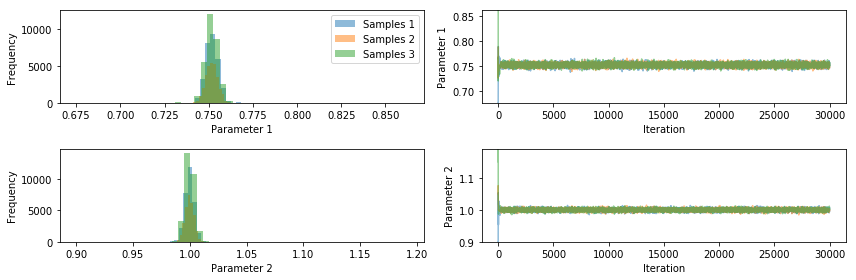

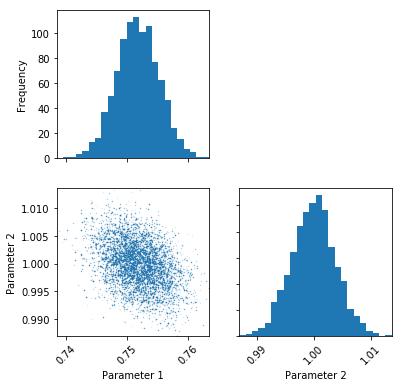

In [51]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-5

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, x0s)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
ac_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(ac_chains)

# Discard warm up
ac_chains_thinned = ac_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(ac_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(ac_chains_thinned[0])

# Show graphs
plt.show()

In [52]:
metropolis_chains.shape

(3, 30000, 2)

In [53]:
metropolis_chains[0][:10]

array([[0.675     , 0.9       ],
       [0.67756009, 0.90113958],
       [0.67919789, 0.9036777 ],
       [0.68332213, 0.90231156],
       [0.68332213, 0.90231156],
       [0.68291922, 0.90586723],
       [0.68291922, 0.90586723],
       [0.68291922, 0.90586723],
       [0.68207412, 0.9077171 ],
       [0.68207412, 0.9077171 ]])

In [54]:
emulated_chains[0][:10]

array([[0.675     , 0.9       ],
       [0.675     , 0.9       ],
       [0.675     , 0.9       ],
       [0.675     , 0.9       ],
       [0.68066508, 0.89956895],
       [0.68066508, 0.89956895],
       [0.68066508, 0.89956895],
       [0.68066508, 0.89956895],
       [0.68066508, 0.89956895],
       [0.68066508, 0.89956895]])

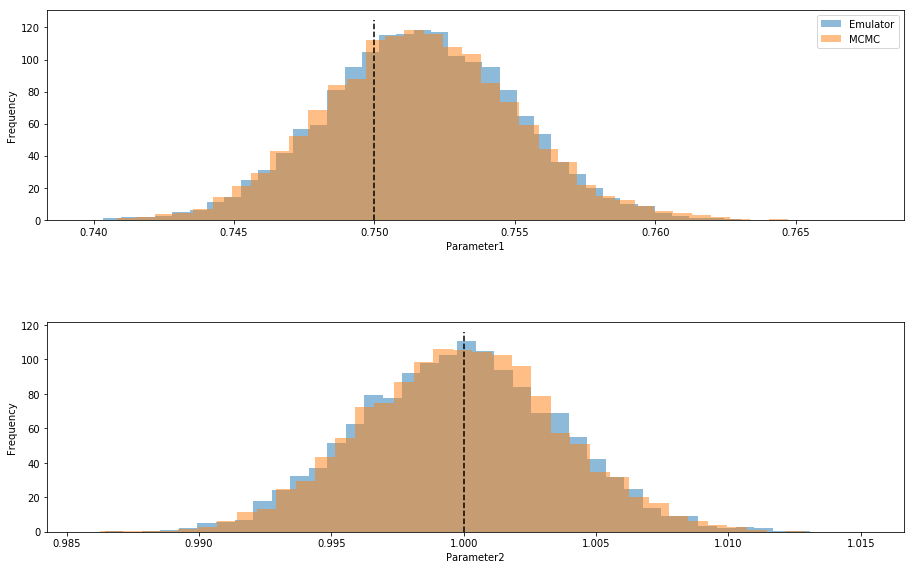

In [56]:
fig, axes = pints.plot.histogram([emulated_chains_thinned[0], metropolis_chains_thinned[0]], ref_parameters=start_parameters, sample_names=["Emulator", "MCMC", "2-Step procedure"])
fig.set_size_inches(14, 9)
plt.show()